In [ ]:
import os
import time
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.animation as animation
import scipy.io as scio

from dolfin import *
from fenics import *
import warnings

# %%
# Geubelle research group
# Authors:  Qibang Liu (qibang@illinois.edu)
#           Michael Zakoworotny (mjz7@illinois.edu)
#           Philippe Geubelle (geubelle@illinois.edu)
#           Aditya Kumar (aditya.kumar@ce.gatech.edu)
#
# An example of running the FP solver for DCPD

import os
from solver_FP import FP_solver
from kinetics_library import Prout_Tompkins_Diffusion
from postProcess_FP import Post_process, saveResults, loadResults


# Sam's imports
from scipy import interpolate as itp
from scipy.integrate import quad
from scipy import optimize


# Switch to current directory
try:
    os.chdir(os.path.dirname(__file__))
except:
    print("Cannot switch directories")

# Thermo-chemical properties
kr = 0.15      # thermal conductivity, W/m-K
rhor = 980.0    # density, kg/m^3
Cpr = 1600.0    # specific heat, J/kg-K

# Nature values
Hr = 350000    # enthalpy, J/kg
A_ = 8.55e15    # pre-exponential constant, 1/s
Er = 110750.0   # activation energy J/mol
n = 1.72        # cure kinetics parameter
m = 0.77        # cure kinetics parameter
Ca = 14.48      # cure kinetics parameter
alpha_c = 0.41  # cure kinetics parameter

# More parameters I copied in from the report file
A = 8.55e15
E = 1.1075e5
R = 8.3144621
n_g = 1.720
m_g = 0.770
c_g = 14.480
a_cg = 0.410

# Create an object for the cure kinetics model
ptd_model = Prout_Tompkins_Diffusion(n, m, Ca, alpha_c)

# Initial conditions for temperature and degree of cure
T0 = 20         # deg C
alpha0 = 0.01

# Length of domain
L = 0.03

t_end = 270
kl = kr/(L**2)

Tf = (T0+273) + ((Hr*(1-alpha0))/Cpr)
D = kr/(rhor*Cpr)
vc = (((A*kr*R*(Tf**2))/(rhor*Hr*(1-alpha0)*E)) * np.exp((-E)/(R*Tf)))**0.5
lc = D/(vc)
hs = [0, 1/250000, 1/500000, 1/1000000, 1/2000000, 1/3000000, 1/50000000]
gaps = [0, 0.0005, 0.001, 0.0015, 0.002, 0.0025, 0.003, 0.0035, 0.004, 0.0045, 0.005]
hs = [1/1000000, 1/2000000, 1/3000000, 1/50000000]


"""
solver = FP_solver(kr, rhor, Cpr, Hr, A_, Er, ptd_model,\
                  T0, alpha0, 0, 0.01, 50*kl, L=L+gap, dt=0.01,h_x=2e-5)

results_data = solver.solve(t_end, outputFreq_t=10, outputFreq_x=1)
save_dir = "out_DCPD"
pts_ = [2e-3, 5e-3]
saveResults(results_data, save_dir, "testfile")
post_pro = Post_process(results_data, solver, pts=pts_,
                        save_dir=save_dir, save_suffix=("DCPD" + str(gap*(1e3)) + "_" + f'{h:.2f}'), anim_frames=100, fid=0)
post_pro.generateReport()  # generate report

"""
i = 0
for h in hs:
    for gap in gaps:
        hcurr = h*(kr/(lc**2))        
        solver = FP_solver(kr, rhor, Cpr, Hr, A_, Er, ptd_model,\
                          T0, alpha0, 0, gap, hcurr, L=L, dt=0.001,h_x=2e-5)
        results_data = solver.solve(t_end, outputFreq_t=10, outputFreq_x=1)
        save_dir = "out_DCPD"
        pts_ = [2e-3, 5e-3]
        if h == 0:
            saveResults(results_data, save_dir, "data_" + str(gap*(1e3)) + "_" + f'0')
        else:
            saveResults(results_data, save_dir, "data_" + str(gap*(1e3)) + "_" + f'{int(1/h)}')
        post_pro = Post_process(results_data, solver, pts=pts_,
                                save_dir=save_dir, save_suffix=("DCPD_" + str(gap*(1e3)) + "_" + f'{h}'), anim_frames=100, fid=i)
        post_pro.generateReport()  # generate report
        i+=1

Cannot switch directories
Saving results for t = 0.010000 s, Elapsed simulation time: 0.046896 s
Saving results for t = 0.020000 s, Elapsed simulation time: 0.095685 s
Saving results for t = 0.030000 s, Elapsed simulation time: 0.144356 s
Saving results for t = 0.040000 s, Elapsed simulation time: 0.192669 s
Saving results for t = 0.050000 s, Elapsed simulation time: 0.240932 s
Saving results for t = 0.060000 s, Elapsed simulation time: 0.289294 s
Saving results for t = 0.070000 s, Elapsed simulation time: 0.338018 s
Saving results for t = 0.080000 s, Elapsed simulation time: 0.386978 s
Saving results for t = 0.090000 s, Elapsed simulation time: 0.435849 s
Saving results for t = 0.100000 s, Elapsed simulation time: 0.485131 s
Saving results for t = 0.110000 s, Elapsed simulation time: 0.534810 s
Saving results for t = 0.120000 s, Elapsed simulation time: 0.583286 s
Saving results for t = 0.130000 s, Elapsed simulation time: 0.631675 s
Saving results for t = 0.140000 s, Elapsed simulati

Saving results for t = 1.340000 s, Elapsed simulation time: 6.540040 s
Saving results for t = 1.350000 s, Elapsed simulation time: 6.588914 s
Saving results for t = 1.360000 s, Elapsed simulation time: 6.637383 s
Saving results for t = 1.370000 s, Elapsed simulation time: 6.685911 s
Saving results for t = 1.380000 s, Elapsed simulation time: 6.734406 s
Saving results for t = 1.390000 s, Elapsed simulation time: 6.782825 s
Saving results for t = 1.400000 s, Elapsed simulation time: 6.832140 s
Saving results for t = 1.410000 s, Elapsed simulation time: 6.880622 s
Saving results for t = 1.420000 s, Elapsed simulation time: 6.929071 s
Saving results for t = 1.430000 s, Elapsed simulation time: 6.977971 s
Saving results for t = 1.440000 s, Elapsed simulation time: 7.026385 s
Saving results for t = 1.450000 s, Elapsed simulation time: 7.074525 s
Saving results for t = 1.460000 s, Elapsed simulation time: 7.122343 s
Saving results for t = 1.470000 s, Elapsed simulation time: 7.170119 s
Saving

Saving results for t = 2.540000 s, Elapsed simulation time: 12.358935 s
Saving results for t = 2.550000 s, Elapsed simulation time: 12.407666 s
Saving results for t = 2.560000 s, Elapsed simulation time: 12.456085 s
Saving results for t = 2.570000 s, Elapsed simulation time: 12.504596 s
Saving results for t = 2.580000 s, Elapsed simulation time: 12.553196 s
Saving results for t = 2.590000 s, Elapsed simulation time: 12.601718 s
Saving results for t = 2.600000 s, Elapsed simulation time: 12.650501 s
Saving results for t = 2.610000 s, Elapsed simulation time: 12.698979 s
Saving results for t = 2.620000 s, Elapsed simulation time: 12.747488 s
Saving results for t = 2.630000 s, Elapsed simulation time: 12.795894 s
Saving results for t = 2.640000 s, Elapsed simulation time: 12.844902 s
Saving results for t = 2.650000 s, Elapsed simulation time: 12.892796 s
Saving results for t = 2.660000 s, Elapsed simulation time: 12.940605 s
Saving results for t = 2.670000 s, Elapsed simulation time: 12.9

Saving results for t = 3.840000 s, Elapsed simulation time: 18.675531 s
Saving results for t = 3.850000 s, Elapsed simulation time: 18.724367 s
Saving results for t = 3.860000 s, Elapsed simulation time: 18.772415 s
Saving results for t = 3.870000 s, Elapsed simulation time: 18.820608 s
Saving results for t = 3.880000 s, Elapsed simulation time: 18.869021 s
Saving results for t = 3.890000 s, Elapsed simulation time: 18.916913 s
Saving results for t = 3.900000 s, Elapsed simulation time: 18.965251 s
Saving results for t = 3.910000 s, Elapsed simulation time: 19.014515 s
Saving results for t = 3.920000 s, Elapsed simulation time: 19.063147 s
Saving results for t = 3.930000 s, Elapsed simulation time: 19.111027 s
Saving results for t = 3.940000 s, Elapsed simulation time: 19.158715 s
Saving results for t = 3.950000 s, Elapsed simulation time: 19.206387 s
Saving results for t = 3.960000 s, Elapsed simulation time: 19.254509 s
Saving results for t = 3.970000 s, Elapsed simulation time: 19.3

Saving results for t = 5.090000 s, Elapsed simulation time: 24.714075 s
Saving results for t = 5.100000 s, Elapsed simulation time: 24.762596 s
Saving results for t = 5.110000 s, Elapsed simulation time: 24.810946 s
Saving results for t = 5.120000 s, Elapsed simulation time: 24.860272 s
Saving results for t = 5.130000 s, Elapsed simulation time: 24.908693 s
Saving results for t = 5.140000 s, Elapsed simulation time: 24.956930 s
Saving results for t = 5.150000 s, Elapsed simulation time: 25.005271 s
Saving results for t = 5.160000 s, Elapsed simulation time: 25.054307 s
Saving results for t = 5.170000 s, Elapsed simulation time: 25.103001 s
Saving results for t = 5.180000 s, Elapsed simulation time: 25.151020 s
Saving results for t = 5.190000 s, Elapsed simulation time: 25.198709 s
Saving results for t = 5.200000 s, Elapsed simulation time: 25.246383 s
Saving results for t = 5.210000 s, Elapsed simulation time: 25.294140 s
Saving results for t = 5.220000 s, Elapsed simulation time: 25.3

Saving results for t = 6.300000 s, Elapsed simulation time: 30.570229 s
Saving results for t = 6.310000 s, Elapsed simulation time: 30.619070 s
Saving results for t = 6.320000 s, Elapsed simulation time: 30.667103 s
Saving results for t = 6.330000 s, Elapsed simulation time: 30.714916 s
Saving results for t = 6.340000 s, Elapsed simulation time: 30.762744 s
Saving results for t = 6.350000 s, Elapsed simulation time: 30.810977 s
Saving results for t = 6.360000 s, Elapsed simulation time: 30.860359 s
Saving results for t = 6.370000 s, Elapsed simulation time: 30.909121 s
Saving results for t = 6.380000 s, Elapsed simulation time: 30.957651 s
Saving results for t = 6.390000 s, Elapsed simulation time: 31.005633 s
Saving results for t = 6.400000 s, Elapsed simulation time: 31.054067 s
Saving results for t = 6.410000 s, Elapsed simulation time: 31.102510 s
Saving results for t = 6.420000 s, Elapsed simulation time: 31.150737 s
Saving results for t = 6.430000 s, Elapsed simulation time: 31.1

Saving results for t = 7.530000 s, Elapsed simulation time: 36.516943 s
Saving results for t = 7.540000 s, Elapsed simulation time: 36.565510 s
Saving results for t = 7.550000 s, Elapsed simulation time: 36.614076 s
Saving results for t = 7.560000 s, Elapsed simulation time: 36.662422 s
Saving results for t = 7.570000 s, Elapsed simulation time: 36.710658 s
Saving results for t = 7.580000 s, Elapsed simulation time: 36.758833 s
Saving results for t = 7.590000 s, Elapsed simulation time: 36.807230 s
Saving results for t = 7.600000 s, Elapsed simulation time: 36.856522 s
Saving results for t = 7.610000 s, Elapsed simulation time: 36.904996 s
Saving results for t = 7.620000 s, Elapsed simulation time: 36.953731 s
Saving results for t = 7.630000 s, Elapsed simulation time: 37.002004 s
Saving results for t = 7.640000 s, Elapsed simulation time: 37.049937 s
Saving results for t = 7.650000 s, Elapsed simulation time: 37.098308 s
Saving results for t = 7.660000 s, Elapsed simulation time: 37.1

Saving results for t = 8.770000 s, Elapsed simulation time: 42.520474 s
Saving results for t = 8.780000 s, Elapsed simulation time: 42.569091 s
Saving results for t = 8.790000 s, Elapsed simulation time: 42.617516 s
Saving results for t = 8.800000 s, Elapsed simulation time: 42.665942 s
Saving results for t = 8.810000 s, Elapsed simulation time: 42.714211 s
Saving results for t = 8.820000 s, Elapsed simulation time: 42.762502 s
Saving results for t = 8.830000 s, Elapsed simulation time: 42.810828 s
Saving results for t = 8.840000 s, Elapsed simulation time: 42.860194 s
Saving results for t = 8.850000 s, Elapsed simulation time: 42.908435 s
Saving results for t = 8.860000 s, Elapsed simulation time: 42.956896 s
Saving results for t = 8.870000 s, Elapsed simulation time: 43.005233 s
Saving results for t = 8.880000 s, Elapsed simulation time: 43.053524 s
Saving results for t = 8.890000 s, Elapsed simulation time: 43.101902 s
Saving results for t = 8.900000 s, Elapsed simulation time: 43.1

Saving results for t = 10.040000 s, Elapsed simulation time: 48.663887 s
Saving results for t = 10.050000 s, Elapsed simulation time: 48.712201 s
Saving results for t = 10.060000 s, Elapsed simulation time: 48.760454 s
Saving results for t = 10.070000 s, Elapsed simulation time: 48.808559 s
Saving results for t = 10.080000 s, Elapsed simulation time: 48.857849 s
Saving results for t = 10.090000 s, Elapsed simulation time: 48.906314 s
Saving results for t = 10.100000 s, Elapsed simulation time: 48.955112 s
Saving results for t = 10.110000 s, Elapsed simulation time: 49.003822 s
Saving results for t = 10.120000 s, Elapsed simulation time: 49.052087 s
Saving results for t = 10.130000 s, Elapsed simulation time: 49.100506 s
Saving results for t = 10.140000 s, Elapsed simulation time: 49.149081 s
Saving results for t = 10.150000 s, Elapsed simulation time: 49.198122 s
Saving results for t = 10.160000 s, Elapsed simulation time: 49.246124 s
Saving results for t = 10.170000 s, Elapsed simulat

Saving results for t = 11.250000 s, Elapsed simulation time: 54.541823 s
Saving results for t = 11.260000 s, Elapsed simulation time: 54.590538 s
Saving results for t = 11.270000 s, Elapsed simulation time: 54.638880 s
Saving results for t = 11.280000 s, Elapsed simulation time: 54.687340 s
Saving results for t = 11.290000 s, Elapsed simulation time: 54.735600 s
Saving results for t = 11.300000 s, Elapsed simulation time: 54.784043 s
Saving results for t = 11.310000 s, Elapsed simulation time: 54.833400 s
Saving results for t = 11.320000 s, Elapsed simulation time: 54.881472 s
Saving results for t = 11.330000 s, Elapsed simulation time: 54.929230 s
Saving results for t = 11.340000 s, Elapsed simulation time: 54.977031 s
Saving results for t = 11.350000 s, Elapsed simulation time: 55.024833 s
Saving results for t = 11.360000 s, Elapsed simulation time: 55.072937 s
Saving results for t = 11.370000 s, Elapsed simulation time: 55.121413 s
Saving results for t = 11.380000 s, Elapsed simulat

Saving results for t = 12.500000 s, Elapsed simulation time: 60.595760 s
Saving results for t = 12.510000 s, Elapsed simulation time: 60.644655 s
Saving results for t = 12.520000 s, Elapsed simulation time: 60.692510 s
Saving results for t = 12.530000 s, Elapsed simulation time: 60.740231 s
Saving results for t = 12.540000 s, Elapsed simulation time: 60.787982 s
Saving results for t = 12.550000 s, Elapsed simulation time: 60.837212 s
Saving results for t = 12.560000 s, Elapsed simulation time: 60.885697 s
Saving results for t = 12.570000 s, Elapsed simulation time: 60.934101 s
Saving results for t = 12.580000 s, Elapsed simulation time: 60.982659 s
Saving results for t = 12.590000 s, Elapsed simulation time: 61.031009 s
Saving results for t = 12.600000 s, Elapsed simulation time: 61.079717 s
Saving results for t = 12.610000 s, Elapsed simulation time: 61.128170 s
Saving results for t = 12.620000 s, Elapsed simulation time: 61.176527 s
Saving results for t = 12.630000 s, Elapsed simulat

Saving results for t = 13.780000 s, Elapsed simulation time: 66.792638 s
Saving results for t = 13.790000 s, Elapsed simulation time: 66.841961 s
Saving results for t = 13.800000 s, Elapsed simulation time: 66.890033 s
Saving results for t = 13.810000 s, Elapsed simulation time: 66.938313 s
Saving results for t = 13.820000 s, Elapsed simulation time: 66.986592 s
Saving results for t = 13.830000 s, Elapsed simulation time: 67.034993 s
Saving results for t = 13.840000 s, Elapsed simulation time: 67.083710 s
Saving results for t = 13.850000 s, Elapsed simulation time: 67.132065 s
Saving results for t = 13.860000 s, Elapsed simulation time: 67.180518 s
Saving results for t = 13.870000 s, Elapsed simulation time: 67.228733 s
Saving results for t = 13.880000 s, Elapsed simulation time: 67.277728 s
Saving results for t = 13.890000 s, Elapsed simulation time: 67.326066 s
Saving results for t = 13.900000 s, Elapsed simulation time: 67.374413 s
Saving results for t = 13.910000 s, Elapsed simulat

Saving results for t = 14.940000 s, Elapsed simulation time: 72.404632 s
Saving results for t = 14.950000 s, Elapsed simulation time: 72.453148 s
Saving results for t = 14.960000 s, Elapsed simulation time: 72.501578 s
Saving results for t = 14.970000 s, Elapsed simulation time: 72.550155 s
Saving results for t = 14.980000 s, Elapsed simulation time: 72.598262 s
Saving results for t = 14.990000 s, Elapsed simulation time: 72.645862 s
Saving results for t = 15.000000 s, Elapsed simulation time: 72.693600 s
Saving results for t = 15.010000 s, Elapsed simulation time: 72.741258 s
Saving results for t = 15.020000 s, Elapsed simulation time: 72.789425 s
Saving results for t = 15.030000 s, Elapsed simulation time: 72.838842 s
Saving results for t = 15.040000 s, Elapsed simulation time: 72.887213 s
Saving results for t = 15.050000 s, Elapsed simulation time: 72.936041 s
Saving results for t = 15.060000 s, Elapsed simulation time: 72.984161 s
Saving results for t = 15.070000 s, Elapsed simulat

Saving results for t = 16.180000 s, Elapsed simulation time: 78.408808 s
Saving results for t = 16.190000 s, Elapsed simulation time: 78.457099 s
Saving results for t = 16.200000 s, Elapsed simulation time: 78.506740 s
Saving results for t = 16.210000 s, Elapsed simulation time: 78.554743 s
Saving results for t = 16.220000 s, Elapsed simulation time: 78.602484 s
Saving results for t = 16.230000 s, Elapsed simulation time: 78.650275 s
Saving results for t = 16.240000 s, Elapsed simulation time: 78.698165 s
Saving results for t = 16.250000 s, Elapsed simulation time: 78.746606 s
Saving results for t = 16.260000 s, Elapsed simulation time: 78.795206 s
Saving results for t = 16.270000 s, Elapsed simulation time: 78.844345 s
Saving results for t = 16.280000 s, Elapsed simulation time: 78.892351 s
Saving results for t = 16.290000 s, Elapsed simulation time: 78.940267 s
Saving results for t = 16.300000 s, Elapsed simulation time: 78.988163 s
Saving results for t = 16.310000 s, Elapsed simulat

Saving results for t = 17.510000 s, Elapsed simulation time: 84.840665 s
Saving results for t = 17.520000 s, Elapsed simulation time: 84.889405 s
Saving results for t = 17.530000 s, Elapsed simulation time: 84.937814 s
Saving results for t = 17.540000 s, Elapsed simulation time: 84.986140 s
Saving results for t = 17.550000 s, Elapsed simulation time: 85.034477 s
Saving results for t = 17.560000 s, Elapsed simulation time: 85.082757 s
Saving results for t = 17.570000 s, Elapsed simulation time: 85.130557 s
Saving results for t = 17.580000 s, Elapsed simulation time: 85.178308 s
Saving results for t = 17.590000 s, Elapsed simulation time: 85.226144 s
Saving results for t = 17.600000 s, Elapsed simulation time: 85.274323 s
Saving results for t = 17.610000 s, Elapsed simulation time: 85.323194 s
Saving results for t = 17.620000 s, Elapsed simulation time: 85.371955 s
Saving results for t = 17.630000 s, Elapsed simulation time: 85.420404 s
Saving results for t = 17.640000 s, Elapsed simulat

Saving results for t = 0.880000 s, Elapsed simulation time: 4.348509 s
Saving results for t = 0.890000 s, Elapsed simulation time: 4.398212 s
Saving results for t = 0.900000 s, Elapsed simulation time: 4.448321 s
Saving results for t = 0.910000 s, Elapsed simulation time: 4.498058 s
Saving results for t = 0.920000 s, Elapsed simulation time: 4.547781 s
Saving results for t = 0.930000 s, Elapsed simulation time: 4.597350 s
Saving results for t = 0.940000 s, Elapsed simulation time: 4.646644 s
Saving results for t = 0.950000 s, Elapsed simulation time: 4.696694 s
Saving results for t = 0.960000 s, Elapsed simulation time: 4.746554 s
Saving results for t = 0.970000 s, Elapsed simulation time: 4.796413 s
Saving results for t = 0.980000 s, Elapsed simulation time: 4.845679 s
Saving results for t = 0.990000 s, Elapsed simulation time: 4.894749 s
Saving results for t = 1.000000 s, Elapsed simulation time: 4.943676 s
Saving results for t = 1.010000 s, Elapsed simulation time: 4.992231 s
Saving

Saving results for t = 2.050000 s, Elapsed simulation time: 10.099508 s
Saving results for t = 2.060000 s, Elapsed simulation time: 10.150441 s
Saving results for t = 2.070000 s, Elapsed simulation time: 10.199064 s
Saving results for t = 2.080000 s, Elapsed simulation time: 10.247598 s
Saving results for t = 2.090000 s, Elapsed simulation time: 10.296119 s
Saving results for t = 2.100000 s, Elapsed simulation time: 10.344884 s
Saving results for t = 2.110000 s, Elapsed simulation time: 10.394195 s
Saving results for t = 2.120000 s, Elapsed simulation time: 10.443769 s
Saving results for t = 2.130000 s, Elapsed simulation time: 10.493368 s
Saving results for t = 2.140000 s, Elapsed simulation time: 10.542523 s
Saving results for t = 2.150000 s, Elapsed simulation time: 10.591521 s
Saving results for t = 2.160000 s, Elapsed simulation time: 10.640681 s
Saving results for t = 2.170000 s, Elapsed simulation time: 10.689755 s
Saving results for t = 2.180000 s, Elapsed simulation time: 10.7

Saving results for t = 3.260000 s, Elapsed simulation time: 16.048131 s
Saving results for t = 3.270000 s, Elapsed simulation time: 16.098479 s
Saving results for t = 3.280000 s, Elapsed simulation time: 16.150236 s
Saving results for t = 3.290000 s, Elapsed simulation time: 16.198881 s
Saving results for t = 3.300000 s, Elapsed simulation time: 16.247776 s
Saving results for t = 3.310000 s, Elapsed simulation time: 16.296239 s
Saving results for t = 3.320000 s, Elapsed simulation time: 16.345120 s
Saving results for t = 3.330000 s, Elapsed simulation time: 16.394192 s
Saving results for t = 3.340000 s, Elapsed simulation time: 16.443938 s
Saving results for t = 3.350000 s, Elapsed simulation time: 16.494315 s
Saving results for t = 3.360000 s, Elapsed simulation time: 16.544576 s
Saving results for t = 3.370000 s, Elapsed simulation time: 16.594600 s
Saving results for t = 3.380000 s, Elapsed simulation time: 16.643095 s
Saving results for t = 3.390000 s, Elapsed simulation time: 16.6

Saving results for t = 4.500000 s, Elapsed simulation time: 22.149972 s
Saving results for t = 4.510000 s, Elapsed simulation time: 22.200379 s
Saving results for t = 4.520000 s, Elapsed simulation time: 22.249792 s
Saving results for t = 4.530000 s, Elapsed simulation time: 22.298837 s
Saving results for t = 4.540000 s, Elapsed simulation time: 22.348098 s
Saving results for t = 4.550000 s, Elapsed simulation time: 22.397220 s
Saving results for t = 4.560000 s, Elapsed simulation time: 22.446827 s
Saving results for t = 4.570000 s, Elapsed simulation time: 22.496173 s
Saving results for t = 4.580000 s, Elapsed simulation time: 22.545256 s
Saving results for t = 4.590000 s, Elapsed simulation time: 22.594415 s
Saving results for t = 4.600000 s, Elapsed simulation time: 22.643692 s
Saving results for t = 4.610000 s, Elapsed simulation time: 22.692792 s
Saving results for t = 4.620000 s, Elapsed simulation time: 22.741949 s
Saving results for t = 4.630000 s, Elapsed simulation time: 22.7

Saving results for t = 5.820000 s, Elapsed simulation time: 28.643895 s
Saving results for t = 5.830000 s, Elapsed simulation time: 28.693167 s
Saving results for t = 5.840000 s, Elapsed simulation time: 28.742026 s
Saving results for t = 5.850000 s, Elapsed simulation time: 28.791287 s
Saving results for t = 5.860000 s, Elapsed simulation time: 28.840366 s
Saving results for t = 5.870000 s, Elapsed simulation time: 28.889975 s
Saving results for t = 5.880000 s, Elapsed simulation time: 28.940346 s
Saving results for t = 5.890000 s, Elapsed simulation time: 28.990727 s
Saving results for t = 5.900000 s, Elapsed simulation time: 29.040230 s
Saving results for t = 5.910000 s, Elapsed simulation time: 29.088913 s
Saving results for t = 5.920000 s, Elapsed simulation time: 29.137641 s
Saving results for t = 5.930000 s, Elapsed simulation time: 29.186548 s
Saving results for t = 5.940000 s, Elapsed simulation time: 29.235826 s
Saving results for t = 5.950000 s, Elapsed simulation time: 29.2

Saving results for t = 7.000000 s, Elapsed simulation time: 34.463158 s
Saving results for t = 7.010000 s, Elapsed simulation time: 34.512663 s
Saving results for t = 7.020000 s, Elapsed simulation time: 34.561886 s
Saving results for t = 7.030000 s, Elapsed simulation time: 34.611185 s
Saving results for t = 7.040000 s, Elapsed simulation time: 34.660404 s
Saving results for t = 7.050000 s, Elapsed simulation time: 34.709893 s
Saving results for t = 7.060000 s, Elapsed simulation time: 34.759170 s
Saving results for t = 7.070000 s, Elapsed simulation time: 34.808047 s
Saving results for t = 7.080000 s, Elapsed simulation time: 34.856732 s
Saving results for t = 7.090000 s, Elapsed simulation time: 34.905349 s
Saving results for t = 7.100000 s, Elapsed simulation time: 34.953937 s
Saving results for t = 7.110000 s, Elapsed simulation time: 35.003145 s
Saving results for t = 7.120000 s, Elapsed simulation time: 35.052517 s
Saving results for t = 7.130000 s, Elapsed simulation time: 35.1

Saving results for t = 8.260000 s, Elapsed simulation time: 40.669218 s
Saving results for t = 8.270000 s, Elapsed simulation time: 40.718549 s
Saving results for t = 8.280000 s, Elapsed simulation time: 40.767859 s
Saving results for t = 8.290000 s, Elapsed simulation time: 40.817091 s
Saving results for t = 8.300000 s, Elapsed simulation time: 40.867173 s
Saving results for t = 8.310000 s, Elapsed simulation time: 40.917641 s
Saving results for t = 8.320000 s, Elapsed simulation time: 40.967268 s
Saving results for t = 8.330000 s, Elapsed simulation time: 41.016160 s
Saving results for t = 8.340000 s, Elapsed simulation time: 41.064852 s
Saving results for t = 8.350000 s, Elapsed simulation time: 41.113476 s
Saving results for t = 8.360000 s, Elapsed simulation time: 41.162335 s
Saving results for t = 8.370000 s, Elapsed simulation time: 41.211529 s
Saving results for t = 8.380000 s, Elapsed simulation time: 41.260768 s
Saving results for t = 8.390000 s, Elapsed simulation time: 41.3

Saving results for t = 9.510000 s, Elapsed simulation time: 46.832700 s
Saving results for t = 9.520000 s, Elapsed simulation time: 46.881984 s
Saving results for t = 9.530000 s, Elapsed simulation time: 46.931351 s
Saving results for t = 9.540000 s, Elapsed simulation time: 46.980509 s
Saving results for t = 9.550000 s, Elapsed simulation time: 47.029214 s
Saving results for t = 9.560000 s, Elapsed simulation time: 47.077867 s
Saving results for t = 9.570000 s, Elapsed simulation time: 47.126508 s
Saving results for t = 9.580000 s, Elapsed simulation time: 47.175185 s
Saving results for t = 9.590000 s, Elapsed simulation time: 47.224261 s
Saving results for t = 9.600000 s, Elapsed simulation time: 47.273821 s
Saving results for t = 9.610000 s, Elapsed simulation time: 47.323030 s
Saving results for t = 9.620000 s, Elapsed simulation time: 47.372349 s
Saving results for t = 9.630000 s, Elapsed simulation time: 47.421627 s
Saving results for t = 9.640000 s, Elapsed simulation time: 47.4

Saving results for t = 10.650000 s, Elapsed simulation time: 52.432264 s
Saving results for t = 10.660000 s, Elapsed simulation time: 52.482905 s
Saving results for t = 10.670000 s, Elapsed simulation time: 52.531536 s
Saving results for t = 10.680000 s, Elapsed simulation time: 52.580110 s
Saving results for t = 10.690000 s, Elapsed simulation time: 52.628654 s
Saving results for t = 10.700000 s, Elapsed simulation time: 52.677815 s
Saving results for t = 10.710000 s, Elapsed simulation time: 52.727966 s
Saving results for t = 10.720000 s, Elapsed simulation time: 52.777263 s
Saving results for t = 10.730000 s, Elapsed simulation time: 52.826699 s
Saving results for t = 10.740000 s, Elapsed simulation time: 52.876018 s
Saving results for t = 10.750000 s, Elapsed simulation time: 52.925140 s
Saving results for t = 10.760000 s, Elapsed simulation time: 52.974327 s
Saving results for t = 10.770000 s, Elapsed simulation time: 53.023485 s
Saving results for t = 10.780000 s, Elapsed simulat

Saving results for t = 11.840000 s, Elapsed simulation time: 58.291467 s
Saving results for t = 11.850000 s, Elapsed simulation time: 58.340684 s
Saving results for t = 11.860000 s, Elapsed simulation time: 58.389737 s
Saving results for t = 11.870000 s, Elapsed simulation time: 58.438889 s
Saving results for t = 11.880000 s, Elapsed simulation time: 58.488698 s
Saving results for t = 11.890000 s, Elapsed simulation time: 58.537845 s
Saving results for t = 11.900000 s, Elapsed simulation time: 58.587346 s
Saving results for t = 11.910000 s, Elapsed simulation time: 58.636538 s
Saving results for t = 11.920000 s, Elapsed simulation time: 58.685208 s
Saving results for t = 11.930000 s, Elapsed simulation time: 58.733532 s
Saving results for t = 11.940000 s, Elapsed simulation time: 58.781935 s
Saving results for t = 11.950000 s, Elapsed simulation time: 58.830337 s
Saving results for t = 11.960000 s, Elapsed simulation time: 58.879245 s
Saving results for t = 11.970000 s, Elapsed simulat

Saving results for t = 12.970000 s, Elapsed simulation time: 63.840159 s
Saving results for t = 12.980000 s, Elapsed simulation time: 63.889787 s
Saving results for t = 12.990000 s, Elapsed simulation time: 63.938211 s
Saving results for t = 13.000000 s, Elapsed simulation time: 63.986612 s
Saving results for t = 13.010000 s, Elapsed simulation time: 64.035113 s
Saving results for t = 13.020000 s, Elapsed simulation time: 64.083561 s
Saving results for t = 13.030000 s, Elapsed simulation time: 64.132073 s
Saving results for t = 13.040000 s, Elapsed simulation time: 64.183941 s
Saving results for t = 13.050000 s, Elapsed simulation time: 64.233113 s
Saving results for t = 13.060000 s, Elapsed simulation time: 64.282232 s
Saving results for t = 13.070000 s, Elapsed simulation time: 64.331814 s
Saving results for t = 13.080000 s, Elapsed simulation time: 64.381849 s
Saving results for t = 13.090000 s, Elapsed simulation time: 64.431931 s
Saving results for t = 13.100000 s, Elapsed simulat

Saving results for t = 14.230000 s, Elapsed simulation time: 70.029152 s
Saving results for t = 14.240000 s, Elapsed simulation time: 70.078254 s
Saving results for t = 14.250000 s, Elapsed simulation time: 70.127251 s
Saving results for t = 14.260000 s, Elapsed simulation time: 70.178584 s
Saving results for t = 14.270000 s, Elapsed simulation time: 70.227681 s
Saving results for t = 14.280000 s, Elapsed simulation time: 70.276777 s
Saving results for t = 14.290000 s, Elapsed simulation time: 70.325883 s
Saving results for t = 14.300000 s, Elapsed simulation time: 70.375485 s
Saving results for t = 14.310000 s, Elapsed simulation time: 70.424361 s
Saving results for t = 14.320000 s, Elapsed simulation time: 70.474387 s
Saving results for t = 14.330000 s, Elapsed simulation time: 70.523577 s
Saving results for t = 14.340000 s, Elapsed simulation time: 70.572657 s
Saving results for t = 14.350000 s, Elapsed simulation time: 70.621321 s
Saving results for t = 14.360000 s, Elapsed simulat

Saving results for t = 15.580000 s, Elapsed simulation time: 76.671199 s
Saving results for t = 15.590000 s, Elapsed simulation time: 76.719847 s
Saving results for t = 15.600000 s, Elapsed simulation time: 76.768655 s
Saving results for t = 15.610000 s, Elapsed simulation time: 76.817646 s
Saving results for t = 15.620000 s, Elapsed simulation time: 76.866714 s
Saving results for t = 15.630000 s, Elapsed simulation time: 76.915773 s
Saving results for t = 15.640000 s, Elapsed simulation time: 76.964908 s
Saving results for t = 15.650000 s, Elapsed simulation time: 77.013971 s
Saving results for t = 15.660000 s, Elapsed simulation time: 77.063107 s
Saving results for t = 15.670000 s, Elapsed simulation time: 77.112063 s
Saving results for t = 15.680000 s, Elapsed simulation time: 77.161280 s
Saving results for t = 15.690000 s, Elapsed simulation time: 77.210357 s
Saving results for t = 15.700000 s, Elapsed simulation time: 77.259842 s
Saving results for t = 15.710000 s, Elapsed simulat

Saving results for t = 16.760000 s, Elapsed simulation time: 82.477225 s
Saving results for t = 16.770000 s, Elapsed simulation time: 82.526719 s
Saving results for t = 16.780000 s, Elapsed simulation time: 82.575266 s
Saving results for t = 16.790000 s, Elapsed simulation time: 82.623723 s
Saving results for t = 16.800000 s, Elapsed simulation time: 82.672384 s
Saving results for t = 16.810000 s, Elapsed simulation time: 82.721061 s
Saving results for t = 16.820000 s, Elapsed simulation time: 82.770360 s
Saving results for t = 16.830000 s, Elapsed simulation time: 82.819563 s
Saving results for t = 16.840000 s, Elapsed simulation time: 82.868716 s
Saving results for t = 16.850000 s, Elapsed simulation time: 82.917686 s
Saving results for t = 16.860000 s, Elapsed simulation time: 82.967037 s
Saving results for t = 16.870000 s, Elapsed simulation time: 83.016096 s
Saving results for t = 16.880000 s, Elapsed simulation time: 83.065292 s
Saving results for t = 16.890000 s, Elapsed simulat

Saving results for t = 17.920000 s, Elapsed simulation time: 88.190692 s
Saving results for t = 17.930000 s, Elapsed simulation time: 88.239811 s
Saving results for t = 17.940000 s, Elapsed simulation time: 88.288985 s
Saving results for t = 17.950000 s, Elapsed simulation time: 88.338275 s
Saving results for t = 17.960000 s, Elapsed simulation time: 88.387470 s
Saving results for t = 17.970000 s, Elapsed simulation time: 88.437693 s
Saving results for t = 17.980000 s, Elapsed simulation time: 88.487523 s
Saving results for t = 17.990000 s, Elapsed simulation time: 88.536911 s
Saving results for t = 18.000000 s, Elapsed simulation time: 88.586172 s
Saving results for t = 18.010000 s, Elapsed simulation time: 88.634700 s
Saving results for t = 18.020000 s, Elapsed simulation time: 88.683203 s
Saving results for t = 18.030000 s, Elapsed simulation time: 88.731727 s
Saving results for t = 18.040000 s, Elapsed simulation time: 88.780811 s
Saving results for t = 18.050000 s, Elapsed simulat

Saving results for t = 19.190000 s, Elapsed simulation time: 94.448441 s
Saving results for t = 19.200000 s, Elapsed simulation time: 94.498591 s
Saving results for t = 19.210000 s, Elapsed simulation time: 94.547868 s
Saving results for t = 19.220000 s, Elapsed simulation time: 94.596483 s
Saving results for t = 19.230000 s, Elapsed simulation time: 94.645015 s
Saving results for t = 19.240000 s, Elapsed simulation time: 94.693696 s
Saving results for t = 19.250000 s, Elapsed simulation time: 94.742853 s
Saving results for t = 19.260000 s, Elapsed simulation time: 94.792217 s
Saving results for t = 19.270000 s, Elapsed simulation time: 94.841612 s
Saving results for t = 19.280000 s, Elapsed simulation time: 94.890672 s
Saving results for t = 19.290000 s, Elapsed simulation time: 94.939812 s
Saving results for t = 19.300000 s, Elapsed simulation time: 94.989121 s
Saving results for t = 19.310000 s, Elapsed simulation time: 95.038330 s
Saving results for t = 19.320000 s, Elapsed simulat

Saving results for t = 20.440000 s, Elapsed simulation time: 100.598722 s
Saving results for t = 20.450000 s, Elapsed simulation time: 100.648277 s
Saving results for t = 20.460000 s, Elapsed simulation time: 100.698844 s
Saving results for t = 20.470000 s, Elapsed simulation time: 100.749205 s
Saving results for t = 20.480000 s, Elapsed simulation time: 100.799621 s
Saving results for t = 20.490000 s, Elapsed simulation time: 100.849408 s
Saving results for t = 20.500000 s, Elapsed simulation time: 100.898218 s
Saving results for t = 20.510000 s, Elapsed simulation time: 100.947335 s
Saving results for t = 20.520000 s, Elapsed simulation time: 100.996360 s
Saving results for t = 20.530000 s, Elapsed simulation time: 101.045310 s
Saving results for t = 20.540000 s, Elapsed simulation time: 101.094451 s
Saving results for t = 20.550000 s, Elapsed simulation time: 101.143364 s
Saving results for t = 20.560000 s, Elapsed simulation time: 101.192521 s
Saving results for t = 20.570000 s, El

Saving results for t = 21.550000 s, Elapsed simulation time: 106.052169 s
Saving results for t = 21.560000 s, Elapsed simulation time: 106.101243 s
Saving results for t = 21.570000 s, Elapsed simulation time: 106.150786 s
Saving results for t = 21.580000 s, Elapsed simulation time: 106.201261 s
Saving results for t = 21.590000 s, Elapsed simulation time: 106.250140 s
Saving results for t = 21.600000 s, Elapsed simulation time: 106.298602 s
Saving results for t = 21.610000 s, Elapsed simulation time: 106.347342 s
Saving results for t = 21.620000 s, Elapsed simulation time: 106.396160 s
Saving results for t = 21.630000 s, Elapsed simulation time: 106.445974 s
Saving results for t = 21.640000 s, Elapsed simulation time: 106.495405 s
Saving results for t = 21.650000 s, Elapsed simulation time: 106.545094 s
Saving results for t = 21.660000 s, Elapsed simulation time: 106.594167 s
Saving results for t = 21.670000 s, Elapsed simulation time: 106.643323 s
Saving results for t = 21.680000 s, El

Saving results for t = 22.780000 s, Elapsed simulation time: 112.099429 s
Saving results for t = 22.790000 s, Elapsed simulation time: 112.148855 s
Saving results for t = 22.800000 s, Elapsed simulation time: 112.200256 s
Saving results for t = 22.810000 s, Elapsed simulation time: 112.249411 s
Saving results for t = 22.820000 s, Elapsed simulation time: 112.298065 s
Saving results for t = 22.830000 s, Elapsed simulation time: 112.346624 s
Saving results for t = 22.840000 s, Elapsed simulation time: 112.395251 s
Saving results for t = 22.850000 s, Elapsed simulation time: 112.444829 s
Saving results for t = 22.860000 s, Elapsed simulation time: 112.494528 s
Saving results for t = 22.870000 s, Elapsed simulation time: 112.543987 s
Saving results for t = 22.880000 s, Elapsed simulation time: 112.593670 s
Saving results for t = 22.890000 s, Elapsed simulation time: 112.643007 s
Saving results for t = 22.900000 s, Elapsed simulation time: 112.692166 s
Saving results for t = 22.910000 s, El

Saving results for t = 0.260000 s, Elapsed simulation time: 1.281952 s
Saving results for t = 0.270000 s, Elapsed simulation time: 1.331488 s
Saving results for t = 0.280000 s, Elapsed simulation time: 1.381139 s
Saving results for t = 0.290000 s, Elapsed simulation time: 1.431047 s
Saving results for t = 0.300000 s, Elapsed simulation time: 1.480387 s
Saving results for t = 0.310000 s, Elapsed simulation time: 1.529919 s
Saving results for t = 0.320000 s, Elapsed simulation time: 1.579806 s
Saving results for t = 0.330000 s, Elapsed simulation time: 1.629224 s
Saving results for t = 0.340000 s, Elapsed simulation time: 1.678607 s
Saving results for t = 0.350000 s, Elapsed simulation time: 1.727930 s
Saving results for t = 0.360000 s, Elapsed simulation time: 1.777169 s
Saving results for t = 0.370000 s, Elapsed simulation time: 1.825971 s
Saving results for t = 0.380000 s, Elapsed simulation time: 1.874764 s
Saving results for t = 0.390000 s, Elapsed simulation time: 1.923359 s
Saving

Saving results for t = 1.470000 s, Elapsed simulation time: 7.243778 s
Saving results for t = 1.480000 s, Elapsed simulation time: 7.292648 s
Saving results for t = 1.490000 s, Elapsed simulation time: 7.341455 s
Saving results for t = 1.500000 s, Elapsed simulation time: 7.390924 s
Saving results for t = 1.510000 s, Elapsed simulation time: 7.439893 s
Saving results for t = 1.520000 s, Elapsed simulation time: 7.489043 s
Saving results for t = 1.530000 s, Elapsed simulation time: 7.538248 s
Saving results for t = 1.540000 s, Elapsed simulation time: 7.586814 s
Saving results for t = 1.550000 s, Elapsed simulation time: 7.635436 s
Saving results for t = 1.560000 s, Elapsed simulation time: 7.683995 s
Saving results for t = 1.570000 s, Elapsed simulation time: 7.733456 s
Saving results for t = 1.580000 s, Elapsed simulation time: 7.782459 s
Saving results for t = 1.590000 s, Elapsed simulation time: 7.831441 s
Saving results for t = 1.600000 s, Elapsed simulation time: 7.880385 s
Saving

Saving results for t = 2.750000 s, Elapsed simulation time: 13.521636 s
Saving results for t = 2.760000 s, Elapsed simulation time: 13.570557 s
Saving results for t = 2.770000 s, Elapsed simulation time: 13.620256 s
Saving results for t = 2.780000 s, Elapsed simulation time: 13.668549 s
Saving results for t = 2.790000 s, Elapsed simulation time: 13.717013 s
Saving results for t = 2.800000 s, Elapsed simulation time: 13.765358 s
Saving results for t = 2.810000 s, Elapsed simulation time: 13.813554 s
Saving results for t = 2.820000 s, Elapsed simulation time: 13.862123 s
Saving results for t = 2.830000 s, Elapsed simulation time: 13.911064 s
Saving results for t = 2.840000 s, Elapsed simulation time: 13.960437 s
Saving results for t = 2.850000 s, Elapsed simulation time: 14.009250 s
Saving results for t = 2.860000 s, Elapsed simulation time: 14.058288 s
Saving results for t = 2.870000 s, Elapsed simulation time: 14.107214 s
Saving results for t = 2.880000 s, Elapsed simulation time: 14.1

Saving results for t = 3.920000 s, Elapsed simulation time: 19.248787 s
Saving results for t = 3.930000 s, Elapsed simulation time: 19.297880 s
Saving results for t = 3.940000 s, Elapsed simulation time: 19.346897 s
Saving results for t = 3.950000 s, Elapsed simulation time: 19.396849 s
Saving results for t = 3.960000 s, Elapsed simulation time: 19.445842 s
Saving results for t = 3.970000 s, Elapsed simulation time: 19.494460 s
Saving results for t = 3.980000 s, Elapsed simulation time: 19.543199 s
Saving results for t = 3.990000 s, Elapsed simulation time: 19.591955 s
Saving results for t = 4.000000 s, Elapsed simulation time: 19.640770 s
Saving results for t = 4.010000 s, Elapsed simulation time: 19.690030 s
Saving results for t = 4.020000 s, Elapsed simulation time: 19.739446 s
Saving results for t = 4.030000 s, Elapsed simulation time: 19.788437 s
Saving results for t = 4.040000 s, Elapsed simulation time: 19.837798 s
Saving results for t = 4.050000 s, Elapsed simulation time: 19.8

Saving results for t = 5.130000 s, Elapsed simulation time: 25.174603 s
Saving results for t = 5.140000 s, Elapsed simulation time: 25.224902 s
Saving results for t = 5.150000 s, Elapsed simulation time: 25.275119 s
Saving results for t = 5.160000 s, Elapsed simulation time: 25.325125 s
Saving results for t = 5.170000 s, Elapsed simulation time: 25.375176 s
Saving results for t = 5.180000 s, Elapsed simulation time: 25.426232 s
Saving results for t = 5.190000 s, Elapsed simulation time: 25.475233 s
Saving results for t = 5.200000 s, Elapsed simulation time: 25.523701 s
Saving results for t = 5.210000 s, Elapsed simulation time: 25.572866 s
Saving results for t = 5.220000 s, Elapsed simulation time: 25.621598 s
Saving results for t = 5.230000 s, Elapsed simulation time: 25.670030 s
Saving results for t = 5.240000 s, Elapsed simulation time: 25.718433 s
Saving results for t = 5.250000 s, Elapsed simulation time: 25.766934 s
Saving results for t = 5.260000 s, Elapsed simulation time: 25.8

Saving results for t = 6.280000 s, Elapsed simulation time: 30.830753 s
Saving results for t = 6.290000 s, Elapsed simulation time: 30.879771 s
Saving results for t = 6.300000 s, Elapsed simulation time: 30.929003 s
Saving results for t = 6.310000 s, Elapsed simulation time: 30.978043 s
Saving results for t = 6.320000 s, Elapsed simulation time: 31.027149 s
Saving results for t = 6.330000 s, Elapsed simulation time: 31.075732 s
Saving results for t = 6.340000 s, Elapsed simulation time: 31.124333 s
Saving results for t = 6.350000 s, Elapsed simulation time: 31.172931 s
Saving results for t = 6.360000 s, Elapsed simulation time: 31.221902 s
Saving results for t = 6.370000 s, Elapsed simulation time: 31.271140 s
Saving results for t = 6.380000 s, Elapsed simulation time: 31.320152 s
Saving results for t = 6.390000 s, Elapsed simulation time: 31.369208 s
Saving results for t = 6.400000 s, Elapsed simulation time: 31.419119 s
Saving results for t = 6.410000 s, Elapsed simulation time: 31.4

Saving results for t = 7.420000 s, Elapsed simulation time: 36.421093 s
Saving results for t = 7.430000 s, Elapsed simulation time: 36.470334 s
Saving results for t = 7.440000 s, Elapsed simulation time: 36.519115 s
Saving results for t = 7.450000 s, Elapsed simulation time: 36.568068 s
Saving results for t = 7.460000 s, Elapsed simulation time: 36.616956 s
Saving results for t = 7.470000 s, Elapsed simulation time: 36.665730 s
Saving results for t = 7.480000 s, Elapsed simulation time: 36.714531 s
Saving results for t = 7.490000 s, Elapsed simulation time: 36.763932 s
Saving results for t = 7.500000 s, Elapsed simulation time: 36.812952 s
Saving results for t = 7.510000 s, Elapsed simulation time: 36.861860 s
Saving results for t = 7.520000 s, Elapsed simulation time: 36.910779 s
Saving results for t = 7.530000 s, Elapsed simulation time: 36.959637 s
Saving results for t = 7.540000 s, Elapsed simulation time: 37.008410 s
Saving results for t = 7.550000 s, Elapsed simulation time: 37.0

Saving results for t = 8.650000 s, Elapsed simulation time: 42.441025 s
Saving results for t = 8.660000 s, Elapsed simulation time: 42.490389 s
Saving results for t = 8.670000 s, Elapsed simulation time: 42.539320 s
Saving results for t = 8.680000 s, Elapsed simulation time: 42.588339 s
Saving results for t = 8.690000 s, Elapsed simulation time: 42.637393 s
Saving results for t = 8.700000 s, Elapsed simulation time: 42.686463 s
Saving results for t = 8.710000 s, Elapsed simulation time: 42.735450 s
Saving results for t = 8.720000 s, Elapsed simulation time: 42.785274 s
Saving results for t = 8.730000 s, Elapsed simulation time: 42.834168 s
Saving results for t = 8.740000 s, Elapsed simulation time: 42.882577 s
Saving results for t = 8.750000 s, Elapsed simulation time: 42.931063 s
Saving results for t = 8.760000 s, Elapsed simulation time: 42.979583 s
Saving results for t = 8.770000 s, Elapsed simulation time: 43.028106 s
Saving results for t = 8.780000 s, Elapsed simulation time: 43.0

Saving results for t = 9.820000 s, Elapsed simulation time: 48.174217 s
Saving results for t = 9.830000 s, Elapsed simulation time: 48.223057 s
Saving results for t = 9.840000 s, Elapsed simulation time: 48.272218 s
Saving results for t = 9.850000 s, Elapsed simulation time: 48.320669 s
Saving results for t = 9.860000 s, Elapsed simulation time: 48.369038 s
Saving results for t = 9.870000 s, Elapsed simulation time: 48.418347 s
Saving results for t = 9.880000 s, Elapsed simulation time: 48.467813 s
Saving results for t = 9.890000 s, Elapsed simulation time: 48.516894 s
Saving results for t = 9.900000 s, Elapsed simulation time: 48.565414 s
Saving results for t = 9.910000 s, Elapsed simulation time: 48.613617 s
Saving results for t = 9.920000 s, Elapsed simulation time: 48.661987 s
Saving results for t = 9.930000 s, Elapsed simulation time: 48.710924 s
Saving results for t = 9.940000 s, Elapsed simulation time: 48.760264 s
Saving results for t = 9.950000 s, Elapsed simulation time: 48.8

Saving results for t = 11.000000 s, Elapsed simulation time: 53.950906 s
Saving results for t = 11.010000 s, Elapsed simulation time: 54.000646 s
Saving results for t = 11.020000 s, Elapsed simulation time: 54.049123 s
Saving results for t = 11.030000 s, Elapsed simulation time: 54.097605 s
Saving results for t = 11.040000 s, Elapsed simulation time: 54.146092 s
Saving results for t = 11.050000 s, Elapsed simulation time: 54.194517 s
Saving results for t = 11.060000 s, Elapsed simulation time: 54.243716 s
Saving results for t = 11.070000 s, Elapsed simulation time: 54.292905 s
Saving results for t = 11.080000 s, Elapsed simulation time: 54.341882 s
Saving results for t = 11.090000 s, Elapsed simulation time: 54.391686 s
Saving results for t = 11.100000 s, Elapsed simulation time: 54.440700 s
Saving results for t = 11.110000 s, Elapsed simulation time: 54.489639 s
Saving results for t = 11.120000 s, Elapsed simulation time: 54.538639 s
Saving results for t = 11.130000 s, Elapsed simulat

Saving results for t = 12.150000 s, Elapsed simulation time: 59.591323 s
Saving results for t = 12.160000 s, Elapsed simulation time: 59.640269 s
Saving results for t = 12.170000 s, Elapsed simulation time: 59.689225 s
Saving results for t = 12.180000 s, Elapsed simulation time: 59.738209 s
Saving results for t = 12.190000 s, Elapsed simulation time: 59.787120 s
Saving results for t = 12.200000 s, Elapsed simulation time: 59.836092 s
Saving results for t = 12.210000 s, Elapsed simulation time: 59.885276 s
Saving results for t = 12.220000 s, Elapsed simulation time: 59.934212 s
Saving results for t = 12.230000 s, Elapsed simulation time: 59.983234 s
Saving results for t = 12.240000 s, Elapsed simulation time: 60.032202 s
Saving results for t = 12.250000 s, Elapsed simulation time: 60.081057 s
Saving results for t = 12.260000 s, Elapsed simulation time: 60.130013 s
Saving results for t = 12.270000 s, Elapsed simulation time: 60.178864 s
Saving results for t = 12.280000 s, Elapsed simulat

Saving results for t = 13.350000 s, Elapsed simulation time: 65.480592 s
Saving results for t = 13.360000 s, Elapsed simulation time: 65.529634 s
Saving results for t = 13.370000 s, Elapsed simulation time: 65.578523 s
Saving results for t = 13.380000 s, Elapsed simulation time: 65.627665 s
Saving results for t = 13.390000 s, Elapsed simulation time: 65.676816 s
Saving results for t = 13.400000 s, Elapsed simulation time: 65.725967 s
Saving results for t = 13.410000 s, Elapsed simulation time: 65.775186 s
Saving results for t = 13.420000 s, Elapsed simulation time: 65.824265 s
Saving results for t = 13.430000 s, Elapsed simulation time: 65.872755 s
Saving results for t = 13.440000 s, Elapsed simulation time: 65.921208 s
Saving results for t = 13.450000 s, Elapsed simulation time: 65.969951 s
Saving results for t = 13.460000 s, Elapsed simulation time: 66.018774 s
Saving results for t = 13.470000 s, Elapsed simulation time: 66.068098 s
Saving results for t = 13.480000 s, Elapsed simulat

Saving results for t = 14.590000 s, Elapsed simulation time: 71.567589 s
Saving results for t = 14.600000 s, Elapsed simulation time: 71.616839 s
Saving results for t = 14.610000 s, Elapsed simulation time: 71.665567 s
Saving results for t = 14.620000 s, Elapsed simulation time: 71.714104 s
Saving results for t = 14.630000 s, Elapsed simulation time: 71.762657 s
Saving results for t = 14.640000 s, Elapsed simulation time: 71.811196 s
Saving results for t = 14.650000 s, Elapsed simulation time: 71.860126 s
Saving results for t = 14.660000 s, Elapsed simulation time: 71.909364 s
Saving results for t = 14.670000 s, Elapsed simulation time: 71.958460 s
Saving results for t = 14.680000 s, Elapsed simulation time: 72.007621 s
Saving results for t = 14.690000 s, Elapsed simulation time: 72.056804 s
Saving results for t = 14.700000 s, Elapsed simulation time: 72.106120 s
Saving results for t = 14.710000 s, Elapsed simulation time: 72.154776 s
Saving results for t = 14.720000 s, Elapsed simulat

Saving results for t = 15.800000 s, Elapsed simulation time: 77.507353 s
Saving results for t = 15.810000 s, Elapsed simulation time: 77.556434 s
Saving results for t = 15.820000 s, Elapsed simulation time: 77.605422 s
Saving results for t = 15.830000 s, Elapsed simulation time: 77.653837 s
Saving results for t = 15.840000 s, Elapsed simulation time: 77.702928 s
Saving results for t = 15.850000 s, Elapsed simulation time: 77.752156 s
Saving results for t = 15.860000 s, Elapsed simulation time: 77.802118 s
Saving results for t = 15.870000 s, Elapsed simulation time: 77.852773 s
Saving results for t = 15.880000 s, Elapsed simulation time: 77.903336 s
Saving results for t = 15.890000 s, Elapsed simulation time: 77.953829 s
Saving results for t = 15.900000 s, Elapsed simulation time: 78.003995 s
Saving results for t = 15.910000 s, Elapsed simulation time: 78.054305 s
Saving results for t = 15.920000 s, Elapsed simulation time: 78.104595 s
Saving results for t = 15.930000 s, Elapsed simulat

Saving results for t = 17.020000 s, Elapsed simulation time: 83.501027 s
Saving results for t = 17.030000 s, Elapsed simulation time: 83.550064 s
Saving results for t = 17.040000 s, Elapsed simulation time: 83.598945 s
Saving results for t = 17.050000 s, Elapsed simulation time: 83.648149 s
Saving results for t = 17.060000 s, Elapsed simulation time: 83.697179 s
Saving results for t = 17.070000 s, Elapsed simulation time: 83.746178 s
Saving results for t = 17.080000 s, Elapsed simulation time: 83.795147 s
Saving results for t = 17.090000 s, Elapsed simulation time: 83.844171 s
Saving results for t = 17.100000 s, Elapsed simulation time: 83.893199 s
Saving results for t = 17.110000 s, Elapsed simulation time: 83.942302 s
Saving results for t = 17.120000 s, Elapsed simulation time: 83.991692 s
Saving results for t = 17.130000 s, Elapsed simulation time: 84.040644 s
Saving results for t = 17.140000 s, Elapsed simulation time: 84.089443 s
Saving results for t = 17.150000 s, Elapsed simulat

Saving results for t = 18.190000 s, Elapsed simulation time: 89.237605 s
Saving results for t = 18.200000 s, Elapsed simulation time: 89.286842 s
Saving results for t = 18.210000 s, Elapsed simulation time: 89.335942 s
Saving results for t = 18.220000 s, Elapsed simulation time: 89.385664 s
Saving results for t = 18.230000 s, Elapsed simulation time: 89.435306 s
Saving results for t = 18.240000 s, Elapsed simulation time: 89.484330 s
Saving results for t = 18.250000 s, Elapsed simulation time: 89.532978 s
Saving results for t = 18.260000 s, Elapsed simulation time: 89.581591 s
Saving results for t = 18.270000 s, Elapsed simulation time: 89.630125 s
Saving results for t = 18.280000 s, Elapsed simulation time: 89.679010 s
Saving results for t = 18.290000 s, Elapsed simulation time: 89.727829 s
Saving results for t = 18.300000 s, Elapsed simulation time: 89.777049 s
Saving results for t = 18.310000 s, Elapsed simulation time: 89.825930 s
Saving results for t = 18.320000 s, Elapsed simulat

Saving results for t = 19.360000 s, Elapsed simulation time: 94.966616 s
Saving results for t = 19.370000 s, Elapsed simulation time: 95.016686 s
Saving results for t = 19.380000 s, Elapsed simulation time: 95.065768 s
Saving results for t = 19.390000 s, Elapsed simulation time: 95.114851 s
Saving results for t = 19.400000 s, Elapsed simulation time: 95.164025 s
Saving results for t = 19.410000 s, Elapsed simulation time: 95.213160 s
Saving results for t = 19.420000 s, Elapsed simulation time: 95.264547 s
Saving results for t = 19.430000 s, Elapsed simulation time: 95.313137 s
Saving results for t = 19.440000 s, Elapsed simulation time: 95.361680 s
Saving results for t = 19.450000 s, Elapsed simulation time: 95.411329 s
Saving results for t = 19.460000 s, Elapsed simulation time: 95.460438 s
Saving results for t = 19.470000 s, Elapsed simulation time: 95.509523 s
Saving results for t = 19.480000 s, Elapsed simulation time: 95.558878 s
Saving results for t = 19.490000 s, Elapsed simulat

Saving results for t = 20.520000 s, Elapsed simulation time: 100.669907 s
Saving results for t = 20.530000 s, Elapsed simulation time: 100.718821 s
Saving results for t = 20.540000 s, Elapsed simulation time: 100.768116 s
Saving results for t = 20.550000 s, Elapsed simulation time: 100.817153 s
Saving results for t = 20.560000 s, Elapsed simulation time: 100.866321 s
Saving results for t = 20.570000 s, Elapsed simulation time: 100.915522 s
Saving results for t = 20.580000 s, Elapsed simulation time: 100.964557 s
Saving results for t = 20.590000 s, Elapsed simulation time: 101.013171 s
Saving results for t = 20.600000 s, Elapsed simulation time: 101.063408 s
Saving results for t = 20.610000 s, Elapsed simulation time: 101.112069 s
Saving results for t = 20.620000 s, Elapsed simulation time: 101.160796 s
Saving results for t = 20.630000 s, Elapsed simulation time: 101.209234 s
Saving results for t = 20.640000 s, Elapsed simulation time: 101.259965 s
Saving results for t = 20.650000 s, El

Saving results for t = 21.740000 s, Elapsed simulation time: 106.669676 s
Saving results for t = 21.750000 s, Elapsed simulation time: 106.718869 s
Saving results for t = 21.760000 s, Elapsed simulation time: 106.767358 s
Saving results for t = 21.770000 s, Elapsed simulation time: 106.815904 s
Saving results for t = 21.780000 s, Elapsed simulation time: 106.864546 s
Saving results for t = 21.790000 s, Elapsed simulation time: 106.914566 s
Saving results for t = 21.800000 s, Elapsed simulation time: 106.964892 s
Saving results for t = 21.810000 s, Elapsed simulation time: 107.014164 s
Saving results for t = 21.820000 s, Elapsed simulation time: 107.063327 s
Saving results for t = 21.830000 s, Elapsed simulation time: 107.113070 s
Saving results for t = 21.840000 s, Elapsed simulation time: 107.162411 s
Saving results for t = 21.850000 s, Elapsed simulation time: 107.211456 s
Saving results for t = 21.860000 s, Elapsed simulation time: 107.262348 s
Saving results for t = 21.870000 s, El

Saving results for t = 22.940000 s, Elapsed simulation time: 112.557813 s
Saving results for t = 22.950000 s, Elapsed simulation time: 112.608202 s
Saving results for t = 22.960000 s, Elapsed simulation time: 112.658592 s
Saving results for t = 22.970000 s, Elapsed simulation time: 112.708829 s
Saving results for t = 22.980000 s, Elapsed simulation time: 112.759031 s
Saving results for t = 22.990000 s, Elapsed simulation time: 112.808191 s
Saving results for t = 23.000000 s, Elapsed simulation time: 112.857265 s
Saving results for t = 23.010000 s, Elapsed simulation time: 112.906184 s
Saving results for t = 23.020000 s, Elapsed simulation time: 112.955086 s
Saving results for t = 23.030000 s, Elapsed simulation time: 113.004015 s
Saving results for t = 23.040000 s, Elapsed simulation time: 113.052923 s
Saving results for t = 23.050000 s, Elapsed simulation time: 113.102613 s
Saving results for t = 23.060000 s, Elapsed simulation time: 113.151476 s
Saving results for t = 23.070000 s, El

Saving results for t = 24.110000 s, Elapsed simulation time: 118.298962 s
Saving results for t = 24.120000 s, Elapsed simulation time: 118.347945 s
Saving results for t = 24.130000 s, Elapsed simulation time: 118.397592 s
Saving results for t = 24.140000 s, Elapsed simulation time: 118.446675 s
Saving results for t = 24.150000 s, Elapsed simulation time: 118.495486 s
Saving results for t = 24.160000 s, Elapsed simulation time: 118.544473 s
Saving results for t = 24.170000 s, Elapsed simulation time: 118.593626 s
Saving results for t = 24.180000 s, Elapsed simulation time: 118.642622 s
Saving results for t = 24.190000 s, Elapsed simulation time: 118.691458 s
Saving results for t = 24.200000 s, Elapsed simulation time: 118.740488 s
Saving results for t = 24.210000 s, Elapsed simulation time: 118.789731 s
Saving results for t = 24.220000 s, Elapsed simulation time: 118.838864 s
Saving results for t = 24.230000 s, Elapsed simulation time: 118.887768 s
Saving results for t = 24.240000 s, El

Saving results for t = 25.360000 s, Elapsed simulation time: 124.427755 s
Saving results for t = 25.370000 s, Elapsed simulation time: 124.478840 s
Saving results for t = 25.380000 s, Elapsed simulation time: 124.529479 s
Saving results for t = 25.390000 s, Elapsed simulation time: 124.579700 s
Saving results for t = 25.400000 s, Elapsed simulation time: 124.629813 s
Saving results for t = 25.410000 s, Elapsed simulation time: 124.681140 s
Saving results for t = 25.420000 s, Elapsed simulation time: 124.731278 s
Saving results for t = 25.430000 s, Elapsed simulation time: 124.781989 s
Saving results for t = 25.440000 s, Elapsed simulation time: 124.832757 s
Saving results for t = 25.450000 s, Elapsed simulation time: 124.883186 s
Saving results for t = 25.460000 s, Elapsed simulation time: 124.934711 s
Saving results for t = 25.470000 s, Elapsed simulation time: 124.985503 s
Saving results for t = 25.480000 s, Elapsed simulation time: 125.035012 s
Saving results for t = 25.490000 s, El

Saving results for t = 26.510000 s, Elapsed simulation time: 130.124008 s
Saving results for t = 26.520000 s, Elapsed simulation time: 130.173164 s
Saving results for t = 26.530000 s, Elapsed simulation time: 130.222261 s
Saving results for t = 26.540000 s, Elapsed simulation time: 130.271308 s
Saving results for t = 26.550000 s, Elapsed simulation time: 130.320263 s
Saving results for t = 26.560000 s, Elapsed simulation time: 130.369646 s
Saving results for t = 26.570000 s, Elapsed simulation time: 130.419457 s
Saving results for t = 26.580000 s, Elapsed simulation time: 130.467985 s
Saving results for t = 26.590000 s, Elapsed simulation time: 130.516639 s
Saving results for t = 26.600000 s, Elapsed simulation time: 130.565704 s
Saving results for t = 26.610000 s, Elapsed simulation time: 130.615713 s
Saving results for t = 26.620000 s, Elapsed simulation time: 130.665109 s
Saving results for t = 26.630000 s, Elapsed simulation time: 130.714179 s
Saving results for t = 26.640000 s, El

Saving results for t = 27.640000 s, Elapsed simulation time: 135.675309 s
Saving results for t = 27.650000 s, Elapsed simulation time: 135.724440 s
Saving results for t = 27.660000 s, Elapsed simulation time: 135.773408 s
Saving results for t = 27.670000 s, Elapsed simulation time: 135.821763 s
Saving results for t = 27.680000 s, Elapsed simulation time: 135.870124 s
Saving results for t = 27.690000 s, Elapsed simulation time: 135.918543 s
Saving results for t = 27.700000 s, Elapsed simulation time: 135.967766 s
Saving results for t = 27.710000 s, Elapsed simulation time: 136.017289 s
Saving results for t = 27.720000 s, Elapsed simulation time: 136.066393 s
Saving results for t = 27.730000 s, Elapsed simulation time: 136.115572 s
Saving results for t = 27.740000 s, Elapsed simulation time: 136.164618 s
Saving results for t = 27.750000 s, Elapsed simulation time: 136.213701 s
Saving results for t = 27.760000 s, Elapsed simulation time: 136.262866 s
Saving results for t = 27.770000 s, El

Saving results for t = 28.750000 s, Elapsed simulation time: 141.116111 s
Saving results for t = 28.760000 s, Elapsed simulation time: 141.165042 s
Saving results for t = 28.770000 s, Elapsed simulation time: 141.213896 s
Saving results for t = 28.780000 s, Elapsed simulation time: 141.263621 s
Saving results for t = 28.790000 s, Elapsed simulation time: 141.313034 s
Saving results for t = 28.800000 s, Elapsed simulation time: 141.361885 s
Saving results for t = 28.810000 s, Elapsed simulation time: 141.411042 s
Saving results for t = 28.820000 s, Elapsed simulation time: 141.459397 s
Saving results for t = 28.830000 s, Elapsed simulation time: 141.508280 s
Saving results for t = 28.840000 s, Elapsed simulation time: 141.557244 s
Saving results for t = 28.850000 s, Elapsed simulation time: 141.606081 s
Saving results for t = 28.860000 s, Elapsed simulation time: 141.654949 s
Saving results for t = 28.870000 s, Elapsed simulation time: 141.703866 s
Saving results for t = 28.880000 s, El

Saving results for t = 29.920000 s, Elapsed simulation time: 146.840788 s
Saving results for t = 29.930000 s, Elapsed simulation time: 146.889672 s
Saving results for t = 29.940000 s, Elapsed simulation time: 146.938588 s
Saving results for t = 29.950000 s, Elapsed simulation time: 146.987387 s
Saving results for t = 29.960000 s, Elapsed simulation time: 147.038583 s
Saving results for t = 29.970000 s, Elapsed simulation time: 147.086882 s
Saving results for t = 29.980000 s, Elapsed simulation time: 147.135251 s
Saving results for t = 29.990000 s, Elapsed simulation time: 147.183589 s
Saving results for t = 30.000000 s, Elapsed simulation time: 147.232022 s
Saving results for t = 30.010000 s, Elapsed simulation time: 147.281724 s
Saving results for t = 30.020000 s, Elapsed simulation time: 147.330801 s
Saving results for t = 30.030000 s, Elapsed simulation time: 147.380105 s
Saving results for t = 30.040000 s, Elapsed simulation time: 147.429701 s
Saving results for t = 30.050000 s, El

Saving results for t = 31.100000 s, Elapsed simulation time: 152.634347 s
Saving results for t = 31.110000 s, Elapsed simulation time: 152.683354 s
Saving results for t = 31.120000 s, Elapsed simulation time: 152.732379 s
Saving results for t = 31.130000 s, Elapsed simulation time: 152.781354 s
Saving results for t = 31.140000 s, Elapsed simulation time: 152.830493 s
Saving results for t = 31.150000 s, Elapsed simulation time: 152.879547 s
Saving results for t = 31.160000 s, Elapsed simulation time: 152.928687 s
Saving results for t = 31.170000 s, Elapsed simulation time: 152.977786 s
Saving results for t = 31.180000 s, Elapsed simulation time: 153.027081 s
Saving results for t = 31.190000 s, Elapsed simulation time: 153.076056 s
Saving results for t = 31.200000 s, Elapsed simulation time: 153.124894 s
Saving results for t = 31.210000 s, Elapsed simulation time: 153.173261 s
Saving results for t = 31.220000 s, Elapsed simulation time: 153.222167 s
Saving results for t = 31.230000 s, El

Saving results for t = 32.270000 s, Elapsed simulation time: 158.392082 s
Saving results for t = 32.280000 s, Elapsed simulation time: 158.441335 s
Saving results for t = 32.290000 s, Elapsed simulation time: 158.490296 s
Saving results for t = 32.300000 s, Elapsed simulation time: 158.539419 s
Saving results for t = 32.310000 s, Elapsed simulation time: 158.588550 s
Saving results for t = 32.320000 s, Elapsed simulation time: 158.637618 s
Saving results for t = 32.330000 s, Elapsed simulation time: 158.686650 s
Saving results for t = 32.340000 s, Elapsed simulation time: 158.735730 s
Saving results for t = 32.350000 s, Elapsed simulation time: 158.784666 s
Saving results for t = 32.360000 s, Elapsed simulation time: 158.833667 s
Saving results for t = 32.370000 s, Elapsed simulation time: 158.882231 s
Saving results for t = 32.380000 s, Elapsed simulation time: 158.931412 s
Saving results for t = 32.390000 s, Elapsed simulation time: 158.979935 s
Saving results for t = 32.400000 s, El

Saving results for t = 33.440000 s, Elapsed simulation time: 164.137501 s
Saving results for t = 33.450000 s, Elapsed simulation time: 164.186562 s
Saving results for t = 33.460000 s, Elapsed simulation time: 164.235800 s
Saving results for t = 33.470000 s, Elapsed simulation time: 164.286075 s
Saving results for t = 33.480000 s, Elapsed simulation time: 164.336011 s
Saving results for t = 33.490000 s, Elapsed simulation time: 164.385282 s
Saving results for t = 33.500000 s, Elapsed simulation time: 164.434272 s
Saving results for t = 33.510000 s, Elapsed simulation time: 164.482756 s
Saving results for t = 33.520000 s, Elapsed simulation time: 164.531247 s
Saving results for t = 33.530000 s, Elapsed simulation time: 164.579822 s
Saving results for t = 33.540000 s, Elapsed simulation time: 164.629280 s
Saving results for t = 33.550000 s, Elapsed simulation time: 164.678616 s
Saving results for t = 33.560000 s, Elapsed simulation time: 164.727862 s
Saving results for t = 33.570000 s, El

Saving results for t = 0.770000 s, Elapsed simulation time: 3.943396 s
Saving results for t = 0.780000 s, Elapsed simulation time: 3.994254 s
Saving results for t = 0.790000 s, Elapsed simulation time: 4.047048 s
Saving results for t = 0.800000 s, Elapsed simulation time: 4.098298 s
Saving results for t = 0.810000 s, Elapsed simulation time: 4.149888 s
Saving results for t = 0.820000 s, Elapsed simulation time: 4.200952 s
Saving results for t = 0.830000 s, Elapsed simulation time: 4.252282 s
Saving results for t = 0.840000 s, Elapsed simulation time: 4.303521 s
Saving results for t = 0.850000 s, Elapsed simulation time: 4.355315 s
Saving results for t = 0.860000 s, Elapsed simulation time: 4.406527 s
Saving results for t = 0.870000 s, Elapsed simulation time: 4.457928 s
Saving results for t = 0.880000 s, Elapsed simulation time: 4.509280 s
Saving results for t = 0.890000 s, Elapsed simulation time: 4.560668 s
Saving results for t = 0.900000 s, Elapsed simulation time: 4.611978 s
Saving

Saving results for t = 1.930000 s, Elapsed simulation time: 9.851003 s
Saving results for t = 1.940000 s, Elapsed simulation time: 9.901981 s
Saving results for t = 1.950000 s, Elapsed simulation time: 9.953246 s
Saving results for t = 1.960000 s, Elapsed simulation time: 10.004032 s
Saving results for t = 1.970000 s, Elapsed simulation time: 10.056725 s
Saving results for t = 1.980000 s, Elapsed simulation time: 10.107445 s
Saving results for t = 1.990000 s, Elapsed simulation time: 10.159260 s
Saving results for t = 2.000000 s, Elapsed simulation time: 10.209603 s
Saving results for t = 2.010000 s, Elapsed simulation time: 10.260838 s
Saving results for t = 2.020000 s, Elapsed simulation time: 10.313362 s
Saving results for t = 2.030000 s, Elapsed simulation time: 10.365705 s
Saving results for t = 2.040000 s, Elapsed simulation time: 10.416711 s
Saving results for t = 2.050000 s, Elapsed simulation time: 10.467570 s
Saving results for t = 2.060000 s, Elapsed simulation time: 10.5187

Saving results for t = 3.170000 s, Elapsed simulation time: 16.149283 s
Saving results for t = 3.180000 s, Elapsed simulation time: 16.200271 s
Saving results for t = 3.190000 s, Elapsed simulation time: 16.250343 s
Saving results for t = 3.200000 s, Elapsed simulation time: 16.300409 s
Saving results for t = 3.210000 s, Elapsed simulation time: 16.350376 s
Saving results for t = 3.220000 s, Elapsed simulation time: 16.400891 s
Saving results for t = 3.230000 s, Elapsed simulation time: 16.451923 s
Saving results for t = 3.240000 s, Elapsed simulation time: 16.502658 s
Saving results for t = 3.250000 s, Elapsed simulation time: 16.553339 s
Saving results for t = 3.260000 s, Elapsed simulation time: 16.604597 s
Saving results for t = 3.270000 s, Elapsed simulation time: 16.655867 s
Saving results for t = 3.280000 s, Elapsed simulation time: 16.706088 s
Saving results for t = 3.290000 s, Elapsed simulation time: 16.756185 s
Saving results for t = 3.300000 s, Elapsed simulation time: 16.8

Saving results for t = 4.470000 s, Elapsed simulation time: 22.755704 s
Saving results for t = 4.480000 s, Elapsed simulation time: 22.806681 s
Saving results for t = 4.490000 s, Elapsed simulation time: 22.858661 s
Saving results for t = 4.500000 s, Elapsed simulation time: 22.910470 s
Saving results for t = 4.510000 s, Elapsed simulation time: 22.961929 s
Saving results for t = 4.520000 s, Elapsed simulation time: 23.012798 s
Saving results for t = 4.530000 s, Elapsed simulation time: 23.063983 s
Saving results for t = 4.540000 s, Elapsed simulation time: 23.114710 s
Saving results for t = 4.550000 s, Elapsed simulation time: 23.166074 s
Saving results for t = 4.560000 s, Elapsed simulation time: 23.216763 s
Saving results for t = 4.570000 s, Elapsed simulation time: 23.268294 s
Saving results for t = 4.580000 s, Elapsed simulation time: 23.319315 s
Saving results for t = 4.590000 s, Elapsed simulation time: 23.370635 s
Saving results for t = 4.600000 s, Elapsed simulation time: 23.4

Saving results for t = 5.670000 s, Elapsed simulation time: 28.858868 s
Saving results for t = 5.680000 s, Elapsed simulation time: 28.909751 s
Saving results for t = 5.690000 s, Elapsed simulation time: 28.961126 s
Saving results for t = 5.700000 s, Elapsed simulation time: 29.012223 s
Saving results for t = 5.710000 s, Elapsed simulation time: 29.063402 s
Saving results for t = 5.720000 s, Elapsed simulation time: 29.114350 s
Saving results for t = 5.730000 s, Elapsed simulation time: 29.165948 s
Saving results for t = 5.740000 s, Elapsed simulation time: 29.216773 s
Saving results for t = 5.750000 s, Elapsed simulation time: 29.267913 s
Saving results for t = 5.760000 s, Elapsed simulation time: 29.319207 s
Saving results for t = 5.770000 s, Elapsed simulation time: 29.369585 s
Saving results for t = 5.780000 s, Elapsed simulation time: 29.419839 s
Saving results for t = 5.790000 s, Elapsed simulation time: 29.470164 s
Saving results for t = 5.800000 s, Elapsed simulation time: 29.5

Saving results for t = 6.970000 s, Elapsed simulation time: 35.471847 s
Saving results for t = 6.980000 s, Elapsed simulation time: 35.522992 s
Saving results for t = 6.990000 s, Elapsed simulation time: 35.573906 s
Saving results for t = 7.000000 s, Elapsed simulation time: 35.624896 s
Saving results for t = 7.010000 s, Elapsed simulation time: 35.675834 s
Saving results for t = 7.020000 s, Elapsed simulation time: 35.726626 s
Saving results for t = 7.030000 s, Elapsed simulation time: 35.777498 s
Saving results for t = 7.040000 s, Elapsed simulation time: 35.828540 s
Saving results for t = 7.050000 s, Elapsed simulation time: 35.879439 s
Saving results for t = 7.060000 s, Elapsed simulation time: 35.930620 s
Saving results for t = 7.070000 s, Elapsed simulation time: 35.981111 s
Saving results for t = 7.080000 s, Elapsed simulation time: 36.031297 s
Saving results for t = 7.090000 s, Elapsed simulation time: 36.081547 s
Saving results for t = 7.100000 s, Elapsed simulation time: 36.1

Saving results for t = 8.270000 s, Elapsed simulation time: 42.078030 s
Saving results for t = 8.280000 s, Elapsed simulation time: 42.129820 s
Saving results for t = 8.290000 s, Elapsed simulation time: 42.180629 s
Saving results for t = 8.300000 s, Elapsed simulation time: 42.231286 s
Saving results for t = 8.310000 s, Elapsed simulation time: 42.282064 s
Saving results for t = 8.320000 s, Elapsed simulation time: 42.333074 s
Saving results for t = 8.330000 s, Elapsed simulation time: 42.384282 s
Saving results for t = 8.340000 s, Elapsed simulation time: 42.434743 s
Saving results for t = 8.350000 s, Elapsed simulation time: 42.484904 s
Saving results for t = 8.360000 s, Elapsed simulation time: 42.535063 s
Saving results for t = 8.370000 s, Elapsed simulation time: 42.585351 s
Saving results for t = 8.380000 s, Elapsed simulation time: 42.635832 s
Saving results for t = 8.390000 s, Elapsed simulation time: 42.686449 s
Saving results for t = 8.400000 s, Elapsed simulation time: 42.7

Saving results for t = 9.470000 s, Elapsed simulation time: 48.172372 s
Saving results for t = 9.480000 s, Elapsed simulation time: 48.223181 s
Saving results for t = 9.490000 s, Elapsed simulation time: 48.274018 s
Saving results for t = 9.500000 s, Elapsed simulation time: 48.325167 s
Saving results for t = 9.510000 s, Elapsed simulation time: 48.376082 s
Saving results for t = 9.520000 s, Elapsed simulation time: 48.426785 s
Saving results for t = 9.530000 s, Elapsed simulation time: 48.477580 s
Saving results for t = 9.540000 s, Elapsed simulation time: 48.528330 s
Saving results for t = 9.550000 s, Elapsed simulation time: 48.579103 s
Saving results for t = 9.560000 s, Elapsed simulation time: 48.629740 s
Saving results for t = 9.570000 s, Elapsed simulation time: 48.680688 s
Saving results for t = 9.580000 s, Elapsed simulation time: 48.731283 s
Saving results for t = 9.590000 s, Elapsed simulation time: 48.781563 s
Saving results for t = 9.600000 s, Elapsed simulation time: 48.8

Saving results for t = 10.640000 s, Elapsed simulation time: 54.103004 s
Saving results for t = 10.650000 s, Elapsed simulation time: 54.154626 s
Saving results for t = 10.660000 s, Elapsed simulation time: 54.205472 s
Saving results for t = 10.670000 s, Elapsed simulation time: 54.256247 s
Saving results for t = 10.680000 s, Elapsed simulation time: 54.307018 s
Saving results for t = 10.690000 s, Elapsed simulation time: 54.357855 s
Saving results for t = 10.700000 s, Elapsed simulation time: 54.408656 s
Saving results for t = 10.710000 s, Elapsed simulation time: 54.459600 s
Saving results for t = 10.720000 s, Elapsed simulation time: 54.510304 s
Saving results for t = 10.730000 s, Elapsed simulation time: 54.561356 s
Saving results for t = 10.740000 s, Elapsed simulation time: 54.613292 s
Saving results for t = 10.750000 s, Elapsed simulation time: 54.665384 s
Saving results for t = 10.760000 s, Elapsed simulation time: 54.716091 s
Saving results for t = 10.770000 s, Elapsed simulat

Saving results for t = 11.790000 s, Elapsed simulation time: 59.937153 s
Saving results for t = 11.800000 s, Elapsed simulation time: 59.987721 s
Saving results for t = 11.810000 s, Elapsed simulation time: 60.038582 s
Saving results for t = 11.820000 s, Elapsed simulation time: 60.089470 s
Saving results for t = 11.830000 s, Elapsed simulation time: 60.141117 s
Saving results for t = 11.840000 s, Elapsed simulation time: 60.191814 s
Saving results for t = 11.850000 s, Elapsed simulation time: 60.242672 s
Saving results for t = 11.860000 s, Elapsed simulation time: 60.293455 s
Saving results for t = 11.870000 s, Elapsed simulation time: 60.343692 s
Saving results for t = 11.880000 s, Elapsed simulation time: 60.393897 s
Saving results for t = 11.890000 s, Elapsed simulation time: 60.444182 s
Saving results for t = 11.900000 s, Elapsed simulation time: 60.494948 s
Saving results for t = 11.910000 s, Elapsed simulation time: 60.545889 s
Saving results for t = 11.920000 s, Elapsed simulat

Saving results for t = 12.920000 s, Elapsed simulation time: 65.682235 s
Saving results for t = 12.930000 s, Elapsed simulation time: 65.733325 s
Saving results for t = 12.940000 s, Elapsed simulation time: 65.784347 s
Saving results for t = 12.950000 s, Elapsed simulation time: 65.835390 s
Saving results for t = 12.960000 s, Elapsed simulation time: 65.886627 s
Saving results for t = 12.970000 s, Elapsed simulation time: 65.937889 s
Saving results for t = 12.980000 s, Elapsed simulation time: 65.988844 s
Saving results for t = 12.990000 s, Elapsed simulation time: 66.039789 s
Saving results for t = 13.000000 s, Elapsed simulation time: 66.090679 s
Saving results for t = 13.010000 s, Elapsed simulation time: 66.141968 s
Saving results for t = 13.020000 s, Elapsed simulation time: 66.193094 s
Saving results for t = 13.030000 s, Elapsed simulation time: 66.243994 s
Saving results for t = 13.040000 s, Elapsed simulation time: 66.294851 s
Saving results for t = 13.050000 s, Elapsed simulat

Saving results for t = 14.140000 s, Elapsed simulation time: 71.893603 s
Saving results for t = 14.150000 s, Elapsed simulation time: 71.944656 s
Saving results for t = 14.160000 s, Elapsed simulation time: 71.995430 s
Saving results for t = 14.170000 s, Elapsed simulation time: 72.046192 s
Saving results for t = 14.180000 s, Elapsed simulation time: 72.097169 s
Saving results for t = 14.190000 s, Elapsed simulation time: 72.148937 s
Saving results for t = 14.200000 s, Elapsed simulation time: 72.199824 s
Saving results for t = 14.210000 s, Elapsed simulation time: 72.250686 s
Saving results for t = 14.220000 s, Elapsed simulation time: 72.301650 s
Saving results for t = 14.230000 s, Elapsed simulation time: 72.352517 s
Saving results for t = 14.240000 s, Elapsed simulation time: 72.403318 s
Saving results for t = 14.250000 s, Elapsed simulation time: 72.454093 s
Saving results for t = 14.260000 s, Elapsed simulation time: 72.505056 s
Saving results for t = 14.270000 s, Elapsed simulat

Saving results for t = 15.310000 s, Elapsed simulation time: 77.859698 s
Saving results for t = 15.320000 s, Elapsed simulation time: 77.910563 s
Saving results for t = 15.330000 s, Elapsed simulation time: 77.961496 s
Saving results for t = 15.340000 s, Elapsed simulation time: 78.012224 s
Saving results for t = 15.350000 s, Elapsed simulation time: 78.063074 s
Saving results for t = 15.360000 s, Elapsed simulation time: 78.113992 s
Saving results for t = 15.370000 s, Elapsed simulation time: 78.165627 s
Saving results for t = 15.380000 s, Elapsed simulation time: 78.216650 s
Saving results for t = 15.390000 s, Elapsed simulation time: 78.267267 s
Saving results for t = 15.400000 s, Elapsed simulation time: 78.317532 s
Saving results for t = 15.410000 s, Elapsed simulation time: 78.367669 s
Saving results for t = 15.420000 s, Elapsed simulation time: 78.417949 s
Saving results for t = 15.430000 s, Elapsed simulation time: 78.469030 s
Saving results for t = 15.440000 s, Elapsed simulat

Saving results for t = 16.480000 s, Elapsed simulation time: 83.806829 s
Saving results for t = 16.490000 s, Elapsed simulation time: 83.858887 s
Saving results for t = 16.500000 s, Elapsed simulation time: 83.910577 s
Saving results for t = 16.510000 s, Elapsed simulation time: 83.961116 s
Saving results for t = 16.520000 s, Elapsed simulation time: 84.011736 s
Saving results for t = 16.530000 s, Elapsed simulation time: 84.062411 s
Saving results for t = 16.540000 s, Elapsed simulation time: 84.113403 s
Saving results for t = 16.550000 s, Elapsed simulation time: 84.165014 s
Saving results for t = 16.560000 s, Elapsed simulation time: 84.215651 s
Saving results for t = 16.570000 s, Elapsed simulation time: 84.266301 s
Saving results for t = 16.580000 s, Elapsed simulation time: 84.316428 s
Saving results for t = 16.590000 s, Elapsed simulation time: 84.366398 s
Saving results for t = 16.600000 s, Elapsed simulation time: 84.416444 s
Saving results for t = 16.610000 s, Elapsed simulat

Saving results for t = 17.650000 s, Elapsed simulation time: 89.751128 s
Saving results for t = 17.660000 s, Elapsed simulation time: 89.801550 s
Saving results for t = 17.670000 s, Elapsed simulation time: 89.852283 s
Saving results for t = 17.680000 s, Elapsed simulation time: 89.903141 s
Saving results for t = 17.690000 s, Elapsed simulation time: 89.953909 s
Saving results for t = 17.700000 s, Elapsed simulation time: 90.004663 s
Saving results for t = 17.710000 s, Elapsed simulation time: 90.055544 s
Saving results for t = 17.720000 s, Elapsed simulation time: 90.106430 s
Saving results for t = 17.730000 s, Elapsed simulation time: 90.158428 s
Saving results for t = 17.740000 s, Elapsed simulation time: 90.209720 s
Saving results for t = 17.750000 s, Elapsed simulation time: 90.261800 s
Saving results for t = 17.760000 s, Elapsed simulation time: 90.313069 s
Saving results for t = 17.770000 s, Elapsed simulation time: 90.363262 s
Saving results for t = 17.780000 s, Elapsed simulat

Saving results for t = 18.900000 s, Elapsed simulation time: 96.107719 s
Saving results for t = 18.910000 s, Elapsed simulation time: 96.159539 s
Saving results for t = 18.920000 s, Elapsed simulation time: 96.210490 s
Saving results for t = 18.930000 s, Elapsed simulation time: 96.261343 s
Saving results for t = 18.940000 s, Elapsed simulation time: 96.312390 s
Saving results for t = 18.950000 s, Elapsed simulation time: 96.363279 s
Saving results for t = 18.960000 s, Elapsed simulation time: 96.413747 s
Saving results for t = 18.970000 s, Elapsed simulation time: 96.463853 s
Saving results for t = 18.980000 s, Elapsed simulation time: 96.514131 s
Saving results for t = 18.990000 s, Elapsed simulation time: 96.564341 s
Saving results for t = 19.000000 s, Elapsed simulation time: 96.615490 s
Saving results for t = 19.010000 s, Elapsed simulation time: 96.667637 s
Saving results for t = 19.020000 s, Elapsed simulation time: 96.718739 s
Saving results for t = 19.030000 s, Elapsed simulat

Saving results for t = 20.030000 s, Elapsed simulation time: 101.845782 s
Saving results for t = 20.040000 s, Elapsed simulation time: 101.897474 s
Saving results for t = 20.050000 s, Elapsed simulation time: 101.948263 s
Saving results for t = 20.060000 s, Elapsed simulation time: 101.998919 s
Saving results for t = 20.070000 s, Elapsed simulation time: 102.049822 s
Saving results for t = 20.080000 s, Elapsed simulation time: 102.100416 s
Saving results for t = 20.090000 s, Elapsed simulation time: 102.151603 s
Saving results for t = 20.100000 s, Elapsed simulation time: 102.201744 s
Saving results for t = 20.110000 s, Elapsed simulation time: 102.251864 s
Saving results for t = 20.120000 s, Elapsed simulation time: 102.302008 s
Saving results for t = 20.130000 s, Elapsed simulation time: 102.352878 s
Saving results for t = 20.140000 s, Elapsed simulation time: 102.403720 s
Saving results for t = 20.150000 s, Elapsed simulation time: 102.454644 s
Saving results for t = 20.160000 s, El

Saving results for t = 21.140000 s, Elapsed simulation time: 107.478506 s
Saving results for t = 21.150000 s, Elapsed simulation time: 107.528914 s
Saving results for t = 21.160000 s, Elapsed simulation time: 107.578973 s
Saving results for t = 21.170000 s, Elapsed simulation time: 107.628876 s
Saving results for t = 21.180000 s, Elapsed simulation time: 107.679572 s
Saving results for t = 21.190000 s, Elapsed simulation time: 107.730226 s
Saving results for t = 21.200000 s, Elapsed simulation time: 107.781083 s
Saving results for t = 21.210000 s, Elapsed simulation time: 107.832194 s
Saving results for t = 21.220000 s, Elapsed simulation time: 107.882848 s
Saving results for t = 21.230000 s, Elapsed simulation time: 107.933599 s
Saving results for t = 21.240000 s, Elapsed simulation time: 107.984357 s
Saving results for t = 21.250000 s, Elapsed simulation time: 108.035075 s
Saving results for t = 21.260000 s, Elapsed simulation time: 108.085897 s
Saving results for t = 21.270000 s, El

Saving results for t = 22.360000 s, Elapsed simulation time: 113.665252 s
Saving results for t = 22.370000 s, Elapsed simulation time: 113.717707 s
Saving results for t = 22.380000 s, Elapsed simulation time: 113.768470 s
Saving results for t = 22.390000 s, Elapsed simulation time: 113.819525 s
Saving results for t = 22.400000 s, Elapsed simulation time: 113.870238 s
Saving results for t = 22.410000 s, Elapsed simulation time: 113.920994 s
Saving results for t = 22.420000 s, Elapsed simulation time: 113.971626 s
Saving results for t = 22.430000 s, Elapsed simulation time: 114.022259 s
Saving results for t = 22.440000 s, Elapsed simulation time: 114.073154 s
Saving results for t = 22.450000 s, Elapsed simulation time: 114.123969 s
Saving results for t = 22.460000 s, Elapsed simulation time: 114.174232 s
Saving results for t = 22.470000 s, Elapsed simulation time: 114.224293 s
Saving results for t = 22.480000 s, Elapsed simulation time: 114.274390 s
Saving results for t = 22.490000 s, El

Saving results for t = 23.500000 s, Elapsed simulation time: 119.452185 s
Saving results for t = 23.510000 s, Elapsed simulation time: 119.502821 s
Saving results for t = 23.520000 s, Elapsed simulation time: 119.553534 s
Saving results for t = 23.530000 s, Elapsed simulation time: 119.604318 s
Saving results for t = 23.540000 s, Elapsed simulation time: 119.655077 s
Saving results for t = 23.550000 s, Elapsed simulation time: 119.706316 s
Saving results for t = 23.560000 s, Elapsed simulation time: 119.757255 s
Saving results for t = 23.570000 s, Elapsed simulation time: 119.808002 s
Saving results for t = 23.580000 s, Elapsed simulation time: 119.858904 s
Saving results for t = 23.590000 s, Elapsed simulation time: 119.909575 s
Saving results for t = 23.600000 s, Elapsed simulation time: 119.960257 s
Saving results for t = 23.610000 s, Elapsed simulation time: 120.010935 s
Saving results for t = 23.620000 s, Elapsed simulation time: 120.061676 s
Saving results for t = 23.630000 s, El

Saving results for t = 24.750000 s, Elapsed simulation time: 125.796014 s
Saving results for t = 24.760000 s, Elapsed simulation time: 125.847582 s
Saving results for t = 24.770000 s, Elapsed simulation time: 125.897585 s
Saving results for t = 24.780000 s, Elapsed simulation time: 125.947689 s
Saving results for t = 24.790000 s, Elapsed simulation time: 125.997705 s
Saving results for t = 24.800000 s, Elapsed simulation time: 126.048489 s
Saving results for t = 24.810000 s, Elapsed simulation time: 126.099199 s
Saving results for t = 24.820000 s, Elapsed simulation time: 126.150928 s
Saving results for t = 24.830000 s, Elapsed simulation time: 126.201702 s
Saving results for t = 24.840000 s, Elapsed simulation time: 126.252545 s
Saving results for t = 24.850000 s, Elapsed simulation time: 126.302584 s
Saving results for t = 24.860000 s, Elapsed simulation time: 126.352725 s
Saving results for t = 24.870000 s, Elapsed simulation time: 126.402814 s
Saving results for t = 24.880000 s, El

Saving results for t = 25.920000 s, Elapsed simulation time: 131.733891 s
Saving results for t = 25.930000 s, Elapsed simulation time: 131.785632 s
Saving results for t = 25.940000 s, Elapsed simulation time: 131.836470 s
Saving results for t = 25.950000 s, Elapsed simulation time: 131.887157 s
Saving results for t = 25.960000 s, Elapsed simulation time: 131.937970 s
Saving results for t = 25.970000 s, Elapsed simulation time: 131.989566 s
Saving results for t = 25.980000 s, Elapsed simulation time: 132.039887 s
Saving results for t = 25.990000 s, Elapsed simulation time: 132.090020 s
Saving results for t = 26.000000 s, Elapsed simulation time: 132.141263 s
Saving results for t = 26.010000 s, Elapsed simulation time: 132.192200 s
Saving results for t = 26.020000 s, Elapsed simulation time: 132.243126 s
Saving results for t = 26.030000 s, Elapsed simulation time: 132.294184 s
Saving results for t = 26.040000 s, Elapsed simulation time: 132.345758 s
Saving results for t = 26.050000 s, El

Saving results for t = 27.030000 s, Elapsed simulation time: 137.384058 s
Saving results for t = 27.040000 s, Elapsed simulation time: 137.435900 s
Saving results for t = 27.050000 s, Elapsed simulation time: 137.486373 s
Saving results for t = 27.060000 s, Elapsed simulation time: 137.536489 s
Saving results for t = 27.070000 s, Elapsed simulation time: 137.586712 s
Saving results for t = 27.080000 s, Elapsed simulation time: 137.637099 s
Saving results for t = 27.090000 s, Elapsed simulation time: 137.687914 s
Saving results for t = 27.100000 s, Elapsed simulation time: 137.738776 s
Saving results for t = 27.110000 s, Elapsed simulation time: 137.789591 s
Saving results for t = 27.120000 s, Elapsed simulation time: 137.840745 s
Saving results for t = 27.130000 s, Elapsed simulation time: 137.890887 s
Saving results for t = 27.140000 s, Elapsed simulation time: 137.941165 s
Saving results for t = 27.150000 s, Elapsed simulation time: 137.991804 s
Saving results for t = 27.160000 s, El

Saving results for t = 28.180000 s, Elapsed simulation time: 143.225377 s
Saving results for t = 28.190000 s, Elapsed simulation time: 143.275603 s
Saving results for t = 28.200000 s, Elapsed simulation time: 143.326327 s
Saving results for t = 28.210000 s, Elapsed simulation time: 143.376849 s
Saving results for t = 28.220000 s, Elapsed simulation time: 143.427494 s
Saving results for t = 28.230000 s, Elapsed simulation time: 143.478339 s
Saving results for t = 28.240000 s, Elapsed simulation time: 143.529066 s
Saving results for t = 28.250000 s, Elapsed simulation time: 143.579681 s
Saving results for t = 28.260000 s, Elapsed simulation time: 143.630351 s
Saving results for t = 28.270000 s, Elapsed simulation time: 143.681683 s
Saving results for t = 28.280000 s, Elapsed simulation time: 143.733381 s
Saving results for t = 28.290000 s, Elapsed simulation time: 143.783929 s
Saving results for t = 28.300000 s, Elapsed simulation time: 143.835275 s
Saving results for t = 28.310000 s, El

Saving results for t = 29.310000 s, Elapsed simulation time: 148.960080 s
Saving results for t = 29.320000 s, Elapsed simulation time: 149.010924 s
Saving results for t = 29.330000 s, Elapsed simulation time: 149.061867 s
Saving results for t = 29.340000 s, Elapsed simulation time: 149.112364 s
Saving results for t = 29.350000 s, Elapsed simulation time: 149.163713 s
Saving results for t = 29.360000 s, Elapsed simulation time: 149.214070 s
Saving results for t = 29.370000 s, Elapsed simulation time: 149.265432 s
Saving results for t = 29.380000 s, Elapsed simulation time: 149.316354 s
Saving results for t = 29.390000 s, Elapsed simulation time: 149.366564 s
Saving results for t = 29.400000 s, Elapsed simulation time: 149.416822 s
Saving results for t = 29.410000 s, Elapsed simulation time: 149.467014 s
Saving results for t = 29.420000 s, Elapsed simulation time: 149.517728 s
Saving results for t = 29.430000 s, Elapsed simulation time: 149.568556 s
Saving results for t = 29.440000 s, El

Saving results for t = 30.440000 s, Elapsed simulation time: 154.702140 s
Saving results for t = 30.450000 s, Elapsed simulation time: 154.752643 s
Saving results for t = 30.460000 s, Elapsed simulation time: 154.802848 s
Saving results for t = 30.470000 s, Elapsed simulation time: 154.853255 s
Saving results for t = 30.480000 s, Elapsed simulation time: 154.903465 s
Saving results for t = 30.490000 s, Elapsed simulation time: 154.954776 s
Saving results for t = 30.500000 s, Elapsed simulation time: 155.005749 s
Saving results for t = 30.510000 s, Elapsed simulation time: 155.056942 s
Saving results for t = 30.520000 s, Elapsed simulation time: 155.109072 s
Saving results for t = 30.530000 s, Elapsed simulation time: 155.160747 s
Saving results for t = 30.540000 s, Elapsed simulation time: 155.210975 s
Saving results for t = 30.550000 s, Elapsed simulation time: 155.261230 s
Saving results for t = 30.560000 s, Elapsed simulation time: 155.311385 s
Saving results for t = 30.570000 s, El

Saving results for t = 31.590000 s, Elapsed simulation time: 160.541518 s
Saving results for t = 31.600000 s, Elapsed simulation time: 160.592510 s
Saving results for t = 31.610000 s, Elapsed simulation time: 160.643431 s
Saving results for t = 31.620000 s, Elapsed simulation time: 160.694259 s
Saving results for t = 31.630000 s, Elapsed simulation time: 160.745064 s
Saving results for t = 31.640000 s, Elapsed simulation time: 160.795844 s
Saving results for t = 31.650000 s, Elapsed simulation time: 160.846711 s
Saving results for t = 31.660000 s, Elapsed simulation time: 160.897713 s
Saving results for t = 31.670000 s, Elapsed simulation time: 160.948836 s
Saving results for t = 31.680000 s, Elapsed simulation time: 161.000029 s
Saving results for t = 31.690000 s, Elapsed simulation time: 161.050545 s
Saving results for t = 31.700000 s, Elapsed simulation time: 161.100808 s
Saving results for t = 31.710000 s, Elapsed simulation time: 161.151890 s
Saving results for t = 31.720000 s, El

Saving results for t = 32.720000 s, Elapsed simulation time: 166.290289 s
Saving results for t = 32.730000 s, Elapsed simulation time: 166.341252 s
Saving results for t = 32.740000 s, Elapsed simulation time: 166.392100 s
Saving results for t = 32.750000 s, Elapsed simulation time: 166.443075 s
Saving results for t = 32.760000 s, Elapsed simulation time: 166.493709 s
Saving results for t = 32.770000 s, Elapsed simulation time: 166.544422 s
Saving results for t = 32.780000 s, Elapsed simulation time: 166.594999 s
Saving results for t = 32.790000 s, Elapsed simulation time: 166.645890 s
Saving results for t = 32.800000 s, Elapsed simulation time: 166.696567 s
Saving results for t = 32.810000 s, Elapsed simulation time: 166.747566 s
Saving results for t = 32.820000 s, Elapsed simulation time: 166.799586 s
Saving results for t = 32.830000 s, Elapsed simulation time: 166.850242 s
Saving results for t = 32.840000 s, Elapsed simulation time: 166.900608 s
Saving results for t = 32.850000 s, El

Saving results for t = 33.880000 s, Elapsed simulation time: 172.183904 s
Saving results for t = 33.890000 s, Elapsed simulation time: 172.234675 s
Saving results for t = 33.900000 s, Elapsed simulation time: 172.285403 s
Saving results for t = 33.910000 s, Elapsed simulation time: 172.335958 s
Saving results for t = 33.920000 s, Elapsed simulation time: 172.386505 s
Saving results for t = 33.930000 s, Elapsed simulation time: 172.437112 s
Saving results for t = 33.940000 s, Elapsed simulation time: 172.487787 s
Saving results for t = 33.950000 s, Elapsed simulation time: 172.538430 s
Saving results for t = 33.960000 s, Elapsed simulation time: 172.589465 s
Saving results for t = 33.970000 s, Elapsed simulation time: 172.640189 s
Saving results for t = 33.980000 s, Elapsed simulation time: 172.690342 s
Saving results for t = 33.990000 s, Elapsed simulation time: 172.740344 s
Saving results for t = 34.000000 s, Elapsed simulation time: 172.790298 s
Saving results for t = 34.010000 s, El

Saving results for t = 35.020000 s, Elapsed simulation time: 177.961457 s
Saving results for t = 35.030000 s, Elapsed simulation time: 178.013047 s
Saving results for t = 35.040000 s, Elapsed simulation time: 178.063614 s
Saving results for t = 35.050000 s, Elapsed simulation time: 178.114503 s
Saving results for t = 35.060000 s, Elapsed simulation time: 178.165878 s
Saving results for t = 35.070000 s, Elapsed simulation time: 178.218586 s
Saving results for t = 35.080000 s, Elapsed simulation time: 178.269466 s
Saving results for t = 35.090000 s, Elapsed simulation time: 178.319620 s
Saving results for t = 35.100000 s, Elapsed simulation time: 178.369645 s
Saving results for t = 35.110000 s, Elapsed simulation time: 178.419622 s
Saving results for t = 35.120000 s, Elapsed simulation time: 178.470219 s
Saving results for t = 35.130000 s, Elapsed simulation time: 178.521359 s
Saving results for t = 35.140000 s, Elapsed simulation time: 178.572040 s
Saving results for t = 35.150000 s, El

Saving results for t = 36.140000 s, Elapsed simulation time: 183.640733 s
Saving results for t = 36.150000 s, Elapsed simulation time: 183.691495 s
Saving results for t = 36.160000 s, Elapsed simulation time: 183.742293 s
Saving results for t = 36.170000 s, Elapsed simulation time: 183.793082 s
Saving results for t = 36.180000 s, Elapsed simulation time: 183.843924 s
Saving results for t = 36.190000 s, Elapsed simulation time: 183.894781 s
Saving results for t = 36.200000 s, Elapsed simulation time: 183.945590 s
Saving results for t = 36.210000 s, Elapsed simulation time: 183.996222 s
Saving results for t = 36.220000 s, Elapsed simulation time: 184.047331 s
Saving results for t = 36.230000 s, Elapsed simulation time: 184.098215 s
Saving results for t = 36.240000 s, Elapsed simulation time: 184.149423 s
Saving results for t = 36.250000 s, Elapsed simulation time: 184.201581 s
Saving results for t = 36.260000 s, Elapsed simulation time: 184.252208 s
Saving results for t = 36.270000 s, El

Saving results for t = 37.350000 s, Elapsed simulation time: 189.786153 s
Saving results for t = 37.360000 s, Elapsed simulation time: 189.837282 s
Saving results for t = 37.370000 s, Elapsed simulation time: 189.888143 s
Saving results for t = 37.380000 s, Elapsed simulation time: 189.938888 s
Saving results for t = 37.390000 s, Elapsed simulation time: 189.989708 s
Saving results for t = 37.400000 s, Elapsed simulation time: 190.041099 s
Saving results for t = 37.410000 s, Elapsed simulation time: 190.092205 s
Saving results for t = 37.420000 s, Elapsed simulation time: 190.144058 s
Saving results for t = 37.430000 s, Elapsed simulation time: 190.197172 s
Saving results for t = 37.440000 s, Elapsed simulation time: 190.247985 s
Saving results for t = 37.450000 s, Elapsed simulation time: 190.298627 s
Saving results for t = 37.460000 s, Elapsed simulation time: 190.348935 s
Saving results for t = 37.470000 s, Elapsed simulation time: 190.399133 s
Saving results for t = 37.480000 s, El

Saving results for t = 38.660000 s, Elapsed simulation time: 196.434853 s
Saving results for t = 38.670000 s, Elapsed simulation time: 196.485502 s
Saving results for t = 38.680000 s, Elapsed simulation time: 196.536034 s
Saving results for t = 38.690000 s, Elapsed simulation time: 196.586680 s
Saving results for t = 38.700000 s, Elapsed simulation time: 196.637380 s
Saving results for t = 38.710000 s, Elapsed simulation time: 196.688482 s
Saving results for t = 38.720000 s, Elapsed simulation time: 196.738777 s
Saving results for t = 38.730000 s, Elapsed simulation time: 196.788775 s
Saving results for t = 38.740000 s, Elapsed simulation time: 196.838761 s
Saving results for t = 38.750000 s, Elapsed simulation time: 196.889084 s
Saving results for t = 38.760000 s, Elapsed simulation time: 196.939444 s
Saving results for t = 38.770000 s, Elapsed simulation time: 196.990303 s
Saving results for t = 38.780000 s, Elapsed simulation time: 197.042348 s
Saving results for t = 38.790000 s, El

Saving results for t = 39.850000 s, Elapsed simulation time: 202.466900 s
Saving results for t = 39.860000 s, Elapsed simulation time: 202.517911 s
Saving results for t = 39.870000 s, Elapsed simulation time: 202.568681 s
Saving results for t = 39.880000 s, Elapsed simulation time: 202.619357 s
Saving results for t = 39.890000 s, Elapsed simulation time: 202.670046 s
Saving results for t = 39.900000 s, Elapsed simulation time: 202.720819 s
Saving results for t = 39.910000 s, Elapsed simulation time: 202.771680 s
Saving results for t = 39.920000 s, Elapsed simulation time: 202.822268 s
Saving results for t = 39.930000 s, Elapsed simulation time: 202.872825 s
Saving results for t = 39.940000 s, Elapsed simulation time: 202.923598 s
Saving results for t = 39.950000 s, Elapsed simulation time: 202.974186 s
Saving results for t = 39.960000 s, Elapsed simulation time: 203.024911 s
Saving results for t = 39.970000 s, Elapsed simulation time: 203.075543 s
Saving results for t = 39.980000 s, El

Saving results for t = 41.070000 s, Elapsed simulation time: 208.669360 s
Saving results for t = 41.080000 s, Elapsed simulation time: 208.719977 s
Saving results for t = 41.090000 s, Elapsed simulation time: 208.770541 s
Saving results for t = 41.100000 s, Elapsed simulation time: 208.821273 s
Saving results for t = 41.110000 s, Elapsed simulation time: 208.871941 s
Saving results for t = 41.120000 s, Elapsed simulation time: 208.922674 s
Saving results for t = 41.130000 s, Elapsed simulation time: 208.973646 s
Saving results for t = 41.140000 s, Elapsed simulation time: 209.024079 s
Saving results for t = 41.150000 s, Elapsed simulation time: 209.074322 s
Saving results for t = 41.160000 s, Elapsed simulation time: 209.125186 s
Saving results for t = 41.170000 s, Elapsed simulation time: 209.175506 s
Saving results for t = 41.180000 s, Elapsed simulation time: 209.226480 s
Saving results for t = 41.190000 s, Elapsed simulation time: 209.277140 s
Saving results for t = 41.200000 s, El

Saving results for t = 42.210000 s, Elapsed simulation time: 214.453579 s
Saving results for t = 42.220000 s, Elapsed simulation time: 214.504384 s
Saving results for t = 42.230000 s, Elapsed simulation time: 214.555129 s
Saving results for t = 42.240000 s, Elapsed simulation time: 214.605965 s
Saving results for t = 42.250000 s, Elapsed simulation time: 214.656913 s
Saving results for t = 42.260000 s, Elapsed simulation time: 214.708992 s
Saving results for t = 42.270000 s, Elapsed simulation time: 214.759972 s
Saving results for t = 42.280000 s, Elapsed simulation time: 214.809947 s
Saving results for t = 42.290000 s, Elapsed simulation time: 214.860246 s
Saving results for t = 42.300000 s, Elapsed simulation time: 214.910259 s
Saving results for t = 42.310000 s, Elapsed simulation time: 214.960999 s
Saving results for t = 42.320000 s, Elapsed simulation time: 215.011613 s
Saving results for t = 42.330000 s, Elapsed simulation time: 215.062023 s
Saving results for t = 42.340000 s, El

Saving results for t = 43.350000 s, Elapsed simulation time: 220.235619 s
Saving results for t = 43.360000 s, Elapsed simulation time: 220.286425 s
Saving results for t = 43.370000 s, Elapsed simulation time: 220.337202 s
Saving results for t = 43.380000 s, Elapsed simulation time: 220.387966 s
Saving results for t = 43.390000 s, Elapsed simulation time: 220.438694 s
Saving results for t = 43.400000 s, Elapsed simulation time: 220.489434 s
Saving results for t = 43.410000 s, Elapsed simulation time: 220.540188 s
Saving results for t = 43.420000 s, Elapsed simulation time: 220.590785 s
Saving results for t = 43.430000 s, Elapsed simulation time: 220.641524 s
Saving results for t = 43.440000 s, Elapsed simulation time: 220.692197 s
Saving results for t = 43.450000 s, Elapsed simulation time: 220.742827 s
Saving results for t = 43.460000 s, Elapsed simulation time: 220.793497 s
Saving results for t = 43.470000 s, Elapsed simulation time: 220.844043 s
Saving results for t = 43.480000 s, El

Saving results for t = 44.500000 s, Elapsed simulation time: 226.073108 s
Saving results for t = 44.510000 s, Elapsed simulation time: 226.124166 s
Saving results for t = 44.520000 s, Elapsed simulation time: 226.175023 s
Saving results for t = 44.530000 s, Elapsed simulation time: 226.227475 s
Saving results for t = 44.540000 s, Elapsed simulation time: 226.278208 s
Saving results for t = 44.550000 s, Elapsed simulation time: 226.328558 s
Saving results for t = 44.560000 s, Elapsed simulation time: 226.379412 s
Saving results for t = 44.570000 s, Elapsed simulation time: 226.429991 s
Saving results for t = 44.580000 s, Elapsed simulation time: 226.480534 s
Saving results for t = 44.590000 s, Elapsed simulation time: 226.530960 s
Saving results for t = 44.600000 s, Elapsed simulation time: 226.581912 s
Saving results for t = 44.610000 s, Elapsed simulation time: 226.632777 s
Saving results for t = 44.620000 s, Elapsed simulation time: 226.683486 s
Saving results for t = 44.630000 s, El

Saving results for t = 45.610000 s, Elapsed simulation time: 231.705915 s
Saving results for t = 45.620000 s, Elapsed simulation time: 231.756651 s
Saving results for t = 45.630000 s, Elapsed simulation time: 231.807277 s
Saving results for t = 45.640000 s, Elapsed simulation time: 231.857977 s
Saving results for t = 45.650000 s, Elapsed simulation time: 231.908639 s
Saving results for t = 45.660000 s, Elapsed simulation time: 231.959681 s
Saving results for t = 45.670000 s, Elapsed simulation time: 232.011529 s
Saving results for t = 45.680000 s, Elapsed simulation time: 232.062469 s
Saving results for t = 45.690000 s, Elapsed simulation time: 232.113271 s
Saving results for t = 45.700000 s, Elapsed simulation time: 232.164791 s
Saving results for t = 45.710000 s, Elapsed simulation time: 232.215978 s
Saving results for t = 45.720000 s, Elapsed simulation time: 232.269264 s
Saving results for t = 45.730000 s, Elapsed simulation time: 232.319571 s
Saving results for t = 45.740000 s, El

Saving results for t = 46.720000 s, Elapsed simulation time: 237.340706 s
Saving results for t = 46.730000 s, Elapsed simulation time: 237.392650 s
Saving results for t = 46.740000 s, Elapsed simulation time: 237.444157 s
Saving results for t = 46.750000 s, Elapsed simulation time: 237.494556 s
Saving results for t = 46.760000 s, Elapsed simulation time: 237.544725 s
Saving results for t = 46.770000 s, Elapsed simulation time: 237.594709 s
Saving results for t = 46.780000 s, Elapsed simulation time: 237.644846 s
Saving results for t = 46.790000 s, Elapsed simulation time: 237.695306 s
Saving results for t = 46.800000 s, Elapsed simulation time: 237.746158 s
Saving results for t = 46.810000 s, Elapsed simulation time: 237.798780 s
Saving results for t = 46.820000 s, Elapsed simulation time: 237.848793 s
Saving results for t = 46.830000 s, Elapsed simulation time: 237.898755 s
Saving results for t = 46.840000 s, Elapsed simulation time: 237.948760 s
Saving results for t = 46.850000 s, El

Saving results for t = 0.580000 s, Elapsed simulation time: 2.947415 s
Saving results for t = 0.590000 s, Elapsed simulation time: 2.998319 s
Saving results for t = 0.600000 s, Elapsed simulation time: 3.049204 s
Saving results for t = 0.610000 s, Elapsed simulation time: 3.100097 s
Saving results for t = 0.620000 s, Elapsed simulation time: 3.150719 s
Saving results for t = 0.630000 s, Elapsed simulation time: 3.200902 s
Saving results for t = 0.640000 s, Elapsed simulation time: 3.251403 s
Saving results for t = 0.650000 s, Elapsed simulation time: 3.301766 s
Saving results for t = 0.660000 s, Elapsed simulation time: 3.353100 s
Saving results for t = 0.670000 s, Elapsed simulation time: 3.404077 s
Saving results for t = 0.680000 s, Elapsed simulation time: 3.455272 s
Saving results for t = 0.690000 s, Elapsed simulation time: 3.506383 s
Saving results for t = 0.700000 s, Elapsed simulation time: 3.557495 s
Saving results for t = 0.710000 s, Elapsed simulation time: 3.608662 s
Saving

Saving results for t = 1.860000 s, Elapsed simulation time: 9.416689 s
Saving results for t = 1.870000 s, Elapsed simulation time: 9.466955 s
Saving results for t = 1.880000 s, Elapsed simulation time: 9.517390 s
Saving results for t = 1.890000 s, Elapsed simulation time: 9.567868 s
Saving results for t = 1.900000 s, Elapsed simulation time: 9.618044 s
Saving results for t = 1.910000 s, Elapsed simulation time: 9.668224 s
Saving results for t = 1.920000 s, Elapsed simulation time: 9.719458 s
Saving results for t = 1.930000 s, Elapsed simulation time: 9.769930 s
Saving results for t = 1.940000 s, Elapsed simulation time: 9.822351 s
Saving results for t = 1.950000 s, Elapsed simulation time: 9.872896 s
Saving results for t = 1.960000 s, Elapsed simulation time: 9.923144 s
Saving results for t = 1.970000 s, Elapsed simulation time: 9.974028 s
Saving results for t = 1.980000 s, Elapsed simulation time: 10.024469 s
Saving results for t = 1.990000 s, Elapsed simulation time: 10.074877 s
Savi

Saving results for t = 3.080000 s, Elapsed simulation time: 15.572243 s
Saving results for t = 3.090000 s, Elapsed simulation time: 15.622221 s
Saving results for t = 3.100000 s, Elapsed simulation time: 15.672581 s
Saving results for t = 3.110000 s, Elapsed simulation time: 15.723767 s
Saving results for t = 3.120000 s, Elapsed simulation time: 15.774164 s
Saving results for t = 3.130000 s, Elapsed simulation time: 15.827419 s
Saving results for t = 3.140000 s, Elapsed simulation time: 15.877701 s
Saving results for t = 3.150000 s, Elapsed simulation time: 15.927443 s
Saving results for t = 3.160000 s, Elapsed simulation time: 15.977396 s
Saving results for t = 3.170000 s, Elapsed simulation time: 16.027823 s
Saving results for t = 3.180000 s, Elapsed simulation time: 16.078121 s
Saving results for t = 3.190000 s, Elapsed simulation time: 16.128585 s
Saving results for t = 3.200000 s, Elapsed simulation time: 16.179051 s
Saving results for t = 3.210000 s, Elapsed simulation time: 16.2

Saving results for t = 4.290000 s, Elapsed simulation time: 21.673501 s
Saving results for t = 4.300000 s, Elapsed simulation time: 21.725151 s
Saving results for t = 4.310000 s, Elapsed simulation time: 21.775643 s
Saving results for t = 4.320000 s, Elapsed simulation time: 21.828061 s
Saving results for t = 4.330000 s, Elapsed simulation time: 21.878660 s
Saving results for t = 4.340000 s, Elapsed simulation time: 21.929327 s
Saving results for t = 4.350000 s, Elapsed simulation time: 21.979280 s
Saving results for t = 4.360000 s, Elapsed simulation time: 22.029797 s
Saving results for t = 4.370000 s, Elapsed simulation time: 22.079597 s
Saving results for t = 4.380000 s, Elapsed simulation time: 22.129441 s
Saving results for t = 4.390000 s, Elapsed simulation time: 22.179751 s
Saving results for t = 4.400000 s, Elapsed simulation time: 22.230117 s
Saving results for t = 4.410000 s, Elapsed simulation time: 22.280493 s
Saving results for t = 4.420000 s, Elapsed simulation time: 22.3

Saving results for t = 5.550000 s, Elapsed simulation time: 28.020886 s
Saving results for t = 5.560000 s, Elapsed simulation time: 28.071695 s
Saving results for t = 5.570000 s, Elapsed simulation time: 28.121836 s
Saving results for t = 5.580000 s, Elapsed simulation time: 28.172032 s
Saving results for t = 5.590000 s, Elapsed simulation time: 28.222328 s
Saving results for t = 5.600000 s, Elapsed simulation time: 28.272501 s
Saving results for t = 5.610000 s, Elapsed simulation time: 28.322841 s
Saving results for t = 5.620000 s, Elapsed simulation time: 28.373132 s
Saving results for t = 5.630000 s, Elapsed simulation time: 28.423428 s
Saving results for t = 5.640000 s, Elapsed simulation time: 28.473224 s
Saving results for t = 5.650000 s, Elapsed simulation time: 28.522907 s
Saving results for t = 5.660000 s, Elapsed simulation time: 28.573108 s
Saving results for t = 5.670000 s, Elapsed simulation time: 28.623436 s
Saving results for t = 5.680000 s, Elapsed simulation time: 28.6

Saving results for t = 6.880000 s, Elapsed simulation time: 34.717545 s
Saving results for t = 6.890000 s, Elapsed simulation time: 34.768040 s
Saving results for t = 6.900000 s, Elapsed simulation time: 34.818458 s
Saving results for t = 6.910000 s, Elapsed simulation time: 34.868780 s
Saving results for t = 6.920000 s, Elapsed simulation time: 34.918911 s
Saving results for t = 6.930000 s, Elapsed simulation time: 34.969386 s
Saving results for t = 6.940000 s, Elapsed simulation time: 35.019287 s
Saving results for t = 6.950000 s, Elapsed simulation time: 35.068922 s
Saving results for t = 6.960000 s, Elapsed simulation time: 35.118693 s
Saving results for t = 6.970000 s, Elapsed simulation time: 35.168598 s
Saving results for t = 6.980000 s, Elapsed simulation time: 35.218182 s
Saving results for t = 6.990000 s, Elapsed simulation time: 35.267964 s
Saving results for t = 7.000000 s, Elapsed simulation time: 35.318257 s
Saving results for t = 7.010000 s, Elapsed simulation time: 35.3

Saving results for t = 8.070000 s, Elapsed simulation time: 40.714241 s
Saving results for t = 8.080000 s, Elapsed simulation time: 40.764889 s
Saving results for t = 8.090000 s, Elapsed simulation time: 40.815467 s
Saving results for t = 8.100000 s, Elapsed simulation time: 40.866088 s
Saving results for t = 8.110000 s, Elapsed simulation time: 40.916544 s
Saving results for t = 8.120000 s, Elapsed simulation time: 40.966779 s
Saving results for t = 8.130000 s, Elapsed simulation time: 41.017000 s
Saving results for t = 8.140000 s, Elapsed simulation time: 41.066645 s
Saving results for t = 8.150000 s, Elapsed simulation time: 41.116583 s
Saving results for t = 8.160000 s, Elapsed simulation time: 41.166320 s
Saving results for t = 8.170000 s, Elapsed simulation time: 41.216460 s
Saving results for t = 8.180000 s, Elapsed simulation time: 41.267029 s
Saving results for t = 8.190000 s, Elapsed simulation time: 41.317443 s
Saving results for t = 8.200000 s, Elapsed simulation time: 41.3

Saving results for t = 9.300000 s, Elapsed simulation time: 46.903634 s
Saving results for t = 9.310000 s, Elapsed simulation time: 46.954087 s
Saving results for t = 9.320000 s, Elapsed simulation time: 47.004271 s
Saving results for t = 9.330000 s, Elapsed simulation time: 47.054594 s
Saving results for t = 9.340000 s, Elapsed simulation time: 47.104983 s
Saving results for t = 9.350000 s, Elapsed simulation time: 47.155277 s
Saving results for t = 9.360000 s, Elapsed simulation time: 47.205824 s
Saving results for t = 9.370000 s, Elapsed simulation time: 47.256958 s
Saving results for t = 9.380000 s, Elapsed simulation time: 47.307388 s
Saving results for t = 9.390000 s, Elapsed simulation time: 47.356962 s
Saving results for t = 9.400000 s, Elapsed simulation time: 47.406660 s
Saving results for t = 9.410000 s, Elapsed simulation time: 47.456327 s
Saving results for t = 9.420000 s, Elapsed simulation time: 47.506292 s
Saving results for t = 9.430000 s, Elapsed simulation time: 47.5

Saving results for t = 10.450000 s, Elapsed simulation time: 52.692332 s
Saving results for t = 10.460000 s, Elapsed simulation time: 52.743181 s
Saving results for t = 10.470000 s, Elapsed simulation time: 52.793570 s
Saving results for t = 10.480000 s, Elapsed simulation time: 52.843824 s
Saving results for t = 10.490000 s, Elapsed simulation time: 52.894093 s
Saving results for t = 10.500000 s, Elapsed simulation time: 52.944418 s
Saving results for t = 10.510000 s, Elapsed simulation time: 52.994794 s
Saving results for t = 10.520000 s, Elapsed simulation time: 53.044944 s
Saving results for t = 10.530000 s, Elapsed simulation time: 53.095303 s
Saving results for t = 10.540000 s, Elapsed simulation time: 53.145604 s
Saving results for t = 10.550000 s, Elapsed simulation time: 53.195966 s
Saving results for t = 10.560000 s, Elapsed simulation time: 53.246176 s
Saving results for t = 10.570000 s, Elapsed simulation time: 53.296327 s
Saving results for t = 10.580000 s, Elapsed simulat

Saving results for t = 11.790000 s, Elapsed simulation time: 59.445979 s
Saving results for t = 11.800000 s, Elapsed simulation time: 59.496518 s
Saving results for t = 11.810000 s, Elapsed simulation time: 59.546993 s
Saving results for t = 11.820000 s, Elapsed simulation time: 59.596774 s
Saving results for t = 11.830000 s, Elapsed simulation time: 59.646478 s
Saving results for t = 11.840000 s, Elapsed simulation time: 59.697022 s
Saving results for t = 11.850000 s, Elapsed simulation time: 59.746981 s
Saving results for t = 11.860000 s, Elapsed simulation time: 59.797330 s
Saving results for t = 11.870000 s, Elapsed simulation time: 59.847709 s
Saving results for t = 11.880000 s, Elapsed simulation time: 59.898282 s
Saving results for t = 11.890000 s, Elapsed simulation time: 59.948965 s
Saving results for t = 11.900000 s, Elapsed simulation time: 59.999443 s
Saving results for t = 11.910000 s, Elapsed simulation time: 60.049707 s
Saving results for t = 11.920000 s, Elapsed simulat

Saving results for t = 12.960000 s, Elapsed simulation time: 65.337372 s
Saving results for t = 12.970000 s, Elapsed simulation time: 65.387637 s
Saving results for t = 12.980000 s, Elapsed simulation time: 65.437970 s
Saving results for t = 12.990000 s, Elapsed simulation time: 65.488157 s
Saving results for t = 13.000000 s, Elapsed simulation time: 65.538529 s
Saving results for t = 13.010000 s, Elapsed simulation time: 65.588846 s
Saving results for t = 13.020000 s, Elapsed simulation time: 65.639165 s
Saving results for t = 13.030000 s, Elapsed simulation time: 65.690139 s
Saving results for t = 13.040000 s, Elapsed simulation time: 65.740324 s
Saving results for t = 13.050000 s, Elapsed simulation time: 65.790539 s
Saving results for t = 13.060000 s, Elapsed simulation time: 65.840805 s
Saving results for t = 13.070000 s, Elapsed simulation time: 65.891249 s
Saving results for t = 13.080000 s, Elapsed simulation time: 65.941644 s
Saving results for t = 13.090000 s, Elapsed simulat

Saving results for t = 14.210000 s, Elapsed simulation time: 71.622883 s
Saving results for t = 14.220000 s, Elapsed simulation time: 71.673167 s
Saving results for t = 14.230000 s, Elapsed simulation time: 71.724039 s
Saving results for t = 14.240000 s, Elapsed simulation time: 71.774267 s
Saving results for t = 14.250000 s, Elapsed simulation time: 71.824646 s
Saving results for t = 14.260000 s, Elapsed simulation time: 71.875289 s
Saving results for t = 14.270000 s, Elapsed simulation time: 71.925061 s
Saving results for t = 14.280000 s, Elapsed simulation time: 71.974869 s
Saving results for t = 14.290000 s, Elapsed simulation time: 72.024677 s
Saving results for t = 14.300000 s, Elapsed simulation time: 72.074819 s
Saving results for t = 14.310000 s, Elapsed simulation time: 72.125044 s
Saving results for t = 14.320000 s, Elapsed simulation time: 72.175349 s
Saving results for t = 14.330000 s, Elapsed simulation time: 72.225622 s
Saving results for t = 14.340000 s, Elapsed simulat

Saving results for t = 15.350000 s, Elapsed simulation time: 77.356380 s
Saving results for t = 15.360000 s, Elapsed simulation time: 77.406734 s
Saving results for t = 15.370000 s, Elapsed simulation time: 77.456929 s
Saving results for t = 15.380000 s, Elapsed simulation time: 77.507200 s
Saving results for t = 15.390000 s, Elapsed simulation time: 77.557514 s
Saving results for t = 15.400000 s, Elapsed simulation time: 77.607730 s
Saving results for t = 15.410000 s, Elapsed simulation time: 77.658015 s
Saving results for t = 15.420000 s, Elapsed simulation time: 77.709299 s
Saving results for t = 15.430000 s, Elapsed simulation time: 77.759555 s
Saving results for t = 15.440000 s, Elapsed simulation time: 77.809132 s
Saving results for t = 15.450000 s, Elapsed simulation time: 77.858865 s
Saving results for t = 15.460000 s, Elapsed simulation time: 77.908691 s
Saving results for t = 15.470000 s, Elapsed simulation time: 77.958647 s
Saving results for t = 15.480000 s, Elapsed simulat

Saving results for t = 16.500000 s, Elapsed simulation time: 83.159661 s
Saving results for t = 16.510000 s, Elapsed simulation time: 83.209505 s
Saving results for t = 16.520000 s, Elapsed simulation time: 83.259133 s
Saving results for t = 16.530000 s, Elapsed simulation time: 83.308816 s
Saving results for t = 16.540000 s, Elapsed simulation time: 83.358418 s
Saving results for t = 16.550000 s, Elapsed simulation time: 83.409730 s
Saving results for t = 16.560000 s, Elapsed simulation time: 83.461224 s
Saving results for t = 16.570000 s, Elapsed simulation time: 83.512554 s
Saving results for t = 16.580000 s, Elapsed simulation time: 83.562959 s
Saving results for t = 16.590000 s, Elapsed simulation time: 83.613166 s
Saving results for t = 16.600000 s, Elapsed simulation time: 83.663424 s
Saving results for t = 16.610000 s, Elapsed simulation time: 83.714454 s
Saving results for t = 16.620000 s, Elapsed simulation time: 83.764827 s
Saving results for t = 16.630000 s, Elapsed simulat

Saving results for t = 17.680000 s, Elapsed simulation time: 89.099389 s
Saving results for t = 17.690000 s, Elapsed simulation time: 89.149706 s
Saving results for t = 17.700000 s, Elapsed simulation time: 89.200007 s
Saving results for t = 17.710000 s, Elapsed simulation time: 89.250370 s
Saving results for t = 17.720000 s, Elapsed simulation time: 89.300656 s
Saving results for t = 17.730000 s, Elapsed simulation time: 89.351071 s
Saving results for t = 17.740000 s, Elapsed simulation time: 89.401345 s
Saving results for t = 17.750000 s, Elapsed simulation time: 89.452139 s
Saving results for t = 17.760000 s, Elapsed simulation time: 89.501834 s
Saving results for t = 17.770000 s, Elapsed simulation time: 89.551487 s
Saving results for t = 17.780000 s, Elapsed simulation time: 89.601128 s
Saving results for t = 17.790000 s, Elapsed simulation time: 89.650976 s
Saving results for t = 17.800000 s, Elapsed simulation time: 89.701463 s
Saving results for t = 17.810000 s, Elapsed simulat

Saving results for t = 18.810000 s, Elapsed simulation time: 94.783621 s
Saving results for t = 18.820000 s, Elapsed simulation time: 94.833974 s
Saving results for t = 18.830000 s, Elapsed simulation time: 94.884196 s
Saving results for t = 18.840000 s, Elapsed simulation time: 94.934455 s
Saving results for t = 18.850000 s, Elapsed simulation time: 94.984703 s
Saving results for t = 18.860000 s, Elapsed simulation time: 95.034990 s
Saving results for t = 18.870000 s, Elapsed simulation time: 95.085321 s
Saving results for t = 18.880000 s, Elapsed simulation time: 95.135483 s
Saving results for t = 18.890000 s, Elapsed simulation time: 95.185678 s
Saving results for t = 18.900000 s, Elapsed simulation time: 95.236010 s
Saving results for t = 18.910000 s, Elapsed simulation time: 95.286204 s
Saving results for t = 18.920000 s, Elapsed simulation time: 95.336391 s
Saving results for t = 18.930000 s, Elapsed simulation time: 95.386972 s
Saving results for t = 18.940000 s, Elapsed simulat

Saving results for t = 19.970000 s, Elapsed simulation time: 100.618827 s
Saving results for t = 19.980000 s, Elapsed simulation time: 100.669506 s
Saving results for t = 19.990000 s, Elapsed simulation time: 100.721987 s
Saving results for t = 20.000000 s, Elapsed simulation time: 100.773553 s
Saving results for t = 20.010000 s, Elapsed simulation time: 100.825183 s
Saving results for t = 20.020000 s, Elapsed simulation time: 100.875714 s
Saving results for t = 20.030000 s, Elapsed simulation time: 100.925939 s
Saving results for t = 20.040000 s, Elapsed simulation time: 100.975829 s
Saving results for t = 20.050000 s, Elapsed simulation time: 101.025491 s
Saving results for t = 20.060000 s, Elapsed simulation time: 101.075162 s
Saving results for t = 20.070000 s, Elapsed simulation time: 101.124880 s
Saving results for t = 20.080000 s, Elapsed simulation time: 101.175282 s
Saving results for t = 20.090000 s, Elapsed simulation time: 101.225836 s
Saving results for t = 20.100000 s, El

Saving results for t = 21.170000 s, Elapsed simulation time: 106.659839 s
Saving results for t = 21.180000 s, Elapsed simulation time: 106.711141 s
Saving results for t = 21.190000 s, Elapsed simulation time: 106.761449 s
Saving results for t = 21.200000 s, Elapsed simulation time: 106.811755 s
Saving results for t = 21.210000 s, Elapsed simulation time: 106.861998 s
Saving results for t = 21.220000 s, Elapsed simulation time: 106.912216 s
Saving results for t = 21.230000 s, Elapsed simulation time: 106.962522 s
Saving results for t = 21.240000 s, Elapsed simulation time: 107.012752 s
Saving results for t = 21.250000 s, Elapsed simulation time: 107.062637 s
Saving results for t = 21.260000 s, Elapsed simulation time: 107.112453 s
Saving results for t = 21.270000 s, Elapsed simulation time: 107.162071 s
Saving results for t = 21.280000 s, Elapsed simulation time: 107.212415 s
Saving results for t = 21.290000 s, Elapsed simulation time: 107.262707 s
Saving results for t = 21.300000 s, El

Saving results for t = 22.350000 s, Elapsed simulation time: 112.605187 s
Saving results for t = 22.360000 s, Elapsed simulation time: 112.655501 s
Saving results for t = 22.370000 s, Elapsed simulation time: 112.706686 s
Saving results for t = 22.380000 s, Elapsed simulation time: 112.757319 s
Saving results for t = 22.390000 s, Elapsed simulation time: 112.807736 s
Saving results for t = 22.400000 s, Elapsed simulation time: 112.858390 s
Saving results for t = 22.410000 s, Elapsed simulation time: 112.908465 s
Saving results for t = 22.420000 s, Elapsed simulation time: 112.958329 s
Saving results for t = 22.430000 s, Elapsed simulation time: 113.008066 s
Saving results for t = 22.440000 s, Elapsed simulation time: 113.057879 s
Saving results for t = 22.450000 s, Elapsed simulation time: 113.108456 s
Saving results for t = 22.460000 s, Elapsed simulation time: 113.158848 s
Saving results for t = 22.470000 s, Elapsed simulation time: 113.209368 s
Saving results for t = 22.480000 s, El

Saving results for t = 23.570000 s, Elapsed simulation time: 118.755525 s
Saving results for t = 23.580000 s, Elapsed simulation time: 118.805963 s
Saving results for t = 23.590000 s, Elapsed simulation time: 118.856153 s
Saving results for t = 23.600000 s, Elapsed simulation time: 118.906491 s
Saving results for t = 23.610000 s, Elapsed simulation time: 118.956813 s
Saving results for t = 23.620000 s, Elapsed simulation time: 119.007141 s
Saving results for t = 23.630000 s, Elapsed simulation time: 119.057467 s
Saving results for t = 23.640000 s, Elapsed simulation time: 119.107886 s
Saving results for t = 23.650000 s, Elapsed simulation time: 119.158203 s
Saving results for t = 23.660000 s, Elapsed simulation time: 119.208555 s
Saving results for t = 23.670000 s, Elapsed simulation time: 119.258750 s
Saving results for t = 23.680000 s, Elapsed simulation time: 119.309037 s
Saving results for t = 23.690000 s, Elapsed simulation time: 119.359194 s
Saving results for t = 23.700000 s, El

Saving results for t = 24.690000 s, Elapsed simulation time: 124.398590 s
Saving results for t = 24.700000 s, Elapsed simulation time: 124.448903 s
Saving results for t = 24.710000 s, Elapsed simulation time: 124.500109 s
Saving results for t = 24.720000 s, Elapsed simulation time: 124.550266 s
Saving results for t = 24.730000 s, Elapsed simulation time: 124.600607 s
Saving results for t = 24.740000 s, Elapsed simulation time: 124.650839 s
Saving results for t = 24.750000 s, Elapsed simulation time: 124.702055 s
Saving results for t = 24.760000 s, Elapsed simulation time: 124.751760 s
Saving results for t = 24.770000 s, Elapsed simulation time: 124.801343 s
Saving results for t = 24.780000 s, Elapsed simulation time: 124.851077 s
Saving results for t = 24.790000 s, Elapsed simulation time: 124.900900 s
Saving results for t = 24.800000 s, Elapsed simulation time: 124.951221 s
Saving results for t = 24.810000 s, Elapsed simulation time: 125.001595 s
Saving results for t = 24.820000 s, El

Saving results for t = 25.910000 s, Elapsed simulation time: 130.537422 s
Saving results for t = 25.920000 s, Elapsed simulation time: 130.587702 s
Saving results for t = 25.930000 s, Elapsed simulation time: 130.637290 s
Saving results for t = 25.940000 s, Elapsed simulation time: 130.687813 s
Saving results for t = 25.950000 s, Elapsed simulation time: 130.737576 s
Saving results for t = 25.960000 s, Elapsed simulation time: 130.787504 s
Saving results for t = 25.970000 s, Elapsed simulation time: 130.837434 s
Saving results for t = 25.980000 s, Elapsed simulation time: 130.887212 s
Saving results for t = 25.990000 s, Elapsed simulation time: 130.937541 s
Saving results for t = 26.000000 s, Elapsed simulation time: 130.987754 s
Saving results for t = 26.010000 s, Elapsed simulation time: 131.037953 s
Saving results for t = 26.020000 s, Elapsed simulation time: 131.088141 s
Saving results for t = 26.030000 s, Elapsed simulation time: 131.138482 s
Saving results for t = 26.040000 s, El

Saving results for t = 27.020000 s, Elapsed simulation time: 136.116436 s
Saving results for t = 27.030000 s, Elapsed simulation time: 136.166567 s
Saving results for t = 27.040000 s, Elapsed simulation time: 136.216697 s
Saving results for t = 27.050000 s, Elapsed simulation time: 136.266634 s
Saving results for t = 27.060000 s, Elapsed simulation time: 136.317035 s
Saving results for t = 27.070000 s, Elapsed simulation time: 136.367137 s
Saving results for t = 27.080000 s, Elapsed simulation time: 136.417650 s
Saving results for t = 27.090000 s, Elapsed simulation time: 136.467851 s
Saving results for t = 27.100000 s, Elapsed simulation time: 136.518209 s
Saving results for t = 27.110000 s, Elapsed simulation time: 136.569125 s
Saving results for t = 27.120000 s, Elapsed simulation time: 136.619831 s
Saving results for t = 27.130000 s, Elapsed simulation time: 136.669856 s
Saving results for t = 27.140000 s, Elapsed simulation time: 136.720422 s
Saving results for t = 27.150000 s, El

Saving results for t = 28.220000 s, Elapsed simulation time: 142.152115 s
Saving results for t = 28.230000 s, Elapsed simulation time: 142.202752 s
Saving results for t = 28.240000 s, Elapsed simulation time: 142.252673 s
Saving results for t = 28.250000 s, Elapsed simulation time: 142.302593 s
Saving results for t = 28.260000 s, Elapsed simulation time: 142.352359 s
Saving results for t = 28.270000 s, Elapsed simulation time: 142.402312 s
Saving results for t = 28.280000 s, Elapsed simulation time: 142.452575 s
Saving results for t = 28.290000 s, Elapsed simulation time: 142.503254 s
Saving results for t = 28.300000 s, Elapsed simulation time: 142.553625 s
Saving results for t = 28.310000 s, Elapsed simulation time: 142.604506 s
Saving results for t = 28.320000 s, Elapsed simulation time: 142.654910 s
Saving results for t = 28.330000 s, Elapsed simulation time: 142.706170 s
Saving results for t = 28.340000 s, Elapsed simulation time: 142.757016 s
Saving results for t = 28.350000 s, El

Saving results for t = 29.430000 s, Elapsed simulation time: 148.250134 s
Saving results for t = 29.440000 s, Elapsed simulation time: 148.300097 s
Saving results for t = 29.450000 s, Elapsed simulation time: 148.349762 s
Saving results for t = 29.460000 s, Elapsed simulation time: 148.399550 s
Saving results for t = 29.470000 s, Elapsed simulation time: 148.449448 s
Saving results for t = 29.480000 s, Elapsed simulation time: 148.501040 s
Saving results for t = 29.490000 s, Elapsed simulation time: 148.551520 s
Saving results for t = 29.500000 s, Elapsed simulation time: 148.601823 s
Saving results for t = 29.510000 s, Elapsed simulation time: 148.651720 s
Saving results for t = 29.520000 s, Elapsed simulation time: 148.702265 s
Saving results for t = 29.530000 s, Elapsed simulation time: 148.752734 s
Saving results for t = 29.540000 s, Elapsed simulation time: 148.803521 s
Saving results for t = 29.550000 s, Elapsed simulation time: 148.854052 s
Saving results for t = 29.560000 s, El

Saving results for t = 30.610000 s, Elapsed simulation time: 154.192208 s
Saving results for t = 30.620000 s, Elapsed simulation time: 154.242435 s
Saving results for t = 30.630000 s, Elapsed simulation time: 154.292763 s
Saving results for t = 30.640000 s, Elapsed simulation time: 154.342886 s
Saving results for t = 30.650000 s, Elapsed simulation time: 154.393177 s
Saving results for t = 30.660000 s, Elapsed simulation time: 154.443569 s
Saving results for t = 30.670000 s, Elapsed simulation time: 154.493949 s
Saving results for t = 30.680000 s, Elapsed simulation time: 154.544075 s
Saving results for t = 30.690000 s, Elapsed simulation time: 154.594355 s
Saving results for t = 30.700000 s, Elapsed simulation time: 154.645316 s
Saving results for t = 30.710000 s, Elapsed simulation time: 154.696545 s
Saving results for t = 30.720000 s, Elapsed simulation time: 154.746829 s
Saving results for t = 30.730000 s, Elapsed simulation time: 154.797063 s
Saving results for t = 30.740000 s, El

Saving results for t = 31.750000 s, Elapsed simulation time: 159.922476 s
Saving results for t = 31.760000 s, Elapsed simulation time: 159.974898 s
Saving results for t = 31.770000 s, Elapsed simulation time: 160.024646 s
Saving results for t = 31.780000 s, Elapsed simulation time: 160.074296 s
Saving results for t = 31.790000 s, Elapsed simulation time: 160.123888 s
Saving results for t = 31.800000 s, Elapsed simulation time: 160.174114 s
Saving results for t = 31.810000 s, Elapsed simulation time: 160.224701 s
Saving results for t = 31.820000 s, Elapsed simulation time: 160.276308 s
Saving results for t = 31.830000 s, Elapsed simulation time: 160.326516 s
Saving results for t = 31.840000 s, Elapsed simulation time: 160.376851 s
Saving results for t = 31.850000 s, Elapsed simulation time: 160.427251 s
Saving results for t = 31.860000 s, Elapsed simulation time: 160.477610 s
Saving results for t = 31.870000 s, Elapsed simulation time: 160.527624 s
Saving results for t = 31.880000 s, El

Saving results for t = 32.950000 s, Elapsed simulation time: 165.965590 s
Saving results for t = 32.960000 s, Elapsed simulation time: 166.015980 s
Saving results for t = 32.970000 s, Elapsed simulation time: 166.065788 s
Saving results for t = 32.980000 s, Elapsed simulation time: 166.116005 s
Saving results for t = 32.990000 s, Elapsed simulation time: 166.166311 s
Saving results for t = 33.000000 s, Elapsed simulation time: 166.216452 s
Saving results for t = 33.010000 s, Elapsed simulation time: 166.266644 s
Saving results for t = 33.020000 s, Elapsed simulation time: 166.316833 s
Saving results for t = 33.030000 s, Elapsed simulation time: 166.366431 s
Saving results for t = 33.040000 s, Elapsed simulation time: 166.416087 s
Saving results for t = 33.050000 s, Elapsed simulation time: 166.465647 s
Saving results for t = 33.060000 s, Elapsed simulation time: 166.515735 s
Saving results for t = 33.070000 s, Elapsed simulation time: 166.566679 s
Saving results for t = 33.080000 s, El

Saving results for t = 34.140000 s, Elapsed simulation time: 171.960522 s
Saving results for t = 34.150000 s, Elapsed simulation time: 172.010648 s
Saving results for t = 34.160000 s, Elapsed simulation time: 172.060881 s
Saving results for t = 34.170000 s, Elapsed simulation time: 172.111130 s
Saving results for t = 34.180000 s, Elapsed simulation time: 172.161273 s
Saving results for t = 34.190000 s, Elapsed simulation time: 172.211493 s
Saving results for t = 34.200000 s, Elapsed simulation time: 172.262075 s
Saving results for t = 34.210000 s, Elapsed simulation time: 172.312290 s
Saving results for t = 34.220000 s, Elapsed simulation time: 172.362425 s
Saving results for t = 34.230000 s, Elapsed simulation time: 172.412111 s
Saving results for t = 34.240000 s, Elapsed simulation time: 172.461790 s
Saving results for t = 34.250000 s, Elapsed simulation time: 172.511441 s
Saving results for t = 34.260000 s, Elapsed simulation time: 172.561112 s
Saving results for t = 34.270000 s, El

Saving results for t = 35.270000 s, Elapsed simulation time: 177.640928 s
Saving results for t = 35.280000 s, Elapsed simulation time: 177.692017 s
Saving results for t = 35.290000 s, Elapsed simulation time: 177.742599 s
Saving results for t = 35.300000 s, Elapsed simulation time: 177.792741 s
Saving results for t = 35.310000 s, Elapsed simulation time: 177.842741 s
Saving results for t = 35.320000 s, Elapsed simulation time: 177.892992 s
Saving results for t = 35.330000 s, Elapsed simulation time: 177.944147 s
Saving results for t = 35.340000 s, Elapsed simulation time: 177.995270 s
Saving results for t = 35.350000 s, Elapsed simulation time: 178.045104 s
Saving results for t = 35.360000 s, Elapsed simulation time: 178.095058 s
Saving results for t = 35.370000 s, Elapsed simulation time: 178.145304 s
Saving results for t = 35.380000 s, Elapsed simulation time: 178.195668 s
Saving results for t = 35.390000 s, Elapsed simulation time: 178.245795 s
Saving results for t = 35.400000 s, El

Saving results for t = 36.500000 s, Elapsed simulation time: 183.832181 s
Saving results for t = 36.510000 s, Elapsed simulation time: 183.882437 s
Saving results for t = 36.520000 s, Elapsed simulation time: 183.932137 s
Saving results for t = 36.530000 s, Elapsed simulation time: 183.984202 s
Saving results for t = 36.540000 s, Elapsed simulation time: 184.034032 s
Saving results for t = 36.550000 s, Elapsed simulation time: 184.084240 s
Saving results for t = 36.560000 s, Elapsed simulation time: 184.134675 s
Saving results for t = 36.570000 s, Elapsed simulation time: 184.184968 s
Saving results for t = 36.580000 s, Elapsed simulation time: 184.235389 s
Saving results for t = 36.590000 s, Elapsed simulation time: 184.285650 s
Saving results for t = 36.600000 s, Elapsed simulation time: 184.335881 s
Saving results for t = 36.610000 s, Elapsed simulation time: 184.386165 s
Saving results for t = 36.620000 s, Elapsed simulation time: 184.436507 s
Saving results for t = 36.630000 s, El

Saving results for t = 37.630000 s, Elapsed simulation time: 189.513534 s
Saving results for t = 37.640000 s, Elapsed simulation time: 189.563656 s
Saving results for t = 37.650000 s, Elapsed simulation time: 189.613755 s
Saving results for t = 37.660000 s, Elapsed simulation time: 189.663980 s
Saving results for t = 37.670000 s, Elapsed simulation time: 189.714636 s
Saving results for t = 37.680000 s, Elapsed simulation time: 189.764509 s
Saving results for t = 37.690000 s, Elapsed simulation time: 189.816300 s
Saving results for t = 37.700000 s, Elapsed simulation time: 189.866459 s
Saving results for t = 37.710000 s, Elapsed simulation time: 189.916642 s
Saving results for t = 37.720000 s, Elapsed simulation time: 189.968919 s
Saving results for t = 37.730000 s, Elapsed simulation time: 190.019466 s
Saving results for t = 37.740000 s, Elapsed simulation time: 190.069711 s
Saving results for t = 37.750000 s, Elapsed simulation time: 190.119981 s
Saving results for t = 37.760000 s, El

Saving results for t = 38.920000 s, Elapsed simulation time: 196.001587 s
Saving results for t = 38.930000 s, Elapsed simulation time: 196.051876 s
Saving results for t = 38.940000 s, Elapsed simulation time: 196.102734 s
Saving results for t = 38.950000 s, Elapsed simulation time: 196.153027 s
Saving results for t = 38.960000 s, Elapsed simulation time: 196.203420 s
Saving results for t = 38.970000 s, Elapsed simulation time: 196.253140 s
Saving results for t = 38.980000 s, Elapsed simulation time: 196.302727 s
Saving results for t = 38.990000 s, Elapsed simulation time: 196.352394 s
Saving results for t = 39.000000 s, Elapsed simulation time: 196.402140 s
Saving results for t = 39.010000 s, Elapsed simulation time: 196.452362 s
Saving results for t = 39.020000 s, Elapsed simulation time: 196.502726 s
Saving results for t = 39.030000 s, Elapsed simulation time: 196.553143 s
Saving results for t = 39.040000 s, Elapsed simulation time: 196.603622 s
Saving results for t = 39.050000 s, El

Saving results for t = 40.110000 s, Elapsed simulation time: 201.988977 s
Saving results for t = 40.120000 s, Elapsed simulation time: 202.039348 s
Saving results for t = 40.130000 s, Elapsed simulation time: 202.089877 s
Saving results for t = 40.140000 s, Elapsed simulation time: 202.140314 s
Saving results for t = 40.150000 s, Elapsed simulation time: 202.189980 s
Saving results for t = 40.160000 s, Elapsed simulation time: 202.239504 s
Saving results for t = 40.170000 s, Elapsed simulation time: 202.289162 s
Saving results for t = 40.180000 s, Elapsed simulation time: 202.339417 s
Saving results for t = 40.190000 s, Elapsed simulation time: 202.389715 s
Saving results for t = 40.200000 s, Elapsed simulation time: 202.440107 s
Saving results for t = 40.210000 s, Elapsed simulation time: 202.490341 s
Saving results for t = 40.220000 s, Elapsed simulation time: 202.540522 s
Saving results for t = 40.230000 s, Elapsed simulation time: 202.591780 s
Saving results for t = 40.240000 s, El

Saving results for t = 41.300000 s, Elapsed simulation time: 207.983823 s
Saving results for t = 41.310000 s, Elapsed simulation time: 208.034431 s
Saving results for t = 41.320000 s, Elapsed simulation time: 208.085149 s
Saving results for t = 41.330000 s, Elapsed simulation time: 208.135585 s
Saving results for t = 41.340000 s, Elapsed simulation time: 208.186016 s
Saving results for t = 41.350000 s, Elapsed simulation time: 208.236568 s
Saving results for t = 41.360000 s, Elapsed simulation time: 208.287349 s
Saving results for t = 41.370000 s, Elapsed simulation time: 208.337717 s
Saving results for t = 41.380000 s, Elapsed simulation time: 208.388115 s
Saving results for t = 41.390000 s, Elapsed simulation time: 208.438526 s
Saving results for t = 41.400000 s, Elapsed simulation time: 208.490095 s
Saving results for t = 41.410000 s, Elapsed simulation time: 208.539970 s
Saving results for t = 41.420000 s, Elapsed simulation time: 208.589588 s
Saving results for t = 41.430000 s, El

Saving results for t = 42.440000 s, Elapsed simulation time: 213.750987 s
Saving results for t = 42.450000 s, Elapsed simulation time: 213.801304 s
Saving results for t = 42.460000 s, Elapsed simulation time: 213.851692 s
Saving results for t = 42.470000 s, Elapsed simulation time: 213.902185 s
Saving results for t = 42.480000 s, Elapsed simulation time: 213.952863 s
Saving results for t = 42.490000 s, Elapsed simulation time: 214.005378 s
Saving results for t = 42.500000 s, Elapsed simulation time: 214.055812 s
Saving results for t = 42.510000 s, Elapsed simulation time: 214.106184 s
Saving results for t = 42.520000 s, Elapsed simulation time: 214.156550 s
Saving results for t = 42.530000 s, Elapsed simulation time: 214.206850 s
Saving results for t = 42.540000 s, Elapsed simulation time: 214.257559 s
Saving results for t = 42.550000 s, Elapsed simulation time: 214.307626 s
Saving results for t = 42.560000 s, Elapsed simulation time: 214.357414 s
Saving results for t = 42.570000 s, El

Saving results for t = 43.640000 s, Elapsed simulation time: 219.787178 s
Saving results for t = 43.650000 s, Elapsed simulation time: 219.837397 s
Saving results for t = 43.660000 s, Elapsed simulation time: 219.887573 s
Saving results for t = 43.670000 s, Elapsed simulation time: 219.937780 s
Saving results for t = 43.680000 s, Elapsed simulation time: 219.989913 s
Saving results for t = 43.690000 s, Elapsed simulation time: 220.040453 s
Saving results for t = 43.700000 s, Elapsed simulation time: 220.090668 s
Saving results for t = 43.710000 s, Elapsed simulation time: 220.140850 s
Saving results for t = 43.720000 s, Elapsed simulation time: 220.191113 s
Saving results for t = 43.730000 s, Elapsed simulation time: 220.241368 s
Saving results for t = 43.740000 s, Elapsed simulation time: 220.291553 s
Saving results for t = 43.750000 s, Elapsed simulation time: 220.341809 s
Saving results for t = 43.760000 s, Elapsed simulation time: 220.392057 s
Saving results for t = 43.770000 s, El

Saving results for t = 44.930000 s, Elapsed simulation time: 226.276431 s
Saving results for t = 44.940000 s, Elapsed simulation time: 226.326640 s
Saving results for t = 44.950000 s, Elapsed simulation time: 226.376417 s
Saving results for t = 44.960000 s, Elapsed simulation time: 226.426388 s
Saving results for t = 44.970000 s, Elapsed simulation time: 226.476304 s
Saving results for t = 44.980000 s, Elapsed simulation time: 226.526537 s
Saving results for t = 44.990000 s, Elapsed simulation time: 226.576735 s
Saving results for t = 45.000000 s, Elapsed simulation time: 226.626712 s
Saving results for t = 45.010000 s, Elapsed simulation time: 226.676508 s
Saving results for t = 45.020000 s, Elapsed simulation time: 226.726726 s
Saving results for t = 45.030000 s, Elapsed simulation time: 226.776342 s
Saving results for t = 45.040000 s, Elapsed simulation time: 226.825972 s
Saving results for t = 45.050000 s, Elapsed simulation time: 226.876473 s
Saving results for t = 45.060000 s, El

Saving results for t = 46.070000 s, Elapsed simulation time: 232.008261 s
Saving results for t = 46.080000 s, Elapsed simulation time: 232.058648 s
Saving results for t = 46.090000 s, Elapsed simulation time: 232.108872 s
Saving results for t = 46.100000 s, Elapsed simulation time: 232.159050 s
Saving results for t = 46.110000 s, Elapsed simulation time: 232.209142 s
Saving results for t = 46.120000 s, Elapsed simulation time: 232.259354 s
Saving results for t = 46.130000 s, Elapsed simulation time: 232.309757 s
Saving results for t = 46.140000 s, Elapsed simulation time: 232.359601 s
Saving results for t = 46.150000 s, Elapsed simulation time: 232.409261 s
Saving results for t = 46.160000 s, Elapsed simulation time: 232.458958 s
Saving results for t = 46.170000 s, Elapsed simulation time: 232.508730 s
Saving results for t = 46.180000 s, Elapsed simulation time: 232.558804 s
Saving results for t = 46.190000 s, Elapsed simulation time: 232.609185 s
Saving results for t = 46.200000 s, El

Saving results for t = 47.330000 s, Elapsed simulation time: 238.342712 s
Saving results for t = 47.340000 s, Elapsed simulation time: 238.392910 s
Saving results for t = 47.350000 s, Elapsed simulation time: 238.443476 s
Saving results for t = 47.360000 s, Elapsed simulation time: 238.493807 s
Saving results for t = 47.370000 s, Elapsed simulation time: 238.544186 s
Saving results for t = 47.380000 s, Elapsed simulation time: 238.594556 s
Saving results for t = 47.390000 s, Elapsed simulation time: 238.644892 s
Saving results for t = 47.400000 s, Elapsed simulation time: 238.696151 s
Saving results for t = 47.410000 s, Elapsed simulation time: 238.746450 s
Saving results for t = 47.420000 s, Elapsed simulation time: 238.796749 s
Saving results for t = 47.430000 s, Elapsed simulation time: 238.847096 s
Saving results for t = 47.440000 s, Elapsed simulation time: 238.897471 s
Saving results for t = 47.450000 s, Elapsed simulation time: 238.948944 s
Saving results for t = 47.460000 s, El

Saving results for t = 48.570000 s, Elapsed simulation time: 244.590253 s
Saving results for t = 48.580000 s, Elapsed simulation time: 244.640640 s
Saving results for t = 48.590000 s, Elapsed simulation time: 244.691814 s
Saving results for t = 48.600000 s, Elapsed simulation time: 244.742051 s
Saving results for t = 48.610000 s, Elapsed simulation time: 244.792715 s
Saving results for t = 48.620000 s, Elapsed simulation time: 244.842523 s
Saving results for t = 48.630000 s, Elapsed simulation time: 244.892129 s
Saving results for t = 48.640000 s, Elapsed simulation time: 244.941752 s
Saving results for t = 48.650000 s, Elapsed simulation time: 244.991371 s
Saving results for t = 48.660000 s, Elapsed simulation time: 245.041634 s
Saving results for t = 48.670000 s, Elapsed simulation time: 245.092402 s
Saving results for t = 48.680000 s, Elapsed simulation time: 245.142810 s
Saving results for t = 48.690000 s, Elapsed simulation time: 245.193354 s
Saving results for t = 48.700000 s, El

Saving results for t = 49.690000 s, Elapsed simulation time: 250.234069 s
Saving results for t = 49.700000 s, Elapsed simulation time: 250.284477 s
Saving results for t = 49.710000 s, Elapsed simulation time: 250.334888 s
Saving results for t = 49.720000 s, Elapsed simulation time: 250.385265 s
Saving results for t = 49.730000 s, Elapsed simulation time: 250.435984 s
Saving results for t = 49.740000 s, Elapsed simulation time: 250.486305 s
Saving results for t = 49.750000 s, Elapsed simulation time: 250.536611 s
Saving results for t = 49.760000 s, Elapsed simulation time: 250.586878 s
Saving results for t = 49.770000 s, Elapsed simulation time: 250.637197 s
Saving results for t = 49.780000 s, Elapsed simulation time: 250.688522 s
Saving results for t = 49.790000 s, Elapsed simulation time: 250.739287 s
Saving results for t = 49.800000 s, Elapsed simulation time: 250.789999 s
Saving results for t = 49.810000 s, Elapsed simulation time: 250.840448 s
Saving results for t = 49.820000 s, El

Saving results for t = 50.820000 s, Elapsed simulation time: 255.924042 s
Saving results for t = 50.830000 s, Elapsed simulation time: 255.975969 s
Saving results for t = 50.840000 s, Elapsed simulation time: 256.029465 s
Saving results for t = 50.850000 s, Elapsed simulation time: 256.079655 s
Saving results for t = 50.860000 s, Elapsed simulation time: 256.129482 s
Saving results for t = 50.870000 s, Elapsed simulation time: 256.179199 s
Saving results for t = 50.880000 s, Elapsed simulation time: 256.229178 s
Saving results for t = 50.890000 s, Elapsed simulation time: 256.279524 s
Saving results for t = 50.900000 s, Elapsed simulation time: 256.330022 s
Saving results for t = 50.910000 s, Elapsed simulation time: 256.380534 s
Saving results for t = 50.920000 s, Elapsed simulation time: 256.431201 s
Saving results for t = 50.930000 s, Elapsed simulation time: 256.481601 s
Saving results for t = 50.940000 s, Elapsed simulation time: 256.531954 s
Saving results for t = 50.950000 s, El

Saving results for t = 52.040000 s, Elapsed simulation time: 262.070193 s
Saving results for t = 52.050000 s, Elapsed simulation time: 262.120687 s
Saving results for t = 52.060000 s, Elapsed simulation time: 262.171180 s
Saving results for t = 52.070000 s, Elapsed simulation time: 262.221706 s
Saving results for t = 52.080000 s, Elapsed simulation time: 262.273508 s
Saving results for t = 52.090000 s, Elapsed simulation time: 262.325212 s
Saving results for t = 52.100000 s, Elapsed simulation time: 262.375490 s
Saving results for t = 52.110000 s, Elapsed simulation time: 262.426058 s
Saving results for t = 52.120000 s, Elapsed simulation time: 262.476071 s
Saving results for t = 52.130000 s, Elapsed simulation time: 262.525841 s
Saving results for t = 52.140000 s, Elapsed simulation time: 262.575654 s
Saving results for t = 52.150000 s, Elapsed simulation time: 262.625366 s
Saving results for t = 52.160000 s, Elapsed simulation time: 262.675662 s
Saving results for t = 52.170000 s, El

Saving results for t = 53.280000 s, Elapsed simulation time: 268.312407 s
Saving results for t = 53.290000 s, Elapsed simulation time: 268.362777 s
Saving results for t = 53.300000 s, Elapsed simulation time: 268.413294 s
Saving results for t = 53.310000 s, Elapsed simulation time: 268.463682 s
Saving results for t = 53.320000 s, Elapsed simulation time: 268.514024 s
Saving results for t = 53.330000 s, Elapsed simulation time: 268.564420 s
Saving results for t = 53.340000 s, Elapsed simulation time: 268.614933 s
Saving results for t = 53.350000 s, Elapsed simulation time: 268.665328 s
Saving results for t = 53.360000 s, Elapsed simulation time: 268.716346 s
Saving results for t = 53.370000 s, Elapsed simulation time: 268.766494 s
Saving results for t = 53.380000 s, Elapsed simulation time: 268.817020 s
Saving results for t = 53.390000 s, Elapsed simulation time: 268.867566 s
Saving results for t = 53.400000 s, Elapsed simulation time: 268.918038 s
Saving results for t = 53.410000 s, El

Saving results for t = 54.390000 s, Elapsed simulation time: 273.901335 s
Saving results for t = 54.400000 s, Elapsed simulation time: 273.952825 s
Saving results for t = 54.410000 s, Elapsed simulation time: 274.003624 s
Saving results for t = 54.420000 s, Elapsed simulation time: 274.055464 s
Saving results for t = 54.430000 s, Elapsed simulation time: 274.105186 s
Saving results for t = 54.440000 s, Elapsed simulation time: 274.154830 s
Saving results for t = 54.450000 s, Elapsed simulation time: 274.205744 s
Saving results for t = 54.460000 s, Elapsed simulation time: 274.256742 s
Saving results for t = 54.470000 s, Elapsed simulation time: 274.306592 s
Saving results for t = 54.480000 s, Elapsed simulation time: 274.356406 s
Saving results for t = 54.490000 s, Elapsed simulation time: 274.406343 s
Saving results for t = 54.500000 s, Elapsed simulation time: 274.456675 s
Saving results for t = 54.510000 s, Elapsed simulation time: 274.507171 s
Saving results for t = 54.520000 s, El

Saving results for t = 55.510000 s, Elapsed simulation time: 279.544356 s
Saving results for t = 55.520000 s, Elapsed simulation time: 279.594507 s
Saving results for t = 55.530000 s, Elapsed simulation time: 279.644652 s
Saving results for t = 55.540000 s, Elapsed simulation time: 279.695655 s
Saving results for t = 55.550000 s, Elapsed simulation time: 279.745983 s
Saving results for t = 55.560000 s, Elapsed simulation time: 279.796402 s
Saving results for t = 55.570000 s, Elapsed simulation time: 279.846621 s
Saving results for t = 55.580000 s, Elapsed simulation time: 279.896840 s
Saving results for t = 55.590000 s, Elapsed simulation time: 279.947142 s
Saving results for t = 55.600000 s, Elapsed simulation time: 279.997296 s
Saving results for t = 55.610000 s, Elapsed simulation time: 280.050190 s
Saving results for t = 55.620000 s, Elapsed simulation time: 280.100188 s
Saving results for t = 55.630000 s, Elapsed simulation time: 280.149868 s
Saving results for t = 55.640000 s, El

Saving results for t = 56.620000 s, Elapsed simulation time: 285.135967 s
Saving results for t = 56.630000 s, Elapsed simulation time: 285.186392 s
Saving results for t = 56.640000 s, Elapsed simulation time: 285.236561 s
Saving results for t = 56.650000 s, Elapsed simulation time: 285.286848 s
Saving results for t = 56.660000 s, Elapsed simulation time: 285.336434 s
Saving results for t = 56.670000 s, Elapsed simulation time: 285.386170 s
Saving results for t = 56.680000 s, Elapsed simulation time: 285.436286 s
Saving results for t = 56.690000 s, Elapsed simulation time: 285.486620 s
Saving results for t = 56.700000 s, Elapsed simulation time: 285.536913 s
Saving results for t = 56.710000 s, Elapsed simulation time: 285.587208 s
Saving results for t = 56.720000 s, Elapsed simulation time: 285.637425 s
Saving results for t = 56.730000 s, Elapsed simulation time: 285.688410 s
Saving results for t = 56.740000 s, Elapsed simulation time: 285.739068 s
Saving results for t = 56.750000 s, El

Saving results for t = 57.770000 s, Elapsed simulation time: 290.925018 s
Saving results for t = 57.780000 s, Elapsed simulation time: 290.975312 s
Saving results for t = 57.790000 s, Elapsed simulation time: 291.025650 s
Saving results for t = 57.800000 s, Elapsed simulation time: 291.075919 s
Saving results for t = 57.810000 s, Elapsed simulation time: 291.126324 s
Saving results for t = 57.820000 s, Elapsed simulation time: 291.176703 s
Saving results for t = 57.830000 s, Elapsed simulation time: 291.227433 s
Saving results for t = 57.840000 s, Elapsed simulation time: 291.278069 s
Saving results for t = 57.850000 s, Elapsed simulation time: 291.328365 s
Saving results for t = 57.860000 s, Elapsed simulation time: 291.377963 s
Saving results for t = 57.870000 s, Elapsed simulation time: 291.427504 s
Saving results for t = 57.880000 s, Elapsed simulation time: 291.477173 s
Saving results for t = 57.890000 s, Elapsed simulation time: 291.526846 s
Saving results for t = 57.900000 s, El

Saving results for t = 58.930000 s, Elapsed simulation time: 296.775995 s
Saving results for t = 58.940000 s, Elapsed simulation time: 296.826724 s
Saving results for t = 58.950000 s, Elapsed simulation time: 296.877602 s
Saving results for t = 58.960000 s, Elapsed simulation time: 296.928411 s
Saving results for t = 58.970000 s, Elapsed simulation time: 296.978350 s
Saving results for t = 58.980000 s, Elapsed simulation time: 297.028288 s
Saving results for t = 58.990000 s, Elapsed simulation time: 297.078331 s
Saving results for t = 59.000000 s, Elapsed simulation time: 297.128244 s
Saving results for t = 59.010000 s, Elapsed simulation time: 297.178769 s
Saving results for t = 59.020000 s, Elapsed simulation time: 297.229829 s
Saving results for t = 59.030000 s, Elapsed simulation time: 297.280457 s
Saving results for t = 59.040000 s, Elapsed simulation time: 297.331866 s
Saving results for t = 59.050000 s, Elapsed simulation time: 297.382065 s
Saving results for t = 59.060000 s, El

Saving results for t = 60.060000 s, Elapsed simulation time: 302.469849 s
Saving results for t = 60.070000 s, Elapsed simulation time: 302.520149 s
Saving results for t = 60.080000 s, Elapsed simulation time: 302.570412 s
Saving results for t = 60.090000 s, Elapsed simulation time: 302.620648 s
Saving results for t = 60.100000 s, Elapsed simulation time: 302.670959 s
Saving results for t = 60.110000 s, Elapsed simulation time: 302.723241 s
Saving results for t = 60.120000 s, Elapsed simulation time: 302.774788 s
Saving results for t = 60.130000 s, Elapsed simulation time: 302.826224 s
Saving results for t = 60.140000 s, Elapsed simulation time: 302.877178 s
Saving results for t = 60.150000 s, Elapsed simulation time: 302.926766 s
Saving results for t = 60.160000 s, Elapsed simulation time: 302.976342 s
Saving results for t = 60.170000 s, Elapsed simulation time: 303.025939 s
Saving results for t = 60.180000 s, Elapsed simulation time: 303.075897 s
Saving results for t = 60.190000 s, El

Saving results for t = 61.230000 s, Elapsed simulation time: 308.348655 s
Saving results for t = 61.240000 s, Elapsed simulation time: 308.399145 s
Saving results for t = 61.250000 s, Elapsed simulation time: 308.449339 s
Saving results for t = 61.260000 s, Elapsed simulation time: 308.499808 s
Saving results for t = 61.270000 s, Elapsed simulation time: 308.549988 s
Saving results for t = 61.280000 s, Elapsed simulation time: 308.600246 s
Saving results for t = 61.290000 s, Elapsed simulation time: 308.650337 s
Saving results for t = 61.300000 s, Elapsed simulation time: 308.701464 s
Saving results for t = 61.310000 s, Elapsed simulation time: 308.751724 s
Saving results for t = 61.320000 s, Elapsed simulation time: 308.801921 s
Saving results for t = 61.330000 s, Elapsed simulation time: 308.852102 s
Saving results for t = 61.340000 s, Elapsed simulation time: 308.902510 s
Saving results for t = 61.350000 s, Elapsed simulation time: 308.953134 s
Saving results for t = 61.360000 s, El

Saving results for t = 62.360000 s, Elapsed simulation time: 314.029013 s
Saving results for t = 62.370000 s, Elapsed simulation time: 314.079182 s
Saving results for t = 62.380000 s, Elapsed simulation time: 314.129136 s
Saving results for t = 62.390000 s, Elapsed simulation time: 314.179418 s
Saving results for t = 62.400000 s, Elapsed simulation time: 314.229802 s
Saving results for t = 62.410000 s, Elapsed simulation time: 314.280127 s
Saving results for t = 62.420000 s, Elapsed simulation time: 314.330475 s
Saving results for t = 62.430000 s, Elapsed simulation time: 314.381149 s
Saving results for t = 62.440000 s, Elapsed simulation time: 314.431657 s
Saving results for t = 62.450000 s, Elapsed simulation time: 314.482022 s
Saving results for t = 62.460000 s, Elapsed simulation time: 314.532122 s
Saving results for t = 62.470000 s, Elapsed simulation time: 314.581816 s
Saving results for t = 62.480000 s, Elapsed simulation time: 314.631563 s
Saving results for t = 62.490000 s, El

Saving results for t = 63.490000 s, Elapsed simulation time: 319.725901 s
Saving results for t = 63.500000 s, Elapsed simulation time: 319.776407 s
Saving results for t = 63.510000 s, Elapsed simulation time: 319.826707 s
Saving results for t = 63.520000 s, Elapsed simulation time: 319.876973 s
Saving results for t = 63.530000 s, Elapsed simulation time: 319.927343 s
Saving results for t = 63.540000 s, Elapsed simulation time: 319.977606 s
Saving results for t = 63.550000 s, Elapsed simulation time: 320.027953 s
Saving results for t = 63.560000 s, Elapsed simulation time: 320.078449 s
Saving results for t = 63.570000 s, Elapsed simulation time: 320.128810 s
Saving results for t = 63.580000 s, Elapsed simulation time: 320.179103 s
Saving results for t = 63.590000 s, Elapsed simulation time: 320.229416 s
Saving results for t = 63.600000 s, Elapsed simulation time: 320.279166 s
Saving results for t = 63.610000 s, Elapsed simulation time: 320.328923 s
Saving results for t = 63.620000 s, El

Saving results for t = 0.820000 s, Elapsed simulation time: 4.232640 s
Saving results for t = 0.830000 s, Elapsed simulation time: 4.284621 s
Saving results for t = 0.840000 s, Elapsed simulation time: 4.336479 s
Saving results for t = 0.850000 s, Elapsed simulation time: 4.388096 s
Saving results for t = 0.860000 s, Elapsed simulation time: 4.439718 s
Saving results for t = 0.870000 s, Elapsed simulation time: 4.491458 s
Saving results for t = 0.880000 s, Elapsed simulation time: 4.543171 s
Saving results for t = 0.890000 s, Elapsed simulation time: 4.594934 s
Saving results for t = 0.900000 s, Elapsed simulation time: 4.646936 s
Saving results for t = 0.910000 s, Elapsed simulation time: 4.698990 s
Saving results for t = 0.920000 s, Elapsed simulation time: 4.750372 s
Saving results for t = 0.930000 s, Elapsed simulation time: 4.801338 s
Saving results for t = 0.940000 s, Elapsed simulation time: 4.852896 s
Saving results for t = 0.950000 s, Elapsed simulation time: 4.904104 s
Saving

Saving results for t = 2.050000 s, Elapsed simulation time: 10.558518 s
Saving results for t = 2.060000 s, Elapsed simulation time: 10.609921 s
Saving results for t = 2.070000 s, Elapsed simulation time: 10.661211 s
Saving results for t = 2.080000 s, Elapsed simulation time: 10.712926 s
Saving results for t = 2.090000 s, Elapsed simulation time: 10.764102 s
Saving results for t = 2.100000 s, Elapsed simulation time: 10.815287 s
Saving results for t = 2.110000 s, Elapsed simulation time: 10.867007 s
Saving results for t = 2.120000 s, Elapsed simulation time: 10.917709 s
Saving results for t = 2.130000 s, Elapsed simulation time: 10.968167 s
Saving results for t = 2.140000 s, Elapsed simulation time: 11.018841 s
Saving results for t = 2.150000 s, Elapsed simulation time: 11.070487 s
Saving results for t = 2.160000 s, Elapsed simulation time: 11.121830 s
Saving results for t = 2.170000 s, Elapsed simulation time: 11.172978 s
Saving results for t = 2.180000 s, Elapsed simulation time: 11.2

Saving results for t = 3.210000 s, Elapsed simulation time: 16.509505 s
Saving results for t = 3.220000 s, Elapsed simulation time: 16.561060 s
Saving results for t = 3.230000 s, Elapsed simulation time: 16.612425 s
Saving results for t = 3.240000 s, Elapsed simulation time: 16.663636 s
Saving results for t = 3.250000 s, Elapsed simulation time: 16.714854 s
Saving results for t = 3.260000 s, Elapsed simulation time: 16.766551 s
Saving results for t = 3.270000 s, Elapsed simulation time: 16.817425 s
Saving results for t = 3.280000 s, Elapsed simulation time: 16.868810 s
Saving results for t = 3.290000 s, Elapsed simulation time: 16.919616 s
Saving results for t = 3.300000 s, Elapsed simulation time: 16.970417 s
Saving results for t = 3.310000 s, Elapsed simulation time: 17.022017 s
Saving results for t = 3.320000 s, Elapsed simulation time: 17.073469 s
Saving results for t = 3.330000 s, Elapsed simulation time: 17.124839 s
Saving results for t = 3.340000 s, Elapsed simulation time: 17.1

Saving results for t = 4.470000 s, Elapsed simulation time: 22.979490 s
Saving results for t = 4.480000 s, Elapsed simulation time: 23.030684 s
Saving results for t = 4.490000 s, Elapsed simulation time: 23.082202 s
Saving results for t = 4.500000 s, Elapsed simulation time: 23.134597 s
Saving results for t = 4.510000 s, Elapsed simulation time: 23.187309 s
Saving results for t = 4.520000 s, Elapsed simulation time: 23.239818 s
Saving results for t = 4.530000 s, Elapsed simulation time: 23.293921 s
Saving results for t = 4.540000 s, Elapsed simulation time: 23.344985 s
Saving results for t = 4.550000 s, Elapsed simulation time: 23.395715 s
Saving results for t = 4.560000 s, Elapsed simulation time: 23.446386 s
Saving results for t = 4.570000 s, Elapsed simulation time: 23.497142 s
Saving results for t = 4.580000 s, Elapsed simulation time: 23.548127 s
Saving results for t = 4.590000 s, Elapsed simulation time: 23.599554 s
Saving results for t = 4.600000 s, Elapsed simulation time: 23.6

Saving results for t = 5.650000 s, Elapsed simulation time: 29.049294 s
Saving results for t = 5.660000 s, Elapsed simulation time: 29.100481 s
Saving results for t = 5.670000 s, Elapsed simulation time: 29.151738 s
Saving results for t = 5.680000 s, Elapsed simulation time: 29.203116 s
Saving results for t = 5.690000 s, Elapsed simulation time: 29.254471 s
Saving results for t = 5.700000 s, Elapsed simulation time: 29.308028 s
Saving results for t = 5.710000 s, Elapsed simulation time: 29.358714 s
Saving results for t = 5.720000 s, Elapsed simulation time: 29.409371 s
Saving results for t = 5.730000 s, Elapsed simulation time: 29.459985 s
Saving results for t = 5.740000 s, Elapsed simulation time: 29.510796 s
Saving results for t = 5.750000 s, Elapsed simulation time: 29.561934 s
Saving results for t = 5.760000 s, Elapsed simulation time: 29.613122 s
Saving results for t = 5.770000 s, Elapsed simulation time: 29.664174 s
Saving results for t = 5.780000 s, Elapsed simulation time: 29.7

Saving results for t = 6.880000 s, Elapsed simulation time: 35.356472 s
Saving results for t = 6.890000 s, Elapsed simulation time: 35.407675 s
Saving results for t = 6.900000 s, Elapsed simulation time: 35.459064 s
Saving results for t = 6.910000 s, Elapsed simulation time: 35.510430 s
Saving results for t = 6.920000 s, Elapsed simulation time: 35.561620 s
Saving results for t = 6.930000 s, Elapsed simulation time: 35.612944 s
Saving results for t = 6.940000 s, Elapsed simulation time: 35.664175 s
Saving results for t = 6.950000 s, Elapsed simulation time: 35.715410 s
Saving results for t = 6.960000 s, Elapsed simulation time: 35.766764 s
Saving results for t = 6.970000 s, Elapsed simulation time: 35.818096 s
Saving results for t = 6.980000 s, Elapsed simulation time: 35.870918 s
Saving results for t = 6.990000 s, Elapsed simulation time: 35.921677 s
Saving results for t = 7.000000 s, Elapsed simulation time: 35.972269 s
Saving results for t = 7.010000 s, Elapsed simulation time: 36.0

Saving results for t = 8.110000 s, Elapsed simulation time: 41.667648 s
Saving results for t = 8.120000 s, Elapsed simulation time: 41.719077 s
Saving results for t = 8.130000 s, Elapsed simulation time: 41.769767 s
Saving results for t = 8.140000 s, Elapsed simulation time: 41.820814 s
Saving results for t = 8.150000 s, Elapsed simulation time: 41.872386 s
Saving results for t = 8.160000 s, Elapsed simulation time: 41.923314 s
Saving results for t = 8.170000 s, Elapsed simulation time: 41.974682 s
Saving results for t = 8.180000 s, Elapsed simulation time: 42.026163 s
Saving results for t = 8.190000 s, Elapsed simulation time: 42.077379 s
Saving results for t = 8.200000 s, Elapsed simulation time: 42.128184 s
Saving results for t = 8.210000 s, Elapsed simulation time: 42.179547 s
Saving results for t = 8.220000 s, Elapsed simulation time: 42.230998 s
Saving results for t = 8.230000 s, Elapsed simulation time: 42.281751 s
Saving results for t = 8.240000 s, Elapsed simulation time: 42.3

Saving results for t = 9.320000 s, Elapsed simulation time: 47.874571 s
Saving results for t = 9.330000 s, Elapsed simulation time: 47.926225 s
Saving results for t = 9.340000 s, Elapsed simulation time: 47.977487 s
Saving results for t = 9.350000 s, Elapsed simulation time: 48.028779 s
Saving results for t = 9.360000 s, Elapsed simulation time: 48.080639 s
Saving results for t = 9.370000 s, Elapsed simulation time: 48.133083 s
Saving results for t = 9.380000 s, Elapsed simulation time: 48.184779 s
Saving results for t = 9.390000 s, Elapsed simulation time: 48.236295 s
Saving results for t = 9.400000 s, Elapsed simulation time: 48.287565 s
Saving results for t = 9.410000 s, Elapsed simulation time: 48.338830 s
Saving results for t = 9.420000 s, Elapsed simulation time: 48.390277 s
Saving results for t = 9.430000 s, Elapsed simulation time: 48.441364 s
Saving results for t = 9.440000 s, Elapsed simulation time: 48.492063 s
Saving results for t = 9.450000 s, Elapsed simulation time: 48.5

Saving results for t = 10.520000 s, Elapsed simulation time: 54.039243 s
Saving results for t = 10.530000 s, Elapsed simulation time: 54.090567 s
Saving results for t = 10.540000 s, Elapsed simulation time: 54.142128 s
Saving results for t = 10.550000 s, Elapsed simulation time: 54.193387 s
Saving results for t = 10.560000 s, Elapsed simulation time: 54.244315 s
Saving results for t = 10.570000 s, Elapsed simulation time: 54.295686 s
Saving results for t = 10.580000 s, Elapsed simulation time: 54.346829 s
Saving results for t = 10.590000 s, Elapsed simulation time: 54.398020 s
Saving results for t = 10.600000 s, Elapsed simulation time: 54.449209 s
Saving results for t = 10.610000 s, Elapsed simulation time: 54.499855 s
Saving results for t = 10.620000 s, Elapsed simulation time: 54.551269 s
Saving results for t = 10.630000 s, Elapsed simulation time: 54.602379 s
Saving results for t = 10.640000 s, Elapsed simulation time: 54.653759 s
Saving results for t = 10.650000 s, Elapsed simulat

Saving results for t = 11.770000 s, Elapsed simulation time: 60.450408 s
Saving results for t = 11.780000 s, Elapsed simulation time: 60.501531 s
Saving results for t = 11.790000 s, Elapsed simulation time: 60.552709 s
Saving results for t = 11.800000 s, Elapsed simulation time: 60.604088 s
Saving results for t = 11.810000 s, Elapsed simulation time: 60.655704 s
Saving results for t = 11.820000 s, Elapsed simulation time: 60.706670 s
Saving results for t = 11.830000 s, Elapsed simulation time: 60.757191 s
Saving results for t = 11.840000 s, Elapsed simulation time: 60.807738 s
Saving results for t = 11.850000 s, Elapsed simulation time: 60.859044 s
Saving results for t = 11.860000 s, Elapsed simulation time: 60.910433 s
Saving results for t = 11.870000 s, Elapsed simulation time: 60.962437 s
Saving results for t = 11.880000 s, Elapsed simulation time: 61.013344 s
Saving results for t = 11.890000 s, Elapsed simulation time: 61.064032 s
Saving results for t = 11.900000 s, Elapsed simulat

Saving results for t = 13.090000 s, Elapsed simulation time: 67.213794 s
Saving results for t = 13.100000 s, Elapsed simulation time: 67.265164 s
Saving results for t = 13.110000 s, Elapsed simulation time: 67.316636 s
Saving results for t = 13.120000 s, Elapsed simulation time: 67.367828 s
Saving results for t = 13.130000 s, Elapsed simulation time: 67.419190 s
Saving results for t = 13.140000 s, Elapsed simulation time: 67.470159 s
Saving results for t = 13.150000 s, Elapsed simulation time: 67.520951 s
Saving results for t = 13.160000 s, Elapsed simulation time: 67.571598 s
Saving results for t = 13.170000 s, Elapsed simulation time: 67.622096 s
Saving results for t = 13.180000 s, Elapsed simulation time: 67.673116 s
Saving results for t = 13.190000 s, Elapsed simulation time: 67.724425 s
Saving results for t = 13.200000 s, Elapsed simulation time: 67.776025 s
Saving results for t = 13.210000 s, Elapsed simulation time: 67.827178 s
Saving results for t = 13.220000 s, Elapsed simulat

Saving results for t = 14.220000 s, Elapsed simulation time: 73.014481 s
Saving results for t = 14.230000 s, Elapsed simulation time: 73.066158 s
Saving results for t = 14.240000 s, Elapsed simulation time: 73.118863 s
Saving results for t = 14.250000 s, Elapsed simulation time: 73.171448 s
Saving results for t = 14.260000 s, Elapsed simulation time: 73.223022 s
Saving results for t = 14.270000 s, Elapsed simulation time: 73.274080 s
Saving results for t = 14.280000 s, Elapsed simulation time: 73.324947 s
Saving results for t = 14.290000 s, Elapsed simulation time: 73.375607 s
Saving results for t = 14.300000 s, Elapsed simulation time: 73.426252 s
Saving results for t = 14.310000 s, Elapsed simulation time: 73.477283 s
Saving results for t = 14.320000 s, Elapsed simulation time: 73.528685 s
Saving results for t = 14.330000 s, Elapsed simulation time: 73.580281 s
Saving results for t = 14.340000 s, Elapsed simulation time: 73.631268 s
Saving results for t = 14.350000 s, Elapsed simulat

Saving results for t = 15.390000 s, Elapsed simulation time: 79.026220 s
Saving results for t = 15.400000 s, Elapsed simulation time: 79.077115 s
Saving results for t = 15.410000 s, Elapsed simulation time: 79.127586 s
Saving results for t = 15.420000 s, Elapsed simulation time: 79.178010 s
Saving results for t = 15.430000 s, Elapsed simulation time: 79.228648 s
Saving results for t = 15.440000 s, Elapsed simulation time: 79.280101 s
Saving results for t = 15.450000 s, Elapsed simulation time: 79.331034 s
Saving results for t = 15.460000 s, Elapsed simulation time: 79.382583 s
Saving results for t = 15.470000 s, Elapsed simulation time: 79.434995 s
Saving results for t = 15.480000 s, Elapsed simulation time: 79.487576 s
Saving results for t = 15.490000 s, Elapsed simulation time: 79.538980 s
Saving results for t = 15.500000 s, Elapsed simulation time: 79.589633 s
Saving results for t = 15.510000 s, Elapsed simulation time: 79.640907 s
Saving results for t = 15.520000 s, Elapsed simulat

Saving results for t = 16.570000 s, Elapsed simulation time: 85.074166 s
Saving results for t = 16.580000 s, Elapsed simulation time: 85.125414 s
Saving results for t = 16.590000 s, Elapsed simulation time: 85.177018 s
Saving results for t = 16.600000 s, Elapsed simulation time: 85.227784 s
Saving results for t = 16.610000 s, Elapsed simulation time: 85.278450 s
Saving results for t = 16.620000 s, Elapsed simulation time: 85.329142 s
Saving results for t = 16.630000 s, Elapsed simulation time: 85.379738 s
Saving results for t = 16.640000 s, Elapsed simulation time: 85.431255 s
Saving results for t = 16.650000 s, Elapsed simulation time: 85.482527 s
Saving results for t = 16.660000 s, Elapsed simulation time: 85.533615 s
Saving results for t = 16.670000 s, Elapsed simulation time: 85.584646 s
Saving results for t = 16.680000 s, Elapsed simulation time: 85.635254 s
Saving results for t = 16.690000 s, Elapsed simulation time: 85.685819 s
Saving results for t = 16.700000 s, Elapsed simulat

Saving results for t = 17.790000 s, Elapsed simulation time: 91.328015 s
Saving results for t = 17.800000 s, Elapsed simulation time: 91.379998 s
Saving results for t = 17.810000 s, Elapsed simulation time: 91.432826 s
Saving results for t = 17.820000 s, Elapsed simulation time: 91.484870 s
Saving results for t = 17.830000 s, Elapsed simulation time: 91.536404 s
Saving results for t = 17.840000 s, Elapsed simulation time: 91.587259 s
Saving results for t = 17.850000 s, Elapsed simulation time: 91.637953 s
Saving results for t = 17.860000 s, Elapsed simulation time: 91.688608 s
Saving results for t = 17.870000 s, Elapsed simulation time: 91.739396 s
Saving results for t = 17.880000 s, Elapsed simulation time: 91.790766 s
Saving results for t = 17.890000 s, Elapsed simulation time: 91.842120 s
Saving results for t = 17.900000 s, Elapsed simulation time: 91.894397 s
Saving results for t = 17.910000 s, Elapsed simulation time: 91.946131 s
Saving results for t = 17.920000 s, Elapsed simulat

Saving results for t = 18.970000 s, Elapsed simulation time: 97.381740 s
Saving results for t = 18.980000 s, Elapsed simulation time: 97.433074 s
Saving results for t = 18.990000 s, Elapsed simulation time: 97.484452 s
Saving results for t = 19.000000 s, Elapsed simulation time: 97.535876 s
Saving results for t = 19.010000 s, Elapsed simulation time: 97.587929 s
Saving results for t = 19.020000 s, Elapsed simulation time: 97.640701 s
Saving results for t = 19.030000 s, Elapsed simulation time: 97.691878 s
Saving results for t = 19.040000 s, Elapsed simulation time: 97.742961 s
Saving results for t = 19.050000 s, Elapsed simulation time: 97.794077 s
Saving results for t = 19.060000 s, Elapsed simulation time: 97.845577 s
Saving results for t = 19.070000 s, Elapsed simulation time: 97.897416 s
Saving results for t = 19.080000 s, Elapsed simulation time: 97.948714 s
Saving results for t = 19.090000 s, Elapsed simulation time: 98.000219 s
Saving results for t = 19.100000 s, Elapsed simulat

Saving results for t = 20.100000 s, Elapsed simulation time: 103.190423 s
Saving results for t = 20.110000 s, Elapsed simulation time: 103.243233 s
Saving results for t = 20.120000 s, Elapsed simulation time: 103.295586 s
Saving results for t = 20.130000 s, Elapsed simulation time: 103.346468 s
Saving results for t = 20.140000 s, Elapsed simulation time: 103.397275 s
Saving results for t = 20.150000 s, Elapsed simulation time: 103.447972 s
Saving results for t = 20.160000 s, Elapsed simulation time: 103.498875 s
Saving results for t = 20.170000 s, Elapsed simulation time: 103.550107 s
Saving results for t = 20.180000 s, Elapsed simulation time: 103.601695 s
Saving results for t = 20.190000 s, Elapsed simulation time: 103.652930 s
Saving results for t = 20.200000 s, Elapsed simulation time: 103.703605 s
Saving results for t = 20.210000 s, Elapsed simulation time: 103.754429 s
Saving results for t = 20.220000 s, Elapsed simulation time: 103.805353 s
Saving results for t = 20.230000 s, El

Saving results for t = 21.310000 s, Elapsed simulation time: 109.396638 s
Saving results for t = 21.320000 s, Elapsed simulation time: 109.447982 s
Saving results for t = 21.330000 s, Elapsed simulation time: 109.499316 s
Saving results for t = 21.340000 s, Elapsed simulation time: 109.550657 s
Saving results for t = 21.350000 s, Elapsed simulation time: 109.602592 s
Saving results for t = 21.360000 s, Elapsed simulation time: 109.655419 s
Saving results for t = 21.370000 s, Elapsed simulation time: 109.708238 s
Saving results for t = 21.380000 s, Elapsed simulation time: 109.761011 s
Saving results for t = 21.390000 s, Elapsed simulation time: 109.812825 s
Saving results for t = 21.400000 s, Elapsed simulation time: 109.864311 s
Saving results for t = 21.410000 s, Elapsed simulation time: 109.915237 s
Saving results for t = 21.420000 s, Elapsed simulation time: 109.966036 s
Saving results for t = 21.430000 s, Elapsed simulation time: 110.017354 s
Saving results for t = 21.440000 s, El

Saving results for t = 22.440000 s, Elapsed simulation time: 115.188584 s
Saving results for t = 22.450000 s, Elapsed simulation time: 115.240429 s
Saving results for t = 22.460000 s, Elapsed simulation time: 115.291034 s
Saving results for t = 22.470000 s, Elapsed simulation time: 115.341731 s
Saving results for t = 22.480000 s, Elapsed simulation time: 115.392272 s
Saving results for t = 22.490000 s, Elapsed simulation time: 115.443632 s
Saving results for t = 22.500000 s, Elapsed simulation time: 115.494859 s
Saving results for t = 22.510000 s, Elapsed simulation time: 115.546069 s
Saving results for t = 22.520000 s, Elapsed simulation time: 115.597211 s
Saving results for t = 22.530000 s, Elapsed simulation time: 115.648489 s
Saving results for t = 22.540000 s, Elapsed simulation time: 115.699721 s
Saving results for t = 22.550000 s, Elapsed simulation time: 115.750883 s
Saving results for t = 22.560000 s, Elapsed simulation time: 115.802019 s
Saving results for t = 22.570000 s, El

Saving results for t = 23.550000 s, Elapsed simulation time: 120.882835 s
Saving results for t = 23.560000 s, Elapsed simulation time: 120.934115 s
Saving results for t = 23.570000 s, Elapsed simulation time: 120.985384 s
Saving results for t = 23.580000 s, Elapsed simulation time: 121.036268 s
Saving results for t = 23.590000 s, Elapsed simulation time: 121.087041 s
Saving results for t = 23.600000 s, Elapsed simulation time: 121.137663 s
Saving results for t = 23.610000 s, Elapsed simulation time: 121.189012 s
Saving results for t = 23.620000 s, Elapsed simulation time: 121.240996 s
Saving results for t = 23.630000 s, Elapsed simulation time: 121.292650 s
Saving results for t = 23.640000 s, Elapsed simulation time: 121.343590 s
Saving results for t = 23.650000 s, Elapsed simulation time: 121.394895 s
Saving results for t = 23.660000 s, Elapsed simulation time: 121.446358 s
Saving results for t = 23.670000 s, Elapsed simulation time: 121.497625 s
Saving results for t = 23.680000 s, El

Saving results for t = 24.720000 s, Elapsed simulation time: 126.894233 s
Saving results for t = 24.730000 s, Elapsed simulation time: 126.945572 s
Saving results for t = 24.740000 s, Elapsed simulation time: 126.997058 s
Saving results for t = 24.750000 s, Elapsed simulation time: 127.047914 s
Saving results for t = 24.760000 s, Elapsed simulation time: 127.098584 s
Saving results for t = 24.770000 s, Elapsed simulation time: 127.149274 s
Saving results for t = 24.780000 s, Elapsed simulation time: 127.200150 s
Saving results for t = 24.790000 s, Elapsed simulation time: 127.251810 s
Saving results for t = 24.800000 s, Elapsed simulation time: 127.303832 s
Saving results for t = 24.810000 s, Elapsed simulation time: 127.355179 s
Saving results for t = 24.820000 s, Elapsed simulation time: 127.406436 s
Saving results for t = 24.830000 s, Elapsed simulation time: 127.457705 s
Saving results for t = 24.840000 s, Elapsed simulation time: 127.509088 s
Saving results for t = 24.850000 s, El

Saving results for t = 25.900000 s, Elapsed simulation time: 132.936572 s
Saving results for t = 25.910000 s, Elapsed simulation time: 132.987798 s
Saving results for t = 25.920000 s, Elapsed simulation time: 133.039038 s
Saving results for t = 25.930000 s, Elapsed simulation time: 133.090278 s
Saving results for t = 25.940000 s, Elapsed simulation time: 133.141613 s
Saving results for t = 25.950000 s, Elapsed simulation time: 133.192655 s
Saving results for t = 25.960000 s, Elapsed simulation time: 133.243848 s
Saving results for t = 25.970000 s, Elapsed simulation time: 133.296294 s
Saving results for t = 25.980000 s, Elapsed simulation time: 133.346926 s
Saving results for t = 25.990000 s, Elapsed simulation time: 133.397476 s
Saving results for t = 26.000000 s, Elapsed simulation time: 133.448257 s
Saving results for t = 26.010000 s, Elapsed simulation time: 133.499937 s
Saving results for t = 26.020000 s, Elapsed simulation time: 133.552476 s
Saving results for t = 26.030000 s, El

Saving results for t = 27.040000 s, Elapsed simulation time: 138.797916 s
Saving results for t = 27.050000 s, Elapsed simulation time: 138.849592 s
Saving results for t = 27.060000 s, Elapsed simulation time: 138.901190 s
Saving results for t = 27.070000 s, Elapsed simulation time: 138.952419 s
Saving results for t = 27.080000 s, Elapsed simulation time: 139.003366 s
Saving results for t = 27.090000 s, Elapsed simulation time: 139.054522 s
Saving results for t = 27.100000 s, Elapsed simulation time: 139.105676 s
Saving results for t = 27.110000 s, Elapsed simulation time: 139.156807 s
Saving results for t = 27.120000 s, Elapsed simulation time: 139.207770 s
Saving results for t = 27.130000 s, Elapsed simulation time: 139.258730 s
Saving results for t = 27.140000 s, Elapsed simulation time: 139.310458 s
Saving results for t = 27.150000 s, Elapsed simulation time: 139.361686 s
Saving results for t = 27.160000 s, Elapsed simulation time: 139.412217 s
Saving results for t = 27.170000 s, El

Saving results for t = 28.190000 s, Elapsed simulation time: 144.697143 s
Saving results for t = 28.200000 s, Elapsed simulation time: 144.748527 s
Saving results for t = 28.210000 s, Elapsed simulation time: 144.799686 s
Saving results for t = 28.220000 s, Elapsed simulation time: 144.851288 s
Saving results for t = 28.230000 s, Elapsed simulation time: 144.902889 s
Saving results for t = 28.240000 s, Elapsed simulation time: 144.954066 s
Saving results for t = 28.250000 s, Elapsed simulation time: 145.005390 s
Saving results for t = 28.260000 s, Elapsed simulation time: 145.056603 s
Saving results for t = 28.270000 s, Elapsed simulation time: 145.107331 s
Saving results for t = 28.280000 s, Elapsed simulation time: 145.157757 s
Saving results for t = 28.290000 s, Elapsed simulation time: 145.208267 s
Saving results for t = 28.300000 s, Elapsed simulation time: 145.258800 s
Saving results for t = 28.310000 s, Elapsed simulation time: 145.309942 s
Saving results for t = 28.320000 s, El

Saving results for t = 29.350000 s, Elapsed simulation time: 150.636842 s
Saving results for t = 29.360000 s, Elapsed simulation time: 150.687939 s
Saving results for t = 29.370000 s, Elapsed simulation time: 150.739128 s
Saving results for t = 29.380000 s, Elapsed simulation time: 150.790421 s
Saving results for t = 29.390000 s, Elapsed simulation time: 150.844831 s
Saving results for t = 29.400000 s, Elapsed simulation time: 150.896311 s
Saving results for t = 29.410000 s, Elapsed simulation time: 150.947206 s
Saving results for t = 29.420000 s, Elapsed simulation time: 150.998438 s
Saving results for t = 29.430000 s, Elapsed simulation time: 151.050392 s
Saving results for t = 29.440000 s, Elapsed simulation time: 151.102582 s
Saving results for t = 29.450000 s, Elapsed simulation time: 151.155136 s
Saving results for t = 29.460000 s, Elapsed simulation time: 151.207549 s
Saving results for t = 29.470000 s, Elapsed simulation time: 151.259798 s
Saving results for t = 29.480000 s, El

Saving results for t = 30.660000 s, Elapsed simulation time: 157.353309 s
Saving results for t = 30.670000 s, Elapsed simulation time: 157.405396 s
Saving results for t = 30.680000 s, Elapsed simulation time: 157.456755 s
Saving results for t = 30.690000 s, Elapsed simulation time: 157.507905 s
Saving results for t = 30.700000 s, Elapsed simulation time: 157.559489 s
Saving results for t = 30.710000 s, Elapsed simulation time: 157.612053 s
Saving results for t = 30.720000 s, Elapsed simulation time: 157.664569 s
Saving results for t = 30.730000 s, Elapsed simulation time: 157.716674 s
Saving results for t = 30.740000 s, Elapsed simulation time: 157.768091 s
Saving results for t = 30.750000 s, Elapsed simulation time: 157.819238 s
Saving results for t = 30.760000 s, Elapsed simulation time: 157.871081 s
Saving results for t = 30.770000 s, Elapsed simulation time: 157.922283 s
Saving results for t = 30.780000 s, Elapsed simulation time: 157.973159 s
Saving results for t = 30.790000 s, El

Saving results for t = 31.770000 s, Elapsed simulation time: 163.050867 s
Saving results for t = 31.780000 s, Elapsed simulation time: 163.102274 s
Saving results for t = 31.790000 s, Elapsed simulation time: 163.153626 s
Saving results for t = 31.800000 s, Elapsed simulation time: 163.205003 s
Saving results for t = 31.810000 s, Elapsed simulation time: 163.255711 s
Saving results for t = 31.820000 s, Elapsed simulation time: 163.306690 s
Saving results for t = 31.830000 s, Elapsed simulation time: 163.357317 s
Saving results for t = 31.840000 s, Elapsed simulation time: 163.408186 s
Saving results for t = 31.850000 s, Elapsed simulation time: 163.460559 s
Saving results for t = 31.860000 s, Elapsed simulation time: 163.511708 s
Saving results for t = 31.870000 s, Elapsed simulation time: 163.562936 s
Saving results for t = 31.880000 s, Elapsed simulation time: 163.614255 s
Saving results for t = 31.890000 s, Elapsed simulation time: 163.665292 s
Saving results for t = 31.900000 s, El

Saving results for t = 32.920000 s, Elapsed simulation time: 168.942767 s
Saving results for t = 32.930000 s, Elapsed simulation time: 168.993887 s
Saving results for t = 32.940000 s, Elapsed simulation time: 169.045055 s
Saving results for t = 32.950000 s, Elapsed simulation time: 169.096250 s
Saving results for t = 32.960000 s, Elapsed simulation time: 169.147573 s
Saving results for t = 32.970000 s, Elapsed simulation time: 169.198838 s
Saving results for t = 32.980000 s, Elapsed simulation time: 169.249965 s
Saving results for t = 32.990000 s, Elapsed simulation time: 169.301127 s
Saving results for t = 33.000000 s, Elapsed simulation time: 169.352115 s
Saving results for t = 33.010000 s, Elapsed simulation time: 169.403371 s
Saving results for t = 33.020000 s, Elapsed simulation time: 169.455379 s
Saving results for t = 33.030000 s, Elapsed simulation time: 169.506304 s
Saving results for t = 33.040000 s, Elapsed simulation time: 169.556919 s
Saving results for t = 33.050000 s, El

Saving results for t = 34.080000 s, Elapsed simulation time: 174.891208 s
Saving results for t = 34.090000 s, Elapsed simulation time: 174.943045 s
Saving results for t = 34.100000 s, Elapsed simulation time: 174.995558 s
Saving results for t = 34.110000 s, Elapsed simulation time: 175.046716 s
Saving results for t = 34.120000 s, Elapsed simulation time: 175.097892 s
Saving results for t = 34.130000 s, Elapsed simulation time: 175.148800 s
Saving results for t = 34.140000 s, Elapsed simulation time: 175.200188 s
Saving results for t = 34.150000 s, Elapsed simulation time: 175.251173 s
Saving results for t = 34.160000 s, Elapsed simulation time: 175.301873 s
Saving results for t = 34.170000 s, Elapsed simulation time: 175.352541 s
Saving results for t = 34.180000 s, Elapsed simulation time: 175.403321 s
Saving results for t = 34.190000 s, Elapsed simulation time: 175.454138 s
Saving results for t = 34.200000 s, Elapsed simulation time: 175.505820 s
Saving results for t = 34.210000 s, El

Saving results for t = 35.260000 s, Elapsed simulation time: 180.942704 s
Saving results for t = 35.270000 s, Elapsed simulation time: 180.993987 s
Saving results for t = 35.280000 s, Elapsed simulation time: 181.044661 s
Saving results for t = 35.290000 s, Elapsed simulation time: 181.095353 s
Saving results for t = 35.300000 s, Elapsed simulation time: 181.146294 s
Saving results for t = 35.310000 s, Elapsed simulation time: 181.198816 s
Saving results for t = 35.320000 s, Elapsed simulation time: 181.250715 s
Saving results for t = 35.330000 s, Elapsed simulation time: 181.301950 s
Saving results for t = 35.340000 s, Elapsed simulation time: 181.353089 s
Saving results for t = 35.350000 s, Elapsed simulation time: 181.404278 s
Saving results for t = 35.360000 s, Elapsed simulation time: 181.455418 s
Saving results for t = 35.370000 s, Elapsed simulation time: 181.506871 s
Saving results for t = 35.380000 s, Elapsed simulation time: 181.558409 s
Saving results for t = 35.390000 s, El

Saving results for t = 36.450000 s, Elapsed simulation time: 187.049813 s
Saving results for t = 36.460000 s, Elapsed simulation time: 187.100543 s
Saving results for t = 36.470000 s, Elapsed simulation time: 187.151581 s
Saving results for t = 36.480000 s, Elapsed simulation time: 187.202686 s
Saving results for t = 36.490000 s, Elapsed simulation time: 187.253728 s
Saving results for t = 36.500000 s, Elapsed simulation time: 187.305026 s
Saving results for t = 36.510000 s, Elapsed simulation time: 187.356114 s
Saving results for t = 36.520000 s, Elapsed simulation time: 187.407417 s
Saving results for t = 36.530000 s, Elapsed simulation time: 187.458526 s
Saving results for t = 36.540000 s, Elapsed simulation time: 187.509716 s
Saving results for t = 36.550000 s, Elapsed simulation time: 187.561142 s
Saving results for t = 36.560000 s, Elapsed simulation time: 187.611754 s
Saving results for t = 36.570000 s, Elapsed simulation time: 187.662328 s
Saving results for t = 36.580000 s, El

Saving results for t = 37.560000 s, Elapsed simulation time: 192.743989 s
Saving results for t = 37.570000 s, Elapsed simulation time: 192.795346 s
Saving results for t = 37.580000 s, Elapsed simulation time: 192.846831 s
Saving results for t = 37.590000 s, Elapsed simulation time: 192.898546 s
Saving results for t = 37.600000 s, Elapsed simulation time: 192.949666 s
Saving results for t = 37.610000 s, Elapsed simulation time: 193.000981 s
Saving results for t = 37.620000 s, Elapsed simulation time: 193.052342 s
Saving results for t = 37.630000 s, Elapsed simulation time: 193.103523 s
Saving results for t = 37.640000 s, Elapsed simulation time: 193.154770 s
Saving results for t = 37.650000 s, Elapsed simulation time: 193.205998 s
Saving results for t = 37.660000 s, Elapsed simulation time: 193.257218 s
Saving results for t = 37.670000 s, Elapsed simulation time: 193.308409 s
Saving results for t = 37.680000 s, Elapsed simulation time: 193.359371 s
Saving results for t = 37.690000 s, El

Saving results for t = 38.740000 s, Elapsed simulation time: 198.783962 s
Saving results for t = 38.750000 s, Elapsed simulation time: 198.835281 s
Saving results for t = 38.760000 s, Elapsed simulation time: 198.888691 s
Saving results for t = 38.770000 s, Elapsed simulation time: 198.940991 s
Saving results for t = 38.780000 s, Elapsed simulation time: 198.992331 s
Saving results for t = 38.790000 s, Elapsed simulation time: 199.043773 s
Saving results for t = 38.800000 s, Elapsed simulation time: 199.094810 s
Saving results for t = 38.810000 s, Elapsed simulation time: 199.147040 s
Saving results for t = 38.820000 s, Elapsed simulation time: 199.198174 s
Saving results for t = 38.830000 s, Elapsed simulation time: 199.249457 s
Saving results for t = 38.840000 s, Elapsed simulation time: 199.300771 s
Saving results for t = 38.850000 s, Elapsed simulation time: 199.351891 s
Saving results for t = 38.860000 s, Elapsed simulation time: 199.402980 s
Saving results for t = 38.870000 s, El

Saving results for t = 39.890000 s, Elapsed simulation time: 204.680686 s
Saving results for t = 39.900000 s, Elapsed simulation time: 204.731876 s
Saving results for t = 39.910000 s, Elapsed simulation time: 204.783033 s
Saving results for t = 39.920000 s, Elapsed simulation time: 204.834381 s
Saving results for t = 39.930000 s, Elapsed simulation time: 204.886563 s
Saving results for t = 39.940000 s, Elapsed simulation time: 204.937726 s
Saving results for t = 39.950000 s, Elapsed simulation time: 204.989311 s
Saving results for t = 39.960000 s, Elapsed simulation time: 205.040205 s
Saving results for t = 39.970000 s, Elapsed simulation time: 205.090862 s
Saving results for t = 39.980000 s, Elapsed simulation time: 205.141441 s
Saving results for t = 39.990000 s, Elapsed simulation time: 205.192047 s
Saving results for t = 40.000000 s, Elapsed simulation time: 205.242848 s
Saving results for t = 40.010000 s, Elapsed simulation time: 205.294265 s
Saving results for t = 40.020000 s, El

Saving results for t = 41.050000 s, Elapsed simulation time: 210.621717 s
Saving results for t = 41.060000 s, Elapsed simulation time: 210.673334 s
Saving results for t = 41.070000 s, Elapsed simulation time: 210.725167 s
Saving results for t = 41.080000 s, Elapsed simulation time: 210.776692 s
Saving results for t = 41.090000 s, Elapsed simulation time: 210.828102 s
Saving results for t = 41.100000 s, Elapsed simulation time: 210.880224 s
Saving results for t = 41.110000 s, Elapsed simulation time: 210.931729 s
Saving results for t = 41.120000 s, Elapsed simulation time: 210.983048 s
Saving results for t = 41.130000 s, Elapsed simulation time: 211.033700 s
Saving results for t = 41.140000 s, Elapsed simulation time: 211.084650 s
Saving results for t = 41.150000 s, Elapsed simulation time: 211.135412 s
Saving results for t = 41.160000 s, Elapsed simulation time: 211.186904 s
Saving results for t = 41.170000 s, Elapsed simulation time: 211.238351 s
Saving results for t = 41.180000 s, El

Saving results for t = 42.170000 s, Elapsed simulation time: 216.363614 s
Saving results for t = 42.180000 s, Elapsed simulation time: 216.415096 s
Saving results for t = 42.190000 s, Elapsed simulation time: 216.466547 s
Saving results for t = 42.200000 s, Elapsed simulation time: 216.517731 s
Saving results for t = 42.210000 s, Elapsed simulation time: 216.569184 s
Saving results for t = 42.220000 s, Elapsed simulation time: 216.620869 s
Saving results for t = 42.230000 s, Elapsed simulation time: 216.672107 s
Saving results for t = 42.240000 s, Elapsed simulation time: 216.723587 s
Saving results for t = 42.250000 s, Elapsed simulation time: 216.774510 s
Saving results for t = 42.260000 s, Elapsed simulation time: 216.825304 s
Saving results for t = 42.270000 s, Elapsed simulation time: 216.876775 s
Saving results for t = 42.280000 s, Elapsed simulation time: 216.927415 s
Saving results for t = 42.290000 s, Elapsed simulation time: 216.978206 s
Saving results for t = 42.300000 s, El

Saving results for t = 43.330000 s, Elapsed simulation time: 222.315128 s
Saving results for t = 43.340000 s, Elapsed simulation time: 222.366538 s
Saving results for t = 43.350000 s, Elapsed simulation time: 222.417675 s
Saving results for t = 43.360000 s, Elapsed simulation time: 222.468866 s
Saving results for t = 43.370000 s, Elapsed simulation time: 222.520180 s
Saving results for t = 43.380000 s, Elapsed simulation time: 222.571655 s
Saving results for t = 43.390000 s, Elapsed simulation time: 222.622755 s
Saving results for t = 43.400000 s, Elapsed simulation time: 222.674327 s
Saving results for t = 43.410000 s, Elapsed simulation time: 222.725755 s
Saving results for t = 43.420000 s, Elapsed simulation time: 222.776627 s
Saving results for t = 43.430000 s, Elapsed simulation time: 222.827114 s
Saving results for t = 43.440000 s, Elapsed simulation time: 222.878440 s
Saving results for t = 43.450000 s, Elapsed simulation time: 222.929152 s
Saving results for t = 43.460000 s, El

Saving results for t = 44.510000 s, Elapsed simulation time: 228.373423 s
Saving results for t = 44.520000 s, Elapsed simulation time: 228.424945 s
Saving results for t = 44.530000 s, Elapsed simulation time: 228.476186 s
Saving results for t = 44.540000 s, Elapsed simulation time: 228.527355 s
Saving results for t = 44.550000 s, Elapsed simulation time: 228.578705 s
Saving results for t = 44.560000 s, Elapsed simulation time: 228.630124 s
Saving results for t = 44.570000 s, Elapsed simulation time: 228.681399 s
Saving results for t = 44.580000 s, Elapsed simulation time: 228.732794 s
Saving results for t = 44.590000 s, Elapsed simulation time: 228.784054 s
Saving results for t = 44.600000 s, Elapsed simulation time: 228.835376 s
Saving results for t = 44.610000 s, Elapsed simulation time: 228.887561 s
Saving results for t = 44.620000 s, Elapsed simulation time: 228.938723 s
Saving results for t = 44.630000 s, Elapsed simulation time: 228.989398 s
Saving results for t = 44.640000 s, El

Saving results for t = 45.680000 s, Elapsed simulation time: 234.379897 s
Saving results for t = 45.690000 s, Elapsed simulation time: 234.431206 s
Saving results for t = 45.700000 s, Elapsed simulation time: 234.482639 s
Saving results for t = 45.710000 s, Elapsed simulation time: 234.533879 s
Saving results for t = 45.720000 s, Elapsed simulation time: 234.585262 s
Saving results for t = 45.730000 s, Elapsed simulation time: 234.636513 s
Saving results for t = 45.740000 s, Elapsed simulation time: 234.687712 s
Saving results for t = 45.750000 s, Elapsed simulation time: 234.738929 s
Saving results for t = 45.760000 s, Elapsed simulation time: 234.790302 s
Saving results for t = 45.770000 s, Elapsed simulation time: 234.841802 s
Saving results for t = 45.780000 s, Elapsed simulation time: 234.893919 s
Saving results for t = 45.790000 s, Elapsed simulation time: 234.944636 s
Saving results for t = 45.800000 s, Elapsed simulation time: 234.995244 s
Saving results for t = 45.810000 s, El

Saving results for t = 46.800000 s, Elapsed simulation time: 240.120160 s
Saving results for t = 46.810000 s, Elapsed simulation time: 240.171534 s
Saving results for t = 46.820000 s, Elapsed simulation time: 240.222752 s
Saving results for t = 46.830000 s, Elapsed simulation time: 240.274579 s
Saving results for t = 46.840000 s, Elapsed simulation time: 240.326981 s
Saving results for t = 46.850000 s, Elapsed simulation time: 240.379532 s
Saving results for t = 46.860000 s, Elapsed simulation time: 240.430974 s
Saving results for t = 46.870000 s, Elapsed simulation time: 240.481799 s
Saving results for t = 46.880000 s, Elapsed simulation time: 240.532497 s
Saving results for t = 46.890000 s, Elapsed simulation time: 240.583267 s
Saving results for t = 46.900000 s, Elapsed simulation time: 240.633851 s
Saving results for t = 46.910000 s, Elapsed simulation time: 240.685043 s
Saving results for t = 46.920000 s, Elapsed simulation time: 240.736874 s
Saving results for t = 46.930000 s, El

Saving results for t = 47.990000 s, Elapsed simulation time: 246.235150 s
Saving results for t = 48.000000 s, Elapsed simulation time: 246.286556 s
Saving results for t = 48.010000 s, Elapsed simulation time: 246.337692 s
Saving results for t = 48.020000 s, Elapsed simulation time: 246.388888 s
Saving results for t = 48.030000 s, Elapsed simulation time: 246.440368 s
Saving results for t = 48.040000 s, Elapsed simulation time: 246.491123 s
Saving results for t = 48.050000 s, Elapsed simulation time: 246.541662 s
Saving results for t = 48.060000 s, Elapsed simulation time: 246.592260 s
Saving results for t = 48.070000 s, Elapsed simulation time: 246.643195 s
Saving results for t = 48.080000 s, Elapsed simulation time: 246.694466 s
Saving results for t = 48.090000 s, Elapsed simulation time: 246.745688 s
Saving results for t = 48.100000 s, Elapsed simulation time: 246.796992 s
Saving results for t = 48.110000 s, Elapsed simulation time: 246.849433 s
Saving results for t = 48.120000 s, El

Saving results for t = 49.100000 s, Elapsed simulation time: 251.934348 s
Saving results for t = 49.110000 s, Elapsed simulation time: 251.985738 s
Saving results for t = 49.120000 s, Elapsed simulation time: 252.036957 s
Saving results for t = 49.130000 s, Elapsed simulation time: 252.088059 s
Saving results for t = 49.140000 s, Elapsed simulation time: 252.138596 s
Saving results for t = 49.150000 s, Elapsed simulation time: 252.189108 s
Saving results for t = 49.160000 s, Elapsed simulation time: 252.239691 s
Saving results for t = 49.170000 s, Elapsed simulation time: 252.291067 s
Saving results for t = 49.180000 s, Elapsed simulation time: 252.342448 s
Saving results for t = 49.190000 s, Elapsed simulation time: 252.393653 s
Saving results for t = 49.200000 s, Elapsed simulation time: 252.445077 s
Saving results for t = 49.210000 s, Elapsed simulation time: 252.495822 s
Saving results for t = 49.220000 s, Elapsed simulation time: 252.546480 s
Saving results for t = 49.230000 s, El

Saving results for t = 50.220000 s, Elapsed simulation time: 257.673403 s
Saving results for t = 50.230000 s, Elapsed simulation time: 257.724574 s
Saving results for t = 50.240000 s, Elapsed simulation time: 257.775748 s
Saving results for t = 50.250000 s, Elapsed simulation time: 257.826976 s
Saving results for t = 50.260000 s, Elapsed simulation time: 257.879483 s
Saving results for t = 50.270000 s, Elapsed simulation time: 257.931320 s
Saving results for t = 50.280000 s, Elapsed simulation time: 257.981839 s
Saving results for t = 50.290000 s, Elapsed simulation time: 258.032298 s
Saving results for t = 50.300000 s, Elapsed simulation time: 258.082874 s
Saving results for t = 50.310000 s, Elapsed simulation time: 258.133764 s
Saving results for t = 50.320000 s, Elapsed simulation time: 258.185371 s
Saving results for t = 50.330000 s, Elapsed simulation time: 258.236699 s
Saving results for t = 50.340000 s, Elapsed simulation time: 258.287905 s
Saving results for t = 50.350000 s, El

Saving results for t = 51.360000 s, Elapsed simulation time: 263.542091 s
Saving results for t = 51.370000 s, Elapsed simulation time: 263.593805 s
Saving results for t = 51.380000 s, Elapsed simulation time: 263.645082 s
Saving results for t = 51.390000 s, Elapsed simulation time: 263.696419 s
Saving results for t = 51.400000 s, Elapsed simulation time: 263.747596 s
Saving results for t = 51.410000 s, Elapsed simulation time: 263.798717 s
Saving results for t = 51.420000 s, Elapsed simulation time: 263.850263 s
Saving results for t = 51.430000 s, Elapsed simulation time: 263.901639 s
Saving results for t = 51.440000 s, Elapsed simulation time: 263.952904 s
Saving results for t = 51.450000 s, Elapsed simulation time: 264.003432 s
Saving results for t = 51.460000 s, Elapsed simulation time: 264.054687 s
Saving results for t = 51.470000 s, Elapsed simulation time: 264.106207 s
Saving results for t = 51.480000 s, Elapsed simulation time: 264.157307 s
Saving results for t = 51.490000 s, El

Saving results for t = 52.480000 s, Elapsed simulation time: 269.305171 s
Saving results for t = 52.490000 s, Elapsed simulation time: 269.356280 s
Saving results for t = 52.500000 s, Elapsed simulation time: 269.407519 s
Saving results for t = 52.510000 s, Elapsed simulation time: 269.459649 s
Saving results for t = 52.520000 s, Elapsed simulation time: 269.512191 s
Saving results for t = 52.530000 s, Elapsed simulation time: 269.562904 s
Saving results for t = 52.540000 s, Elapsed simulation time: 269.613755 s
Saving results for t = 52.550000 s, Elapsed simulation time: 269.664695 s
Saving results for t = 52.560000 s, Elapsed simulation time: 269.715979 s
Saving results for t = 52.570000 s, Elapsed simulation time: 269.767250 s
Saving results for t = 52.580000 s, Elapsed simulation time: 269.818515 s
Saving results for t = 52.590000 s, Elapsed simulation time: 269.870941 s
Saving results for t = 52.600000 s, Elapsed simulation time: 269.922799 s
Saving results for t = 52.610000 s, El

Saving results for t = 53.620000 s, Elapsed simulation time: 275.158950 s
Saving results for t = 53.630000 s, Elapsed simulation time: 275.210195 s
Saving results for t = 53.640000 s, Elapsed simulation time: 275.261275 s
Saving results for t = 53.650000 s, Elapsed simulation time: 275.312448 s
Saving results for t = 53.660000 s, Elapsed simulation time: 275.363103 s
Saving results for t = 53.670000 s, Elapsed simulation time: 275.413526 s
Saving results for t = 53.680000 s, Elapsed simulation time: 275.464748 s
Saving results for t = 53.690000 s, Elapsed simulation time: 275.517420 s
Saving results for t = 53.700000 s, Elapsed simulation time: 275.568598 s
Saving results for t = 53.710000 s, Elapsed simulation time: 275.619886 s
Saving results for t = 53.720000 s, Elapsed simulation time: 275.671185 s
Saving results for t = 53.730000 s, Elapsed simulation time: 275.722334 s
Saving results for t = 53.740000 s, Elapsed simulation time: 275.773813 s
Saving results for t = 53.750000 s, El

Saving results for t = 54.740000 s, Elapsed simulation time: 280.895916 s
Saving results for t = 54.750000 s, Elapsed simulation time: 280.947370 s
Saving results for t = 54.760000 s, Elapsed simulation time: 280.998695 s
Saving results for t = 54.770000 s, Elapsed simulation time: 281.049946 s
Saving results for t = 54.780000 s, Elapsed simulation time: 281.101263 s
Saving results for t = 54.790000 s, Elapsed simulation time: 281.152554 s
Saving results for t = 54.800000 s, Elapsed simulation time: 281.203739 s
Saving results for t = 54.810000 s, Elapsed simulation time: 281.255291 s
Saving results for t = 54.820000 s, Elapsed simulation time: 281.306505 s
Saving results for t = 54.830000 s, Elapsed simulation time: 281.357981 s
Saving results for t = 54.840000 s, Elapsed simulation time: 281.410440 s
Saving results for t = 54.850000 s, Elapsed simulation time: 281.462006 s
Saving results for t = 54.860000 s, Elapsed simulation time: 281.515537 s
Saving results for t = 54.870000 s, El

Saving results for t = 56.020000 s, Elapsed simulation time: 287.462838 s
Saving results for t = 56.030000 s, Elapsed simulation time: 287.516170 s
Saving results for t = 56.040000 s, Elapsed simulation time: 287.567445 s
Saving results for t = 56.050000 s, Elapsed simulation time: 287.618851 s
Saving results for t = 56.060000 s, Elapsed simulation time: 287.670199 s
Saving results for t = 56.070000 s, Elapsed simulation time: 287.721602 s
Saving results for t = 56.080000 s, Elapsed simulation time: 287.772866 s
Saving results for t = 56.090000 s, Elapsed simulation time: 287.824220 s
Saving results for t = 56.100000 s, Elapsed simulation time: 287.877296 s
Saving results for t = 56.110000 s, Elapsed simulation time: 287.928657 s
Saving results for t = 56.120000 s, Elapsed simulation time: 287.979528 s
Saving results for t = 56.130000 s, Elapsed simulation time: 288.030772 s
Saving results for t = 56.140000 s, Elapsed simulation time: 288.081573 s
Saving results for t = 56.150000 s, El

Saving results for t = 57.300000 s, Elapsed simulation time: 294.033189 s
Saving results for t = 57.310000 s, Elapsed simulation time: 294.085000 s
Saving results for t = 57.320000 s, Elapsed simulation time: 294.136333 s
Saving results for t = 57.330000 s, Elapsed simulation time: 294.187531 s
Saving results for t = 57.340000 s, Elapsed simulation time: 294.239681 s
Saving results for t = 57.350000 s, Elapsed simulation time: 294.292277 s
Saving results for t = 57.360000 s, Elapsed simulation time: 294.343480 s
Saving results for t = 57.370000 s, Elapsed simulation time: 294.394004 s
Saving results for t = 57.380000 s, Elapsed simulation time: 294.444591 s
Saving results for t = 57.390000 s, Elapsed simulation time: 294.495235 s
Saving results for t = 57.400000 s, Elapsed simulation time: 294.546183 s
Saving results for t = 57.410000 s, Elapsed simulation time: 294.597328 s
Saving results for t = 57.420000 s, Elapsed simulation time: 294.648618 s
Saving results for t = 57.430000 s, El

Saving results for t = 58.420000 s, Elapsed simulation time: 299.779471 s
Saving results for t = 58.430000 s, Elapsed simulation time: 299.830819 s
Saving results for t = 58.440000 s, Elapsed simulation time: 299.883219 s
Saving results for t = 58.450000 s, Elapsed simulation time: 299.934152 s
Saving results for t = 58.460000 s, Elapsed simulation time: 299.984892 s
Saving results for t = 58.470000 s, Elapsed simulation time: 300.035475 s
Saving results for t = 58.480000 s, Elapsed simulation time: 300.086693 s
Saving results for t = 58.490000 s, Elapsed simulation time: 300.138262 s
Saving results for t = 58.500000 s, Elapsed simulation time: 300.189503 s
Saving results for t = 58.510000 s, Elapsed simulation time: 300.240842 s
Saving results for t = 58.520000 s, Elapsed simulation time: 300.292071 s
Saving results for t = 58.530000 s, Elapsed simulation time: 300.343534 s
Saving results for t = 58.540000 s, Elapsed simulation time: 300.394846 s
Saving results for t = 58.550000 s, El

Saving results for t = 59.570000 s, Elapsed simulation time: 305.668479 s
Saving results for t = 59.580000 s, Elapsed simulation time: 305.719712 s
Saving results for t = 59.590000 s, Elapsed simulation time: 305.771019 s
Saving results for t = 59.600000 s, Elapsed simulation time: 305.822134 s
Saving results for t = 59.610000 s, Elapsed simulation time: 305.874245 s
Saving results for t = 59.620000 s, Elapsed simulation time: 305.925568 s
Saving results for t = 59.630000 s, Elapsed simulation time: 305.976839 s
Saving results for t = 59.640000 s, Elapsed simulation time: 306.027935 s
Saving results for t = 59.650000 s, Elapsed simulation time: 306.079138 s
Saving results for t = 59.660000 s, Elapsed simulation time: 306.131063 s
Saving results for t = 59.670000 s, Elapsed simulation time: 306.182180 s
Saving results for t = 59.680000 s, Elapsed simulation time: 306.233412 s
Saving results for t = 59.690000 s, Elapsed simulation time: 306.284684 s
Saving results for t = 59.700000 s, El

Saving results for t = 60.760000 s, Elapsed simulation time: 311.768601 s
Saving results for t = 60.770000 s, Elapsed simulation time: 311.820411 s
Saving results for t = 60.780000 s, Elapsed simulation time: 311.872052 s
Saving results for t = 60.790000 s, Elapsed simulation time: 311.922930 s
Saving results for t = 60.800000 s, Elapsed simulation time: 311.973561 s
Saving results for t = 60.810000 s, Elapsed simulation time: 312.024238 s
Saving results for t = 60.820000 s, Elapsed simulation time: 312.074976 s
Saving results for t = 60.830000 s, Elapsed simulation time: 312.126071 s
Saving results for t = 60.840000 s, Elapsed simulation time: 312.177906 s
Saving results for t = 60.850000 s, Elapsed simulation time: 312.229302 s
Saving results for t = 60.860000 s, Elapsed simulation time: 312.280625 s
Saving results for t = 60.870000 s, Elapsed simulation time: 312.331797 s
Saving results for t = 60.880000 s, Elapsed simulation time: 312.383501 s
Saving results for t = 60.890000 s, El

Saving results for t = 61.920000 s, Elapsed simulation time: 317.726644 s
Saving results for t = 61.930000 s, Elapsed simulation time: 317.777704 s
Saving results for t = 61.940000 s, Elapsed simulation time: 317.828623 s
Saving results for t = 61.950000 s, Elapsed simulation time: 317.880462 s
Saving results for t = 61.960000 s, Elapsed simulation time: 317.931465 s
Saving results for t = 61.970000 s, Elapsed simulation time: 317.982924 s
Saving results for t = 61.980000 s, Elapsed simulation time: 318.033784 s
Saving results for t = 61.990000 s, Elapsed simulation time: 318.085401 s
Saving results for t = 62.000000 s, Elapsed simulation time: 318.136924 s
Saving results for t = 62.010000 s, Elapsed simulation time: 318.188430 s
Saving results for t = 62.020000 s, Elapsed simulation time: 318.239035 s
Saving results for t = 62.030000 s, Elapsed simulation time: 318.289871 s
Saving results for t = 62.040000 s, Elapsed simulation time: 318.340785 s
Saving results for t = 62.050000 s, El

Saving results for t = 63.040000 s, Elapsed simulation time: 323.465107 s
Saving results for t = 63.050000 s, Elapsed simulation time: 323.518559 s
Saving results for t = 63.060000 s, Elapsed simulation time: 323.569956 s
Saving results for t = 63.070000 s, Elapsed simulation time: 323.620614 s
Saving results for t = 63.080000 s, Elapsed simulation time: 323.671222 s
Saving results for t = 63.090000 s, Elapsed simulation time: 323.721907 s
Saving results for t = 63.100000 s, Elapsed simulation time: 323.773400 s
Saving results for t = 63.110000 s, Elapsed simulation time: 323.824486 s
Saving results for t = 63.120000 s, Elapsed simulation time: 323.876273 s
Saving results for t = 63.130000 s, Elapsed simulation time: 323.927069 s
Saving results for t = 63.140000 s, Elapsed simulation time: 323.978402 s
Saving results for t = 63.150000 s, Elapsed simulation time: 324.029732 s
Saving results for t = 63.160000 s, Elapsed simulation time: 324.080942 s
Saving results for t = 63.170000 s, El

Saving results for t = 64.170000 s, Elapsed simulation time: 329.279818 s
Saving results for t = 64.180000 s, Elapsed simulation time: 329.331379 s
Saving results for t = 64.190000 s, Elapsed simulation time: 329.382582 s
Saving results for t = 64.200000 s, Elapsed simulation time: 329.433230 s
Saving results for t = 64.210000 s, Elapsed simulation time: 329.483884 s
Saving results for t = 64.220000 s, Elapsed simulation time: 329.536792 s
Saving results for t = 64.230000 s, Elapsed simulation time: 329.588634 s
Saving results for t = 64.240000 s, Elapsed simulation time: 329.640690 s
Saving results for t = 64.250000 s, Elapsed simulation time: 329.693543 s
Saving results for t = 64.260000 s, Elapsed simulation time: 329.744592 s
Saving results for t = 64.270000 s, Elapsed simulation time: 329.796665 s
Saving results for t = 64.280000 s, Elapsed simulation time: 329.848445 s
Saving results for t = 64.290000 s, Elapsed simulation time: 329.901006 s
Saving results for t = 64.300000 s, El

Saving results for t = 65.280000 s, Elapsed simulation time: 334.988299 s
Saving results for t = 65.290000 s, Elapsed simulation time: 335.039959 s
Saving results for t = 65.300000 s, Elapsed simulation time: 335.091784 s
Saving results for t = 65.310000 s, Elapsed simulation time: 335.143078 s
Saving results for t = 65.320000 s, Elapsed simulation time: 335.194056 s
Saving results for t = 65.330000 s, Elapsed simulation time: 335.245465 s
Saving results for t = 65.340000 s, Elapsed simulation time: 335.296723 s
Saving results for t = 65.350000 s, Elapsed simulation time: 335.347713 s
Saving results for t = 65.360000 s, Elapsed simulation time: 335.398505 s
Saving results for t = 65.370000 s, Elapsed simulation time: 335.449356 s
Saving results for t = 65.380000 s, Elapsed simulation time: 335.500264 s
Saving results for t = 65.390000 s, Elapsed simulation time: 335.553822 s
Saving results for t = 65.400000 s, Elapsed simulation time: 335.605408 s
Saving results for t = 65.410000 s, El

Saving results for t = 66.440000 s, Elapsed simulation time: 340.951426 s
Saving results for t = 66.450000 s, Elapsed simulation time: 341.002662 s
Saving results for t = 66.460000 s, Elapsed simulation time: 341.053933 s
Saving results for t = 66.470000 s, Elapsed simulation time: 341.105170 s
Saving results for t = 66.480000 s, Elapsed simulation time: 341.156729 s
Saving results for t = 66.490000 s, Elapsed simulation time: 341.207907 s
Saving results for t = 66.500000 s, Elapsed simulation time: 341.259106 s
Saving results for t = 66.510000 s, Elapsed simulation time: 341.310302 s
Saving results for t = 66.520000 s, Elapsed simulation time: 341.361598 s
Saving results for t = 66.530000 s, Elapsed simulation time: 341.412632 s
Saving results for t = 66.540000 s, Elapsed simulation time: 341.463821 s
Saving results for t = 66.550000 s, Elapsed simulation time: 341.515278 s
Saving results for t = 66.560000 s, Elapsed simulation time: 341.567957 s
Saving results for t = 66.570000 s, El

Saving results for t = 67.660000 s, Elapsed simulation time: 347.205202 s
Saving results for t = 67.670000 s, Elapsed simulation time: 347.256430 s
Saving results for t = 67.680000 s, Elapsed simulation time: 347.307608 s
Saving results for t = 67.690000 s, Elapsed simulation time: 347.358768 s
Saving results for t = 67.700000 s, Elapsed simulation time: 347.410321 s
Saving results for t = 67.710000 s, Elapsed simulation time: 347.461327 s
Saving results for t = 67.720000 s, Elapsed simulation time: 347.511871 s
Saving results for t = 67.730000 s, Elapsed simulation time: 347.564991 s
Saving results for t = 67.740000 s, Elapsed simulation time: 347.616032 s
Saving results for t = 67.750000 s, Elapsed simulation time: 347.667137 s
Saving results for t = 67.760000 s, Elapsed simulation time: 347.718560 s
Saving results for t = 67.770000 s, Elapsed simulation time: 347.769421 s
Saving results for t = 67.780000 s, Elapsed simulation time: 347.819957 s
Saving results for t = 67.790000 s, El

Saving results for t = 68.890000 s, Elapsed simulation time: 353.501025 s
Saving results for t = 68.900000 s, Elapsed simulation time: 353.554658 s
Saving results for t = 68.910000 s, Elapsed simulation time: 353.605939 s
Saving results for t = 68.920000 s, Elapsed simulation time: 353.656653 s
Saving results for t = 68.930000 s, Elapsed simulation time: 353.707316 s
Saving results for t = 68.940000 s, Elapsed simulation time: 353.758125 s
Saving results for t = 68.950000 s, Elapsed simulation time: 353.809699 s
Saving results for t = 68.960000 s, Elapsed simulation time: 353.862163 s
Saving results for t = 68.970000 s, Elapsed simulation time: 353.913676 s
Saving results for t = 68.980000 s, Elapsed simulation time: 353.965413 s
Saving results for t = 68.990000 s, Elapsed simulation time: 354.016751 s
Saving results for t = 69.000000 s, Elapsed simulation time: 354.067735 s
Saving results for t = 69.010000 s, Elapsed simulation time: 354.118450 s
Saving results for t = 69.020000 s, El

Saving results for t = 70.060000 s, Elapsed simulation time: 359.509616 s
Saving results for t = 70.070000 s, Elapsed simulation time: 359.562988 s
Saving results for t = 70.080000 s, Elapsed simulation time: 359.614260 s
Saving results for t = 70.090000 s, Elapsed simulation time: 359.665604 s
Saving results for t = 70.100000 s, Elapsed simulation time: 359.716810 s
Saving results for t = 70.110000 s, Elapsed simulation time: 359.768276 s
Saving results for t = 70.120000 s, Elapsed simulation time: 359.819091 s
Saving results for t = 70.130000 s, Elapsed simulation time: 359.870592 s
Saving results for t = 70.140000 s, Elapsed simulation time: 359.921274 s
Saving results for t = 70.150000 s, Elapsed simulation time: 359.972155 s
Saving results for t = 70.160000 s, Elapsed simulation time: 360.024229 s
Saving results for t = 70.170000 s, Elapsed simulation time: 360.075564 s
Saving results for t = 70.180000 s, Elapsed simulation time: 360.126610 s
Saving results for t = 70.190000 s, El

Saving results for t = 71.210000 s, Elapsed simulation time: 365.403069 s
Saving results for t = 71.220000 s, Elapsed simulation time: 365.454648 s
Saving results for t = 71.230000 s, Elapsed simulation time: 365.507186 s
Saving results for t = 71.240000 s, Elapsed simulation time: 365.561642 s
Saving results for t = 71.250000 s, Elapsed simulation time: 365.613083 s
Saving results for t = 71.260000 s, Elapsed simulation time: 365.664278 s
Saving results for t = 71.270000 s, Elapsed simulation time: 365.715475 s
Saving results for t = 71.280000 s, Elapsed simulation time: 365.766626 s
Saving results for t = 71.290000 s, Elapsed simulation time: 365.817784 s
Saving results for t = 71.300000 s, Elapsed simulation time: 365.869926 s
Saving results for t = 71.310000 s, Elapsed simulation time: 365.921212 s
Saving results for t = 71.320000 s, Elapsed simulation time: 365.972321 s
Saving results for t = 71.330000 s, Elapsed simulation time: 366.023541 s
Saving results for t = 71.340000 s, El

Saving results for t = 72.570000 s, Elapsed simulation time: 372.382569 s
Saving results for t = 72.580000 s, Elapsed simulation time: 372.434172 s
Saving results for t = 72.590000 s, Elapsed simulation time: 372.484870 s
Saving results for t = 72.600000 s, Elapsed simulation time: 372.536018 s
Saving results for t = 72.610000 s, Elapsed simulation time: 372.587412 s
Saving results for t = 72.620000 s, Elapsed simulation time: 372.638837 s
Saving results for t = 72.630000 s, Elapsed simulation time: 372.690153 s
Saving results for t = 72.640000 s, Elapsed simulation time: 372.741457 s
Saving results for t = 72.650000 s, Elapsed simulation time: 372.792501 s
Saving results for t = 72.660000 s, Elapsed simulation time: 372.843745 s
Saving results for t = 72.670000 s, Elapsed simulation time: 372.895835 s
Saving results for t = 72.680000 s, Elapsed simulation time: 372.947026 s
Saving results for t = 72.690000 s, Elapsed simulation time: 372.998370 s
Saving results for t = 72.700000 s, El

Saving results for t = 73.680000 s, Elapsed simulation time: 378.072006 s
Saving results for t = 73.690000 s, Elapsed simulation time: 378.123419 s
Saving results for t = 73.700000 s, Elapsed simulation time: 378.175013 s
Saving results for t = 73.710000 s, Elapsed simulation time: 378.226406 s
Saving results for t = 73.720000 s, Elapsed simulation time: 378.277778 s
Saving results for t = 73.730000 s, Elapsed simulation time: 378.328899 s
Saving results for t = 73.740000 s, Elapsed simulation time: 378.380306 s
Saving results for t = 73.750000 s, Elapsed simulation time: 378.431080 s
Saving results for t = 73.760000 s, Elapsed simulation time: 378.483039 s
Saving results for t = 73.770000 s, Elapsed simulation time: 378.534478 s
Saving results for t = 73.780000 s, Elapsed simulation time: 378.585830 s
Saving results for t = 73.790000 s, Elapsed simulation time: 378.637024 s
Saving results for t = 73.800000 s, Elapsed simulation time: 378.688091 s
Saving results for t = 73.810000 s, El

Saving results for t = 74.820000 s, Elapsed simulation time: 383.920112 s
Saving results for t = 74.830000 s, Elapsed simulation time: 383.970946 s
Saving results for t = 74.840000 s, Elapsed simulation time: 384.021755 s
Saving results for t = 74.850000 s, Elapsed simulation time: 384.073308 s
Saving results for t = 74.860000 s, Elapsed simulation time: 384.124714 s
Saving results for t = 74.870000 s, Elapsed simulation time: 384.175975 s
Saving results for t = 74.880000 s, Elapsed simulation time: 384.227286 s
Saving results for t = 74.890000 s, Elapsed simulation time: 384.278390 s
Saving results for t = 74.900000 s, Elapsed simulation time: 384.329878 s
Saving results for t = 74.910000 s, Elapsed simulation time: 384.381261 s
Saving results for t = 74.920000 s, Elapsed simulation time: 384.432404 s
Saving results for t = 74.930000 s, Elapsed simulation time: 384.484452 s
Saving results for t = 74.940000 s, Elapsed simulation time: 384.535878 s
Saving results for t = 74.950000 s, El

Saving results for t = 75.980000 s, Elapsed simulation time: 389.876758 s
Saving results for t = 75.990000 s, Elapsed simulation time: 389.927905 s
Saving results for t = 76.000000 s, Elapsed simulation time: 389.979032 s
Saving results for t = 76.010000 s, Elapsed simulation time: 390.030416 s
Saving results for t = 76.020000 s, Elapsed simulation time: 390.081235 s
Saving results for t = 76.030000 s, Elapsed simulation time: 390.132948 s
Saving results for t = 76.040000 s, Elapsed simulation time: 390.184180 s
Saving results for t = 76.050000 s, Elapsed simulation time: 390.234808 s
Saving results for t = 76.060000 s, Elapsed simulation time: 390.285488 s
Saving results for t = 76.070000 s, Elapsed simulation time: 390.336231 s
Saving results for t = 76.080000 s, Elapsed simulation time: 390.387513 s
Saving results for t = 76.090000 s, Elapsed simulation time: 390.439337 s
Saving results for t = 76.100000 s, Elapsed simulation time: 390.490416 s
Saving results for t = 76.110000 s, El

Saving results for t = 77.090000 s, Elapsed simulation time: 395.579271 s
Saving results for t = 77.100000 s, Elapsed simulation time: 395.631248 s
Saving results for t = 77.110000 s, Elapsed simulation time: 395.681924 s
Saving results for t = 77.120000 s, Elapsed simulation time: 395.732464 s
Saving results for t = 77.130000 s, Elapsed simulation time: 395.783032 s
Saving results for t = 77.140000 s, Elapsed simulation time: 395.834552 s
Saving results for t = 77.150000 s, Elapsed simulation time: 395.886902 s
Saving results for t = 77.160000 s, Elapsed simulation time: 395.938273 s
Saving results for t = 77.170000 s, Elapsed simulation time: 395.989513 s
Saving results for t = 77.180000 s, Elapsed simulation time: 396.040757 s
Saving results for t = 77.190000 s, Elapsed simulation time: 396.092125 s
Saving results for t = 77.200000 s, Elapsed simulation time: 396.143449 s
Saving results for t = 77.210000 s, Elapsed simulation time: 396.194904 s
Saving results for t = 77.220000 s, El

Saving results for t = 78.270000 s, Elapsed simulation time: 401.633411 s
Saving results for t = 78.280000 s, Elapsed simulation time: 401.684306 s
Saving results for t = 78.290000 s, Elapsed simulation time: 401.735034 s
Saving results for t = 78.300000 s, Elapsed simulation time: 401.786280 s
Saving results for t = 78.310000 s, Elapsed simulation time: 401.837461 s
Saving results for t = 78.320000 s, Elapsed simulation time: 401.889676 s
Saving results for t = 78.330000 s, Elapsed simulation time: 401.941045 s
Saving results for t = 78.340000 s, Elapsed simulation time: 401.992295 s
Saving results for t = 78.350000 s, Elapsed simulation time: 402.044395 s
Saving results for t = 78.360000 s, Elapsed simulation time: 402.096020 s
Saving results for t = 78.370000 s, Elapsed simulation time: 402.147113 s
Saving results for t = 78.380000 s, Elapsed simulation time: 402.198231 s
Saving results for t = 78.390000 s, Elapsed simulation time: 402.249497 s
Saving results for t = 78.400000 s, El

Saving results for t = 79.410000 s, Elapsed simulation time: 407.476447 s
Saving results for t = 79.420000 s, Elapsed simulation time: 407.527448 s
Saving results for t = 79.430000 s, Elapsed simulation time: 407.579062 s
Saving results for t = 79.440000 s, Elapsed simulation time: 407.632391 s
Saving results for t = 79.450000 s, Elapsed simulation time: 407.683498 s
Saving results for t = 79.460000 s, Elapsed simulation time: 407.734342 s
Saving results for t = 79.470000 s, Elapsed simulation time: 407.785249 s
Saving results for t = 79.480000 s, Elapsed simulation time: 407.836374 s
Saving results for t = 79.490000 s, Elapsed simulation time: 407.888770 s
Saving results for t = 79.500000 s, Elapsed simulation time: 407.940485 s
Saving results for t = 79.510000 s, Elapsed simulation time: 407.992056 s
Saving results for t = 79.520000 s, Elapsed simulation time: 408.043498 s
Saving results for t = 79.530000 s, Elapsed simulation time: 408.094950 s
Saving results for t = 79.540000 s, El

Saving results for t = 80.550000 s, Elapsed simulation time: 413.321281 s
Saving results for t = 80.560000 s, Elapsed simulation time: 413.372957 s
Saving results for t = 80.570000 s, Elapsed simulation time: 413.424431 s
Saving results for t = 80.580000 s, Elapsed simulation time: 413.475854 s
Saving results for t = 80.590000 s, Elapsed simulation time: 413.526796 s
Saving results for t = 80.600000 s, Elapsed simulation time: 413.577663 s
Saving results for t = 80.610000 s, Elapsed simulation time: 413.631114 s
Saving results for t = 80.620000 s, Elapsed simulation time: 413.682620 s
Saving results for t = 80.630000 s, Elapsed simulation time: 413.735397 s
Saving results for t = 80.640000 s, Elapsed simulation time: 413.787391 s
Saving results for t = 80.650000 s, Elapsed simulation time: 413.838747 s
Saving results for t = 80.660000 s, Elapsed simulation time: 413.891266 s
Saving results for t = 80.670000 s, Elapsed simulation time: 413.942725 s
Saving results for t = 80.680000 s, El

Saving results for t = 81.670000 s, Elapsed simulation time: 419.069416 s
Saving results for t = 81.680000 s, Elapsed simulation time: 419.121083 s
Saving results for t = 81.690000 s, Elapsed simulation time: 419.172508 s
Saving results for t = 81.700000 s, Elapsed simulation time: 419.223667 s
Saving results for t = 81.710000 s, Elapsed simulation time: 419.275001 s
Saving results for t = 81.720000 s, Elapsed simulation time: 419.326189 s
Saving results for t = 81.730000 s, Elapsed simulation time: 419.377659 s
Saving results for t = 81.740000 s, Elapsed simulation time: 419.428895 s
Saving results for t = 81.750000 s, Elapsed simulation time: 419.479933 s
Saving results for t = 81.760000 s, Elapsed simulation time: 419.530549 s
Saving results for t = 81.770000 s, Elapsed simulation time: 419.581385 s
Saving results for t = 81.780000 s, Elapsed simulation time: 419.634228 s
Saving results for t = 81.790000 s, Elapsed simulation time: 419.685598 s
Saving results for t = 81.800000 s, El

Saving results for t = 82.870000 s, Elapsed simulation time: 425.232415 s
Saving results for t = 82.880000 s, Elapsed simulation time: 425.283661 s
Saving results for t = 82.890000 s, Elapsed simulation time: 425.334966 s
Saving results for t = 82.900000 s, Elapsed simulation time: 425.386166 s
Saving results for t = 82.910000 s, Elapsed simulation time: 425.437439 s
Saving results for t = 82.920000 s, Elapsed simulation time: 425.488797 s
Saving results for t = 82.930000 s, Elapsed simulation time: 425.539510 s
Saving results for t = 82.940000 s, Elapsed simulation time: 425.590560 s
Saving results for t = 82.950000 s, Elapsed simulation time: 425.643774 s
Saving results for t = 82.960000 s, Elapsed simulation time: 425.696010 s
Saving results for t = 82.970000 s, Elapsed simulation time: 425.746899 s
Saving results for t = 82.980000 s, Elapsed simulation time: 425.797676 s
Saving results for t = 82.990000 s, Elapsed simulation time: 425.848818 s
Saving results for t = 83.000000 s, El

Saving results for t = 0.270000 s, Elapsed simulation time: 1.411210 s
Saving results for t = 0.280000 s, Elapsed simulation time: 1.463727 s
Saving results for t = 0.290000 s, Elapsed simulation time: 1.516526 s
Saving results for t = 0.300000 s, Elapsed simulation time: 1.568969 s
Saving results for t = 0.310000 s, Elapsed simulation time: 1.620827 s
Saving results for t = 0.320000 s, Elapsed simulation time: 1.672863 s
Saving results for t = 0.330000 s, Elapsed simulation time: 1.724712 s
Saving results for t = 0.340000 s, Elapsed simulation time: 1.777057 s
Saving results for t = 0.350000 s, Elapsed simulation time: 1.829782 s
Saving results for t = 0.360000 s, Elapsed simulation time: 1.882672 s
Saving results for t = 0.370000 s, Elapsed simulation time: 1.936062 s
Saving results for t = 0.380000 s, Elapsed simulation time: 1.988820 s
Saving results for t = 0.390000 s, Elapsed simulation time: 2.041229 s
Saving results for t = 0.400000 s, Elapsed simulation time: 2.093041 s
Saving

Saving results for t = 1.430000 s, Elapsed simulation time: 7.498303 s
Saving results for t = 1.440000 s, Elapsed simulation time: 7.551063 s
Saving results for t = 1.450000 s, Elapsed simulation time: 7.603506 s
Saving results for t = 1.460000 s, Elapsed simulation time: 7.655826 s
Saving results for t = 1.470000 s, Elapsed simulation time: 7.708092 s
Saving results for t = 1.480000 s, Elapsed simulation time: 7.760144 s
Saving results for t = 1.490000 s, Elapsed simulation time: 7.811997 s
Saving results for t = 1.500000 s, Elapsed simulation time: 7.863749 s
Saving results for t = 1.510000 s, Elapsed simulation time: 7.915584 s
Saving results for t = 1.520000 s, Elapsed simulation time: 7.968529 s
Saving results for t = 1.530000 s, Elapsed simulation time: 8.020916 s
Saving results for t = 1.540000 s, Elapsed simulation time: 8.073876 s
Saving results for t = 1.550000 s, Elapsed simulation time: 8.125859 s
Saving results for t = 1.560000 s, Elapsed simulation time: 8.178201 s
Saving

Saving results for t = 2.600000 s, Elapsed simulation time: 13.594447 s
Saving results for t = 2.610000 s, Elapsed simulation time: 13.646639 s
Saving results for t = 2.620000 s, Elapsed simulation time: 13.698640 s
Saving results for t = 2.630000 s, Elapsed simulation time: 13.750726 s
Saving results for t = 2.640000 s, Elapsed simulation time: 13.802742 s
Saving results for t = 2.650000 s, Elapsed simulation time: 13.854774 s
Saving results for t = 2.660000 s, Elapsed simulation time: 13.906830 s
Saving results for t = 2.670000 s, Elapsed simulation time: 13.959119 s
Saving results for t = 2.680000 s, Elapsed simulation time: 14.011101 s
Saving results for t = 2.690000 s, Elapsed simulation time: 14.062615 s
Saving results for t = 2.700000 s, Elapsed simulation time: 14.114205 s
Saving results for t = 2.710000 s, Elapsed simulation time: 14.165665 s
Saving results for t = 2.720000 s, Elapsed simulation time: 14.217003 s
Saving results for t = 2.730000 s, Elapsed simulation time: 14.2

Saving results for t = 3.760000 s, Elapsed simulation time: 19.640790 s
Saving results for t = 3.770000 s, Elapsed simulation time: 19.693416 s
Saving results for t = 3.780000 s, Elapsed simulation time: 19.746794 s
Saving results for t = 3.790000 s, Elapsed simulation time: 19.800676 s
Saving results for t = 3.800000 s, Elapsed simulation time: 19.852796 s
Saving results for t = 3.810000 s, Elapsed simulation time: 19.904306 s
Saving results for t = 3.820000 s, Elapsed simulation time: 19.955747 s
Saving results for t = 3.830000 s, Elapsed simulation time: 20.007355 s
Saving results for t = 3.840000 s, Elapsed simulation time: 20.059891 s
Saving results for t = 3.850000 s, Elapsed simulation time: 20.112120 s
Saving results for t = 3.860000 s, Elapsed simulation time: 20.164188 s
Saving results for t = 3.870000 s, Elapsed simulation time: 20.215736 s
Saving results for t = 3.880000 s, Elapsed simulation time: 20.267124 s
Saving results for t = 3.890000 s, Elapsed simulation time: 20.3

Saving results for t = 4.930000 s, Elapsed simulation time: 25.733272 s
Saving results for t = 4.940000 s, Elapsed simulation time: 25.785141 s
Saving results for t = 4.950000 s, Elapsed simulation time: 25.837172 s
Saving results for t = 4.960000 s, Elapsed simulation time: 25.888978 s
Saving results for t = 4.970000 s, Elapsed simulation time: 25.940978 s
Saving results for t = 4.980000 s, Elapsed simulation time: 25.992847 s
Saving results for t = 4.990000 s, Elapsed simulation time: 26.044880 s
Saving results for t = 5.000000 s, Elapsed simulation time: 26.096856 s
Saving results for t = 5.010000 s, Elapsed simulation time: 26.148795 s
Saving results for t = 5.020000 s, Elapsed simulation time: 26.200722 s
Saving results for t = 5.030000 s, Elapsed simulation time: 26.252937 s
Saving results for t = 5.040000 s, Elapsed simulation time: 26.304904 s
Saving results for t = 5.050000 s, Elapsed simulation time: 26.357589 s
Saving results for t = 5.060000 s, Elapsed simulation time: 26.4

Saving results for t = 6.130000 s, Elapsed simulation time: 31.970137 s
Saving results for t = 6.140000 s, Elapsed simulation time: 32.021791 s
Saving results for t = 6.150000 s, Elapsed simulation time: 32.073089 s
Saving results for t = 6.160000 s, Elapsed simulation time: 32.124410 s
Saving results for t = 6.170000 s, Elapsed simulation time: 32.175835 s
Saving results for t = 6.180000 s, Elapsed simulation time: 32.227651 s
Saving results for t = 6.190000 s, Elapsed simulation time: 32.279360 s
Saving results for t = 6.200000 s, Elapsed simulation time: 32.331475 s
Saving results for t = 6.210000 s, Elapsed simulation time: 32.383704 s
Saving results for t = 6.220000 s, Elapsed simulation time: 32.435728 s
Saving results for t = 6.230000 s, Elapsed simulation time: 32.488310 s
Saving results for t = 6.240000 s, Elapsed simulation time: 32.540737 s
Saving results for t = 6.250000 s, Elapsed simulation time: 32.592108 s
Saving results for t = 6.260000 s, Elapsed simulation time: 32.6

Saving results for t = 7.320000 s, Elapsed simulation time: 38.161681 s
Saving results for t = 7.330000 s, Elapsed simulation time: 38.214015 s
Saving results for t = 7.340000 s, Elapsed simulation time: 38.266196 s
Saving results for t = 7.350000 s, Elapsed simulation time: 38.318163 s
Saving results for t = 7.360000 s, Elapsed simulation time: 38.371172 s
Saving results for t = 7.370000 s, Elapsed simulation time: 38.423388 s
Saving results for t = 7.380000 s, Elapsed simulation time: 38.475600 s
Saving results for t = 7.390000 s, Elapsed simulation time: 38.527699 s
Saving results for t = 7.400000 s, Elapsed simulation time: 38.579643 s
Saving results for t = 7.410000 s, Elapsed simulation time: 38.631645 s
Saving results for t = 7.420000 s, Elapsed simulation time: 38.683035 s
Saving results for t = 7.430000 s, Elapsed simulation time: 38.734340 s
Saving results for t = 7.440000 s, Elapsed simulation time: 38.785736 s
Saving results for t = 7.450000 s, Elapsed simulation time: 38.8

Saving results for t = 8.590000 s, Elapsed simulation time: 44.769063 s
Saving results for t = 8.600000 s, Elapsed simulation time: 44.821538 s
Saving results for t = 8.610000 s, Elapsed simulation time: 44.873187 s
Saving results for t = 8.620000 s, Elapsed simulation time: 44.924501 s
Saving results for t = 8.630000 s, Elapsed simulation time: 44.975910 s
Saving results for t = 8.640000 s, Elapsed simulation time: 45.027243 s
Saving results for t = 8.650000 s, Elapsed simulation time: 45.079920 s
Saving results for t = 8.660000 s, Elapsed simulation time: 45.132047 s
Saving results for t = 8.670000 s, Elapsed simulation time: 45.185447 s
Saving results for t = 8.680000 s, Elapsed simulation time: 45.236729 s
Saving results for t = 8.690000 s, Elapsed simulation time: 45.288132 s
Saving results for t = 8.700000 s, Elapsed simulation time: 45.340869 s
Saving results for t = 8.710000 s, Elapsed simulation time: 45.392930 s
Saving results for t = 8.720000 s, Elapsed simulation time: 45.4

Saving results for t = 9.740000 s, Elapsed simulation time: 50.747682 s
Saving results for t = 9.750000 s, Elapsed simulation time: 50.801019 s
Saving results for t = 9.760000 s, Elapsed simulation time: 50.853140 s
Saving results for t = 9.770000 s, Elapsed simulation time: 50.905094 s
Saving results for t = 9.780000 s, Elapsed simulation time: 50.957196 s
Saving results for t = 9.790000 s, Elapsed simulation time: 51.009046 s
Saving results for t = 9.800000 s, Elapsed simulation time: 51.061062 s
Saving results for t = 9.810000 s, Elapsed simulation time: 51.112990 s
Saving results for t = 9.820000 s, Elapsed simulation time: 51.167049 s
Saving results for t = 9.830000 s, Elapsed simulation time: 51.218997 s
Saving results for t = 9.840000 s, Elapsed simulation time: 51.270894 s
Saving results for t = 9.850000 s, Elapsed simulation time: 51.322806 s
Saving results for t = 9.860000 s, Elapsed simulation time: 51.375829 s
Saving results for t = 9.870000 s, Elapsed simulation time: 51.4

Saving results for t = 10.940000 s, Elapsed simulation time: 56.982455 s
Saving results for t = 10.950000 s, Elapsed simulation time: 57.034436 s
Saving results for t = 10.960000 s, Elapsed simulation time: 57.086472 s
Saving results for t = 10.970000 s, Elapsed simulation time: 57.138690 s
Saving results for t = 10.980000 s, Elapsed simulation time: 57.192480 s
Saving results for t = 10.990000 s, Elapsed simulation time: 57.244026 s
Saving results for t = 11.000000 s, Elapsed simulation time: 57.295327 s
Saving results for t = 11.010000 s, Elapsed simulation time: 57.347764 s
Saving results for t = 11.020000 s, Elapsed simulation time: 57.400015 s
Saving results for t = 11.030000 s, Elapsed simulation time: 57.452219 s
Saving results for t = 11.040000 s, Elapsed simulation time: 57.504085 s
Saving results for t = 11.050000 s, Elapsed simulation time: 57.556653 s
Saving results for t = 11.060000 s, Elapsed simulation time: 57.608664 s
Saving results for t = 11.070000 s, Elapsed simulat

Saving results for t = 12.120000 s, Elapsed simulation time: 63.108595 s
Saving results for t = 12.130000 s, Elapsed simulation time: 63.162595 s
Saving results for t = 12.140000 s, Elapsed simulation time: 63.214630 s
Saving results for t = 12.150000 s, Elapsed simulation time: 63.266007 s
Saving results for t = 12.160000 s, Elapsed simulation time: 63.318662 s
Saving results for t = 12.170000 s, Elapsed simulation time: 63.371645 s
Saving results for t = 12.180000 s, Elapsed simulation time: 63.423396 s
Saving results for t = 12.190000 s, Elapsed simulation time: 63.474829 s
Saving results for t = 12.200000 s, Elapsed simulation time: 63.526401 s
Saving results for t = 12.210000 s, Elapsed simulation time: 63.578499 s
Saving results for t = 12.220000 s, Elapsed simulation time: 63.630759 s
Saving results for t = 12.230000 s, Elapsed simulation time: 63.682839 s
Saving results for t = 12.240000 s, Elapsed simulation time: 63.735023 s
Saving results for t = 12.250000 s, Elapsed simulat

Saving results for t = 13.260000 s, Elapsed simulation time: 69.038643 s
Saving results for t = 13.270000 s, Elapsed simulation time: 69.090729 s
Saving results for t = 13.280000 s, Elapsed simulation time: 69.142593 s
Saving results for t = 13.290000 s, Elapsed simulation time: 69.196506 s
Saving results for t = 13.300000 s, Elapsed simulation time: 69.248567 s
Saving results for t = 13.310000 s, Elapsed simulation time: 69.300630 s
Saving results for t = 13.320000 s, Elapsed simulation time: 69.353396 s
Saving results for t = 13.330000 s, Elapsed simulation time: 69.405918 s
Saving results for t = 13.340000 s, Elapsed simulation time: 69.457444 s
Saving results for t = 13.350000 s, Elapsed simulation time: 69.508823 s
Saving results for t = 13.360000 s, Elapsed simulation time: 69.560292 s
Saving results for t = 13.370000 s, Elapsed simulation time: 69.612708 s
Saving results for t = 13.380000 s, Elapsed simulation time: 69.664753 s
Saving results for t = 13.390000 s, Elapsed simulat

Saving results for t = 14.500000 s, Elapsed simulation time: 75.489023 s
Saving results for t = 14.510000 s, Elapsed simulation time: 75.540942 s
Saving results for t = 14.520000 s, Elapsed simulation time: 75.593260 s
Saving results for t = 14.530000 s, Elapsed simulation time: 75.645200 s
Saving results for t = 14.540000 s, Elapsed simulation time: 75.697098 s
Saving results for t = 14.550000 s, Elapsed simulation time: 75.748921 s
Saving results for t = 14.560000 s, Elapsed simulation time: 75.800907 s
Saving results for t = 14.570000 s, Elapsed simulation time: 75.852791 s
Saving results for t = 14.580000 s, Elapsed simulation time: 75.904773 s
Saving results for t = 14.590000 s, Elapsed simulation time: 75.956590 s
Saving results for t = 14.600000 s, Elapsed simulation time: 76.008436 s
Saving results for t = 14.610000 s, Elapsed simulation time: 76.060440 s
Saving results for t = 14.620000 s, Elapsed simulation time: 76.112368 s
Saving results for t = 14.630000 s, Elapsed simulat

Saving results for t = 15.680000 s, Elapsed simulation time: 81.626614 s
Saving results for t = 15.690000 s, Elapsed simulation time: 81.678629 s
Saving results for t = 15.700000 s, Elapsed simulation time: 81.730556 s
Saving results for t = 15.710000 s, Elapsed simulation time: 81.782446 s
Saving results for t = 15.720000 s, Elapsed simulation time: 81.834374 s
Saving results for t = 15.730000 s, Elapsed simulation time: 81.886357 s
Saving results for t = 15.740000 s, Elapsed simulation time: 81.938566 s
Saving results for t = 15.750000 s, Elapsed simulation time: 81.990697 s
Saving results for t = 15.760000 s, Elapsed simulation time: 82.042415 s
Saving results for t = 15.770000 s, Elapsed simulation time: 82.095139 s
Saving results for t = 15.780000 s, Elapsed simulation time: 82.148247 s
Saving results for t = 15.790000 s, Elapsed simulation time: 82.199910 s
Saving results for t = 15.800000 s, Elapsed simulation time: 82.251614 s
Saving results for t = 15.810000 s, Elapsed simulat

Saving results for t = 16.840000 s, Elapsed simulation time: 87.681619 s
Saving results for t = 16.850000 s, Elapsed simulation time: 87.733643 s
Saving results for t = 16.860000 s, Elapsed simulation time: 87.785707 s
Saving results for t = 16.870000 s, Elapsed simulation time: 87.837581 s
Saving results for t = 16.880000 s, Elapsed simulation time: 87.889452 s
Saving results for t = 16.890000 s, Elapsed simulation time: 87.941604 s
Saving results for t = 16.900000 s, Elapsed simulation time: 87.993529 s
Saving results for t = 16.910000 s, Elapsed simulation time: 88.045568 s
Saving results for t = 16.920000 s, Elapsed simulation time: 88.097034 s
Saving results for t = 16.930000 s, Elapsed simulation time: 88.148371 s
Saving results for t = 16.940000 s, Elapsed simulation time: 88.199732 s
Saving results for t = 16.950000 s, Elapsed simulation time: 88.250932 s
Saving results for t = 16.960000 s, Elapsed simulation time: 88.302380 s
Saving results for t = 16.970000 s, Elapsed simulat

Saving results for t = 18.020000 s, Elapsed simulation time: 93.823792 s
Saving results for t = 18.030000 s, Elapsed simulation time: 93.876178 s
Saving results for t = 18.040000 s, Elapsed simulation time: 93.929074 s
Saving results for t = 18.050000 s, Elapsed simulation time: 93.982493 s
Saving results for t = 18.060000 s, Elapsed simulation time: 94.035151 s
Saving results for t = 18.070000 s, Elapsed simulation time: 94.086465 s
Saving results for t = 18.080000 s, Elapsed simulation time: 94.137929 s
Saving results for t = 18.090000 s, Elapsed simulation time: 94.189460 s
Saving results for t = 18.100000 s, Elapsed simulation time: 94.241370 s
Saving results for t = 18.110000 s, Elapsed simulation time: 94.293405 s
Saving results for t = 18.120000 s, Elapsed simulation time: 94.346504 s
Saving results for t = 18.130000 s, Elapsed simulation time: 94.398578 s
Saving results for t = 18.140000 s, Elapsed simulation time: 94.450680 s
Saving results for t = 18.150000 s, Elapsed simulat

Saving results for t = 19.190000 s, Elapsed simulation time: 99.907530 s
Saving results for t = 19.200000 s, Elapsed simulation time: 99.959332 s
Saving results for t = 19.210000 s, Elapsed simulation time: 100.011532 s
Saving results for t = 19.220000 s, Elapsed simulation time: 100.063981 s
Saving results for t = 19.230000 s, Elapsed simulation time: 100.115545 s
Saving results for t = 19.240000 s, Elapsed simulation time: 100.166640 s
Saving results for t = 19.250000 s, Elapsed simulation time: 100.217943 s
Saving results for t = 19.260000 s, Elapsed simulation time: 100.269143 s
Saving results for t = 19.270000 s, Elapsed simulation time: 100.321014 s
Saving results for t = 19.280000 s, Elapsed simulation time: 100.374396 s
Saving results for t = 19.290000 s, Elapsed simulation time: 100.426409 s
Saving results for t = 19.300000 s, Elapsed simulation time: 100.478153 s
Saving results for t = 19.310000 s, Elapsed simulation time: 100.530046 s
Saving results for t = 19.320000 s, Elap

Saving results for t = 20.360000 s, Elapsed simulation time: 105.980381 s
Saving results for t = 20.370000 s, Elapsed simulation time: 106.033021 s
Saving results for t = 20.380000 s, Elapsed simulation time: 106.084491 s
Saving results for t = 20.390000 s, Elapsed simulation time: 106.135995 s
Saving results for t = 20.400000 s, Elapsed simulation time: 106.187760 s
Saving results for t = 20.410000 s, Elapsed simulation time: 106.239696 s
Saving results for t = 20.420000 s, Elapsed simulation time: 106.291565 s
Saving results for t = 20.430000 s, Elapsed simulation time: 106.343575 s
Saving results for t = 20.440000 s, Elapsed simulation time: 106.394959 s
Saving results for t = 20.450000 s, Elapsed simulation time: 106.446272 s
Saving results for t = 20.460000 s, Elapsed simulation time: 106.498543 s
Saving results for t = 20.470000 s, Elapsed simulation time: 106.551183 s
Saving results for t = 20.480000 s, Elapsed simulation time: 106.602997 s
Saving results for t = 20.490000 s, El

Saving results for t = 21.530000 s, Elapsed simulation time: 112.070176 s
Saving results for t = 21.540000 s, Elapsed simulation time: 112.122326 s
Saving results for t = 21.550000 s, Elapsed simulation time: 112.175360 s
Saving results for t = 21.560000 s, Elapsed simulation time: 112.228207 s
Saving results for t = 21.570000 s, Elapsed simulation time: 112.279524 s
Saving results for t = 21.580000 s, Elapsed simulation time: 112.331073 s
Saving results for t = 21.590000 s, Elapsed simulation time: 112.382980 s
Saving results for t = 21.600000 s, Elapsed simulation time: 112.434572 s
Saving results for t = 21.610000 s, Elapsed simulation time: 112.486601 s
Saving results for t = 21.620000 s, Elapsed simulation time: 112.538715 s
Saving results for t = 21.630000 s, Elapsed simulation time: 112.590867 s
Saving results for t = 21.640000 s, Elapsed simulation time: 112.642896 s
Saving results for t = 21.650000 s, Elapsed simulation time: 112.695060 s
Saving results for t = 21.660000 s, El

Saving results for t = 22.650000 s, Elapsed simulation time: 117.913620 s
Saving results for t = 22.660000 s, Elapsed simulation time: 117.965900 s
Saving results for t = 22.670000 s, Elapsed simulation time: 118.018204 s
Saving results for t = 22.680000 s, Elapsed simulation time: 118.070228 s
Saving results for t = 22.690000 s, Elapsed simulation time: 118.122309 s
Saving results for t = 22.700000 s, Elapsed simulation time: 118.174387 s
Saving results for t = 22.710000 s, Elapsed simulation time: 118.227344 s
Saving results for t = 22.720000 s, Elapsed simulation time: 118.280077 s
Saving results for t = 22.730000 s, Elapsed simulation time: 118.332804 s
Saving results for t = 22.740000 s, Elapsed simulation time: 118.385171 s
Saving results for t = 22.750000 s, Elapsed simulation time: 118.437535 s
Saving results for t = 22.760000 s, Elapsed simulation time: 118.489285 s
Saving results for t = 22.770000 s, Elapsed simulation time: 118.542338 s
Saving results for t = 22.780000 s, El

Saving results for t = 23.820000 s, Elapsed simulation time: 124.014922 s
Saving results for t = 23.830000 s, Elapsed simulation time: 124.067569 s
Saving results for t = 23.840000 s, Elapsed simulation time: 124.120808 s
Saving results for t = 23.850000 s, Elapsed simulation time: 124.173074 s
Saving results for t = 23.860000 s, Elapsed simulation time: 124.225161 s
Saving results for t = 23.870000 s, Elapsed simulation time: 124.277095 s
Saving results for t = 23.880000 s, Elapsed simulation time: 124.329222 s
Saving results for t = 23.890000 s, Elapsed simulation time: 124.381959 s
Saving results for t = 23.900000 s, Elapsed simulation time: 124.433895 s
Saving results for t = 23.910000 s, Elapsed simulation time: 124.485803 s
Saving results for t = 23.920000 s, Elapsed simulation time: 124.537916 s
Saving results for t = 23.930000 s, Elapsed simulation time: 124.589785 s
Saving results for t = 23.940000 s, Elapsed simulation time: 124.641833 s
Saving results for t = 23.950000 s, El

Saving results for t = 25.070000 s, Elapsed simulation time: 130.509495 s
Saving results for t = 25.080000 s, Elapsed simulation time: 130.561575 s
Saving results for t = 25.090000 s, Elapsed simulation time: 130.613432 s
Saving results for t = 25.100000 s, Elapsed simulation time: 130.665533 s
Saving results for t = 25.110000 s, Elapsed simulation time: 130.717461 s
Saving results for t = 25.120000 s, Elapsed simulation time: 130.769403 s
Saving results for t = 25.130000 s, Elapsed simulation time: 130.821483 s
Saving results for t = 25.140000 s, Elapsed simulation time: 130.873914 s
Saving results for t = 25.150000 s, Elapsed simulation time: 130.925892 s
Saving results for t = 25.160000 s, Elapsed simulation time: 130.977524 s
Saving results for t = 25.170000 s, Elapsed simulation time: 131.028754 s
Saving results for t = 25.180000 s, Elapsed simulation time: 131.080018 s
Saving results for t = 25.190000 s, Elapsed simulation time: 131.131403 s
Saving results for t = 25.200000 s, El

Saving results for t = 26.220000 s, Elapsed simulation time: 136.504003 s
Saving results for t = 26.230000 s, Elapsed simulation time: 136.556405 s
Saving results for t = 26.240000 s, Elapsed simulation time: 136.608429 s
Saving results for t = 26.250000 s, Elapsed simulation time: 136.660460 s
Saving results for t = 26.260000 s, Elapsed simulation time: 136.712441 s
Saving results for t = 26.270000 s, Elapsed simulation time: 136.764451 s
Saving results for t = 26.280000 s, Elapsed simulation time: 136.816593 s
Saving results for t = 26.290000 s, Elapsed simulation time: 136.868676 s
Saving results for t = 26.300000 s, Elapsed simulation time: 136.920712 s
Saving results for t = 26.310000 s, Elapsed simulation time: 136.973136 s
Saving results for t = 26.320000 s, Elapsed simulation time: 137.025527 s
Saving results for t = 26.330000 s, Elapsed simulation time: 137.077467 s
Saving results for t = 26.340000 s, Elapsed simulation time: 137.128922 s
Saving results for t = 26.350000 s, El

Saving results for t = 27.430000 s, Elapsed simulation time: 142.797253 s
Saving results for t = 27.440000 s, Elapsed simulation time: 142.849324 s
Saving results for t = 27.450000 s, Elapsed simulation time: 142.901397 s
Saving results for t = 27.460000 s, Elapsed simulation time: 142.953480 s
Saving results for t = 27.470000 s, Elapsed simulation time: 143.005728 s
Saving results for t = 27.480000 s, Elapsed simulation time: 143.058005 s
Saving results for t = 27.490000 s, Elapsed simulation time: 143.110096 s
Saving results for t = 27.500000 s, Elapsed simulation time: 143.162176 s
Saving results for t = 27.510000 s, Elapsed simulation time: 143.214306 s
Saving results for t = 27.520000 s, Elapsed simulation time: 143.266440 s
Saving results for t = 27.530000 s, Elapsed simulation time: 143.318457 s
Saving results for t = 27.540000 s, Elapsed simulation time: 143.371705 s
Saving results for t = 27.550000 s, Elapsed simulation time: 143.423495 s
Saving results for t = 27.560000 s, El

Saving results for t = 28.630000 s, Elapsed simulation time: 149.053949 s
Saving results for t = 28.640000 s, Elapsed simulation time: 149.105992 s
Saving results for t = 28.650000 s, Elapsed simulation time: 149.158289 s
Saving results for t = 28.660000 s, Elapsed simulation time: 149.210304 s
Saving results for t = 28.670000 s, Elapsed simulation time: 149.262898 s
Saving results for t = 28.680000 s, Elapsed simulation time: 149.314997 s
Saving results for t = 28.690000 s, Elapsed simulation time: 149.368057 s
Saving results for t = 28.700000 s, Elapsed simulation time: 149.419887 s
Saving results for t = 28.710000 s, Elapsed simulation time: 149.471521 s
Saving results for t = 28.720000 s, Elapsed simulation time: 149.523016 s
Saving results for t = 28.730000 s, Elapsed simulation time: 149.574633 s
Saving results for t = 28.740000 s, Elapsed simulation time: 149.626401 s
Saving results for t = 28.750000 s, Elapsed simulation time: 149.678198 s
Saving results for t = 28.760000 s, El

Saving results for t = 29.760000 s, Elapsed simulation time: 154.938651 s
Saving results for t = 29.770000 s, Elapsed simulation time: 154.991017 s
Saving results for t = 29.780000 s, Elapsed simulation time: 155.043077 s
Saving results for t = 29.790000 s, Elapsed simulation time: 155.095273 s
Saving results for t = 29.800000 s, Elapsed simulation time: 155.147245 s
Saving results for t = 29.810000 s, Elapsed simulation time: 155.199278 s
Saving results for t = 29.820000 s, Elapsed simulation time: 155.251487 s
Saving results for t = 29.830000 s, Elapsed simulation time: 155.303599 s
Saving results for t = 29.840000 s, Elapsed simulation time: 155.356472 s
Saving results for t = 29.850000 s, Elapsed simulation time: 155.408601 s
Saving results for t = 29.860000 s, Elapsed simulation time: 155.460797 s
Saving results for t = 29.870000 s, Elapsed simulation time: 155.513123 s
Saving results for t = 29.880000 s, Elapsed simulation time: 155.565260 s
Saving results for t = 29.890000 s, El

Saving results for t = 30.920000 s, Elapsed simulation time: 160.974019 s
Saving results for t = 30.930000 s, Elapsed simulation time: 161.026740 s
Saving results for t = 30.940000 s, Elapsed simulation time: 161.078209 s
Saving results for t = 30.950000 s, Elapsed simulation time: 161.129473 s
Saving results for t = 30.960000 s, Elapsed simulation time: 161.180945 s
Saving results for t = 30.970000 s, Elapsed simulation time: 161.232873 s
Saving results for t = 30.980000 s, Elapsed simulation time: 161.285125 s
Saving results for t = 30.990000 s, Elapsed simulation time: 161.337623 s
Saving results for t = 31.000000 s, Elapsed simulation time: 161.389638 s
Saving results for t = 31.010000 s, Elapsed simulation time: 161.441438 s
Saving results for t = 31.020000 s, Elapsed simulation time: 161.493215 s
Saving results for t = 31.030000 s, Elapsed simulation time: 161.545367 s
Saving results for t = 31.040000 s, Elapsed simulation time: 161.596860 s
Saving results for t = 31.050000 s, El

Saving results for t = 32.030000 s, Elapsed simulation time: 166.740598 s
Saving results for t = 32.040000 s, Elapsed simulation time: 166.792732 s
Saving results for t = 32.050000 s, Elapsed simulation time: 166.844645 s
Saving results for t = 32.060000 s, Elapsed simulation time: 166.896614 s
Saving results for t = 32.070000 s, Elapsed simulation time: 166.947850 s
Saving results for t = 32.080000 s, Elapsed simulation time: 166.999028 s
Saving results for t = 32.090000 s, Elapsed simulation time: 167.050699 s
Saving results for t = 32.100000 s, Elapsed simulation time: 167.102594 s
Saving results for t = 32.110000 s, Elapsed simulation time: 167.154398 s
Saving results for t = 32.120000 s, Elapsed simulation time: 167.206245 s
Saving results for t = 32.130000 s, Elapsed simulation time: 167.259120 s
Saving results for t = 32.140000 s, Elapsed simulation time: 167.311484 s
Saving results for t = 32.150000 s, Elapsed simulation time: 167.364203 s
Saving results for t = 32.160000 s, El

Saving results for t = 33.180000 s, Elapsed simulation time: 172.724674 s
Saving results for t = 33.190000 s, Elapsed simulation time: 172.776663 s
Saving results for t = 33.200000 s, Elapsed simulation time: 172.828557 s
Saving results for t = 33.210000 s, Elapsed simulation time: 172.880414 s
Saving results for t = 33.220000 s, Elapsed simulation time: 172.932498 s
Saving results for t = 33.230000 s, Elapsed simulation time: 172.984484 s
Saving results for t = 33.240000 s, Elapsed simulation time: 173.036361 s
Saving results for t = 33.250000 s, Elapsed simulation time: 173.088292 s
Saving results for t = 33.260000 s, Elapsed simulation time: 173.140583 s
Saving results for t = 33.270000 s, Elapsed simulation time: 173.193033 s
Saving results for t = 33.280000 s, Elapsed simulation time: 173.244546 s
Saving results for t = 33.290000 s, Elapsed simulation time: 173.295789 s
Saving results for t = 33.300000 s, Elapsed simulation time: 173.348964 s
Saving results for t = 33.310000 s, El

Saving results for t = 34.300000 s, Elapsed simulation time: 178.547092 s
Saving results for t = 34.310000 s, Elapsed simulation time: 178.599040 s
Saving results for t = 34.320000 s, Elapsed simulation time: 178.651103 s
Saving results for t = 34.330000 s, Elapsed simulation time: 178.703021 s
Saving results for t = 34.340000 s, Elapsed simulation time: 178.754969 s
Saving results for t = 34.350000 s, Elapsed simulation time: 178.806916 s
Saving results for t = 34.360000 s, Elapsed simulation time: 178.858835 s
Saving results for t = 34.370000 s, Elapsed simulation time: 178.910888 s
Saving results for t = 34.380000 s, Elapsed simulation time: 178.963590 s
Saving results for t = 34.390000 s, Elapsed simulation time: 179.016858 s
Saving results for t = 34.400000 s, Elapsed simulation time: 179.070200 s
Saving results for t = 34.410000 s, Elapsed simulation time: 179.123520 s
Saving results for t = 34.420000 s, Elapsed simulation time: 179.175943 s
Saving results for t = 34.430000 s, El

Saving results for t = 35.460000 s, Elapsed simulation time: 184.575208 s
Saving results for t = 35.470000 s, Elapsed simulation time: 184.627399 s
Saving results for t = 35.480000 s, Elapsed simulation time: 184.679293 s
Saving results for t = 35.490000 s, Elapsed simulation time: 184.731351 s
Saving results for t = 35.500000 s, Elapsed simulation time: 184.783215 s
Saving results for t = 35.510000 s, Elapsed simulation time: 184.835542 s
Saving results for t = 35.520000 s, Elapsed simulation time: 184.887297 s
Saving results for t = 35.530000 s, Elapsed simulation time: 184.939107 s
Saving results for t = 35.540000 s, Elapsed simulation time: 184.990837 s
Saving results for t = 35.550000 s, Elapsed simulation time: 185.042756 s
Saving results for t = 35.560000 s, Elapsed simulation time: 185.094645 s
Saving results for t = 35.570000 s, Elapsed simulation time: 185.145943 s
Saving results for t = 35.580000 s, Elapsed simulation time: 185.197346 s
Saving results for t = 35.590000 s, El

Saving results for t = 36.600000 s, Elapsed simulation time: 190.511245 s
Saving results for t = 36.610000 s, Elapsed simulation time: 190.563022 s
Saving results for t = 36.620000 s, Elapsed simulation time: 190.615021 s
Saving results for t = 36.630000 s, Elapsed simulation time: 190.667201 s
Saving results for t = 36.640000 s, Elapsed simulation time: 190.718906 s
Saving results for t = 36.650000 s, Elapsed simulation time: 190.770940 s
Saving results for t = 36.660000 s, Elapsed simulation time: 190.822896 s
Saving results for t = 36.670000 s, Elapsed simulation time: 190.874860 s
Saving results for t = 36.680000 s, Elapsed simulation time: 190.926206 s
Saving results for t = 36.690000 s, Elapsed simulation time: 190.977643 s
Saving results for t = 36.700000 s, Elapsed simulation time: 191.029521 s
Saving results for t = 36.710000 s, Elapsed simulation time: 191.081614 s
Saving results for t = 36.720000 s, Elapsed simulation time: 191.133437 s
Saving results for t = 36.730000 s, El

Saving results for t = 37.780000 s, Elapsed simulation time: 196.646171 s
Saving results for t = 37.790000 s, Elapsed simulation time: 196.698761 s
Saving results for t = 37.800000 s, Elapsed simulation time: 196.751909 s
Saving results for t = 37.810000 s, Elapsed simulation time: 196.805048 s
Saving results for t = 37.820000 s, Elapsed simulation time: 196.858115 s
Saving results for t = 37.830000 s, Elapsed simulation time: 196.911153 s
Saving results for t = 37.840000 s, Elapsed simulation time: 196.964304 s
Saving results for t = 37.850000 s, Elapsed simulation time: 197.017388 s
Saving results for t = 37.860000 s, Elapsed simulation time: 197.069820 s
Saving results for t = 37.870000 s, Elapsed simulation time: 197.121885 s
Saving results for t = 37.880000 s, Elapsed simulation time: 197.173786 s
Saving results for t = 37.890000 s, Elapsed simulation time: 197.225899 s
Saving results for t = 37.900000 s, Elapsed simulation time: 197.277953 s
Saving results for t = 37.910000 s, El

Saving results for t = 38.890000 s, Elapsed simulation time: 202.423996 s
Saving results for t = 38.900000 s, Elapsed simulation time: 202.476418 s
Saving results for t = 38.910000 s, Elapsed simulation time: 202.528528 s
Saving results for t = 38.920000 s, Elapsed simulation time: 202.580313 s
Saving results for t = 38.930000 s, Elapsed simulation time: 202.633186 s
Saving results for t = 38.940000 s, Elapsed simulation time: 202.686889 s
Saving results for t = 38.950000 s, Elapsed simulation time: 202.739227 s
Saving results for t = 38.960000 s, Elapsed simulation time: 202.790927 s
Saving results for t = 38.970000 s, Elapsed simulation time: 202.842157 s
Saving results for t = 38.980000 s, Elapsed simulation time: 202.893511 s
Saving results for t = 38.990000 s, Elapsed simulation time: 202.944962 s
Saving results for t = 39.000000 s, Elapsed simulation time: 202.997030 s
Saving results for t = 39.010000 s, Elapsed simulation time: 203.049002 s
Saving results for t = 39.020000 s, El

Saving results for t = 40.100000 s, Elapsed simulation time: 208.720711 s
Saving results for t = 40.110000 s, Elapsed simulation time: 208.772586 s
Saving results for t = 40.120000 s, Elapsed simulation time: 208.824595 s
Saving results for t = 40.130000 s, Elapsed simulation time: 208.876566 s
Saving results for t = 40.140000 s, Elapsed simulation time: 208.928217 s
Saving results for t = 40.150000 s, Elapsed simulation time: 208.979977 s
Saving results for t = 40.160000 s, Elapsed simulation time: 209.032009 s
Saving results for t = 40.170000 s, Elapsed simulation time: 209.084007 s
Saving results for t = 40.180000 s, Elapsed simulation time: 209.135712 s
Saving results for t = 40.190000 s, Elapsed simulation time: 209.187662 s
Saving results for t = 40.200000 s, Elapsed simulation time: 209.239750 s
Saving results for t = 40.210000 s, Elapsed simulation time: 209.291278 s
Saving results for t = 40.220000 s, Elapsed simulation time: 209.343178 s
Saving results for t = 40.230000 s, El

Saving results for t = 41.350000 s, Elapsed simulation time: 215.226375 s
Saving results for t = 41.360000 s, Elapsed simulation time: 215.278733 s
Saving results for t = 41.370000 s, Elapsed simulation time: 215.330808 s
Saving results for t = 41.380000 s, Elapsed simulation time: 215.384030 s
Saving results for t = 41.390000 s, Elapsed simulation time: 215.437256 s
Saving results for t = 41.400000 s, Elapsed simulation time: 215.490393 s
Saving results for t = 41.410000 s, Elapsed simulation time: 215.542367 s
Saving results for t = 41.420000 s, Elapsed simulation time: 215.594385 s
Saving results for t = 41.430000 s, Elapsed simulation time: 215.646462 s
Saving results for t = 41.440000 s, Elapsed simulation time: 215.699476 s
Saving results for t = 41.450000 s, Elapsed simulation time: 215.752867 s
Saving results for t = 41.460000 s, Elapsed simulation time: 215.804981 s
Saving results for t = 41.470000 s, Elapsed simulation time: 215.857381 s
Saving results for t = 41.480000 s, El

Saving results for t = 42.560000 s, Elapsed simulation time: 221.525330 s
Saving results for t = 42.570000 s, Elapsed simulation time: 221.577307 s
Saving results for t = 42.580000 s, Elapsed simulation time: 221.629119 s
Saving results for t = 42.590000 s, Elapsed simulation time: 221.681182 s
Saving results for t = 42.600000 s, Elapsed simulation time: 221.733122 s
Saving results for t = 42.610000 s, Elapsed simulation time: 221.785229 s
Saving results for t = 42.620000 s, Elapsed simulation time: 221.837147 s
Saving results for t = 42.630000 s, Elapsed simulation time: 221.888929 s
Saving results for t = 42.640000 s, Elapsed simulation time: 221.940950 s
Saving results for t = 42.650000 s, Elapsed simulation time: 221.992723 s
Saving results for t = 42.660000 s, Elapsed simulation time: 222.044626 s
Saving results for t = 42.670000 s, Elapsed simulation time: 222.096705 s
Saving results for t = 42.680000 s, Elapsed simulation time: 222.148275 s
Saving results for t = 42.690000 s, El

Saving results for t = 43.780000 s, Elapsed simulation time: 227.868486 s
Saving results for t = 43.790000 s, Elapsed simulation time: 227.920656 s
Saving results for t = 43.800000 s, Elapsed simulation time: 227.972876 s
Saving results for t = 43.810000 s, Elapsed simulation time: 228.025042 s
Saving results for t = 43.820000 s, Elapsed simulation time: 228.077173 s
Saving results for t = 43.830000 s, Elapsed simulation time: 228.128886 s
Saving results for t = 43.840000 s, Elapsed simulation time: 228.180910 s
Saving results for t = 43.850000 s, Elapsed simulation time: 228.232869 s
Saving results for t = 43.860000 s, Elapsed simulation time: 228.285309 s
Saving results for t = 43.870000 s, Elapsed simulation time: 228.340681 s
Saving results for t = 43.880000 s, Elapsed simulation time: 228.392839 s
Saving results for t = 43.890000 s, Elapsed simulation time: 228.444860 s
Saving results for t = 43.900000 s, Elapsed simulation time: 228.496740 s
Saving results for t = 43.910000 s, El

Saving results for t = 45.020000 s, Elapsed simulation time: 234.315628 s
Saving results for t = 45.030000 s, Elapsed simulation time: 234.369959 s
Saving results for t = 45.040000 s, Elapsed simulation time: 234.423169 s
Saving results for t = 45.050000 s, Elapsed simulation time: 234.475631 s
Saving results for t = 45.060000 s, Elapsed simulation time: 234.527856 s
Saving results for t = 45.070000 s, Elapsed simulation time: 234.580105 s
Saving results for t = 45.080000 s, Elapsed simulation time: 234.632051 s
Saving results for t = 45.090000 s, Elapsed simulation time: 234.684118 s
Saving results for t = 45.100000 s, Elapsed simulation time: 234.736197 s
Saving results for t = 45.110000 s, Elapsed simulation time: 234.788240 s
Saving results for t = 45.120000 s, Elapsed simulation time: 234.840235 s
Saving results for t = 45.130000 s, Elapsed simulation time: 234.892402 s
Saving results for t = 45.140000 s, Elapsed simulation time: 234.944446 s
Saving results for t = 45.150000 s, El

Saving results for t = 46.170000 s, Elapsed simulation time: 240.315272 s
Saving results for t = 46.180000 s, Elapsed simulation time: 240.368937 s
Saving results for t = 46.190000 s, Elapsed simulation time: 240.421250 s
Saving results for t = 46.200000 s, Elapsed simulation time: 240.473320 s
Saving results for t = 46.210000 s, Elapsed simulation time: 240.525556 s
Saving results for t = 46.220000 s, Elapsed simulation time: 240.577933 s
Saving results for t = 46.230000 s, Elapsed simulation time: 240.630238 s
Saving results for t = 46.240000 s, Elapsed simulation time: 240.681588 s
Saving results for t = 46.250000 s, Elapsed simulation time: 240.733018 s
Saving results for t = 46.260000 s, Elapsed simulation time: 240.784421 s
Saving results for t = 46.270000 s, Elapsed simulation time: 240.836734 s
Saving results for t = 46.280000 s, Elapsed simulation time: 240.888825 s
Saving results for t = 46.290000 s, Elapsed simulation time: 240.941040 s
Saving results for t = 46.300000 s, El

Saving results for t = 47.370000 s, Elapsed simulation time: 246.567322 s
Saving results for t = 47.380000 s, Elapsed simulation time: 246.619192 s
Saving results for t = 47.390000 s, Elapsed simulation time: 246.671414 s
Saving results for t = 47.400000 s, Elapsed simulation time: 246.723520 s
Saving results for t = 47.410000 s, Elapsed simulation time: 246.775797 s
Saving results for t = 47.420000 s, Elapsed simulation time: 246.827723 s
Saving results for t = 47.430000 s, Elapsed simulation time: 246.879735 s
Saving results for t = 47.440000 s, Elapsed simulation time: 246.931765 s
Saving results for t = 47.450000 s, Elapsed simulation time: 246.983839 s
Saving results for t = 47.460000 s, Elapsed simulation time: 247.035878 s
Saving results for t = 47.470000 s, Elapsed simulation time: 247.087805 s
Saving results for t = 47.480000 s, Elapsed simulation time: 247.140323 s
Saving results for t = 47.490000 s, Elapsed simulation time: 247.192480 s
Saving results for t = 47.500000 s, El

Saving results for t = 48.710000 s, Elapsed simulation time: 253.553436 s
Saving results for t = 48.720000 s, Elapsed simulation time: 253.605079 s
Saving results for t = 48.730000 s, Elapsed simulation time: 253.657303 s
Saving results for t = 48.740000 s, Elapsed simulation time: 253.708734 s
Saving results for t = 48.750000 s, Elapsed simulation time: 253.760017 s
Saving results for t = 48.760000 s, Elapsed simulation time: 253.811332 s
Saving results for t = 48.770000 s, Elapsed simulation time: 253.862590 s
Saving results for t = 48.780000 s, Elapsed simulation time: 253.914191 s
Saving results for t = 48.790000 s, Elapsed simulation time: 253.966409 s
Saving results for t = 48.800000 s, Elapsed simulation time: 254.018381 s
Saving results for t = 48.810000 s, Elapsed simulation time: 254.070478 s
Saving results for t = 48.820000 s, Elapsed simulation time: 254.121836 s
Saving results for t = 48.830000 s, Elapsed simulation time: 254.172979 s
Saving results for t = 48.840000 s, El

Saving results for t = 49.840000 s, Elapsed simulation time: 259.427737 s
Saving results for t = 49.850000 s, Elapsed simulation time: 259.479766 s
Saving results for t = 49.860000 s, Elapsed simulation time: 259.531677 s
Saving results for t = 49.870000 s, Elapsed simulation time: 259.583214 s
Saving results for t = 49.880000 s, Elapsed simulation time: 259.634792 s
Saving results for t = 49.890000 s, Elapsed simulation time: 259.686708 s
Saving results for t = 49.900000 s, Elapsed simulation time: 259.738698 s
Saving results for t = 49.910000 s, Elapsed simulation time: 259.790995 s
Saving results for t = 49.920000 s, Elapsed simulation time: 259.842530 s
Saving results for t = 49.930000 s, Elapsed simulation time: 259.893824 s
Saving results for t = 49.940000 s, Elapsed simulation time: 259.945177 s
Saving results for t = 49.950000 s, Elapsed simulation time: 259.996377 s
Saving results for t = 49.960000 s, Elapsed simulation time: 260.048314 s
Saving results for t = 49.970000 s, El

Saving results for t = 50.980000 s, Elapsed simulation time: 265.353374 s
Saving results for t = 50.990000 s, Elapsed simulation time: 265.405389 s
Saving results for t = 51.000000 s, Elapsed simulation time: 265.457367 s
Saving results for t = 51.010000 s, Elapsed simulation time: 265.509528 s
Saving results for t = 51.020000 s, Elapsed simulation time: 265.561455 s
Saving results for t = 51.030000 s, Elapsed simulation time: 265.613276 s
Saving results for t = 51.040000 s, Elapsed simulation time: 265.665373 s
Saving results for t = 51.050000 s, Elapsed simulation time: 265.717187 s
Saving results for t = 51.060000 s, Elapsed simulation time: 265.768394 s
Saving results for t = 51.070000 s, Elapsed simulation time: 265.819663 s
Saving results for t = 51.080000 s, Elapsed simulation time: 265.871011 s
Saving results for t = 51.090000 s, Elapsed simulation time: 265.922834 s
Saving results for t = 51.100000 s, Elapsed simulation time: 265.975192 s
Saving results for t = 51.110000 s, El

Saving results for t = 52.160000 s, Elapsed simulation time: 271.490949 s
Saving results for t = 52.170000 s, Elapsed simulation time: 271.543333 s
Saving results for t = 52.180000 s, Elapsed simulation time: 271.595401 s
Saving results for t = 52.190000 s, Elapsed simulation time: 271.647597 s
Saving results for t = 52.200000 s, Elapsed simulation time: 271.699573 s
Saving results for t = 52.210000 s, Elapsed simulation time: 271.751637 s
Saving results for t = 52.220000 s, Elapsed simulation time: 271.804548 s
Saving results for t = 52.230000 s, Elapsed simulation time: 271.856334 s
Saving results for t = 52.240000 s, Elapsed simulation time: 271.907780 s
Saving results for t = 52.250000 s, Elapsed simulation time: 271.959159 s
Saving results for t = 52.260000 s, Elapsed simulation time: 272.010621 s
Saving results for t = 52.270000 s, Elapsed simulation time: 272.063147 s
Saving results for t = 52.280000 s, Elapsed simulation time: 272.115337 s
Saving results for t = 52.290000 s, El

Saving results for t = 53.350000 s, Elapsed simulation time: 277.689414 s
Saving results for t = 53.360000 s, Elapsed simulation time: 277.741702 s
Saving results for t = 53.370000 s, Elapsed simulation time: 277.793711 s
Saving results for t = 53.380000 s, Elapsed simulation time: 277.845728 s
Saving results for t = 53.390000 s, Elapsed simulation time: 277.897780 s
Saving results for t = 53.400000 s, Elapsed simulation time: 277.949856 s
Saving results for t = 53.410000 s, Elapsed simulation time: 278.001972 s
Saving results for t = 53.420000 s, Elapsed simulation time: 278.054224 s
Saving results for t = 53.430000 s, Elapsed simulation time: 278.105905 s
Saving results for t = 53.440000 s, Elapsed simulation time: 278.157894 s
Saving results for t = 53.450000 s, Elapsed simulation time: 278.210002 s
Saving results for t = 53.460000 s, Elapsed simulation time: 278.262207 s
Saving results for t = 53.470000 s, Elapsed simulation time: 278.315403 s
Saving results for t = 53.480000 s, El

Saving results for t = 54.580000 s, Elapsed simulation time: 284.096529 s
Saving results for t = 54.590000 s, Elapsed simulation time: 284.148484 s
Saving results for t = 54.600000 s, Elapsed simulation time: 284.200430 s
Saving results for t = 54.610000 s, Elapsed simulation time: 284.251903 s
Saving results for t = 54.620000 s, Elapsed simulation time: 284.303286 s
Saving results for t = 54.630000 s, Elapsed simulation time: 284.355523 s
Saving results for t = 54.640000 s, Elapsed simulation time: 284.407013 s
Saving results for t = 54.650000 s, Elapsed simulation time: 284.458995 s
Saving results for t = 54.660000 s, Elapsed simulation time: 284.511019 s
Saving results for t = 54.670000 s, Elapsed simulation time: 284.562711 s
Saving results for t = 54.680000 s, Elapsed simulation time: 284.614954 s
Saving results for t = 54.690000 s, Elapsed simulation time: 284.667309 s
Saving results for t = 54.700000 s, Elapsed simulation time: 284.718991 s
Saving results for t = 54.710000 s, El

Saving results for t = 55.720000 s, Elapsed simulation time: 290.023604 s
Saving results for t = 55.730000 s, Elapsed simulation time: 290.076257 s
Saving results for t = 55.740000 s, Elapsed simulation time: 290.128382 s
Saving results for t = 55.750000 s, Elapsed simulation time: 290.180554 s
Saving results for t = 55.760000 s, Elapsed simulation time: 290.232592 s
Saving results for t = 55.770000 s, Elapsed simulation time: 290.284408 s
Saving results for t = 55.780000 s, Elapsed simulation time: 290.337053 s
Saving results for t = 55.790000 s, Elapsed simulation time: 290.389344 s
Saving results for t = 55.800000 s, Elapsed simulation time: 290.440749 s
Saving results for t = 55.810000 s, Elapsed simulation time: 290.492094 s
Saving results for t = 55.820000 s, Elapsed simulation time: 290.543915 s
Saving results for t = 55.830000 s, Elapsed simulation time: 290.596053 s
Saving results for t = 55.840000 s, Elapsed simulation time: 290.648695 s
Saving results for t = 55.850000 s, El

Saving results for t = 57.000000 s, Elapsed simulation time: 296.688864 s
Saving results for t = 57.010000 s, Elapsed simulation time: 296.741001 s
Saving results for t = 57.020000 s, Elapsed simulation time: 296.793091 s
Saving results for t = 57.030000 s, Elapsed simulation time: 296.845104 s
Saving results for t = 57.040000 s, Elapsed simulation time: 296.898440 s
Saving results for t = 57.050000 s, Elapsed simulation time: 296.950992 s
Saving results for t = 57.060000 s, Elapsed simulation time: 297.003028 s
Saving results for t = 57.070000 s, Elapsed simulation time: 297.055202 s
Saving results for t = 57.080000 s, Elapsed simulation time: 297.107191 s
Saving results for t = 57.090000 s, Elapsed simulation time: 297.158640 s
Saving results for t = 57.100000 s, Elapsed simulation time: 297.210211 s
Saving results for t = 57.110000 s, Elapsed simulation time: 297.261682 s
Saving results for t = 57.120000 s, Elapsed simulation time: 297.314002 s
Saving results for t = 57.130000 s, El

Saving results for t = 58.110000 s, Elapsed simulation time: 302.475728 s
Saving results for t = 58.120000 s, Elapsed simulation time: 302.527896 s
Saving results for t = 58.130000 s, Elapsed simulation time: 302.579731 s
Saving results for t = 58.140000 s, Elapsed simulation time: 302.631992 s
Saving results for t = 58.150000 s, Elapsed simulation time: 302.684773 s
Saving results for t = 58.160000 s, Elapsed simulation time: 302.736861 s
Saving results for t = 58.170000 s, Elapsed simulation time: 302.789002 s
Saving results for t = 58.180000 s, Elapsed simulation time: 302.841152 s
Saving results for t = 58.190000 s, Elapsed simulation time: 302.893402 s
Saving results for t = 58.200000 s, Elapsed simulation time: 302.944860 s
Saving results for t = 58.210000 s, Elapsed simulation time: 302.996190 s
Saving results for t = 58.220000 s, Elapsed simulation time: 303.047519 s
Saving results for t = 58.230000 s, Elapsed simulation time: 303.098996 s
Saving results for t = 58.240000 s, El

Saving results for t = 59.310000 s, Elapsed simulation time: 308.718742 s
Saving results for t = 59.320000 s, Elapsed simulation time: 308.771256 s
Saving results for t = 59.330000 s, Elapsed simulation time: 308.823612 s
Saving results for t = 59.340000 s, Elapsed simulation time: 308.876871 s
Saving results for t = 59.350000 s, Elapsed simulation time: 308.928925 s
Saving results for t = 59.360000 s, Elapsed simulation time: 308.980559 s
Saving results for t = 59.370000 s, Elapsed simulation time: 309.031859 s
Saving results for t = 59.380000 s, Elapsed simulation time: 309.083188 s
Saving results for t = 59.390000 s, Elapsed simulation time: 309.134558 s
Saving results for t = 59.400000 s, Elapsed simulation time: 309.186422 s
Saving results for t = 59.410000 s, Elapsed simulation time: 309.238241 s
Saving results for t = 59.420000 s, Elapsed simulation time: 309.290295 s
Saving results for t = 59.430000 s, Elapsed simulation time: 309.343054 s
Saving results for t = 59.440000 s, El

Saving results for t = 60.420000 s, Elapsed simulation time: 314.489239 s
Saving results for t = 60.430000 s, Elapsed simulation time: 314.541421 s
Saving results for t = 60.440000 s, Elapsed simulation time: 314.593084 s
Saving results for t = 60.450000 s, Elapsed simulation time: 314.644332 s
Saving results for t = 60.460000 s, Elapsed simulation time: 314.695701 s
Saving results for t = 60.470000 s, Elapsed simulation time: 314.747722 s
Saving results for t = 60.480000 s, Elapsed simulation time: 314.799748 s
Saving results for t = 60.490000 s, Elapsed simulation time: 314.852008 s
Saving results for t = 60.500000 s, Elapsed simulation time: 314.903850 s
Saving results for t = 60.510000 s, Elapsed simulation time: 314.955822 s
Saving results for t = 60.520000 s, Elapsed simulation time: 315.007696 s
Saving results for t = 60.530000 s, Elapsed simulation time: 315.059585 s
Saving results for t = 60.540000 s, Elapsed simulation time: 315.111601 s
Saving results for t = 60.550000 s, El

Saving results for t = 61.630000 s, Elapsed simulation time: 320.779830 s
Saving results for t = 61.640000 s, Elapsed simulation time: 320.831873 s
Saving results for t = 61.650000 s, Elapsed simulation time: 320.883714 s
Saving results for t = 61.660000 s, Elapsed simulation time: 320.935593 s
Saving results for t = 61.670000 s, Elapsed simulation time: 320.987573 s
Saving results for t = 61.680000 s, Elapsed simulation time: 321.039574 s
Saving results for t = 61.690000 s, Elapsed simulation time: 321.091583 s
Saving results for t = 61.700000 s, Elapsed simulation time: 321.143566 s
Saving results for t = 61.710000 s, Elapsed simulation time: 321.195685 s
Saving results for t = 61.720000 s, Elapsed simulation time: 321.247515 s
Saving results for t = 61.730000 s, Elapsed simulation time: 321.299445 s
Saving results for t = 61.740000 s, Elapsed simulation time: 321.352540 s
Saving results for t = 61.750000 s, Elapsed simulation time: 321.406617 s
Saving results for t = 61.760000 s, El

Saving results for t = 62.790000 s, Elapsed simulation time: 326.809097 s
Saving results for t = 62.800000 s, Elapsed simulation time: 326.860576 s
Saving results for t = 62.810000 s, Elapsed simulation time: 326.912623 s
Saving results for t = 62.820000 s, Elapsed simulation time: 326.964033 s
Saving results for t = 62.830000 s, Elapsed simulation time: 327.015329 s
Saving results for t = 62.840000 s, Elapsed simulation time: 327.066661 s
Saving results for t = 62.850000 s, Elapsed simulation time: 327.117877 s
Saving results for t = 62.860000 s, Elapsed simulation time: 327.169709 s
Saving results for t = 62.870000 s, Elapsed simulation time: 327.221707 s
Saving results for t = 62.880000 s, Elapsed simulation time: 327.273404 s
Saving results for t = 62.890000 s, Elapsed simulation time: 327.324958 s
Saving results for t = 62.900000 s, Elapsed simulation time: 327.379300 s
Saving results for t = 62.910000 s, Elapsed simulation time: 327.431680 s
Saving results for t = 62.920000 s, El

Saving results for t = 63.980000 s, Elapsed simulation time: 332.997628 s
Saving results for t = 63.990000 s, Elapsed simulation time: 333.050194 s
Saving results for t = 64.000000 s, Elapsed simulation time: 333.101672 s
Saving results for t = 64.010000 s, Elapsed simulation time: 333.153145 s
Saving results for t = 64.020000 s, Elapsed simulation time: 333.204520 s
Saving results for t = 64.030000 s, Elapsed simulation time: 333.256138 s
Saving results for t = 64.040000 s, Elapsed simulation time: 333.308296 s
Saving results for t = 64.050000 s, Elapsed simulation time: 333.361616 s
Saving results for t = 64.060000 s, Elapsed simulation time: 333.415946 s
Saving results for t = 64.070000 s, Elapsed simulation time: 333.467954 s
Saving results for t = 64.080000 s, Elapsed simulation time: 333.520123 s
Saving results for t = 64.090000 s, Elapsed simulation time: 333.572462 s
Saving results for t = 64.100000 s, Elapsed simulation time: 333.624449 s
Saving results for t = 64.110000 s, El

Saving results for t = 65.110000 s, Elapsed simulation time: 338.876924 s
Saving results for t = 65.120000 s, Elapsed simulation time: 338.928545 s
Saving results for t = 65.130000 s, Elapsed simulation time: 338.979961 s
Saving results for t = 65.140000 s, Elapsed simulation time: 339.031349 s
Saving results for t = 65.150000 s, Elapsed simulation time: 339.082752 s
Saving results for t = 65.160000 s, Elapsed simulation time: 339.134168 s
Saving results for t = 65.170000 s, Elapsed simulation time: 339.186500 s
Saving results for t = 65.180000 s, Elapsed simulation time: 339.238500 s
Saving results for t = 65.190000 s, Elapsed simulation time: 339.290372 s
Saving results for t = 65.200000 s, Elapsed simulation time: 339.343143 s
Saving results for t = 65.210000 s, Elapsed simulation time: 339.397370 s
Saving results for t = 65.220000 s, Elapsed simulation time: 339.449439 s
Saving results for t = 65.230000 s, Elapsed simulation time: 339.501196 s
Saving results for t = 65.240000 s, El

Saving results for t = 66.330000 s, Elapsed simulation time: 345.251769 s
Saving results for t = 66.340000 s, Elapsed simulation time: 345.303880 s
Saving results for t = 66.350000 s, Elapsed simulation time: 345.356748 s
Saving results for t = 66.360000 s, Elapsed simulation time: 345.411394 s
Saving results for t = 66.370000 s, Elapsed simulation time: 345.463361 s
Saving results for t = 66.380000 s, Elapsed simulation time: 345.514820 s
Saving results for t = 66.390000 s, Elapsed simulation time: 345.566207 s
Saving results for t = 66.400000 s, Elapsed simulation time: 345.617616 s
Saving results for t = 66.410000 s, Elapsed simulation time: 345.669343 s
Saving results for t = 66.420000 s, Elapsed simulation time: 345.721433 s
Saving results for t = 66.430000 s, Elapsed simulation time: 345.774048 s
Saving results for t = 66.440000 s, Elapsed simulation time: 345.826307 s
Saving results for t = 66.450000 s, Elapsed simulation time: 345.878354 s
Saving results for t = 66.460000 s, El

Saving results for t = 67.520000 s, Elapsed simulation time: 351.431115 s
Saving results for t = 67.530000 s, Elapsed simulation time: 351.484122 s
Saving results for t = 67.540000 s, Elapsed simulation time: 351.537265 s
Saving results for t = 67.550000 s, Elapsed simulation time: 351.589437 s
Saving results for t = 67.560000 s, Elapsed simulation time: 351.641448 s
Saving results for t = 67.570000 s, Elapsed simulation time: 351.693308 s
Saving results for t = 67.580000 s, Elapsed simulation time: 351.745262 s
Saving results for t = 67.590000 s, Elapsed simulation time: 351.797055 s
Saving results for t = 67.600000 s, Elapsed simulation time: 351.848962 s
Saving results for t = 67.610000 s, Elapsed simulation time: 351.901018 s
Saving results for t = 67.620000 s, Elapsed simulation time: 351.952763 s
Saving results for t = 67.630000 s, Elapsed simulation time: 352.004808 s
Saving results for t = 67.640000 s, Elapsed simulation time: 352.056772 s
Saving results for t = 67.650000 s, El

Saving results for t = 68.740000 s, Elapsed simulation time: 357.774744 s
Saving results for t = 68.750000 s, Elapsed simulation time: 357.827882 s
Saving results for t = 68.760000 s, Elapsed simulation time: 357.879768 s
Saving results for t = 68.770000 s, Elapsed simulation time: 357.931888 s
Saving results for t = 68.780000 s, Elapsed simulation time: 357.984043 s
Saving results for t = 68.790000 s, Elapsed simulation time: 358.035985 s
Saving results for t = 68.800000 s, Elapsed simulation time: 358.087914 s
Saving results for t = 68.810000 s, Elapsed simulation time: 358.139879 s
Saving results for t = 68.820000 s, Elapsed simulation time: 358.191840 s
Saving results for t = 68.830000 s, Elapsed simulation time: 358.243610 s
Saving results for t = 68.840000 s, Elapsed simulation time: 358.295426 s
Saving results for t = 68.850000 s, Elapsed simulation time: 358.347557 s
Saving results for t = 68.860000 s, Elapsed simulation time: 358.398888 s
Saving results for t = 68.870000 s, El

Saving results for t = 69.910000 s, Elapsed simulation time: 363.851559 s
Saving results for t = 69.920000 s, Elapsed simulation time: 363.903614 s
Saving results for t = 69.930000 s, Elapsed simulation time: 363.955882 s
Saving results for t = 69.940000 s, Elapsed simulation time: 364.008414 s
Saving results for t = 69.950000 s, Elapsed simulation time: 364.061340 s
Saving results for t = 69.960000 s, Elapsed simulation time: 364.114283 s
Saving results for t = 69.970000 s, Elapsed simulation time: 364.167418 s
Saving results for t = 69.980000 s, Elapsed simulation time: 364.220569 s
Saving results for t = 69.990000 s, Elapsed simulation time: 364.272975 s
Saving results for t = 70.000000 s, Elapsed simulation time: 364.325033 s
Saving results for t = 70.010000 s, Elapsed simulation time: 364.377855 s
Saving results for t = 70.020000 s, Elapsed simulation time: 364.429893 s
Saving results for t = 70.030000 s, Elapsed simulation time: 364.481941 s
Saving results for t = 70.040000 s, El

Saving results for t = 71.110000 s, Elapsed simulation time: 370.106207 s
Saving results for t = 71.120000 s, Elapsed simulation time: 370.158477 s
Saving results for t = 71.130000 s, Elapsed simulation time: 370.210626 s
Saving results for t = 71.140000 s, Elapsed simulation time: 370.262487 s
Saving results for t = 71.150000 s, Elapsed simulation time: 370.314849 s
Saving results for t = 71.160000 s, Elapsed simulation time: 370.367449 s
Saving results for t = 71.170000 s, Elapsed simulation time: 370.419186 s
Saving results for t = 71.180000 s, Elapsed simulation time: 370.470608 s
Saving results for t = 71.190000 s, Elapsed simulation time: 370.522168 s
Saving results for t = 71.200000 s, Elapsed simulation time: 370.573832 s
Saving results for t = 71.210000 s, Elapsed simulation time: 370.625719 s
Saving results for t = 71.220000 s, Elapsed simulation time: 370.677363 s
Saving results for t = 71.230000 s, Elapsed simulation time: 370.729309 s
Saving results for t = 71.240000 s, El

Saving results for t = 72.280000 s, Elapsed simulation time: 376.195559 s
Saving results for t = 72.290000 s, Elapsed simulation time: 376.247659 s
Saving results for t = 72.300000 s, Elapsed simulation time: 376.299151 s
Saving results for t = 72.310000 s, Elapsed simulation time: 376.351509 s
Saving results for t = 72.320000 s, Elapsed simulation time: 376.403664 s
Saving results for t = 72.330000 s, Elapsed simulation time: 376.455941 s
Saving results for t = 72.340000 s, Elapsed simulation time: 376.507989 s
Saving results for t = 72.350000 s, Elapsed simulation time: 376.560070 s
Saving results for t = 72.360000 s, Elapsed simulation time: 376.611949 s
Saving results for t = 72.370000 s, Elapsed simulation time: 376.663110 s
Saving results for t = 72.380000 s, Elapsed simulation time: 376.715098 s
Saving results for t = 72.390000 s, Elapsed simulation time: 376.766466 s
Saving results for t = 72.400000 s, Elapsed simulation time: 376.818364 s
Saving results for t = 72.410000 s, El

Saving results for t = 73.500000 s, Elapsed simulation time: 382.537535 s
Saving results for t = 73.510000 s, Elapsed simulation time: 382.589419 s
Saving results for t = 73.520000 s, Elapsed simulation time: 382.641420 s
Saving results for t = 73.530000 s, Elapsed simulation time: 382.693460 s
Saving results for t = 73.540000 s, Elapsed simulation time: 382.746124 s
Saving results for t = 73.550000 s, Elapsed simulation time: 382.799583 s
Saving results for t = 73.560000 s, Elapsed simulation time: 382.851141 s
Saving results for t = 73.570000 s, Elapsed simulation time: 382.902512 s
Saving results for t = 73.580000 s, Elapsed simulation time: 382.953877 s
Saving results for t = 73.590000 s, Elapsed simulation time: 383.005324 s
Saving results for t = 73.600000 s, Elapsed simulation time: 383.058368 s
Saving results for t = 73.610000 s, Elapsed simulation time: 383.110890 s
Saving results for t = 73.620000 s, Elapsed simulation time: 383.163006 s
Saving results for t = 73.630000 s, El

Saving results for t = 74.690000 s, Elapsed simulation time: 388.730572 s
Saving results for t = 74.700000 s, Elapsed simulation time: 388.782434 s
Saving results for t = 74.710000 s, Elapsed simulation time: 388.834500 s
Saving results for t = 74.720000 s, Elapsed simulation time: 388.885749 s
Saving results for t = 74.730000 s, Elapsed simulation time: 388.937028 s
Saving results for t = 74.740000 s, Elapsed simulation time: 388.988331 s
Saving results for t = 74.750000 s, Elapsed simulation time: 389.041476 s
Saving results for t = 74.760000 s, Elapsed simulation time: 389.094278 s
Saving results for t = 74.770000 s, Elapsed simulation time: 389.146416 s
Saving results for t = 74.780000 s, Elapsed simulation time: 389.198722 s
Saving results for t = 74.790000 s, Elapsed simulation time: 389.250868 s
Saving results for t = 74.800000 s, Elapsed simulation time: 389.302762 s
Saving results for t = 74.810000 s, Elapsed simulation time: 389.355408 s
Saving results for t = 74.820000 s, El

Saving results for t = 75.840000 s, Elapsed simulation time: 394.717240 s
Saving results for t = 75.850000 s, Elapsed simulation time: 394.769251 s
Saving results for t = 75.860000 s, Elapsed simulation time: 394.821553 s
Saving results for t = 75.870000 s, Elapsed simulation time: 394.873692 s
Saving results for t = 75.880000 s, Elapsed simulation time: 394.926118 s
Saving results for t = 75.890000 s, Elapsed simulation time: 394.978283 s
Saving results for t = 75.900000 s, Elapsed simulation time: 395.030700 s
Saving results for t = 75.910000 s, Elapsed simulation time: 395.082184 s
Saving results for t = 75.920000 s, Elapsed simulation time: 395.134041 s
Saving results for t = 75.930000 s, Elapsed simulation time: 395.185605 s
Saving results for t = 75.940000 s, Elapsed simulation time: 395.237082 s
Saving results for t = 75.950000 s, Elapsed simulation time: 395.289077 s
Saving results for t = 75.960000 s, Elapsed simulation time: 395.342530 s
Saving results for t = 75.970000 s, El

Saving results for t = 77.020000 s, Elapsed simulation time: 400.865592 s
Saving results for t = 77.030000 s, Elapsed simulation time: 400.917526 s
Saving results for t = 77.040000 s, Elapsed simulation time: 400.969652 s
Saving results for t = 77.050000 s, Elapsed simulation time: 401.021746 s
Saving results for t = 77.060000 s, Elapsed simulation time: 401.073931 s
Saving results for t = 77.070000 s, Elapsed simulation time: 401.126634 s
Saving results for t = 77.080000 s, Elapsed simulation time: 401.178815 s
Saving results for t = 77.090000 s, Elapsed simulation time: 401.230465 s
Saving results for t = 77.100000 s, Elapsed simulation time: 401.281719 s
Saving results for t = 77.110000 s, Elapsed simulation time: 401.333244 s
Saving results for t = 77.120000 s, Elapsed simulation time: 401.385131 s
Saving results for t = 77.130000 s, Elapsed simulation time: 401.437512 s
Saving results for t = 77.140000 s, Elapsed simulation time: 401.489483 s
Saving results for t = 77.150000 s, El

Saving results for t = 78.150000 s, Elapsed simulation time: 406.749487 s
Saving results for t = 78.160000 s, Elapsed simulation time: 406.801645 s
Saving results for t = 78.170000 s, Elapsed simulation time: 406.854279 s
Saving results for t = 78.180000 s, Elapsed simulation time: 406.905705 s
Saving results for t = 78.190000 s, Elapsed simulation time: 406.957025 s
Saving results for t = 78.200000 s, Elapsed simulation time: 407.008411 s
Saving results for t = 78.210000 s, Elapsed simulation time: 407.060711 s
Saving results for t = 78.220000 s, Elapsed simulation time: 407.112774 s
Saving results for t = 78.230000 s, Elapsed simulation time: 407.165087 s
Saving results for t = 78.240000 s, Elapsed simulation time: 407.216429 s
Saving results for t = 78.250000 s, Elapsed simulation time: 407.267762 s
Saving results for t = 78.260000 s, Elapsed simulation time: 407.320893 s
Saving results for t = 78.270000 s, Elapsed simulation time: 407.375187 s
Saving results for t = 78.280000 s, El

Saving results for t = 79.480000 s, Elapsed simulation time: 413.679855 s
Saving results for t = 79.490000 s, Elapsed simulation time: 413.732639 s
Saving results for t = 79.500000 s, Elapsed simulation time: 413.786036 s
Saving results for t = 79.510000 s, Elapsed simulation time: 413.838775 s
Saving results for t = 79.520000 s, Elapsed simulation time: 413.890443 s
Saving results for t = 79.530000 s, Elapsed simulation time: 413.941940 s
Saving results for t = 79.540000 s, Elapsed simulation time: 413.993338 s
Saving results for t = 79.550000 s, Elapsed simulation time: 414.044809 s
Saving results for t = 79.560000 s, Elapsed simulation time: 414.096913 s
Saving results for t = 79.570000 s, Elapsed simulation time: 414.149201 s
Saving results for t = 79.580000 s, Elapsed simulation time: 414.201395 s
Saving results for t = 79.590000 s, Elapsed simulation time: 414.253480 s
Saving results for t = 79.600000 s, Elapsed simulation time: 414.305540 s
Saving results for t = 79.610000 s, El

Saving results for t = 80.600000 s, Elapsed simulation time: 419.542289 s
Saving results for t = 80.610000 s, Elapsed simulation time: 419.594681 s
Saving results for t = 80.620000 s, Elapsed simulation time: 419.646957 s
Saving results for t = 80.630000 s, Elapsed simulation time: 419.699080 s
Saving results for t = 80.640000 s, Elapsed simulation time: 419.751490 s
Saving results for t = 80.650000 s, Elapsed simulation time: 419.803653 s
Saving results for t = 80.660000 s, Elapsed simulation time: 419.855554 s
Saving results for t = 80.670000 s, Elapsed simulation time: 419.907089 s
Saving results for t = 80.680000 s, Elapsed simulation time: 419.958617 s
Saving results for t = 80.690000 s, Elapsed simulation time: 420.010164 s
Saving results for t = 80.700000 s, Elapsed simulation time: 420.062346 s
Saving results for t = 80.710000 s, Elapsed simulation time: 420.115099 s
Saving results for t = 80.720000 s, Elapsed simulation time: 420.167396 s
Saving results for t = 80.730000 s, El

Saving results for t = 81.730000 s, Elapsed simulation time: 425.425694 s
Saving results for t = 81.740000 s, Elapsed simulation time: 425.477901 s
Saving results for t = 81.750000 s, Elapsed simulation time: 425.530177 s
Saving results for t = 81.760000 s, Elapsed simulation time: 425.582206 s
Saving results for t = 81.770000 s, Elapsed simulation time: 425.634191 s
Saving results for t = 81.780000 s, Elapsed simulation time: 425.686369 s
Saving results for t = 81.790000 s, Elapsed simulation time: 425.738397 s
Saving results for t = 81.800000 s, Elapsed simulation time: 425.791188 s
Saving results for t = 81.810000 s, Elapsed simulation time: 425.844433 s
Saving results for t = 81.820000 s, Elapsed simulation time: 425.896511 s
Saving results for t = 81.830000 s, Elapsed simulation time: 425.948544 s
Saving results for t = 81.840000 s, Elapsed simulation time: 426.000440 s
Saving results for t = 81.850000 s, Elapsed simulation time: 426.052907 s
Saving results for t = 81.860000 s, El

Saving results for t = 82.920000 s, Elapsed simulation time: 431.617088 s
Saving results for t = 82.930000 s, Elapsed simulation time: 431.669176 s
Saving results for t = 82.940000 s, Elapsed simulation time: 431.721414 s
Saving results for t = 82.950000 s, Elapsed simulation time: 431.773456 s
Saving results for t = 82.960000 s, Elapsed simulation time: 431.825722 s
Saving results for t = 82.970000 s, Elapsed simulation time: 431.877718 s
Saving results for t = 82.980000 s, Elapsed simulation time: 431.929933 s
Saving results for t = 82.990000 s, Elapsed simulation time: 431.981389 s
Saving results for t = 83.000000 s, Elapsed simulation time: 432.032747 s
Saving results for t = 83.010000 s, Elapsed simulation time: 432.084284 s
Saving results for t = 83.020000 s, Elapsed simulation time: 432.136599 s
Saving results for t = 83.030000 s, Elapsed simulation time: 432.188696 s
Saving results for t = 83.040000 s, Elapsed simulation time: 432.240999 s
Saving results for t = 83.050000 s, El

Saving results for t = 84.070000 s, Elapsed simulation time: 437.600682 s
Saving results for t = 84.080000 s, Elapsed simulation time: 437.653269 s
Saving results for t = 84.090000 s, Elapsed simulation time: 437.705372 s
Saving results for t = 84.100000 s, Elapsed simulation time: 437.757298 s
Saving results for t = 84.110000 s, Elapsed simulation time: 437.809118 s
Saving results for t = 84.120000 s, Elapsed simulation time: 437.861139 s
Saving results for t = 84.130000 s, Elapsed simulation time: 437.913184 s
Saving results for t = 84.140000 s, Elapsed simulation time: 437.965187 s
Saving results for t = 84.150000 s, Elapsed simulation time: 438.017093 s
Saving results for t = 84.160000 s, Elapsed simulation time: 438.069671 s
Saving results for t = 84.170000 s, Elapsed simulation time: 438.121174 s
Saving results for t = 84.180000 s, Elapsed simulation time: 438.172409 s
Saving results for t = 84.190000 s, Elapsed simulation time: 438.223662 s
Saving results for t = 84.200000 s, El

Saving results for t = 85.200000 s, Elapsed simulation time: 443.486815 s
Saving results for t = 85.210000 s, Elapsed simulation time: 443.538332 s
Saving results for t = 85.220000 s, Elapsed simulation time: 443.589958 s
Saving results for t = 85.230000 s, Elapsed simulation time: 443.641360 s
Saving results for t = 85.240000 s, Elapsed simulation time: 443.692823 s
Saving results for t = 85.250000 s, Elapsed simulation time: 443.744700 s
Saving results for t = 85.260000 s, Elapsed simulation time: 443.796726 s
Saving results for t = 85.270000 s, Elapsed simulation time: 443.848625 s
Saving results for t = 85.280000 s, Elapsed simulation time: 443.900752 s
Saving results for t = 85.290000 s, Elapsed simulation time: 443.953066 s
Saving results for t = 85.300000 s, Elapsed simulation time: 444.004428 s
Saving results for t = 85.310000 s, Elapsed simulation time: 444.055733 s
Saving results for t = 85.320000 s, Elapsed simulation time: 444.107203 s
Saving results for t = 85.330000 s, El

Saving results for t = 86.400000 s, Elapsed simulation time: 449.723353 s
Saving results for t = 86.410000 s, Elapsed simulation time: 449.775604 s
Saving results for t = 86.420000 s, Elapsed simulation time: 449.827798 s
Saving results for t = 86.430000 s, Elapsed simulation time: 449.879723 s
Saving results for t = 86.440000 s, Elapsed simulation time: 449.931244 s
Saving results for t = 86.450000 s, Elapsed simulation time: 449.982669 s
Saving results for t = 86.460000 s, Elapsed simulation time: 450.034073 s
Saving results for t = 86.470000 s, Elapsed simulation time: 450.085798 s
Saving results for t = 86.480000 s, Elapsed simulation time: 450.137869 s
Saving results for t = 86.490000 s, Elapsed simulation time: 450.189939 s
Saving results for t = 86.500000 s, Elapsed simulation time: 450.242044 s
Saving results for t = 86.510000 s, Elapsed simulation time: 450.293953 s
Saving results for t = 86.520000 s, Elapsed simulation time: 450.346957 s
Saving results for t = 86.530000 s, El

Saving results for t = 87.570000 s, Elapsed simulation time: 455.828075 s
Saving results for t = 87.580000 s, Elapsed simulation time: 455.880320 s
Saving results for t = 87.590000 s, Elapsed simulation time: 455.932519 s
Saving results for t = 87.600000 s, Elapsed simulation time: 455.984673 s
Saving results for t = 87.610000 s, Elapsed simulation time: 456.036727 s
Saving results for t = 87.620000 s, Elapsed simulation time: 456.088674 s
Saving results for t = 87.630000 s, Elapsed simulation time: 456.140805 s
Saving results for t = 87.640000 s, Elapsed simulation time: 456.192775 s
Saving results for t = 87.650000 s, Elapsed simulation time: 456.244959 s
Saving results for t = 87.660000 s, Elapsed simulation time: 456.297244 s
Saving results for t = 87.670000 s, Elapsed simulation time: 456.349837 s
Saving results for t = 87.680000 s, Elapsed simulation time: 456.401793 s
Saving results for t = 87.690000 s, Elapsed simulation time: 456.453311 s
Saving results for t = 87.700000 s, El

Saving results for t = 88.690000 s, Elapsed simulation time: 461.658394 s
Saving results for t = 88.700000 s, Elapsed simulation time: 461.710372 s
Saving results for t = 88.710000 s, Elapsed simulation time: 461.762389 s
Saving results for t = 88.720000 s, Elapsed simulation time: 461.815338 s
Saving results for t = 88.730000 s, Elapsed simulation time: 461.867658 s
Saving results for t = 88.740000 s, Elapsed simulation time: 461.919648 s
Saving results for t = 88.750000 s, Elapsed simulation time: 461.971887 s
Saving results for t = 88.760000 s, Elapsed simulation time: 462.024088 s
Saving results for t = 88.770000 s, Elapsed simulation time: 462.076177 s
Saving results for t = 88.780000 s, Elapsed simulation time: 462.128329 s
Saving results for t = 88.790000 s, Elapsed simulation time: 462.180220 s
Saving results for t = 88.800000 s, Elapsed simulation time: 462.231653 s
Saving results for t = 88.810000 s, Elapsed simulation time: 462.283005 s
Saving results for t = 88.820000 s, El

Saving results for t = 89.800000 s, Elapsed simulation time: 467.439143 s
Saving results for t = 89.810000 s, Elapsed simulation time: 467.491531 s
Saving results for t = 89.820000 s, Elapsed simulation time: 467.543406 s
Saving results for t = 89.830000 s, Elapsed simulation time: 467.594648 s
Saving results for t = 89.840000 s, Elapsed simulation time: 467.645849 s
Saving results for t = 89.850000 s, Elapsed simulation time: 467.696939 s
Saving results for t = 89.860000 s, Elapsed simulation time: 467.748661 s
Saving results for t = 89.870000 s, Elapsed simulation time: 467.800647 s
Saving results for t = 89.880000 s, Elapsed simulation time: 467.852087 s
Saving results for t = 89.890000 s, Elapsed simulation time: 467.903730 s
Saving results for t = 89.900000 s, Elapsed simulation time: 467.955656 s
Saving results for t = 89.910000 s, Elapsed simulation time: 468.007633 s
Saving results for t = 89.920000 s, Elapsed simulation time: 468.059695 s
Saving results for t = 89.930000 s, El

Saving results for t = 90.910000 s, Elapsed simulation time: 473.227452 s
Saving results for t = 90.920000 s, Elapsed simulation time: 473.279603 s
Saving results for t = 90.930000 s, Elapsed simulation time: 473.331196 s
Saving results for t = 90.940000 s, Elapsed simulation time: 473.383046 s
Saving results for t = 90.950000 s, Elapsed simulation time: 473.434714 s
Saving results for t = 90.960000 s, Elapsed simulation time: 473.488032 s
Saving results for t = 90.970000 s, Elapsed simulation time: 473.539814 s
Saving results for t = 90.980000 s, Elapsed simulation time: 473.591255 s
Saving results for t = 90.990000 s, Elapsed simulation time: 473.643059 s
Saving results for t = 91.000000 s, Elapsed simulation time: 473.695269 s
Saving results for t = 91.010000 s, Elapsed simulation time: 473.747615 s
Saving results for t = 91.020000 s, Elapsed simulation time: 473.799670 s
Saving results for t = 91.030000 s, Elapsed simulation time: 473.851910 s
Saving results for t = 91.040000 s, El

Saving results for t = 92.030000 s, Elapsed simulation time: 479.057246 s
Saving results for t = 92.040000 s, Elapsed simulation time: 479.109278 s
Saving results for t = 92.050000 s, Elapsed simulation time: 479.161310 s
Saving results for t = 92.060000 s, Elapsed simulation time: 479.213089 s
Saving results for t = 92.070000 s, Elapsed simulation time: 479.265028 s
Saving results for t = 92.080000 s, Elapsed simulation time: 479.317075 s
Saving results for t = 92.090000 s, Elapsed simulation time: 479.369018 s
Saving results for t = 92.100000 s, Elapsed simulation time: 479.420322 s
Saving results for t = 92.110000 s, Elapsed simulation time: 479.471712 s
Saving results for t = 92.120000 s, Elapsed simulation time: 479.524903 s
Saving results for t = 92.130000 s, Elapsed simulation time: 479.576823 s
Saving results for t = 92.140000 s, Elapsed simulation time: 479.628053 s
Saving results for t = 92.150000 s, Elapsed simulation time: 479.679326 s
Saving results for t = 92.160000 s, El

Saving results for t = 93.170000 s, Elapsed simulation time: 484.980876 s
Saving results for t = 93.180000 s, Elapsed simulation time: 485.033108 s
Saving results for t = 93.190000 s, Elapsed simulation time: 485.084602 s
Saving results for t = 93.200000 s, Elapsed simulation time: 485.136022 s
Saving results for t = 93.210000 s, Elapsed simulation time: 485.187339 s
Saving results for t = 93.220000 s, Elapsed simulation time: 485.239304 s
Saving results for t = 93.230000 s, Elapsed simulation time: 485.292086 s
Saving results for t = 93.240000 s, Elapsed simulation time: 485.346062 s
Saving results for t = 93.250000 s, Elapsed simulation time: 485.399365 s
Saving results for t = 93.260000 s, Elapsed simulation time: 485.452643 s
Saving results for t = 93.270000 s, Elapsed simulation time: 485.505991 s
Saving results for t = 93.280000 s, Elapsed simulation time: 485.558836 s
Saving results for t = 93.290000 s, Elapsed simulation time: 485.610100 s
Saving results for t = 93.300000 s, El

Saving results for t = 94.290000 s, Elapsed simulation time: 490.811283 s
Saving results for t = 94.300000 s, Elapsed simulation time: 490.863298 s
Saving results for t = 94.310000 s, Elapsed simulation time: 490.915263 s
Saving results for t = 94.320000 s, Elapsed simulation time: 490.967801 s
Saving results for t = 94.330000 s, Elapsed simulation time: 491.021141 s
Saving results for t = 94.340000 s, Elapsed simulation time: 491.073492 s
Saving results for t = 94.350000 s, Elapsed simulation time: 491.125725 s
Saving results for t = 94.360000 s, Elapsed simulation time: 491.177817 s
Saving results for t = 94.370000 s, Elapsed simulation time: 491.229745 s
Saving results for t = 94.380000 s, Elapsed simulation time: 491.281747 s
Saving results for t = 94.390000 s, Elapsed simulation time: 491.333991 s
Saving results for t = 94.400000 s, Elapsed simulation time: 491.386612 s
Saving results for t = 94.410000 s, Elapsed simulation time: 491.438615 s
Saving results for t = 94.420000 s, El

Saving results for t = 95.410000 s, Elapsed simulation time: 496.630432 s
Saving results for t = 95.420000 s, Elapsed simulation time: 496.682356 s
Saving results for t = 95.430000 s, Elapsed simulation time: 496.734462 s
Saving results for t = 95.440000 s, Elapsed simulation time: 496.786400 s
Saving results for t = 95.450000 s, Elapsed simulation time: 496.838445 s
Saving results for t = 95.460000 s, Elapsed simulation time: 496.890330 s
Saving results for t = 95.470000 s, Elapsed simulation time: 496.942199 s
Saving results for t = 95.480000 s, Elapsed simulation time: 496.993970 s
Saving results for t = 95.490000 s, Elapsed simulation time: 497.045914 s
Saving results for t = 95.500000 s, Elapsed simulation time: 497.097785 s
Saving results for t = 95.510000 s, Elapsed simulation time: 497.149675 s
Saving results for t = 95.520000 s, Elapsed simulation time: 497.201496 s
Saving results for t = 95.530000 s, Elapsed simulation time: 497.253294 s
Saving results for t = 95.540000 s, El

Saving results for t = 96.590000 s, Elapsed simulation time: 502.769387 s
Saving results for t = 96.600000 s, Elapsed simulation time: 502.821640 s
Saving results for t = 96.610000 s, Elapsed simulation time: 502.873232 s
Saving results for t = 96.620000 s, Elapsed simulation time: 502.924942 s
Saving results for t = 96.630000 s, Elapsed simulation time: 502.977809 s
Saving results for t = 96.640000 s, Elapsed simulation time: 503.031006 s
Saving results for t = 96.650000 s, Elapsed simulation time: 503.084203 s
Saving results for t = 96.660000 s, Elapsed simulation time: 503.136197 s
Saving results for t = 96.670000 s, Elapsed simulation time: 503.187829 s
Saving results for t = 96.680000 s, Elapsed simulation time: 503.238986 s
Saving results for t = 96.690000 s, Elapsed simulation time: 503.290190 s
Saving results for t = 96.700000 s, Elapsed simulation time: 503.342057 s
Saving results for t = 96.710000 s, Elapsed simulation time: 503.394109 s
Saving results for t = 96.720000 s, El

Saving results for t = 97.730000 s, Elapsed simulation time: 508.690836 s
Saving results for t = 97.740000 s, Elapsed simulation time: 508.742672 s
Saving results for t = 97.750000 s, Elapsed simulation time: 508.794923 s
Saving results for t = 97.760000 s, Elapsed simulation time: 508.846638 s
Saving results for t = 97.770000 s, Elapsed simulation time: 508.898021 s
Saving results for t = 97.780000 s, Elapsed simulation time: 508.949857 s
Saving results for t = 97.790000 s, Elapsed simulation time: 509.001850 s
Saving results for t = 97.800000 s, Elapsed simulation time: 509.053672 s
Saving results for t = 97.810000 s, Elapsed simulation time: 509.105539 s
Saving results for t = 97.820000 s, Elapsed simulation time: 509.157173 s
Saving results for t = 97.830000 s, Elapsed simulation time: 509.209036 s
Saving results for t = 97.840000 s, Elapsed simulation time: 509.260360 s
Saving results for t = 97.850000 s, Elapsed simulation time: 509.311606 s
Saving results for t = 97.860000 s, El

Saving results for t = 98.880000 s, Elapsed simulation time: 514.661098 s
Saving results for t = 98.890000 s, Elapsed simulation time: 514.714359 s
Saving results for t = 98.900000 s, Elapsed simulation time: 514.767586 s
Saving results for t = 98.910000 s, Elapsed simulation time: 514.820807 s
Saving results for t = 98.920000 s, Elapsed simulation time: 514.873333 s
Saving results for t = 98.930000 s, Elapsed simulation time: 514.924568 s
Saving results for t = 98.940000 s, Elapsed simulation time: 514.975883 s
Saving results for t = 98.950000 s, Elapsed simulation time: 515.027296 s
Saving results for t = 98.960000 s, Elapsed simulation time: 515.079075 s
Saving results for t = 98.970000 s, Elapsed simulation time: 515.130933 s
Saving results for t = 98.980000 s, Elapsed simulation time: 515.182623 s
Saving results for t = 98.990000 s, Elapsed simulation time: 515.234503 s
Saving results for t = 99.000000 s, Elapsed simulation time: 515.286408 s
Saving results for t = 99.010000 s, El

Saving results for t = 100.310000 s, Elapsed simulation time: 522.097558 s
Saving results for t = 100.320000 s, Elapsed simulation time: 522.149933 s
Saving results for t = 100.330000 s, Elapsed simulation time: 522.201349 s
Saving results for t = 100.340000 s, Elapsed simulation time: 522.252690 s
Saving results for t = 100.350000 s, Elapsed simulation time: 522.304254 s
Saving results for t = 100.360000 s, Elapsed simulation time: 522.356903 s
Saving results for t = 100.370000 s, Elapsed simulation time: 522.408688 s
Saving results for t = 100.380000 s, Elapsed simulation time: 522.460918 s
Saving results for t = 100.390000 s, Elapsed simulation time: 522.512966 s
Saving results for t = 100.400000 s, Elapsed simulation time: 522.567040 s
Saving results for t = 100.410000 s, Elapsed simulation time: 522.618304 s
Saving results for t = 100.420000 s, Elapsed simulation time: 522.669588 s
Saving results for t = 100.430000 s, Elapsed simulation time: 522.720997 s
Saving results for t = 10

Saving results for t = 101.470000 s, Elapsed simulation time: 528.130745 s
Saving results for t = 101.480000 s, Elapsed simulation time: 528.182692 s
Saving results for t = 101.490000 s, Elapsed simulation time: 528.234557 s
Saving results for t = 101.500000 s, Elapsed simulation time: 528.286469 s
Saving results for t = 101.510000 s, Elapsed simulation time: 528.339140 s
Saving results for t = 101.520000 s, Elapsed simulation time: 528.391345 s
Saving results for t = 101.530000 s, Elapsed simulation time: 528.443213 s
Saving results for t = 101.540000 s, Elapsed simulation time: 528.495205 s
Saving results for t = 101.550000 s, Elapsed simulation time: 528.549246 s
Saving results for t = 101.560000 s, Elapsed simulation time: 528.601323 s
Saving results for t = 101.570000 s, Elapsed simulation time: 528.653032 s
Saving results for t = 101.580000 s, Elapsed simulation time: 528.705008 s
Saving results for t = 101.590000 s, Elapsed simulation time: 528.756630 s
Saving results for t = 10

Saving results for t = 102.670000 s, Elapsed simulation time: 534.372441 s
Saving results for t = 102.680000 s, Elapsed simulation time: 534.424861 s
Saving results for t = 102.690000 s, Elapsed simulation time: 534.477042 s
Saving results for t = 102.700000 s, Elapsed simulation time: 534.529393 s
Saving results for t = 102.710000 s, Elapsed simulation time: 534.583252 s
Saving results for t = 102.720000 s, Elapsed simulation time: 534.634568 s
Saving results for t = 102.730000 s, Elapsed simulation time: 534.685836 s
Saving results for t = 102.740000 s, Elapsed simulation time: 534.737320 s
Saving results for t = 102.750000 s, Elapsed simulation time: 534.789840 s
Saving results for t = 102.760000 s, Elapsed simulation time: 534.841510 s
Saving results for t = 102.770000 s, Elapsed simulation time: 534.892821 s
Saving results for t = 102.780000 s, Elapsed simulation time: 534.944079 s
Saving results for t = 102.790000 s, Elapsed simulation time: 534.996241 s
Saving results for t = 10

Saving results for t = 103.770000 s, Elapsed simulation time: 540.082666 s
Saving results for t = 103.780000 s, Elapsed simulation time: 540.135017 s
Saving results for t = 103.790000 s, Elapsed simulation time: 540.187134 s
Saving results for t = 103.800000 s, Elapsed simulation time: 540.239044 s
Saving results for t = 103.810000 s, Elapsed simulation time: 540.291077 s
Saving results for t = 103.820000 s, Elapsed simulation time: 540.344139 s
Saving results for t = 103.830000 s, Elapsed simulation time: 540.396129 s
Saving results for t = 103.840000 s, Elapsed simulation time: 540.447998 s
Saving results for t = 103.850000 s, Elapsed simulation time: 540.499346 s
Saving results for t = 103.860000 s, Elapsed simulation time: 540.553113 s
Saving results for t = 103.870000 s, Elapsed simulation time: 540.605174 s
Saving results for t = 103.880000 s, Elapsed simulation time: 540.657070 s
Saving results for t = 103.890000 s, Elapsed simulation time: 540.709373 s
Saving results for t = 10

Saving results for t = 104.880000 s, Elapsed simulation time: 545.857057 s
Saving results for t = 104.890000 s, Elapsed simulation time: 545.908935 s
Saving results for t = 104.900000 s, Elapsed simulation time: 545.960822 s
Saving results for t = 104.910000 s, Elapsed simulation time: 546.012691 s
Saving results for t = 104.920000 s, Elapsed simulation time: 546.064867 s
Saving results for t = 104.930000 s, Elapsed simulation time: 546.116823 s
Saving results for t = 104.940000 s, Elapsed simulation time: 546.168974 s
Saving results for t = 104.950000 s, Elapsed simulation time: 546.220991 s
Saving results for t = 104.960000 s, Elapsed simulation time: 546.273739 s
Saving results for t = 104.970000 s, Elapsed simulation time: 546.327140 s
Saving results for t = 104.980000 s, Elapsed simulation time: 546.379838 s
Saving results for t = 104.990000 s, Elapsed simulation time: 546.431794 s
Saving results for t = 105.000000 s, Elapsed simulation time: 546.483664 s
Saving results for t = 10

Saving results for t = 106.000000 s, Elapsed simulation time: 551.687635 s
Saving results for t = 106.010000 s, Elapsed simulation time: 551.741059 s
Saving results for t = 106.020000 s, Elapsed simulation time: 551.794335 s
Saving results for t = 106.030000 s, Elapsed simulation time: 551.848265 s
Saving results for t = 106.040000 s, Elapsed simulation time: 551.900283 s
Saving results for t = 106.050000 s, Elapsed simulation time: 551.951944 s
Saving results for t = 106.060000 s, Elapsed simulation time: 552.003232 s
Saving results for t = 106.070000 s, Elapsed simulation time: 552.054616 s
Saving results for t = 106.080000 s, Elapsed simulation time: 552.106158 s
Saving results for t = 106.090000 s, Elapsed simulation time: 552.158387 s
Saving results for t = 106.100000 s, Elapsed simulation time: 552.210568 s
Saving results for t = 106.110000 s, Elapsed simulation time: 552.262704 s
Saving results for t = 106.120000 s, Elapsed simulation time: 552.314749 s
Saving results for t = 10

Saving results for t = 107.110000 s, Elapsed simulation time: 557.469848 s
Saving results for t = 107.120000 s, Elapsed simulation time: 557.522066 s
Saving results for t = 107.130000 s, Elapsed simulation time: 557.573442 s
Saving results for t = 107.140000 s, Elapsed simulation time: 557.625767 s
Saving results for t = 107.150000 s, Elapsed simulation time: 557.677168 s
Saving results for t = 107.160000 s, Elapsed simulation time: 557.728956 s
Saving results for t = 107.170000 s, Elapsed simulation time: 557.781465 s
Saving results for t = 107.180000 s, Elapsed simulation time: 557.832963 s
FP velocity 8.028e-02 (mm/s)
Saving results for t = 0.010000 s, Elapsed simulation time: 0.049773 s
Saving results for t = 0.020000 s, Elapsed simulation time: 0.101325 s
Saving results for t = 0.030000 s, Elapsed simulation time: 0.153307 s
Saving results for t = 0.040000 s, Elapsed simulation time: 0.205022 s
Saving results for t = 0.050000 s, Elapsed simulation time: 0.256894 s
Saving results f

Saving results for t = 1.160000 s, Elapsed simulation time: 6.080696 s
Saving results for t = 1.170000 s, Elapsed simulation time: 6.133094 s
Saving results for t = 1.180000 s, Elapsed simulation time: 6.185603 s
Saving results for t = 1.190000 s, Elapsed simulation time: 6.237951 s
Saving results for t = 1.200000 s, Elapsed simulation time: 6.291333 s
Saving results for t = 1.210000 s, Elapsed simulation time: 6.343822 s
Saving results for t = 1.220000 s, Elapsed simulation time: 6.396520 s
Saving results for t = 1.230000 s, Elapsed simulation time: 6.448209 s
Saving results for t = 1.240000 s, Elapsed simulation time: 6.500010 s
Saving results for t = 1.250000 s, Elapsed simulation time: 6.551778 s
Saving results for t = 1.260000 s, Elapsed simulation time: 6.604715 s
Saving results for t = 1.270000 s, Elapsed simulation time: 6.658413 s
Saving results for t = 1.280000 s, Elapsed simulation time: 6.711134 s
Saving results for t = 1.290000 s, Elapsed simulation time: 6.763558 s
Saving

Saving results for t = 2.430000 s, Elapsed simulation time: 12.737451 s
Saving results for t = 2.440000 s, Elapsed simulation time: 12.789947 s
Saving results for t = 2.450000 s, Elapsed simulation time: 12.842319 s
Saving results for t = 2.460000 s, Elapsed simulation time: 12.894680 s
Saving results for t = 2.470000 s, Elapsed simulation time: 12.947099 s
Saving results for t = 2.480000 s, Elapsed simulation time: 12.999458 s
Saving results for t = 2.490000 s, Elapsed simulation time: 13.051539 s
Saving results for t = 2.500000 s, Elapsed simulation time: 13.104293 s
Saving results for t = 2.510000 s, Elapsed simulation time: 13.156467 s
Saving results for t = 2.520000 s, Elapsed simulation time: 13.209037 s
Saving results for t = 2.530000 s, Elapsed simulation time: 13.262239 s
Saving results for t = 2.540000 s, Elapsed simulation time: 13.314873 s
Saving results for t = 2.550000 s, Elapsed simulation time: 13.367372 s
Saving results for t = 2.560000 s, Elapsed simulation time: 13.4

Saving results for t = 3.590000 s, Elapsed simulation time: 18.811759 s
Saving results for t = 3.600000 s, Elapsed simulation time: 18.864203 s
Saving results for t = 3.610000 s, Elapsed simulation time: 18.915841 s
Saving results for t = 3.620000 s, Elapsed simulation time: 18.967610 s
Saving results for t = 3.630000 s, Elapsed simulation time: 19.019538 s
Saving results for t = 3.640000 s, Elapsed simulation time: 19.071694 s
Saving results for t = 3.650000 s, Elapsed simulation time: 19.123879 s
Saving results for t = 3.660000 s, Elapsed simulation time: 19.176088 s
Saving results for t = 3.670000 s, Elapsed simulation time: 19.228401 s
Saving results for t = 3.680000 s, Elapsed simulation time: 19.281002 s
Saving results for t = 3.690000 s, Elapsed simulation time: 19.332801 s
Saving results for t = 3.700000 s, Elapsed simulation time: 19.384567 s
Saving results for t = 3.710000 s, Elapsed simulation time: 19.437196 s
Saving results for t = 3.720000 s, Elapsed simulation time: 19.4

Saving results for t = 4.850000 s, Elapsed simulation time: 25.417523 s
Saving results for t = 4.860000 s, Elapsed simulation time: 25.471175 s
Saving results for t = 4.870000 s, Elapsed simulation time: 25.526441 s
Saving results for t = 4.880000 s, Elapsed simulation time: 25.578931 s
Saving results for t = 4.890000 s, Elapsed simulation time: 25.631484 s
Saving results for t = 4.900000 s, Elapsed simulation time: 25.683835 s
Saving results for t = 4.910000 s, Elapsed simulation time: 25.736151 s
Saving results for t = 4.920000 s, Elapsed simulation time: 25.788391 s
Saving results for t = 4.930000 s, Elapsed simulation time: 25.840818 s
Saving results for t = 4.940000 s, Elapsed simulation time: 25.892786 s
Saving results for t = 4.950000 s, Elapsed simulation time: 25.944581 s
Saving results for t = 4.960000 s, Elapsed simulation time: 25.997056 s
Saving results for t = 4.970000 s, Elapsed simulation time: 26.049001 s
Saving results for t = 4.980000 s, Elapsed simulation time: 26.1

Saving results for t = 5.990000 s, Elapsed simulation time: 31.418710 s
Saving results for t = 6.000000 s, Elapsed simulation time: 31.471436 s
Saving results for t = 6.010000 s, Elapsed simulation time: 31.525322 s
Saving results for t = 6.020000 s, Elapsed simulation time: 31.577518 s
Saving results for t = 6.030000 s, Elapsed simulation time: 31.629388 s
Saving results for t = 6.040000 s, Elapsed simulation time: 31.681719 s
Saving results for t = 6.050000 s, Elapsed simulation time: 31.734215 s
Saving results for t = 6.060000 s, Elapsed simulation time: 31.786367 s
Saving results for t = 6.070000 s, Elapsed simulation time: 31.838633 s
Saving results for t = 6.080000 s, Elapsed simulation time: 31.891000 s
Saving results for t = 6.090000 s, Elapsed simulation time: 31.943506 s
Saving results for t = 6.100000 s, Elapsed simulation time: 31.995876 s
Saving results for t = 6.110000 s, Elapsed simulation time: 32.048346 s
Saving results for t = 6.120000 s, Elapsed simulation time: 32.1

Saving results for t = 7.170000 s, Elapsed simulation time: 37.607252 s
Saving results for t = 7.180000 s, Elapsed simulation time: 37.659961 s
Saving results for t = 7.190000 s, Elapsed simulation time: 37.712322 s
Saving results for t = 7.200000 s, Elapsed simulation time: 37.764595 s
Saving results for t = 7.210000 s, Elapsed simulation time: 37.816802 s
Saving results for t = 7.220000 s, Elapsed simulation time: 37.869493 s
Saving results for t = 7.230000 s, Elapsed simulation time: 37.921873 s
Saving results for t = 7.240000 s, Elapsed simulation time: 37.973925 s
Saving results for t = 7.250000 s, Elapsed simulation time: 38.026323 s
Saving results for t = 7.260000 s, Elapsed simulation time: 38.078563 s
Saving results for t = 7.270000 s, Elapsed simulation time: 38.130419 s
Saving results for t = 7.280000 s, Elapsed simulation time: 38.182260 s
Saving results for t = 7.290000 s, Elapsed simulation time: 38.234540 s
Saving results for t = 7.300000 s, Elapsed simulation time: 38.2

Saving results for t = 8.360000 s, Elapsed simulation time: 43.846484 s
Saving results for t = 8.370000 s, Elapsed simulation time: 43.898831 s
Saving results for t = 8.380000 s, Elapsed simulation time: 43.951276 s
Saving results for t = 8.390000 s, Elapsed simulation time: 44.003643 s
Saving results for t = 8.400000 s, Elapsed simulation time: 44.056792 s
Saving results for t = 8.410000 s, Elapsed simulation time: 44.108576 s
Saving results for t = 8.420000 s, Elapsed simulation time: 44.160257 s
Saving results for t = 8.430000 s, Elapsed simulation time: 44.212094 s
Saving results for t = 8.440000 s, Elapsed simulation time: 44.264901 s
Saving results for t = 8.450000 s, Elapsed simulation time: 44.317377 s
Saving results for t = 8.460000 s, Elapsed simulation time: 44.369756 s
Saving results for t = 8.470000 s, Elapsed simulation time: 44.422441 s
Saving results for t = 8.480000 s, Elapsed simulation time: 44.474889 s
Saving results for t = 8.490000 s, Elapsed simulation time: 44.5

Saving results for t = 9.600000 s, Elapsed simulation time: 50.345074 s
Saving results for t = 9.610000 s, Elapsed simulation time: 50.397531 s
Saving results for t = 9.620000 s, Elapsed simulation time: 50.449871 s
Saving results for t = 9.630000 s, Elapsed simulation time: 50.502088 s
Saving results for t = 9.640000 s, Elapsed simulation time: 50.554551 s
Saving results for t = 9.650000 s, Elapsed simulation time: 50.606757 s
Saving results for t = 9.660000 s, Elapsed simulation time: 50.659099 s
Saving results for t = 9.670000 s, Elapsed simulation time: 50.711290 s
Saving results for t = 9.680000 s, Elapsed simulation time: 50.763715 s
Saving results for t = 9.690000 s, Elapsed simulation time: 50.816045 s
Saving results for t = 9.700000 s, Elapsed simulation time: 50.868171 s
Saving results for t = 9.710000 s, Elapsed simulation time: 50.920659 s
Saving results for t = 9.720000 s, Elapsed simulation time: 50.972856 s
Saving results for t = 9.730000 s, Elapsed simulation time: 51.0

Saving results for t = 10.840000 s, Elapsed simulation time: 56.846018 s
Saving results for t = 10.850000 s, Elapsed simulation time: 56.898680 s
Saving results for t = 10.860000 s, Elapsed simulation time: 56.951013 s
Saving results for t = 10.870000 s, Elapsed simulation time: 57.003494 s
Saving results for t = 10.880000 s, Elapsed simulation time: 57.055881 s
Saving results for t = 10.890000 s, Elapsed simulation time: 57.108151 s
Saving results for t = 10.900000 s, Elapsed simulation time: 57.160629 s
Saving results for t = 10.910000 s, Elapsed simulation time: 57.212912 s
Saving results for t = 10.920000 s, Elapsed simulation time: 57.266032 s
Saving results for t = 10.930000 s, Elapsed simulation time: 57.318468 s
Saving results for t = 10.940000 s, Elapsed simulation time: 57.370668 s
Saving results for t = 10.950000 s, Elapsed simulation time: 57.422953 s
Saving results for t = 10.960000 s, Elapsed simulation time: 57.475141 s
Saving results for t = 10.970000 s, Elapsed simulat

Saving results for t = 12.040000 s, Elapsed simulation time: 63.134878 s
Saving results for t = 12.050000 s, Elapsed simulation time: 63.187206 s
Saving results for t = 12.060000 s, Elapsed simulation time: 63.239496 s
Saving results for t = 12.070000 s, Elapsed simulation time: 63.292889 s
Saving results for t = 12.080000 s, Elapsed simulation time: 63.345266 s
Saving results for t = 12.090000 s, Elapsed simulation time: 63.397719 s
Saving results for t = 12.100000 s, Elapsed simulation time: 63.450171 s
Saving results for t = 12.110000 s, Elapsed simulation time: 63.502507 s
Saving results for t = 12.120000 s, Elapsed simulation time: 63.555088 s
Saving results for t = 12.130000 s, Elapsed simulation time: 63.607423 s
Saving results for t = 12.140000 s, Elapsed simulation time: 63.659696 s
Saving results for t = 12.150000 s, Elapsed simulation time: 63.711922 s
Saving results for t = 12.160000 s, Elapsed simulation time: 63.764023 s
Saving results for t = 12.170000 s, Elapsed simulat

Saving results for t = 13.210000 s, Elapsed simulation time: 69.275735 s
Saving results for t = 13.220000 s, Elapsed simulation time: 69.328208 s
Saving results for t = 13.230000 s, Elapsed simulation time: 69.380895 s
Saving results for t = 13.240000 s, Elapsed simulation time: 69.433431 s
Saving results for t = 13.250000 s, Elapsed simulation time: 69.485929 s
Saving results for t = 13.260000 s, Elapsed simulation time: 69.538557 s
Saving results for t = 13.270000 s, Elapsed simulation time: 69.591607 s
Saving results for t = 13.280000 s, Elapsed simulation time: 69.643697 s
Saving results for t = 13.290000 s, Elapsed simulation time: 69.695959 s
Saving results for t = 13.300000 s, Elapsed simulation time: 69.748481 s
Saving results for t = 13.310000 s, Elapsed simulation time: 69.801023 s
Saving results for t = 13.320000 s, Elapsed simulation time: 69.853614 s
Saving results for t = 13.330000 s, Elapsed simulation time: 69.906102 s
Saving results for t = 13.340000 s, Elapsed simulat

Saving results for t = 14.360000 s, Elapsed simulation time: 75.310973 s
Saving results for t = 14.370000 s, Elapsed simulation time: 75.363897 s
Saving results for t = 14.380000 s, Elapsed simulation time: 75.416373 s
Saving results for t = 14.390000 s, Elapsed simulation time: 75.468946 s
Saving results for t = 14.400000 s, Elapsed simulation time: 75.521270 s
Saving results for t = 14.410000 s, Elapsed simulation time: 75.573997 s
Saving results for t = 14.420000 s, Elapsed simulation time: 75.626556 s
Saving results for t = 14.430000 s, Elapsed simulation time: 75.679464 s
Saving results for t = 14.440000 s, Elapsed simulation time: 75.731862 s
Saving results for t = 14.450000 s, Elapsed simulation time: 75.784118 s
Saving results for t = 14.460000 s, Elapsed simulation time: 75.835941 s
Saving results for t = 14.470000 s, Elapsed simulation time: 75.887884 s
Saving results for t = 14.480000 s, Elapsed simulation time: 75.940110 s
Saving results for t = 14.490000 s, Elapsed simulat

Saving results for t = 15.610000 s, Elapsed simulation time: 81.868620 s
Saving results for t = 15.620000 s, Elapsed simulation time: 81.920967 s
Saving results for t = 15.630000 s, Elapsed simulation time: 81.972640 s
Saving results for t = 15.640000 s, Elapsed simulation time: 82.024466 s
Saving results for t = 15.650000 s, Elapsed simulation time: 82.076232 s
Saving results for t = 15.660000 s, Elapsed simulation time: 82.129029 s
Saving results for t = 15.670000 s, Elapsed simulation time: 82.181251 s
Saving results for t = 15.680000 s, Elapsed simulation time: 82.235215 s
Saving results for t = 15.690000 s, Elapsed simulation time: 82.288572 s
Saving results for t = 15.700000 s, Elapsed simulation time: 82.341140 s
Saving results for t = 15.710000 s, Elapsed simulation time: 82.393304 s
Saving results for t = 15.720000 s, Elapsed simulation time: 82.446105 s
Saving results for t = 15.730000 s, Elapsed simulation time: 82.498083 s
Saving results for t = 15.740000 s, Elapsed simulat

Saving results for t = 16.780000 s, Elapsed simulation time: 88.004614 s
Saving results for t = 16.790000 s, Elapsed simulation time: 88.056970 s
Saving results for t = 16.800000 s, Elapsed simulation time: 88.109327 s
Saving results for t = 16.810000 s, Elapsed simulation time: 88.161614 s
Saving results for t = 16.820000 s, Elapsed simulation time: 88.214307 s
Saving results for t = 16.830000 s, Elapsed simulation time: 88.268016 s
Saving results for t = 16.840000 s, Elapsed simulation time: 88.320413 s
Saving results for t = 16.850000 s, Elapsed simulation time: 88.372833 s
Saving results for t = 16.860000 s, Elapsed simulation time: 88.425568 s
Saving results for t = 16.870000 s, Elapsed simulation time: 88.478186 s
Saving results for t = 16.880000 s, Elapsed simulation time: 88.530163 s
Saving results for t = 16.890000 s, Elapsed simulation time: 88.583841 s
Saving results for t = 16.900000 s, Elapsed simulation time: 88.635865 s
Saving results for t = 16.910000 s, Elapsed simulat

Saving results for t = 17.930000 s, Elapsed simulation time: 94.027332 s
Saving results for t = 17.940000 s, Elapsed simulation time: 94.080597 s
Saving results for t = 17.950000 s, Elapsed simulation time: 94.133189 s
Saving results for t = 17.960000 s, Elapsed simulation time: 94.185525 s
Saving results for t = 17.970000 s, Elapsed simulation time: 94.237731 s
Saving results for t = 17.980000 s, Elapsed simulation time: 94.291696 s
Saving results for t = 17.990000 s, Elapsed simulation time: 94.344316 s
Saving results for t = 18.000000 s, Elapsed simulation time: 94.396611 s
Saving results for t = 18.010000 s, Elapsed simulation time: 94.449104 s
Saving results for t = 18.020000 s, Elapsed simulation time: 94.501381 s
Saving results for t = 18.030000 s, Elapsed simulation time: 94.554163 s
Saving results for t = 18.040000 s, Elapsed simulation time: 94.608435 s
Saving results for t = 18.050000 s, Elapsed simulation time: 94.660124 s
Saving results for t = 18.060000 s, Elapsed simulat

Saving results for t = 19.070000 s, Elapsed simulation time: 100.009749 s
Saving results for t = 19.080000 s, Elapsed simulation time: 100.062007 s
Saving results for t = 19.090000 s, Elapsed simulation time: 100.114454 s
Saving results for t = 19.100000 s, Elapsed simulation time: 100.166754 s
Saving results for t = 19.110000 s, Elapsed simulation time: 100.219024 s
Saving results for t = 19.120000 s, Elapsed simulation time: 100.272262 s
Saving results for t = 19.130000 s, Elapsed simulation time: 100.325276 s
Saving results for t = 19.140000 s, Elapsed simulation time: 100.377723 s
Saving results for t = 19.150000 s, Elapsed simulation time: 100.429471 s
Saving results for t = 19.160000 s, Elapsed simulation time: 100.481099 s
Saving results for t = 19.170000 s, Elapsed simulation time: 100.532770 s
Saving results for t = 19.180000 s, Elapsed simulation time: 100.586890 s
Saving results for t = 19.190000 s, Elapsed simulation time: 100.640388 s
Saving results for t = 19.200000 s, El

Saving results for t = 20.320000 s, Elapsed simulation time: 106.561965 s
Saving results for t = 20.330000 s, Elapsed simulation time: 106.616837 s
Saving results for t = 20.340000 s, Elapsed simulation time: 106.669058 s
Saving results for t = 20.350000 s, Elapsed simulation time: 106.720925 s
Saving results for t = 20.360000 s, Elapsed simulation time: 106.772656 s
Saving results for t = 20.370000 s, Elapsed simulation time: 106.824397 s
Saving results for t = 20.380000 s, Elapsed simulation time: 106.876830 s
Saving results for t = 20.390000 s, Elapsed simulation time: 106.929543 s
Saving results for t = 20.400000 s, Elapsed simulation time: 106.981327 s
Saving results for t = 20.410000 s, Elapsed simulation time: 107.033329 s
Saving results for t = 20.420000 s, Elapsed simulation time: 107.085491 s
Saving results for t = 20.430000 s, Elapsed simulation time: 107.138076 s
Saving results for t = 20.440000 s, Elapsed simulation time: 107.190621 s
Saving results for t = 20.450000 s, El

Saving results for t = 21.480000 s, Elapsed simulation time: 112.657316 s
Saving results for t = 21.490000 s, Elapsed simulation time: 112.710176 s
Saving results for t = 21.500000 s, Elapsed simulation time: 112.762671 s
Saving results for t = 21.510000 s, Elapsed simulation time: 112.815261 s
Saving results for t = 21.520000 s, Elapsed simulation time: 112.867779 s
Saving results for t = 21.530000 s, Elapsed simulation time: 112.920270 s
Saving results for t = 21.540000 s, Elapsed simulation time: 112.972991 s
Saving results for t = 21.550000 s, Elapsed simulation time: 113.025399 s
Saving results for t = 21.560000 s, Elapsed simulation time: 113.077801 s
Saving results for t = 21.570000 s, Elapsed simulation time: 113.130345 s
Saving results for t = 21.580000 s, Elapsed simulation time: 113.183036 s
Saving results for t = 21.590000 s, Elapsed simulation time: 113.235226 s
Saving results for t = 21.600000 s, Elapsed simulation time: 113.287923 s
Saving results for t = 21.610000 s, El

Saving results for t = 22.670000 s, Elapsed simulation time: 118.890656 s
Saving results for t = 22.680000 s, Elapsed simulation time: 118.944388 s
Saving results for t = 22.690000 s, Elapsed simulation time: 118.997952 s
Saving results for t = 22.700000 s, Elapsed simulation time: 119.050356 s
Saving results for t = 22.710000 s, Elapsed simulation time: 119.102929 s
Saving results for t = 22.720000 s, Elapsed simulation time: 119.155287 s
Saving results for t = 22.730000 s, Elapsed simulation time: 119.207694 s
Saving results for t = 22.740000 s, Elapsed simulation time: 119.260955 s
Saving results for t = 22.750000 s, Elapsed simulation time: 119.313232 s
Saving results for t = 22.760000 s, Elapsed simulation time: 119.365365 s
Saving results for t = 22.770000 s, Elapsed simulation time: 119.417320 s
Saving results for t = 22.780000 s, Elapsed simulation time: 119.469597 s
Saving results for t = 22.790000 s, Elapsed simulation time: 119.521635 s
Saving results for t = 22.800000 s, El

Saving results for t = 23.850000 s, Elapsed simulation time: 125.079072 s
Saving results for t = 23.860000 s, Elapsed simulation time: 125.131556 s
Saving results for t = 23.870000 s, Elapsed simulation time: 125.183909 s
Saving results for t = 23.880000 s, Elapsed simulation time: 125.236228 s
Saving results for t = 23.890000 s, Elapsed simulation time: 125.289578 s
Saving results for t = 23.900000 s, Elapsed simulation time: 125.342058 s
Saving results for t = 23.910000 s, Elapsed simulation time: 125.394638 s
Saving results for t = 23.920000 s, Elapsed simulation time: 125.447164 s
Saving results for t = 23.930000 s, Elapsed simulation time: 125.499567 s
Saving results for t = 23.940000 s, Elapsed simulation time: 125.551893 s
Saving results for t = 23.950000 s, Elapsed simulation time: 125.604405 s
Saving results for t = 23.960000 s, Elapsed simulation time: 125.656812 s
Saving results for t = 23.970000 s, Elapsed simulation time: 125.709214 s
Saving results for t = 23.980000 s, El

Saving results for t = 25.060000 s, Elapsed simulation time: 131.422862 s
Saving results for t = 25.070000 s, Elapsed simulation time: 131.475391 s
Saving results for t = 25.080000 s, Elapsed simulation time: 131.527850 s
Saving results for t = 25.090000 s, Elapsed simulation time: 131.580435 s
Saving results for t = 25.100000 s, Elapsed simulation time: 131.633057 s
Saving results for t = 25.110000 s, Elapsed simulation time: 131.684999 s
Saving results for t = 25.120000 s, Elapsed simulation time: 131.737129 s
Saving results for t = 25.130000 s, Elapsed simulation time: 131.789777 s
Saving results for t = 25.140000 s, Elapsed simulation time: 131.841958 s
Saving results for t = 25.150000 s, Elapsed simulation time: 131.894081 s
Saving results for t = 25.160000 s, Elapsed simulation time: 131.945978 s
Saving results for t = 25.170000 s, Elapsed simulation time: 131.998070 s
Saving results for t = 25.180000 s, Elapsed simulation time: 132.050611 s
Saving results for t = 25.190000 s, El

Saving results for t = 26.280000 s, Elapsed simulation time: 137.826190 s
Saving results for t = 26.290000 s, Elapsed simulation time: 137.878778 s
Saving results for t = 26.300000 s, Elapsed simulation time: 137.930631 s
Saving results for t = 26.310000 s, Elapsed simulation time: 137.982703 s
Saving results for t = 26.320000 s, Elapsed simulation time: 138.034640 s
Saving results for t = 26.330000 s, Elapsed simulation time: 138.086717 s
Saving results for t = 26.340000 s, Elapsed simulation time: 138.139404 s
Saving results for t = 26.350000 s, Elapsed simulation time: 138.192066 s
Saving results for t = 26.360000 s, Elapsed simulation time: 138.244780 s
Saving results for t = 26.370000 s, Elapsed simulation time: 138.298255 s
Saving results for t = 26.380000 s, Elapsed simulation time: 138.350640 s
Saving results for t = 26.390000 s, Elapsed simulation time: 138.403202 s
Saving results for t = 26.400000 s, Elapsed simulation time: 138.455828 s
Saving results for t = 26.410000 s, El

Saving results for t = 27.420000 s, Elapsed simulation time: 143.814297 s
Saving results for t = 27.430000 s, Elapsed simulation time: 143.867138 s
Saving results for t = 27.440000 s, Elapsed simulation time: 143.919369 s
Saving results for t = 27.450000 s, Elapsed simulation time: 143.971435 s
Saving results for t = 27.460000 s, Elapsed simulation time: 144.023891 s
Saving results for t = 27.470000 s, Elapsed simulation time: 144.076531 s
Saving results for t = 27.480000 s, Elapsed simulation time: 144.129264 s
Saving results for t = 27.490000 s, Elapsed simulation time: 144.181647 s
Saving results for t = 27.500000 s, Elapsed simulation time: 144.233991 s
Saving results for t = 27.510000 s, Elapsed simulation time: 144.287314 s
Saving results for t = 27.520000 s, Elapsed simulation time: 144.339680 s
Saving results for t = 27.530000 s, Elapsed simulation time: 144.392025 s
Saving results for t = 27.540000 s, Elapsed simulation time: 144.444347 s
Saving results for t = 27.550000 s, El

Saving results for t = 28.610000 s, Elapsed simulation time: 150.069219 s
Saving results for t = 28.620000 s, Elapsed simulation time: 150.122474 s
Saving results for t = 28.630000 s, Elapsed simulation time: 150.175078 s
Saving results for t = 28.640000 s, Elapsed simulation time: 150.227434 s
Saving results for t = 28.650000 s, Elapsed simulation time: 150.280667 s
Saving results for t = 28.660000 s, Elapsed simulation time: 150.333144 s
Saving results for t = 28.670000 s, Elapsed simulation time: 150.385503 s
Saving results for t = 28.680000 s, Elapsed simulation time: 150.437845 s
Saving results for t = 28.690000 s, Elapsed simulation time: 150.490205 s
Saving results for t = 28.700000 s, Elapsed simulation time: 150.542618 s
Saving results for t = 28.710000 s, Elapsed simulation time: 150.595577 s
Saving results for t = 28.720000 s, Elapsed simulation time: 150.647684 s
Saving results for t = 28.730000 s, Elapsed simulation time: 150.700140 s
Saving results for t = 28.740000 s, El

Saving results for t = 29.770000 s, Elapsed simulation time: 156.166816 s
Saving results for t = 29.780000 s, Elapsed simulation time: 156.219343 s
Saving results for t = 29.790000 s, Elapsed simulation time: 156.272565 s
Saving results for t = 29.800000 s, Elapsed simulation time: 156.325094 s
Saving results for t = 29.810000 s, Elapsed simulation time: 156.377416 s
Saving results for t = 29.820000 s, Elapsed simulation time: 156.429761 s
Saving results for t = 29.830000 s, Elapsed simulation time: 156.481906 s
Saving results for t = 29.840000 s, Elapsed simulation time: 156.535177 s
Saving results for t = 29.850000 s, Elapsed simulation time: 156.589710 s
Saving results for t = 29.860000 s, Elapsed simulation time: 156.642164 s
Saving results for t = 29.870000 s, Elapsed simulation time: 156.694672 s
Saving results for t = 29.880000 s, Elapsed simulation time: 156.746620 s
Saving results for t = 29.890000 s, Elapsed simulation time: 156.798255 s
Saving results for t = 29.900000 s, El

Saving results for t = 31.010000 s, Elapsed simulation time: 162.676948 s
Saving results for t = 31.020000 s, Elapsed simulation time: 162.729649 s
Saving results for t = 31.030000 s, Elapsed simulation time: 162.782068 s
Saving results for t = 31.040000 s, Elapsed simulation time: 162.834611 s
Saving results for t = 31.050000 s, Elapsed simulation time: 162.887967 s
Saving results for t = 31.060000 s, Elapsed simulation time: 162.941770 s
Saving results for t = 31.070000 s, Elapsed simulation time: 162.994956 s
Saving results for t = 31.080000 s, Elapsed simulation time: 163.047645 s
Saving results for t = 31.090000 s, Elapsed simulation time: 163.100235 s
Saving results for t = 31.100000 s, Elapsed simulation time: 163.152955 s
Saving results for t = 31.110000 s, Elapsed simulation time: 163.204676 s
Saving results for t = 31.120000 s, Elapsed simulation time: 163.257030 s
Saving results for t = 31.130000 s, Elapsed simulation time: 163.309244 s
Saving results for t = 31.140000 s, El

Saving results for t = 32.230000 s, Elapsed simulation time: 169.080975 s
Saving results for t = 32.240000 s, Elapsed simulation time: 169.133444 s
Saving results for t = 32.250000 s, Elapsed simulation time: 169.185262 s
Saving results for t = 32.260000 s, Elapsed simulation time: 169.237452 s
Saving results for t = 32.270000 s, Elapsed simulation time: 169.291234 s
Saving results for t = 32.280000 s, Elapsed simulation time: 169.343851 s
Saving results for t = 32.290000 s, Elapsed simulation time: 169.396249 s
Saving results for t = 32.300000 s, Elapsed simulation time: 169.448922 s
Saving results for t = 32.310000 s, Elapsed simulation time: 169.501216 s
Saving results for t = 32.320000 s, Elapsed simulation time: 169.553487 s
Saving results for t = 32.330000 s, Elapsed simulation time: 169.605818 s
Saving results for t = 32.340000 s, Elapsed simulation time: 169.660205 s
Saving results for t = 32.350000 s, Elapsed simulation time: 169.712270 s
Saving results for t = 32.360000 s, El

Saving results for t = 33.350000 s, Elapsed simulation time: 174.943804 s
Saving results for t = 33.360000 s, Elapsed simulation time: 174.996280 s
Saving results for t = 33.370000 s, Elapsed simulation time: 175.048513 s
Saving results for t = 33.380000 s, Elapsed simulation time: 175.100894 s
Saving results for t = 33.390000 s, Elapsed simulation time: 175.153349 s
Saving results for t = 33.400000 s, Elapsed simulation time: 175.205930 s
Saving results for t = 33.410000 s, Elapsed simulation time: 175.258993 s
Saving results for t = 33.420000 s, Elapsed simulation time: 175.311500 s
Saving results for t = 33.430000 s, Elapsed simulation time: 175.364319 s
Saving results for t = 33.440000 s, Elapsed simulation time: 175.416131 s
Saving results for t = 33.450000 s, Elapsed simulation time: 175.467836 s
Saving results for t = 33.460000 s, Elapsed simulation time: 175.519817 s
Saving results for t = 33.470000 s, Elapsed simulation time: 175.571756 s
Saving results for t = 33.480000 s, El

Saving results for t = 34.510000 s, Elapsed simulation time: 181.029382 s
Saving results for t = 34.520000 s, Elapsed simulation time: 181.081802 s
Saving results for t = 34.530000 s, Elapsed simulation time: 181.134260 s
Saving results for t = 34.540000 s, Elapsed simulation time: 181.186635 s
Saving results for t = 34.550000 s, Elapsed simulation time: 181.239063 s
Saving results for t = 34.560000 s, Elapsed simulation time: 181.292536 s
Saving results for t = 34.570000 s, Elapsed simulation time: 181.345026 s
Saving results for t = 34.580000 s, Elapsed simulation time: 181.397594 s
Saving results for t = 34.590000 s, Elapsed simulation time: 181.449558 s
Saving results for t = 34.600000 s, Elapsed simulation time: 181.501293 s
Saving results for t = 34.610000 s, Elapsed simulation time: 181.553117 s
Saving results for t = 34.620000 s, Elapsed simulation time: 181.604723 s
Saving results for t = 34.630000 s, Elapsed simulation time: 181.659192 s
Saving results for t = 34.640000 s, El

Saving results for t = 35.690000 s, Elapsed simulation time: 187.219857 s
Saving results for t = 35.700000 s, Elapsed simulation time: 187.273157 s
Saving results for t = 35.710000 s, Elapsed simulation time: 187.325630 s
Saving results for t = 35.720000 s, Elapsed simulation time: 187.377952 s
Saving results for t = 35.730000 s, Elapsed simulation time: 187.430195 s
Saving results for t = 35.740000 s, Elapsed simulation time: 187.482616 s
Saving results for t = 35.750000 s, Elapsed simulation time: 187.534980 s
Saving results for t = 35.760000 s, Elapsed simulation time: 187.587312 s
Saving results for t = 35.770000 s, Elapsed simulation time: 187.642227 s
Saving results for t = 35.780000 s, Elapsed simulation time: 187.694750 s
Saving results for t = 35.790000 s, Elapsed simulation time: 187.746699 s
Saving results for t = 35.800000 s, Elapsed simulation time: 187.798527 s
Saving results for t = 35.810000 s, Elapsed simulation time: 187.850313 s
Saving results for t = 35.820000 s, El

Saving results for t = 36.910000 s, Elapsed simulation time: 193.615927 s
Saving results for t = 36.920000 s, Elapsed simulation time: 193.670368 s
Saving results for t = 36.930000 s, Elapsed simulation time: 193.722632 s
Saving results for t = 36.940000 s, Elapsed simulation time: 193.774604 s
Saving results for t = 36.950000 s, Elapsed simulation time: 193.826791 s
Saving results for t = 36.960000 s, Elapsed simulation time: 193.879339 s
Saving results for t = 36.970000 s, Elapsed simulation time: 193.931783 s
Saving results for t = 36.980000 s, Elapsed simulation time: 193.984406 s
Saving results for t = 36.990000 s, Elapsed simulation time: 194.037256 s
Saving results for t = 37.000000 s, Elapsed simulation time: 194.089905 s
Saving results for t = 37.010000 s, Elapsed simulation time: 194.142339 s
Saving results for t = 37.020000 s, Elapsed simulation time: 194.194403 s
Saving results for t = 37.030000 s, Elapsed simulation time: 194.246342 s
Saving results for t = 37.040000 s, El

Saving results for t = 38.300000 s, Elapsed simulation time: 200.927289 s
Saving results for t = 38.310000 s, Elapsed simulation time: 200.980227 s
Saving results for t = 38.320000 s, Elapsed simulation time: 201.032754 s
Saving results for t = 38.330000 s, Elapsed simulation time: 201.085237 s
Saving results for t = 38.340000 s, Elapsed simulation time: 201.137798 s
Saving results for t = 38.350000 s, Elapsed simulation time: 201.190395 s
Saving results for t = 38.360000 s, Elapsed simulation time: 201.242886 s
Saving results for t = 38.370000 s, Elapsed simulation time: 201.296423 s
Saving results for t = 38.380000 s, Elapsed simulation time: 201.349374 s
Saving results for t = 38.390000 s, Elapsed simulation time: 201.401924 s
Saving results for t = 38.400000 s, Elapsed simulation time: 201.454290 s
Saving results for t = 38.410000 s, Elapsed simulation time: 201.506170 s
Saving results for t = 38.420000 s, Elapsed simulation time: 201.558638 s
Saving results for t = 38.430000 s, El

Saving results for t = 39.510000 s, Elapsed simulation time: 207.284326 s
Saving results for t = 39.520000 s, Elapsed simulation time: 207.337077 s
Saving results for t = 39.530000 s, Elapsed simulation time: 207.389728 s
Saving results for t = 39.540000 s, Elapsed simulation time: 207.442474 s
Saving results for t = 39.550000 s, Elapsed simulation time: 207.494983 s
Saving results for t = 39.560000 s, Elapsed simulation time: 207.547665 s
Saving results for t = 39.570000 s, Elapsed simulation time: 207.600152 s
Saving results for t = 39.580000 s, Elapsed simulation time: 207.652625 s
Saving results for t = 39.590000 s, Elapsed simulation time: 207.705284 s
Saving results for t = 39.600000 s, Elapsed simulation time: 207.757680 s
Saving results for t = 39.610000 s, Elapsed simulation time: 207.809952 s
Saving results for t = 39.620000 s, Elapsed simulation time: 207.862057 s
Saving results for t = 39.630000 s, Elapsed simulation time: 207.913963 s
Saving results for t = 39.640000 s, El

Saving results for t = 40.640000 s, Elapsed simulation time: 213.212522 s
Saving results for t = 40.650000 s, Elapsed simulation time: 213.265684 s
Saving results for t = 40.660000 s, Elapsed simulation time: 213.318892 s
Saving results for t = 40.670000 s, Elapsed simulation time: 213.370770 s
Saving results for t = 40.680000 s, Elapsed simulation time: 213.422772 s
Saving results for t = 40.690000 s, Elapsed simulation time: 213.474676 s
Saving results for t = 40.700000 s, Elapsed simulation time: 213.527857 s
Saving results for t = 40.710000 s, Elapsed simulation time: 213.580273 s
Saving results for t = 40.720000 s, Elapsed simulation time: 213.632878 s
Saving results for t = 40.730000 s, Elapsed simulation time: 213.685365 s
Saving results for t = 40.740000 s, Elapsed simulation time: 213.737800 s
Saving results for t = 40.750000 s, Elapsed simulation time: 213.790324 s
Saving results for t = 40.760000 s, Elapsed simulation time: 213.842630 s
Saving results for t = 40.770000 s, El

Saving results for t = 41.830000 s, Elapsed simulation time: 219.455804 s
Saving results for t = 41.840000 s, Elapsed simulation time: 219.508338 s
Saving results for t = 41.850000 s, Elapsed simulation time: 219.560852 s
Saving results for t = 41.860000 s, Elapsed simulation time: 219.612595 s
Saving results for t = 41.870000 s, Elapsed simulation time: 219.664450 s
Saving results for t = 41.880000 s, Elapsed simulation time: 219.716171 s
Saving results for t = 41.890000 s, Elapsed simulation time: 219.768916 s
Saving results for t = 41.900000 s, Elapsed simulation time: 219.821609 s
Saving results for t = 41.910000 s, Elapsed simulation time: 219.873428 s
Saving results for t = 41.920000 s, Elapsed simulation time: 219.925252 s
Saving results for t = 41.930000 s, Elapsed simulation time: 219.977007 s
Saving results for t = 41.940000 s, Elapsed simulation time: 220.029099 s
Saving results for t = 41.950000 s, Elapsed simulation time: 220.081664 s
Saving results for t = 41.960000 s, El

Saving results for t = 43.030000 s, Elapsed simulation time: 225.751713 s
Saving results for t = 43.040000 s, Elapsed simulation time: 225.804020 s
Saving results for t = 43.050000 s, Elapsed simulation time: 225.856155 s
Saving results for t = 43.060000 s, Elapsed simulation time: 225.908690 s
Saving results for t = 43.070000 s, Elapsed simulation time: 225.960991 s
Saving results for t = 43.080000 s, Elapsed simulation time: 226.013633 s
Saving results for t = 43.090000 s, Elapsed simulation time: 226.065980 s
Saving results for t = 43.100000 s, Elapsed simulation time: 226.118288 s
Saving results for t = 43.110000 s, Elapsed simulation time: 226.170723 s
Saving results for t = 43.120000 s, Elapsed simulation time: 226.223083 s
Saving results for t = 43.130000 s, Elapsed simulation time: 226.276636 s
Saving results for t = 43.140000 s, Elapsed simulation time: 226.329384 s
Saving results for t = 43.150000 s, Elapsed simulation time: 226.381673 s
Saving results for t = 43.160000 s, El

Saving results for t = 44.240000 s, Elapsed simulation time: 232.090605 s
Saving results for t = 44.250000 s, Elapsed simulation time: 232.143534 s
Saving results for t = 44.260000 s, Elapsed simulation time: 232.195929 s
Saving results for t = 44.270000 s, Elapsed simulation time: 232.248431 s
Saving results for t = 44.280000 s, Elapsed simulation time: 232.301725 s
Saving results for t = 44.290000 s, Elapsed simulation time: 232.354471 s
Saving results for t = 44.300000 s, Elapsed simulation time: 232.406463 s
Saving results for t = 44.310000 s, Elapsed simulation time: 232.458189 s
Saving results for t = 44.320000 s, Elapsed simulation time: 232.509948 s
Saving results for t = 44.330000 s, Elapsed simulation time: 232.561835 s
Saving results for t = 44.340000 s, Elapsed simulation time: 232.614432 s
Saving results for t = 44.350000 s, Elapsed simulation time: 232.667093 s
Saving results for t = 44.360000 s, Elapsed simulation time: 232.721549 s
Saving results for t = 44.370000 s, El

Saving results for t = 45.390000 s, Elapsed simulation time: 238.113581 s
Saving results for t = 45.400000 s, Elapsed simulation time: 238.166078 s
Saving results for t = 45.410000 s, Elapsed simulation time: 238.218430 s
Saving results for t = 45.420000 s, Elapsed simulation time: 238.271789 s
Saving results for t = 45.430000 s, Elapsed simulation time: 238.324198 s
Saving results for t = 45.440000 s, Elapsed simulation time: 238.376991 s
Saving results for t = 45.450000 s, Elapsed simulation time: 238.430325 s
Saving results for t = 45.460000 s, Elapsed simulation time: 238.482769 s
Saving results for t = 45.470000 s, Elapsed simulation time: 238.534660 s
Saving results for t = 45.480000 s, Elapsed simulation time: 238.586338 s
Saving results for t = 45.490000 s, Elapsed simulation time: 238.638010 s
Saving results for t = 45.500000 s, Elapsed simulation time: 238.692607 s
Saving results for t = 45.510000 s, Elapsed simulation time: 238.745147 s
Saving results for t = 45.520000 s, El

Saving results for t = 46.510000 s, Elapsed simulation time: 243.981630 s
Saving results for t = 46.520000 s, Elapsed simulation time: 244.034250 s
Saving results for t = 46.530000 s, Elapsed simulation time: 244.086652 s
Saving results for t = 46.540000 s, Elapsed simulation time: 244.139321 s
Saving results for t = 46.550000 s, Elapsed simulation time: 244.191780 s
Saving results for t = 46.560000 s, Elapsed simulation time: 244.244298 s
Saving results for t = 46.570000 s, Elapsed simulation time: 244.297715 s
Saving results for t = 46.580000 s, Elapsed simulation time: 244.349919 s
Saving results for t = 46.590000 s, Elapsed simulation time: 244.401860 s
Saving results for t = 46.600000 s, Elapsed simulation time: 244.453637 s
Saving results for t = 46.610000 s, Elapsed simulation time: 244.505468 s
Saving results for t = 46.620000 s, Elapsed simulation time: 244.557180 s
Saving results for t = 46.630000 s, Elapsed simulation time: 244.609785 s
Saving results for t = 46.640000 s, El

Saving results for t = 47.670000 s, Elapsed simulation time: 250.060784 s
Saving results for t = 47.680000 s, Elapsed simulation time: 250.113399 s
Saving results for t = 47.690000 s, Elapsed simulation time: 250.165340 s
Saving results for t = 47.700000 s, Elapsed simulation time: 250.217366 s
Saving results for t = 47.710000 s, Elapsed simulation time: 250.270704 s
Saving results for t = 47.720000 s, Elapsed simulation time: 250.323083 s
Saving results for t = 47.730000 s, Elapsed simulation time: 250.376356 s
Saving results for t = 47.740000 s, Elapsed simulation time: 250.428439 s
Saving results for t = 47.750000 s, Elapsed simulation time: 250.480623 s
Saving results for t = 47.760000 s, Elapsed simulation time: 250.532571 s
Saving results for t = 47.770000 s, Elapsed simulation time: 250.584569 s
Saving results for t = 47.780000 s, Elapsed simulation time: 250.636950 s
Saving results for t = 47.790000 s, Elapsed simulation time: 250.691007 s
Saving results for t = 47.800000 s, El

Saving results for t = 48.900000 s, Elapsed simulation time: 256.521694 s
Saving results for t = 48.910000 s, Elapsed simulation time: 256.575162 s
Saving results for t = 48.920000 s, Elapsed simulation time: 256.628912 s
Saving results for t = 48.930000 s, Elapsed simulation time: 256.682452 s
Saving results for t = 48.940000 s, Elapsed simulation time: 256.737308 s
Saving results for t = 48.950000 s, Elapsed simulation time: 256.791029 s
Saving results for t = 48.960000 s, Elapsed simulation time: 256.844743 s
Saving results for t = 48.970000 s, Elapsed simulation time: 256.900012 s
Saving results for t = 48.980000 s, Elapsed simulation time: 256.952111 s
Saving results for t = 48.990000 s, Elapsed simulation time: 257.004056 s
Saving results for t = 49.000000 s, Elapsed simulation time: 257.056434 s
Saving results for t = 49.010000 s, Elapsed simulation time: 257.109308 s
Saving results for t = 49.020000 s, Elapsed simulation time: 257.162106 s
Saving results for t = 49.030000 s, El

Saving results for t = 50.070000 s, Elapsed simulation time: 262.683922 s
Saving results for t = 50.080000 s, Elapsed simulation time: 262.739841 s
Saving results for t = 50.090000 s, Elapsed simulation time: 262.793139 s
Saving results for t = 50.100000 s, Elapsed simulation time: 262.845535 s
Saving results for t = 50.110000 s, Elapsed simulation time: 262.897794 s
Saving results for t = 50.120000 s, Elapsed simulation time: 262.950175 s
Saving results for t = 50.130000 s, Elapsed simulation time: 263.002687 s
Saving results for t = 50.140000 s, Elapsed simulation time: 263.055087 s
Saving results for t = 50.150000 s, Elapsed simulation time: 263.107973 s
Saving results for t = 50.160000 s, Elapsed simulation time: 263.160232 s
Saving results for t = 50.170000 s, Elapsed simulation time: 263.212541 s
Saving results for t = 50.180000 s, Elapsed simulation time: 263.265740 s
Saving results for t = 50.190000 s, Elapsed simulation time: 263.318461 s
Saving results for t = 50.200000 s, El

Saving results for t = 51.260000 s, Elapsed simulation time: 268.932971 s
Saving results for t = 51.270000 s, Elapsed simulation time: 268.985307 s
Saving results for t = 51.280000 s, Elapsed simulation time: 269.037663 s
Saving results for t = 51.290000 s, Elapsed simulation time: 269.089736 s
Saving results for t = 51.300000 s, Elapsed simulation time: 269.142414 s
Saving results for t = 51.310000 s, Elapsed simulation time: 269.194251 s
Saving results for t = 51.320000 s, Elapsed simulation time: 269.246260 s
Saving results for t = 51.330000 s, Elapsed simulation time: 269.300385 s
Saving results for t = 51.340000 s, Elapsed simulation time: 269.354431 s
Saving results for t = 51.350000 s, Elapsed simulation time: 269.407135 s
Saving results for t = 51.360000 s, Elapsed simulation time: 269.459138 s
Saving results for t = 51.370000 s, Elapsed simulation time: 269.510753 s
Saving results for t = 51.380000 s, Elapsed simulation time: 269.562555 s
Saving results for t = 51.390000 s, El

Saving results for t = 52.540000 s, Elapsed simulation time: 275.644941 s
Saving results for t = 52.550000 s, Elapsed simulation time: 275.697248 s
Saving results for t = 52.560000 s, Elapsed simulation time: 275.749655 s
Saving results for t = 52.570000 s, Elapsed simulation time: 275.801943 s
Saving results for t = 52.580000 s, Elapsed simulation time: 275.854311 s
Saving results for t = 52.590000 s, Elapsed simulation time: 275.906595 s
Saving results for t = 52.600000 s, Elapsed simulation time: 275.959907 s
Saving results for t = 52.610000 s, Elapsed simulation time: 276.011749 s
Saving results for t = 52.620000 s, Elapsed simulation time: 276.063425 s
Saving results for t = 52.630000 s, Elapsed simulation time: 276.115880 s
Saving results for t = 52.640000 s, Elapsed simulation time: 276.168006 s
Saving results for t = 52.650000 s, Elapsed simulation time: 276.219742 s
Saving results for t = 52.660000 s, Elapsed simulation time: 276.272255 s
Saving results for t = 52.670000 s, El

Saving results for t = 53.720000 s, Elapsed simulation time: 281.827901 s
Saving results for t = 53.730000 s, Elapsed simulation time: 281.880433 s
Saving results for t = 53.740000 s, Elapsed simulation time: 281.932456 s
Saving results for t = 53.750000 s, Elapsed simulation time: 281.984636 s
Saving results for t = 53.760000 s, Elapsed simulation time: 282.036513 s
Saving results for t = 53.770000 s, Elapsed simulation time: 282.088294 s
Saving results for t = 53.780000 s, Elapsed simulation time: 282.140807 s
Saving results for t = 53.790000 s, Elapsed simulation time: 282.193273 s
Saving results for t = 53.800000 s, Elapsed simulation time: 282.246273 s
Saving results for t = 53.810000 s, Elapsed simulation time: 282.299439 s
Saving results for t = 53.820000 s, Elapsed simulation time: 282.351813 s
Saving results for t = 53.830000 s, Elapsed simulation time: 282.404114 s
Saving results for t = 53.840000 s, Elapsed simulation time: 282.456389 s
Saving results for t = 53.850000 s, El

Saving results for t = 54.830000 s, Elapsed simulation time: 287.659586 s
Saving results for t = 54.840000 s, Elapsed simulation time: 287.712298 s
Saving results for t = 54.850000 s, Elapsed simulation time: 287.764459 s
Saving results for t = 54.860000 s, Elapsed simulation time: 287.816234 s
Saving results for t = 54.870000 s, Elapsed simulation time: 287.868208 s
Saving results for t = 54.880000 s, Elapsed simulation time: 287.920232 s
Saving results for t = 54.890000 s, Elapsed simulation time: 287.973984 s
Saving results for t = 54.900000 s, Elapsed simulation time: 288.027749 s
Saving results for t = 54.910000 s, Elapsed simulation time: 288.081461 s
Saving results for t = 54.920000 s, Elapsed simulation time: 288.134649 s
Saving results for t = 54.930000 s, Elapsed simulation time: 288.186434 s
Saving results for t = 54.940000 s, Elapsed simulation time: 288.238525 s
Saving results for t = 54.950000 s, Elapsed simulation time: 288.291943 s
Saving results for t = 54.960000 s, El

Saving results for t = 56.030000 s, Elapsed simulation time: 293.944907 s
Saving results for t = 56.040000 s, Elapsed simulation time: 293.996733 s
Saving results for t = 56.050000 s, Elapsed simulation time: 294.049135 s
Saving results for t = 56.060000 s, Elapsed simulation time: 294.101587 s
Saving results for t = 56.070000 s, Elapsed simulation time: 294.153524 s
Saving results for t = 56.080000 s, Elapsed simulation time: 294.205249 s
Saving results for t = 56.090000 s, Elapsed simulation time: 294.257810 s
Saving results for t = 56.100000 s, Elapsed simulation time: 294.310631 s
Saving results for t = 56.110000 s, Elapsed simulation time: 294.363297 s
Saving results for t = 56.120000 s, Elapsed simulation time: 294.415931 s
Saving results for t = 56.130000 s, Elapsed simulation time: 294.468191 s
Saving results for t = 56.140000 s, Elapsed simulation time: 294.520647 s
Saving results for t = 56.150000 s, Elapsed simulation time: 294.573039 s
Saving results for t = 56.160000 s, El

Saving results for t = 57.260000 s, Elapsed simulation time: 300.398708 s
Saving results for t = 57.270000 s, Elapsed simulation time: 300.451086 s
Saving results for t = 57.280000 s, Elapsed simulation time: 300.503566 s
Saving results for t = 57.290000 s, Elapsed simulation time: 300.555328 s
Saving results for t = 57.300000 s, Elapsed simulation time: 300.607154 s
Saving results for t = 57.310000 s, Elapsed simulation time: 300.659044 s
Saving results for t = 57.320000 s, Elapsed simulation time: 300.711175 s
Saving results for t = 57.330000 s, Elapsed simulation time: 300.763868 s
Saving results for t = 57.340000 s, Elapsed simulation time: 300.816588 s
Saving results for t = 57.350000 s, Elapsed simulation time: 300.869094 s
Saving results for t = 57.360000 s, Elapsed simulation time: 300.921808 s
Saving results for t = 57.370000 s, Elapsed simulation time: 300.974096 s
Saving results for t = 57.380000 s, Elapsed simulation time: 301.026964 s
Saving results for t = 57.390000 s, El

Saving results for t = 58.410000 s, Elapsed simulation time: 306.432264 s
Saving results for t = 58.420000 s, Elapsed simulation time: 306.484603 s
Saving results for t = 58.430000 s, Elapsed simulation time: 306.536179 s
Saving results for t = 58.440000 s, Elapsed simulation time: 306.587825 s
Saving results for t = 58.450000 s, Elapsed simulation time: 306.639752 s
Saving results for t = 58.460000 s, Elapsed simulation time: 306.692256 s
Saving results for t = 58.470000 s, Elapsed simulation time: 306.744957 s
Saving results for t = 58.480000 s, Elapsed simulation time: 306.797264 s
Saving results for t = 58.490000 s, Elapsed simulation time: 306.849652 s
Saving results for t = 58.500000 s, Elapsed simulation time: 306.901927 s
Saving results for t = 58.510000 s, Elapsed simulation time: 306.954334 s
Saving results for t = 58.520000 s, Elapsed simulation time: 307.007120 s
Saving results for t = 58.530000 s, Elapsed simulation time: 307.059426 s
Saving results for t = 58.540000 s, El

Saving results for t = 59.560000 s, Elapsed simulation time: 312.459358 s
Saving results for t = 59.570000 s, Elapsed simulation time: 312.511959 s
Saving results for t = 59.580000 s, Elapsed simulation time: 312.564253 s
Saving results for t = 59.590000 s, Elapsed simulation time: 312.616604 s
Saving results for t = 59.600000 s, Elapsed simulation time: 312.668299 s
Saving results for t = 59.610000 s, Elapsed simulation time: 312.720010 s
Saving results for t = 59.620000 s, Elapsed simulation time: 312.771801 s
Saving results for t = 59.630000 s, Elapsed simulation time: 312.824378 s
Saving results for t = 59.640000 s, Elapsed simulation time: 312.876886 s
Saving results for t = 59.650000 s, Elapsed simulation time: 312.929309 s
Saving results for t = 59.660000 s, Elapsed simulation time: 312.981931 s
Saving results for t = 59.670000 s, Elapsed simulation time: 313.033960 s
Saving results for t = 59.680000 s, Elapsed simulation time: 313.085592 s
Saving results for t = 59.690000 s, El

Saving results for t = 60.770000 s, Elapsed simulation time: 318.798271 s
Saving results for t = 60.780000 s, Elapsed simulation time: 318.850640 s
Saving results for t = 60.790000 s, Elapsed simulation time: 318.903081 s
Saving results for t = 60.800000 s, Elapsed simulation time: 318.955311 s
Saving results for t = 60.810000 s, Elapsed simulation time: 319.007681 s
Saving results for t = 60.820000 s, Elapsed simulation time: 319.060049 s
Saving results for t = 60.830000 s, Elapsed simulation time: 319.112397 s
Saving results for t = 60.840000 s, Elapsed simulation time: 319.164685 s
Saving results for t = 60.850000 s, Elapsed simulation time: 319.217633 s
Saving results for t = 60.860000 s, Elapsed simulation time: 319.271271 s
Saving results for t = 60.870000 s, Elapsed simulation time: 319.323162 s
Saving results for t = 60.880000 s, Elapsed simulation time: 319.375595 s
Saving results for t = 60.890000 s, Elapsed simulation time: 319.427783 s
Saving results for t = 60.900000 s, El

Saving results for t = 61.900000 s, Elapsed simulation time: 324.721258 s
Saving results for t = 61.910000 s, Elapsed simulation time: 324.773859 s
Saving results for t = 61.920000 s, Elapsed simulation time: 324.825527 s
Saving results for t = 61.930000 s, Elapsed simulation time: 324.877282 s
Saving results for t = 61.940000 s, Elapsed simulation time: 324.929192 s
Saving results for t = 61.950000 s, Elapsed simulation time: 324.981463 s
Saving results for t = 61.960000 s, Elapsed simulation time: 325.033858 s
Saving results for t = 61.970000 s, Elapsed simulation time: 325.085463 s
Saving results for t = 61.980000 s, Elapsed simulation time: 325.137211 s
Saving results for t = 61.990000 s, Elapsed simulation time: 325.189074 s
Saving results for t = 62.000000 s, Elapsed simulation time: 325.241551 s
Saving results for t = 62.010000 s, Elapsed simulation time: 325.295414 s
Saving results for t = 62.020000 s, Elapsed simulation time: 325.347792 s
Saving results for t = 62.030000 s, El

Saving results for t = 63.150000 s, Elapsed simulation time: 331.278780 s
Saving results for t = 63.160000 s, Elapsed simulation time: 331.330774 s
Saving results for t = 63.170000 s, Elapsed simulation time: 331.382981 s
Saving results for t = 63.180000 s, Elapsed simulation time: 331.436020 s
Saving results for t = 63.190000 s, Elapsed simulation time: 331.488562 s
Saving results for t = 63.200000 s, Elapsed simulation time: 331.541284 s
Saving results for t = 63.210000 s, Elapsed simulation time: 331.593895 s
Saving results for t = 63.220000 s, Elapsed simulation time: 331.646395 s
Saving results for t = 63.230000 s, Elapsed simulation time: 331.699014 s
Saving results for t = 63.240000 s, Elapsed simulation time: 331.751525 s
Saving results for t = 63.250000 s, Elapsed simulation time: 331.806214 s
Saving results for t = 63.260000 s, Elapsed simulation time: 331.858498 s
Saving results for t = 63.270000 s, Elapsed simulation time: 331.910255 s
Saving results for t = 63.280000 s, El

Saving results for t = 64.330000 s, Elapsed simulation time: 337.476552 s
Saving results for t = 64.340000 s, Elapsed simulation time: 337.529079 s
Saving results for t = 64.350000 s, Elapsed simulation time: 337.580734 s
Saving results for t = 64.360000 s, Elapsed simulation time: 337.632431 s
Saving results for t = 64.370000 s, Elapsed simulation time: 337.684197 s
Saving results for t = 64.380000 s, Elapsed simulation time: 337.736469 s
Saving results for t = 64.390000 s, Elapsed simulation time: 337.791087 s
Saving results for t = 64.400000 s, Elapsed simulation time: 337.843555 s
Saving results for t = 64.410000 s, Elapsed simulation time: 337.896371 s
Saving results for t = 64.420000 s, Elapsed simulation time: 337.948893 s
Saving results for t = 64.430000 s, Elapsed simulation time: 338.001258 s
Saving results for t = 64.440000 s, Elapsed simulation time: 338.053643 s
Saving results for t = 64.450000 s, Elapsed simulation time: 338.106112 s
Saving results for t = 64.460000 s, El

Saving results for t = 65.460000 s, Elapsed simulation time: 343.402878 s
Saving results for t = 65.470000 s, Elapsed simulation time: 343.455354 s
Saving results for t = 65.480000 s, Elapsed simulation time: 343.508433 s
Saving results for t = 65.490000 s, Elapsed simulation time: 343.561067 s
Saving results for t = 65.500000 s, Elapsed simulation time: 343.613411 s
Saving results for t = 65.510000 s, Elapsed simulation time: 343.665379 s
Saving results for t = 65.520000 s, Elapsed simulation time: 343.717077 s
Saving results for t = 65.530000 s, Elapsed simulation time: 343.769914 s
Saving results for t = 65.540000 s, Elapsed simulation time: 343.823247 s
Saving results for t = 65.550000 s, Elapsed simulation time: 343.875763 s
Saving results for t = 65.560000 s, Elapsed simulation time: 343.928379 s
Saving results for t = 65.570000 s, Elapsed simulation time: 343.980901 s
Saving results for t = 65.580000 s, Elapsed simulation time: 344.032711 s
Saving results for t = 65.590000 s, El

Saving results for t = 66.600000 s, Elapsed simulation time: 349.392759 s
Saving results for t = 66.610000 s, Elapsed simulation time: 349.445305 s
Saving results for t = 66.620000 s, Elapsed simulation time: 349.497822 s
Saving results for t = 66.630000 s, Elapsed simulation time: 349.550529 s
Saving results for t = 66.640000 s, Elapsed simulation time: 349.603648 s
Saving results for t = 66.650000 s, Elapsed simulation time: 349.655988 s
Saving results for t = 66.660000 s, Elapsed simulation time: 349.708479 s
Saving results for t = 66.670000 s, Elapsed simulation time: 349.760907 s
Saving results for t = 66.680000 s, Elapsed simulation time: 349.815551 s
Saving results for t = 66.690000 s, Elapsed simulation time: 349.867772 s
Saving results for t = 66.700000 s, Elapsed simulation time: 349.919623 s
Saving results for t = 66.710000 s, Elapsed simulation time: 349.971391 s
Saving results for t = 66.720000 s, Elapsed simulation time: 350.023835 s
Saving results for t = 66.730000 s, El

Saving results for t = 67.780000 s, Elapsed simulation time: 355.585000 s
Saving results for t = 67.790000 s, Elapsed simulation time: 355.637480 s
Saving results for t = 67.800000 s, Elapsed simulation time: 355.690400 s
Saving results for t = 67.810000 s, Elapsed simulation time: 355.742444 s
Saving results for t = 67.820000 s, Elapsed simulation time: 355.796246 s
Saving results for t = 67.830000 s, Elapsed simulation time: 355.848612 s
Saving results for t = 67.840000 s, Elapsed simulation time: 355.901125 s
Saving results for t = 67.850000 s, Elapsed simulation time: 355.953848 s
Saving results for t = 67.860000 s, Elapsed simulation time: 356.006196 s
Saving results for t = 67.870000 s, Elapsed simulation time: 356.058573 s
Saving results for t = 67.880000 s, Elapsed simulation time: 356.110925 s
Saving results for t = 67.890000 s, Elapsed simulation time: 356.163427 s
Saving results for t = 67.900000 s, Elapsed simulation time: 356.216171 s
Saving results for t = 67.910000 s, El

Saving results for t = 68.890000 s, Elapsed simulation time: 361.406932 s
Saving results for t = 68.900000 s, Elapsed simulation time: 361.459885 s
Saving results for t = 68.910000 s, Elapsed simulation time: 361.512353 s
Saving results for t = 68.920000 s, Elapsed simulation time: 361.565047 s
Saving results for t = 68.930000 s, Elapsed simulation time: 361.617921 s
Saving results for t = 68.940000 s, Elapsed simulation time: 361.670469 s
Saving results for t = 68.950000 s, Elapsed simulation time: 361.723012 s
Saving results for t = 68.960000 s, Elapsed simulation time: 361.775599 s
Saving results for t = 68.970000 s, Elapsed simulation time: 361.830016 s
Saving results for t = 68.980000 s, Elapsed simulation time: 361.882923 s
Saving results for t = 68.990000 s, Elapsed simulation time: 361.934952 s
Saving results for t = 69.000000 s, Elapsed simulation time: 361.986748 s
Saving results for t = 69.010000 s, Elapsed simulation time: 362.038815 s
Saving results for t = 69.020000 s, El

Saving results for t = 70.120000 s, Elapsed simulation time: 367.866464 s
Saving results for t = 70.130000 s, Elapsed simulation time: 367.919722 s
Saving results for t = 70.140000 s, Elapsed simulation time: 367.972235 s
Saving results for t = 70.150000 s, Elapsed simulation time: 368.024113 s
Saving results for t = 70.160000 s, Elapsed simulation time: 368.075907 s
Saving results for t = 70.170000 s, Elapsed simulation time: 368.127808 s
Saving results for t = 70.180000 s, Elapsed simulation time: 368.180429 s
Saving results for t = 70.190000 s, Elapsed simulation time: 368.233019 s
Saving results for t = 70.200000 s, Elapsed simulation time: 368.286408 s
Saving results for t = 70.210000 s, Elapsed simulation time: 368.339039 s
Saving results for t = 70.220000 s, Elapsed simulation time: 368.391491 s
Saving results for t = 70.230000 s, Elapsed simulation time: 368.444232 s
Saving results for t = 70.240000 s, Elapsed simulation time: 368.496583 s
Saving results for t = 70.250000 s, El

Saving results for t = 71.310000 s, Elapsed simulation time: 374.115115 s
Saving results for t = 71.320000 s, Elapsed simulation time: 374.167608 s
Saving results for t = 71.330000 s, Elapsed simulation time: 374.220029 s
Saving results for t = 71.340000 s, Elapsed simulation time: 374.273394 s
Saving results for t = 71.350000 s, Elapsed simulation time: 374.325809 s
Saving results for t = 71.360000 s, Elapsed simulation time: 374.379269 s
Saving results for t = 71.370000 s, Elapsed simulation time: 374.432865 s
Saving results for t = 71.380000 s, Elapsed simulation time: 374.486600 s
Saving results for t = 71.390000 s, Elapsed simulation time: 374.539355 s
Saving results for t = 71.400000 s, Elapsed simulation time: 374.591244 s
Saving results for t = 71.410000 s, Elapsed simulation time: 374.643509 s
Saving results for t = 71.420000 s, Elapsed simulation time: 374.695475 s
Saving results for t = 71.430000 s, Elapsed simulation time: 374.747913 s
Saving results for t = 71.440000 s, El

Saving results for t = 72.470000 s, Elapsed simulation time: 380.207880 s
Saving results for t = 72.480000 s, Elapsed simulation time: 380.261153 s
Saving results for t = 72.490000 s, Elapsed simulation time: 380.313663 s
Saving results for t = 72.500000 s, Elapsed simulation time: 380.365997 s
Saving results for t = 72.510000 s, Elapsed simulation time: 380.418473 s
Saving results for t = 72.520000 s, Elapsed simulation time: 380.470938 s
Saving results for t = 72.530000 s, Elapsed simulation time: 380.523197 s
Saving results for t = 72.540000 s, Elapsed simulation time: 380.574996 s
Saving results for t = 72.550000 s, Elapsed simulation time: 380.626734 s
Saving results for t = 72.560000 s, Elapsed simulation time: 380.678780 s
Saving results for t = 72.570000 s, Elapsed simulation time: 380.731444 s
Saving results for t = 72.580000 s, Elapsed simulation time: 380.783509 s
Saving results for t = 72.590000 s, Elapsed simulation time: 380.835608 s
Saving results for t = 72.600000 s, El

Saving results for t = 73.640000 s, Elapsed simulation time: 386.344672 s
Saving results for t = 73.650000 s, Elapsed simulation time: 386.397147 s
Saving results for t = 73.660000 s, Elapsed simulation time: 386.449805 s
Saving results for t = 73.670000 s, Elapsed simulation time: 386.502303 s
Saving results for t = 73.680000 s, Elapsed simulation time: 386.554830 s
Saving results for t = 73.690000 s, Elapsed simulation time: 386.607231 s
Saving results for t = 73.700000 s, Elapsed simulation time: 386.659870 s
Saving results for t = 73.710000 s, Elapsed simulation time: 386.712367 s
Saving results for t = 73.720000 s, Elapsed simulation time: 386.764949 s
Saving results for t = 73.730000 s, Elapsed simulation time: 386.817588 s
Saving results for t = 73.740000 s, Elapsed simulation time: 386.869945 s
Saving results for t = 73.750000 s, Elapsed simulation time: 386.922451 s
Saving results for t = 73.760000 s, Elapsed simulation time: 386.974948 s
Saving results for t = 73.770000 s, El

Saving results for t = 74.750000 s, Elapsed simulation time: 392.172804 s
Saving results for t = 74.760000 s, Elapsed simulation time: 392.225355 s
Saving results for t = 74.770000 s, Elapsed simulation time: 392.278596 s
Saving results for t = 74.780000 s, Elapsed simulation time: 392.331056 s
Saving results for t = 74.790000 s, Elapsed simulation time: 392.383392 s
Saving results for t = 74.800000 s, Elapsed simulation time: 392.435872 s
Saving results for t = 74.810000 s, Elapsed simulation time: 392.488968 s
Saving results for t = 74.820000 s, Elapsed simulation time: 392.541066 s
Saving results for t = 74.830000 s, Elapsed simulation time: 392.594028 s
Saving results for t = 74.840000 s, Elapsed simulation time: 392.645823 s
Saving results for t = 74.850000 s, Elapsed simulation time: 392.697812 s
Saving results for t = 74.860000 s, Elapsed simulation time: 392.750402 s
Saving results for t = 74.870000 s, Elapsed simulation time: 392.802892 s
Saving results for t = 74.880000 s, El

Saving results for t = 75.870000 s, Elapsed simulation time: 398.049294 s
Saving results for t = 75.880000 s, Elapsed simulation time: 398.101560 s
Saving results for t = 75.890000 s, Elapsed simulation time: 398.154839 s
Saving results for t = 75.900000 s, Elapsed simulation time: 398.207385 s
Saving results for t = 75.910000 s, Elapsed simulation time: 398.260350 s
Saving results for t = 75.920000 s, Elapsed simulation time: 398.313059 s
Saving results for t = 75.930000 s, Elapsed simulation time: 398.365720 s
Saving results for t = 75.940000 s, Elapsed simulation time: 398.417665 s
Saving results for t = 75.950000 s, Elapsed simulation time: 398.469491 s
Saving results for t = 75.960000 s, Elapsed simulation time: 398.521216 s
Saving results for t = 75.970000 s, Elapsed simulation time: 398.572935 s
Saving results for t = 75.980000 s, Elapsed simulation time: 398.624806 s
Saving results for t = 75.990000 s, Elapsed simulation time: 398.676732 s
Saving results for t = 76.000000 s, El

Saving results for t = 77.100000 s, Elapsed simulation time: 404.495124 s
Saving results for t = 77.110000 s, Elapsed simulation time: 404.547614 s
Saving results for t = 77.120000 s, Elapsed simulation time: 404.599946 s
Saving results for t = 77.130000 s, Elapsed simulation time: 404.652318 s
Saving results for t = 77.140000 s, Elapsed simulation time: 404.704582 s
Saving results for t = 77.150000 s, Elapsed simulation time: 404.757159 s
Saving results for t = 77.160000 s, Elapsed simulation time: 404.809692 s
Saving results for t = 77.170000 s, Elapsed simulation time: 404.861613 s
Saving results for t = 77.180000 s, Elapsed simulation time: 404.913382 s
Saving results for t = 77.190000 s, Elapsed simulation time: 404.965148 s
Saving results for t = 77.200000 s, Elapsed simulation time: 405.017115 s
Saving results for t = 77.210000 s, Elapsed simulation time: 405.069481 s
Saving results for t = 77.220000 s, Elapsed simulation time: 405.121623 s
Saving results for t = 77.230000 s, El

Saving results for t = 78.260000 s, Elapsed simulation time: 410.579305 s
Saving results for t = 78.270000 s, Elapsed simulation time: 410.631679 s
Saving results for t = 78.280000 s, Elapsed simulation time: 410.684160 s
Saving results for t = 78.290000 s, Elapsed simulation time: 410.735777 s
Saving results for t = 78.300000 s, Elapsed simulation time: 410.787547 s
Saving results for t = 78.310000 s, Elapsed simulation time: 410.839516 s
Saving results for t = 78.320000 s, Elapsed simulation time: 410.891988 s
Saving results for t = 78.330000 s, Elapsed simulation time: 410.944535 s
Saving results for t = 78.340000 s, Elapsed simulation time: 410.997557 s
Saving results for t = 78.350000 s, Elapsed simulation time: 411.050358 s
Saving results for t = 78.360000 s, Elapsed simulation time: 411.102920 s
Saving results for t = 78.370000 s, Elapsed simulation time: 411.155125 s
Saving results for t = 78.380000 s, Elapsed simulation time: 411.207478 s
Saving results for t = 78.390000 s, El

Saving results for t = 79.390000 s, Elapsed simulation time: 416.512862 s
Saving results for t = 79.400000 s, Elapsed simulation time: 416.566061 s
Saving results for t = 79.410000 s, Elapsed simulation time: 416.618500 s
Saving results for t = 79.420000 s, Elapsed simulation time: 416.670943 s
Saving results for t = 79.430000 s, Elapsed simulation time: 416.723394 s
Saving results for t = 79.440000 s, Elapsed simulation time: 416.775798 s
Saving results for t = 79.450000 s, Elapsed simulation time: 416.828521 s
Saving results for t = 79.460000 s, Elapsed simulation time: 416.880941 s
Saving results for t = 79.470000 s, Elapsed simulation time: 416.932845 s
Saving results for t = 79.480000 s, Elapsed simulation time: 416.984841 s
Saving results for t = 79.490000 s, Elapsed simulation time: 417.036758 s
Saving results for t = 79.500000 s, Elapsed simulation time: 417.089459 s
Saving results for t = 79.510000 s, Elapsed simulation time: 417.141956 s
Saving results for t = 79.520000 s, El

Saving results for t = 80.620000 s, Elapsed simulation time: 422.999333 s
Saving results for t = 80.630000 s, Elapsed simulation time: 423.051828 s
Saving results for t = 80.640000 s, Elapsed simulation time: 423.104384 s
Saving results for t = 80.650000 s, Elapsed simulation time: 423.156830 s
Saving results for t = 80.660000 s, Elapsed simulation time: 423.209345 s
Saving results for t = 80.670000 s, Elapsed simulation time: 423.262597 s
Saving results for t = 80.680000 s, Elapsed simulation time: 423.315220 s
Saving results for t = 80.690000 s, Elapsed simulation time: 423.367704 s
Saving results for t = 80.700000 s, Elapsed simulation time: 423.420592 s
Saving results for t = 80.710000 s, Elapsed simulation time: 423.473105 s
Saving results for t = 80.720000 s, Elapsed simulation time: 423.525611 s
Saving results for t = 80.730000 s, Elapsed simulation time: 423.577873 s
Saving results for t = 80.740000 s, Elapsed simulation time: 423.629721 s
Saving results for t = 80.750000 s, El

Saving results for t = 81.830000 s, Elapsed simulation time: 429.352034 s
Saving results for t = 81.840000 s, Elapsed simulation time: 429.404571 s
Saving results for t = 81.850000 s, Elapsed simulation time: 429.456771 s
Saving results for t = 81.860000 s, Elapsed simulation time: 429.509094 s
Saving results for t = 81.870000 s, Elapsed simulation time: 429.561373 s
Saving results for t = 81.880000 s, Elapsed simulation time: 429.613802 s
Saving results for t = 81.890000 s, Elapsed simulation time: 429.666183 s
Saving results for t = 81.900000 s, Elapsed simulation time: 429.718735 s
Saving results for t = 81.910000 s, Elapsed simulation time: 429.770812 s
Saving results for t = 81.920000 s, Elapsed simulation time: 429.822499 s
Saving results for t = 81.930000 s, Elapsed simulation time: 429.874425 s
Saving results for t = 81.940000 s, Elapsed simulation time: 429.926934 s
Saving results for t = 81.950000 s, Elapsed simulation time: 429.979808 s
Saving results for t = 81.960000 s, El

Saving results for t = 83.070000 s, Elapsed simulation time: 435.844625 s
Saving results for t = 83.080000 s, Elapsed simulation time: 435.896548 s
Saving results for t = 83.090000 s, Elapsed simulation time: 435.949857 s
Saving results for t = 83.100000 s, Elapsed simulation time: 436.002058 s
Saving results for t = 83.110000 s, Elapsed simulation time: 436.054465 s
Saving results for t = 83.120000 s, Elapsed simulation time: 436.106802 s
Saving results for t = 83.130000 s, Elapsed simulation time: 436.159193 s
Saving results for t = 83.140000 s, Elapsed simulation time: 436.211381 s
Saving results for t = 83.150000 s, Elapsed simulation time: 436.264806 s
Saving results for t = 83.160000 s, Elapsed simulation time: 436.317171 s
Saving results for t = 83.170000 s, Elapsed simulation time: 436.369590 s
Saving results for t = 83.180000 s, Elapsed simulation time: 436.421891 s
Saving results for t = 83.190000 s, Elapsed simulation time: 436.474360 s
Saving results for t = 83.200000 s, El

Saving results for t = 84.180000 s, Elapsed simulation time: 441.669010 s
Saving results for t = 84.190000 s, Elapsed simulation time: 441.721611 s
Saving results for t = 84.200000 s, Elapsed simulation time: 441.773795 s
Saving results for t = 84.210000 s, Elapsed simulation time: 441.825996 s
Saving results for t = 84.220000 s, Elapsed simulation time: 441.878459 s
Saving results for t = 84.230000 s, Elapsed simulation time: 441.930979 s
Saving results for t = 84.240000 s, Elapsed simulation time: 441.984063 s
Saving results for t = 84.250000 s, Elapsed simulation time: 442.036570 s
Saving results for t = 84.260000 s, Elapsed simulation time: 442.088648 s
Saving results for t = 84.270000 s, Elapsed simulation time: 442.140514 s
Saving results for t = 84.280000 s, Elapsed simulation time: 442.192204 s
Saving results for t = 84.290000 s, Elapsed simulation time: 442.244091 s
Saving results for t = 84.300000 s, Elapsed simulation time: 442.297437 s
Saving results for t = 84.310000 s, El

Saving results for t = 85.430000 s, Elapsed simulation time: 448.246122 s
Saving results for t = 85.440000 s, Elapsed simulation time: 448.299683 s
Saving results for t = 85.450000 s, Elapsed simulation time: 448.351949 s
Saving results for t = 85.460000 s, Elapsed simulation time: 448.404205 s
Saving results for t = 85.470000 s, Elapsed simulation time: 448.456509 s
Saving results for t = 85.480000 s, Elapsed simulation time: 448.508991 s
Saving results for t = 85.490000 s, Elapsed simulation time: 448.560676 s
Saving results for t = 85.500000 s, Elapsed simulation time: 448.612597 s
Saving results for t = 85.510000 s, Elapsed simulation time: 448.664404 s
Saving results for t = 85.520000 s, Elapsed simulation time: 448.716547 s
Saving results for t = 85.530000 s, Elapsed simulation time: 448.769318 s
Saving results for t = 85.540000 s, Elapsed simulation time: 448.821517 s
Saving results for t = 85.550000 s, Elapsed simulation time: 448.875988 s
Saving results for t = 85.560000 s, El

Saving results for t = 86.690000 s, Elapsed simulation time: 454.849318 s
Saving results for t = 86.700000 s, Elapsed simulation time: 454.903816 s
Saving results for t = 86.710000 s, Elapsed simulation time: 454.956209 s
Saving results for t = 86.720000 s, Elapsed simulation time: 455.008539 s
Saving results for t = 86.730000 s, Elapsed simulation time: 455.060979 s
Saving results for t = 86.740000 s, Elapsed simulation time: 455.113459 s
Saving results for t = 86.750000 s, Elapsed simulation time: 455.165778 s
Saving results for t = 86.760000 s, Elapsed simulation time: 455.218148 s
Saving results for t = 86.770000 s, Elapsed simulation time: 455.271426 s
Saving results for t = 86.780000 s, Elapsed simulation time: 455.323932 s
Saving results for t = 86.790000 s, Elapsed simulation time: 455.376657 s
Saving results for t = 86.800000 s, Elapsed simulation time: 455.429006 s
Saving results for t = 86.810000 s, Elapsed simulation time: 455.480897 s
Saving results for t = 86.820000 s, El

Saving results for t = 87.820000 s, Elapsed simulation time: 460.781078 s
Saving results for t = 87.830000 s, Elapsed simulation time: 460.833671 s
Saving results for t = 87.840000 s, Elapsed simulation time: 460.888131 s
Saving results for t = 87.850000 s, Elapsed simulation time: 460.940637 s
Saving results for t = 87.860000 s, Elapsed simulation time: 460.992945 s
Saving results for t = 87.870000 s, Elapsed simulation time: 461.045508 s
Saving results for t = 87.880000 s, Elapsed simulation time: 461.097997 s
Saving results for t = 87.890000 s, Elapsed simulation time: 461.150372 s
Saving results for t = 87.900000 s, Elapsed simulation time: 461.202716 s
Saving results for t = 87.910000 s, Elapsed simulation time: 461.255580 s
Saving results for t = 87.920000 s, Elapsed simulation time: 461.308260 s
Saving results for t = 87.930000 s, Elapsed simulation time: 461.360353 s
Saving results for t = 87.940000 s, Elapsed simulation time: 461.412034 s
Saving results for t = 87.950000 s, El

Saving results for t = 89.000000 s, Elapsed simulation time: 466.971612 s
Saving results for t = 89.010000 s, Elapsed simulation time: 467.025369 s
Saving results for t = 89.020000 s, Elapsed simulation time: 467.078955 s
Saving results for t = 89.030000 s, Elapsed simulation time: 467.132460 s
Saving results for t = 89.040000 s, Elapsed simulation time: 467.185510 s
Saving results for t = 89.050000 s, Elapsed simulation time: 467.237864 s
Saving results for t = 89.060000 s, Elapsed simulation time: 467.291248 s
Saving results for t = 89.070000 s, Elapsed simulation time: 467.343695 s
Saving results for t = 89.080000 s, Elapsed simulation time: 467.396104 s
Saving results for t = 89.090000 s, Elapsed simulation time: 467.448604 s
Saving results for t = 89.100000 s, Elapsed simulation time: 467.501037 s
Saving results for t = 89.110000 s, Elapsed simulation time: 467.553507 s
Saving results for t = 89.120000 s, Elapsed simulation time: 467.606284 s
Saving results for t = 89.130000 s, El

Saving results for t = 90.250000 s, Elapsed simulation time: 473.536704 s
Saving results for t = 90.260000 s, Elapsed simulation time: 473.589367 s
Saving results for t = 90.270000 s, Elapsed simulation time: 473.641797 s
Saving results for t = 90.280000 s, Elapsed simulation time: 473.694274 s
Saving results for t = 90.290000 s, Elapsed simulation time: 473.746647 s
Saving results for t = 90.300000 s, Elapsed simulation time: 473.799153 s
Saving results for t = 90.310000 s, Elapsed simulation time: 473.850863 s
Saving results for t = 90.320000 s, Elapsed simulation time: 473.902650 s
Saving results for t = 90.330000 s, Elapsed simulation time: 473.954548 s
Saving results for t = 90.340000 s, Elapsed simulation time: 474.006735 s
Saving results for t = 90.350000 s, Elapsed simulation time: 474.059368 s
Saving results for t = 90.360000 s, Elapsed simulation time: 474.112957 s
Saving results for t = 90.370000 s, Elapsed simulation time: 474.165118 s
Saving results for t = 90.380000 s, El

Saving results for t = 91.420000 s, Elapsed simulation time: 479.670863 s
Saving results for t = 91.430000 s, Elapsed simulation time: 479.723244 s
Saving results for t = 91.440000 s, Elapsed simulation time: 479.775830 s
Saving results for t = 91.450000 s, Elapsed simulation time: 479.827773 s
Saving results for t = 91.460000 s, Elapsed simulation time: 479.879669 s
Saving results for t = 91.470000 s, Elapsed simulation time: 479.931534 s
Saving results for t = 91.480000 s, Elapsed simulation time: 479.984374 s
Saving results for t = 91.490000 s, Elapsed simulation time: 480.036696 s
Saving results for t = 91.500000 s, Elapsed simulation time: 480.089019 s
Saving results for t = 91.510000 s, Elapsed simulation time: 480.142474 s
Saving results for t = 91.520000 s, Elapsed simulation time: 480.194970 s
Saving results for t = 91.530000 s, Elapsed simulation time: 480.247430 s
Saving results for t = 91.540000 s, Elapsed simulation time: 480.300560 s
Saving results for t = 91.550000 s, El

Saving results for t = 92.630000 s, Elapsed simulation time: 486.009983 s
Saving results for t = 92.640000 s, Elapsed simulation time: 486.062541 s
Saving results for t = 92.650000 s, Elapsed simulation time: 486.114931 s
Saving results for t = 92.660000 s, Elapsed simulation time: 486.168729 s
Saving results for t = 92.670000 s, Elapsed simulation time: 486.221592 s
Saving results for t = 92.680000 s, Elapsed simulation time: 486.274652 s
Saving results for t = 92.690000 s, Elapsed simulation time: 486.326471 s
Saving results for t = 92.700000 s, Elapsed simulation time: 486.378261 s
Saving results for t = 92.710000 s, Elapsed simulation time: 486.430713 s
Saving results for t = 92.720000 s, Elapsed simulation time: 486.483175 s
Saving results for t = 92.730000 s, Elapsed simulation time: 486.535798 s
Saving results for t = 92.740000 s, Elapsed simulation time: 486.588115 s
Saving results for t = 92.750000 s, Elapsed simulation time: 486.640654 s
Saving results for t = 92.760000 s, El

Saving results for t = 93.810000 s, Elapsed simulation time: 492.199867 s
Saving results for t = 93.820000 s, Elapsed simulation time: 492.252530 s
Saving results for t = 93.830000 s, Elapsed simulation time: 492.304760 s
Saving results for t = 93.840000 s, Elapsed simulation time: 492.356410 s
Saving results for t = 93.850000 s, Elapsed simulation time: 492.408247 s
Saving results for t = 93.860000 s, Elapsed simulation time: 492.460157 s
Saving results for t = 93.870000 s, Elapsed simulation time: 492.512219 s
Saving results for t = 93.880000 s, Elapsed simulation time: 492.564196 s
Saving results for t = 93.890000 s, Elapsed simulation time: 492.616488 s
Saving results for t = 93.900000 s, Elapsed simulation time: 492.669110 s
Saving results for t = 93.910000 s, Elapsed simulation time: 492.721341 s
Saving results for t = 93.920000 s, Elapsed simulation time: 492.773379 s
Saving results for t = 93.930000 s, Elapsed simulation time: 492.825018 s
Saving results for t = 93.940000 s, El

Saving results for t = 94.960000 s, Elapsed simulation time: 498.225324 s
Saving results for t = 94.970000 s, Elapsed simulation time: 498.278575 s
Saving results for t = 94.980000 s, Elapsed simulation time: 498.331009 s
Saving results for t = 94.990000 s, Elapsed simulation time: 498.383398 s
Saving results for t = 95.000000 s, Elapsed simulation time: 498.435613 s
Saving results for t = 95.010000 s, Elapsed simulation time: 498.487915 s
Saving results for t = 95.020000 s, Elapsed simulation time: 498.540656 s
Saving results for t = 95.030000 s, Elapsed simulation time: 498.592420 s
Saving results for t = 95.040000 s, Elapsed simulation time: 498.644270 s
Saving results for t = 95.050000 s, Elapsed simulation time: 498.696072 s
Saving results for t = 95.060000 s, Elapsed simulation time: 498.748060 s
Saving results for t = 95.070000 s, Elapsed simulation time: 498.800701 s
Saving results for t = 95.080000 s, Elapsed simulation time: 498.853472 s
Saving results for t = 95.090000 s, El

Saving results for t = 96.170000 s, Elapsed simulation time: 504.574943 s
Saving results for t = 96.180000 s, Elapsed simulation time: 504.627034 s
Saving results for t = 96.190000 s, Elapsed simulation time: 504.678946 s
Saving results for t = 96.200000 s, Elapsed simulation time: 504.731182 s
Saving results for t = 96.210000 s, Elapsed simulation time: 504.783586 s
Saving results for t = 96.220000 s, Elapsed simulation time: 504.835855 s
Saving results for t = 96.230000 s, Elapsed simulation time: 504.888198 s
Saving results for t = 96.240000 s, Elapsed simulation time: 504.940793 s
Saving results for t = 96.250000 s, Elapsed simulation time: 504.993376 s
Saving results for t = 96.260000 s, Elapsed simulation time: 505.046176 s
Saving results for t = 96.270000 s, Elapsed simulation time: 505.098544 s
Saving results for t = 96.280000 s, Elapsed simulation time: 505.150811 s
Saving results for t = 96.290000 s, Elapsed simulation time: 505.203273 s
Saving results for t = 96.300000 s, El

Saving results for t = 97.460000 s, Elapsed simulation time: 511.350179 s
Saving results for t = 97.470000 s, Elapsed simulation time: 511.403979 s
Saving results for t = 97.480000 s, Elapsed simulation time: 511.456459 s
Saving results for t = 97.490000 s, Elapsed simulation time: 511.508530 s
Saving results for t = 97.500000 s, Elapsed simulation time: 511.560994 s
Saving results for t = 97.510000 s, Elapsed simulation time: 511.613493 s
Saving results for t = 97.520000 s, Elapsed simulation time: 511.665835 s
Saving results for t = 97.530000 s, Elapsed simulation time: 511.718204 s
Saving results for t = 97.540000 s, Elapsed simulation time: 511.770590 s
Saving results for t = 97.550000 s, Elapsed simulation time: 511.823021 s
Saving results for t = 97.560000 s, Elapsed simulation time: 511.875445 s
Saving results for t = 97.570000 s, Elapsed simulation time: 511.929988 s
Saving results for t = 97.580000 s, Elapsed simulation time: 511.982499 s
Saving results for t = 97.590000 s, El

Saving results for t = 98.640000 s, Elapsed simulation time: 517.545660 s
Saving results for t = 98.650000 s, Elapsed simulation time: 517.598204 s
Saving results for t = 98.660000 s, Elapsed simulation time: 517.650575 s
Saving results for t = 98.670000 s, Elapsed simulation time: 517.703017 s
Saving results for t = 98.680000 s, Elapsed simulation time: 517.755968 s
Saving results for t = 98.690000 s, Elapsed simulation time: 517.808730 s
Saving results for t = 98.700000 s, Elapsed simulation time: 517.861220 s
Saving results for t = 98.710000 s, Elapsed simulation time: 517.913746 s
Saving results for t = 98.720000 s, Elapsed simulation time: 517.967826 s
Saving results for t = 98.730000 s, Elapsed simulation time: 518.019923 s
Saving results for t = 98.740000 s, Elapsed simulation time: 518.072379 s
Saving results for t = 98.750000 s, Elapsed simulation time: 518.125486 s
Saving results for t = 98.760000 s, Elapsed simulation time: 518.178121 s
Saving results for t = 98.770000 s, El

Saving results for t = 99.930000 s, Elapsed simulation time: 524.330544 s
Saving results for t = 99.940000 s, Elapsed simulation time: 524.383595 s
Saving results for t = 99.950000 s, Elapsed simulation time: 524.437032 s
Saving results for t = 99.960000 s, Elapsed simulation time: 524.491128 s
Saving results for t = 99.970000 s, Elapsed simulation time: 524.544911 s
Saving results for t = 99.980000 s, Elapsed simulation time: 524.597913 s
Saving results for t = 99.990000 s, Elapsed simulation time: 524.649975 s
Saving results for t = 100.000000 s, Elapsed simulation time: 524.701878 s
Saving results for t = 100.010000 s, Elapsed simulation time: 524.753757 s
Saving results for t = 100.020000 s, Elapsed simulation time: 524.805714 s
Saving results for t = 100.030000 s, Elapsed simulation time: 524.858282 s
Saving results for t = 100.040000 s, Elapsed simulation time: 524.911003 s
Saving results for t = 100.050000 s, Elapsed simulation time: 524.963942 s
Saving results for t = 100.06000

Saving results for t = 101.060000 s, Elapsed simulation time: 530.275798 s
Saving results for t = 101.070000 s, Elapsed simulation time: 530.328438 s
Saving results for t = 101.080000 s, Elapsed simulation time: 530.381418 s
Saving results for t = 101.090000 s, Elapsed simulation time: 530.433937 s
Saving results for t = 101.100000 s, Elapsed simulation time: 530.486525 s
Saving results for t = 101.110000 s, Elapsed simulation time: 530.539126 s
Saving results for t = 101.120000 s, Elapsed simulation time: 530.591699 s
Saving results for t = 101.130000 s, Elapsed simulation time: 530.644334 s
Saving results for t = 101.140000 s, Elapsed simulation time: 530.696788 s
Saving results for t = 101.150000 s, Elapsed simulation time: 530.749376 s
Saving results for t = 101.160000 s, Elapsed simulation time: 530.802198 s
Saving results for t = 101.170000 s, Elapsed simulation time: 530.854760 s
Saving results for t = 101.180000 s, Elapsed simulation time: 530.907248 s
Saving results for t = 10

Saving results for t = 102.200000 s, Elapsed simulation time: 536.264070 s
Saving results for t = 102.210000 s, Elapsed simulation time: 536.316652 s
Saving results for t = 102.220000 s, Elapsed simulation time: 536.369124 s
Saving results for t = 102.230000 s, Elapsed simulation time: 536.422309 s
Saving results for t = 102.240000 s, Elapsed simulation time: 536.474553 s
Saving results for t = 102.250000 s, Elapsed simulation time: 536.526328 s
Saving results for t = 102.260000 s, Elapsed simulation time: 536.578138 s
Saving results for t = 102.270000 s, Elapsed simulation time: 536.630094 s
Saving results for t = 102.280000 s, Elapsed simulation time: 536.682512 s
Saving results for t = 102.290000 s, Elapsed simulation time: 536.735050 s
Saving results for t = 102.300000 s, Elapsed simulation time: 536.787760 s
Saving results for t = 102.310000 s, Elapsed simulation time: 536.840705 s
Saving results for t = 102.320000 s, Elapsed simulation time: 536.893304 s
Saving results for t = 10

Saving results for t = 103.340000 s, Elapsed simulation time: 542.250914 s
Saving results for t = 103.350000 s, Elapsed simulation time: 542.304016 s
Saving results for t = 103.360000 s, Elapsed simulation time: 542.356377 s
Saving results for t = 103.370000 s, Elapsed simulation time: 542.408824 s
Saving results for t = 103.380000 s, Elapsed simulation time: 542.461789 s
Saving results for t = 103.390000 s, Elapsed simulation time: 542.514153 s
Saving results for t = 103.400000 s, Elapsed simulation time: 542.566632 s
Saving results for t = 103.410000 s, Elapsed simulation time: 542.619169 s
Saving results for t = 103.420000 s, Elapsed simulation time: 542.671650 s
Saving results for t = 103.430000 s, Elapsed simulation time: 542.725577 s
Saving results for t = 103.440000 s, Elapsed simulation time: 542.777757 s
Saving results for t = 103.450000 s, Elapsed simulation time: 542.829650 s
Saving results for t = 103.460000 s, Elapsed simulation time: 542.881452 s
Saving results for t = 10

Saving results for t = 104.440000 s, Elapsed simulation time: 548.044137 s
Saving results for t = 104.450000 s, Elapsed simulation time: 548.096884 s
Saving results for t = 104.460000 s, Elapsed simulation time: 548.149421 s
Saving results for t = 104.470000 s, Elapsed simulation time: 548.201835 s
Saving results for t = 104.480000 s, Elapsed simulation time: 548.255134 s
Saving results for t = 104.490000 s, Elapsed simulation time: 548.308086 s
Saving results for t = 104.500000 s, Elapsed simulation time: 548.360599 s
Saving results for t = 104.510000 s, Elapsed simulation time: 548.412868 s
Saving results for t = 104.520000 s, Elapsed simulation time: 548.465461 s
Saving results for t = 104.530000 s, Elapsed simulation time: 548.517507 s
Saving results for t = 104.540000 s, Elapsed simulation time: 548.569391 s
Saving results for t = 104.550000 s, Elapsed simulation time: 548.621629 s
Saving results for t = 104.560000 s, Elapsed simulation time: 548.673774 s
Saving results for t = 10

Saving results for t = 105.550000 s, Elapsed simulation time: 553.872640 s
Saving results for t = 105.560000 s, Elapsed simulation time: 553.925246 s
Saving results for t = 105.570000 s, Elapsed simulation time: 553.979814 s
Saving results for t = 105.580000 s, Elapsed simulation time: 554.031808 s
Saving results for t = 105.590000 s, Elapsed simulation time: 554.083633 s
Saving results for t = 105.600000 s, Elapsed simulation time: 554.135447 s
Saving results for t = 105.610000 s, Elapsed simulation time: 554.187958 s
Saving results for t = 105.620000 s, Elapsed simulation time: 554.240422 s
Saving results for t = 105.630000 s, Elapsed simulation time: 554.293793 s
Saving results for t = 105.640000 s, Elapsed simulation time: 554.346211 s
Saving results for t = 105.650000 s, Elapsed simulation time: 554.398775 s
Saving results for t = 105.660000 s, Elapsed simulation time: 554.450752 s
Saving results for t = 105.670000 s, Elapsed simulation time: 554.503022 s
Saving results for t = 10

Saving results for t = 106.650000 s, Elapsed simulation time: 559.646713 s
Saving results for t = 106.660000 s, Elapsed simulation time: 559.699239 s
Saving results for t = 106.670000 s, Elapsed simulation time: 559.751642 s
Saving results for t = 106.680000 s, Elapsed simulation time: 559.804369 s
Saving results for t = 106.690000 s, Elapsed simulation time: 559.857055 s
Saving results for t = 106.700000 s, Elapsed simulation time: 559.909729 s
Saving results for t = 106.710000 s, Elapsed simulation time: 559.964632 s
Saving results for t = 106.720000 s, Elapsed simulation time: 560.017131 s
Saving results for t = 106.730000 s, Elapsed simulation time: 560.069818 s
Saving results for t = 106.740000 s, Elapsed simulation time: 560.121927 s
Saving results for t = 106.750000 s, Elapsed simulation time: 560.173777 s
Saving results for t = 106.760000 s, Elapsed simulation time: 560.225494 s
Saving results for t = 106.770000 s, Elapsed simulation time: 560.278380 s
Saving results for t = 10

Saving results for t = 107.830000 s, Elapsed simulation time: 565.842595 s
Saving results for t = 107.840000 s, Elapsed simulation time: 565.895083 s
Saving results for t = 107.850000 s, Elapsed simulation time: 565.947590 s
Saving results for t = 107.860000 s, Elapsed simulation time: 566.002146 s
Saving results for t = 107.870000 s, Elapsed simulation time: 566.054084 s
Saving results for t = 107.880000 s, Elapsed simulation time: 566.105777 s
Saving results for t = 107.890000 s, Elapsed simulation time: 566.157555 s
Saving results for t = 107.900000 s, Elapsed simulation time: 566.209806 s
Saving results for t = 107.910000 s, Elapsed simulation time: 566.263195 s
Saving results for t = 107.920000 s, Elapsed simulation time: 566.315949 s
Saving results for t = 107.930000 s, Elapsed simulation time: 566.368277 s
Saving results for t = 107.940000 s, Elapsed simulation time: 566.420433 s
Saving results for t = 107.950000 s, Elapsed simulation time: 566.472219 s
Saving results for t = 10

Saving results for t = 108.960000 s, Elapsed simulation time: 571.775970 s
Saving results for t = 108.970000 s, Elapsed simulation time: 571.828218 s
Saving results for t = 108.980000 s, Elapsed simulation time: 571.880415 s
Saving results for t = 108.990000 s, Elapsed simulation time: 571.932713 s
Saving results for t = 109.000000 s, Elapsed simulation time: 571.987177 s
Saving results for t = 109.010000 s, Elapsed simulation time: 572.039587 s
Saving results for t = 109.020000 s, Elapsed simulation time: 572.091914 s
Saving results for t = 109.030000 s, Elapsed simulation time: 572.144505 s
Saving results for t = 109.040000 s, Elapsed simulation time: 572.196817 s
Saving results for t = 109.050000 s, Elapsed simulation time: 572.248915 s
Saving results for t = 109.060000 s, Elapsed simulation time: 572.301357 s
Saving results for t = 109.070000 s, Elapsed simulation time: 572.353101 s
Saving results for t = 109.080000 s, Elapsed simulation time: 572.404912 s
Saving results for t = 10

Saving results for t = 110.100000 s, Elapsed simulation time: 577.751723 s
Saving results for t = 110.110000 s, Elapsed simulation time: 577.804313 s
Saving results for t = 110.120000 s, Elapsed simulation time: 577.856655 s
Saving results for t = 110.130000 s, Elapsed simulation time: 577.909099 s
Saving results for t = 110.140000 s, Elapsed simulation time: 577.962467 s
Saving results for t = 110.150000 s, Elapsed simulation time: 578.015996 s
Saving results for t = 110.160000 s, Elapsed simulation time: 578.069512 s
Saving results for t = 110.170000 s, Elapsed simulation time: 578.121658 s
Saving results for t = 110.180000 s, Elapsed simulation time: 578.173744 s
Saving results for t = 110.190000 s, Elapsed simulation time: 578.225780 s
Saving results for t = 110.200000 s, Elapsed simulation time: 578.278483 s
Saving results for t = 110.210000 s, Elapsed simulation time: 578.330262 s
Saving results for t = 110.220000 s, Elapsed simulation time: 578.381927 s
Saving results for t = 11

Saving results for t = 111.290000 s, Elapsed simulation time: 584.008916 s
Saving results for t = 111.300000 s, Elapsed simulation time: 584.061378 s
Saving results for t = 111.310000 s, Elapsed simulation time: 584.113963 s
Saving results for t = 111.320000 s, Elapsed simulation time: 584.166592 s
Saving results for t = 111.330000 s, Elapsed simulation time: 584.219044 s
Saving results for t = 111.340000 s, Elapsed simulation time: 584.272360 s
Saving results for t = 111.350000 s, Elapsed simulation time: 584.324923 s
Saving results for t = 111.360000 s, Elapsed simulation time: 584.377784 s
Saving results for t = 111.370000 s, Elapsed simulation time: 584.430244 s
Saving results for t = 111.380000 s, Elapsed simulation time: 584.482429 s
Saving results for t = 111.390000 s, Elapsed simulation time: 584.534409 s
Saving results for t = 111.400000 s, Elapsed simulation time: 584.586225 s
Saving results for t = 111.410000 s, Elapsed simulation time: 584.638798 s
Saving results for t = 11

Saving results for t = 112.440000 s, Elapsed simulation time: 590.048827 s
Saving results for t = 112.450000 s, Elapsed simulation time: 590.101375 s
Saving results for t = 112.460000 s, Elapsed simulation time: 590.153876 s
Saving results for t = 112.470000 s, Elapsed simulation time: 590.206222 s
Saving results for t = 112.480000 s, Elapsed simulation time: 590.259314 s
Saving results for t = 112.490000 s, Elapsed simulation time: 590.311783 s
Saving results for t = 112.500000 s, Elapsed simulation time: 590.364972 s
Saving results for t = 112.510000 s, Elapsed simulation time: 590.417630 s
Saving results for t = 112.520000 s, Elapsed simulation time: 590.470231 s
Saving results for t = 112.530000 s, Elapsed simulation time: 590.522638 s
Saving results for t = 112.540000 s, Elapsed simulation time: 590.574954 s
Saving results for t = 112.550000 s, Elapsed simulation time: 590.627320 s
Saving results for t = 112.560000 s, Elapsed simulation time: 590.680222 s
Saving results for t = 11

Saving results for t = 113.550000 s, Elapsed simulation time: 595.869841 s
Saving results for t = 113.560000 s, Elapsed simulation time: 595.922972 s
Saving results for t = 113.570000 s, Elapsed simulation time: 595.975985 s
Saving results for t = 113.580000 s, Elapsed simulation time: 596.029804 s
Saving results for t = 113.590000 s, Elapsed simulation time: 596.081786 s
Saving results for t = 113.600000 s, Elapsed simulation time: 596.133832 s
Saving results for t = 113.610000 s, Elapsed simulation time: 596.185565 s
Saving results for t = 113.620000 s, Elapsed simulation time: 596.237911 s
Saving results for t = 113.630000 s, Elapsed simulation time: 596.291493 s
Saving results for t = 113.640000 s, Elapsed simulation time: 596.344123 s
Saving results for t = 113.650000 s, Elapsed simulation time: 596.396484 s
Saving results for t = 113.660000 s, Elapsed simulation time: 596.448635 s
Saving results for t = 113.670000 s, Elapsed simulation time: 596.501007 s
Saving results for t = 11

Saving results for t = 114.740000 s, Elapsed simulation time: 602.120482 s
Saving results for t = 114.750000 s, Elapsed simulation time: 602.173080 s
Saving results for t = 114.760000 s, Elapsed simulation time: 602.225644 s
Saving results for t = 114.770000 s, Elapsed simulation time: 602.278896 s
Saving results for t = 114.780000 s, Elapsed simulation time: 602.331258 s
Saving results for t = 114.790000 s, Elapsed simulation time: 602.383644 s
Saving results for t = 114.800000 s, Elapsed simulation time: 602.435973 s
Saving results for t = 114.810000 s, Elapsed simulation time: 602.488283 s
Saving results for t = 114.820000 s, Elapsed simulation time: 602.540621 s
Saving results for t = 114.830000 s, Elapsed simulation time: 602.593019 s
Saving results for t = 114.840000 s, Elapsed simulation time: 602.644908 s
Saving results for t = 114.850000 s, Elapsed simulation time: 602.696826 s
Saving results for t = 114.860000 s, Elapsed simulation time: 602.749441 s
Saving results for t = 11

Saving results for t = 115.840000 s, Elapsed simulation time: 607.897195 s
Saving results for t = 115.850000 s, Elapsed simulation time: 607.950034 s
Saving results for t = 115.860000 s, Elapsed simulation time: 608.004840 s
Saving results for t = 115.870000 s, Elapsed simulation time: 608.057442 s
Saving results for t = 115.880000 s, Elapsed simulation time: 608.109480 s
Saving results for t = 115.890000 s, Elapsed simulation time: 608.161372 s
Saving results for t = 115.900000 s, Elapsed simulation time: 608.213638 s
Saving results for t = 115.910000 s, Elapsed simulation time: 608.267009 s
Saving results for t = 115.920000 s, Elapsed simulation time: 608.319732 s
Saving results for t = 115.930000 s, Elapsed simulation time: 608.372412 s
Saving results for t = 115.940000 s, Elapsed simulation time: 608.425025 s
Saving results for t = 115.950000 s, Elapsed simulation time: 608.477524 s
Saving results for t = 115.960000 s, Elapsed simulation time: 608.529922 s
Saving results for t = 11

Saving results for t = 117.010000 s, Elapsed simulation time: 614.037910 s
Saving results for t = 117.020000 s, Elapsed simulation time: 614.090368 s
Saving results for t = 117.030000 s, Elapsed simulation time: 614.142915 s
Saving results for t = 117.040000 s, Elapsed simulation time: 614.195376 s
Saving results for t = 117.050000 s, Elapsed simulation time: 614.248099 s
Saving results for t = 117.060000 s, Elapsed simulation time: 614.301142 s
Saving results for t = 117.070000 s, Elapsed simulation time: 614.353618 s
Saving results for t = 117.080000 s, Elapsed simulation time: 614.405908 s
Saving results for t = 117.090000 s, Elapsed simulation time: 614.458661 s
Saving results for t = 117.100000 s, Elapsed simulation time: 614.510601 s
Saving results for t = 117.110000 s, Elapsed simulation time: 614.562237 s
Saving results for t = 117.120000 s, Elapsed simulation time: 614.613976 s
Saving results for t = 117.130000 s, Elapsed simulation time: 614.665916 s
Saving results for t = 11

Saving results for t = 118.190000 s, Elapsed simulation time: 620.228334 s
Saving results for t = 118.200000 s, Elapsed simulation time: 620.281522 s
Saving results for t = 118.210000 s, Elapsed simulation time: 620.333852 s
Saving results for t = 118.220000 s, Elapsed simulation time: 620.386262 s
Saving results for t = 118.230000 s, Elapsed simulation time: 620.438874 s
Saving results for t = 118.240000 s, Elapsed simulation time: 620.492275 s
Saving results for t = 118.250000 s, Elapsed simulation time: 620.545941 s
Saving results for t = 118.260000 s, Elapsed simulation time: 620.599658 s
Saving results for t = 118.270000 s, Elapsed simulation time: 620.652992 s
Saving results for t = 118.280000 s, Elapsed simulation time: 620.705808 s
Saving results for t = 118.290000 s, Elapsed simulation time: 620.758262 s
Saving results for t = 118.300000 s, Elapsed simulation time: 620.811110 s
Saving results for t = 118.310000 s, Elapsed simulation time: 620.863503 s
Saving results for t = 11

Saving results for t = 119.350000 s, Elapsed simulation time: 626.329183 s
Saving results for t = 119.360000 s, Elapsed simulation time: 626.381519 s
Saving results for t = 119.370000 s, Elapsed simulation time: 626.433934 s
Saving results for t = 119.380000 s, Elapsed simulation time: 626.486116 s
Saving results for t = 119.390000 s, Elapsed simulation time: 626.538636 s
Saving results for t = 119.400000 s, Elapsed simulation time: 626.591193 s
Saving results for t = 119.410000 s, Elapsed simulation time: 626.643646 s
Saving results for t = 119.420000 s, Elapsed simulation time: 626.696110 s
Saving results for t = 119.430000 s, Elapsed simulation time: 626.748577 s
Saving results for t = 119.440000 s, Elapsed simulation time: 626.800942 s
Saving results for t = 119.450000 s, Elapsed simulation time: 626.853864 s
Saving results for t = 119.460000 s, Elapsed simulation time: 626.906160 s
Saving results for t = 119.470000 s, Elapsed simulation time: 626.958491 s
Saving results for t = 11

Saving results for t = 120.600000 s, Elapsed simulation time: 632.884213 s
Saving results for t = 120.610000 s, Elapsed simulation time: 632.936751 s
Saving results for t = 120.620000 s, Elapsed simulation time: 632.989100 s
Saving results for t = 120.630000 s, Elapsed simulation time: 633.041610 s
Saving results for t = 120.640000 s, Elapsed simulation time: 633.094044 s
Saving results for t = 120.650000 s, Elapsed simulation time: 633.146340 s
Saving results for t = 120.660000 s, Elapsed simulation time: 633.198667 s
Saving results for t = 120.670000 s, Elapsed simulation time: 633.251330 s
Saving results for t = 120.680000 s, Elapsed simulation time: 633.304342 s
Saving results for t = 120.690000 s, Elapsed simulation time: 633.356733 s
Saving results for t = 120.700000 s, Elapsed simulation time: 633.409119 s
Saving results for t = 120.710000 s, Elapsed simulation time: 633.460848 s
Saving results for t = 120.720000 s, Elapsed simulation time: 633.512652 s
Saving results for t = 12

Saving results for t = 121.820000 s, Elapsed simulation time: 639.281556 s
Saving results for t = 121.830000 s, Elapsed simulation time: 639.333649 s
Saving results for t = 121.840000 s, Elapsed simulation time: 639.385309 s
Saving results for t = 121.850000 s, Elapsed simulation time: 639.436984 s
Saving results for t = 121.860000 s, Elapsed simulation time: 639.488914 s
Saving results for t = 121.870000 s, Elapsed simulation time: 639.541338 s
Saving results for t = 121.880000 s, Elapsed simulation time: 639.594311 s
Saving results for t = 121.890000 s, Elapsed simulation time: 639.646654 s
Saving results for t = 121.900000 s, Elapsed simulation time: 639.699130 s
Saving results for t = 121.910000 s, Elapsed simulation time: 639.751338 s
Saving results for t = 121.920000 s, Elapsed simulation time: 639.803670 s
Saving results for t = 121.930000 s, Elapsed simulation time: 639.856065 s
Saving results for t = 121.940000 s, Elapsed simulation time: 639.908333 s
Saving results for t = 12

Saving results for t = 122.980000 s, Elapsed simulation time: 645.373760 s
Saving results for t = 122.990000 s, Elapsed simulation time: 645.427311 s
Saving results for t = 123.000000 s, Elapsed simulation time: 645.480977 s
Saving results for t = 123.010000 s, Elapsed simulation time: 645.534532 s
Saving results for t = 123.020000 s, Elapsed simulation time: 645.586986 s
Saving results for t = 123.030000 s, Elapsed simulation time: 645.639595 s
Saving results for t = 123.040000 s, Elapsed simulation time: 645.692170 s
Saving results for t = 123.050000 s, Elapsed simulation time: 645.744791 s
Saving results for t = 123.060000 s, Elapsed simulation time: 645.797313 s
Saving results for t = 123.070000 s, Elapsed simulation time: 645.849870 s
Saving results for t = 123.080000 s, Elapsed simulation time: 645.902726 s
Saving results for t = 123.090000 s, Elapsed simulation time: 645.955471 s
Saving results for t = 123.100000 s, Elapsed simulation time: 646.008183 s
Saving results for t = 12

Saving results for t = 124.180000 s, Elapsed simulation time: 651.676755 s
Saving results for t = 124.190000 s, Elapsed simulation time: 651.729253 s
Saving results for t = 124.200000 s, Elapsed simulation time: 651.781697 s
Saving results for t = 124.210000 s, Elapsed simulation time: 651.834012 s
Saving results for t = 124.220000 s, Elapsed simulation time: 651.886185 s
Saving results for t = 124.230000 s, Elapsed simulation time: 651.939580 s
Saving results for t = 124.240000 s, Elapsed simulation time: 651.992338 s
Saving results for t = 124.250000 s, Elapsed simulation time: 652.044438 s
Saving results for t = 124.260000 s, Elapsed simulation time: 652.096995 s
Saving results for t = 124.270000 s, Elapsed simulation time: 652.149001 s
Saving results for t = 124.280000 s, Elapsed simulation time: 652.200986 s
Saving results for t = 124.290000 s, Elapsed simulation time: 652.253270 s
Saving results for t = 124.300000 s, Elapsed simulation time: 652.306311 s
Saving results for t = 12

Saving results for t = 125.290000 s, Elapsed simulation time: 657.512804 s
Saving results for t = 125.300000 s, Elapsed simulation time: 657.565286 s
Saving results for t = 125.310000 s, Elapsed simulation time: 657.617497 s
Saving results for t = 125.320000 s, Elapsed simulation time: 657.670226 s
Saving results for t = 125.330000 s, Elapsed simulation time: 657.722248 s
Saving results for t = 125.340000 s, Elapsed simulation time: 657.774183 s
Saving results for t = 125.350000 s, Elapsed simulation time: 657.825785 s
Saving results for t = 125.360000 s, Elapsed simulation time: 657.877619 s
Saving results for t = 125.370000 s, Elapsed simulation time: 657.929455 s
Saving results for t = 125.380000 s, Elapsed simulation time: 657.981633 s
Saving results for t = 125.390000 s, Elapsed simulation time: 658.034158 s
Saving results for t = 125.400000 s, Elapsed simulation time: 658.086433 s
Saving results for t = 125.410000 s, Elapsed simulation time: 658.139314 s
Saving results for t = 12

Saving results for t = 126.530000 s, Elapsed simulation time: 664.010938 s
Saving results for t = 126.540000 s, Elapsed simulation time: 664.063634 s
Saving results for t = 126.550000 s, Elapsed simulation time: 664.115900 s
Saving results for t = 126.560000 s, Elapsed simulation time: 664.168110 s
Saving results for t = 126.570000 s, Elapsed simulation time: 664.220659 s
Saving results for t = 126.580000 s, Elapsed simulation time: 664.274243 s
Saving results for t = 126.590000 s, Elapsed simulation time: 664.326452 s
Saving results for t = 126.600000 s, Elapsed simulation time: 664.378259 s
Saving results for t = 126.610000 s, Elapsed simulation time: 664.429940 s
Saving results for t = 126.620000 s, Elapsed simulation time: 664.481694 s
Saving results for t = 126.630000 s, Elapsed simulation time: 664.534289 s
Saving results for t = 126.640000 s, Elapsed simulation time: 664.586818 s
Saving results for t = 126.650000 s, Elapsed simulation time: 664.639366 s
Saving results for t = 12

Saving results for t = 127.640000 s, Elapsed simulation time: 669.831532 s
Saving results for t = 127.650000 s, Elapsed simulation time: 669.883825 s
Saving results for t = 127.660000 s, Elapsed simulation time: 669.935839 s
Saving results for t = 127.670000 s, Elapsed simulation time: 669.988340 s
Saving results for t = 127.680000 s, Elapsed simulation time: 670.040784 s
Saving results for t = 127.690000 s, Elapsed simulation time: 670.093163 s
Saving results for t = 127.700000 s, Elapsed simulation time: 670.145011 s
Saving results for t = 127.710000 s, Elapsed simulation time: 670.196764 s
Saving results for t = 127.720000 s, Elapsed simulation time: 670.248628 s
Saving results for t = 127.730000 s, Elapsed simulation time: 670.302111 s
Saving results for t = 127.740000 s, Elapsed simulation time: 670.354563 s
Saving results for t = 127.750000 s, Elapsed simulation time: 670.406752 s
Saving results for t = 127.760000 s, Elapsed simulation time: 670.459151 s
Saving results for t = 12

Saving results for t = 128.780000 s, Elapsed simulation time: 675.812598 s
Saving results for t = 128.790000 s, Elapsed simulation time: 675.866109 s
Saving results for t = 128.800000 s, Elapsed simulation time: 675.919083 s
Saving results for t = 128.810000 s, Elapsed simulation time: 675.971315 s
Saving results for t = 128.820000 s, Elapsed simulation time: 676.023261 s
Saving results for t = 128.830000 s, Elapsed simulation time: 676.077728 s
Saving results for t = 128.840000 s, Elapsed simulation time: 676.132452 s
Saving results for t = 128.850000 s, Elapsed simulation time: 676.186982 s
Saving results for t = 128.860000 s, Elapsed simulation time: 676.241299 s
Saving results for t = 128.870000 s, Elapsed simulation time: 676.295943 s
Saving results for t = 128.880000 s, Elapsed simulation time: 676.349731 s
Saving results for t = 128.890000 s, Elapsed simulation time: 676.404200 s
Saving results for t = 128.900000 s, Elapsed simulation time: 676.458159 s
Saving results for t = 12

Saving results for t = 130.010000 s, Elapsed simulation time: 682.285862 s
Saving results for t = 130.020000 s, Elapsed simulation time: 682.338409 s
Saving results for t = 130.030000 s, Elapsed simulation time: 682.391012 s
Saving results for t = 130.040000 s, Elapsed simulation time: 682.443743 s
Saving results for t = 130.050000 s, Elapsed simulation time: 682.496259 s
Saving results for t = 130.060000 s, Elapsed simulation time: 682.548871 s
Saving results for t = 130.070000 s, Elapsed simulation time: 682.601689 s
Saving results for t = 130.080000 s, Elapsed simulation time: 682.653937 s
Saving results for t = 130.090000 s, Elapsed simulation time: 682.705755 s
Saving results for t = 130.100000 s, Elapsed simulation time: 682.757561 s
Saving results for t = 130.110000 s, Elapsed simulation time: 682.809451 s
Saving results for t = 130.120000 s, Elapsed simulation time: 682.861420 s
Saving results for t = 130.130000 s, Elapsed simulation time: 682.913707 s
Saving results for t = 13

Saving results for t = 131.200000 s, Elapsed simulation time: 688.529429 s
Saving results for t = 131.210000 s, Elapsed simulation time: 688.581732 s
Saving results for t = 131.220000 s, Elapsed simulation time: 688.634014 s
Saving results for t = 131.230000 s, Elapsed simulation time: 688.687128 s
Saving results for t = 131.240000 s, Elapsed simulation time: 688.740904 s
Saving results for t = 131.250000 s, Elapsed simulation time: 688.794039 s
Saving results for t = 131.260000 s, Elapsed simulation time: 688.846340 s
Saving results for t = 131.270000 s, Elapsed simulation time: 688.898777 s
Saving results for t = 131.280000 s, Elapsed simulation time: 688.951122 s
Saving results for t = 131.290000 s, Elapsed simulation time: 689.003548 s
Saving results for t = 131.300000 s, Elapsed simulation time: 689.057119 s
Saving results for t = 131.310000 s, Elapsed simulation time: 689.110785 s
Saving results for t = 131.320000 s, Elapsed simulation time: 689.163537 s
Saving results for t = 13

Saving results for t = 132.450000 s, Elapsed simulation time: 695.091233 s
Saving results for t = 132.460000 s, Elapsed simulation time: 695.143906 s
Saving results for t = 132.470000 s, Elapsed simulation time: 695.196189 s
Saving results for t = 132.480000 s, Elapsed simulation time: 695.248098 s
Saving results for t = 132.490000 s, Elapsed simulation time: 695.300844 s
Saving results for t = 132.500000 s, Elapsed simulation time: 695.352767 s
Saving results for t = 132.510000 s, Elapsed simulation time: 695.405186 s
Saving results for t = 132.520000 s, Elapsed simulation time: 695.458016 s
Saving results for t = 132.530000 s, Elapsed simulation time: 695.511153 s
Saving results for t = 132.540000 s, Elapsed simulation time: 695.564667 s
Saving results for t = 132.550000 s, Elapsed simulation time: 695.618255 s
Saving results for t = 132.560000 s, Elapsed simulation time: 695.671763 s
Saving results for t = 132.570000 s, Elapsed simulation time: 695.724224 s
Saving results for t = 13

Saving results for t = 133.630000 s, Elapsed simulation time: 701.281163 s
Saving results for t = 133.640000 s, Elapsed simulation time: 701.333607 s
Saving results for t = 133.650000 s, Elapsed simulation time: 701.386014 s
Saving results for t = 133.660000 s, Elapsed simulation time: 701.438533 s
Saving results for t = 133.670000 s, Elapsed simulation time: 701.490705 s
Saving results for t = 133.680000 s, Elapsed simulation time: 701.543266 s
Saving results for t = 133.690000 s, Elapsed simulation time: 701.595603 s
Saving results for t = 133.700000 s, Elapsed simulation time: 701.647890 s
Saving results for t = 133.710000 s, Elapsed simulation time: 701.700183 s
Saving results for t = 133.720000 s, Elapsed simulation time: 701.752591 s
Saving results for t = 133.730000 s, Elapsed simulation time: 701.805024 s
Saving results for t = 133.740000 s, Elapsed simulation time: 701.857287 s
Saving results for t = 133.750000 s, Elapsed simulation time: 701.909497 s
Saving results for t = 13

Saving results for t = 134.830000 s, Elapsed simulation time: 707.569612 s
Saving results for t = 134.840000 s, Elapsed simulation time: 707.622132 s
Saving results for t = 134.850000 s, Elapsed simulation time: 707.674412 s
Saving results for t = 134.860000 s, Elapsed simulation time: 707.726476 s
Saving results for t = 134.870000 s, Elapsed simulation time: 707.778240 s
Saving results for t = 134.880000 s, Elapsed simulation time: 707.829974 s
Saving results for t = 134.890000 s, Elapsed simulation time: 707.881725 s
Saving results for t = 134.900000 s, Elapsed simulation time: 707.934151 s
Saving results for t = 134.910000 s, Elapsed simulation time: 707.986226 s
Saving results for t = 134.920000 s, Elapsed simulation time: 708.038727 s
Saving results for t = 134.930000 s, Elapsed simulation time: 708.091285 s
Saving results for t = 134.940000 s, Elapsed simulation time: 708.143956 s
Saving results for t = 134.950000 s, Elapsed simulation time: 708.196385 s
Saving results for t = 13

Saving results for t = 0.560000 s, Elapsed simulation time: 2.976394 s
Saving results for t = 0.570000 s, Elapsed simulation time: 3.029747 s
Saving results for t = 0.580000 s, Elapsed simulation time: 3.082774 s
Saving results for t = 0.590000 s, Elapsed simulation time: 3.136539 s
Saving results for t = 0.600000 s, Elapsed simulation time: 3.190499 s
Saving results for t = 0.610000 s, Elapsed simulation time: 3.243721 s
Saving results for t = 0.620000 s, Elapsed simulation time: 3.296740 s
Saving results for t = 0.630000 s, Elapsed simulation time: 3.349801 s
Saving results for t = 0.640000 s, Elapsed simulation time: 3.402904 s
Saving results for t = 0.650000 s, Elapsed simulation time: 3.456079 s
Saving results for t = 0.660000 s, Elapsed simulation time: 3.509498 s
Saving results for t = 0.670000 s, Elapsed simulation time: 3.562587 s
Saving results for t = 0.680000 s, Elapsed simulation time: 3.615355 s
Saving results for t = 0.690000 s, Elapsed simulation time: 3.667797 s
Saving

Saving results for t = 1.820000 s, Elapsed simulation time: 9.642861 s
Saving results for t = 1.830000 s, Elapsed simulation time: 9.695911 s
Saving results for t = 1.840000 s, Elapsed simulation time: 9.748615 s
Saving results for t = 1.850000 s, Elapsed simulation time: 9.801671 s
Saving results for t = 1.860000 s, Elapsed simulation time: 9.854221 s
Saving results for t = 1.870000 s, Elapsed simulation time: 9.906300 s
Saving results for t = 1.880000 s, Elapsed simulation time: 9.958501 s
Saving results for t = 1.890000 s, Elapsed simulation time: 10.011324 s
Saving results for t = 1.900000 s, Elapsed simulation time: 10.064180 s
Saving results for t = 1.910000 s, Elapsed simulation time: 10.117876 s
Saving results for t = 1.920000 s, Elapsed simulation time: 10.170825 s
Saving results for t = 1.930000 s, Elapsed simulation time: 10.223628 s
Saving results for t = 1.940000 s, Elapsed simulation time: 10.276356 s
Saving results for t = 1.950000 s, Elapsed simulation time: 10.329526 s

Saving results for t = 3.000000 s, Elapsed simulation time: 15.862475 s
Saving results for t = 3.010000 s, Elapsed simulation time: 15.915278 s
Saving results for t = 3.020000 s, Elapsed simulation time: 15.968035 s
Saving results for t = 3.030000 s, Elapsed simulation time: 16.020622 s
Saving results for t = 3.040000 s, Elapsed simulation time: 16.073493 s
Saving results for t = 3.050000 s, Elapsed simulation time: 16.126958 s
Saving results for t = 3.060000 s, Elapsed simulation time: 16.179721 s
Saving results for t = 3.070000 s, Elapsed simulation time: 16.232529 s
Saving results for t = 3.080000 s, Elapsed simulation time: 16.285402 s
Saving results for t = 3.090000 s, Elapsed simulation time: 16.338371 s
Saving results for t = 3.100000 s, Elapsed simulation time: 16.390722 s
Saving results for t = 3.110000 s, Elapsed simulation time: 16.442903 s
Saving results for t = 3.120000 s, Elapsed simulation time: 16.495484 s
Saving results for t = 3.130000 s, Elapsed simulation time: 16.5

Saving results for t = 4.170000 s, Elapsed simulation time: 22.065583 s
Saving results for t = 4.180000 s, Elapsed simulation time: 22.119218 s
Saving results for t = 4.190000 s, Elapsed simulation time: 22.171425 s
Saving results for t = 4.200000 s, Elapsed simulation time: 22.223524 s
Saving results for t = 4.210000 s, Elapsed simulation time: 22.275669 s
Saving results for t = 4.220000 s, Elapsed simulation time: 22.327839 s
Saving results for t = 4.230000 s, Elapsed simulation time: 22.380611 s
Saving results for t = 4.240000 s, Elapsed simulation time: 22.433318 s
Saving results for t = 4.250000 s, Elapsed simulation time: 22.486304 s
Saving results for t = 4.260000 s, Elapsed simulation time: 22.539317 s
Saving results for t = 4.270000 s, Elapsed simulation time: 22.592164 s
Saving results for t = 4.280000 s, Elapsed simulation time: 22.645328 s
Saving results for t = 4.290000 s, Elapsed simulation time: 22.698308 s
Saving results for t = 4.300000 s, Elapsed simulation time: 22.7

Saving results for t = 5.480000 s, Elapsed simulation time: 28.982274 s
Saving results for t = 5.490000 s, Elapsed simulation time: 29.035339 s
Saving results for t = 5.500000 s, Elapsed simulation time: 29.087563 s
Saving results for t = 5.510000 s, Elapsed simulation time: 29.140506 s
Saving results for t = 5.520000 s, Elapsed simulation time: 29.192721 s
Saving results for t = 5.530000 s, Elapsed simulation time: 29.245720 s
Saving results for t = 5.540000 s, Elapsed simulation time: 29.299151 s
Saving results for t = 5.550000 s, Elapsed simulation time: 29.351926 s
Saving results for t = 5.560000 s, Elapsed simulation time: 29.404612 s
Saving results for t = 5.570000 s, Elapsed simulation time: 29.457252 s
Saving results for t = 5.580000 s, Elapsed simulation time: 29.510023 s
Saving results for t = 5.590000 s, Elapsed simulation time: 29.562535 s
Saving results for t = 5.600000 s, Elapsed simulation time: 29.614677 s
Saving results for t = 5.610000 s, Elapsed simulation time: 29.6

Saving results for t = 6.660000 s, Elapsed simulation time: 35.215673 s
Saving results for t = 6.670000 s, Elapsed simulation time: 35.268442 s
Saving results for t = 6.680000 s, Elapsed simulation time: 35.321309 s
Saving results for t = 6.690000 s, Elapsed simulation time: 35.373668 s
Saving results for t = 6.700000 s, Elapsed simulation time: 35.426450 s
Saving results for t = 6.710000 s, Elapsed simulation time: 35.479394 s
Saving results for t = 6.720000 s, Elapsed simulation time: 35.532088 s
Saving results for t = 6.730000 s, Elapsed simulation time: 35.584743 s
Saving results for t = 6.740000 s, Elapsed simulation time: 35.637318 s
Saving results for t = 6.750000 s, Elapsed simulation time: 35.690129 s
Saving results for t = 6.760000 s, Elapsed simulation time: 35.742877 s
Saving results for t = 6.770000 s, Elapsed simulation time: 35.795786 s
Saving results for t = 6.780000 s, Elapsed simulation time: 35.848523 s
Saving results for t = 6.790000 s, Elapsed simulation time: 35.9

Saving results for t = 7.830000 s, Elapsed simulation time: 41.377810 s
Saving results for t = 7.840000 s, Elapsed simulation time: 41.430309 s
Saving results for t = 7.850000 s, Elapsed simulation time: 41.482377 s
Saving results for t = 7.860000 s, Elapsed simulation time: 41.534284 s
Saving results for t = 7.870000 s, Elapsed simulation time: 41.586504 s
Saving results for t = 7.880000 s, Elapsed simulation time: 41.639234 s
Saving results for t = 7.890000 s, Elapsed simulation time: 41.691901 s
Saving results for t = 7.900000 s, Elapsed simulation time: 41.744932 s
Saving results for t = 7.910000 s, Elapsed simulation time: 41.797760 s
Saving results for t = 7.920000 s, Elapsed simulation time: 41.851740 s
Saving results for t = 7.930000 s, Elapsed simulation time: 41.904623 s
Saving results for t = 7.940000 s, Elapsed simulation time: 41.957204 s
Saving results for t = 7.950000 s, Elapsed simulation time: 42.010032 s
Saving results for t = 7.960000 s, Elapsed simulation time: 42.0

Saving results for t = 9.090000 s, Elapsed simulation time: 48.018867 s
Saving results for t = 9.100000 s, Elapsed simulation time: 48.071563 s
Saving results for t = 9.110000 s, Elapsed simulation time: 48.125226 s
Saving results for t = 9.120000 s, Elapsed simulation time: 48.178084 s
Saving results for t = 9.130000 s, Elapsed simulation time: 48.230989 s
Saving results for t = 9.140000 s, Elapsed simulation time: 48.283729 s
Saving results for t = 9.150000 s, Elapsed simulation time: 48.336423 s
Saving results for t = 9.160000 s, Elapsed simulation time: 48.389289 s
Saving results for t = 9.170000 s, Elapsed simulation time: 48.442044 s
Saving results for t = 9.180000 s, Elapsed simulation time: 48.494888 s
Saving results for t = 9.190000 s, Elapsed simulation time: 48.547523 s
Saving results for t = 9.200000 s, Elapsed simulation time: 48.600232 s
Saving results for t = 9.210000 s, Elapsed simulation time: 48.652949 s
Saving results for t = 9.220000 s, Elapsed simulation time: 48.7

Saving results for t = 10.370000 s, Elapsed simulation time: 54.767270 s
Saving results for t = 10.380000 s, Elapsed simulation time: 54.819900 s
Saving results for t = 10.390000 s, Elapsed simulation time: 54.872550 s
Saving results for t = 10.400000 s, Elapsed simulation time: 54.925242 s
Saving results for t = 10.410000 s, Elapsed simulation time: 54.978037 s
Saving results for t = 10.420000 s, Elapsed simulation time: 55.030462 s
Saving results for t = 10.430000 s, Elapsed simulation time: 55.083054 s
Saving results for t = 10.440000 s, Elapsed simulation time: 55.136626 s
Saving results for t = 10.450000 s, Elapsed simulation time: 55.189453 s
Saving results for t = 10.460000 s, Elapsed simulation time: 55.242252 s
Saving results for t = 10.470000 s, Elapsed simulation time: 55.295033 s
Saving results for t = 10.480000 s, Elapsed simulation time: 55.348444 s
Saving results for t = 10.490000 s, Elapsed simulation time: 55.401017 s
Saving results for t = 10.500000 s, Elapsed simulat

Saving results for t = 11.520000 s, Elapsed simulation time: 60.824157 s
Saving results for t = 11.530000 s, Elapsed simulation time: 60.877002 s
Saving results for t = 11.540000 s, Elapsed simulation time: 60.929780 s
Saving results for t = 11.550000 s, Elapsed simulation time: 60.982297 s
Saving results for t = 11.560000 s, Elapsed simulation time: 61.034837 s
Saving results for t = 11.570000 s, Elapsed simulation time: 61.087451 s
Saving results for t = 11.580000 s, Elapsed simulation time: 61.141084 s
Saving results for t = 11.590000 s, Elapsed simulation time: 61.194057 s
Saving results for t = 11.600000 s, Elapsed simulation time: 61.246595 s
Saving results for t = 11.610000 s, Elapsed simulation time: 61.299116 s
Saving results for t = 11.620000 s, Elapsed simulation time: 61.351139 s
Saving results for t = 11.630000 s, Elapsed simulation time: 61.403134 s
Saving results for t = 11.640000 s, Elapsed simulation time: 61.455653 s
Saving results for t = 11.650000 s, Elapsed simulat

Saving results for t = 12.710000 s, Elapsed simulation time: 67.093370 s
Saving results for t = 12.720000 s, Elapsed simulation time: 67.147239 s
Saving results for t = 12.730000 s, Elapsed simulation time: 67.199928 s
Saving results for t = 12.740000 s, Elapsed simulation time: 67.252440 s
Saving results for t = 12.750000 s, Elapsed simulation time: 67.305120 s
Saving results for t = 12.760000 s, Elapsed simulation time: 67.357667 s
Saving results for t = 12.770000 s, Elapsed simulation time: 67.410270 s
Saving results for t = 12.780000 s, Elapsed simulation time: 67.463152 s
Saving results for t = 12.790000 s, Elapsed simulation time: 67.515961 s
Saving results for t = 12.800000 s, Elapsed simulation time: 67.568625 s
Saving results for t = 12.810000 s, Elapsed simulation time: 67.621159 s
Saving results for t = 12.820000 s, Elapsed simulation time: 67.673759 s
Saving results for t = 12.830000 s, Elapsed simulation time: 67.726742 s
Saving results for t = 12.840000 s, Elapsed simulat

Saving results for t = 13.910000 s, Elapsed simulation time: 73.414822 s
Saving results for t = 13.920000 s, Elapsed simulation time: 73.467571 s
Saving results for t = 13.930000 s, Elapsed simulation time: 73.520604 s
Saving results for t = 13.940000 s, Elapsed simulation time: 73.573364 s
Saving results for t = 13.950000 s, Elapsed simulation time: 73.626454 s
Saving results for t = 13.960000 s, Elapsed simulation time: 73.678761 s
Saving results for t = 13.970000 s, Elapsed simulation time: 73.730694 s
Saving results for t = 13.980000 s, Elapsed simulation time: 73.782760 s
Saving results for t = 13.990000 s, Elapsed simulation time: 73.834872 s
Saving results for t = 14.000000 s, Elapsed simulation time: 73.887680 s
Saving results for t = 14.010000 s, Elapsed simulation time: 73.940584 s
Saving results for t = 14.020000 s, Elapsed simulation time: 73.993375 s
Saving results for t = 14.030000 s, Elapsed simulation time: 74.048024 s
Saving results for t = 14.040000 s, Elapsed simulat

Saving results for t = 15.080000 s, Elapsed simulation time: 79.573613 s
Saving results for t = 15.090000 s, Elapsed simulation time: 79.626182 s
Saving results for t = 15.100000 s, Elapsed simulation time: 79.678872 s
Saving results for t = 15.110000 s, Elapsed simulation time: 79.731495 s
Saving results for t = 15.120000 s, Elapsed simulation time: 79.787261 s
Saving results for t = 15.130000 s, Elapsed simulation time: 79.841356 s
Saving results for t = 15.140000 s, Elapsed simulation time: 79.895569 s
Saving results for t = 15.150000 s, Elapsed simulation time: 79.949100 s
Saving results for t = 15.160000 s, Elapsed simulation time: 80.003846 s
Saving results for t = 15.170000 s, Elapsed simulation time: 80.059308 s
Saving results for t = 15.180000 s, Elapsed simulation time: 80.113237 s
Saving results for t = 15.190000 s, Elapsed simulation time: 80.167478 s
Saving results for t = 15.200000 s, Elapsed simulation time: 80.221611 s
Saving results for t = 15.210000 s, Elapsed simulat

Saving results for t = 16.270000 s, Elapsed simulation time: 85.862022 s
Saving results for t = 16.280000 s, Elapsed simulation time: 85.914716 s
Saving results for t = 16.290000 s, Elapsed simulation time: 85.967280 s
Saving results for t = 16.300000 s, Elapsed simulation time: 86.021770 s
Saving results for t = 16.310000 s, Elapsed simulation time: 86.074653 s
Saving results for t = 16.320000 s, Elapsed simulation time: 86.128106 s
Saving results for t = 16.330000 s, Elapsed simulation time: 86.180940 s
Saving results for t = 16.340000 s, Elapsed simulation time: 86.233751 s
Saving results for t = 16.350000 s, Elapsed simulation time: 86.286312 s
Saving results for t = 16.360000 s, Elapsed simulation time: 86.338804 s
Saving results for t = 16.370000 s, Elapsed simulation time: 86.391522 s
Saving results for t = 16.380000 s, Elapsed simulation time: 86.443927 s
Saving results for t = 16.390000 s, Elapsed simulation time: 86.495958 s
Saving results for t = 16.400000 s, Elapsed simulat

Saving results for t = 17.440000 s, Elapsed simulation time: 92.030737 s
Saving results for t = 17.450000 s, Elapsed simulation time: 92.083492 s
Saving results for t = 17.460000 s, Elapsed simulation time: 92.136961 s
Saving results for t = 17.470000 s, Elapsed simulation time: 92.189556 s
Saving results for t = 17.480000 s, Elapsed simulation time: 92.242287 s
Saving results for t = 17.490000 s, Elapsed simulation time: 92.295061 s
Saving results for t = 17.500000 s, Elapsed simulation time: 92.347296 s
Saving results for t = 17.510000 s, Elapsed simulation time: 92.399390 s
Saving results for t = 17.520000 s, Elapsed simulation time: 92.451275 s
Saving results for t = 17.530000 s, Elapsed simulation time: 92.503181 s
Saving results for t = 17.540000 s, Elapsed simulation time: 92.555423 s
Saving results for t = 17.550000 s, Elapsed simulation time: 92.608316 s
Saving results for t = 17.560000 s, Elapsed simulation time: 92.660992 s
Saving results for t = 17.570000 s, Elapsed simulat

Saving results for t = 18.610000 s, Elapsed simulation time: 98.190947 s
Saving results for t = 18.620000 s, Elapsed simulation time: 98.243908 s
Saving results for t = 18.630000 s, Elapsed simulation time: 98.296500 s
Saving results for t = 18.640000 s, Elapsed simulation time: 98.348943 s
Saving results for t = 18.650000 s, Elapsed simulation time: 98.401479 s
Saving results for t = 18.660000 s, Elapsed simulation time: 98.454230 s
Saving results for t = 18.670000 s, Elapsed simulation time: 98.506841 s
Saving results for t = 18.680000 s, Elapsed simulation time: 98.559588 s
Saving results for t = 18.690000 s, Elapsed simulation time: 98.612141 s
Saving results for t = 18.700000 s, Elapsed simulation time: 98.664952 s
Saving results for t = 18.710000 s, Elapsed simulation time: 98.717409 s
Saving results for t = 18.720000 s, Elapsed simulation time: 98.769640 s
Saving results for t = 18.730000 s, Elapsed simulation time: 98.821640 s
Saving results for t = 18.740000 s, Elapsed simulat

Saving results for t = 19.740000 s, Elapsed simulation time: 104.145620 s
Saving results for t = 19.750000 s, Elapsed simulation time: 104.198471 s
Saving results for t = 19.760000 s, Elapsed simulation time: 104.251281 s
Saving results for t = 19.770000 s, Elapsed simulation time: 104.304280 s
Saving results for t = 19.780000 s, Elapsed simulation time: 104.357030 s
Saving results for t = 19.790000 s, Elapsed simulation time: 104.409876 s
Saving results for t = 19.800000 s, Elapsed simulation time: 104.462759 s
Saving results for t = 19.810000 s, Elapsed simulation time: 104.515197 s
Saving results for t = 19.820000 s, Elapsed simulation time: 104.567233 s
Saving results for t = 19.830000 s, Elapsed simulation time: 104.619531 s
Saving results for t = 19.840000 s, Elapsed simulation time: 104.671697 s
Saving results for t = 19.850000 s, Elapsed simulation time: 104.724012 s
Saving results for t = 19.860000 s, Elapsed simulation time: 104.776197 s
Saving results for t = 19.870000 s, El

Saving results for t = 20.940000 s, Elapsed simulation time: 110.473441 s
Saving results for t = 20.950000 s, Elapsed simulation time: 110.526629 s
Saving results for t = 20.960000 s, Elapsed simulation time: 110.579191 s
Saving results for t = 20.970000 s, Elapsed simulation time: 110.631666 s
Saving results for t = 20.980000 s, Elapsed simulation time: 110.684323 s
Saving results for t = 20.990000 s, Elapsed simulation time: 110.737006 s
Saving results for t = 21.000000 s, Elapsed simulation time: 110.789824 s
Saving results for t = 21.010000 s, Elapsed simulation time: 110.842535 s
Saving results for t = 21.020000 s, Elapsed simulation time: 110.895360 s
Saving results for t = 21.030000 s, Elapsed simulation time: 110.948118 s
Saving results for t = 21.040000 s, Elapsed simulation time: 111.000669 s
Saving results for t = 21.050000 s, Elapsed simulation time: 111.053357 s
Saving results for t = 21.060000 s, Elapsed simulation time: 111.106471 s
Saving results for t = 21.070000 s, El

Saving results for t = 22.050000 s, Elapsed simulation time: 116.327396 s
Saving results for t = 22.060000 s, Elapsed simulation time: 116.380307 s
Saving results for t = 22.070000 s, Elapsed simulation time: 116.432872 s
Saving results for t = 22.080000 s, Elapsed simulation time: 116.485850 s
Saving results for t = 22.090000 s, Elapsed simulation time: 116.538568 s
Saving results for t = 22.100000 s, Elapsed simulation time: 116.591336 s
Saving results for t = 22.110000 s, Elapsed simulation time: 116.644229 s
Saving results for t = 22.120000 s, Elapsed simulation time: 116.696881 s
Saving results for t = 22.130000 s, Elapsed simulation time: 116.749928 s
Saving results for t = 22.140000 s, Elapsed simulation time: 116.802579 s
Saving results for t = 22.150000 s, Elapsed simulation time: 116.855789 s
Saving results for t = 22.160000 s, Elapsed simulation time: 116.908619 s
Saving results for t = 22.170000 s, Elapsed simulation time: 116.961224 s
Saving results for t = 22.180000 s, El

Saving results for t = 23.200000 s, Elapsed simulation time: 122.389550 s
Saving results for t = 23.210000 s, Elapsed simulation time: 122.442390 s
Saving results for t = 23.220000 s, Elapsed simulation time: 122.495081 s
Saving results for t = 23.230000 s, Elapsed simulation time: 122.547647 s
Saving results for t = 23.240000 s, Elapsed simulation time: 122.600204 s
Saving results for t = 23.250000 s, Elapsed simulation time: 122.652863 s
Saving results for t = 23.260000 s, Elapsed simulation time: 122.705439 s
Saving results for t = 23.270000 s, Elapsed simulation time: 122.757977 s
Saving results for t = 23.280000 s, Elapsed simulation time: 122.810629 s
Saving results for t = 23.290000 s, Elapsed simulation time: 122.863368 s
Saving results for t = 23.300000 s, Elapsed simulation time: 122.915250 s
Saving results for t = 23.310000 s, Elapsed simulation time: 122.967223 s
Saving results for t = 23.320000 s, Elapsed simulation time: 123.019180 s
Saving results for t = 23.330000 s, El

Saving results for t = 24.440000 s, Elapsed simulation time: 128.920329 s
Saving results for t = 24.450000 s, Elapsed simulation time: 128.972921 s
Saving results for t = 24.460000 s, Elapsed simulation time: 129.025409 s
Saving results for t = 24.470000 s, Elapsed simulation time: 129.078114 s
Saving results for t = 24.480000 s, Elapsed simulation time: 129.131530 s
Saving results for t = 24.490000 s, Elapsed simulation time: 129.184245 s
Saving results for t = 24.500000 s, Elapsed simulation time: 129.236785 s
Saving results for t = 24.510000 s, Elapsed simulation time: 129.289801 s
Saving results for t = 24.520000 s, Elapsed simulation time: 129.341758 s
Saving results for t = 24.530000 s, Elapsed simulation time: 129.393674 s
Saving results for t = 24.540000 s, Elapsed simulation time: 129.445681 s
Saving results for t = 24.550000 s, Elapsed simulation time: 129.497674 s
Saving results for t = 24.560000 s, Elapsed simulation time: 129.550727 s
Saving results for t = 24.570000 s, El

Saving results for t = 25.610000 s, Elapsed simulation time: 135.078127 s
Saving results for t = 25.620000 s, Elapsed simulation time: 135.131844 s
Saving results for t = 25.630000 s, Elapsed simulation time: 135.184677 s
Saving results for t = 25.640000 s, Elapsed simulation time: 135.237274 s
Saving results for t = 25.650000 s, Elapsed simulation time: 135.290170 s
Saving results for t = 25.660000 s, Elapsed simulation time: 135.343000 s
Saving results for t = 25.670000 s, Elapsed simulation time: 135.395675 s
Saving results for t = 25.680000 s, Elapsed simulation time: 135.448323 s
Saving results for t = 25.690000 s, Elapsed simulation time: 135.501057 s
Saving results for t = 25.700000 s, Elapsed simulation time: 135.554014 s
Saving results for t = 25.710000 s, Elapsed simulation time: 135.606485 s
Saving results for t = 25.720000 s, Elapsed simulation time: 135.658695 s
Saving results for t = 25.730000 s, Elapsed simulation time: 135.710719 s
Saving results for t = 25.740000 s, El

Saving results for t = 26.780000 s, Elapsed simulation time: 141.251318 s
Saving results for t = 26.790000 s, Elapsed simulation time: 141.304174 s
Saving results for t = 26.800000 s, Elapsed simulation time: 141.357033 s
Saving results for t = 26.810000 s, Elapsed simulation time: 141.409858 s
Saving results for t = 26.820000 s, Elapsed simulation time: 141.462520 s
Saving results for t = 26.830000 s, Elapsed simulation time: 141.515256 s
Saving results for t = 26.840000 s, Elapsed simulation time: 141.568105 s
Saving results for t = 26.850000 s, Elapsed simulation time: 141.620759 s
Saving results for t = 26.860000 s, Elapsed simulation time: 141.673528 s
Saving results for t = 26.870000 s, Elapsed simulation time: 141.726295 s
Saving results for t = 26.880000 s, Elapsed simulation time: 141.778952 s
Saving results for t = 26.890000 s, Elapsed simulation time: 141.831628 s
Saving results for t = 26.900000 s, Elapsed simulation time: 141.883990 s
Saving results for t = 26.910000 s, El

Saving results for t = 28.040000 s, Elapsed simulation time: 147.893620 s
Saving results for t = 28.050000 s, Elapsed simulation time: 147.947163 s
Saving results for t = 28.060000 s, Elapsed simulation time: 148.000971 s
Saving results for t = 28.070000 s, Elapsed simulation time: 148.053530 s
Saving results for t = 28.080000 s, Elapsed simulation time: 148.106913 s
Saving results for t = 28.090000 s, Elapsed simulation time: 148.159905 s
Saving results for t = 28.100000 s, Elapsed simulation time: 148.212547 s
Saving results for t = 28.110000 s, Elapsed simulation time: 148.265121 s
Saving results for t = 28.120000 s, Elapsed simulation time: 148.317759 s
Saving results for t = 28.130000 s, Elapsed simulation time: 148.370354 s
Saving results for t = 28.140000 s, Elapsed simulation time: 148.422967 s
Saving results for t = 28.150000 s, Elapsed simulation time: 148.475582 s
Saving results for t = 28.160000 s, Elapsed simulation time: 148.527779 s
Saving results for t = 28.170000 s, El

Saving results for t = 29.180000 s, Elapsed simulation time: 153.897806 s
Saving results for t = 29.190000 s, Elapsed simulation time: 153.950479 s
Saving results for t = 29.200000 s, Elapsed simulation time: 154.003085 s
Saving results for t = 29.210000 s, Elapsed simulation time: 154.055400 s
Saving results for t = 29.220000 s, Elapsed simulation time: 154.108223 s
Saving results for t = 29.230000 s, Elapsed simulation time: 154.160662 s
Saving results for t = 29.240000 s, Elapsed simulation time: 154.213063 s
Saving results for t = 29.250000 s, Elapsed simulation time: 154.265700 s
Saving results for t = 29.260000 s, Elapsed simulation time: 154.317993 s
Saving results for t = 29.270000 s, Elapsed simulation time: 154.369993 s
Saving results for t = 29.280000 s, Elapsed simulation time: 154.421868 s
Saving results for t = 29.290000 s, Elapsed simulation time: 154.473948 s
Saving results for t = 29.300000 s, Elapsed simulation time: 154.526846 s
Saving results for t = 29.310000 s, El

Saving results for t = 30.330000 s, Elapsed simulation time: 159.944922 s
Saving results for t = 30.340000 s, Elapsed simulation time: 159.997381 s
Saving results for t = 30.350000 s, Elapsed simulation time: 160.049878 s
Saving results for t = 30.360000 s, Elapsed simulation time: 160.102990 s
Saving results for t = 30.370000 s, Elapsed simulation time: 160.156331 s
Saving results for t = 30.380000 s, Elapsed simulation time: 160.209029 s
Saving results for t = 30.390000 s, Elapsed simulation time: 160.261607 s
Saving results for t = 30.400000 s, Elapsed simulation time: 160.314179 s
Saving results for t = 30.410000 s, Elapsed simulation time: 160.366722 s
Saving results for t = 30.420000 s, Elapsed simulation time: 160.419382 s
Saving results for t = 30.430000 s, Elapsed simulation time: 160.473013 s
Saving results for t = 30.440000 s, Elapsed simulation time: 160.526765 s
Saving results for t = 30.450000 s, Elapsed simulation time: 160.579824 s
Saving results for t = 30.460000 s, El

Saving results for t = 31.500000 s, Elapsed simulation time: 166.109825 s
Saving results for t = 31.510000 s, Elapsed simulation time: 166.162931 s
Saving results for t = 31.520000 s, Elapsed simulation time: 166.215905 s
Saving results for t = 31.530000 s, Elapsed simulation time: 166.268675 s
Saving results for t = 31.540000 s, Elapsed simulation time: 166.321344 s
Saving results for t = 31.550000 s, Elapsed simulation time: 166.374134 s
Saving results for t = 31.560000 s, Elapsed simulation time: 166.426995 s
Saving results for t = 31.570000 s, Elapsed simulation time: 166.479832 s
Saving results for t = 31.580000 s, Elapsed simulation time: 166.532799 s
Saving results for t = 31.590000 s, Elapsed simulation time: 166.585081 s
Saving results for t = 31.600000 s, Elapsed simulation time: 166.637130 s
Saving results for t = 31.610000 s, Elapsed simulation time: 166.689390 s
Saving results for t = 31.620000 s, Elapsed simulation time: 166.741782 s
Saving results for t = 31.630000 s, El

Saving results for t = 32.670000 s, Elapsed simulation time: 172.286168 s
Saving results for t = 32.680000 s, Elapsed simulation time: 172.338413 s
Saving results for t = 32.690000 s, Elapsed simulation time: 172.390790 s
Saving results for t = 32.700000 s, Elapsed simulation time: 172.443441 s
Saving results for t = 32.710000 s, Elapsed simulation time: 172.496339 s
Saving results for t = 32.720000 s, Elapsed simulation time: 172.549029 s
Saving results for t = 32.730000 s, Elapsed simulation time: 172.601706 s
Saving results for t = 32.740000 s, Elapsed simulation time: 172.654451 s
Saving results for t = 32.750000 s, Elapsed simulation time: 172.707159 s
Saving results for t = 32.760000 s, Elapsed simulation time: 172.759792 s
Saving results for t = 32.770000 s, Elapsed simulation time: 172.812576 s
Saving results for t = 32.780000 s, Elapsed simulation time: 172.864991 s
Saving results for t = 32.790000 s, Elapsed simulation time: 172.917126 s
Saving results for t = 32.800000 s, El

Saving results for t = 33.810000 s, Elapsed simulation time: 178.305331 s
Saving results for t = 33.820000 s, Elapsed simulation time: 178.358133 s
Saving results for t = 33.830000 s, Elapsed simulation time: 178.410845 s
Saving results for t = 33.840000 s, Elapsed simulation time: 178.463926 s
Saving results for t = 33.850000 s, Elapsed simulation time: 178.515897 s
Saving results for t = 33.860000 s, Elapsed simulation time: 178.567974 s
Saving results for t = 33.870000 s, Elapsed simulation time: 178.620593 s
Saving results for t = 33.880000 s, Elapsed simulation time: 178.673106 s
Saving results for t = 33.890000 s, Elapsed simulation time: 178.726042 s
Saving results for t = 33.900000 s, Elapsed simulation time: 178.778540 s
Saving results for t = 33.910000 s, Elapsed simulation time: 178.830885 s
Saving results for t = 33.920000 s, Elapsed simulation time: 178.882906 s
Saving results for t = 33.930000 s, Elapsed simulation time: 178.935017 s
Saving results for t = 33.940000 s, El

Saving results for t = 35.020000 s, Elapsed simulation time: 184.692756 s
Saving results for t = 35.030000 s, Elapsed simulation time: 184.745603 s
Saving results for t = 35.040000 s, Elapsed simulation time: 184.798127 s
Saving results for t = 35.050000 s, Elapsed simulation time: 184.850670 s
Saving results for t = 35.060000 s, Elapsed simulation time: 184.903184 s
Saving results for t = 35.070000 s, Elapsed simulation time: 184.955724 s
Saving results for t = 35.080000 s, Elapsed simulation time: 185.008240 s
Saving results for t = 35.090000 s, Elapsed simulation time: 185.060909 s
Saving results for t = 35.100000 s, Elapsed simulation time: 185.116192 s
Saving results for t = 35.110000 s, Elapsed simulation time: 185.168561 s
Saving results for t = 35.120000 s, Elapsed simulation time: 185.220690 s
Saving results for t = 35.130000 s, Elapsed simulation time: 185.273180 s
Saving results for t = 35.140000 s, Elapsed simulation time: 185.325840 s
Saving results for t = 35.150000 s, El

Saving results for t = 36.260000 s, Elapsed simulation time: 191.226984 s
Saving results for t = 36.270000 s, Elapsed simulation time: 191.279808 s
Saving results for t = 36.280000 s, Elapsed simulation time: 191.332393 s
Saving results for t = 36.290000 s, Elapsed simulation time: 191.385047 s
Saving results for t = 36.300000 s, Elapsed simulation time: 191.438107 s
Saving results for t = 36.310000 s, Elapsed simulation time: 191.492078 s
Saving results for t = 36.320000 s, Elapsed simulation time: 191.544991 s
Saving results for t = 36.330000 s, Elapsed simulation time: 191.597650 s
Saving results for t = 36.340000 s, Elapsed simulation time: 191.650213 s
Saving results for t = 36.350000 s, Elapsed simulation time: 191.702742 s
Saving results for t = 36.360000 s, Elapsed simulation time: 191.755288 s
Saving results for t = 36.370000 s, Elapsed simulation time: 191.807931 s
Saving results for t = 36.380000 s, Elapsed simulation time: 191.860494 s
Saving results for t = 36.390000 s, El

Saving results for t = 37.390000 s, Elapsed simulation time: 197.186388 s
Saving results for t = 37.400000 s, Elapsed simulation time: 197.239485 s
Saving results for t = 37.410000 s, Elapsed simulation time: 197.292450 s
Saving results for t = 37.420000 s, Elapsed simulation time: 197.345283 s
Saving results for t = 37.430000 s, Elapsed simulation time: 197.397682 s
Saving results for t = 37.440000 s, Elapsed simulation time: 197.450351 s
Saving results for t = 37.450000 s, Elapsed simulation time: 197.503141 s
Saving results for t = 37.460000 s, Elapsed simulation time: 197.555981 s
Saving results for t = 37.470000 s, Elapsed simulation time: 197.608825 s
Saving results for t = 37.480000 s, Elapsed simulation time: 197.661536 s
Saving results for t = 37.490000 s, Elapsed simulation time: 197.714449 s
Saving results for t = 37.500000 s, Elapsed simulation time: 197.767161 s
Saving results for t = 37.510000 s, Elapsed simulation time: 197.820022 s
Saving results for t = 37.520000 s, El

Saving results for t = 38.560000 s, Elapsed simulation time: 203.361219 s
Saving results for t = 38.570000 s, Elapsed simulation time: 203.414154 s
Saving results for t = 38.580000 s, Elapsed simulation time: 203.466806 s
Saving results for t = 38.590000 s, Elapsed simulation time: 203.518973 s
Saving results for t = 38.600000 s, Elapsed simulation time: 203.571121 s
Saving results for t = 38.610000 s, Elapsed simulation time: 203.623308 s
Saving results for t = 38.620000 s, Elapsed simulation time: 203.676244 s
Saving results for t = 38.630000 s, Elapsed simulation time: 203.729100 s
Saving results for t = 38.640000 s, Elapsed simulation time: 203.781778 s
Saving results for t = 38.650000 s, Elapsed simulation time: 203.834507 s
Saving results for t = 38.660000 s, Elapsed simulation time: 203.887020 s
Saving results for t = 38.670000 s, Elapsed simulation time: 203.939461 s
Saving results for t = 38.680000 s, Elapsed simulation time: 203.992373 s
Saving results for t = 38.690000 s, El

Saving results for t = 39.700000 s, Elapsed simulation time: 209.384094 s
Saving results for t = 39.710000 s, Elapsed simulation time: 209.437886 s
Saving results for t = 39.720000 s, Elapsed simulation time: 209.492707 s
Saving results for t = 39.730000 s, Elapsed simulation time: 209.546385 s
Saving results for t = 39.740000 s, Elapsed simulation time: 209.600128 s
Saving results for t = 39.750000 s, Elapsed simulation time: 209.653761 s
Saving results for t = 39.760000 s, Elapsed simulation time: 209.706937 s
Saving results for t = 39.770000 s, Elapsed simulation time: 209.760002 s
Saving results for t = 39.780000 s, Elapsed simulation time: 209.812652 s
Saving results for t = 39.790000 s, Elapsed simulation time: 209.864665 s
Saving results for t = 39.800000 s, Elapsed simulation time: 209.916517 s
Saving results for t = 39.810000 s, Elapsed simulation time: 209.968539 s
Saving results for t = 39.820000 s, Elapsed simulation time: 210.021131 s
Saving results for t = 39.830000 s, El

Saving results for t = 40.880000 s, Elapsed simulation time: 215.612433 s
Saving results for t = 40.890000 s, Elapsed simulation time: 215.666046 s
Saving results for t = 40.900000 s, Elapsed simulation time: 215.718811 s
Saving results for t = 40.910000 s, Elapsed simulation time: 215.771526 s
Saving results for t = 40.920000 s, Elapsed simulation time: 215.824397 s
Saving results for t = 40.930000 s, Elapsed simulation time: 215.877178 s
Saving results for t = 40.940000 s, Elapsed simulation time: 215.929887 s
Saving results for t = 40.950000 s, Elapsed simulation time: 215.982620 s
Saving results for t = 40.960000 s, Elapsed simulation time: 216.035067 s
Saving results for t = 40.970000 s, Elapsed simulation time: 216.087697 s
Saving results for t = 40.980000 s, Elapsed simulation time: 216.141029 s
Saving results for t = 40.990000 s, Elapsed simulation time: 216.193944 s
Saving results for t = 41.000000 s, Elapsed simulation time: 216.246316 s
Saving results for t = 41.010000 s, El

Saving results for t = 42.000000 s, Elapsed simulation time: 221.513489 s
Saving results for t = 42.010000 s, Elapsed simulation time: 221.566218 s
Saving results for t = 42.020000 s, Elapsed simulation time: 221.618891 s
Saving results for t = 42.030000 s, Elapsed simulation time: 221.671505 s
Saving results for t = 42.040000 s, Elapsed simulation time: 221.724123 s
Saving results for t = 42.050000 s, Elapsed simulation time: 221.776762 s
Saving results for t = 42.060000 s, Elapsed simulation time: 221.829447 s
Saving results for t = 42.070000 s, Elapsed simulation time: 221.883038 s
Saving results for t = 42.080000 s, Elapsed simulation time: 221.935905 s
Saving results for t = 42.090000 s, Elapsed simulation time: 221.988519 s
Saving results for t = 42.100000 s, Elapsed simulation time: 222.041295 s
Saving results for t = 42.110000 s, Elapsed simulation time: 222.094101 s
Saving results for t = 42.120000 s, Elapsed simulation time: 222.147693 s
Saving results for t = 42.130000 s, El

Saving results for t = 43.250000 s, Elapsed simulation time: 228.105686 s
Saving results for t = 43.260000 s, Elapsed simulation time: 228.159416 s
Saving results for t = 43.270000 s, Elapsed simulation time: 228.212199 s
Saving results for t = 43.280000 s, Elapsed simulation time: 228.265584 s
Saving results for t = 43.290000 s, Elapsed simulation time: 228.318358 s
Saving results for t = 43.300000 s, Elapsed simulation time: 228.371171 s
Saving results for t = 43.310000 s, Elapsed simulation time: 228.423812 s
Saving results for t = 43.320000 s, Elapsed simulation time: 228.476595 s
Saving results for t = 43.330000 s, Elapsed simulation time: 228.529763 s
Saving results for t = 43.340000 s, Elapsed simulation time: 228.581816 s
Saving results for t = 43.350000 s, Elapsed simulation time: 228.634008 s
Saving results for t = 43.360000 s, Elapsed simulation time: 228.686096 s
Saving results for t = 43.370000 s, Elapsed simulation time: 228.739292 s
Saving results for t = 43.380000 s, El

Saving results for t = 44.380000 s, Elapsed simulation time: 234.068650 s
Saving results for t = 44.390000 s, Elapsed simulation time: 234.122238 s
Saving results for t = 44.400000 s, Elapsed simulation time: 234.175075 s
Saving results for t = 44.410000 s, Elapsed simulation time: 234.228160 s
Saving results for t = 44.420000 s, Elapsed simulation time: 234.281317 s
Saving results for t = 44.430000 s, Elapsed simulation time: 234.333534 s
Saving results for t = 44.440000 s, Elapsed simulation time: 234.385628 s
Saving results for t = 44.450000 s, Elapsed simulation time: 234.438155 s
Saving results for t = 44.460000 s, Elapsed simulation time: 234.492579 s
Saving results for t = 44.470000 s, Elapsed simulation time: 234.545382 s
Saving results for t = 44.480000 s, Elapsed simulation time: 234.597557 s
Saving results for t = 44.490000 s, Elapsed simulation time: 234.650300 s
Saving results for t = 44.500000 s, Elapsed simulation time: 234.703422 s
Saving results for t = 44.510000 s, El

Saving results for t = 45.570000 s, Elapsed simulation time: 240.343455 s
Saving results for t = 45.580000 s, Elapsed simulation time: 240.396454 s
Saving results for t = 45.590000 s, Elapsed simulation time: 240.449299 s
Saving results for t = 45.600000 s, Elapsed simulation time: 240.502229 s
Saving results for t = 45.610000 s, Elapsed simulation time: 240.554867 s
Saving results for t = 45.620000 s, Elapsed simulation time: 240.607791 s
Saving results for t = 45.630000 s, Elapsed simulation time: 240.660664 s
Saving results for t = 45.640000 s, Elapsed simulation time: 240.712737 s
Saving results for t = 45.650000 s, Elapsed simulation time: 240.764699 s
Saving results for t = 45.660000 s, Elapsed simulation time: 240.817010 s
Saving results for t = 45.670000 s, Elapsed simulation time: 240.869678 s
Saving results for t = 45.680000 s, Elapsed simulation time: 240.922297 s
Saving results for t = 45.690000 s, Elapsed simulation time: 240.974933 s
Saving results for t = 45.700000 s, El

Saving results for t = 46.720000 s, Elapsed simulation time: 246.417743 s
Saving results for t = 46.730000 s, Elapsed simulation time: 246.470865 s
Saving results for t = 46.740000 s, Elapsed simulation time: 246.523707 s
Saving results for t = 46.750000 s, Elapsed simulation time: 246.576388 s
Saving results for t = 46.760000 s, Elapsed simulation time: 246.629259 s
Saving results for t = 46.770000 s, Elapsed simulation time: 246.681795 s
Saving results for t = 46.780000 s, Elapsed simulation time: 246.734661 s
Saving results for t = 46.790000 s, Elapsed simulation time: 246.787531 s
Saving results for t = 46.800000 s, Elapsed simulation time: 246.840052 s
Saving results for t = 46.810000 s, Elapsed simulation time: 246.892044 s
Saving results for t = 46.820000 s, Elapsed simulation time: 246.944210 s
Saving results for t = 46.830000 s, Elapsed simulation time: 246.996322 s
Saving results for t = 46.840000 s, Elapsed simulation time: 247.049036 s
Saving results for t = 46.850000 s, El

Saving results for t = 47.890000 s, Elapsed simulation time: 252.581475 s
Saving results for t = 47.900000 s, Elapsed simulation time: 252.634105 s
Saving results for t = 47.910000 s, Elapsed simulation time: 252.686739 s
Saving results for t = 47.920000 s, Elapsed simulation time: 252.741454 s
Saving results for t = 47.930000 s, Elapsed simulation time: 252.795633 s
Saving results for t = 47.940000 s, Elapsed simulation time: 252.848329 s
Saving results for t = 47.950000 s, Elapsed simulation time: 252.900584 s
Saving results for t = 47.960000 s, Elapsed simulation time: 252.952734 s
Saving results for t = 47.970000 s, Elapsed simulation time: 253.005112 s
Saving results for t = 47.980000 s, Elapsed simulation time: 253.057933 s
Saving results for t = 47.990000 s, Elapsed simulation time: 253.111814 s
Saving results for t = 48.000000 s, Elapsed simulation time: 253.164775 s
Saving results for t = 48.010000 s, Elapsed simulation time: 253.217611 s
Saving results for t = 48.020000 s, El

Saving results for t = 49.050000 s, Elapsed simulation time: 258.693879 s
Saving results for t = 49.060000 s, Elapsed simulation time: 258.746591 s
Saving results for t = 49.070000 s, Elapsed simulation time: 258.799020 s
Saving results for t = 49.080000 s, Elapsed simulation time: 258.851274 s
Saving results for t = 49.090000 s, Elapsed simulation time: 258.904219 s
Saving results for t = 49.100000 s, Elapsed simulation time: 258.956331 s
Saving results for t = 49.110000 s, Elapsed simulation time: 259.008538 s
Saving results for t = 49.120000 s, Elapsed simulation time: 259.061166 s
Saving results for t = 49.130000 s, Elapsed simulation time: 259.114244 s
Saving results for t = 49.140000 s, Elapsed simulation time: 259.166479 s
Saving results for t = 49.150000 s, Elapsed simulation time: 259.218975 s
Saving results for t = 49.160000 s, Elapsed simulation time: 259.271904 s
Saving results for t = 49.170000 s, Elapsed simulation time: 259.324622 s
Saving results for t = 49.180000 s, El

Saving results for t = 50.220000 s, Elapsed simulation time: 264.856387 s
Saving results for t = 50.230000 s, Elapsed simulation time: 264.909163 s
Saving results for t = 50.240000 s, Elapsed simulation time: 264.961729 s
Saving results for t = 50.250000 s, Elapsed simulation time: 265.014712 s
Saving results for t = 50.260000 s, Elapsed simulation time: 265.066997 s
Saving results for t = 50.270000 s, Elapsed simulation time: 265.120000 s
Saving results for t = 50.280000 s, Elapsed simulation time: 265.172187 s
Saving results for t = 50.290000 s, Elapsed simulation time: 265.224954 s
Saving results for t = 50.300000 s, Elapsed simulation time: 265.277705 s
Saving results for t = 50.310000 s, Elapsed simulation time: 265.330817 s
Saving results for t = 50.320000 s, Elapsed simulation time: 265.383592 s
Saving results for t = 50.330000 s, Elapsed simulation time: 265.436386 s
Saving results for t = 50.340000 s, Elapsed simulation time: 265.488879 s
Saving results for t = 50.350000 s, El

Saving results for t = 51.360000 s, Elapsed simulation time: 270.862795 s
Saving results for t = 51.370000 s, Elapsed simulation time: 270.915082 s
Saving results for t = 51.380000 s, Elapsed simulation time: 270.967392 s
Saving results for t = 51.390000 s, Elapsed simulation time: 271.019545 s
Saving results for t = 51.400000 s, Elapsed simulation time: 271.071851 s
Saving results for t = 51.410000 s, Elapsed simulation time: 271.125245 s
Saving results for t = 51.420000 s, Elapsed simulation time: 271.178080 s
Saving results for t = 51.430000 s, Elapsed simulation time: 271.230756 s
Saving results for t = 51.440000 s, Elapsed simulation time: 271.283540 s
Saving results for t = 51.450000 s, Elapsed simulation time: 271.336192 s
Saving results for t = 51.460000 s, Elapsed simulation time: 271.388967 s
Saving results for t = 51.470000 s, Elapsed simulation time: 271.441229 s
Saving results for t = 51.480000 s, Elapsed simulation time: 271.493473 s
Saving results for t = 51.490000 s, El

Saving results for t = 52.510000 s, Elapsed simulation time: 276.925204 s
Saving results for t = 52.520000 s, Elapsed simulation time: 276.977499 s
Saving results for t = 52.530000 s, Elapsed simulation time: 277.029783 s
Saving results for t = 52.540000 s, Elapsed simulation time: 277.082452 s
Saving results for t = 52.550000 s, Elapsed simulation time: 277.135893 s
Saving results for t = 52.560000 s, Elapsed simulation time: 277.188609 s
Saving results for t = 52.570000 s, Elapsed simulation time: 277.242673 s
Saving results for t = 52.580000 s, Elapsed simulation time: 277.295763 s
Saving results for t = 52.590000 s, Elapsed simulation time: 277.348462 s
Saving results for t = 52.600000 s, Elapsed simulation time: 277.401175 s
Saving results for t = 52.610000 s, Elapsed simulation time: 277.453985 s
Saving results for t = 52.620000 s, Elapsed simulation time: 277.506460 s
Saving results for t = 52.630000 s, Elapsed simulation time: 277.559162 s
Saving results for t = 52.640000 s, El

Saving results for t = 53.660000 s, Elapsed simulation time: 282.987456 s
Saving results for t = 53.670000 s, Elapsed simulation time: 283.040466 s
Saving results for t = 53.680000 s, Elapsed simulation time: 283.092603 s
Saving results for t = 53.690000 s, Elapsed simulation time: 283.145778 s
Saving results for t = 53.700000 s, Elapsed simulation time: 283.198057 s
Saving results for t = 53.710000 s, Elapsed simulation time: 283.250324 s
Saving results for t = 53.720000 s, Elapsed simulation time: 283.302572 s
Saving results for t = 53.730000 s, Elapsed simulation time: 283.355601 s
Saving results for t = 53.740000 s, Elapsed simulation time: 283.408465 s
Saving results for t = 53.750000 s, Elapsed simulation time: 283.461198 s
Saving results for t = 53.760000 s, Elapsed simulation time: 283.514243 s
Saving results for t = 53.770000 s, Elapsed simulation time: 283.567066 s
Saving results for t = 53.780000 s, Elapsed simulation time: 283.619473 s
Saving results for t = 53.790000 s, El

Saving results for t = 54.790000 s, Elapsed simulation time: 288.947107 s
Saving results for t = 54.800000 s, Elapsed simulation time: 288.999755 s
Saving results for t = 54.810000 s, Elapsed simulation time: 289.052253 s
Saving results for t = 54.820000 s, Elapsed simulation time: 289.104819 s
Saving results for t = 54.830000 s, Elapsed simulation time: 289.157281 s
Saving results for t = 54.840000 s, Elapsed simulation time: 289.210210 s
Saving results for t = 54.850000 s, Elapsed simulation time: 289.262642 s
Saving results for t = 54.860000 s, Elapsed simulation time: 289.314642 s
Saving results for t = 54.870000 s, Elapsed simulation time: 289.366463 s
Saving results for t = 54.880000 s, Elapsed simulation time: 289.418513 s
Saving results for t = 54.890000 s, Elapsed simulation time: 289.471343 s
Saving results for t = 54.900000 s, Elapsed simulation time: 289.524366 s
Saving results for t = 54.910000 s, Elapsed simulation time: 289.577044 s
Saving results for t = 54.920000 s, El

Saving results for t = 55.900000 s, Elapsed simulation time: 294.796322 s
Saving results for t = 55.910000 s, Elapsed simulation time: 294.849277 s
Saving results for t = 55.920000 s, Elapsed simulation time: 294.901761 s
Saving results for t = 55.930000 s, Elapsed simulation time: 294.954448 s
Saving results for t = 55.940000 s, Elapsed simulation time: 295.007061 s
Saving results for t = 55.950000 s, Elapsed simulation time: 295.059752 s
Saving results for t = 55.960000 s, Elapsed simulation time: 295.113213 s
Saving results for t = 55.970000 s, Elapsed simulation time: 295.165889 s
Saving results for t = 55.980000 s, Elapsed simulation time: 295.218699 s
Saving results for t = 55.990000 s, Elapsed simulation time: 295.270783 s
Saving results for t = 56.000000 s, Elapsed simulation time: 295.322637 s
Saving results for t = 56.010000 s, Elapsed simulation time: 295.374641 s
Saving results for t = 56.020000 s, Elapsed simulation time: 295.427583 s
Saving results for t = 56.030000 s, El

Saving results for t = 57.090000 s, Elapsed simulation time: 301.056725 s
Saving results for t = 57.100000 s, Elapsed simulation time: 301.110151 s
Saving results for t = 57.110000 s, Elapsed simulation time: 301.162900 s
Saving results for t = 57.120000 s, Elapsed simulation time: 301.215682 s
Saving results for t = 57.130000 s, Elapsed simulation time: 301.268285 s
Saving results for t = 57.140000 s, Elapsed simulation time: 301.320918 s
Saving results for t = 57.150000 s, Elapsed simulation time: 301.373463 s
Saving results for t = 57.160000 s, Elapsed simulation time: 301.426377 s
Saving results for t = 57.170000 s, Elapsed simulation time: 301.478579 s
Saving results for t = 57.180000 s, Elapsed simulation time: 301.530655 s
Saving results for t = 57.190000 s, Elapsed simulation time: 301.582706 s
Saving results for t = 57.200000 s, Elapsed simulation time: 301.634882 s
Saving results for t = 57.210000 s, Elapsed simulation time: 301.687675 s
Saving results for t = 57.220000 s, El

Saving results for t = 58.300000 s, Elapsed simulation time: 307.442363 s
Saving results for t = 58.310000 s, Elapsed simulation time: 307.495328 s
Saving results for t = 58.320000 s, Elapsed simulation time: 307.548247 s
Saving results for t = 58.330000 s, Elapsed simulation time: 307.600902 s
Saving results for t = 58.340000 s, Elapsed simulation time: 307.653761 s
Saving results for t = 58.350000 s, Elapsed simulation time: 307.706391 s
Saving results for t = 58.360000 s, Elapsed simulation time: 307.759274 s
Saving results for t = 58.370000 s, Elapsed simulation time: 307.812103 s
Saving results for t = 58.380000 s, Elapsed simulation time: 307.864935 s
Saving results for t = 58.390000 s, Elapsed simulation time: 307.917994 s
Saving results for t = 58.400000 s, Elapsed simulation time: 307.970780 s
Saving results for t = 58.410000 s, Elapsed simulation time: 308.023602 s
Saving results for t = 58.420000 s, Elapsed simulation time: 308.076763 s
Saving results for t = 58.430000 s, El

Saving results for t = 59.420000 s, Elapsed simulation time: 313.348718 s
Saving results for t = 59.430000 s, Elapsed simulation time: 313.401126 s
Saving results for t = 59.440000 s, Elapsed simulation time: 313.453268 s
Saving results for t = 59.450000 s, Elapsed simulation time: 313.505259 s
Saving results for t = 59.460000 s, Elapsed simulation time: 313.557317 s
Saving results for t = 59.470000 s, Elapsed simulation time: 313.609506 s
Saving results for t = 59.480000 s, Elapsed simulation time: 313.662310 s
Saving results for t = 59.490000 s, Elapsed simulation time: 313.714774 s
Saving results for t = 59.500000 s, Elapsed simulation time: 313.767441 s
Saving results for t = 59.510000 s, Elapsed simulation time: 313.819985 s
Saving results for t = 59.520000 s, Elapsed simulation time: 313.872792 s
Saving results for t = 59.530000 s, Elapsed simulation time: 313.924909 s
Saving results for t = 59.540000 s, Elapsed simulation time: 313.976911 s
Saving results for t = 59.550000 s, El

Saving results for t = 60.580000 s, Elapsed simulation time: 319.480513 s
Saving results for t = 60.590000 s, Elapsed simulation time: 319.533688 s
Saving results for t = 60.600000 s, Elapsed simulation time: 319.586811 s
Saving results for t = 60.610000 s, Elapsed simulation time: 319.639257 s
Saving results for t = 60.620000 s, Elapsed simulation time: 319.691970 s
Saving results for t = 60.630000 s, Elapsed simulation time: 319.744648 s
Saving results for t = 60.640000 s, Elapsed simulation time: 319.797939 s
Saving results for t = 60.650000 s, Elapsed simulation time: 319.852262 s
Saving results for t = 60.660000 s, Elapsed simulation time: 319.906255 s
Saving results for t = 60.670000 s, Elapsed simulation time: 319.958725 s
Saving results for t = 60.680000 s, Elapsed simulation time: 320.011192 s
Saving results for t = 60.690000 s, Elapsed simulation time: 320.063901 s
Saving results for t = 60.700000 s, Elapsed simulation time: 320.117473 s
Saving results for t = 60.710000 s, El

Saving results for t = 61.810000 s, Elapsed simulation time: 325.972635 s
Saving results for t = 61.820000 s, Elapsed simulation time: 326.025244 s
Saving results for t = 61.830000 s, Elapsed simulation time: 326.077438 s
Saving results for t = 61.840000 s, Elapsed simulation time: 326.130151 s
Saving results for t = 61.850000 s, Elapsed simulation time: 326.182037 s
Saving results for t = 61.860000 s, Elapsed simulation time: 326.236269 s
Saving results for t = 61.870000 s, Elapsed simulation time: 326.289188 s
Saving results for t = 61.880000 s, Elapsed simulation time: 326.342017 s
Saving results for t = 61.890000 s, Elapsed simulation time: 326.394804 s
Saving results for t = 61.900000 s, Elapsed simulation time: 326.447438 s
Saving results for t = 61.910000 s, Elapsed simulation time: 326.500088 s
Saving results for t = 61.920000 s, Elapsed simulation time: 326.553531 s
Saving results for t = 61.930000 s, Elapsed simulation time: 326.607199 s
Saving results for t = 61.940000 s, El

Saving results for t = 63.020000 s, Elapsed simulation time: 332.355324 s
Saving results for t = 63.030000 s, Elapsed simulation time: 332.408055 s
Saving results for t = 63.040000 s, Elapsed simulation time: 332.460551 s
Saving results for t = 63.050000 s, Elapsed simulation time: 332.513624 s
Saving results for t = 63.060000 s, Elapsed simulation time: 332.566172 s
Saving results for t = 63.070000 s, Elapsed simulation time: 332.618747 s
Saving results for t = 63.080000 s, Elapsed simulation time: 332.670996 s
Saving results for t = 63.090000 s, Elapsed simulation time: 332.723808 s
Saving results for t = 63.100000 s, Elapsed simulation time: 332.775783 s
Saving results for t = 63.110000 s, Elapsed simulation time: 332.828010 s
Saving results for t = 63.120000 s, Elapsed simulation time: 332.880882 s
Saving results for t = 63.130000 s, Elapsed simulation time: 332.933683 s
Saving results for t = 63.140000 s, Elapsed simulation time: 332.986365 s
Saving results for t = 63.150000 s, El

Saving results for t = 64.140000 s, Elapsed simulation time: 338.271918 s
Saving results for t = 64.150000 s, Elapsed simulation time: 338.324636 s
Saving results for t = 64.160000 s, Elapsed simulation time: 338.377241 s
Saving results for t = 64.170000 s, Elapsed simulation time: 338.429863 s
Saving results for t = 64.180000 s, Elapsed simulation time: 338.482249 s
Saving results for t = 64.190000 s, Elapsed simulation time: 338.534872 s
Saving results for t = 64.200000 s, Elapsed simulation time: 338.587567 s
Saving results for t = 64.210000 s, Elapsed simulation time: 338.640125 s
Saving results for t = 64.220000 s, Elapsed simulation time: 338.693187 s
Saving results for t = 64.230000 s, Elapsed simulation time: 338.745339 s
Saving results for t = 64.240000 s, Elapsed simulation time: 338.798380 s
Saving results for t = 64.250000 s, Elapsed simulation time: 338.850558 s
Saving results for t = 64.260000 s, Elapsed simulation time: 338.902614 s
Saving results for t = 64.270000 s, El

Saving results for t = 65.260000 s, Elapsed simulation time: 344.166125 s
Saving results for t = 65.270000 s, Elapsed simulation time: 344.219287 s
Saving results for t = 65.280000 s, Elapsed simulation time: 344.273299 s
Saving results for t = 65.290000 s, Elapsed simulation time: 344.326075 s
Saving results for t = 65.300000 s, Elapsed simulation time: 344.378459 s
Saving results for t = 65.310000 s, Elapsed simulation time: 344.430938 s
Saving results for t = 65.320000 s, Elapsed simulation time: 344.483610 s
Saving results for t = 65.330000 s, Elapsed simulation time: 344.536225 s
Saving results for t = 65.340000 s, Elapsed simulation time: 344.588953 s
Saving results for t = 65.350000 s, Elapsed simulation time: 344.641074 s
Saving results for t = 65.360000 s, Elapsed simulation time: 344.693147 s
Saving results for t = 65.370000 s, Elapsed simulation time: 344.745181 s
Saving results for t = 65.380000 s, Elapsed simulation time: 344.798790 s
Saving results for t = 65.390000 s, El

Saving results for t = 66.420000 s, Elapsed simulation time: 350.274917 s
Saving results for t = 66.430000 s, Elapsed simulation time: 350.327157 s
Saving results for t = 66.440000 s, Elapsed simulation time: 350.379185 s
Saving results for t = 66.450000 s, Elapsed simulation time: 350.431084 s
Saving results for t = 66.460000 s, Elapsed simulation time: 350.483300 s
Saving results for t = 66.470000 s, Elapsed simulation time: 350.536081 s
Saving results for t = 66.480000 s, Elapsed simulation time: 350.588695 s
Saving results for t = 66.490000 s, Elapsed simulation time: 350.641361 s
Saving results for t = 66.500000 s, Elapsed simulation time: 350.694329 s
Saving results for t = 66.510000 s, Elapsed simulation time: 350.746977 s
Saving results for t = 66.520000 s, Elapsed simulation time: 350.799651 s
Saving results for t = 66.530000 s, Elapsed simulation time: 350.852737 s
Saving results for t = 66.540000 s, Elapsed simulation time: 350.905693 s
Saving results for t = 66.550000 s, El

Saving results for t = 67.690000 s, Elapsed simulation time: 356.963219 s
Saving results for t = 67.700000 s, Elapsed simulation time: 357.015804 s
Saving results for t = 67.710000 s, Elapsed simulation time: 357.068613 s
Saving results for t = 67.720000 s, Elapsed simulation time: 357.122191 s
Saving results for t = 67.730000 s, Elapsed simulation time: 357.174584 s
Saving results for t = 67.740000 s, Elapsed simulation time: 357.226905 s
Saving results for t = 67.750000 s, Elapsed simulation time: 357.279217 s
Saving results for t = 67.760000 s, Elapsed simulation time: 357.331901 s
Saving results for t = 67.770000 s, Elapsed simulation time: 357.384751 s
Saving results for t = 67.780000 s, Elapsed simulation time: 357.437446 s
Saving results for t = 67.790000 s, Elapsed simulation time: 357.490372 s
Saving results for t = 67.800000 s, Elapsed simulation time: 357.543232 s
Saving results for t = 67.810000 s, Elapsed simulation time: 357.596117 s
Saving results for t = 67.820000 s, El

Saving results for t = 68.860000 s, Elapsed simulation time: 363.137160 s
Saving results for t = 68.870000 s, Elapsed simulation time: 363.190113 s
Saving results for t = 68.880000 s, Elapsed simulation time: 363.242839 s
Saving results for t = 68.890000 s, Elapsed simulation time: 363.295581 s
Saving results for t = 68.900000 s, Elapsed simulation time: 363.347609 s
Saving results for t = 68.910000 s, Elapsed simulation time: 363.399649 s
Saving results for t = 68.920000 s, Elapsed simulation time: 363.451580 s
Saving results for t = 68.930000 s, Elapsed simulation time: 363.504110 s
Saving results for t = 68.940000 s, Elapsed simulation time: 363.556806 s
Saving results for t = 68.950000 s, Elapsed simulation time: 363.609559 s
Saving results for t = 68.960000 s, Elapsed simulation time: 363.662172 s
Saving results for t = 68.970000 s, Elapsed simulation time: 363.714806 s
Saving results for t = 68.980000 s, Elapsed simulation time: 363.767444 s
Saving results for t = 68.990000 s, El

Saving results for t = 70.070000 s, Elapsed simulation time: 369.508646 s
Saving results for t = 70.080000 s, Elapsed simulation time: 369.561329 s
Saving results for t = 70.090000 s, Elapsed simulation time: 369.614229 s
Saving results for t = 70.100000 s, Elapsed simulation time: 369.666986 s
Saving results for t = 70.110000 s, Elapsed simulation time: 369.719753 s
Saving results for t = 70.120000 s, Elapsed simulation time: 369.771853 s
Saving results for t = 70.130000 s, Elapsed simulation time: 369.824055 s
Saving results for t = 70.140000 s, Elapsed simulation time: 369.876121 s
Saving results for t = 70.150000 s, Elapsed simulation time: 369.929031 s
Saving results for t = 70.160000 s, Elapsed simulation time: 369.981132 s
Saving results for t = 70.170000 s, Elapsed simulation time: 370.033066 s
Saving results for t = 70.180000 s, Elapsed simulation time: 370.085001 s
Saving results for t = 70.190000 s, Elapsed simulation time: 370.137654 s
Saving results for t = 70.200000 s, El

Saving results for t = 71.250000 s, Elapsed simulation time: 375.721615 s
Saving results for t = 71.260000 s, Elapsed simulation time: 375.775670 s
Saving results for t = 71.270000 s, Elapsed simulation time: 375.829676 s
Saving results for t = 71.280000 s, Elapsed simulation time: 375.883467 s
Saving results for t = 71.290000 s, Elapsed simulation time: 375.936372 s
Saving results for t = 71.300000 s, Elapsed simulation time: 375.989148 s
Saving results for t = 71.310000 s, Elapsed simulation time: 376.041893 s
Saving results for t = 71.320000 s, Elapsed simulation time: 376.094671 s
Saving results for t = 71.330000 s, Elapsed simulation time: 376.148214 s
Saving results for t = 71.340000 s, Elapsed simulation time: 376.200920 s
Saving results for t = 71.350000 s, Elapsed simulation time: 376.253661 s
Saving results for t = 71.360000 s, Elapsed simulation time: 376.306292 s
Saving results for t = 71.370000 s, Elapsed simulation time: 376.359117 s
Saving results for t = 71.380000 s, El

Saving results for t = 72.410000 s, Elapsed simulation time: 381.844544 s
Saving results for t = 72.420000 s, Elapsed simulation time: 381.897202 s
Saving results for t = 72.430000 s, Elapsed simulation time: 381.949251 s
Saving results for t = 72.440000 s, Elapsed simulation time: 382.001336 s
Saving results for t = 72.450000 s, Elapsed simulation time: 382.053386 s
Saving results for t = 72.460000 s, Elapsed simulation time: 382.106992 s
Saving results for t = 72.470000 s, Elapsed simulation time: 382.159907 s
Saving results for t = 72.480000 s, Elapsed simulation time: 382.212634 s
Saving results for t = 72.490000 s, Elapsed simulation time: 382.264778 s
Saving results for t = 72.500000 s, Elapsed simulation time: 382.316926 s
Saving results for t = 72.510000 s, Elapsed simulation time: 382.369995 s
Saving results for t = 72.520000 s, Elapsed simulation time: 382.422653 s
Saving results for t = 72.530000 s, Elapsed simulation time: 382.475227 s
Saving results for t = 72.540000 s, El

Saving results for t = 73.550000 s, Elapsed simulation time: 387.860135 s
Saving results for t = 73.560000 s, Elapsed simulation time: 387.912498 s
Saving results for t = 73.570000 s, Elapsed simulation time: 387.964429 s
Saving results for t = 73.580000 s, Elapsed simulation time: 388.016564 s
Saving results for t = 73.590000 s, Elapsed simulation time: 388.068650 s
Saving results for t = 73.600000 s, Elapsed simulation time: 388.121553 s
Saving results for t = 73.610000 s, Elapsed simulation time: 388.174223 s
Saving results for t = 73.620000 s, Elapsed simulation time: 388.227002 s
Saving results for t = 73.630000 s, Elapsed simulation time: 388.279650 s
Saving results for t = 73.640000 s, Elapsed simulation time: 388.332144 s
Saving results for t = 73.650000 s, Elapsed simulation time: 388.384804 s
Saving results for t = 73.660000 s, Elapsed simulation time: 388.438426 s
Saving results for t = 73.670000 s, Elapsed simulation time: 388.492943 s
Saving results for t = 73.680000 s, El

Saving results for t = 74.790000 s, Elapsed simulation time: 394.401359 s
Saving results for t = 74.800000 s, Elapsed simulation time: 394.453923 s
Saving results for t = 74.810000 s, Elapsed simulation time: 394.506635 s
Saving results for t = 74.820000 s, Elapsed simulation time: 394.559600 s
Saving results for t = 74.830000 s, Elapsed simulation time: 394.611639 s
Saving results for t = 74.840000 s, Elapsed simulation time: 394.663889 s
Saving results for t = 74.850000 s, Elapsed simulation time: 394.716064 s
Saving results for t = 74.860000 s, Elapsed simulation time: 394.768691 s
Saving results for t = 74.870000 s, Elapsed simulation time: 394.821572 s
Saving results for t = 74.880000 s, Elapsed simulation time: 394.874452 s
Saving results for t = 74.890000 s, Elapsed simulation time: 394.927264 s
Saving results for t = 74.900000 s, Elapsed simulation time: 394.980040 s
Saving results for t = 74.910000 s, Elapsed simulation time: 395.033086 s
Saving results for t = 74.920000 s, El

Saving results for t = 75.920000 s, Elapsed simulation time: 400.354950 s
Saving results for t = 75.930000 s, Elapsed simulation time: 400.407736 s
Saving results for t = 75.940000 s, Elapsed simulation time: 400.460292 s
Saving results for t = 75.950000 s, Elapsed simulation time: 400.512963 s
Saving results for t = 75.960000 s, Elapsed simulation time: 400.565562 s
Saving results for t = 75.970000 s, Elapsed simulation time: 400.618037 s
Saving results for t = 75.980000 s, Elapsed simulation time: 400.670671 s
Saving results for t = 75.990000 s, Elapsed simulation time: 400.723773 s
Saving results for t = 76.000000 s, Elapsed simulation time: 400.775829 s
Saving results for t = 76.010000 s, Elapsed simulation time: 400.827917 s
Saving results for t = 76.020000 s, Elapsed simulation time: 400.879896 s
Saving results for t = 76.030000 s, Elapsed simulation time: 400.932401 s
Saving results for t = 76.040000 s, Elapsed simulation time: 400.984943 s
Saving results for t = 76.050000 s, El

Saving results for t = 77.170000 s, Elapsed simulation time: 406.945060 s
Saving results for t = 77.180000 s, Elapsed simulation time: 406.997866 s
Saving results for t = 77.190000 s, Elapsed simulation time: 407.050580 s
Saving results for t = 77.200000 s, Elapsed simulation time: 407.104076 s
Saving results for t = 77.210000 s, Elapsed simulation time: 407.157067 s
Saving results for t = 77.220000 s, Elapsed simulation time: 407.209792 s
Saving results for t = 77.230000 s, Elapsed simulation time: 407.262234 s
Saving results for t = 77.240000 s, Elapsed simulation time: 407.316700 s
Saving results for t = 77.250000 s, Elapsed simulation time: 407.368991 s
Saving results for t = 77.260000 s, Elapsed simulation time: 407.421129 s
Saving results for t = 77.270000 s, Elapsed simulation time: 407.473665 s
Saving results for t = 77.280000 s, Elapsed simulation time: 407.526478 s
Saving results for t = 77.290000 s, Elapsed simulation time: 407.578939 s
Saving results for t = 77.300000 s, El

Saving results for t = 78.410000 s, Elapsed simulation time: 413.476263 s
Saving results for t = 78.420000 s, Elapsed simulation time: 413.528975 s
Saving results for t = 78.430000 s, Elapsed simulation time: 413.581768 s
Saving results for t = 78.440000 s, Elapsed simulation time: 413.634626 s
Saving results for t = 78.450000 s, Elapsed simulation time: 413.687489 s
Saving results for t = 78.460000 s, Elapsed simulation time: 413.740328 s
Saving results for t = 78.470000 s, Elapsed simulation time: 413.793010 s
Saving results for t = 78.480000 s, Elapsed simulation time: 413.845709 s
Saving results for t = 78.490000 s, Elapsed simulation time: 413.898013 s
Saving results for t = 78.500000 s, Elapsed simulation time: 413.950127 s
Saving results for t = 78.510000 s, Elapsed simulation time: 414.002117 s
Saving results for t = 78.520000 s, Elapsed simulation time: 414.054155 s
Saving results for t = 78.530000 s, Elapsed simulation time: 414.107711 s
Saving results for t = 78.540000 s, El

Saving results for t = 79.520000 s, Elapsed simulation time: 419.320305 s
Saving results for t = 79.530000 s, Elapsed simulation time: 419.373036 s
Saving results for t = 79.540000 s, Elapsed simulation time: 419.425599 s
Saving results for t = 79.550000 s, Elapsed simulation time: 419.477448 s
Saving results for t = 79.560000 s, Elapsed simulation time: 419.529440 s
Saving results for t = 79.570000 s, Elapsed simulation time: 419.581657 s
Saving results for t = 79.580000 s, Elapsed simulation time: 419.634779 s
Saving results for t = 79.590000 s, Elapsed simulation time: 419.687978 s
Saving results for t = 79.600000 s, Elapsed simulation time: 419.741085 s
Saving results for t = 79.610000 s, Elapsed simulation time: 419.793806 s
Saving results for t = 79.620000 s, Elapsed simulation time: 419.846528 s
Saving results for t = 79.630000 s, Elapsed simulation time: 419.898986 s
Saving results for t = 79.640000 s, Elapsed simulation time: 419.951765 s
Saving results for t = 79.650000 s, El

Saving results for t = 80.680000 s, Elapsed simulation time: 425.434644 s
Saving results for t = 80.690000 s, Elapsed simulation time: 425.487396 s
Saving results for t = 80.700000 s, Elapsed simulation time: 425.539658 s
Saving results for t = 80.710000 s, Elapsed simulation time: 425.591843 s
Saving results for t = 80.720000 s, Elapsed simulation time: 425.644425 s
Saving results for t = 80.730000 s, Elapsed simulation time: 425.697267 s
Saving results for t = 80.740000 s, Elapsed simulation time: 425.750111 s
Saving results for t = 80.750000 s, Elapsed simulation time: 425.802156 s
Saving results for t = 80.760000 s, Elapsed simulation time: 425.854337 s
Saving results for t = 80.770000 s, Elapsed simulation time: 425.907109 s
Saving results for t = 80.780000 s, Elapsed simulation time: 425.960107 s
Saving results for t = 80.790000 s, Elapsed simulation time: 426.013036 s
Saving results for t = 80.800000 s, Elapsed simulation time: 426.065782 s
Saving results for t = 80.810000 s, El

Saving results for t = 81.840000 s, Elapsed simulation time: 431.559929 s
Saving results for t = 81.850000 s, Elapsed simulation time: 431.612806 s
Saving results for t = 81.860000 s, Elapsed simulation time: 431.665642 s
Saving results for t = 81.870000 s, Elapsed simulation time: 431.718559 s
Saving results for t = 81.880000 s, Elapsed simulation time: 431.771368 s
Saving results for t = 81.890000 s, Elapsed simulation time: 431.824229 s
Saving results for t = 81.900000 s, Elapsed simulation time: 431.876877 s
Saving results for t = 81.910000 s, Elapsed simulation time: 431.929697 s
Saving results for t = 81.920000 s, Elapsed simulation time: 431.982818 s
Saving results for t = 81.930000 s, Elapsed simulation time: 432.035596 s
Saving results for t = 81.940000 s, Elapsed simulation time: 432.087965 s
Saving results for t = 81.950000 s, Elapsed simulation time: 432.141212 s
Saving results for t = 81.960000 s, Elapsed simulation time: 432.193532 s
Saving results for t = 81.970000 s, El

Saving results for t = 83.020000 s, Elapsed simulation time: 437.771581 s
Saving results for t = 83.030000 s, Elapsed simulation time: 437.824282 s
Saving results for t = 83.040000 s, Elapsed simulation time: 437.876965 s
Saving results for t = 83.050000 s, Elapsed simulation time: 437.929667 s
Saving results for t = 83.060000 s, Elapsed simulation time: 437.982090 s
Saving results for t = 83.070000 s, Elapsed simulation time: 438.034825 s
Saving results for t = 83.080000 s, Elapsed simulation time: 438.087351 s
Saving results for t = 83.090000 s, Elapsed simulation time: 438.140867 s
Saving results for t = 83.100000 s, Elapsed simulation time: 438.193555 s
Saving results for t = 83.110000 s, Elapsed simulation time: 438.246355 s
Saving results for t = 83.120000 s, Elapsed simulation time: 438.299079 s
Saving results for t = 83.130000 s, Elapsed simulation time: 438.351770 s
Saving results for t = 83.140000 s, Elapsed simulation time: 438.403684 s
Saving results for t = 83.150000 s, El

Saving results for t = 84.140000 s, Elapsed simulation time: 443.676480 s
Saving results for t = 84.150000 s, Elapsed simulation time: 443.729088 s
Saving results for t = 84.160000 s, Elapsed simulation time: 443.780985 s
Saving results for t = 84.170000 s, Elapsed simulation time: 443.832881 s
Saving results for t = 84.180000 s, Elapsed simulation time: 443.884956 s
Saving results for t = 84.190000 s, Elapsed simulation time: 443.937404 s
Saving results for t = 84.200000 s, Elapsed simulation time: 443.990118 s
Saving results for t = 84.210000 s, Elapsed simulation time: 444.042851 s
Saving results for t = 84.220000 s, Elapsed simulation time: 444.095680 s
Saving results for t = 84.230000 s, Elapsed simulation time: 444.149158 s
Saving results for t = 84.240000 s, Elapsed simulation time: 444.201842 s
Saving results for t = 84.250000 s, Elapsed simulation time: 444.254491 s
Saving results for t = 84.260000 s, Elapsed simulation time: 444.307376 s
Saving results for t = 84.270000 s, El

Saving results for t = 85.260000 s, Elapsed simulation time: 449.566767 s
Saving results for t = 85.270000 s, Elapsed simulation time: 449.619508 s
Saving results for t = 85.280000 s, Elapsed simulation time: 449.671983 s
Saving results for t = 85.290000 s, Elapsed simulation time: 449.724666 s
Saving results for t = 85.300000 s, Elapsed simulation time: 449.777242 s
Saving results for t = 85.310000 s, Elapsed simulation time: 449.829751 s
Saving results for t = 85.320000 s, Elapsed simulation time: 449.882339 s
Saving results for t = 85.330000 s, Elapsed simulation time: 449.934927 s
Saving results for t = 85.340000 s, Elapsed simulation time: 449.987455 s
Saving results for t = 85.350000 s, Elapsed simulation time: 450.040235 s
Saving results for t = 85.360000 s, Elapsed simulation time: 450.092949 s
Saving results for t = 85.370000 s, Elapsed simulation time: 450.146379 s
Saving results for t = 85.380000 s, Elapsed simulation time: 450.198969 s
Saving results for t = 85.390000 s, El

Saving results for t = 86.420000 s, Elapsed simulation time: 455.682841 s
Saving results for t = 86.430000 s, Elapsed simulation time: 455.734914 s
Saving results for t = 86.440000 s, Elapsed simulation time: 455.786807 s
Saving results for t = 86.450000 s, Elapsed simulation time: 455.838696 s
Saving results for t = 86.460000 s, Elapsed simulation time: 455.890841 s
Saving results for t = 86.470000 s, Elapsed simulation time: 455.943730 s
Saving results for t = 86.480000 s, Elapsed simulation time: 455.996475 s
Saving results for t = 86.490000 s, Elapsed simulation time: 456.049068 s
Saving results for t = 86.500000 s, Elapsed simulation time: 456.101972 s
Saving results for t = 86.510000 s, Elapsed simulation time: 456.155124 s
Saving results for t = 86.520000 s, Elapsed simulation time: 456.208105 s
Saving results for t = 86.530000 s, Elapsed simulation time: 456.260294 s
Saving results for t = 86.540000 s, Elapsed simulation time: 456.312412 s
Saving results for t = 86.550000 s, El

Saving results for t = 87.670000 s, Elapsed simulation time: 462.262688 s
Saving results for t = 87.680000 s, Elapsed simulation time: 462.315272 s
Saving results for t = 87.690000 s, Elapsed simulation time: 462.367926 s
Saving results for t = 87.700000 s, Elapsed simulation time: 462.420748 s
Saving results for t = 87.710000 s, Elapsed simulation time: 462.473346 s
Saving results for t = 87.720000 s, Elapsed simulation time: 462.525972 s
Saving results for t = 87.730000 s, Elapsed simulation time: 462.577981 s
Saving results for t = 87.740000 s, Elapsed simulation time: 462.629976 s
Saving results for t = 87.750000 s, Elapsed simulation time: 462.681915 s
Saving results for t = 87.760000 s, Elapsed simulation time: 462.734282 s
Saving results for t = 87.770000 s, Elapsed simulation time: 462.786879 s
Saving results for t = 87.780000 s, Elapsed simulation time: 462.839681 s
Saving results for t = 87.790000 s, Elapsed simulation time: 462.892541 s
Saving results for t = 87.800000 s, El

Saving results for t = 88.840000 s, Elapsed simulation time: 468.430744 s
Saving results for t = 88.850000 s, Elapsed simulation time: 468.483835 s
Saving results for t = 88.860000 s, Elapsed simulation time: 468.536763 s
Saving results for t = 88.870000 s, Elapsed simulation time: 468.589686 s
Saving results for t = 88.880000 s, Elapsed simulation time: 468.642527 s
Saving results for t = 88.890000 s, Elapsed simulation time: 468.695441 s
Saving results for t = 88.900000 s, Elapsed simulation time: 468.748374 s
Saving results for t = 88.910000 s, Elapsed simulation time: 468.801413 s
Saving results for t = 88.920000 s, Elapsed simulation time: 468.854568 s
Saving results for t = 88.930000 s, Elapsed simulation time: 468.907555 s
Saving results for t = 88.940000 s, Elapsed simulation time: 468.959804 s
Saving results for t = 88.950000 s, Elapsed simulation time: 469.011740 s
Saving results for t = 88.960000 s, Elapsed simulation time: 469.064179 s
Saving results for t = 88.970000 s, El

Saving results for t = 89.980000 s, Elapsed simulation time: 474.464281 s
Saving results for t = 89.990000 s, Elapsed simulation time: 474.517016 s
Saving results for t = 90.000000 s, Elapsed simulation time: 474.569853 s
Saving results for t = 90.010000 s, Elapsed simulation time: 474.622642 s
Saving results for t = 90.020000 s, Elapsed simulation time: 474.675255 s
Saving results for t = 90.030000 s, Elapsed simulation time: 474.728019 s
Saving results for t = 90.040000 s, Elapsed simulation time: 474.781026 s
Saving results for t = 90.050000 s, Elapsed simulation time: 474.833898 s
Saving results for t = 90.060000 s, Elapsed simulation time: 474.887069 s
Saving results for t = 90.070000 s, Elapsed simulation time: 474.940103 s
Saving results for t = 90.080000 s, Elapsed simulation time: 474.993094 s
Saving results for t = 90.090000 s, Elapsed simulation time: 475.045407 s
Saving results for t = 90.100000 s, Elapsed simulation time: 475.097651 s
Saving results for t = 90.110000 s, El

Saving results for t = 91.120000 s, Elapsed simulation time: 480.475627 s
Saving results for t = 91.130000 s, Elapsed simulation time: 480.528365 s
Saving results for t = 91.140000 s, Elapsed simulation time: 480.581385 s
Saving results for t = 91.150000 s, Elapsed simulation time: 480.634151 s
Saving results for t = 91.160000 s, Elapsed simulation time: 480.687538 s
Saving results for t = 91.170000 s, Elapsed simulation time: 480.739926 s
Saving results for t = 91.180000 s, Elapsed simulation time: 480.792006 s
Saving results for t = 91.190000 s, Elapsed simulation time: 480.844507 s
Saving results for t = 91.200000 s, Elapsed simulation time: 480.896906 s
Saving results for t = 91.210000 s, Elapsed simulation time: 480.949768 s
Saving results for t = 91.220000 s, Elapsed simulation time: 481.002940 s
Saving results for t = 91.230000 s, Elapsed simulation time: 481.055713 s
Saving results for t = 91.240000 s, Elapsed simulation time: 481.109061 s
Saving results for t = 91.250000 s, El

Saving results for t = 92.260000 s, Elapsed simulation time: 486.496739 s
Saving results for t = 92.270000 s, Elapsed simulation time: 486.549541 s
Saving results for t = 92.280000 s, Elapsed simulation time: 486.602404 s
Saving results for t = 92.290000 s, Elapsed simulation time: 486.654993 s
Saving results for t = 92.300000 s, Elapsed simulation time: 486.707743 s
Saving results for t = 92.310000 s, Elapsed simulation time: 486.760489 s
Saving results for t = 92.320000 s, Elapsed simulation time: 486.813254 s
Saving results for t = 92.330000 s, Elapsed simulation time: 486.866096 s
Saving results for t = 92.340000 s, Elapsed simulation time: 486.918735 s
Saving results for t = 92.350000 s, Elapsed simulation time: 486.971587 s
Saving results for t = 92.360000 s, Elapsed simulation time: 487.023859 s
Saving results for t = 92.370000 s, Elapsed simulation time: 487.076728 s
Saving results for t = 92.380000 s, Elapsed simulation time: 487.130147 s
Saving results for t = 92.390000 s, El

Saving results for t = 93.460000 s, Elapsed simulation time: 492.825275 s
Saving results for t = 93.470000 s, Elapsed simulation time: 492.877969 s
Saving results for t = 93.480000 s, Elapsed simulation time: 492.930557 s
Saving results for t = 93.490000 s, Elapsed simulation time: 492.983279 s
Saving results for t = 93.500000 s, Elapsed simulation time: 493.036024 s
Saving results for t = 93.510000 s, Elapsed simulation time: 493.088736 s
Saving results for t = 93.520000 s, Elapsed simulation time: 493.142530 s
Saving results for t = 93.530000 s, Elapsed simulation time: 493.195646 s
Saving results for t = 93.540000 s, Elapsed simulation time: 493.248391 s
Saving results for t = 93.550000 s, Elapsed simulation time: 493.300542 s
Saving results for t = 93.560000 s, Elapsed simulation time: 493.352833 s
Saving results for t = 93.570000 s, Elapsed simulation time: 493.405363 s
Saving results for t = 93.580000 s, Elapsed simulation time: 493.458313 s
Saving results for t = 93.590000 s, El

Saving results for t = 94.590000 s, Elapsed simulation time: 498.781974 s
Saving results for t = 94.600000 s, Elapsed simulation time: 498.835117 s
Saving results for t = 94.610000 s, Elapsed simulation time: 498.887908 s
Saving results for t = 94.620000 s, Elapsed simulation time: 498.940043 s
Saving results for t = 94.630000 s, Elapsed simulation time: 498.992052 s
Saving results for t = 94.640000 s, Elapsed simulation time: 499.044188 s
Saving results for t = 94.650000 s, Elapsed simulation time: 499.096900 s
Saving results for t = 94.660000 s, Elapsed simulation time: 499.151143 s
Saving results for t = 94.670000 s, Elapsed simulation time: 499.203629 s
Saving results for t = 94.680000 s, Elapsed simulation time: 499.256324 s
Saving results for t = 94.690000 s, Elapsed simulation time: 499.308927 s
Saving results for t = 94.700000 s, Elapsed simulation time: 499.361447 s
Saving results for t = 94.710000 s, Elapsed simulation time: 499.414027 s
Saving results for t = 94.720000 s, El

Saving results for t = 95.760000 s, Elapsed simulation time: 504.947855 s
Saving results for t = 95.770000 s, Elapsed simulation time: 505.000980 s
Saving results for t = 95.780000 s, Elapsed simulation time: 505.053858 s
Saving results for t = 95.790000 s, Elapsed simulation time: 505.107336 s
Saving results for t = 95.800000 s, Elapsed simulation time: 505.160264 s
Saving results for t = 95.810000 s, Elapsed simulation time: 505.213172 s
Saving results for t = 95.820000 s, Elapsed simulation time: 505.265532 s
Saving results for t = 95.830000 s, Elapsed simulation time: 505.317611 s
Saving results for t = 95.840000 s, Elapsed simulation time: 505.369900 s
Saving results for t = 95.850000 s, Elapsed simulation time: 505.421960 s
Saving results for t = 95.860000 s, Elapsed simulation time: 505.474340 s
Saving results for t = 95.870000 s, Elapsed simulation time: 505.526662 s
Saving results for t = 95.880000 s, Elapsed simulation time: 505.580102 s
Saving results for t = 95.890000 s, El

Saving results for t = 96.890000 s, Elapsed simulation time: 510.894629 s
Saving results for t = 96.900000 s, Elapsed simulation time: 510.947402 s
Saving results for t = 96.910000 s, Elapsed simulation time: 511.000056 s
Saving results for t = 96.920000 s, Elapsed simulation time: 511.052210 s
Saving results for t = 96.930000 s, Elapsed simulation time: 511.105705 s
Saving results for t = 96.940000 s, Elapsed simulation time: 511.158355 s
Saving results for t = 96.950000 s, Elapsed simulation time: 511.210314 s
Saving results for t = 96.960000 s, Elapsed simulation time: 511.262295 s
Saving results for t = 96.970000 s, Elapsed simulation time: 511.314644 s
Saving results for t = 96.980000 s, Elapsed simulation time: 511.367320 s
Saving results for t = 96.990000 s, Elapsed simulation time: 511.420062 s
Saving results for t = 97.000000 s, Elapsed simulation time: 511.473276 s
Saving results for t = 97.010000 s, Elapsed simulation time: 511.525873 s
Saving results for t = 97.020000 s, El

Saving results for t = 98.140000 s, Elapsed simulation time: 517.469709 s
Saving results for t = 98.150000 s, Elapsed simulation time: 517.522378 s
Saving results for t = 98.160000 s, Elapsed simulation time: 517.574861 s
Saving results for t = 98.170000 s, Elapsed simulation time: 517.628308 s
Saving results for t = 98.180000 s, Elapsed simulation time: 517.680928 s
Saving results for t = 98.190000 s, Elapsed simulation time: 517.733625 s
Saving results for t = 98.200000 s, Elapsed simulation time: 517.786299 s
Saving results for t = 98.210000 s, Elapsed simulation time: 517.838963 s
Saving results for t = 98.220000 s, Elapsed simulation time: 517.891642 s
Saving results for t = 98.230000 s, Elapsed simulation time: 517.944361 s
Saving results for t = 98.240000 s, Elapsed simulation time: 517.997170 s
Saving results for t = 98.250000 s, Elapsed simulation time: 518.049826 s
Saving results for t = 98.260000 s, Elapsed simulation time: 518.102411 s
Saving results for t = 98.270000 s, El

Saving results for t = 99.280000 s, Elapsed simulation time: 523.478239 s
Saving results for t = 99.290000 s, Elapsed simulation time: 523.530524 s
Saving results for t = 99.300000 s, Elapsed simulation time: 523.582704 s
Saving results for t = 99.310000 s, Elapsed simulation time: 523.635950 s
Saving results for t = 99.320000 s, Elapsed simulation time: 523.688797 s
Saving results for t = 99.330000 s, Elapsed simulation time: 523.741540 s
Saving results for t = 99.340000 s, Elapsed simulation time: 523.793905 s
Saving results for t = 99.350000 s, Elapsed simulation time: 523.845815 s
Saving results for t = 99.360000 s, Elapsed simulation time: 523.897901 s
Saving results for t = 99.370000 s, Elapsed simulation time: 523.950023 s
Saving results for t = 99.380000 s, Elapsed simulation time: 524.002784 s
Saving results for t = 99.390000 s, Elapsed simulation time: 524.055355 s
Saving results for t = 99.400000 s, Elapsed simulation time: 524.108760 s
Saving results for t = 99.410000 s, El

Saving results for t = 100.510000 s, Elapsed simulation time: 529.961526 s
Saving results for t = 100.520000 s, Elapsed simulation time: 530.015596 s
Saving results for t = 100.530000 s, Elapsed simulation time: 530.068326 s
Saving results for t = 100.540000 s, Elapsed simulation time: 530.121830 s
Saving results for t = 100.550000 s, Elapsed simulation time: 530.174727 s
Saving results for t = 100.560000 s, Elapsed simulation time: 530.227391 s
Saving results for t = 100.570000 s, Elapsed simulation time: 530.280318 s
Saving results for t = 100.580000 s, Elapsed simulation time: 530.333256 s
Saving results for t = 100.590000 s, Elapsed simulation time: 530.388067 s
Saving results for t = 100.600000 s, Elapsed simulation time: 530.441152 s
Saving results for t = 100.610000 s, Elapsed simulation time: 530.494134 s
Saving results for t = 100.620000 s, Elapsed simulation time: 530.547011 s
Saving results for t = 100.630000 s, Elapsed simulation time: 530.599736 s
Saving results for t = 10

Saving results for t = 101.770000 s, Elapsed simulation time: 536.624082 s
Saving results for t = 101.780000 s, Elapsed simulation time: 536.677070 s
Saving results for t = 101.790000 s, Elapsed simulation time: 536.729393 s
Saving results for t = 101.800000 s, Elapsed simulation time: 536.781573 s
Saving results for t = 101.810000 s, Elapsed simulation time: 536.834013 s
Saving results for t = 101.820000 s, Elapsed simulation time: 536.886833 s
Saving results for t = 101.830000 s, Elapsed simulation time: 536.939703 s
Saving results for t = 101.840000 s, Elapsed simulation time: 536.992599 s
Saving results for t = 101.850000 s, Elapsed simulation time: 537.045424 s
Saving results for t = 101.860000 s, Elapsed simulation time: 537.098128 s
Saving results for t = 101.870000 s, Elapsed simulation time: 537.150824 s
Saving results for t = 101.880000 s, Elapsed simulation time: 537.202911 s
Saving results for t = 101.890000 s, Elapsed simulation time: 537.255065 s
Saving results for t = 10

Saving results for t = 102.930000 s, Elapsed simulation time: 542.748410 s
Saving results for t = 102.940000 s, Elapsed simulation time: 542.801299 s
Saving results for t = 102.950000 s, Elapsed simulation time: 542.854111 s
Saving results for t = 102.960000 s, Elapsed simulation time: 542.906931 s
Saving results for t = 102.970000 s, Elapsed simulation time: 542.958969 s
Saving results for t = 102.980000 s, Elapsed simulation time: 543.011081 s
Saving results for t = 102.990000 s, Elapsed simulation time: 543.063109 s
Saving results for t = 103.000000 s, Elapsed simulation time: 543.116651 s
Saving results for t = 103.010000 s, Elapsed simulation time: 543.169915 s
Saving results for t = 103.020000 s, Elapsed simulation time: 543.222662 s
Saving results for t = 103.030000 s, Elapsed simulation time: 543.275636 s
Saving results for t = 103.040000 s, Elapsed simulation time: 543.327908 s
Saving results for t = 103.050000 s, Elapsed simulation time: 543.380066 s
Saving results for t = 10

Saving results for t = 104.110000 s, Elapsed simulation time: 548.958561 s
Saving results for t = 104.120000 s, Elapsed simulation time: 549.011115 s
Saving results for t = 104.130000 s, Elapsed simulation time: 549.063914 s
Saving results for t = 104.140000 s, Elapsed simulation time: 549.117304 s
Saving results for t = 104.150000 s, Elapsed simulation time: 549.170828 s
Saving results for t = 104.160000 s, Elapsed simulation time: 549.223855 s
Saving results for t = 104.170000 s, Elapsed simulation time: 549.276484 s
Saving results for t = 104.180000 s, Elapsed simulation time: 549.329173 s
Saving results for t = 104.190000 s, Elapsed simulation time: 549.381680 s
Saving results for t = 104.200000 s, Elapsed simulation time: 549.433611 s
Saving results for t = 104.210000 s, Elapsed simulation time: 549.485525 s
Saving results for t = 104.220000 s, Elapsed simulation time: 549.537451 s
Saving results for t = 104.230000 s, Elapsed simulation time: 549.590113 s
Saving results for t = 10

Saving results for t = 105.210000 s, Elapsed simulation time: 554.754406 s
Saving results for t = 105.220000 s, Elapsed simulation time: 554.807449 s
Saving results for t = 105.230000 s, Elapsed simulation time: 554.859782 s
Saving results for t = 105.240000 s, Elapsed simulation time: 554.911934 s
Saving results for t = 105.250000 s, Elapsed simulation time: 554.964631 s
Saving results for t = 105.260000 s, Elapsed simulation time: 555.017420 s
Saving results for t = 105.270000 s, Elapsed simulation time: 555.070318 s
Saving results for t = 105.280000 s, Elapsed simulation time: 555.124025 s
Saving results for t = 105.290000 s, Elapsed simulation time: 555.176435 s
Saving results for t = 105.300000 s, Elapsed simulation time: 555.228644 s
Saving results for t = 105.310000 s, Elapsed simulation time: 555.280800 s
Saving results for t = 105.320000 s, Elapsed simulation time: 555.333127 s
Saving results for t = 105.330000 s, Elapsed simulation time: 555.386250 s
Saving results for t = 10

Saving results for t = 106.310000 s, Elapsed simulation time: 560.548432 s
Saving results for t = 106.320000 s, Elapsed simulation time: 560.601199 s
Saving results for t = 106.330000 s, Elapsed simulation time: 560.653983 s
Saving results for t = 106.340000 s, Elapsed simulation time: 560.706581 s
Saving results for t = 106.350000 s, Elapsed simulation time: 560.758754 s
Saving results for t = 106.360000 s, Elapsed simulation time: 560.811020 s
Saving results for t = 106.370000 s, Elapsed simulation time: 560.863239 s
Saving results for t = 106.380000 s, Elapsed simulation time: 560.916002 s
Saving results for t = 106.390000 s, Elapsed simulation time: 560.968771 s
Saving results for t = 106.400000 s, Elapsed simulation time: 561.021411 s
Saving results for t = 106.410000 s, Elapsed simulation time: 561.074394 s
Saving results for t = 106.420000 s, Elapsed simulation time: 561.127836 s
Saving results for t = 106.430000 s, Elapsed simulation time: 561.180482 s
Saving results for t = 10

Saving results for t = 107.410000 s, Elapsed simulation time: 566.342713 s
Saving results for t = 107.420000 s, Elapsed simulation time: 566.395080 s
Saving results for t = 107.430000 s, Elapsed simulation time: 566.449877 s
Saving results for t = 107.440000 s, Elapsed simulation time: 566.502055 s
Saving results for t = 107.450000 s, Elapsed simulation time: 566.554179 s
Saving results for t = 107.460000 s, Elapsed simulation time: 566.606102 s
Saving results for t = 107.470000 s, Elapsed simulation time: 566.658633 s
Saving results for t = 107.480000 s, Elapsed simulation time: 566.711402 s
Saving results for t = 107.490000 s, Elapsed simulation time: 566.764525 s
Saving results for t = 107.500000 s, Elapsed simulation time: 566.817051 s
Saving results for t = 107.510000 s, Elapsed simulation time: 566.869808 s
Saving results for t = 107.520000 s, Elapsed simulation time: 566.922043 s
Saving results for t = 107.530000 s, Elapsed simulation time: 566.974331 s
Saving results for t = 10

Saving results for t = 108.610000 s, Elapsed simulation time: 572.670048 s
Saving results for t = 108.620000 s, Elapsed simulation time: 572.722937 s
Saving results for t = 108.630000 s, Elapsed simulation time: 572.775439 s
Saving results for t = 108.640000 s, Elapsed simulation time: 572.827837 s
Saving results for t = 108.650000 s, Elapsed simulation time: 572.880460 s
Saving results for t = 108.660000 s, Elapsed simulation time: 572.933164 s
Saving results for t = 108.670000 s, Elapsed simulation time: 572.985803 s
Saving results for t = 108.680000 s, Elapsed simulation time: 573.038346 s
Saving results for t = 108.690000 s, Elapsed simulation time: 573.091101 s
Saving results for t = 108.700000 s, Elapsed simulation time: 573.144666 s
Saving results for t = 108.710000 s, Elapsed simulation time: 573.197248 s
Saving results for t = 108.720000 s, Elapsed simulation time: 573.249760 s
Saving results for t = 108.730000 s, Elapsed simulation time: 573.302337 s
Saving results for t = 10

Saving results for t = 109.780000 s, Elapsed simulation time: 578.827376 s
Saving results for t = 109.790000 s, Elapsed simulation time: 578.880027 s
Saving results for t = 109.800000 s, Elapsed simulation time: 578.932748 s
Saving results for t = 109.810000 s, Elapsed simulation time: 578.985280 s
Saving results for t = 109.820000 s, Elapsed simulation time: 579.037902 s
Saving results for t = 109.830000 s, Elapsed simulation time: 579.090501 s
Saving results for t = 109.840000 s, Elapsed simulation time: 579.143951 s
Saving results for t = 109.850000 s, Elapsed simulation time: 579.196679 s
Saving results for t = 109.860000 s, Elapsed simulation time: 579.249211 s
Saving results for t = 109.870000 s, Elapsed simulation time: 579.301778 s
Saving results for t = 109.880000 s, Elapsed simulation time: 579.354357 s
Saving results for t = 109.890000 s, Elapsed simulation time: 579.407001 s
Saving results for t = 109.900000 s, Elapsed simulation time: 579.459747 s
Saving results for t = 10

Saving results for t = 111.020000 s, Elapsed simulation time: 585.351834 s
Saving results for t = 111.030000 s, Elapsed simulation time: 585.404511 s
Saving results for t = 111.040000 s, Elapsed simulation time: 585.456662 s
Saving results for t = 111.050000 s, Elapsed simulation time: 585.508854 s
Saving results for t = 111.060000 s, Elapsed simulation time: 585.561005 s
Saving results for t = 111.070000 s, Elapsed simulation time: 585.613634 s
Saving results for t = 111.080000 s, Elapsed simulation time: 585.666326 s
Saving results for t = 111.090000 s, Elapsed simulation time: 585.719246 s
Saving results for t = 111.100000 s, Elapsed simulation time: 585.771944 s
Saving results for t = 111.110000 s, Elapsed simulation time: 585.825052 s
Saving results for t = 111.120000 s, Elapsed simulation time: 585.877204 s
Saving results for t = 111.130000 s, Elapsed simulation time: 585.929994 s
Saving results for t = 111.140000 s, Elapsed simulation time: 585.982726 s
Saving results for t = 11

Saving results for t = 112.150000 s, Elapsed simulation time: 591.303425 s
Saving results for t = 112.160000 s, Elapsed simulation time: 591.355551 s
Saving results for t = 112.170000 s, Elapsed simulation time: 591.408977 s
Saving results for t = 112.180000 s, Elapsed simulation time: 591.462837 s
Saving results for t = 112.190000 s, Elapsed simulation time: 591.515723 s
Saving results for t = 112.200000 s, Elapsed simulation time: 591.568252 s
Saving results for t = 112.210000 s, Elapsed simulation time: 591.621196 s
Saving results for t = 112.220000 s, Elapsed simulation time: 591.673517 s
Saving results for t = 112.230000 s, Elapsed simulation time: 591.725396 s
Saving results for t = 112.240000 s, Elapsed simulation time: 591.777387 s
Saving results for t = 112.250000 s, Elapsed simulation time: 591.829759 s
Saving results for t = 112.260000 s, Elapsed simulation time: 591.882265 s
Saving results for t = 112.270000 s, Elapsed simulation time: 591.934671 s
Saving results for t = 11

Saving results for t = 113.280000 s, Elapsed simulation time: 597.261428 s
Saving results for t = 113.290000 s, Elapsed simulation time: 597.314003 s
Saving results for t = 113.300000 s, Elapsed simulation time: 597.366521 s
Saving results for t = 113.310000 s, Elapsed simulation time: 597.419054 s
Saving results for t = 113.320000 s, Elapsed simulation time: 597.471845 s
Saving results for t = 113.330000 s, Elapsed simulation time: 597.524513 s
Saving results for t = 113.340000 s, Elapsed simulation time: 597.577252 s
Saving results for t = 113.350000 s, Elapsed simulation time: 597.630343 s
Saving results for t = 113.360000 s, Elapsed simulation time: 597.682965 s
Saving results for t = 113.370000 s, Elapsed simulation time: 597.735640 s
Saving results for t = 113.380000 s, Elapsed simulation time: 597.788149 s
Saving results for t = 113.390000 s, Elapsed simulation time: 597.841047 s
Saving results for t = 113.400000 s, Elapsed simulation time: 597.893947 s
Saving results for t = 11

Saving results for t = 114.440000 s, Elapsed simulation time: 603.391377 s
Saving results for t = 114.450000 s, Elapsed simulation time: 603.444396 s
Saving results for t = 114.460000 s, Elapsed simulation time: 603.497007 s
Saving results for t = 114.470000 s, Elapsed simulation time: 603.549357 s
Saving results for t = 114.480000 s, Elapsed simulation time: 603.601594 s
Saving results for t = 114.490000 s, Elapsed simulation time: 603.654059 s
Saving results for t = 114.500000 s, Elapsed simulation time: 603.707093 s
Saving results for t = 114.510000 s, Elapsed simulation time: 603.759969 s
Saving results for t = 114.520000 s, Elapsed simulation time: 603.812726 s
Saving results for t = 114.530000 s, Elapsed simulation time: 603.865599 s
Saving results for t = 114.540000 s, Elapsed simulation time: 603.918395 s
Saving results for t = 114.550000 s, Elapsed simulation time: 603.971226 s
Saving results for t = 114.560000 s, Elapsed simulation time: 604.024583 s
Saving results for t = 11

Saving results for t = 115.570000 s, Elapsed simulation time: 609.345251 s
Saving results for t = 115.580000 s, Elapsed simulation time: 609.398102 s
Saving results for t = 115.590000 s, Elapsed simulation time: 609.450882 s
Saving results for t = 115.600000 s, Elapsed simulation time: 609.503641 s
Saving results for t = 115.610000 s, Elapsed simulation time: 609.555870 s
Saving results for t = 115.620000 s, Elapsed simulation time: 609.608000 s
Saving results for t = 115.630000 s, Elapsed simulation time: 609.660083 s
Saving results for t = 115.640000 s, Elapsed simulation time: 609.712044 s
Saving results for t = 115.650000 s, Elapsed simulation time: 609.765244 s
Saving results for t = 115.660000 s, Elapsed simulation time: 609.817649 s
Saving results for t = 115.670000 s, Elapsed simulation time: 609.869796 s
Saving results for t = 115.680000 s, Elapsed simulation time: 609.921675 s
Saving results for t = 115.690000 s, Elapsed simulation time: 609.974184 s
Saving results for t = 11

Saving results for t = 116.710000 s, Elapsed simulation time: 615.360421 s
Saving results for t = 116.720000 s, Elapsed simulation time: 615.413405 s
Saving results for t = 116.730000 s, Elapsed simulation time: 615.466362 s
Saving results for t = 116.740000 s, Elapsed simulation time: 615.519022 s
Saving results for t = 116.750000 s, Elapsed simulation time: 615.571634 s
Saving results for t = 116.760000 s, Elapsed simulation time: 615.624455 s
Saving results for t = 116.770000 s, Elapsed simulation time: 615.677077 s
Saving results for t = 116.780000 s, Elapsed simulation time: 615.729794 s
Saving results for t = 116.790000 s, Elapsed simulation time: 615.782403 s
Saving results for t = 116.800000 s, Elapsed simulation time: 615.835460 s
Saving results for t = 116.810000 s, Elapsed simulation time: 615.888429 s
Saving results for t = 116.820000 s, Elapsed simulation time: 615.941432 s
Saving results for t = 116.830000 s, Elapsed simulation time: 615.994326 s
Saving results for t = 11

Saving results for t = 117.910000 s, Elapsed simulation time: 621.708258 s
Saving results for t = 117.920000 s, Elapsed simulation time: 621.760921 s
Saving results for t = 117.930000 s, Elapsed simulation time: 621.813439 s
Saving results for t = 117.940000 s, Elapsed simulation time: 621.866083 s
Saving results for t = 117.950000 s, Elapsed simulation time: 621.919055 s
Saving results for t = 117.960000 s, Elapsed simulation time: 621.971447 s
Saving results for t = 117.970000 s, Elapsed simulation time: 622.024099 s
Saving results for t = 117.980000 s, Elapsed simulation time: 622.076568 s
Saving results for t = 117.990000 s, Elapsed simulation time: 622.130704 s
Saving results for t = 118.000000 s, Elapsed simulation time: 622.183309 s
Saving results for t = 118.010000 s, Elapsed simulation time: 622.235969 s
Saving results for t = 118.020000 s, Elapsed simulation time: 622.289210 s
Saving results for t = 118.030000 s, Elapsed simulation time: 622.342027 s
Saving results for t = 11

Saving results for t = 119.050000 s, Elapsed simulation time: 627.711633 s
Saving results for t = 119.060000 s, Elapsed simulation time: 627.764172 s
Saving results for t = 119.070000 s, Elapsed simulation time: 627.816827 s
Saving results for t = 119.080000 s, Elapsed simulation time: 627.869648 s
Saving results for t = 119.090000 s, Elapsed simulation time: 627.921753 s
Saving results for t = 119.100000 s, Elapsed simulation time: 627.973704 s
Saving results for t = 119.110000 s, Elapsed simulation time: 628.025835 s
Saving results for t = 119.120000 s, Elapsed simulation time: 628.078485 s
Saving results for t = 119.130000 s, Elapsed simulation time: 628.133100 s
Saving results for t = 119.140000 s, Elapsed simulation time: 628.185352 s
Saving results for t = 119.150000 s, Elapsed simulation time: 628.237404 s
Saving results for t = 119.160000 s, Elapsed simulation time: 628.289373 s
Saving results for t = 119.170000 s, Elapsed simulation time: 628.341423 s
Saving results for t = 11

Saving results for t = 120.210000 s, Elapsed simulation time: 633.817326 s
Saving results for t = 120.220000 s, Elapsed simulation time: 633.871179 s
Saving results for t = 120.230000 s, Elapsed simulation time: 633.924383 s
Saving results for t = 120.240000 s, Elapsed simulation time: 633.976930 s
Saving results for t = 120.250000 s, Elapsed simulation time: 634.029556 s
Saving results for t = 120.260000 s, Elapsed simulation time: 634.082183 s
Saving results for t = 120.270000 s, Elapsed simulation time: 634.135567 s
Saving results for t = 120.280000 s, Elapsed simulation time: 634.189155 s
Saving results for t = 120.290000 s, Elapsed simulation time: 634.241927 s
Saving results for t = 120.300000 s, Elapsed simulation time: 634.294792 s
Saving results for t = 120.310000 s, Elapsed simulation time: 634.347194 s
Saving results for t = 120.320000 s, Elapsed simulation time: 634.399273 s
Saving results for t = 120.330000 s, Elapsed simulation time: 634.451342 s
Saving results for t = 12

Saving results for t = 121.460000 s, Elapsed simulation time: 640.405124 s
Saving results for t = 121.470000 s, Elapsed simulation time: 640.457821 s
Saving results for t = 121.480000 s, Elapsed simulation time: 640.510926 s
Saving results for t = 121.490000 s, Elapsed simulation time: 640.563215 s
Saving results for t = 121.500000 s, Elapsed simulation time: 640.615118 s
Saving results for t = 121.510000 s, Elapsed simulation time: 640.667103 s
Saving results for t = 121.520000 s, Elapsed simulation time: 640.719198 s
Saving results for t = 121.530000 s, Elapsed simulation time: 640.771830 s
Saving results for t = 121.540000 s, Elapsed simulation time: 640.824495 s
Saving results for t = 121.550000 s, Elapsed simulation time: 640.877194 s
Saving results for t = 121.560000 s, Elapsed simulation time: 640.929877 s
Saving results for t = 121.570000 s, Elapsed simulation time: 640.982417 s
Saving results for t = 121.580000 s, Elapsed simulation time: 641.035018 s
Saving results for t = 12

Saving results for t = 122.720000 s, Elapsed simulation time: 647.039868 s
Saving results for t = 122.730000 s, Elapsed simulation time: 647.092924 s
Saving results for t = 122.740000 s, Elapsed simulation time: 647.146539 s
Saving results for t = 122.750000 s, Elapsed simulation time: 647.199305 s
Saving results for t = 122.760000 s, Elapsed simulation time: 647.251374 s
Saving results for t = 122.770000 s, Elapsed simulation time: 647.303568 s
Saving results for t = 122.780000 s, Elapsed simulation time: 647.355593 s
Saving results for t = 122.790000 s, Elapsed simulation time: 647.408366 s
Saving results for t = 122.800000 s, Elapsed simulation time: 647.460884 s
Saving results for t = 122.810000 s, Elapsed simulation time: 647.515277 s
Saving results for t = 122.820000 s, Elapsed simulation time: 647.568101 s
Saving results for t = 122.830000 s, Elapsed simulation time: 647.620705 s
Saving results for t = 122.840000 s, Elapsed simulation time: 647.673376 s
Saving results for t = 12

Saving results for t = 123.890000 s, Elapsed simulation time: 653.207699 s
Saving results for t = 123.900000 s, Elapsed simulation time: 653.260765 s
Saving results for t = 123.910000 s, Elapsed simulation time: 653.313720 s
Saving results for t = 123.920000 s, Elapsed simulation time: 653.366505 s
Saving results for t = 123.930000 s, Elapsed simulation time: 653.419420 s
Saving results for t = 123.940000 s, Elapsed simulation time: 653.471687 s
Saving results for t = 123.950000 s, Elapsed simulation time: 653.526099 s
Saving results for t = 123.960000 s, Elapsed simulation time: 653.578383 s
Saving results for t = 123.970000 s, Elapsed simulation time: 653.630440 s
Saving results for t = 123.980000 s, Elapsed simulation time: 653.682685 s
Saving results for t = 123.990000 s, Elapsed simulation time: 653.735684 s
Saving results for t = 124.000000 s, Elapsed simulation time: 653.788560 s
Saving results for t = 124.010000 s, Elapsed simulation time: 653.841502 s
Saving results for t = 12

Saving results for t = 125.030000 s, Elapsed simulation time: 659.211224 s
Saving results for t = 125.040000 s, Elapsed simulation time: 659.264157 s
Saving results for t = 125.050000 s, Elapsed simulation time: 659.317009 s
Saving results for t = 125.060000 s, Elapsed simulation time: 659.369802 s
Saving results for t = 125.070000 s, Elapsed simulation time: 659.422469 s
Saving results for t = 125.080000 s, Elapsed simulation time: 659.475405 s
Saving results for t = 125.090000 s, Elapsed simulation time: 659.530561 s
Saving results for t = 125.100000 s, Elapsed simulation time: 659.583195 s
Saving results for t = 125.110000 s, Elapsed simulation time: 659.635879 s
Saving results for t = 125.120000 s, Elapsed simulation time: 659.688544 s
Saving results for t = 125.130000 s, Elapsed simulation time: 659.742805 s
Saving results for t = 125.140000 s, Elapsed simulation time: 659.795839 s
Saving results for t = 125.150000 s, Elapsed simulation time: 659.848504 s
Saving results for t = 12

Saving results for t = 126.220000 s, Elapsed simulation time: 665.489354 s
Saving results for t = 126.230000 s, Elapsed simulation time: 665.543955 s
Saving results for t = 126.240000 s, Elapsed simulation time: 665.596737 s
Saving results for t = 126.250000 s, Elapsed simulation time: 665.649154 s
Saving results for t = 126.260000 s, Elapsed simulation time: 665.701240 s
Saving results for t = 126.270000 s, Elapsed simulation time: 665.753455 s
Saving results for t = 126.280000 s, Elapsed simulation time: 665.805614 s
Saving results for t = 126.290000 s, Elapsed simulation time: 665.858184 s
Saving results for t = 126.300000 s, Elapsed simulation time: 665.911010 s
Saving results for t = 126.310000 s, Elapsed simulation time: 665.964523 s
Saving results for t = 126.320000 s, Elapsed simulation time: 666.017012 s
Saving results for t = 126.330000 s, Elapsed simulation time: 666.069131 s
Saving results for t = 126.340000 s, Elapsed simulation time: 666.121908 s
Saving results for t = 12

Saving results for t = 127.350000 s, Elapsed simulation time: 671.448028 s
Saving results for t = 127.360000 s, Elapsed simulation time: 671.502753 s
Saving results for t = 127.370000 s, Elapsed simulation time: 671.555740 s
Saving results for t = 127.380000 s, Elapsed simulation time: 671.608441 s
Saving results for t = 127.390000 s, Elapsed simulation time: 671.661193 s
Saving results for t = 127.400000 s, Elapsed simulation time: 671.714008 s
Saving results for t = 127.410000 s, Elapsed simulation time: 671.766690 s
Saving results for t = 127.420000 s, Elapsed simulation time: 671.818949 s
Saving results for t = 127.430000 s, Elapsed simulation time: 671.871543 s
Saving results for t = 127.440000 s, Elapsed simulation time: 671.924597 s
Saving results for t = 127.450000 s, Elapsed simulation time: 671.976979 s
Saving results for t = 127.460000 s, Elapsed simulation time: 672.029074 s
Saving results for t = 127.470000 s, Elapsed simulation time: 672.081101 s
Saving results for t = 12

Saving results for t = 128.490000 s, Elapsed simulation time: 677.459488 s
Saving results for t = 128.500000 s, Elapsed simulation time: 677.513659 s
Saving results for t = 128.510000 s, Elapsed simulation time: 677.566184 s
Saving results for t = 128.520000 s, Elapsed simulation time: 677.618120 s
Saving results for t = 128.530000 s, Elapsed simulation time: 677.670031 s
Saving results for t = 128.540000 s, Elapsed simulation time: 677.722977 s
Saving results for t = 128.550000 s, Elapsed simulation time: 677.776787 s
Saving results for t = 128.560000 s, Elapsed simulation time: 677.830513 s
Saving results for t = 128.570000 s, Elapsed simulation time: 677.884418 s
Saving results for t = 128.580000 s, Elapsed simulation time: 677.938231 s
Saving results for t = 128.590000 s, Elapsed simulation time: 677.991147 s
Saving results for t = 128.600000 s, Elapsed simulation time: 678.043843 s
Saving results for t = 128.610000 s, Elapsed simulation time: 678.096517 s
Saving results for t = 12

Saving results for t = 129.590000 s, Elapsed simulation time: 683.264030 s
Saving results for t = 129.600000 s, Elapsed simulation time: 683.317110 s
Saving results for t = 129.610000 s, Elapsed simulation time: 683.369780 s
Saving results for t = 129.620000 s, Elapsed simulation time: 683.422482 s
Saving results for t = 129.630000 s, Elapsed simulation time: 683.475062 s
Saving results for t = 129.640000 s, Elapsed simulation time: 683.530075 s
Saving results for t = 129.650000 s, Elapsed simulation time: 683.582732 s
Saving results for t = 129.660000 s, Elapsed simulation time: 683.634757 s
Saving results for t = 129.670000 s, Elapsed simulation time: 683.686785 s
Saving results for t = 129.680000 s, Elapsed simulation time: 683.738960 s
Saving results for t = 129.690000 s, Elapsed simulation time: 683.791200 s
Saving results for t = 129.700000 s, Elapsed simulation time: 683.843720 s
Saving results for t = 129.710000 s, Elapsed simulation time: 683.896068 s
Saving results for t = 12

Saving results for t = 130.810000 s, Elapsed simulation time: 689.695032 s
Saving results for t = 130.820000 s, Elapsed simulation time: 689.747644 s
Saving results for t = 130.830000 s, Elapsed simulation time: 689.800101 s
Saving results for t = 130.840000 s, Elapsed simulation time: 689.852752 s
Saving results for t = 130.850000 s, Elapsed simulation time: 689.905238 s
Saving results for t = 130.860000 s, Elapsed simulation time: 689.957672 s
Saving results for t = 130.870000 s, Elapsed simulation time: 690.010287 s
Saving results for t = 130.880000 s, Elapsed simulation time: 690.062888 s
Saving results for t = 130.890000 s, Elapsed simulation time: 690.116241 s
Saving results for t = 130.900000 s, Elapsed simulation time: 690.169234 s
Saving results for t = 130.910000 s, Elapsed simulation time: 690.221780 s
Saving results for t = 130.920000 s, Elapsed simulation time: 690.274060 s
Saving results for t = 130.930000 s, Elapsed simulation time: 690.325973 s
Saving results for t = 13

Saving results for t = 131.980000 s, Elapsed simulation time: 695.852036 s
Saving results for t = 131.990000 s, Elapsed simulation time: 695.904873 s
Saving results for t = 132.000000 s, Elapsed simulation time: 695.957062 s
Saving results for t = 132.010000 s, Elapsed simulation time: 696.009141 s
Saving results for t = 132.020000 s, Elapsed simulation time: 696.061158 s
Saving results for t = 132.030000 s, Elapsed simulation time: 696.114438 s
Saving results for t = 132.040000 s, Elapsed simulation time: 696.167037 s
Saving results for t = 132.050000 s, Elapsed simulation time: 696.219910 s
Saving results for t = 132.060000 s, Elapsed simulation time: 696.272442 s
Saving results for t = 132.070000 s, Elapsed simulation time: 696.325042 s
Saving results for t = 132.080000 s, Elapsed simulation time: 696.377560 s
Saving results for t = 132.090000 s, Elapsed simulation time: 696.430157 s
Saving results for t = 132.100000 s, Elapsed simulation time: 696.483631 s
Saving results for t = 13

Saving results for t = 133.190000 s, Elapsed simulation time: 702.229727 s
Saving results for t = 133.200000 s, Elapsed simulation time: 702.282475 s
Saving results for t = 133.210000 s, Elapsed simulation time: 702.335785 s
Saving results for t = 133.220000 s, Elapsed simulation time: 702.388573 s
Saving results for t = 133.230000 s, Elapsed simulation time: 702.441699 s
Saving results for t = 133.240000 s, Elapsed simulation time: 702.495235 s
Saving results for t = 133.250000 s, Elapsed simulation time: 702.548015 s
Saving results for t = 133.260000 s, Elapsed simulation time: 702.600483 s
Saving results for t = 133.270000 s, Elapsed simulation time: 702.652594 s
Saving results for t = 133.280000 s, Elapsed simulation time: 702.704711 s
Saving results for t = 133.290000 s, Elapsed simulation time: 702.756830 s
Saving results for t = 133.300000 s, Elapsed simulation time: 702.809728 s
Saving results for t = 133.310000 s, Elapsed simulation time: 702.862817 s
Saving results for t = 13

Saving results for t = 134.320000 s, Elapsed simulation time: 708.189038 s
Saving results for t = 134.330000 s, Elapsed simulation time: 708.241690 s
Saving results for t = 134.340000 s, Elapsed simulation time: 708.294575 s
Saving results for t = 134.350000 s, Elapsed simulation time: 708.347406 s
Saving results for t = 134.360000 s, Elapsed simulation time: 708.400039 s
Saving results for t = 134.370000 s, Elapsed simulation time: 708.452759 s
Saving results for t = 134.380000 s, Elapsed simulation time: 708.505778 s
Saving results for t = 134.390000 s, Elapsed simulation time: 708.558415 s
Saving results for t = 134.400000 s, Elapsed simulation time: 708.611554 s
Saving results for t = 134.410000 s, Elapsed simulation time: 708.664884 s
Saving results for t = 134.420000 s, Elapsed simulation time: 708.717741 s
Saving results for t = 134.430000 s, Elapsed simulation time: 708.770003 s
Saving results for t = 134.440000 s, Elapsed simulation time: 708.822025 s
Saving results for t = 13

Saving results for t = 135.470000 s, Elapsed simulation time: 714.258548 s
Saving results for t = 135.480000 s, Elapsed simulation time: 714.311315 s
Saving results for t = 135.490000 s, Elapsed simulation time: 714.364087 s
Saving results for t = 135.500000 s, Elapsed simulation time: 714.416656 s
Saving results for t = 135.510000 s, Elapsed simulation time: 714.469512 s
Saving results for t = 135.520000 s, Elapsed simulation time: 714.522414 s
Saving results for t = 135.530000 s, Elapsed simulation time: 714.575283 s
Saving results for t = 135.540000 s, Elapsed simulation time: 714.627404 s
Saving results for t = 135.550000 s, Elapsed simulation time: 714.679556 s
Saving results for t = 135.560000 s, Elapsed simulation time: 714.731742 s
Saving results for t = 135.570000 s, Elapsed simulation time: 714.784544 s
Saving results for t = 135.580000 s, Elapsed simulation time: 714.838658 s
Saving results for t = 135.590000 s, Elapsed simulation time: 714.891112 s
Saving results for t = 13

Saving results for t = 136.630000 s, Elapsed simulation time: 720.375365 s
Saving results for t = 136.640000 s, Elapsed simulation time: 720.428237 s
Saving results for t = 136.650000 s, Elapsed simulation time: 720.481092 s
Saving results for t = 136.660000 s, Elapsed simulation time: 720.533842 s
Saving results for t = 136.670000 s, Elapsed simulation time: 720.587270 s
Saving results for t = 136.680000 s, Elapsed simulation time: 720.639473 s
Saving results for t = 136.690000 s, Elapsed simulation time: 720.691655 s
Saving results for t = 136.700000 s, Elapsed simulation time: 720.743948 s
Saving results for t = 136.710000 s, Elapsed simulation time: 720.796988 s
Saving results for t = 136.720000 s, Elapsed simulation time: 720.849751 s
Saving results for t = 136.730000 s, Elapsed simulation time: 720.901975 s
Saving results for t = 136.740000 s, Elapsed simulation time: 720.954293 s
Saving results for t = 136.750000 s, Elapsed simulation time: 721.006988 s
Saving results for t = 13

Saving results for t = 137.830000 s, Elapsed simulation time: 726.711200 s
Saving results for t = 137.840000 s, Elapsed simulation time: 726.764168 s
Saving results for t = 137.850000 s, Elapsed simulation time: 726.816357 s
Saving results for t = 137.860000 s, Elapsed simulation time: 726.868684 s
Saving results for t = 137.870000 s, Elapsed simulation time: 726.920878 s
Saving results for t = 137.880000 s, Elapsed simulation time: 726.973754 s
Saving results for t = 137.890000 s, Elapsed simulation time: 727.026060 s
Saving results for t = 137.900000 s, Elapsed simulation time: 727.078829 s
Saving results for t = 137.910000 s, Elapsed simulation time: 727.134066 s
Saving results for t = 137.920000 s, Elapsed simulation time: 727.187965 s
Saving results for t = 137.930000 s, Elapsed simulation time: 727.242370 s
Saving results for t = 137.940000 s, Elapsed simulation time: 727.296738 s
Saving results for t = 137.950000 s, Elapsed simulation time: 727.352317 s
Saving results for t = 13

Saving results for t = 139.030000 s, Elapsed simulation time: 733.057047 s
Saving results for t = 139.040000 s, Elapsed simulation time: 733.110684 s
Saving results for t = 139.050000 s, Elapsed simulation time: 733.163490 s
Saving results for t = 139.060000 s, Elapsed simulation time: 733.216101 s
Saving results for t = 139.070000 s, Elapsed simulation time: 733.268702 s
Saving results for t = 139.080000 s, Elapsed simulation time: 733.321582 s
Saving results for t = 139.090000 s, Elapsed simulation time: 733.374272 s
Saving results for t = 139.100000 s, Elapsed simulation time: 733.426994 s
Saving results for t = 139.110000 s, Elapsed simulation time: 733.479721 s
Saving results for t = 139.120000 s, Elapsed simulation time: 733.532266 s
Saving results for t = 139.130000 s, Elapsed simulation time: 733.584860 s
Saving results for t = 139.140000 s, Elapsed simulation time: 733.637095 s
Saving results for t = 139.150000 s, Elapsed simulation time: 733.689481 s
Saving results for t = 13

Saving results for t = 140.170000 s, Elapsed simulation time: 739.076843 s
Saving results for t = 140.180000 s, Elapsed simulation time: 739.131748 s
Saving results for t = 140.190000 s, Elapsed simulation time: 739.185356 s
Saving results for t = 140.200000 s, Elapsed simulation time: 739.238064 s
Saving results for t = 140.210000 s, Elapsed simulation time: 739.290978 s
Saving results for t = 140.220000 s, Elapsed simulation time: 739.343998 s
Saving results for t = 140.230000 s, Elapsed simulation time: 739.397105 s
Saving results for t = 140.240000 s, Elapsed simulation time: 739.449942 s
Saving results for t = 140.250000 s, Elapsed simulation time: 739.502846 s
Saving results for t = 140.260000 s, Elapsed simulation time: 739.555648 s
Saving results for t = 140.270000 s, Elapsed simulation time: 739.608367 s
Saving results for t = 140.280000 s, Elapsed simulation time: 739.661107 s
Saving results for t = 140.290000 s, Elapsed simulation time: 739.713733 s
Saving results for t = 14

Saving results for t = 141.310000 s, Elapsed simulation time: 745.088937 s
Saving results for t = 141.320000 s, Elapsed simulation time: 745.142671 s
Saving results for t = 141.330000 s, Elapsed simulation time: 745.195585 s
Saving results for t = 141.340000 s, Elapsed simulation time: 745.248166 s
Saving results for t = 141.350000 s, Elapsed simulation time: 745.300705 s
Saving results for t = 141.360000 s, Elapsed simulation time: 745.353267 s
Saving results for t = 141.370000 s, Elapsed simulation time: 745.405834 s
Saving results for t = 141.380000 s, Elapsed simulation time: 745.458467 s
Saving results for t = 141.390000 s, Elapsed simulation time: 745.511031 s
Saving results for t = 141.400000 s, Elapsed simulation time: 745.563761 s
Saving results for t = 141.410000 s, Elapsed simulation time: 745.616195 s
Saving results for t = 141.420000 s, Elapsed simulation time: 745.669117 s
Saving results for t = 141.430000 s, Elapsed simulation time: 745.721888 s
Saving results for t = 14

Saving results for t = 142.420000 s, Elapsed simulation time: 750.935110 s
Saving results for t = 142.430000 s, Elapsed simulation time: 750.988984 s
Saving results for t = 142.440000 s, Elapsed simulation time: 751.042193 s
Saving results for t = 142.450000 s, Elapsed simulation time: 751.095429 s
Saving results for t = 142.460000 s, Elapsed simulation time: 751.148424 s
Saving results for t = 142.470000 s, Elapsed simulation time: 751.200702 s
Saving results for t = 142.480000 s, Elapsed simulation time: 751.252899 s
Saving results for t = 142.490000 s, Elapsed simulation time: 751.305799 s
Saving results for t = 142.500000 s, Elapsed simulation time: 751.358979 s
Saving results for t = 142.510000 s, Elapsed simulation time: 751.411776 s
Saving results for t = 142.520000 s, Elapsed simulation time: 751.463904 s
Saving results for t = 142.530000 s, Elapsed simulation time: 751.515939 s
Saving results for t = 142.540000 s, Elapsed simulation time: 751.567990 s
Saving results for t = 14

Saving results for t = 143.530000 s, Elapsed simulation time: 756.784348 s
Saving results for t = 143.540000 s, Elapsed simulation time: 756.837316 s
Saving results for t = 143.550000 s, Elapsed simulation time: 756.890023 s
Saving results for t = 143.560000 s, Elapsed simulation time: 756.942625 s
Saving results for t = 143.570000 s, Elapsed simulation time: 756.995346 s
Saving results for t = 143.580000 s, Elapsed simulation time: 757.047907 s
Saving results for t = 143.590000 s, Elapsed simulation time: 757.100799 s
Saving results for t = 143.600000 s, Elapsed simulation time: 757.154080 s
Saving results for t = 143.610000 s, Elapsed simulation time: 757.206723 s
Saving results for t = 143.620000 s, Elapsed simulation time: 757.259333 s
Saving results for t = 143.630000 s, Elapsed simulation time: 757.311309 s
Saving results for t = 143.640000 s, Elapsed simulation time: 757.363347 s
Saving results for t = 143.650000 s, Elapsed simulation time: 757.415385 s
Saving results for t = 14

Saving results for t = 144.630000 s, Elapsed simulation time: 762.576020 s
Saving results for t = 144.640000 s, Elapsed simulation time: 762.628627 s
Saving results for t = 144.650000 s, Elapsed simulation time: 762.681214 s
Saving results for t = 144.660000 s, Elapsed simulation time: 762.735044 s
Saving results for t = 144.670000 s, Elapsed simulation time: 762.788391 s
Saving results for t = 144.680000 s, Elapsed simulation time: 762.841283 s
Saving results for t = 144.690000 s, Elapsed simulation time: 762.894114 s
Saving results for t = 144.700000 s, Elapsed simulation time: 762.946786 s
Saving results for t = 144.710000 s, Elapsed simulation time: 762.999554 s
Saving results for t = 144.720000 s, Elapsed simulation time: 763.052490 s
Saving results for t = 144.730000 s, Elapsed simulation time: 763.105742 s
Saving results for t = 144.740000 s, Elapsed simulation time: 763.158641 s
Saving results for t = 144.750000 s, Elapsed simulation time: 763.211357 s
Saving results for t = 14

Saving results for t = 145.790000 s, Elapsed simulation time: 768.684029 s
Saving results for t = 145.800000 s, Elapsed simulation time: 768.736722 s
Saving results for t = 145.810000 s, Elapsed simulation time: 768.790897 s
Saving results for t = 145.820000 s, Elapsed simulation time: 768.843368 s
Saving results for t = 145.830000 s, Elapsed simulation time: 768.895781 s
Saving results for t = 145.840000 s, Elapsed simulation time: 768.947821 s
Saving results for t = 145.850000 s, Elapsed simulation time: 769.000083 s
Saving results for t = 145.860000 s, Elapsed simulation time: 769.052860 s
Saving results for t = 145.870000 s, Elapsed simulation time: 769.106887 s
Saving results for t = 145.880000 s, Elapsed simulation time: 769.161071 s
Saving results for t = 145.890000 s, Elapsed simulation time: 769.213510 s
Saving results for t = 145.900000 s, Elapsed simulation time: 769.266121 s
Saving results for t = 145.910000 s, Elapsed simulation time: 769.318694 s
Saving results for t = 14

Saving results for t = 146.920000 s, Elapsed simulation time: 774.762553 s
Saving results for t = 146.930000 s, Elapsed simulation time: 774.815818 s
Saving results for t = 146.940000 s, Elapsed simulation time: 774.868340 s
Saving results for t = 146.950000 s, Elapsed simulation time: 774.920190 s
Saving results for t = 146.960000 s, Elapsed simulation time: 774.972064 s
Saving results for t = 146.970000 s, Elapsed simulation time: 775.024270 s
Saving results for t = 146.980000 s, Elapsed simulation time: 775.076953 s
Saving results for t = 146.990000 s, Elapsed simulation time: 775.130567 s
Saving results for t = 147.000000 s, Elapsed simulation time: 775.183281 s
Saving results for t = 147.010000 s, Elapsed simulation time: 775.235892 s
Saving results for t = 147.020000 s, Elapsed simulation time: 775.288725 s
Saving results for t = 147.030000 s, Elapsed simulation time: 775.341718 s
Saving results for t = 147.040000 s, Elapsed simulation time: 775.395456 s
Saving results for t = 14

Saving results for t = 148.090000 s, Elapsed simulation time: 780.955048 s
Saving results for t = 148.100000 s, Elapsed simulation time: 781.007899 s
Saving results for t = 148.110000 s, Elapsed simulation time: 781.060778 s
Saving results for t = 148.120000 s, Elapsed simulation time: 781.114428 s
Saving results for t = 148.130000 s, Elapsed simulation time: 781.167272 s
Saving results for t = 148.140000 s, Elapsed simulation time: 781.220045 s
Saving results for t = 148.150000 s, Elapsed simulation time: 781.273066 s
Saving results for t = 148.160000 s, Elapsed simulation time: 781.325924 s
Saving results for t = 148.170000 s, Elapsed simulation time: 781.378452 s
Saving results for t = 148.180000 s, Elapsed simulation time: 781.430734 s
Saving results for t = 148.190000 s, Elapsed simulation time: 781.482967 s
Saving results for t = 148.200000 s, Elapsed simulation time: 781.535101 s
Saving results for t = 148.210000 s, Elapsed simulation time: 781.587429 s
Saving results for t = 14

Saving results for t = 149.300000 s, Elapsed simulation time: 787.331909 s
Saving results for t = 149.310000 s, Elapsed simulation time: 787.384746 s
Saving results for t = 149.320000 s, Elapsed simulation time: 787.437527 s
Saving results for t = 149.330000 s, Elapsed simulation time: 787.490359 s
Saving results for t = 149.340000 s, Elapsed simulation time: 787.542977 s
Saving results for t = 149.350000 s, Elapsed simulation time: 787.595502 s
Saving results for t = 149.360000 s, Elapsed simulation time: 787.647562 s
Saving results for t = 149.370000 s, Elapsed simulation time: 787.699863 s
Saving results for t = 149.380000 s, Elapsed simulation time: 787.751993 s
Saving results for t = 149.390000 s, Elapsed simulation time: 787.804384 s
Saving results for t = 149.400000 s, Elapsed simulation time: 787.857125 s
Saving results for t = 149.410000 s, Elapsed simulation time: 787.909997 s
Saving results for t = 149.420000 s, Elapsed simulation time: 787.962704 s
Saving results for t = 14

Saving results for t = 150.470000 s, Elapsed simulation time: 793.503440 s
Saving results for t = 150.480000 s, Elapsed simulation time: 793.556101 s
Saving results for t = 150.490000 s, Elapsed simulation time: 793.608881 s
Saving results for t = 150.500000 s, Elapsed simulation time: 793.661548 s
Saving results for t = 150.510000 s, Elapsed simulation time: 793.714575 s
Saving results for t = 150.520000 s, Elapsed simulation time: 793.766788 s
Saving results for t = 150.530000 s, Elapsed simulation time: 793.818771 s
Saving results for t = 150.540000 s, Elapsed simulation time: 793.870623 s
Saving results for t = 150.550000 s, Elapsed simulation time: 793.923283 s
Saving results for t = 150.560000 s, Elapsed simulation time: 793.975986 s
Saving results for t = 150.570000 s, Elapsed simulation time: 794.028695 s
Saving results for t = 150.580000 s, Elapsed simulation time: 794.081341 s
Saving results for t = 150.590000 s, Elapsed simulation time: 794.134692 s
Saving results for t = 15

Saving results for t = 151.680000 s, Elapsed simulation time: 799.874932 s
Saving results for t = 151.690000 s, Elapsed simulation time: 799.927568 s
Saving results for t = 151.700000 s, Elapsed simulation time: 799.980299 s
Saving results for t = 151.710000 s, Elapsed simulation time: 800.033059 s
Saving results for t = 151.720000 s, Elapsed simulation time: 800.085679 s
Saving results for t = 151.730000 s, Elapsed simulation time: 800.139429 s
Saving results for t = 151.740000 s, Elapsed simulation time: 800.192181 s
Saving results for t = 151.750000 s, Elapsed simulation time: 800.244940 s
Saving results for t = 151.760000 s, Elapsed simulation time: 800.297310 s
Saving results for t = 151.770000 s, Elapsed simulation time: 800.349456 s
Saving results for t = 151.780000 s, Elapsed simulation time: 800.401521 s
Saving results for t = 151.790000 s, Elapsed simulation time: 800.453528 s
Saving results for t = 151.800000 s, Elapsed simulation time: 800.506271 s
Saving results for t = 15

Saving results for t = 152.810000 s, Elapsed simulation time: 805.831868 s
Saving results for t = 152.820000 s, Elapsed simulation time: 805.885566 s
Saving results for t = 152.830000 s, Elapsed simulation time: 805.938696 s
Saving results for t = 152.840000 s, Elapsed simulation time: 805.991918 s
Saving results for t = 152.850000 s, Elapsed simulation time: 806.045808 s
Saving results for t = 152.860000 s, Elapsed simulation time: 806.100999 s
Saving results for t = 152.870000 s, Elapsed simulation time: 806.157680 s
Saving results for t = 152.880000 s, Elapsed simulation time: 806.213066 s
Saving results for t = 152.890000 s, Elapsed simulation time: 806.267320 s
Saving results for t = 152.900000 s, Elapsed simulation time: 806.323064 s
Saving results for t = 152.910000 s, Elapsed simulation time: 806.379998 s
Saving results for t = 152.920000 s, Elapsed simulation time: 806.437464 s
Saving results for t = 152.930000 s, Elapsed simulation time: 806.494778 s
Saving results for t = 15

Saving results for t = 153.910000 s, Elapsed simulation time: 811.706711 s
Saving results for t = 153.920000 s, Elapsed simulation time: 811.760227 s
Saving results for t = 153.930000 s, Elapsed simulation time: 811.815115 s
Saving results for t = 153.940000 s, Elapsed simulation time: 811.867867 s
Saving results for t = 153.950000 s, Elapsed simulation time: 811.920916 s
Saving results for t = 153.960000 s, Elapsed simulation time: 811.973232 s
Saving results for t = 153.970000 s, Elapsed simulation time: 812.025576 s
Saving results for t = 153.980000 s, Elapsed simulation time: 812.077561 s
Saving results for t = 153.990000 s, Elapsed simulation time: 812.130665 s
Saving results for t = 154.000000 s, Elapsed simulation time: 812.183544 s
Saving results for t = 154.010000 s, Elapsed simulation time: 812.236291 s
Saving results for t = 154.020000 s, Elapsed simulation time: 812.289031 s
Saving results for t = 154.030000 s, Elapsed simulation time: 812.342010 s
Saving results for t = 15

Saving results for t = 155.010000 s, Elapsed simulation time: 817.509187 s
Saving results for t = 155.020000 s, Elapsed simulation time: 817.561745 s
Saving results for t = 155.030000 s, Elapsed simulation time: 817.614599 s
Saving results for t = 155.040000 s, Elapsed simulation time: 817.667236 s
Saving results for t = 155.050000 s, Elapsed simulation time: 817.720376 s
Saving results for t = 155.060000 s, Elapsed simulation time: 817.772546 s
Saving results for t = 155.070000 s, Elapsed simulation time: 817.824744 s
Saving results for t = 155.080000 s, Elapsed simulation time: 817.876843 s
Saving results for t = 155.090000 s, Elapsed simulation time: 817.929852 s
Saving results for t = 155.100000 s, Elapsed simulation time: 817.983470 s
Saving results for t = 155.110000 s, Elapsed simulation time: 818.036424 s
Saving results for t = 155.120000 s, Elapsed simulation time: 818.089169 s
Saving results for t = 155.130000 s, Elapsed simulation time: 818.142662 s
Saving results for t = 15

Saving results for t = 156.240000 s, Elapsed simulation time: 823.992209 s
Saving results for t = 156.250000 s, Elapsed simulation time: 824.044946 s
Saving results for t = 156.260000 s, Elapsed simulation time: 824.097844 s
Saving results for t = 156.270000 s, Elapsed simulation time: 824.151303 s
Saving results for t = 156.280000 s, Elapsed simulation time: 824.204051 s
Saving results for t = 156.290000 s, Elapsed simulation time: 824.256933 s
Saving results for t = 156.300000 s, Elapsed simulation time: 824.309665 s
Saving results for t = 156.310000 s, Elapsed simulation time: 824.362250 s
Saving results for t = 156.320000 s, Elapsed simulation time: 824.415050 s
Saving results for t = 156.330000 s, Elapsed simulation time: 824.467865 s
Saving results for t = 156.340000 s, Elapsed simulation time: 824.520492 s
Saving results for t = 156.350000 s, Elapsed simulation time: 824.573029 s
Saving results for t = 156.360000 s, Elapsed simulation time: 824.625092 s
Saving results for t = 15

Saving results for t = 157.520000 s, Elapsed simulation time: 830.779658 s
Saving results for t = 157.530000 s, Elapsed simulation time: 830.831948 s
Saving results for t = 157.540000 s, Elapsed simulation time: 830.884367 s
Saving results for t = 157.550000 s, Elapsed simulation time: 830.937146 s
Saving results for t = 157.560000 s, Elapsed simulation time: 830.989151 s
Saving results for t = 157.570000 s, Elapsed simulation time: 831.041742 s
Saving results for t = 157.580000 s, Elapsed simulation time: 831.095740 s
Saving results for t = 157.590000 s, Elapsed simulation time: 831.149203 s
Saving results for t = 157.600000 s, Elapsed simulation time: 831.201846 s
Saving results for t = 157.610000 s, Elapsed simulation time: 831.254622 s
Saving results for t = 157.620000 s, Elapsed simulation time: 831.306752 s
Saving results for t = 157.630000 s, Elapsed simulation time: 831.358820 s
Saving results for t = 157.640000 s, Elapsed simulation time: 831.410912 s
Saving results for t = 15

Saving results for t = 158.640000 s, Elapsed simulation time: 836.664724 s
Saving results for t = 158.650000 s, Elapsed simulation time: 836.717252 s
Saving results for t = 158.660000 s, Elapsed simulation time: 836.769731 s
Saving results for t = 158.670000 s, Elapsed simulation time: 836.821705 s
Saving results for t = 158.680000 s, Elapsed simulation time: 836.873613 s
Saving results for t = 158.690000 s, Elapsed simulation time: 836.926008 s
Saving results for t = 158.700000 s, Elapsed simulation time: 836.978367 s
Saving results for t = 158.710000 s, Elapsed simulation time: 837.030778 s
Saving results for t = 158.720000 s, Elapsed simulation time: 837.083594 s
Saving results for t = 158.730000 s, Elapsed simulation time: 837.137419 s
Saving results for t = 158.740000 s, Elapsed simulation time: 837.190109 s
Saving results for t = 158.750000 s, Elapsed simulation time: 837.242650 s
Saving results for t = 158.760000 s, Elapsed simulation time: 837.295174 s
Saving results for t = 15

Saving results for t = 159.760000 s, Elapsed simulation time: 842.555567 s
Saving results for t = 159.770000 s, Elapsed simulation time: 842.608068 s
Saving results for t = 159.780000 s, Elapsed simulation time: 842.662756 s
Saving results for t = 159.790000 s, Elapsed simulation time: 842.715443 s
Saving results for t = 159.800000 s, Elapsed simulation time: 842.767894 s
Saving results for t = 159.810000 s, Elapsed simulation time: 842.820499 s
Saving results for t = 159.820000 s, Elapsed simulation time: 842.873147 s
Saving results for t = 159.830000 s, Elapsed simulation time: 842.925701 s
Saving results for t = 159.840000 s, Elapsed simulation time: 842.978262 s
Saving results for t = 159.850000 s, Elapsed simulation time: 843.030857 s
Saving results for t = 159.860000 s, Elapsed simulation time: 843.084660 s
Saving results for t = 159.870000 s, Elapsed simulation time: 843.140098 s
Saving results for t = 159.880000 s, Elapsed simulation time: 843.193950 s
Saving results for t = 15

Saving results for t = 160.960000 s, Elapsed simulation time: 848.877134 s
Saving results for t = 160.970000 s, Elapsed simulation time: 848.930505 s
Saving results for t = 160.980000 s, Elapsed simulation time: 848.982539 s
Saving results for t = 160.990000 s, Elapsed simulation time: 849.034496 s
Saving results for t = 161.000000 s, Elapsed simulation time: 849.086311 s
Saving results for t = 161.010000 s, Elapsed simulation time: 849.139457 s
Saving results for t = 161.020000 s, Elapsed simulation time: 849.193056 s
Saving results for t = 161.030000 s, Elapsed simulation time: 849.245650 s
Saving results for t = 161.040000 s, Elapsed simulation time: 849.298317 s
Saving results for t = 161.050000 s, Elapsed simulation time: 849.350785 s
Saving results for t = 161.060000 s, Elapsed simulation time: 849.403325 s
Saving results for t = 161.070000 s, Elapsed simulation time: 849.455818 s
Saving results for t = 161.080000 s, Elapsed simulation time: 849.508298 s
Saving results for t = 16

Saving results for t = 162.170000 s, Elapsed simulation time: 855.227443 s
Saving results for t = 162.180000 s, Elapsed simulation time: 855.280004 s
Saving results for t = 162.190000 s, Elapsed simulation time: 855.333172 s
Saving results for t = 162.200000 s, Elapsed simulation time: 855.386045 s
Saving results for t = 162.210000 s, Elapsed simulation time: 855.438124 s
Saving results for t = 162.220000 s, Elapsed simulation time: 855.490142 s
Saving results for t = 162.230000 s, Elapsed simulation time: 855.541962 s
Saving results for t = 162.240000 s, Elapsed simulation time: 855.594002 s
Saving results for t = 162.250000 s, Elapsed simulation time: 855.646523 s
Saving results for t = 162.260000 s, Elapsed simulation time: 855.699305 s
Saving results for t = 162.270000 s, Elapsed simulation time: 855.751670 s
Saving results for t = 162.280000 s, Elapsed simulation time: 855.804093 s
Saving results for t = 162.290000 s, Elapsed simulation time: 855.856843 s
Saving results for t = 16

Saving results for t = 163.320000 s, Elapsed simulation time: 861.286716 s
Saving results for t = 163.330000 s, Elapsed simulation time: 861.339452 s
Saving results for t = 163.340000 s, Elapsed simulation time: 861.392271 s
Saving results for t = 163.350000 s, Elapsed simulation time: 861.444930 s
Saving results for t = 163.360000 s, Elapsed simulation time: 861.497325 s
Saving results for t = 163.370000 s, Elapsed simulation time: 861.549940 s
Saving results for t = 163.380000 s, Elapsed simulation time: 861.602906 s
Saving results for t = 163.390000 s, Elapsed simulation time: 861.655526 s
Saving results for t = 163.400000 s, Elapsed simulation time: 861.708171 s
Saving results for t = 163.410000 s, Elapsed simulation time: 861.760519 s
Saving results for t = 163.420000 s, Elapsed simulation time: 861.812496 s
Saving results for t = 163.430000 s, Elapsed simulation time: 861.864579 s
Saving results for t = 163.440000 s, Elapsed simulation time: 861.917594 s
Saving results for t = 16

Saving results for t = 164.510000 s, Elapsed simulation time: 867.539377 s
Saving results for t = 164.520000 s, Elapsed simulation time: 867.592126 s
Saving results for t = 164.530000 s, Elapsed simulation time: 867.644240 s
Saving results for t = 164.540000 s, Elapsed simulation time: 867.696326 s
Saving results for t = 164.550000 s, Elapsed simulation time: 867.748971 s
Saving results for t = 164.560000 s, Elapsed simulation time: 867.801762 s
Saving results for t = 164.570000 s, Elapsed simulation time: 867.854511 s
Saving results for t = 164.580000 s, Elapsed simulation time: 867.906484 s
Saving results for t = 164.590000 s, Elapsed simulation time: 867.958289 s
Saving results for t = 164.600000 s, Elapsed simulation time: 868.010278 s
Saving results for t = 164.610000 s, Elapsed simulation time: 868.062801 s
Saving results for t = 164.620000 s, Elapsed simulation time: 868.116403 s
Saving results for t = 164.630000 s, Elapsed simulation time: 868.169394 s
Saving results for t = 16

Saving results for t = 165.700000 s, Elapsed simulation time: 873.792632 s
Saving results for t = 165.710000 s, Elapsed simulation time: 873.845171 s
Saving results for t = 165.720000 s, Elapsed simulation time: 873.897623 s
Saving results for t = 165.730000 s, Elapsed simulation time: 873.949498 s
Saving results for t = 165.740000 s, Elapsed simulation time: 874.001215 s
Saving results for t = 165.750000 s, Elapsed simulation time: 874.053100 s
Saving results for t = 165.760000 s, Elapsed simulation time: 874.107376 s
Saving results for t = 165.770000 s, Elapsed simulation time: 874.161434 s
Saving results for t = 165.780000 s, Elapsed simulation time: 874.215026 s
Saving results for t = 165.790000 s, Elapsed simulation time: 874.267333 s
Saving results for t = 165.800000 s, Elapsed simulation time: 874.319391 s
Saving results for t = 165.810000 s, Elapsed simulation time: 874.371110 s
Saving results for t = 165.820000 s, Elapsed simulation time: 874.423685 s
Saving results for t = 16

Saving results for t = 1.050000 s, Elapsed simulation time: 5.583245 s
Saving results for t = 1.060000 s, Elapsed simulation time: 5.635597 s
Saving results for t = 1.070000 s, Elapsed simulation time: 5.688420 s
Saving results for t = 1.080000 s, Elapsed simulation time: 5.742199 s
Saving results for t = 1.090000 s, Elapsed simulation time: 5.795160 s
Saving results for t = 1.100000 s, Elapsed simulation time: 5.848480 s
Saving results for t = 1.110000 s, Elapsed simulation time: 5.901154 s
Saving results for t = 1.120000 s, Elapsed simulation time: 5.953473 s
Saving results for t = 1.130000 s, Elapsed simulation time: 6.006492 s
Saving results for t = 1.140000 s, Elapsed simulation time: 6.059135 s
Saving results for t = 1.150000 s, Elapsed simulation time: 6.112460 s
Saving results for t = 1.160000 s, Elapsed simulation time: 6.165400 s
Saving results for t = 1.170000 s, Elapsed simulation time: 6.218235 s
Saving results for t = 1.180000 s, Elapsed simulation time: 6.270618 s
Saving

Saving results for t = 2.380000 s, Elapsed simulation time: 12.621444 s
Saving results for t = 2.390000 s, Elapsed simulation time: 12.674075 s
Saving results for t = 2.400000 s, Elapsed simulation time: 12.727924 s
Saving results for t = 2.410000 s, Elapsed simulation time: 12.780832 s
Saving results for t = 2.420000 s, Elapsed simulation time: 12.833440 s
Saving results for t = 2.430000 s, Elapsed simulation time: 12.886306 s
Saving results for t = 2.440000 s, Elapsed simulation time: 12.939095 s
Saving results for t = 2.450000 s, Elapsed simulation time: 12.991919 s
Saving results for t = 2.460000 s, Elapsed simulation time: 13.044639 s
Saving results for t = 2.470000 s, Elapsed simulation time: 13.097288 s
Saving results for t = 2.480000 s, Elapsed simulation time: 13.149956 s
Saving results for t = 2.490000 s, Elapsed simulation time: 13.202656 s
Saving results for t = 2.500000 s, Elapsed simulation time: 13.255323 s
Saving results for t = 2.510000 s, Elapsed simulation time: 13.3

Saving results for t = 3.560000 s, Elapsed simulation time: 18.848953 s
Saving results for t = 3.570000 s, Elapsed simulation time: 18.902943 s
Saving results for t = 3.580000 s, Elapsed simulation time: 18.955931 s
Saving results for t = 3.590000 s, Elapsed simulation time: 19.008016 s
Saving results for t = 3.600000 s, Elapsed simulation time: 19.060264 s
Saving results for t = 3.610000 s, Elapsed simulation time: 19.112362 s
Saving results for t = 3.620000 s, Elapsed simulation time: 19.165149 s
Saving results for t = 3.630000 s, Elapsed simulation time: 19.217852 s
Saving results for t = 3.640000 s, Elapsed simulation time: 19.270904 s
Saving results for t = 3.650000 s, Elapsed simulation time: 19.323496 s
Saving results for t = 3.660000 s, Elapsed simulation time: 19.376001 s
Saving results for t = 3.670000 s, Elapsed simulation time: 19.428668 s
Saving results for t = 3.680000 s, Elapsed simulation time: 19.481207 s
Saving results for t = 3.690000 s, Elapsed simulation time: 19.5

Saving results for t = 4.740000 s, Elapsed simulation time: 25.053512 s
Saving results for t = 4.750000 s, Elapsed simulation time: 25.106329 s
Saving results for t = 4.760000 s, Elapsed simulation time: 25.159187 s
Saving results for t = 4.770000 s, Elapsed simulation time: 25.212295 s
Saving results for t = 4.780000 s, Elapsed simulation time: 25.264706 s
Saving results for t = 4.790000 s, Elapsed simulation time: 25.316628 s
Saving results for t = 4.800000 s, Elapsed simulation time: 25.368488 s
Saving results for t = 4.810000 s, Elapsed simulation time: 25.420463 s
Saving results for t = 4.820000 s, Elapsed simulation time: 25.472864 s
Saving results for t = 4.830000 s, Elapsed simulation time: 25.525743 s
Saving results for t = 4.840000 s, Elapsed simulation time: 25.578432 s
Saving results for t = 4.850000 s, Elapsed simulation time: 25.630948 s
Saving results for t = 4.860000 s, Elapsed simulation time: 25.683337 s
Saving results for t = 4.870000 s, Elapsed simulation time: 25.7

Saving results for t = 6.050000 s, Elapsed simulation time: 31.962026 s
Saving results for t = 6.060000 s, Elapsed simulation time: 32.014136 s
Saving results for t = 6.070000 s, Elapsed simulation time: 32.065941 s
Saving results for t = 6.080000 s, Elapsed simulation time: 32.118374 s
Saving results for t = 6.090000 s, Elapsed simulation time: 32.170398 s
Saving results for t = 6.100000 s, Elapsed simulation time: 32.222346 s
Saving results for t = 6.110000 s, Elapsed simulation time: 32.274655 s
Saving results for t = 6.120000 s, Elapsed simulation time: 32.328785 s
Saving results for t = 6.130000 s, Elapsed simulation time: 32.381364 s
Saving results for t = 6.140000 s, Elapsed simulation time: 32.433825 s
Saving results for t = 6.150000 s, Elapsed simulation time: 32.486403 s
Saving results for t = 6.160000 s, Elapsed simulation time: 32.538667 s
Saving results for t = 6.170000 s, Elapsed simulation time: 32.591148 s
Saving results for t = 6.180000 s, Elapsed simulation time: 32.6

Saving results for t = 7.310000 s, Elapsed simulation time: 38.570089 s
Saving results for t = 7.320000 s, Elapsed simulation time: 38.623322 s
Saving results for t = 7.330000 s, Elapsed simulation time: 38.675154 s
Saving results for t = 7.340000 s, Elapsed simulation time: 38.727674 s
Saving results for t = 7.350000 s, Elapsed simulation time: 38.779525 s
Saving results for t = 7.360000 s, Elapsed simulation time: 38.832403 s
Saving results for t = 7.370000 s, Elapsed simulation time: 38.884667 s
Saving results for t = 7.380000 s, Elapsed simulation time: 38.936772 s
Saving results for t = 7.390000 s, Elapsed simulation time: 38.988885 s
Saving results for t = 7.400000 s, Elapsed simulation time: 39.041722 s
Saving results for t = 7.410000 s, Elapsed simulation time: 39.094087 s
Saving results for t = 7.420000 s, Elapsed simulation time: 39.146455 s
Saving results for t = 7.430000 s, Elapsed simulation time: 39.199278 s
Saving results for t = 7.440000 s, Elapsed simulation time: 39.2

Saving results for t = 8.470000 s, Elapsed simulation time: 44.629344 s
Saving results for t = 8.480000 s, Elapsed simulation time: 44.681393 s
Saving results for t = 8.490000 s, Elapsed simulation time: 44.734443 s
Saving results for t = 8.500000 s, Elapsed simulation time: 44.786730 s
Saving results for t = 8.510000 s, Elapsed simulation time: 44.838934 s
Saving results for t = 8.520000 s, Elapsed simulation time: 44.891217 s
Saving results for t = 8.530000 s, Elapsed simulation time: 44.943379 s
Saving results for t = 8.540000 s, Elapsed simulation time: 44.995645 s
Saving results for t = 8.550000 s, Elapsed simulation time: 45.047661 s
Saving results for t = 8.560000 s, Elapsed simulation time: 45.099768 s
Saving results for t = 8.570000 s, Elapsed simulation time: 45.152143 s
Saving results for t = 8.580000 s, Elapsed simulation time: 45.203580 s
Saving results for t = 8.590000 s, Elapsed simulation time: 45.254894 s
Saving results for t = 8.600000 s, Elapsed simulation time: 45.3

Saving results for t = 9.640000 s, Elapsed simulation time: 50.717831 s
Saving results for t = 9.650000 s, Elapsed simulation time: 50.770215 s
Saving results for t = 9.660000 s, Elapsed simulation time: 50.822218 s
Saving results for t = 9.670000 s, Elapsed simulation time: 50.874237 s
Saving results for t = 9.680000 s, Elapsed simulation time: 50.926202 s
Saving results for t = 9.690000 s, Elapsed simulation time: 50.978179 s
Saving results for t = 9.700000 s, Elapsed simulation time: 51.030336 s
Saving results for t = 9.710000 s, Elapsed simulation time: 51.082278 s
Saving results for t = 9.720000 s, Elapsed simulation time: 51.134267 s
Saving results for t = 9.730000 s, Elapsed simulation time: 51.186454 s
Saving results for t = 9.740000 s, Elapsed simulation time: 51.238700 s
Saving results for t = 9.750000 s, Elapsed simulation time: 51.290621 s
Saving results for t = 9.760000 s, Elapsed simulation time: 51.342687 s
Saving results for t = 9.770000 s, Elapsed simulation time: 51.3

Saving results for t = 10.870000 s, Elapsed simulation time: 57.121681 s
Saving results for t = 10.880000 s, Elapsed simulation time: 57.173860 s
Saving results for t = 10.890000 s, Elapsed simulation time: 57.226002 s
Saving results for t = 10.900000 s, Elapsed simulation time: 57.278030 s
Saving results for t = 10.910000 s, Elapsed simulation time: 57.330116 s
Saving results for t = 10.920000 s, Elapsed simulation time: 57.382019 s
Saving results for t = 10.930000 s, Elapsed simulation time: 57.434197 s
Saving results for t = 10.940000 s, Elapsed simulation time: 57.486317 s
Saving results for t = 10.950000 s, Elapsed simulation time: 57.538327 s
Saving results for t = 10.960000 s, Elapsed simulation time: 57.590467 s
Saving results for t = 10.970000 s, Elapsed simulation time: 57.642506 s
Saving results for t = 10.980000 s, Elapsed simulation time: 57.694580 s
Saving results for t = 10.990000 s, Elapsed simulation time: 57.747201 s
Saving results for t = 11.000000 s, Elapsed simulat

Saving results for t = 12.160000 s, Elapsed simulation time: 63.827606 s
Saving results for t = 12.170000 s, Elapsed simulation time: 63.879611 s
Saving results for t = 12.180000 s, Elapsed simulation time: 63.931384 s
Saving results for t = 12.190000 s, Elapsed simulation time: 63.983479 s
Saving results for t = 12.200000 s, Elapsed simulation time: 64.035496 s
Saving results for t = 12.210000 s, Elapsed simulation time: 64.087539 s
Saving results for t = 12.220000 s, Elapsed simulation time: 64.139577 s
Saving results for t = 12.230000 s, Elapsed simulation time: 64.191756 s
Saving results for t = 12.240000 s, Elapsed simulation time: 64.243887 s
Saving results for t = 12.250000 s, Elapsed simulation time: 64.296177 s
Saving results for t = 12.260000 s, Elapsed simulation time: 64.347841 s
Saving results for t = 12.270000 s, Elapsed simulation time: 64.399498 s
Saving results for t = 12.280000 s, Elapsed simulation time: 64.450969 s
Saving results for t = 12.290000 s, Elapsed simulat

Saving results for t = 13.430000 s, Elapsed simulation time: 70.428872 s
Saving results for t = 13.440000 s, Elapsed simulation time: 70.480515 s
Saving results for t = 13.450000 s, Elapsed simulation time: 70.532476 s
Saving results for t = 13.460000 s, Elapsed simulation time: 70.584004 s
Saving results for t = 13.470000 s, Elapsed simulation time: 70.635801 s
Saving results for t = 13.480000 s, Elapsed simulation time: 70.687794 s
Saving results for t = 13.490000 s, Elapsed simulation time: 70.740865 s
Saving results for t = 13.500000 s, Elapsed simulation time: 70.794252 s
Saving results for t = 13.510000 s, Elapsed simulation time: 70.846915 s
Saving results for t = 13.520000 s, Elapsed simulation time: 70.898973 s
Saving results for t = 13.530000 s, Elapsed simulation time: 70.951177 s
Saving results for t = 13.540000 s, Elapsed simulation time: 71.002795 s
Saving results for t = 13.550000 s, Elapsed simulation time: 71.054121 s
Saving results for t = 13.560000 s, Elapsed simulat

Saving results for t = 14.610000 s, Elapsed simulation time: 76.565787 s
Saving results for t = 14.620000 s, Elapsed simulation time: 76.617569 s
Saving results for t = 14.630000 s, Elapsed simulation time: 76.669481 s
Saving results for t = 14.640000 s, Elapsed simulation time: 76.722506 s
Saving results for t = 14.650000 s, Elapsed simulation time: 76.773928 s
Saving results for t = 14.660000 s, Elapsed simulation time: 76.825373 s
Saving results for t = 14.670000 s, Elapsed simulation time: 76.876643 s
Saving results for t = 14.680000 s, Elapsed simulation time: 76.928432 s
Saving results for t = 14.690000 s, Elapsed simulation time: 76.980802 s
Saving results for t = 14.700000 s, Elapsed simulation time: 77.032763 s
Saving results for t = 14.710000 s, Elapsed simulation time: 77.085061 s
Saving results for t = 14.720000 s, Elapsed simulation time: 77.137115 s
Saving results for t = 14.730000 s, Elapsed simulation time: 77.189161 s
Saving results for t = 14.740000 s, Elapsed simulat

Saving results for t = 15.790000 s, Elapsed simulation time: 82.698773 s
Saving results for t = 15.800000 s, Elapsed simulation time: 82.752178 s
Saving results for t = 15.810000 s, Elapsed simulation time: 82.803510 s
Saving results for t = 15.820000 s, Elapsed simulation time: 82.854761 s
Saving results for t = 15.830000 s, Elapsed simulation time: 82.906108 s
Saving results for t = 15.840000 s, Elapsed simulation time: 82.957613 s
Saving results for t = 15.850000 s, Elapsed simulation time: 83.009625 s
Saving results for t = 15.860000 s, Elapsed simulation time: 83.061510 s
Saving results for t = 15.870000 s, Elapsed simulation time: 83.113485 s
Saving results for t = 15.880000 s, Elapsed simulation time: 83.165481 s
Saving results for t = 15.890000 s, Elapsed simulation time: 83.217548 s
Saving results for t = 15.900000 s, Elapsed simulation time: 83.269527 s
Saving results for t = 15.910000 s, Elapsed simulation time: 83.321618 s
Saving results for t = 15.920000 s, Elapsed simulat

Saving results for t = 17.060000 s, Elapsed simulation time: 89.298461 s
Saving results for t = 17.070000 s, Elapsed simulation time: 89.350404 s
Saving results for t = 17.080000 s, Elapsed simulation time: 89.404383 s
Saving results for t = 17.090000 s, Elapsed simulation time: 89.456400 s
Saving results for t = 17.100000 s, Elapsed simulation time: 89.508459 s
Saving results for t = 17.110000 s, Elapsed simulation time: 89.560477 s
Saving results for t = 17.120000 s, Elapsed simulation time: 89.612523 s
Saving results for t = 17.130000 s, Elapsed simulation time: 89.664664 s
Saving results for t = 17.140000 s, Elapsed simulation time: 89.716976 s
Saving results for t = 17.150000 s, Elapsed simulation time: 89.768410 s
Saving results for t = 17.160000 s, Elapsed simulation time: 89.819722 s
Saving results for t = 17.170000 s, Elapsed simulation time: 89.871038 s
Saving results for t = 17.180000 s, Elapsed simulation time: 89.923194 s
Saving results for t = 17.190000 s, Elapsed simulat

Saving results for t = 18.270000 s, Elapsed simulation time: 95.596757 s
Saving results for t = 18.280000 s, Elapsed simulation time: 95.649004 s
Saving results for t = 18.290000 s, Elapsed simulation time: 95.701849 s
Saving results for t = 18.300000 s, Elapsed simulation time: 95.753760 s
Saving results for t = 18.310000 s, Elapsed simulation time: 95.805120 s
Saving results for t = 18.320000 s, Elapsed simulation time: 95.856417 s
Saving results for t = 18.330000 s, Elapsed simulation time: 95.907846 s
Saving results for t = 18.340000 s, Elapsed simulation time: 95.959333 s
Saving results for t = 18.350000 s, Elapsed simulation time: 96.011687 s
Saving results for t = 18.360000 s, Elapsed simulation time: 96.063712 s
Saving results for t = 18.370000 s, Elapsed simulation time: 96.115795 s
Saving results for t = 18.380000 s, Elapsed simulation time: 96.167718 s
Saving results for t = 18.390000 s, Elapsed simulation time: 96.219774 s
Saving results for t = 18.400000 s, Elapsed simulat

Saving results for t = 19.430000 s, Elapsed simulation time: 101.655555 s
Saving results for t = 19.440000 s, Elapsed simulation time: 101.707848 s
Saving results for t = 19.450000 s, Elapsed simulation time: 101.759337 s
Saving results for t = 19.460000 s, Elapsed simulation time: 101.810695 s
Saving results for t = 19.470000 s, Elapsed simulation time: 101.862170 s
Saving results for t = 19.480000 s, Elapsed simulation time: 101.914324 s
Saving results for t = 19.490000 s, Elapsed simulation time: 101.966307 s
Saving results for t = 19.500000 s, Elapsed simulation time: 102.018310 s
Saving results for t = 19.510000 s, Elapsed simulation time: 102.070989 s
Saving results for t = 19.520000 s, Elapsed simulation time: 102.124016 s
Saving results for t = 19.530000 s, Elapsed simulation time: 102.177152 s
Saving results for t = 19.540000 s, Elapsed simulation time: 102.230401 s
Saving results for t = 19.550000 s, Elapsed simulation time: 102.282747 s
Saving results for t = 19.560000 s, El

Saving results for t = 20.590000 s, Elapsed simulation time: 107.701844 s
Saving results for t = 20.600000 s, Elapsed simulation time: 107.754161 s
Saving results for t = 20.610000 s, Elapsed simulation time: 107.806184 s
Saving results for t = 20.620000 s, Elapsed simulation time: 107.858020 s
Saving results for t = 20.630000 s, Elapsed simulation time: 107.910059 s
Saving results for t = 20.640000 s, Elapsed simulation time: 107.961857 s
Saving results for t = 20.650000 s, Elapsed simulation time: 108.013790 s
Saving results for t = 20.660000 s, Elapsed simulation time: 108.065668 s
Saving results for t = 20.670000 s, Elapsed simulation time: 108.117669 s
Saving results for t = 20.680000 s, Elapsed simulation time: 108.169847 s
Saving results for t = 20.690000 s, Elapsed simulation time: 108.221902 s
Saving results for t = 20.700000 s, Elapsed simulation time: 108.273744 s
Saving results for t = 20.710000 s, Elapsed simulation time: 108.326087 s
Saving results for t = 20.720000 s, El

Saving results for t = 21.760000 s, Elapsed simulation time: 113.797879 s
Saving results for t = 21.770000 s, Elapsed simulation time: 113.850055 s
Saving results for t = 21.780000 s, Elapsed simulation time: 113.901966 s
Saving results for t = 21.790000 s, Elapsed simulation time: 113.953940 s
Saving results for t = 21.800000 s, Elapsed simulation time: 114.005992 s
Saving results for t = 21.810000 s, Elapsed simulation time: 114.057959 s
Saving results for t = 21.820000 s, Elapsed simulation time: 114.110872 s
Saving results for t = 21.830000 s, Elapsed simulation time: 114.162376 s
Saving results for t = 21.840000 s, Elapsed simulation time: 114.213707 s
Saving results for t = 21.850000 s, Elapsed simulation time: 114.265130 s
Saving results for t = 21.860000 s, Elapsed simulation time: 114.316548 s
Saving results for t = 21.870000 s, Elapsed simulation time: 114.367997 s
Saving results for t = 21.880000 s, Elapsed simulation time: 114.420224 s
Saving results for t = 21.890000 s, El

Saving results for t = 22.910000 s, Elapsed simulation time: 119.775231 s
Saving results for t = 22.920000 s, Elapsed simulation time: 119.827328 s
Saving results for t = 22.930000 s, Elapsed simulation time: 119.879057 s
Saving results for t = 22.940000 s, Elapsed simulation time: 119.930910 s
Saving results for t = 22.950000 s, Elapsed simulation time: 119.982836 s
Saving results for t = 22.960000 s, Elapsed simulation time: 120.034787 s
Saving results for t = 22.970000 s, Elapsed simulation time: 120.086914 s
Saving results for t = 22.980000 s, Elapsed simulation time: 120.139067 s
Saving results for t = 22.990000 s, Elapsed simulation time: 120.191069 s
Saving results for t = 23.000000 s, Elapsed simulation time: 120.242987 s
Saving results for t = 23.010000 s, Elapsed simulation time: 120.295035 s
Saving results for t = 23.020000 s, Elapsed simulation time: 120.346701 s
Saving results for t = 23.030000 s, Elapsed simulation time: 120.398977 s
Saving results for t = 23.040000 s, El

Saving results for t = 24.030000 s, Elapsed simulation time: 125.601246 s
Saving results for t = 24.040000 s, Elapsed simulation time: 125.653303 s
Saving results for t = 24.050000 s, Elapsed simulation time: 125.705905 s
Saving results for t = 24.060000 s, Elapsed simulation time: 125.758078 s
Saving results for t = 24.070000 s, Elapsed simulation time: 125.810036 s
Saving results for t = 24.080000 s, Elapsed simulation time: 125.861942 s
Saving results for t = 24.090000 s, Elapsed simulation time: 125.914546 s
Saving results for t = 24.100000 s, Elapsed simulation time: 125.967744 s
Saving results for t = 24.110000 s, Elapsed simulation time: 126.020938 s
Saving results for t = 24.120000 s, Elapsed simulation time: 126.073223 s
Saving results for t = 24.130000 s, Elapsed simulation time: 126.125263 s
Saving results for t = 24.140000 s, Elapsed simulation time: 126.177081 s
Saving results for t = 24.150000 s, Elapsed simulation time: 126.229045 s
Saving results for t = 24.160000 s, El

Saving results for t = 25.200000 s, Elapsed simulation time: 131.690316 s
Saving results for t = 25.210000 s, Elapsed simulation time: 131.744332 s
Saving results for t = 25.220000 s, Elapsed simulation time: 131.796762 s
Saving results for t = 25.230000 s, Elapsed simulation time: 131.848306 s
Saving results for t = 25.240000 s, Elapsed simulation time: 131.899670 s
Saving results for t = 25.250000 s, Elapsed simulation time: 131.950955 s
Saving results for t = 25.260000 s, Elapsed simulation time: 132.002276 s
Saving results for t = 25.270000 s, Elapsed simulation time: 132.053806 s
Saving results for t = 25.280000 s, Elapsed simulation time: 132.105822 s
Saving results for t = 25.290000 s, Elapsed simulation time: 132.157757 s
Saving results for t = 25.300000 s, Elapsed simulation time: 132.209699 s
Saving results for t = 25.310000 s, Elapsed simulation time: 132.261722 s
Saving results for t = 25.320000 s, Elapsed simulation time: 132.313663 s
Saving results for t = 25.330000 s, El

Saving results for t = 26.380000 s, Elapsed simulation time: 137.839291 s
Saving results for t = 26.390000 s, Elapsed simulation time: 137.891480 s
Saving results for t = 26.400000 s, Elapsed simulation time: 137.943480 s
Saving results for t = 26.410000 s, Elapsed simulation time: 137.995802 s
Saving results for t = 26.420000 s, Elapsed simulation time: 138.047649 s
Saving results for t = 26.430000 s, Elapsed simulation time: 138.099610 s
Saving results for t = 26.440000 s, Elapsed simulation time: 138.152243 s
Saving results for t = 26.450000 s, Elapsed simulation time: 138.205420 s
Saving results for t = 26.460000 s, Elapsed simulation time: 138.258629 s
Saving results for t = 26.470000 s, Elapsed simulation time: 138.311345 s
Saving results for t = 26.480000 s, Elapsed simulation time: 138.363357 s
Saving results for t = 26.490000 s, Elapsed simulation time: 138.415186 s
Saving results for t = 26.500000 s, Elapsed simulation time: 138.466647 s
Saving results for t = 26.510000 s, El

Saving results for t = 27.490000 s, Elapsed simulation time: 143.616974 s
Saving results for t = 27.500000 s, Elapsed simulation time: 143.669783 s
Saving results for t = 27.510000 s, Elapsed simulation time: 143.723691 s
Saving results for t = 27.520000 s, Elapsed simulation time: 143.775944 s
Saving results for t = 27.530000 s, Elapsed simulation time: 143.827856 s
Saving results for t = 27.540000 s, Elapsed simulation time: 143.879831 s
Saving results for t = 27.550000 s, Elapsed simulation time: 143.932158 s
Saving results for t = 27.560000 s, Elapsed simulation time: 143.983556 s
Saving results for t = 27.570000 s, Elapsed simulation time: 144.034939 s
Saving results for t = 27.580000 s, Elapsed simulation time: 144.086392 s
Saving results for t = 27.590000 s, Elapsed simulation time: 144.137694 s
Saving results for t = 27.600000 s, Elapsed simulation time: 144.189881 s
Saving results for t = 27.610000 s, Elapsed simulation time: 144.242435 s
Saving results for t = 27.620000 s, El

Saving results for t = 28.600000 s, Elapsed simulation time: 149.382984 s
Saving results for t = 28.610000 s, Elapsed simulation time: 149.437078 s
Saving results for t = 28.620000 s, Elapsed simulation time: 149.489246 s
Saving results for t = 28.630000 s, Elapsed simulation time: 149.541668 s
Saving results for t = 28.640000 s, Elapsed simulation time: 149.593574 s
Saving results for t = 28.650000 s, Elapsed simulation time: 149.644925 s
Saving results for t = 28.660000 s, Elapsed simulation time: 149.696579 s
Saving results for t = 28.670000 s, Elapsed simulation time: 149.748969 s
Saving results for t = 28.680000 s, Elapsed simulation time: 149.800840 s
Saving results for t = 28.690000 s, Elapsed simulation time: 149.852856 s
Saving results for t = 28.700000 s, Elapsed simulation time: 149.905033 s
Saving results for t = 28.710000 s, Elapsed simulation time: 149.956843 s
Saving results for t = 28.720000 s, Elapsed simulation time: 150.008742 s
Saving results for t = 28.730000 s, El

Saving results for t = 29.830000 s, Elapsed simulation time: 155.792405 s
Saving results for t = 29.840000 s, Elapsed simulation time: 155.844328 s
Saving results for t = 29.850000 s, Elapsed simulation time: 155.896931 s
Saving results for t = 29.860000 s, Elapsed simulation time: 155.950120 s
Saving results for t = 29.870000 s, Elapsed simulation time: 156.003396 s
Saving results for t = 29.880000 s, Elapsed simulation time: 156.056478 s
Saving results for t = 29.890000 s, Elapsed simulation time: 156.108769 s
Saving results for t = 29.900000 s, Elapsed simulation time: 156.160629 s
Saving results for t = 29.910000 s, Elapsed simulation time: 156.212620 s
Saving results for t = 29.920000 s, Elapsed simulation time: 156.264491 s
Saving results for t = 29.930000 s, Elapsed simulation time: 156.316550 s
Saving results for t = 29.940000 s, Elapsed simulation time: 156.369008 s
Saving results for t = 29.950000 s, Elapsed simulation time: 156.420483 s
Saving results for t = 29.960000 s, El

Saving results for t = 30.950000 s, Elapsed simulation time: 161.627301 s
Saving results for t = 30.960000 s, Elapsed simulation time: 161.679438 s
Saving results for t = 30.970000 s, Elapsed simulation time: 161.732468 s
Saving results for t = 30.980000 s, Elapsed simulation time: 161.784675 s
Saving results for t = 30.990000 s, Elapsed simulation time: 161.836971 s
Saving results for t = 31.000000 s, Elapsed simulation time: 161.889095 s
Saving results for t = 31.010000 s, Elapsed simulation time: 161.941198 s
Saving results for t = 31.020000 s, Elapsed simulation time: 161.992939 s
Saving results for t = 31.030000 s, Elapsed simulation time: 162.044419 s
Saving results for t = 31.040000 s, Elapsed simulation time: 162.095893 s
Saving results for t = 31.050000 s, Elapsed simulation time: 162.147490 s
Saving results for t = 31.060000 s, Elapsed simulation time: 162.199797 s
Saving results for t = 31.070000 s, Elapsed simulation time: 162.252081 s
Saving results for t = 31.080000 s, El

Saving results for t = 32.100000 s, Elapsed simulation time: 167.617244 s
Saving results for t = 32.110000 s, Elapsed simulation time: 167.669785 s
Saving results for t = 32.120000 s, Elapsed simulation time: 167.721924 s
Saving results for t = 32.130000 s, Elapsed simulation time: 167.773428 s
Saving results for t = 32.140000 s, Elapsed simulation time: 167.825449 s
Saving results for t = 32.150000 s, Elapsed simulation time: 167.878733 s
Saving results for t = 32.160000 s, Elapsed simulation time: 167.931673 s
Saving results for t = 32.170000 s, Elapsed simulation time: 167.984823 s
Saving results for t = 32.180000 s, Elapsed simulation time: 168.038314 s
Saving results for t = 32.190000 s, Elapsed simulation time: 168.091645 s
Saving results for t = 32.200000 s, Elapsed simulation time: 168.144813 s
Saving results for t = 32.210000 s, Elapsed simulation time: 168.197571 s
Saving results for t = 32.220000 s, Elapsed simulation time: 168.249495 s
Saving results for t = 32.230000 s, El

Saving results for t = 33.260000 s, Elapsed simulation time: 173.665172 s
Saving results for t = 33.270000 s, Elapsed simulation time: 173.718078 s
Saving results for t = 33.280000 s, Elapsed simulation time: 173.770491 s
Saving results for t = 33.290000 s, Elapsed simulation time: 173.822747 s
Saving results for t = 33.300000 s, Elapsed simulation time: 173.874820 s
Saving results for t = 33.310000 s, Elapsed simulation time: 173.926877 s
Saving results for t = 33.320000 s, Elapsed simulation time: 173.979001 s
Saving results for t = 33.330000 s, Elapsed simulation time: 174.031176 s
Saving results for t = 33.340000 s, Elapsed simulation time: 174.083229 s
Saving results for t = 33.350000 s, Elapsed simulation time: 174.135520 s
Saving results for t = 33.360000 s, Elapsed simulation time: 174.187704 s
Saving results for t = 33.370000 s, Elapsed simulation time: 174.239935 s
Saving results for t = 33.380000 s, Elapsed simulation time: 174.292293 s
Saving results for t = 33.390000 s, El

Saving results for t = 34.380000 s, Elapsed simulation time: 179.508001 s
Saving results for t = 34.390000 s, Elapsed simulation time: 179.560451 s
Saving results for t = 34.400000 s, Elapsed simulation time: 179.612614 s
Saving results for t = 34.410000 s, Elapsed simulation time: 179.664684 s
Saving results for t = 34.420000 s, Elapsed simulation time: 179.717545 s
Saving results for t = 34.430000 s, Elapsed simulation time: 179.769905 s
Saving results for t = 34.440000 s, Elapsed simulation time: 179.822112 s
Saving results for t = 34.450000 s, Elapsed simulation time: 179.874101 s
Saving results for t = 34.460000 s, Elapsed simulation time: 179.925822 s
Saving results for t = 34.470000 s, Elapsed simulation time: 179.977262 s
Saving results for t = 34.480000 s, Elapsed simulation time: 180.028832 s
Saving results for t = 34.490000 s, Elapsed simulation time: 180.080864 s
Saving results for t = 34.500000 s, Elapsed simulation time: 180.134157 s
Saving results for t = 34.510000 s, El

Saving results for t = 35.600000 s, Elapsed simulation time: 185.863923 s
Saving results for t = 35.610000 s, Elapsed simulation time: 185.915689 s
Saving results for t = 35.620000 s, Elapsed simulation time: 185.967588 s
Saving results for t = 35.630000 s, Elapsed simulation time: 186.019547 s
Saving results for t = 35.640000 s, Elapsed simulation time: 186.071381 s
Saving results for t = 35.650000 s, Elapsed simulation time: 186.123698 s
Saving results for t = 35.660000 s, Elapsed simulation time: 186.175420 s
Saving results for t = 35.670000 s, Elapsed simulation time: 186.226763 s
Saving results for t = 35.680000 s, Elapsed simulation time: 186.278083 s
Saving results for t = 35.690000 s, Elapsed simulation time: 186.329630 s
Saving results for t = 35.700000 s, Elapsed simulation time: 186.381808 s
Saving results for t = 35.710000 s, Elapsed simulation time: 186.433875 s
Saving results for t = 35.720000 s, Elapsed simulation time: 186.485734 s
Saving results for t = 35.730000 s, El

Saving results for t = 36.870000 s, Elapsed simulation time: 192.474931 s
Saving results for t = 36.880000 s, Elapsed simulation time: 192.526973 s
Saving results for t = 36.890000 s, Elapsed simulation time: 192.579011 s
Saving results for t = 36.900000 s, Elapsed simulation time: 192.630510 s
Saving results for t = 36.910000 s, Elapsed simulation time: 192.681880 s
Saving results for t = 36.920000 s, Elapsed simulation time: 192.733956 s
Saving results for t = 36.930000 s, Elapsed simulation time: 192.785476 s
Saving results for t = 36.940000 s, Elapsed simulation time: 192.837642 s
Saving results for t = 36.950000 s, Elapsed simulation time: 192.890709 s
Saving results for t = 36.960000 s, Elapsed simulation time: 192.942899 s
Saving results for t = 36.970000 s, Elapsed simulation time: 192.994745 s
Saving results for t = 36.980000 s, Elapsed simulation time: 193.046652 s
Saving results for t = 36.990000 s, Elapsed simulation time: 193.098696 s
Saving results for t = 37.000000 s, El

Saving results for t = 38.030000 s, Elapsed simulation time: 198.510707 s
Saving results for t = 38.040000 s, Elapsed simulation time: 198.562981 s
Saving results for t = 38.050000 s, Elapsed simulation time: 198.615961 s
Saving results for t = 38.060000 s, Elapsed simulation time: 198.668105 s
Saving results for t = 38.070000 s, Elapsed simulation time: 198.721212 s
Saving results for t = 38.080000 s, Elapsed simulation time: 198.773263 s
Saving results for t = 38.090000 s, Elapsed simulation time: 198.825618 s
Saving results for t = 38.100000 s, Elapsed simulation time: 198.877280 s
Saving results for t = 38.110000 s, Elapsed simulation time: 198.929350 s
Saving results for t = 38.120000 s, Elapsed simulation time: 198.980700 s
Saving results for t = 38.130000 s, Elapsed simulation time: 199.032146 s
Saving results for t = 38.140000 s, Elapsed simulation time: 199.084110 s
Saving results for t = 38.150000 s, Elapsed simulation time: 199.136267 s
Saving results for t = 38.160000 s, El

Saving results for t = 39.140000 s, Elapsed simulation time: 204.291376 s
Saving results for t = 39.150000 s, Elapsed simulation time: 204.343362 s
Saving results for t = 39.160000 s, Elapsed simulation time: 204.395028 s
Saving results for t = 39.170000 s, Elapsed simulation time: 204.446582 s
Saving results for t = 39.180000 s, Elapsed simulation time: 204.498017 s
Saving results for t = 39.190000 s, Elapsed simulation time: 204.549921 s
Saving results for t = 39.200000 s, Elapsed simulation time: 204.601819 s
Saving results for t = 39.210000 s, Elapsed simulation time: 204.653138 s
Saving results for t = 39.220000 s, Elapsed simulation time: 204.705153 s
Saving results for t = 39.230000 s, Elapsed simulation time: 204.756578 s
Saving results for t = 39.240000 s, Elapsed simulation time: 204.809355 s
Saving results for t = 39.250000 s, Elapsed simulation time: 204.861464 s
Saving results for t = 39.260000 s, Elapsed simulation time: 204.913434 s
Saving results for t = 39.270000 s, El

Saving results for t = 40.310000 s, Elapsed simulation time: 210.378017 s
Saving results for t = 40.320000 s, Elapsed simulation time: 210.430441 s
Saving results for t = 40.330000 s, Elapsed simulation time: 210.482689 s
Saving results for t = 40.340000 s, Elapsed simulation time: 210.535030 s
Saving results for t = 40.350000 s, Elapsed simulation time: 210.587159 s
Saving results for t = 40.360000 s, Elapsed simulation time: 210.639383 s
Saving results for t = 40.370000 s, Elapsed simulation time: 210.691505 s
Saving results for t = 40.380000 s, Elapsed simulation time: 210.743652 s
Saving results for t = 40.390000 s, Elapsed simulation time: 210.795022 s
Saving results for t = 40.400000 s, Elapsed simulation time: 210.846452 s
Saving results for t = 40.410000 s, Elapsed simulation time: 210.898393 s
Saving results for t = 40.420000 s, Elapsed simulation time: 210.950488 s
Saving results for t = 40.430000 s, Elapsed simulation time: 211.003403 s
Saving results for t = 40.440000 s, El

Saving results for t = 41.520000 s, Elapsed simulation time: 216.677405 s
Saving results for t = 41.530000 s, Elapsed simulation time: 216.730535 s
Saving results for t = 41.540000 s, Elapsed simulation time: 216.782660 s
Saving results for t = 41.550000 s, Elapsed simulation time: 216.835060 s
Saving results for t = 41.560000 s, Elapsed simulation time: 216.887027 s
Saving results for t = 41.570000 s, Elapsed simulation time: 216.938385 s
Saving results for t = 41.580000 s, Elapsed simulation time: 216.990479 s
Saving results for t = 41.590000 s, Elapsed simulation time: 217.041864 s
Saving results for t = 41.600000 s, Elapsed simulation time: 217.093306 s
Saving results for t = 41.610000 s, Elapsed simulation time: 217.145081 s
Saving results for t = 41.620000 s, Elapsed simulation time: 217.197073 s
Saving results for t = 41.630000 s, Elapsed simulation time: 217.249184 s
Saving results for t = 41.640000 s, Elapsed simulation time: 217.301169 s
Saving results for t = 41.650000 s, El

Saving results for t = 42.660000 s, Elapsed simulation time: 222.605011 s
Saving results for t = 42.670000 s, Elapsed simulation time: 222.657136 s
Saving results for t = 42.680000 s, Elapsed simulation time: 222.710536 s
Saving results for t = 42.690000 s, Elapsed simulation time: 222.762662 s
Saving results for t = 42.700000 s, Elapsed simulation time: 222.814549 s
Saving results for t = 42.710000 s, Elapsed simulation time: 222.865855 s
Saving results for t = 42.720000 s, Elapsed simulation time: 222.917145 s
Saving results for t = 42.730000 s, Elapsed simulation time: 222.968503 s
Saving results for t = 42.740000 s, Elapsed simulation time: 223.021251 s
Saving results for t = 42.750000 s, Elapsed simulation time: 223.073174 s
Saving results for t = 42.760000 s, Elapsed simulation time: 223.125257 s
Saving results for t = 42.770000 s, Elapsed simulation time: 223.177139 s
Saving results for t = 42.780000 s, Elapsed simulation time: 223.229296 s
Saving results for t = 42.790000 s, El

Saving results for t = 43.910000 s, Elapsed simulation time: 229.142192 s
Saving results for t = 43.920000 s, Elapsed simulation time: 229.194514 s
Saving results for t = 43.930000 s, Elapsed simulation time: 229.247650 s
Saving results for t = 43.940000 s, Elapsed simulation time: 229.301141 s
Saving results for t = 43.950000 s, Elapsed simulation time: 229.353885 s
Saving results for t = 43.960000 s, Elapsed simulation time: 229.406105 s
Saving results for t = 43.970000 s, Elapsed simulation time: 229.458078 s
Saving results for t = 43.980000 s, Elapsed simulation time: 229.509868 s
Saving results for t = 43.990000 s, Elapsed simulation time: 229.561875 s
Saving results for t = 44.000000 s, Elapsed simulation time: 229.614244 s
Saving results for t = 44.010000 s, Elapsed simulation time: 229.666544 s
Saving results for t = 44.020000 s, Elapsed simulation time: 229.719587 s
Saving results for t = 44.030000 s, Elapsed simulation time: 229.771741 s
Saving results for t = 44.040000 s, El

Saving results for t = 45.130000 s, Elapsed simulation time: 235.501420 s
Saving results for t = 45.140000 s, Elapsed simulation time: 235.553805 s
Saving results for t = 45.150000 s, Elapsed simulation time: 235.605146 s
Saving results for t = 45.160000 s, Elapsed simulation time: 235.656446 s
Saving results for t = 45.170000 s, Elapsed simulation time: 235.708683 s
Saving results for t = 45.180000 s, Elapsed simulation time: 235.761348 s
Saving results for t = 45.190000 s, Elapsed simulation time: 235.814538 s
Saving results for t = 45.200000 s, Elapsed simulation time: 235.867737 s
Saving results for t = 45.210000 s, Elapsed simulation time: 235.920416 s
Saving results for t = 45.220000 s, Elapsed simulation time: 235.972475 s
Saving results for t = 45.230000 s, Elapsed simulation time: 236.023826 s
Saving results for t = 45.240000 s, Elapsed simulation time: 236.075173 s
Saving results for t = 45.250000 s, Elapsed simulation time: 236.126535 s
Saving results for t = 45.260000 s, El

Saving results for t = 46.250000 s, Elapsed simulation time: 241.329683 s
Saving results for t = 46.260000 s, Elapsed simulation time: 241.381626 s
Saving results for t = 46.270000 s, Elapsed simulation time: 241.434633 s
Saving results for t = 46.280000 s, Elapsed simulation time: 241.488198 s
Saving results for t = 46.290000 s, Elapsed simulation time: 241.541627 s
Saving results for t = 46.300000 s, Elapsed simulation time: 241.594852 s
Saving results for t = 46.310000 s, Elapsed simulation time: 241.646874 s
Saving results for t = 46.320000 s, Elapsed simulation time: 241.698584 s
Saving results for t = 46.330000 s, Elapsed simulation time: 241.750567 s
Saving results for t = 46.340000 s, Elapsed simulation time: 241.801939 s
Saving results for t = 46.350000 s, Elapsed simulation time: 241.854166 s
Saving results for t = 46.360000 s, Elapsed simulation time: 241.906275 s
Saving results for t = 46.370000 s, Elapsed simulation time: 241.958108 s
Saving results for t = 46.380000 s, El

Saving results for t = 47.390000 s, Elapsed simulation time: 247.268362 s
Saving results for t = 47.400000 s, Elapsed simulation time: 247.320554 s
Saving results for t = 47.410000 s, Elapsed simulation time: 247.372584 s
Saving results for t = 47.420000 s, Elapsed simulation time: 247.424623 s
Saving results for t = 47.430000 s, Elapsed simulation time: 247.476681 s
Saving results for t = 47.440000 s, Elapsed simulation time: 247.528666 s
Saving results for t = 47.450000 s, Elapsed simulation time: 247.580575 s
Saving results for t = 47.460000 s, Elapsed simulation time: 247.632241 s
Saving results for t = 47.470000 s, Elapsed simulation time: 247.683750 s
Saving results for t = 47.480000 s, Elapsed simulation time: 247.736020 s
Saving results for t = 47.490000 s, Elapsed simulation time: 247.787347 s
Saving results for t = 47.500000 s, Elapsed simulation time: 247.838762 s
Saving results for t = 47.510000 s, Elapsed simulation time: 247.890826 s
Saving results for t = 47.520000 s, El

Saving results for t = 48.540000 s, Elapsed simulation time: 253.247309 s
Saving results for t = 48.550000 s, Elapsed simulation time: 253.299446 s
Saving results for t = 48.560000 s, Elapsed simulation time: 253.351448 s
Saving results for t = 48.570000 s, Elapsed simulation time: 253.404172 s
Saving results for t = 48.580000 s, Elapsed simulation time: 253.457303 s
Saving results for t = 48.590000 s, Elapsed simulation time: 253.509479 s
Saving results for t = 48.600000 s, Elapsed simulation time: 253.561435 s
Saving results for t = 48.610000 s, Elapsed simulation time: 253.612734 s
Saving results for t = 48.620000 s, Elapsed simulation time: 253.663964 s
Saving results for t = 48.630000 s, Elapsed simulation time: 253.716199 s
Saving results for t = 48.640000 s, Elapsed simulation time: 253.768119 s
Saving results for t = 48.650000 s, Elapsed simulation time: 253.820258 s
Saving results for t = 48.660000 s, Elapsed simulation time: 253.872274 s
Saving results for t = 48.670000 s, El

Saving results for t = 49.720000 s, Elapsed simulation time: 259.400898 s
Saving results for t = 49.730000 s, Elapsed simulation time: 259.453001 s
Saving results for t = 49.740000 s, Elapsed simulation time: 259.505641 s
Saving results for t = 49.750000 s, Elapsed simulation time: 259.558795 s
Saving results for t = 49.760000 s, Elapsed simulation time: 259.611974 s
Saving results for t = 49.770000 s, Elapsed simulation time: 259.665197 s
Saving results for t = 49.780000 s, Elapsed simulation time: 259.719121 s
Saving results for t = 49.790000 s, Elapsed simulation time: 259.772254 s
Saving results for t = 49.800000 s, Elapsed simulation time: 259.824511 s
Saving results for t = 49.810000 s, Elapsed simulation time: 259.876494 s
Saving results for t = 49.820000 s, Elapsed simulation time: 259.928444 s
Saving results for t = 49.830000 s, Elapsed simulation time: 259.980354 s
Saving results for t = 49.840000 s, Elapsed simulation time: 260.032233 s
Saving results for t = 49.850000 s, El

Saving results for t = 50.850000 s, Elapsed simulation time: 265.292748 s
Saving results for t = 50.860000 s, Elapsed simulation time: 265.345334 s
Saving results for t = 50.870000 s, Elapsed simulation time: 265.397219 s
Saving results for t = 50.880000 s, Elapsed simulation time: 265.448902 s
Saving results for t = 50.890000 s, Elapsed simulation time: 265.500556 s
Saving results for t = 50.900000 s, Elapsed simulation time: 265.552113 s
Saving results for t = 50.910000 s, Elapsed simulation time: 265.604433 s
Saving results for t = 50.920000 s, Elapsed simulation time: 265.656508 s
Saving results for t = 50.930000 s, Elapsed simulation time: 265.709553 s
Saving results for t = 50.940000 s, Elapsed simulation time: 265.761679 s
Saving results for t = 50.950000 s, Elapsed simulation time: 265.814209 s
Saving results for t = 50.960000 s, Elapsed simulation time: 265.866429 s
Saving results for t = 50.970000 s, Elapsed simulation time: 265.918364 s
Saving results for t = 50.980000 s, El

Saving results for t = 52.050000 s, Elapsed simulation time: 271.543250 s
Saving results for t = 52.060000 s, Elapsed simulation time: 271.595944 s
Saving results for t = 52.070000 s, Elapsed simulation time: 271.648264 s
Saving results for t = 52.080000 s, Elapsed simulation time: 271.699975 s
Saving results for t = 52.090000 s, Elapsed simulation time: 271.751689 s
Saving results for t = 52.100000 s, Elapsed simulation time: 271.802965 s
Saving results for t = 52.110000 s, Elapsed simulation time: 271.854420 s
Saving results for t = 52.120000 s, Elapsed simulation time: 271.905993 s
Saving results for t = 52.130000 s, Elapsed simulation time: 271.957423 s
Saving results for t = 52.140000 s, Elapsed simulation time: 272.009418 s
Saving results for t = 52.150000 s, Elapsed simulation time: 272.061596 s
Saving results for t = 52.160000 s, Elapsed simulation time: 272.113423 s
Saving results for t = 52.170000 s, Elapsed simulation time: 272.165323 s
Saving results for t = 52.180000 s, El

Saving results for t = 53.320000 s, Elapsed simulation time: 278.145088 s
Saving results for t = 53.330000 s, Elapsed simulation time: 278.197857 s
Saving results for t = 53.340000 s, Elapsed simulation time: 278.251052 s
Saving results for t = 53.350000 s, Elapsed simulation time: 278.304067 s
Saving results for t = 53.360000 s, Elapsed simulation time: 278.355659 s
Saving results for t = 53.370000 s, Elapsed simulation time: 278.406921 s
Saving results for t = 53.380000 s, Elapsed simulation time: 278.458226 s
Saving results for t = 53.390000 s, Elapsed simulation time: 278.511375 s
Saving results for t = 53.400000 s, Elapsed simulation time: 278.563662 s
Saving results for t = 53.410000 s, Elapsed simulation time: 278.615839 s
Saving results for t = 53.420000 s, Elapsed simulation time: 278.667743 s
Saving results for t = 53.430000 s, Elapsed simulation time: 278.720412 s
Saving results for t = 53.440000 s, Elapsed simulation time: 278.772033 s
Saving results for t = 53.450000 s, El

Saving results for t = 54.510000 s, Elapsed simulation time: 284.346722 s
Saving results for t = 54.520000 s, Elapsed simulation time: 284.398676 s
Saving results for t = 54.530000 s, Elapsed simulation time: 284.450538 s
Saving results for t = 54.540000 s, Elapsed simulation time: 284.502678 s
Saving results for t = 54.550000 s, Elapsed simulation time: 284.556473 s
Saving results for t = 54.560000 s, Elapsed simulation time: 284.608051 s
Saving results for t = 54.570000 s, Elapsed simulation time: 284.659408 s
Saving results for t = 54.580000 s, Elapsed simulation time: 284.711528 s
Saving results for t = 54.590000 s, Elapsed simulation time: 284.763465 s
Saving results for t = 54.600000 s, Elapsed simulation time: 284.815442 s
Saving results for t = 54.610000 s, Elapsed simulation time: 284.867521 s
Saving results for t = 54.620000 s, Elapsed simulation time: 284.919562 s
Saving results for t = 54.630000 s, Elapsed simulation time: 284.971713 s
Saving results for t = 54.640000 s, El

Saving results for t = 55.640000 s, Elapsed simulation time: 290.247911 s
Saving results for t = 55.650000 s, Elapsed simulation time: 290.300177 s
Saving results for t = 55.660000 s, Elapsed simulation time: 290.352137 s
Saving results for t = 55.670000 s, Elapsed simulation time: 290.403935 s
Saving results for t = 55.680000 s, Elapsed simulation time: 290.455465 s
Saving results for t = 55.690000 s, Elapsed simulation time: 290.507501 s
Saving results for t = 55.700000 s, Elapsed simulation time: 290.560976 s
Saving results for t = 55.710000 s, Elapsed simulation time: 290.613081 s
Saving results for t = 55.720000 s, Elapsed simulation time: 290.665034 s
Saving results for t = 55.730000 s, Elapsed simulation time: 290.717724 s
Saving results for t = 55.740000 s, Elapsed simulation time: 290.769436 s
Saving results for t = 55.750000 s, Elapsed simulation time: 290.821337 s
Saving results for t = 55.760000 s, Elapsed simulation time: 290.872991 s
Saving results for t = 55.770000 s, El

Saving results for t = 56.830000 s, Elapsed simulation time: 296.451090 s
Saving results for t = 56.840000 s, Elapsed simulation time: 296.503132 s
Saving results for t = 56.850000 s, Elapsed simulation time: 296.557484 s
Saving results for t = 56.860000 s, Elapsed simulation time: 296.609654 s
Saving results for t = 56.870000 s, Elapsed simulation time: 296.661762 s
Saving results for t = 56.880000 s, Elapsed simulation time: 296.714549 s
Saving results for t = 56.890000 s, Elapsed simulation time: 296.766620 s
Saving results for t = 56.900000 s, Elapsed simulation time: 296.818795 s
Saving results for t = 56.910000 s, Elapsed simulation time: 296.870868 s
Saving results for t = 56.920000 s, Elapsed simulation time: 296.922905 s
Saving results for t = 56.930000 s, Elapsed simulation time: 296.975145 s
Saving results for t = 56.940000 s, Elapsed simulation time: 297.027228 s
Saving results for t = 56.950000 s, Elapsed simulation time: 297.079384 s
Saving results for t = 56.960000 s, El

Saving results for t = 57.950000 s, Elapsed simulation time: 302.295264 s
Saving results for t = 57.960000 s, Elapsed simulation time: 302.347374 s
Saving results for t = 57.970000 s, Elapsed simulation time: 302.399794 s
Saving results for t = 57.980000 s, Elapsed simulation time: 302.451729 s
Saving results for t = 57.990000 s, Elapsed simulation time: 302.503992 s
Saving results for t = 58.000000 s, Elapsed simulation time: 302.558176 s
Saving results for t = 58.010000 s, Elapsed simulation time: 302.609855 s
Saving results for t = 58.020000 s, Elapsed simulation time: 302.661322 s
Saving results for t = 58.030000 s, Elapsed simulation time: 302.713555 s
Saving results for t = 58.040000 s, Elapsed simulation time: 302.765576 s
Saving results for t = 58.050000 s, Elapsed simulation time: 302.818348 s
Saving results for t = 58.060000 s, Elapsed simulation time: 302.871386 s
Saving results for t = 58.070000 s, Elapsed simulation time: 302.923764 s
Saving results for t = 58.080000 s, El

Saving results for t = 59.140000 s, Elapsed simulation time: 308.501896 s
Saving results for t = 59.150000 s, Elapsed simulation time: 308.555926 s
Saving results for t = 59.160000 s, Elapsed simulation time: 308.607849 s
Saving results for t = 59.170000 s, Elapsed simulation time: 308.659935 s
Saving results for t = 59.180000 s, Elapsed simulation time: 308.712641 s
Saving results for t = 59.190000 s, Elapsed simulation time: 308.764691 s
Saving results for t = 59.200000 s, Elapsed simulation time: 308.816566 s
Saving results for t = 59.210000 s, Elapsed simulation time: 308.868395 s
Saving results for t = 59.220000 s, Elapsed simulation time: 308.920344 s
Saving results for t = 59.230000 s, Elapsed simulation time: 308.972281 s
Saving results for t = 59.240000 s, Elapsed simulation time: 309.024202 s
Saving results for t = 59.250000 s, Elapsed simulation time: 309.076242 s
Saving results for t = 59.260000 s, Elapsed simulation time: 309.127962 s
Saving results for t = 59.270000 s, El

Saving results for t = 60.380000 s, Elapsed simulation time: 314.956174 s
Saving results for t = 60.390000 s, Elapsed simulation time: 315.008305 s
Saving results for t = 60.400000 s, Elapsed simulation time: 315.060416 s
Saving results for t = 60.410000 s, Elapsed simulation time: 315.112471 s
Saving results for t = 60.420000 s, Elapsed simulation time: 315.164351 s
Saving results for t = 60.430000 s, Elapsed simulation time: 315.216327 s
Saving results for t = 60.440000 s, Elapsed simulation time: 315.268142 s
Saving results for t = 60.450000 s, Elapsed simulation time: 315.320061 s
Saving results for t = 60.460000 s, Elapsed simulation time: 315.372134 s
Saving results for t = 60.470000 s, Elapsed simulation time: 315.424158 s
Saving results for t = 60.480000 s, Elapsed simulation time: 315.476937 s
Saving results for t = 60.490000 s, Elapsed simulation time: 315.529040 s
Saving results for t = 60.500000 s, Elapsed simulation time: 315.581025 s
Saving results for t = 60.510000 s, El

Saving results for t = 61.540000 s, Elapsed simulation time: 320.991729 s
Saving results for t = 61.550000 s, Elapsed simulation time: 321.043825 s
Saving results for t = 61.560000 s, Elapsed simulation time: 321.095860 s
Saving results for t = 61.570000 s, Elapsed simulation time: 321.147643 s
Saving results for t = 61.580000 s, Elapsed simulation time: 321.199674 s
Saving results for t = 61.590000 s, Elapsed simulation time: 321.252046 s
Saving results for t = 61.600000 s, Elapsed simulation time: 321.303953 s
Saving results for t = 61.610000 s, Elapsed simulation time: 321.356015 s
Saving results for t = 61.620000 s, Elapsed simulation time: 321.408120 s
Saving results for t = 61.630000 s, Elapsed simulation time: 321.459941 s
Saving results for t = 61.640000 s, Elapsed simulation time: 321.512382 s
Saving results for t = 61.650000 s, Elapsed simulation time: 321.563940 s
Saving results for t = 61.660000 s, Elapsed simulation time: 321.615863 s
Saving results for t = 61.670000 s, El

Saving results for t = 62.680000 s, Elapsed simulation time: 326.941951 s
Saving results for t = 62.690000 s, Elapsed simulation time: 326.994536 s
Saving results for t = 62.700000 s, Elapsed simulation time: 327.046844 s
Saving results for t = 62.710000 s, Elapsed simulation time: 327.098795 s
Saving results for t = 62.720000 s, Elapsed simulation time: 327.150615 s
Saving results for t = 62.730000 s, Elapsed simulation time: 327.202427 s
Saving results for t = 62.740000 s, Elapsed simulation time: 327.254743 s
Saving results for t = 62.750000 s, Elapsed simulation time: 327.307103 s
Saving results for t = 62.760000 s, Elapsed simulation time: 327.359124 s
Saving results for t = 62.770000 s, Elapsed simulation time: 327.410892 s
Saving results for t = 62.780000 s, Elapsed simulation time: 327.462775 s
Saving results for t = 62.790000 s, Elapsed simulation time: 327.516064 s
Saving results for t = 62.800000 s, Elapsed simulation time: 327.568350 s
Saving results for t = 62.810000 s, El

Saving results for t = 63.800000 s, Elapsed simulation time: 332.791688 s
Saving results for t = 63.810000 s, Elapsed simulation time: 332.844050 s
Saving results for t = 63.820000 s, Elapsed simulation time: 332.896058 s
Saving results for t = 63.830000 s, Elapsed simulation time: 332.947504 s
Saving results for t = 63.840000 s, Elapsed simulation time: 332.998948 s
Saving results for t = 63.850000 s, Elapsed simulation time: 333.051144 s
Saving results for t = 63.860000 s, Elapsed simulation time: 333.103441 s
Saving results for t = 63.870000 s, Elapsed simulation time: 333.155638 s
Saving results for t = 63.880000 s, Elapsed simulation time: 333.207682 s
Saving results for t = 63.890000 s, Elapsed simulation time: 333.259882 s
Saving results for t = 63.900000 s, Elapsed simulation time: 333.311742 s
Saving results for t = 63.910000 s, Elapsed simulation time: 333.363846 s
Saving results for t = 63.920000 s, Elapsed simulation time: 333.415925 s
Saving results for t = 63.930000 s, El

Saving results for t = 64.910000 s, Elapsed simulation time: 338.569320 s
Saving results for t = 64.920000 s, Elapsed simulation time: 338.621721 s
Saving results for t = 64.930000 s, Elapsed simulation time: 338.673625 s
Saving results for t = 64.940000 s, Elapsed simulation time: 338.726494 s
Saving results for t = 64.950000 s, Elapsed simulation time: 338.778489 s
Saving results for t = 64.960000 s, Elapsed simulation time: 338.830261 s
Saving results for t = 64.970000 s, Elapsed simulation time: 338.881536 s
Saving results for t = 64.980000 s, Elapsed simulation time: 338.932882 s
Saving results for t = 64.990000 s, Elapsed simulation time: 338.984184 s
Saving results for t = 65.000000 s, Elapsed simulation time: 339.036011 s
Saving results for t = 65.010000 s, Elapsed simulation time: 339.088050 s
Saving results for t = 65.020000 s, Elapsed simulation time: 339.140884 s
Saving results for t = 65.030000 s, Elapsed simulation time: 339.194176 s
Saving results for t = 65.040000 s, El

Saving results for t = 66.090000 s, Elapsed simulation time: 344.713951 s
Saving results for t = 66.100000 s, Elapsed simulation time: 344.766383 s
Saving results for t = 66.110000 s, Elapsed simulation time: 344.818664 s
Saving results for t = 66.120000 s, Elapsed simulation time: 344.870160 s
Saving results for t = 66.130000 s, Elapsed simulation time: 344.921666 s
Saving results for t = 66.140000 s, Elapsed simulation time: 344.973109 s
Saving results for t = 66.150000 s, Elapsed simulation time: 345.025197 s
Saving results for t = 66.160000 s, Elapsed simulation time: 345.077644 s
Saving results for t = 66.170000 s, Elapsed simulation time: 345.129795 s
Saving results for t = 66.180000 s, Elapsed simulation time: 345.181255 s
Saving results for t = 66.190000 s, Elapsed simulation time: 345.232703 s
Saving results for t = 66.200000 s, Elapsed simulation time: 345.284143 s
Saving results for t = 66.210000 s, Elapsed simulation time: 345.335829 s
Saving results for t = 66.220000 s, El

Saving results for t = 67.270000 s, Elapsed simulation time: 350.865204 s
Saving results for t = 67.280000 s, Elapsed simulation time: 350.917153 s
Saving results for t = 67.290000 s, Elapsed simulation time: 350.969189 s
Saving results for t = 67.300000 s, Elapsed simulation time: 351.021618 s
Saving results for t = 67.310000 s, Elapsed simulation time: 351.073554 s
Saving results for t = 67.320000 s, Elapsed simulation time: 351.125105 s
Saving results for t = 67.330000 s, Elapsed simulation time: 351.176463 s
Saving results for t = 67.340000 s, Elapsed simulation time: 351.227813 s
Saving results for t = 67.350000 s, Elapsed simulation time: 351.279363 s
Saving results for t = 67.360000 s, Elapsed simulation time: 351.331572 s
Saving results for t = 67.370000 s, Elapsed simulation time: 351.383576 s
Saving results for t = 67.380000 s, Elapsed simulation time: 351.435675 s
Saving results for t = 67.390000 s, Elapsed simulation time: 351.487712 s
Saving results for t = 67.400000 s, El

Saving results for t = 68.380000 s, Elapsed simulation time: 356.665007 s
Saving results for t = 68.390000 s, Elapsed simulation time: 356.717833 s
Saving results for t = 68.400000 s, Elapsed simulation time: 356.769423 s
Saving results for t = 68.410000 s, Elapsed simulation time: 356.820975 s
Saving results for t = 68.420000 s, Elapsed simulation time: 356.872540 s
Saving results for t = 68.430000 s, Elapsed simulation time: 356.924161 s
Saving results for t = 68.440000 s, Elapsed simulation time: 356.976723 s
Saving results for t = 68.450000 s, Elapsed simulation time: 357.029018 s
Saving results for t = 68.460000 s, Elapsed simulation time: 357.081093 s
Saving results for t = 68.470000 s, Elapsed simulation time: 357.133141 s
Saving results for t = 68.480000 s, Elapsed simulation time: 357.185055 s
Saving results for t = 68.490000 s, Elapsed simulation time: 357.237277 s
Saving results for t = 68.500000 s, Elapsed simulation time: 357.289563 s
Saving results for t = 68.510000 s, El

Saving results for t = 69.490000 s, Elapsed simulation time: 362.440036 s
Saving results for t = 69.500000 s, Elapsed simulation time: 362.492184 s
Saving results for t = 69.510000 s, Elapsed simulation time: 362.544310 s
Saving results for t = 69.520000 s, Elapsed simulation time: 362.598841 s
Saving results for t = 69.530000 s, Elapsed simulation time: 362.650908 s
Saving results for t = 69.540000 s, Elapsed simulation time: 362.703729 s
Saving results for t = 69.550000 s, Elapsed simulation time: 362.756094 s
Saving results for t = 69.560000 s, Elapsed simulation time: 362.808100 s
Saving results for t = 69.570000 s, Elapsed simulation time: 362.859782 s
Saving results for t = 69.580000 s, Elapsed simulation time: 362.911812 s
Saving results for t = 69.590000 s, Elapsed simulation time: 362.964083 s
Saving results for t = 69.600000 s, Elapsed simulation time: 363.017396 s
Saving results for t = 69.610000 s, Elapsed simulation time: 363.069637 s
Saving results for t = 69.620000 s, El

Saving results for t = 70.760000 s, Elapsed simulation time: 369.070478 s
Saving results for t = 70.770000 s, Elapsed simulation time: 369.122785 s
Saving results for t = 70.780000 s, Elapsed simulation time: 369.174978 s
Saving results for t = 70.790000 s, Elapsed simulation time: 369.226987 s
Saving results for t = 70.800000 s, Elapsed simulation time: 369.279161 s
Saving results for t = 70.810000 s, Elapsed simulation time: 369.332075 s
Saving results for t = 70.820000 s, Elapsed simulation time: 369.385529 s
Saving results for t = 70.830000 s, Elapsed simulation time: 369.438962 s
Saving results for t = 70.840000 s, Elapsed simulation time: 369.491444 s
Saving results for t = 70.850000 s, Elapsed simulation time: 369.543732 s
Saving results for t = 70.860000 s, Elapsed simulation time: 369.595426 s
Saving results for t = 70.870000 s, Elapsed simulation time: 369.646970 s
Saving results for t = 70.880000 s, Elapsed simulation time: 369.698779 s
Saving results for t = 70.890000 s, El

Saving results for t = 71.920000 s, Elapsed simulation time: 375.115278 s
Saving results for t = 71.930000 s, Elapsed simulation time: 375.167022 s
Saving results for t = 71.940000 s, Elapsed simulation time: 375.218925 s
Saving results for t = 71.950000 s, Elapsed simulation time: 375.270810 s
Saving results for t = 71.960000 s, Elapsed simulation time: 375.322781 s
Saving results for t = 71.970000 s, Elapsed simulation time: 375.374997 s
Saving results for t = 71.980000 s, Elapsed simulation time: 375.426903 s
Saving results for t = 71.990000 s, Elapsed simulation time: 375.478956 s
Saving results for t = 72.000000 s, Elapsed simulation time: 375.530313 s
Saving results for t = 72.010000 s, Elapsed simulation time: 375.581755 s
Saving results for t = 72.020000 s, Elapsed simulation time: 375.633774 s
Saving results for t = 72.030000 s, Elapsed simulation time: 375.687177 s
Saving results for t = 72.040000 s, Elapsed simulation time: 375.741767 s
Saving results for t = 72.050000 s, El

Saving results for t = 73.160000 s, Elapsed simulation time: 381.575827 s
Saving results for t = 73.170000 s, Elapsed simulation time: 381.627932 s
Saving results for t = 73.180000 s, Elapsed simulation time: 381.679710 s
Saving results for t = 73.190000 s, Elapsed simulation time: 381.732671 s
Saving results for t = 73.200000 s, Elapsed simulation time: 381.785692 s
Saving results for t = 73.210000 s, Elapsed simulation time: 381.837286 s
Saving results for t = 73.220000 s, Elapsed simulation time: 381.888725 s
Saving results for t = 73.230000 s, Elapsed simulation time: 381.940328 s
Saving results for t = 73.240000 s, Elapsed simulation time: 381.992122 s
Saving results for t = 73.250000 s, Elapsed simulation time: 382.044199 s
Saving results for t = 73.260000 s, Elapsed simulation time: 382.096336 s
Saving results for t = 73.270000 s, Elapsed simulation time: 382.148741 s
Saving results for t = 73.280000 s, Elapsed simulation time: 382.200911 s
Saving results for t = 73.290000 s, El

Saving results for t = 74.340000 s, Elapsed simulation time: 387.732892 s
Saving results for t = 74.350000 s, Elapsed simulation time: 387.786523 s
Saving results for t = 74.360000 s, Elapsed simulation time: 387.839607 s
Saving results for t = 74.370000 s, Elapsed simulation time: 387.891774 s
Saving results for t = 74.380000 s, Elapsed simulation time: 387.943772 s
Saving results for t = 74.390000 s, Elapsed simulation time: 387.996046 s
Saving results for t = 74.400000 s, Elapsed simulation time: 388.048192 s
Saving results for t = 74.410000 s, Elapsed simulation time: 388.099692 s
Saving results for t = 74.420000 s, Elapsed simulation time: 388.151128 s
Saving results for t = 74.430000 s, Elapsed simulation time: 388.202631 s
Saving results for t = 74.440000 s, Elapsed simulation time: 388.254919 s
Saving results for t = 74.450000 s, Elapsed simulation time: 388.307119 s
Saving results for t = 74.460000 s, Elapsed simulation time: 388.359235 s
Saving results for t = 74.470000 s, El

Saving results for t = 75.540000 s, Elapsed simulation time: 393.995580 s
Saving results for t = 75.550000 s, Elapsed simulation time: 394.047681 s
Saving results for t = 75.560000 s, Elapsed simulation time: 394.099992 s
Saving results for t = 75.570000 s, Elapsed simulation time: 394.152007 s
Saving results for t = 75.580000 s, Elapsed simulation time: 394.204613 s
Saving results for t = 75.590000 s, Elapsed simulation time: 394.257583 s
Saving results for t = 75.600000 s, Elapsed simulation time: 394.309094 s
Saving results for t = 75.610000 s, Elapsed simulation time: 394.360698 s
Saving results for t = 75.620000 s, Elapsed simulation time: 394.412279 s
Saving results for t = 75.630000 s, Elapsed simulation time: 394.464089 s
Saving results for t = 75.640000 s, Elapsed simulation time: 394.516226 s
Saving results for t = 75.650000 s, Elapsed simulation time: 394.568410 s
Saving results for t = 75.660000 s, Elapsed simulation time: 394.620505 s
Saving results for t = 75.670000 s, El

Saving results for t = 76.670000 s, Elapsed simulation time: 399.889078 s
Saving results for t = 76.680000 s, Elapsed simulation time: 399.941432 s
Saving results for t = 76.690000 s, Elapsed simulation time: 399.993544 s
Saving results for t = 76.700000 s, Elapsed simulation time: 400.045536 s
Saving results for t = 76.710000 s, Elapsed simulation time: 400.097502 s
Saving results for t = 76.720000 s, Elapsed simulation time: 400.149673 s
Saving results for t = 76.730000 s, Elapsed simulation time: 400.201912 s
Saving results for t = 76.740000 s, Elapsed simulation time: 400.253906 s
Saving results for t = 76.750000 s, Elapsed simulation time: 400.306045 s
Saving results for t = 76.760000 s, Elapsed simulation time: 400.358417 s
Saving results for t = 76.770000 s, Elapsed simulation time: 400.410282 s
Saving results for t = 76.780000 s, Elapsed simulation time: 400.461792 s
Saving results for t = 76.790000 s, Elapsed simulation time: 400.513267 s
Saving results for t = 76.800000 s, El

Saving results for t = 77.920000 s, Elapsed simulation time: 406.407033 s
Saving results for t = 77.930000 s, Elapsed simulation time: 406.460033 s
Saving results for t = 77.940000 s, Elapsed simulation time: 406.511611 s
Saving results for t = 77.950000 s, Elapsed simulation time: 406.563049 s
Saving results for t = 77.960000 s, Elapsed simulation time: 406.614674 s
Saving results for t = 77.970000 s, Elapsed simulation time: 406.666127 s
Saving results for t = 77.980000 s, Elapsed simulation time: 406.718690 s
Saving results for t = 77.990000 s, Elapsed simulation time: 406.770834 s
Saving results for t = 78.000000 s, Elapsed simulation time: 406.822920 s
Saving results for t = 78.010000 s, Elapsed simulation time: 406.875196 s
Saving results for t = 78.020000 s, Elapsed simulation time: 406.927323 s
Saving results for t = 78.030000 s, Elapsed simulation time: 406.979626 s
Saving results for t = 78.040000 s, Elapsed simulation time: 407.031216 s
Saving results for t = 78.050000 s, El

Saving results for t = 79.060000 s, Elapsed simulation time: 412.340710 s
Saving results for t = 79.070000 s, Elapsed simulation time: 412.393659 s
Saving results for t = 79.080000 s, Elapsed simulation time: 412.447103 s
Saving results for t = 79.090000 s, Elapsed simulation time: 412.500491 s
Saving results for t = 79.100000 s, Elapsed simulation time: 412.553832 s
Saving results for t = 79.110000 s, Elapsed simulation time: 412.607093 s
Saving results for t = 79.120000 s, Elapsed simulation time: 412.660524 s
Saving results for t = 79.130000 s, Elapsed simulation time: 412.714780 s
Saving results for t = 79.140000 s, Elapsed simulation time: 412.768171 s
Saving results for t = 79.150000 s, Elapsed simulation time: 412.820227 s
Saving results for t = 79.160000 s, Elapsed simulation time: 412.871951 s
Saving results for t = 79.170000 s, Elapsed simulation time: 412.923917 s
Saving results for t = 79.180000 s, Elapsed simulation time: 412.976243 s
Saving results for t = 79.190000 s, El

Saving results for t = 80.180000 s, Elapsed simulation time: 418.178502 s
Saving results for t = 80.190000 s, Elapsed simulation time: 418.230459 s
Saving results for t = 80.200000 s, Elapsed simulation time: 418.282324 s
Saving results for t = 80.210000 s, Elapsed simulation time: 418.334529 s
Saving results for t = 80.220000 s, Elapsed simulation time: 418.386674 s
Saving results for t = 80.230000 s, Elapsed simulation time: 418.438766 s
Saving results for t = 80.240000 s, Elapsed simulation time: 418.490919 s
Saving results for t = 80.250000 s, Elapsed simulation time: 418.542856 s
Saving results for t = 80.260000 s, Elapsed simulation time: 418.595198 s
Saving results for t = 80.270000 s, Elapsed simulation time: 418.646973 s
Saving results for t = 80.280000 s, Elapsed simulation time: 418.698576 s
Saving results for t = 80.290000 s, Elapsed simulation time: 418.750496 s
Saving results for t = 80.300000 s, Elapsed simulation time: 418.801936 s
Saving results for t = 80.310000 s, El

Saving results for t = 81.320000 s, Elapsed simulation time: 424.108286 s
Saving results for t = 81.330000 s, Elapsed simulation time: 424.160239 s
Saving results for t = 81.340000 s, Elapsed simulation time: 424.212808 s
Saving results for t = 81.350000 s, Elapsed simulation time: 424.265915 s
Saving results for t = 81.360000 s, Elapsed simulation time: 424.317494 s
Saving results for t = 81.370000 s, Elapsed simulation time: 424.369422 s
Saving results for t = 81.380000 s, Elapsed simulation time: 424.421685 s
Saving results for t = 81.390000 s, Elapsed simulation time: 424.473649 s
Saving results for t = 81.400000 s, Elapsed simulation time: 424.525254 s
Saving results for t = 81.410000 s, Elapsed simulation time: 424.576596 s
Saving results for t = 81.420000 s, Elapsed simulation time: 424.627948 s
Saving results for t = 81.430000 s, Elapsed simulation time: 424.679519 s
Saving results for t = 81.440000 s, Elapsed simulation time: 424.732056 s
Saving results for t = 81.450000 s, El

Saving results for t = 82.510000 s, Elapsed simulation time: 430.302663 s
Saving results for t = 82.520000 s, Elapsed simulation time: 430.355177 s
Saving results for t = 82.530000 s, Elapsed simulation time: 430.406693 s
Saving results for t = 82.540000 s, Elapsed simulation time: 430.458106 s
Saving results for t = 82.550000 s, Elapsed simulation time: 430.509452 s
Saving results for t = 82.560000 s, Elapsed simulation time: 430.561864 s
Saving results for t = 82.570000 s, Elapsed simulation time: 430.613860 s
Saving results for t = 82.580000 s, Elapsed simulation time: 430.666063 s
Saving results for t = 82.590000 s, Elapsed simulation time: 430.718890 s
Saving results for t = 82.600000 s, Elapsed simulation time: 430.770737 s
Saving results for t = 82.610000 s, Elapsed simulation time: 430.822871 s
Saving results for t = 82.620000 s, Elapsed simulation time: 430.874517 s
Saving results for t = 82.630000 s, Elapsed simulation time: 430.926482 s
Saving results for t = 82.640000 s, El

Saving results for t = 83.670000 s, Elapsed simulation time: 436.344235 s
Saving results for t = 83.680000 s, Elapsed simulation time: 436.396614 s
Saving results for t = 83.690000 s, Elapsed simulation time: 436.448873 s
Saving results for t = 83.700000 s, Elapsed simulation time: 436.501000 s
Saving results for t = 83.710000 s, Elapsed simulation time: 436.553956 s
Saving results for t = 83.720000 s, Elapsed simulation time: 436.606458 s
Saving results for t = 83.730000 s, Elapsed simulation time: 436.658888 s
Saving results for t = 83.740000 s, Elapsed simulation time: 436.711437 s
Saving results for t = 83.750000 s, Elapsed simulation time: 436.762936 s
Saving results for t = 83.760000 s, Elapsed simulation time: 436.814497 s
Saving results for t = 83.770000 s, Elapsed simulation time: 436.866143 s
Saving results for t = 83.780000 s, Elapsed simulation time: 436.918658 s
Saving results for t = 83.790000 s, Elapsed simulation time: 436.970462 s
Saving results for t = 83.800000 s, El

Saving results for t = 84.800000 s, Elapsed simulation time: 442.245296 s
Saving results for t = 84.810000 s, Elapsed simulation time: 442.297169 s
Saving results for t = 84.820000 s, Elapsed simulation time: 442.348628 s
Saving results for t = 84.830000 s, Elapsed simulation time: 442.400187 s
Saving results for t = 84.840000 s, Elapsed simulation time: 442.451747 s
Saving results for t = 84.850000 s, Elapsed simulation time: 442.503780 s
Saving results for t = 84.860000 s, Elapsed simulation time: 442.556189 s
Saving results for t = 84.870000 s, Elapsed simulation time: 442.608257 s
Saving results for t = 84.880000 s, Elapsed simulation time: 442.660460 s
Saving results for t = 84.890000 s, Elapsed simulation time: 442.713400 s
Saving results for t = 84.900000 s, Elapsed simulation time: 442.765699 s
Saving results for t = 84.910000 s, Elapsed simulation time: 442.818266 s
Saving results for t = 84.920000 s, Elapsed simulation time: 442.869796 s
Saving results for t = 84.930000 s, El

Saving results for t = 85.960000 s, Elapsed simulation time: 448.291587 s
Saving results for t = 85.970000 s, Elapsed simulation time: 448.343264 s
Saving results for t = 85.980000 s, Elapsed simulation time: 448.395394 s
Saving results for t = 85.990000 s, Elapsed simulation time: 448.447290 s
Saving results for t = 86.000000 s, Elapsed simulation time: 448.499353 s
Saving results for t = 86.010000 s, Elapsed simulation time: 448.551813 s
Saving results for t = 86.020000 s, Elapsed simulation time: 448.605066 s
Saving results for t = 86.030000 s, Elapsed simulation time: 448.658457 s
Saving results for t = 86.040000 s, Elapsed simulation time: 448.712753 s
Saving results for t = 86.050000 s, Elapsed simulation time: 448.765325 s
Saving results for t = 86.060000 s, Elapsed simulation time: 448.817061 s
Saving results for t = 86.070000 s, Elapsed simulation time: 448.868402 s
Saving results for t = 86.080000 s, Elapsed simulation time: 448.919962 s
Saving results for t = 86.090000 s, El

Saving results for t = 87.090000 s, Elapsed simulation time: 454.186020 s
Saving results for t = 87.100000 s, Elapsed simulation time: 454.239702 s
Saving results for t = 87.110000 s, Elapsed simulation time: 454.292177 s
Saving results for t = 87.120000 s, Elapsed simulation time: 454.343988 s
Saving results for t = 87.130000 s, Elapsed simulation time: 454.395603 s
Saving results for t = 87.140000 s, Elapsed simulation time: 454.447297 s
Saving results for t = 87.150000 s, Elapsed simulation time: 454.498882 s
Saving results for t = 87.160000 s, Elapsed simulation time: 454.551204 s
Saving results for t = 87.170000 s, Elapsed simulation time: 454.603487 s
Saving results for t = 87.180000 s, Elapsed simulation time: 454.655832 s
Saving results for t = 87.190000 s, Elapsed simulation time: 454.708716 s
Saving results for t = 87.200000 s, Elapsed simulation time: 454.760928 s
Saving results for t = 87.210000 s, Elapsed simulation time: 454.813036 s
Saving results for t = 87.220000 s, El

Saving results for t = 88.290000 s, Elapsed simulation time: 460.444155 s
Saving results for t = 88.300000 s, Elapsed simulation time: 460.496632 s
Saving results for t = 88.310000 s, Elapsed simulation time: 460.550140 s
Saving results for t = 88.320000 s, Elapsed simulation time: 460.603402 s
Saving results for t = 88.330000 s, Elapsed simulation time: 460.655122 s
Saving results for t = 88.340000 s, Elapsed simulation time: 460.707360 s
Saving results for t = 88.350000 s, Elapsed simulation time: 460.758946 s
Saving results for t = 88.360000 s, Elapsed simulation time: 460.810932 s
Saving results for t = 88.370000 s, Elapsed simulation time: 460.863099 s
Saving results for t = 88.380000 s, Elapsed simulation time: 460.915239 s
Saving results for t = 88.390000 s, Elapsed simulation time: 460.967659 s
Saving results for t = 88.400000 s, Elapsed simulation time: 461.019946 s
Saving results for t = 88.410000 s, Elapsed simulation time: 461.072082 s
Saving results for t = 88.420000 s, El

Saving results for t = 89.490000 s, Elapsed simulation time: 466.719176 s
Saving results for t = 89.500000 s, Elapsed simulation time: 466.771166 s
Saving results for t = 89.510000 s, Elapsed simulation time: 466.822783 s
Saving results for t = 89.520000 s, Elapsed simulation time: 466.874223 s
Saving results for t = 89.530000 s, Elapsed simulation time: 466.925780 s
Saving results for t = 89.540000 s, Elapsed simulation time: 466.978210 s
Saving results for t = 89.550000 s, Elapsed simulation time: 467.030431 s
Saving results for t = 89.560000 s, Elapsed simulation time: 467.082512 s
Saving results for t = 89.570000 s, Elapsed simulation time: 467.134669 s
Saving results for t = 89.580000 s, Elapsed simulation time: 467.187173 s
Saving results for t = 89.590000 s, Elapsed simulation time: 467.239114 s
Saving results for t = 89.600000 s, Elapsed simulation time: 467.291053 s
Saving results for t = 89.610000 s, Elapsed simulation time: 467.342769 s
Saving results for t = 89.620000 s, El

Saving results for t = 90.660000 s, Elapsed simulation time: 472.806806 s
Saving results for t = 90.670000 s, Elapsed simulation time: 472.858786 s
Saving results for t = 90.680000 s, Elapsed simulation time: 472.910805 s
Saving results for t = 90.690000 s, Elapsed simulation time: 472.962979 s
Saving results for t = 90.700000 s, Elapsed simulation time: 473.015019 s
Saving results for t = 90.710000 s, Elapsed simulation time: 473.066928 s
Saving results for t = 90.720000 s, Elapsed simulation time: 473.118915 s
Saving results for t = 90.730000 s, Elapsed simulation time: 473.171011 s
Saving results for t = 90.740000 s, Elapsed simulation time: 473.223314 s
Saving results for t = 90.750000 s, Elapsed simulation time: 473.275268 s
Saving results for t = 90.760000 s, Elapsed simulation time: 473.327065 s
Saving results for t = 90.770000 s, Elapsed simulation time: 473.379109 s
Saving results for t = 90.780000 s, Elapsed simulation time: 473.430957 s
Saving results for t = 90.790000 s, El

Saving results for t = 91.830000 s, Elapsed simulation time: 478.896095 s
Saving results for t = 91.840000 s, Elapsed simulation time: 478.948069 s
Saving results for t = 91.850000 s, Elapsed simulation time: 479.000145 s
Saving results for t = 91.860000 s, Elapsed simulation time: 479.052432 s
Saving results for t = 91.870000 s, Elapsed simulation time: 479.104612 s
Saving results for t = 91.880000 s, Elapsed simulation time: 479.156419 s
Saving results for t = 91.890000 s, Elapsed simulation time: 479.207719 s
Saving results for t = 91.900000 s, Elapsed simulation time: 479.259140 s
Saving results for t = 91.910000 s, Elapsed simulation time: 479.310519 s
Saving results for t = 91.920000 s, Elapsed simulation time: 479.362769 s
Saving results for t = 91.930000 s, Elapsed simulation time: 479.415109 s
Saving results for t = 91.940000 s, Elapsed simulation time: 479.467148 s
Saving results for t = 91.950000 s, Elapsed simulation time: 479.519197 s
Saving results for t = 91.960000 s, El

Saving results for t = 92.980000 s, Elapsed simulation time: 484.880368 s
Saving results for t = 92.990000 s, Elapsed simulation time: 484.932656 s
Saving results for t = 93.000000 s, Elapsed simulation time: 484.984915 s
Saving results for t = 93.010000 s, Elapsed simulation time: 485.037136 s
Saving results for t = 93.020000 s, Elapsed simulation time: 485.089216 s
Saving results for t = 93.030000 s, Elapsed simulation time: 485.141446 s
Saving results for t = 93.040000 s, Elapsed simulation time: 485.193634 s
Saving results for t = 93.050000 s, Elapsed simulation time: 485.245387 s
Saving results for t = 93.060000 s, Elapsed simulation time: 485.297427 s
Saving results for t = 93.070000 s, Elapsed simulation time: 485.349707 s
Saving results for t = 93.080000 s, Elapsed simulation time: 485.403031 s
Saving results for t = 93.090000 s, Elapsed simulation time: 485.456500 s
Saving results for t = 93.100000 s, Elapsed simulation time: 485.509908 s
Saving results for t = 93.110000 s, El

Saving results for t = 94.110000 s, Elapsed simulation time: 490.802416 s
Saving results for t = 94.120000 s, Elapsed simulation time: 490.854455 s
Saving results for t = 94.130000 s, Elapsed simulation time: 490.906649 s
Saving results for t = 94.140000 s, Elapsed simulation time: 490.958651 s
Saving results for t = 94.150000 s, Elapsed simulation time: 491.010797 s
Saving results for t = 94.160000 s, Elapsed simulation time: 491.063672 s
Saving results for t = 94.170000 s, Elapsed simulation time: 491.116121 s
Saving results for t = 94.180000 s, Elapsed simulation time: 491.168358 s
Saving results for t = 94.190000 s, Elapsed simulation time: 491.220244 s
Saving results for t = 94.200000 s, Elapsed simulation time: 491.272326 s
Saving results for t = 94.210000 s, Elapsed simulation time: 491.324489 s
Saving results for t = 94.220000 s, Elapsed simulation time: 491.376552 s
Saving results for t = 94.230000 s, Elapsed simulation time: 491.428918 s
Saving results for t = 94.240000 s, El

Saving results for t = 95.260000 s, Elapsed simulation time: 496.803052 s
Saving results for t = 95.270000 s, Elapsed simulation time: 496.854731 s
Saving results for t = 95.280000 s, Elapsed simulation time: 496.906829 s
Saving results for t = 95.290000 s, Elapsed simulation time: 496.958763 s
Saving results for t = 95.300000 s, Elapsed simulation time: 497.010854 s
Saving results for t = 95.310000 s, Elapsed simulation time: 497.062876 s
Saving results for t = 95.320000 s, Elapsed simulation time: 497.114920 s
Saving results for t = 95.330000 s, Elapsed simulation time: 497.166937 s
Saving results for t = 95.340000 s, Elapsed simulation time: 497.219349 s
Saving results for t = 95.350000 s, Elapsed simulation time: 497.271079 s
Saving results for t = 95.360000 s, Elapsed simulation time: 497.322644 s
Saving results for t = 95.370000 s, Elapsed simulation time: 497.374042 s
Saving results for t = 95.380000 s, Elapsed simulation time: 497.425624 s
Saving results for t = 95.390000 s, El

Saving results for t = 96.400000 s, Elapsed simulation time: 502.735184 s
Saving results for t = 96.410000 s, Elapsed simulation time: 502.787996 s
Saving results for t = 96.420000 s, Elapsed simulation time: 502.841095 s
Saving results for t = 96.430000 s, Elapsed simulation time: 502.894295 s
Saving results for t = 96.440000 s, Elapsed simulation time: 502.947201 s
Saving results for t = 96.450000 s, Elapsed simulation time: 502.999297 s
Saving results for t = 96.460000 s, Elapsed simulation time: 503.051198 s
Saving results for t = 96.470000 s, Elapsed simulation time: 503.103076 s
Saving results for t = 96.480000 s, Elapsed simulation time: 503.155415 s
Saving results for t = 96.490000 s, Elapsed simulation time: 503.207475 s
Saving results for t = 96.500000 s, Elapsed simulation time: 503.258697 s
Saving results for t = 96.510000 s, Elapsed simulation time: 503.309967 s
Saving results for t = 96.520000 s, Elapsed simulation time: 503.361359 s
Saving results for t = 96.530000 s, El

Saving results for t = 97.670000 s, Elapsed simulation time: 509.355372 s
Saving results for t = 97.680000 s, Elapsed simulation time: 509.407804 s
Saving results for t = 97.690000 s, Elapsed simulation time: 509.460045 s
Saving results for t = 97.700000 s, Elapsed simulation time: 509.512183 s
Saving results for t = 97.710000 s, Elapsed simulation time: 509.564433 s
Saving results for t = 97.720000 s, Elapsed simulation time: 509.616579 s
Saving results for t = 97.730000 s, Elapsed simulation time: 509.669044 s
Saving results for t = 97.740000 s, Elapsed simulation time: 509.724035 s
Saving results for t = 97.750000 s, Elapsed simulation time: 509.775951 s
Saving results for t = 97.760000 s, Elapsed simulation time: 509.827505 s
Saving results for t = 97.770000 s, Elapsed simulation time: 509.878837 s
Saving results for t = 97.780000 s, Elapsed simulation time: 509.930550 s
Saving results for t = 97.790000 s, Elapsed simulation time: 509.982104 s
Saving results for t = 97.800000 s, El

Saving results for t = 98.920000 s, Elapsed simulation time: 515.868621 s
Saving results for t = 98.930000 s, Elapsed simulation time: 515.920521 s
Saving results for t = 98.940000 s, Elapsed simulation time: 515.971925 s
Saving results for t = 98.950000 s, Elapsed simulation time: 516.023288 s
Saving results for t = 98.960000 s, Elapsed simulation time: 516.074698 s
Saving results for t = 98.970000 s, Elapsed simulation time: 516.126674 s
Saving results for t = 98.980000 s, Elapsed simulation time: 516.179104 s
Saving results for t = 98.990000 s, Elapsed simulation time: 516.231057 s
Saving results for t = 99.000000 s, Elapsed simulation time: 516.283269 s
Saving results for t = 99.010000 s, Elapsed simulation time: 516.335321 s
Saving results for t = 99.020000 s, Elapsed simulation time: 516.387461 s
Saving results for t = 99.030000 s, Elapsed simulation time: 516.440273 s
Saving results for t = 99.040000 s, Elapsed simulation time: 516.492389 s
Saving results for t = 99.050000 s, El

Saving results for t = 100.040000 s, Elapsed simulation time: 521.707879 s
Saving results for t = 100.050000 s, Elapsed simulation time: 521.762049 s
Saving results for t = 100.060000 s, Elapsed simulation time: 521.814419 s
Saving results for t = 100.070000 s, Elapsed simulation time: 521.866157 s
Saving results for t = 100.080000 s, Elapsed simulation time: 521.917848 s
Saving results for t = 100.090000 s, Elapsed simulation time: 521.969414 s
Saving results for t = 100.100000 s, Elapsed simulation time: 522.020899 s
Saving results for t = 100.110000 s, Elapsed simulation time: 522.073015 s
Saving results for t = 100.120000 s, Elapsed simulation time: 522.126309 s
Saving results for t = 100.130000 s, Elapsed simulation time: 522.179756 s
Saving results for t = 100.140000 s, Elapsed simulation time: 522.233177 s
Saving results for t = 100.150000 s, Elapsed simulation time: 522.286561 s
Saving results for t = 100.160000 s, Elapsed simulation time: 522.339549 s
Saving results for t = 10

Saving results for t = 101.240000 s, Elapsed simulation time: 527.963564 s
Saving results for t = 101.250000 s, Elapsed simulation time: 528.015865 s
Saving results for t = 101.260000 s, Elapsed simulation time: 528.067852 s
Saving results for t = 101.270000 s, Elapsed simulation time: 528.119971 s
Saving results for t = 101.280000 s, Elapsed simulation time: 528.172069 s
Saving results for t = 101.290000 s, Elapsed simulation time: 528.224222 s
Saving results for t = 101.300000 s, Elapsed simulation time: 528.276862 s
Saving results for t = 101.310000 s, Elapsed simulation time: 528.328644 s
Saving results for t = 101.320000 s, Elapsed simulation time: 528.380457 s
Saving results for t = 101.330000 s, Elapsed simulation time: 528.431943 s
Saving results for t = 101.340000 s, Elapsed simulation time: 528.484309 s
Saving results for t = 101.350000 s, Elapsed simulation time: 528.536841 s
Saving results for t = 101.360000 s, Elapsed simulation time: 528.589339 s
Saving results for t = 10

Saving results for t = 102.350000 s, Elapsed simulation time: 533.750152 s
Saving results for t = 102.360000 s, Elapsed simulation time: 533.802263 s
Saving results for t = 102.370000 s, Elapsed simulation time: 533.854379 s
Saving results for t = 102.380000 s, Elapsed simulation time: 533.906508 s
Saving results for t = 102.390000 s, Elapsed simulation time: 533.958585 s
Saving results for t = 102.400000 s, Elapsed simulation time: 534.010774 s
Saving results for t = 102.410000 s, Elapsed simulation time: 534.062862 s
Saving results for t = 102.420000 s, Elapsed simulation time: 534.115286 s
Saving results for t = 102.430000 s, Elapsed simulation time: 534.167687 s
Saving results for t = 102.440000 s, Elapsed simulation time: 534.219279 s
Saving results for t = 102.450000 s, Elapsed simulation time: 534.270843 s
Saving results for t = 102.460000 s, Elapsed simulation time: 534.322328 s
Saving results for t = 102.470000 s, Elapsed simulation time: 534.374247 s
Saving results for t = 10

Saving results for t = 103.610000 s, Elapsed simulation time: 540.305990 s
Saving results for t = 103.620000 s, Elapsed simulation time: 540.358890 s
Saving results for t = 103.630000 s, Elapsed simulation time: 540.410504 s
Saving results for t = 103.640000 s, Elapsed simulation time: 540.462083 s
Saving results for t = 103.650000 s, Elapsed simulation time: 540.513601 s
Saving results for t = 103.660000 s, Elapsed simulation time: 540.566276 s
Saving results for t = 103.670000 s, Elapsed simulation time: 540.618694 s
Saving results for t = 103.680000 s, Elapsed simulation time: 540.671196 s
Saving results for t = 103.690000 s, Elapsed simulation time: 540.723743 s
Saving results for t = 103.700000 s, Elapsed simulation time: 540.775382 s
Saving results for t = 103.710000 s, Elapsed simulation time: 540.826978 s
Saving results for t = 103.720000 s, Elapsed simulation time: 540.879077 s
Saving results for t = 103.730000 s, Elapsed simulation time: 540.931483 s
Saving results for t = 10

Saving results for t = 104.710000 s, Elapsed simulation time: 546.040279 s
Saving results for t = 104.720000 s, Elapsed simulation time: 546.092289 s
Saving results for t = 104.730000 s, Elapsed simulation time: 546.144263 s
Saving results for t = 104.740000 s, Elapsed simulation time: 546.195508 s
Saving results for t = 104.750000 s, Elapsed simulation time: 546.247089 s
Saving results for t = 104.760000 s, Elapsed simulation time: 546.299151 s
Saving results for t = 104.770000 s, Elapsed simulation time: 546.351934 s
Saving results for t = 104.780000 s, Elapsed simulation time: 546.403855 s
Saving results for t = 104.790000 s, Elapsed simulation time: 546.455989 s
Saving results for t = 104.800000 s, Elapsed simulation time: 546.507979 s
Saving results for t = 104.810000 s, Elapsed simulation time: 546.560694 s
Saving results for t = 104.820000 s, Elapsed simulation time: 546.612757 s
Saving results for t = 104.830000 s, Elapsed simulation time: 546.664082 s
Saving results for t = 10

Saving results for t = 105.840000 s, Elapsed simulation time: 551.914714 s
Saving results for t = 105.850000 s, Elapsed simulation time: 551.966456 s
Saving results for t = 105.860000 s, Elapsed simulation time: 552.018498 s
Saving results for t = 105.870000 s, Elapsed simulation time: 552.070615 s
Saving results for t = 105.880000 s, Elapsed simulation time: 552.122354 s
Saving results for t = 105.890000 s, Elapsed simulation time: 552.173852 s
Saving results for t = 105.900000 s, Elapsed simulation time: 552.225212 s
Saving results for t = 105.910000 s, Elapsed simulation time: 552.276568 s
Saving results for t = 105.920000 s, Elapsed simulation time: 552.329072 s
Saving results for t = 105.930000 s, Elapsed simulation time: 552.380736 s
Saving results for t = 105.940000 s, Elapsed simulation time: 552.432370 s
Saving results for t = 105.950000 s, Elapsed simulation time: 552.484084 s
Saving results for t = 105.960000 s, Elapsed simulation time: 552.536418 s
Saving results for t = 10

Saving results for t = 107.000000 s, Elapsed simulation time: 557.954960 s
Saving results for t = 107.010000 s, Elapsed simulation time: 558.006905 s
Saving results for t = 107.020000 s, Elapsed simulation time: 558.058919 s
Saving results for t = 107.030000 s, Elapsed simulation time: 558.110977 s
Saving results for t = 107.040000 s, Elapsed simulation time: 558.162920 s
Saving results for t = 107.050000 s, Elapsed simulation time: 558.214955 s
Saving results for t = 107.060000 s, Elapsed simulation time: 558.266980 s
Saving results for t = 107.070000 s, Elapsed simulation time: 558.318964 s
Saving results for t = 107.080000 s, Elapsed simulation time: 558.370943 s
Saving results for t = 107.090000 s, Elapsed simulation time: 558.423036 s
Saving results for t = 107.100000 s, Elapsed simulation time: 558.475066 s
Saving results for t = 107.110000 s, Elapsed simulation time: 558.526994 s
Saving results for t = 107.120000 s, Elapsed simulation time: 558.578927 s
Saving results for t = 10

Saving results for t = 108.110000 s, Elapsed simulation time: 563.723674 s
Saving results for t = 108.120000 s, Elapsed simulation time: 563.778400 s
Saving results for t = 108.130000 s, Elapsed simulation time: 563.830650 s
Saving results for t = 108.140000 s, Elapsed simulation time: 563.882433 s
Saving results for t = 108.150000 s, Elapsed simulation time: 563.934139 s
Saving results for t = 108.160000 s, Elapsed simulation time: 563.986334 s
Saving results for t = 108.170000 s, Elapsed simulation time: 564.037872 s
Saving results for t = 108.180000 s, Elapsed simulation time: 564.090071 s
Saving results for t = 108.190000 s, Elapsed simulation time: 564.142078 s
Saving results for t = 108.200000 s, Elapsed simulation time: 564.194116 s
Saving results for t = 108.210000 s, Elapsed simulation time: 564.246399 s
Saving results for t = 108.220000 s, Elapsed simulation time: 564.298452 s
Saving results for t = 108.230000 s, Elapsed simulation time: 564.350689 s
Saving results for t = 10

Saving results for t = 109.210000 s, Elapsed simulation time: 569.460949 s
Saving results for t = 109.220000 s, Elapsed simulation time: 569.512987 s
Saving results for t = 109.230000 s, Elapsed simulation time: 569.564304 s
Saving results for t = 109.240000 s, Elapsed simulation time: 569.615654 s
Saving results for t = 109.250000 s, Elapsed simulation time: 569.667269 s
Saving results for t = 109.260000 s, Elapsed simulation time: 569.720406 s
Saving results for t = 109.270000 s, Elapsed simulation time: 569.775054 s
Saving results for t = 109.280000 s, Elapsed simulation time: 569.827031 s
Saving results for t = 109.290000 s, Elapsed simulation time: 569.878564 s
Saving results for t = 109.300000 s, Elapsed simulation time: 569.930473 s
Saving results for t = 109.310000 s, Elapsed simulation time: 569.983830 s
Saving results for t = 109.320000 s, Elapsed simulation time: 570.036325 s
Saving results for t = 109.330000 s, Elapsed simulation time: 570.088786 s
Saving results for t = 10

Saving results for t = 110.330000 s, Elapsed simulation time: 575.304041 s
Saving results for t = 110.340000 s, Elapsed simulation time: 575.356049 s
Saving results for t = 110.350000 s, Elapsed simulation time: 575.408813 s
Saving results for t = 110.360000 s, Elapsed simulation time: 575.462098 s
Saving results for t = 110.370000 s, Elapsed simulation time: 575.515314 s
Saving results for t = 110.380000 s, Elapsed simulation time: 575.567512 s
Saving results for t = 110.390000 s, Elapsed simulation time: 575.619583 s
Saving results for t = 110.400000 s, Elapsed simulation time: 575.671576 s
Saving results for t = 110.410000 s, Elapsed simulation time: 575.724384 s
Saving results for t = 110.420000 s, Elapsed simulation time: 575.778652 s
Saving results for t = 110.430000 s, Elapsed simulation time: 575.830322 s
Saving results for t = 110.440000 s, Elapsed simulation time: 575.881580 s
Saving results for t = 110.450000 s, Elapsed simulation time: 575.932909 s
Saving results for t = 11

Saving results for t = 111.470000 s, Elapsed simulation time: 581.244861 s
Saving results for t = 111.480000 s, Elapsed simulation time: 581.297055 s
Saving results for t = 111.490000 s, Elapsed simulation time: 581.348645 s
Saving results for t = 111.500000 s, Elapsed simulation time: 581.400158 s
Saving results for t = 111.510000 s, Elapsed simulation time: 581.451559 s
Saving results for t = 111.520000 s, Elapsed simulation time: 581.503066 s
Saving results for t = 111.530000 s, Elapsed simulation time: 581.555348 s
Saving results for t = 111.540000 s, Elapsed simulation time: 581.607481 s
Saving results for t = 111.550000 s, Elapsed simulation time: 581.659808 s
Saving results for t = 111.560000 s, Elapsed simulation time: 581.712553 s
Saving results for t = 111.570000 s, Elapsed simulation time: 581.766739 s
Saving results for t = 111.580000 s, Elapsed simulation time: 581.819083 s
Saving results for t = 111.590000 s, Elapsed simulation time: 581.871100 s
Saving results for t = 11

Saving results for t = 112.600000 s, Elapsed simulation time: 587.135306 s
Saving results for t = 112.610000 s, Elapsed simulation time: 587.187577 s
Saving results for t = 112.620000 s, Elapsed simulation time: 587.239821 s
Saving results for t = 112.630000 s, Elapsed simulation time: 587.292224 s
Saving results for t = 112.640000 s, Elapsed simulation time: 587.344336 s
Saving results for t = 112.650000 s, Elapsed simulation time: 587.396416 s
Saving results for t = 112.660000 s, Elapsed simulation time: 587.449162 s
Saving results for t = 112.670000 s, Elapsed simulation time: 587.501255 s
Saving results for t = 112.680000 s, Elapsed simulation time: 587.553272 s
Saving results for t = 112.690000 s, Elapsed simulation time: 587.605392 s
Saving results for t = 112.700000 s, Elapsed simulation time: 587.657529 s
Saving results for t = 112.710000 s, Elapsed simulation time: 587.710321 s
Saving results for t = 112.720000 s, Elapsed simulation time: 587.762455 s
Saving results for t = 11

Saving results for t = 113.750000 s, Elapsed simulation time: 593.129904 s
Saving results for t = 113.760000 s, Elapsed simulation time: 593.182035 s
Saving results for t = 113.770000 s, Elapsed simulation time: 593.233896 s
Saving results for t = 113.780000 s, Elapsed simulation time: 593.285989 s
Saving results for t = 113.790000 s, Elapsed simulation time: 593.337921 s
Saving results for t = 113.800000 s, Elapsed simulation time: 593.389652 s
Saving results for t = 113.810000 s, Elapsed simulation time: 593.441162 s
Saving results for t = 113.820000 s, Elapsed simulation time: 593.492599 s
Saving results for t = 113.830000 s, Elapsed simulation time: 593.544259 s
Saving results for t = 113.840000 s, Elapsed simulation time: 593.596263 s
Saving results for t = 113.850000 s, Elapsed simulation time: 593.648220 s
Saving results for t = 113.860000 s, Elapsed simulation time: 593.700502 s
Saving results for t = 113.870000 s, Elapsed simulation time: 593.752890 s
Saving results for t = 11

Saving results for t = 114.890000 s, Elapsed simulation time: 599.073059 s
Saving results for t = 114.900000 s, Elapsed simulation time: 599.125216 s
Saving results for t = 114.910000 s, Elapsed simulation time: 599.177621 s
Saving results for t = 114.920000 s, Elapsed simulation time: 599.229846 s
Saving results for t = 114.930000 s, Elapsed simulation time: 599.282005 s
Saving results for t = 114.940000 s, Elapsed simulation time: 599.334149 s
Saving results for t = 114.950000 s, Elapsed simulation time: 599.386431 s
Saving results for t = 114.960000 s, Elapsed simulation time: 599.438541 s
Saving results for t = 114.970000 s, Elapsed simulation time: 599.491466 s
Saving results for t = 114.980000 s, Elapsed simulation time: 599.544852 s
Saving results for t = 114.990000 s, Elapsed simulation time: 599.598254 s
Saving results for t = 115.000000 s, Elapsed simulation time: 599.651637 s
Saving results for t = 115.010000 s, Elapsed simulation time: 599.705629 s
Saving results for t = 11

Saving results for t = 115.990000 s, Elapsed simulation time: 604.814027 s
Saving results for t = 116.000000 s, Elapsed simulation time: 604.866721 s
Saving results for t = 116.010000 s, Elapsed simulation time: 604.918866 s
Saving results for t = 116.020000 s, Elapsed simulation time: 604.970954 s
Saving results for t = 116.030000 s, Elapsed simulation time: 605.022959 s
Saving results for t = 116.040000 s, Elapsed simulation time: 605.075297 s
Saving results for t = 116.050000 s, Elapsed simulation time: 605.127967 s
Saving results for t = 116.060000 s, Elapsed simulation time: 605.180476 s
Saving results for t = 116.070000 s, Elapsed simulation time: 605.232229 s
Saving results for t = 116.080000 s, Elapsed simulation time: 605.283494 s
Saving results for t = 116.090000 s, Elapsed simulation time: 605.334931 s
Saving results for t = 116.100000 s, Elapsed simulation time: 605.386986 s
Saving results for t = 116.110000 s, Elapsed simulation time: 605.439032 s
Saving results for t = 11

Saving results for t = 117.150000 s, Elapsed simulation time: 610.857978 s
Saving results for t = 117.160000 s, Elapsed simulation time: 610.910285 s
Saving results for t = 117.170000 s, Elapsed simulation time: 610.962780 s
Saving results for t = 117.180000 s, Elapsed simulation time: 611.014609 s
Saving results for t = 117.190000 s, Elapsed simulation time: 611.066085 s
Saving results for t = 117.200000 s, Elapsed simulation time: 611.117520 s
Saving results for t = 117.210000 s, Elapsed simulation time: 611.169105 s
Saving results for t = 117.220000 s, Elapsed simulation time: 611.221245 s
Saving results for t = 117.230000 s, Elapsed simulation time: 611.273547 s
Saving results for t = 117.240000 s, Elapsed simulation time: 611.325857 s
Saving results for t = 117.250000 s, Elapsed simulation time: 611.377946 s
Saving results for t = 117.260000 s, Elapsed simulation time: 611.430954 s
Saving results for t = 117.270000 s, Elapsed simulation time: 611.484456 s
Saving results for t = 11

Saving results for t = 118.250000 s, Elapsed simulation time: 616.592791 s
Saving results for t = 118.260000 s, Elapsed simulation time: 616.644997 s
Saving results for t = 118.270000 s, Elapsed simulation time: 616.697443 s
Saving results for t = 118.280000 s, Elapsed simulation time: 616.750815 s
Saving results for t = 118.290000 s, Elapsed simulation time: 616.804302 s
Saving results for t = 118.300000 s, Elapsed simulation time: 616.857618 s
Saving results for t = 118.310000 s, Elapsed simulation time: 616.910565 s
Saving results for t = 118.320000 s, Elapsed simulation time: 616.962808 s
Saving results for t = 118.330000 s, Elapsed simulation time: 617.015338 s
Saving results for t = 118.340000 s, Elapsed simulation time: 617.067363 s
Saving results for t = 118.350000 s, Elapsed simulation time: 617.119498 s
Saving results for t = 118.360000 s, Elapsed simulation time: 617.171273 s
Saving results for t = 118.370000 s, Elapsed simulation time: 617.222771 s
Saving results for t = 11

Saving results for t = 119.460000 s, Elapsed simulation time: 622.913549 s
Saving results for t = 119.470000 s, Elapsed simulation time: 622.965947 s
Saving results for t = 119.480000 s, Elapsed simulation time: 623.017478 s
Saving results for t = 119.490000 s, Elapsed simulation time: 623.069311 s
Saving results for t = 119.500000 s, Elapsed simulation time: 623.120641 s
Saving results for t = 119.510000 s, Elapsed simulation time: 623.171870 s
Saving results for t = 119.520000 s, Elapsed simulation time: 623.223327 s
Saving results for t = 119.530000 s, Elapsed simulation time: 623.275143 s
Saving results for t = 119.540000 s, Elapsed simulation time: 623.327118 s
Saving results for t = 119.550000 s, Elapsed simulation time: 623.379071 s
Saving results for t = 119.560000 s, Elapsed simulation time: 623.430997 s
Saving results for t = 119.570000 s, Elapsed simulation time: 623.482767 s
Saving results for t = 119.580000 s, Elapsed simulation time: 623.534843 s
Saving results for t = 11

Saving results for t = 120.580000 s, Elapsed simulation time: 628.746652 s
Saving results for t = 120.590000 s, Elapsed simulation time: 628.798902 s
Saving results for t = 120.600000 s, Elapsed simulation time: 628.851319 s
Saving results for t = 120.610000 s, Elapsed simulation time: 628.903411 s
Saving results for t = 120.620000 s, Elapsed simulation time: 628.955957 s
Saving results for t = 120.630000 s, Elapsed simulation time: 629.007694 s
Saving results for t = 120.640000 s, Elapsed simulation time: 629.060266 s
Saving results for t = 120.650000 s, Elapsed simulation time: 629.112745 s
Saving results for t = 120.660000 s, Elapsed simulation time: 629.165007 s
Saving results for t = 120.670000 s, Elapsed simulation time: 629.217823 s
Saving results for t = 120.680000 s, Elapsed simulation time: 629.269440 s
Saving results for t = 120.690000 s, Elapsed simulation time: 629.321187 s
Saving results for t = 120.700000 s, Elapsed simulation time: 629.372917 s
Saving results for t = 12

Saving results for t = 121.720000 s, Elapsed simulation time: 634.695734 s
Saving results for t = 121.730000 s, Elapsed simulation time: 634.748448 s
Saving results for t = 121.740000 s, Elapsed simulation time: 634.800646 s
Saving results for t = 121.750000 s, Elapsed simulation time: 634.852880 s
Saving results for t = 121.760000 s, Elapsed simulation time: 634.905301 s
Saving results for t = 121.770000 s, Elapsed simulation time: 634.957536 s
Saving results for t = 121.780000 s, Elapsed simulation time: 635.010275 s
Saving results for t = 121.790000 s, Elapsed simulation time: 635.061735 s
Saving results for t = 121.800000 s, Elapsed simulation time: 635.113261 s
Saving results for t = 121.810000 s, Elapsed simulation time: 635.164744 s
Saving results for t = 121.820000 s, Elapsed simulation time: 635.216959 s
Saving results for t = 121.830000 s, Elapsed simulation time: 635.269287 s
Saving results for t = 121.840000 s, Elapsed simulation time: 635.320762 s
Saving results for t = 12

Saving results for t = 122.900000 s, Elapsed simulation time: 640.853364 s
Saving results for t = 122.910000 s, Elapsed simulation time: 640.905558 s
Saving results for t = 122.920000 s, Elapsed simulation time: 640.957535 s
Saving results for t = 122.930000 s, Elapsed simulation time: 641.010368 s
Saving results for t = 122.940000 s, Elapsed simulation time: 641.062513 s
Saving results for t = 122.950000 s, Elapsed simulation time: 641.115033 s
Saving results for t = 122.960000 s, Elapsed simulation time: 641.167171 s
Saving results for t = 122.970000 s, Elapsed simulation time: 641.218884 s
Saving results for t = 122.980000 s, Elapsed simulation time: 641.270357 s
Saving results for t = 122.990000 s, Elapsed simulation time: 641.321763 s
Saving results for t = 123.000000 s, Elapsed simulation time: 641.373228 s
Saving results for t = 123.010000 s, Elapsed simulation time: 641.425369 s
Saving results for t = 123.020000 s, Elapsed simulation time: 641.477501 s
Saving results for t = 12

Saving results for t = 124.100000 s, Elapsed simulation time: 647.102558 s
Saving results for t = 124.110000 s, Elapsed simulation time: 647.154659 s
Saving results for t = 124.120000 s, Elapsed simulation time: 647.206569 s
Saving results for t = 124.130000 s, Elapsed simulation time: 647.258583 s
Saving results for t = 124.140000 s, Elapsed simulation time: 647.310652 s
Saving results for t = 124.150000 s, Elapsed simulation time: 647.362561 s
Saving results for t = 124.160000 s, Elapsed simulation time: 647.414408 s
Saving results for t = 124.170000 s, Elapsed simulation time: 647.466369 s
Saving results for t = 124.180000 s, Elapsed simulation time: 647.518303 s
Saving results for t = 124.190000 s, Elapsed simulation time: 647.570558 s
Saving results for t = 124.200000 s, Elapsed simulation time: 647.622172 s
Saving results for t = 124.210000 s, Elapsed simulation time: 647.673537 s
Saving results for t = 124.220000 s, Elapsed simulation time: 647.725633 s
Saving results for t = 12

Saving results for t = 125.250000 s, Elapsed simulation time: 653.083314 s
Saving results for t = 125.260000 s, Elapsed simulation time: 653.135716 s
Saving results for t = 125.270000 s, Elapsed simulation time: 653.188100 s
Saving results for t = 125.280000 s, Elapsed simulation time: 653.240280 s
Saving results for t = 125.290000 s, Elapsed simulation time: 653.292426 s
Saving results for t = 125.300000 s, Elapsed simulation time: 653.344583 s
Saving results for t = 125.310000 s, Elapsed simulation time: 653.396841 s
Saving results for t = 125.320000 s, Elapsed simulation time: 653.448332 s
Saving results for t = 125.330000 s, Elapsed simulation time: 653.499886 s
Saving results for t = 125.340000 s, Elapsed simulation time: 653.551370 s
Saving results for t = 125.350000 s, Elapsed simulation time: 653.603139 s
Saving results for t = 125.360000 s, Elapsed simulation time: 653.655497 s
Saving results for t = 125.370000 s, Elapsed simulation time: 653.708431 s
Saving results for t = 12

Saving results for t = 126.350000 s, Elapsed simulation time: 658.829100 s
Saving results for t = 126.360000 s, Elapsed simulation time: 658.881352 s
Saving results for t = 126.370000 s, Elapsed simulation time: 658.933512 s
Saving results for t = 126.380000 s, Elapsed simulation time: 658.985834 s
Saving results for t = 126.390000 s, Elapsed simulation time: 659.037973 s
Saving results for t = 126.400000 s, Elapsed simulation time: 659.090840 s
Saving results for t = 126.410000 s, Elapsed simulation time: 659.143146 s
Saving results for t = 126.420000 s, Elapsed simulation time: 659.195741 s
Saving results for t = 126.430000 s, Elapsed simulation time: 659.247386 s
Saving results for t = 126.440000 s, Elapsed simulation time: 659.298832 s
Saving results for t = 126.450000 s, Elapsed simulation time: 659.350413 s
Saving results for t = 126.460000 s, Elapsed simulation time: 659.402020 s
Saving results for t = 126.470000 s, Elapsed simulation time: 659.454430 s
Saving results for t = 12

Saving results for t = 127.470000 s, Elapsed simulation time: 664.679677 s
Saving results for t = 127.480000 s, Elapsed simulation time: 664.732643 s
Saving results for t = 127.490000 s, Elapsed simulation time: 664.784849 s
Saving results for t = 127.500000 s, Elapsed simulation time: 664.836405 s
Saving results for t = 127.510000 s, Elapsed simulation time: 664.888019 s
Saving results for t = 127.520000 s, Elapsed simulation time: 664.939647 s
Saving results for t = 127.530000 s, Elapsed simulation time: 664.992141 s
Saving results for t = 127.540000 s, Elapsed simulation time: 665.044372 s
Saving results for t = 127.550000 s, Elapsed simulation time: 665.096749 s
Saving results for t = 127.560000 s, Elapsed simulation time: 665.149390 s
Saving results for t = 127.570000 s, Elapsed simulation time: 665.201335 s
Saving results for t = 127.580000 s, Elapsed simulation time: 665.253017 s
Saving results for t = 127.590000 s, Elapsed simulation time: 665.304616 s
Saving results for t = 12

Saving results for t = 128.710000 s, Elapsed simulation time: 671.151447 s
Saving results for t = 128.720000 s, Elapsed simulation time: 671.203885 s
Saving results for t = 128.730000 s, Elapsed simulation time: 671.255448 s
Saving results for t = 128.740000 s, Elapsed simulation time: 671.306999 s
Saving results for t = 128.750000 s, Elapsed simulation time: 671.358998 s
Saving results for t = 128.760000 s, Elapsed simulation time: 671.411012 s
Saving results for t = 128.770000 s, Elapsed simulation time: 671.462544 s
Saving results for t = 128.780000 s, Elapsed simulation time: 671.514240 s
Saving results for t = 128.790000 s, Elapsed simulation time: 671.565869 s
Saving results for t = 128.800000 s, Elapsed simulation time: 671.617621 s
Saving results for t = 128.810000 s, Elapsed simulation time: 671.669300 s
Saving results for t = 128.820000 s, Elapsed simulation time: 671.721885 s
Saving results for t = 128.830000 s, Elapsed simulation time: 671.773910 s
Saving results for t = 12

Saving results for t = 129.830000 s, Elapsed simulation time: 676.977359 s
Saving results for t = 129.840000 s, Elapsed simulation time: 677.029271 s
Saving results for t = 129.850000 s, Elapsed simulation time: 677.081314 s
Saving results for t = 129.860000 s, Elapsed simulation time: 677.133166 s
Saving results for t = 129.870000 s, Elapsed simulation time: 677.186258 s
Saving results for t = 129.880000 s, Elapsed simulation time: 677.237522 s
Saving results for t = 129.890000 s, Elapsed simulation time: 677.289311 s
Saving results for t = 129.900000 s, Elapsed simulation time: 677.340750 s
Saving results for t = 129.910000 s, Elapsed simulation time: 677.392107 s
Saving results for t = 129.920000 s, Elapsed simulation time: 677.444012 s
Saving results for t = 129.930000 s, Elapsed simulation time: 677.496029 s
Saving results for t = 129.940000 s, Elapsed simulation time: 677.548141 s
Saving results for t = 129.950000 s, Elapsed simulation time: 677.600379 s
Saving results for t = 12

Saving results for t = 130.960000 s, Elapsed simulation time: 682.859232 s
Saving results for t = 130.970000 s, Elapsed simulation time: 682.911647 s
Saving results for t = 130.980000 s, Elapsed simulation time: 682.963631 s
Saving results for t = 130.990000 s, Elapsed simulation time: 683.015637 s
Saving results for t = 131.000000 s, Elapsed simulation time: 683.067627 s
Saving results for t = 131.010000 s, Elapsed simulation time: 683.119918 s
Saving results for t = 131.020000 s, Elapsed simulation time: 683.171196 s
Saving results for t = 131.030000 s, Elapsed simulation time: 683.223200 s
Saving results for t = 131.040000 s, Elapsed simulation time: 683.274531 s
Saving results for t = 131.050000 s, Elapsed simulation time: 683.325850 s
Saving results for t = 131.060000 s, Elapsed simulation time: 683.378054 s
Saving results for t = 131.070000 s, Elapsed simulation time: 683.430082 s
Saving results for t = 131.080000 s, Elapsed simulation time: 683.482076 s
Saving results for t = 13

Saving results for t = 132.160000 s, Elapsed simulation time: 689.104854 s
Saving results for t = 132.170000 s, Elapsed simulation time: 689.156547 s
Saving results for t = 132.180000 s, Elapsed simulation time: 689.208247 s
Saving results for t = 132.190000 s, Elapsed simulation time: 689.260934 s
Saving results for t = 132.200000 s, Elapsed simulation time: 689.312585 s
Saving results for t = 132.210000 s, Elapsed simulation time: 689.364194 s
Saving results for t = 132.220000 s, Elapsed simulation time: 689.416405 s
Saving results for t = 132.230000 s, Elapsed simulation time: 689.468691 s
Saving results for t = 132.240000 s, Elapsed simulation time: 689.520688 s
Saving results for t = 132.250000 s, Elapsed simulation time: 689.573286 s
Saving results for t = 132.260000 s, Elapsed simulation time: 689.625746 s
Saving results for t = 132.270000 s, Elapsed simulation time: 689.677563 s
Saving results for t = 132.280000 s, Elapsed simulation time: 689.730249 s
Saving results for t = 13

Saving results for t = 133.290000 s, Elapsed simulation time: 694.987009 s
Saving results for t = 133.300000 s, Elapsed simulation time: 695.040490 s
Saving results for t = 133.310000 s, Elapsed simulation time: 695.093589 s
Saving results for t = 133.320000 s, Elapsed simulation time: 695.146889 s
Saving results for t = 133.330000 s, Elapsed simulation time: 695.200171 s
Saving results for t = 133.340000 s, Elapsed simulation time: 695.253121 s
Saving results for t = 133.350000 s, Elapsed simulation time: 695.305538 s
Saving results for t = 133.360000 s, Elapsed simulation time: 695.357510 s
Saving results for t = 133.370000 s, Elapsed simulation time: 695.409053 s
Saving results for t = 133.380000 s, Elapsed simulation time: 695.460387 s
Saving results for t = 133.390000 s, Elapsed simulation time: 695.511752 s
Saving results for t = 133.400000 s, Elapsed simulation time: 695.563090 s
Saving results for t = 133.410000 s, Elapsed simulation time: 695.615283 s
Saving results for t = 13

Saving results for t = 134.440000 s, Elapsed simulation time: 700.978554 s
Saving results for t = 134.450000 s, Elapsed simulation time: 701.030694 s
Saving results for t = 134.460000 s, Elapsed simulation time: 701.082633 s
Saving results for t = 134.470000 s, Elapsed simulation time: 701.134557 s
Saving results for t = 134.480000 s, Elapsed simulation time: 701.186738 s
Saving results for t = 134.490000 s, Elapsed simulation time: 701.238814 s
Saving results for t = 134.500000 s, Elapsed simulation time: 701.291804 s
Saving results for t = 134.510000 s, Elapsed simulation time: 701.343362 s
Saving results for t = 134.520000 s, Elapsed simulation time: 701.394892 s
Saving results for t = 134.530000 s, Elapsed simulation time: 701.446506 s
Saving results for t = 134.540000 s, Elapsed simulation time: 701.498086 s
Saving results for t = 134.550000 s, Elapsed simulation time: 701.550042 s
Saving results for t = 134.560000 s, Elapsed simulation time: 701.602315 s
Saving results for t = 13

Saving results for t = 135.710000 s, Elapsed simulation time: 707.597055 s
Saving results for t = 135.720000 s, Elapsed simulation time: 707.649055 s
Saving results for t = 135.730000 s, Elapsed simulation time: 707.701275 s
Saving results for t = 135.740000 s, Elapsed simulation time: 707.753619 s
Saving results for t = 135.750000 s, Elapsed simulation time: 707.805681 s
Saving results for t = 135.760000 s, Elapsed simulation time: 707.856964 s
Saving results for t = 135.770000 s, Elapsed simulation time: 707.910548 s
Saving results for t = 135.780000 s, Elapsed simulation time: 707.962397 s
Saving results for t = 135.790000 s, Elapsed simulation time: 708.014287 s
Saving results for t = 135.800000 s, Elapsed simulation time: 708.066750 s
Saving results for t = 135.810000 s, Elapsed simulation time: 708.117982 s
Saving results for t = 135.820000 s, Elapsed simulation time: 708.169317 s
Saving results for t = 135.830000 s, Elapsed simulation time: 708.220744 s
Saving results for t = 13

Saving results for t = 136.910000 s, Elapsed simulation time: 713.853068 s
Saving results for t = 136.920000 s, Elapsed simulation time: 713.907466 s
Saving results for t = 136.930000 s, Elapsed simulation time: 713.959676 s
Saving results for t = 136.940000 s, Elapsed simulation time: 714.012590 s
Saving results for t = 136.950000 s, Elapsed simulation time: 714.065779 s
Saving results for t = 136.960000 s, Elapsed simulation time: 714.118969 s
Saving results for t = 136.970000 s, Elapsed simulation time: 714.171195 s
Saving results for t = 136.980000 s, Elapsed simulation time: 714.223380 s
Saving results for t = 136.990000 s, Elapsed simulation time: 714.275712 s
Saving results for t = 137.000000 s, Elapsed simulation time: 714.327539 s
Saving results for t = 137.010000 s, Elapsed simulation time: 714.379647 s
Saving results for t = 137.020000 s, Elapsed simulation time: 714.431700 s
Saving results for t = 137.030000 s, Elapsed simulation time: 714.483175 s
Saving results for t = 13

Saving results for t = 138.130000 s, Elapsed simulation time: 720.214637 s
Saving results for t = 138.140000 s, Elapsed simulation time: 720.266928 s
Saving results for t = 138.150000 s, Elapsed simulation time: 720.318851 s
Saving results for t = 138.160000 s, Elapsed simulation time: 720.370880 s
Saving results for t = 138.170000 s, Elapsed simulation time: 720.422519 s
Saving results for t = 138.180000 s, Elapsed simulation time: 720.474088 s
Saving results for t = 138.190000 s, Elapsed simulation time: 720.525485 s
Saving results for t = 138.200000 s, Elapsed simulation time: 720.577591 s
Saving results for t = 138.210000 s, Elapsed simulation time: 720.629359 s
Saving results for t = 138.220000 s, Elapsed simulation time: 720.681446 s
Saving results for t = 138.230000 s, Elapsed simulation time: 720.734442 s
Saving results for t = 138.240000 s, Elapsed simulation time: 720.786657 s
Saving results for t = 138.250000 s, Elapsed simulation time: 720.838891 s
Saving results for t = 13

Saving results for t = 139.340000 s, Elapsed simulation time: 726.512836 s
Saving results for t = 139.350000 s, Elapsed simulation time: 726.565047 s
Saving results for t = 139.360000 s, Elapsed simulation time: 726.617245 s
Saving results for t = 139.370000 s, Elapsed simulation time: 726.668588 s
Saving results for t = 139.380000 s, Elapsed simulation time: 726.720911 s
Saving results for t = 139.390000 s, Elapsed simulation time: 726.772674 s
Saving results for t = 139.400000 s, Elapsed simulation time: 726.824708 s
Saving results for t = 139.410000 s, Elapsed simulation time: 726.878069 s
Saving results for t = 139.420000 s, Elapsed simulation time: 726.931274 s
Saving results for t = 139.430000 s, Elapsed simulation time: 726.983163 s
Saving results for t = 139.440000 s, Elapsed simulation time: 727.035203 s
Saving results for t = 139.450000 s, Elapsed simulation time: 727.087225 s
Saving results for t = 139.460000 s, Elapsed simulation time: 727.139353 s
Saving results for t = 13

Saving results for t = 140.440000 s, Elapsed simulation time: 732.251187 s
Saving results for t = 140.450000 s, Elapsed simulation time: 732.303415 s
Saving results for t = 140.460000 s, Elapsed simulation time: 732.355563 s
Saving results for t = 140.470000 s, Elapsed simulation time: 732.407737 s
Saving results for t = 140.480000 s, Elapsed simulation time: 732.460093 s
Saving results for t = 140.490000 s, Elapsed simulation time: 732.512215 s
Saving results for t = 140.500000 s, Elapsed simulation time: 732.564425 s
Saving results for t = 140.510000 s, Elapsed simulation time: 732.616619 s
Saving results for t = 140.520000 s, Elapsed simulation time: 732.668638 s
Saving results for t = 140.530000 s, Elapsed simulation time: 732.721653 s
Saving results for t = 140.540000 s, Elapsed simulation time: 732.773376 s
Saving results for t = 140.550000 s, Elapsed simulation time: 732.824999 s
Saving results for t = 140.560000 s, Elapsed simulation time: 732.876413 s
Saving results for t = 14

Saving results for t = 141.590000 s, Elapsed simulation time: 738.244277 s
Saving results for t = 141.600000 s, Elapsed simulation time: 738.296454 s
Saving results for t = 141.610000 s, Elapsed simulation time: 738.348574 s
Saving results for t = 141.620000 s, Elapsed simulation time: 738.400796 s
Saving results for t = 141.630000 s, Elapsed simulation time: 738.452973 s
Saving results for t = 141.640000 s, Elapsed simulation time: 738.505403 s
Saving results for t = 141.650000 s, Elapsed simulation time: 738.557502 s
Saving results for t = 141.660000 s, Elapsed simulation time: 738.609639 s
Saving results for t = 141.670000 s, Elapsed simulation time: 738.661740 s
Saving results for t = 141.680000 s, Elapsed simulation time: 738.714763 s
Saving results for t = 141.690000 s, Elapsed simulation time: 738.767232 s
Saving results for t = 141.700000 s, Elapsed simulation time: 738.819315 s
Saving results for t = 141.710000 s, Elapsed simulation time: 738.870949 s
Saving results for t = 14

Saving results for t = 142.850000 s, Elapsed simulation time: 744.798547 s
Saving results for t = 142.860000 s, Elapsed simulation time: 744.850583 s
Saving results for t = 142.870000 s, Elapsed simulation time: 744.902587 s
Saving results for t = 142.880000 s, Elapsed simulation time: 744.954372 s
Saving results for t = 142.890000 s, Elapsed simulation time: 745.007097 s
Saving results for t = 142.900000 s, Elapsed simulation time: 745.060410 s
Saving results for t = 142.910000 s, Elapsed simulation time: 745.112560 s
Saving results for t = 142.920000 s, Elapsed simulation time: 745.164505 s
Saving results for t = 142.930000 s, Elapsed simulation time: 745.216492 s
Saving results for t = 142.940000 s, Elapsed simulation time: 745.268460 s
Saving results for t = 142.950000 s, Elapsed simulation time: 745.320451 s
Saving results for t = 142.960000 s, Elapsed simulation time: 745.372411 s
Saving results for t = 142.970000 s, Elapsed simulation time: 745.424512 s
Saving results for t = 14

Saving results for t = 144.080000 s, Elapsed simulation time: 751.223963 s
Saving results for t = 144.090000 s, Elapsed simulation time: 751.276043 s
Saving results for t = 144.100000 s, Elapsed simulation time: 751.328277 s
Saving results for t = 144.110000 s, Elapsed simulation time: 751.380214 s
Saving results for t = 144.120000 s, Elapsed simulation time: 751.432207 s
Saving results for t = 144.130000 s, Elapsed simulation time: 751.484077 s
Saving results for t = 144.140000 s, Elapsed simulation time: 751.536326 s
Saving results for t = 144.150000 s, Elapsed simulation time: 751.587596 s
Saving results for t = 144.160000 s, Elapsed simulation time: 751.638895 s
Saving results for t = 144.170000 s, Elapsed simulation time: 751.690957 s
Saving results for t = 144.180000 s, Elapsed simulation time: 751.744571 s
Saving results for t = 144.190000 s, Elapsed simulation time: 751.796684 s
Saving results for t = 144.200000 s, Elapsed simulation time: 751.847939 s
Saving results for t = 14

Saving results for t = 145.310000 s, Elapsed simulation time: 757.628283 s
Saving results for t = 145.320000 s, Elapsed simulation time: 757.680267 s
Saving results for t = 145.330000 s, Elapsed simulation time: 757.732914 s
Saving results for t = 145.340000 s, Elapsed simulation time: 757.784570 s
Saving results for t = 145.350000 s, Elapsed simulation time: 757.836175 s
Saving results for t = 145.360000 s, Elapsed simulation time: 757.887685 s
Saving results for t = 145.370000 s, Elapsed simulation time: 757.939334 s
Saving results for t = 145.380000 s, Elapsed simulation time: 757.991565 s
Saving results for t = 145.390000 s, Elapsed simulation time: 758.043590 s
Saving results for t = 145.400000 s, Elapsed simulation time: 758.095585 s
Saving results for t = 145.410000 s, Elapsed simulation time: 758.147627 s
Saving results for t = 145.420000 s, Elapsed simulation time: 758.199543 s
Saving results for t = 145.430000 s, Elapsed simulation time: 758.251467 s
Saving results for t = 14

Saving results for t = 146.470000 s, Elapsed simulation time: 763.670626 s
Saving results for t = 146.480000 s, Elapsed simulation time: 763.723165 s
Saving results for t = 146.490000 s, Elapsed simulation time: 763.775185 s
Saving results for t = 146.500000 s, Elapsed simulation time: 763.827334 s
Saving results for t = 146.510000 s, Elapsed simulation time: 763.879571 s
Saving results for t = 146.520000 s, Elapsed simulation time: 763.931791 s
Saving results for t = 146.530000 s, Elapsed simulation time: 763.984958 s
Saving results for t = 146.540000 s, Elapsed simulation time: 764.037552 s
Saving results for t = 146.550000 s, Elapsed simulation time: 764.089950 s
Saving results for t = 146.560000 s, Elapsed simulation time: 764.141738 s
Saving results for t = 146.570000 s, Elapsed simulation time: 764.193186 s
Saving results for t = 146.580000 s, Elapsed simulation time: 764.244728 s
Saving results for t = 146.590000 s, Elapsed simulation time: 764.296236 s
Saving results for t = 14

Saving results for t = 147.570000 s, Elapsed simulation time: 769.402731 s
Saving results for t = 147.580000 s, Elapsed simulation time: 769.454952 s
Saving results for t = 147.590000 s, Elapsed simulation time: 769.506166 s
Saving results for t = 147.600000 s, Elapsed simulation time: 769.557441 s
Saving results for t = 147.610000 s, Elapsed simulation time: 769.610045 s
Saving results for t = 147.620000 s, Elapsed simulation time: 769.662091 s
Saving results for t = 147.630000 s, Elapsed simulation time: 769.714717 s
Saving results for t = 147.640000 s, Elapsed simulation time: 769.767124 s
Saving results for t = 147.650000 s, Elapsed simulation time: 769.818645 s
Saving results for t = 147.660000 s, Elapsed simulation time: 769.870208 s
Saving results for t = 147.670000 s, Elapsed simulation time: 769.921910 s
Saving results for t = 147.680000 s, Elapsed simulation time: 769.974238 s
Saving results for t = 147.690000 s, Elapsed simulation time: 770.026502 s
Saving results for t = 14

Saving results for t = 148.700000 s, Elapsed simulation time: 775.291427 s
Saving results for t = 148.710000 s, Elapsed simulation time: 775.343682 s
Saving results for t = 148.720000 s, Elapsed simulation time: 775.395837 s
Saving results for t = 148.730000 s, Elapsed simulation time: 775.448126 s
Saving results for t = 148.740000 s, Elapsed simulation time: 775.500291 s
Saving results for t = 148.750000 s, Elapsed simulation time: 775.553113 s
Saving results for t = 148.760000 s, Elapsed simulation time: 775.606390 s
Saving results for t = 148.770000 s, Elapsed simulation time: 775.659069 s
Saving results for t = 148.780000 s, Elapsed simulation time: 775.712023 s
Saving results for t = 148.790000 s, Elapsed simulation time: 775.764452 s
Saving results for t = 148.800000 s, Elapsed simulation time: 775.816067 s
Saving results for t = 148.810000 s, Elapsed simulation time: 775.867538 s
Saving results for t = 148.820000 s, Elapsed simulation time: 775.919039 s
Saving results for t = 14

Saving results for t = 149.850000 s, Elapsed simulation time: 781.282184 s
Saving results for t = 149.860000 s, Elapsed simulation time: 781.334321 s
Saving results for t = 149.870000 s, Elapsed simulation time: 781.386293 s
Saving results for t = 149.880000 s, Elapsed simulation time: 781.438342 s
Saving results for t = 149.890000 s, Elapsed simulation time: 781.490373 s
Saving results for t = 149.900000 s, Elapsed simulation time: 781.542353 s
Saving results for t = 149.910000 s, Elapsed simulation time: 781.594182 s
Saving results for t = 149.920000 s, Elapsed simulation time: 781.646188 s
Saving results for t = 149.930000 s, Elapsed simulation time: 781.699035 s
Saving results for t = 149.940000 s, Elapsed simulation time: 781.751422 s
Saving results for t = 149.950000 s, Elapsed simulation time: 781.803408 s
Saving results for t = 149.960000 s, Elapsed simulation time: 781.855606 s
Saving results for t = 149.970000 s, Elapsed simulation time: 781.907526 s
Saving results for t = 14

Saving results for t = 150.980000 s, Elapsed simulation time: 787.166511 s
Saving results for t = 150.990000 s, Elapsed simulation time: 787.218640 s
Saving results for t = 151.000000 s, Elapsed simulation time: 787.270756 s
Saving results for t = 151.010000 s, Elapsed simulation time: 787.322845 s
Saving results for t = 151.020000 s, Elapsed simulation time: 787.374993 s
Saving results for t = 151.030000 s, Elapsed simulation time: 787.427151 s
Saving results for t = 151.040000 s, Elapsed simulation time: 787.478695 s
Saving results for t = 151.050000 s, Elapsed simulation time: 787.530170 s
Saving results for t = 151.060000 s, Elapsed simulation time: 787.581661 s
Saving results for t = 151.070000 s, Elapsed simulation time: 787.633899 s
Saving results for t = 151.080000 s, Elapsed simulation time: 787.686408 s
Saving results for t = 151.090000 s, Elapsed simulation time: 787.740099 s
Saving results for t = 151.100000 s, Elapsed simulation time: 787.792383 s
Saving results for t = 15

Saving results for t = 152.130000 s, Elapsed simulation time: 793.158773 s
Saving results for t = 152.140000 s, Elapsed simulation time: 793.210866 s
Saving results for t = 152.150000 s, Elapsed simulation time: 793.262881 s
Saving results for t = 152.160000 s, Elapsed simulation time: 793.315024 s
Saving results for t = 152.170000 s, Elapsed simulation time: 793.367273 s
Saving results for t = 152.180000 s, Elapsed simulation time: 793.419540 s
Saving results for t = 152.190000 s, Elapsed simulation time: 793.471671 s
Saving results for t = 152.200000 s, Elapsed simulation time: 793.523600 s
Saving results for t = 152.210000 s, Elapsed simulation time: 793.575836 s
Saving results for t = 152.220000 s, Elapsed simulation time: 793.627928 s
Saving results for t = 152.230000 s, Elapsed simulation time: 793.680101 s
Saving results for t = 152.240000 s, Elapsed simulation time: 793.733429 s
Saving results for t = 152.250000 s, Elapsed simulation time: 793.785621 s
Saving results for t = 15

Saving results for t = 153.310000 s, Elapsed simulation time: 799.312735 s
Saving results for t = 153.320000 s, Elapsed simulation time: 799.365145 s
Saving results for t = 153.330000 s, Elapsed simulation time: 799.417241 s
Saving results for t = 153.340000 s, Elapsed simulation time: 799.469224 s
Saving results for t = 153.350000 s, Elapsed simulation time: 799.521170 s
Saving results for t = 153.360000 s, Elapsed simulation time: 799.573136 s
Saving results for t = 153.370000 s, Elapsed simulation time: 799.625209 s
Saving results for t = 153.380000 s, Elapsed simulation time: 799.677185 s
Saving results for t = 153.390000 s, Elapsed simulation time: 799.730235 s
Saving results for t = 153.400000 s, Elapsed simulation time: 799.782545 s
Saving results for t = 153.410000 s, Elapsed simulation time: 799.833873 s
Saving results for t = 153.420000 s, Elapsed simulation time: 799.885308 s
Saving results for t = 153.430000 s, Elapsed simulation time: 799.936861 s
Saving results for t = 15

Saving results for t = 154.530000 s, Elapsed simulation time: 805.662664 s
Saving results for t = 154.540000 s, Elapsed simulation time: 805.715852 s
Saving results for t = 154.550000 s, Elapsed simulation time: 805.768109 s
Saving results for t = 154.560000 s, Elapsed simulation time: 805.820161 s
Saving results for t = 154.570000 s, Elapsed simulation time: 805.871716 s
Saving results for t = 154.580000 s, Elapsed simulation time: 805.923820 s
Saving results for t = 154.590000 s, Elapsed simulation time: 805.976110 s
Saving results for t = 154.600000 s, Elapsed simulation time: 806.028974 s
Saving results for t = 154.610000 s, Elapsed simulation time: 806.082378 s
Saving results for t = 154.620000 s, Elapsed simulation time: 806.135773 s
Saving results for t = 154.630000 s, Elapsed simulation time: 806.188053 s
Saving results for t = 154.640000 s, Elapsed simulation time: 806.240334 s
Saving results for t = 154.650000 s, Elapsed simulation time: 806.292643 s
Saving results for t = 15

Saving results for t = 155.830000 s, Elapsed simulation time: 812.454985 s
Saving results for t = 155.840000 s, Elapsed simulation time: 812.507125 s
Saving results for t = 155.850000 s, Elapsed simulation time: 812.559362 s
Saving results for t = 155.860000 s, Elapsed simulation time: 812.611644 s
Saving results for t = 155.870000 s, Elapsed simulation time: 812.663771 s
Saving results for t = 155.880000 s, Elapsed simulation time: 812.716069 s
Saving results for t = 155.890000 s, Elapsed simulation time: 812.767710 s
Saving results for t = 155.900000 s, Elapsed simulation time: 812.819584 s
Saving results for t = 155.910000 s, Elapsed simulation time: 812.871410 s
Saving results for t = 155.920000 s, Elapsed simulation time: 812.924503 s
Saving results for t = 155.930000 s, Elapsed simulation time: 812.978625 s
Saving results for t = 155.940000 s, Elapsed simulation time: 813.030791 s
Saving results for t = 155.950000 s, Elapsed simulation time: 813.083052 s
Saving results for t = 15

Saving results for t = 156.930000 s, Elapsed simulation time: 818.190777 s
Saving results for t = 156.940000 s, Elapsed simulation time: 818.244182 s
Saving results for t = 156.950000 s, Elapsed simulation time: 818.297493 s
Saving results for t = 156.960000 s, Elapsed simulation time: 818.349538 s
Saving results for t = 156.970000 s, Elapsed simulation time: 818.401583 s
Saving results for t = 156.980000 s, Elapsed simulation time: 818.453941 s
Saving results for t = 156.990000 s, Elapsed simulation time: 818.505388 s
Saving results for t = 157.000000 s, Elapsed simulation time: 818.556849 s
Saving results for t = 157.010000 s, Elapsed simulation time: 818.608399 s
Saving results for t = 157.020000 s, Elapsed simulation time: 818.660634 s
Saving results for t = 157.030000 s, Elapsed simulation time: 818.713637 s
Saving results for t = 157.040000 s, Elapsed simulation time: 818.765987 s
Saving results for t = 157.050000 s, Elapsed simulation time: 818.818317 s
Saving results for t = 15

Saving results for t = 158.070000 s, Elapsed simulation time: 824.135610 s
Saving results for t = 158.080000 s, Elapsed simulation time: 824.187800 s
Saving results for t = 158.090000 s, Elapsed simulation time: 824.240022 s
Saving results for t = 158.100000 s, Elapsed simulation time: 824.292051 s
Saving results for t = 158.110000 s, Elapsed simulation time: 824.344022 s
Saving results for t = 158.120000 s, Elapsed simulation time: 824.395966 s
Saving results for t = 158.130000 s, Elapsed simulation time: 824.447977 s
Saving results for t = 158.140000 s, Elapsed simulation time: 824.500047 s
Saving results for t = 158.150000 s, Elapsed simulation time: 824.551303 s
Saving results for t = 158.160000 s, Elapsed simulation time: 824.602557 s
Saving results for t = 158.170000 s, Elapsed simulation time: 824.653880 s
Saving results for t = 158.180000 s, Elapsed simulation time: 824.706682 s
Saving results for t = 158.190000 s, Elapsed simulation time: 824.758742 s
Saving results for t = 15

Saving results for t = 159.180000 s, Elapsed simulation time: 829.907656 s
Saving results for t = 159.190000 s, Elapsed simulation time: 829.959684 s
Saving results for t = 159.200000 s, Elapsed simulation time: 830.011719 s
Saving results for t = 159.210000 s, Elapsed simulation time: 830.063622 s
Saving results for t = 159.220000 s, Elapsed simulation time: 830.115603 s
Saving results for t = 159.230000 s, Elapsed simulation time: 830.167535 s
Saving results for t = 159.240000 s, Elapsed simulation time: 830.219605 s
Saving results for t = 159.250000 s, Elapsed simulation time: 830.271826 s
Saving results for t = 159.260000 s, Elapsed simulation time: 830.324557 s
Saving results for t = 159.270000 s, Elapsed simulation time: 830.377016 s
Saving results for t = 159.280000 s, Elapsed simulation time: 830.428561 s
Saving results for t = 159.290000 s, Elapsed simulation time: 830.479968 s
Saving results for t = 159.300000 s, Elapsed simulation time: 830.531144 s
Saving results for t = 15

Saving results for t = 160.390000 s, Elapsed simulation time: 836.206855 s
Saving results for t = 160.400000 s, Elapsed simulation time: 836.258885 s
Saving results for t = 160.410000 s, Elapsed simulation time: 836.310916 s
Saving results for t = 160.420000 s, Elapsed simulation time: 836.362786 s
Saving results for t = 160.430000 s, Elapsed simulation time: 836.414598 s
Saving results for t = 160.440000 s, Elapsed simulation time: 836.466499 s
Saving results for t = 160.450000 s, Elapsed simulation time: 836.518424 s
Saving results for t = 160.460000 s, Elapsed simulation time: 836.570343 s
Saving results for t = 160.470000 s, Elapsed simulation time: 836.622372 s
Saving results for t = 160.480000 s, Elapsed simulation time: 836.674738 s
Saving results for t = 160.490000 s, Elapsed simulation time: 836.727100 s
Saving results for t = 160.500000 s, Elapsed simulation time: 836.778474 s
Saving results for t = 160.510000 s, Elapsed simulation time: 836.829913 s
Saving results for t = 16

Saving results for t = 161.540000 s, Elapsed simulation time: 842.195194 s
Saving results for t = 161.550000 s, Elapsed simulation time: 842.247161 s
Saving results for t = 161.560000 s, Elapsed simulation time: 842.299183 s
Saving results for t = 161.570000 s, Elapsed simulation time: 842.351128 s
Saving results for t = 161.580000 s, Elapsed simulation time: 842.403082 s
Saving results for t = 161.590000 s, Elapsed simulation time: 842.456248 s
Saving results for t = 161.600000 s, Elapsed simulation time: 842.509449 s
Saving results for t = 161.610000 s, Elapsed simulation time: 842.562661 s
Saving results for t = 161.620000 s, Elapsed simulation time: 842.614705 s
Saving results for t = 161.630000 s, Elapsed simulation time: 842.666965 s
Saving results for t = 161.640000 s, Elapsed simulation time: 842.719672 s
Saving results for t = 161.650000 s, Elapsed simulation time: 842.771631 s
Saving results for t = 161.660000 s, Elapsed simulation time: 842.823606 s
Saving results for t = 16

Saving results for t = 162.660000 s, Elapsed simulation time: 848.023216 s
Saving results for t = 162.670000 s, Elapsed simulation time: 848.075347 s
Saving results for t = 162.680000 s, Elapsed simulation time: 848.127244 s
Saving results for t = 162.690000 s, Elapsed simulation time: 848.179810 s
Saving results for t = 162.700000 s, Elapsed simulation time: 848.232942 s
Saving results for t = 162.710000 s, Elapsed simulation time: 848.284451 s
Saving results for t = 162.720000 s, Elapsed simulation time: 848.335846 s
Saving results for t = 162.730000 s, Elapsed simulation time: 848.387206 s
Saving results for t = 162.740000 s, Elapsed simulation time: 848.439239 s
Saving results for t = 162.750000 s, Elapsed simulation time: 848.491437 s
Saving results for t = 162.760000 s, Elapsed simulation time: 848.543680 s
Saving results for t = 162.770000 s, Elapsed simulation time: 848.595578 s
Saving results for t = 162.780000 s, Elapsed simulation time: 848.647507 s
Saving results for t = 16

Saving results for t = 163.860000 s, Elapsed simulation time: 854.272950 s
Saving results for t = 163.870000 s, Elapsed simulation time: 854.324987 s
Saving results for t = 163.880000 s, Elapsed simulation time: 854.377007 s
Saving results for t = 163.890000 s, Elapsed simulation time: 854.428921 s
Saving results for t = 163.900000 s, Elapsed simulation time: 854.481069 s
Saving results for t = 163.910000 s, Elapsed simulation time: 854.533163 s
Saving results for t = 163.920000 s, Elapsed simulation time: 854.585364 s
Saving results for t = 163.930000 s, Elapsed simulation time: 854.637590 s
Saving results for t = 163.940000 s, Elapsed simulation time: 854.689845 s
Saving results for t = 163.950000 s, Elapsed simulation time: 854.742753 s
Saving results for t = 163.960000 s, Elapsed simulation time: 854.795140 s
Saving results for t = 163.970000 s, Elapsed simulation time: 854.846667 s
Saving results for t = 163.980000 s, Elapsed simulation time: 854.898370 s
Saving results for t = 16

Saving results for t = 164.990000 s, Elapsed simulation time: 860.162386 s
Saving results for t = 165.000000 s, Elapsed simulation time: 860.214614 s
Saving results for t = 165.010000 s, Elapsed simulation time: 860.266707 s
Saving results for t = 165.020000 s, Elapsed simulation time: 860.318846 s
Saving results for t = 165.030000 s, Elapsed simulation time: 860.370969 s
Saving results for t = 165.040000 s, Elapsed simulation time: 860.423175 s
Saving results for t = 165.050000 s, Elapsed simulation time: 860.475282 s
Saving results for t = 165.060000 s, Elapsed simulation time: 860.526914 s
Saving results for t = 165.070000 s, Elapsed simulation time: 860.578938 s
Saving results for t = 165.080000 s, Elapsed simulation time: 860.631138 s
Saving results for t = 165.090000 s, Elapsed simulation time: 860.683602 s
Saving results for t = 165.100000 s, Elapsed simulation time: 860.738300 s
Saving results for t = 165.110000 s, Elapsed simulation time: 860.791841 s
Saving results for t = 16

Saving results for t = 166.130000 s, Elapsed simulation time: 866.108008 s
Saving results for t = 166.140000 s, Elapsed simulation time: 866.160277 s
Saving results for t = 166.150000 s, Elapsed simulation time: 866.212267 s
Saving results for t = 166.160000 s, Elapsed simulation time: 866.264402 s
Saving results for t = 166.170000 s, Elapsed simulation time: 866.316607 s
Saving results for t = 166.180000 s, Elapsed simulation time: 866.368625 s
Saving results for t = 166.190000 s, Elapsed simulation time: 866.420970 s
Saving results for t = 166.200000 s, Elapsed simulation time: 866.472375 s
Saving results for t = 166.210000 s, Elapsed simulation time: 866.523789 s
Saving results for t = 166.220000 s, Elapsed simulation time: 866.575351 s
Saving results for t = 166.230000 s, Elapsed simulation time: 866.627573 s
Saving results for t = 166.240000 s, Elapsed simulation time: 866.679248 s
Saving results for t = 166.250000 s, Elapsed simulation time: 866.731461 s
Saving results for t = 16

Saving results for t = 167.340000 s, Elapsed simulation time: 872.408329 s
Saving results for t = 167.350000 s, Elapsed simulation time: 872.460334 s
Saving results for t = 167.360000 s, Elapsed simulation time: 872.512651 s
Saving results for t = 167.370000 s, Elapsed simulation time: 872.564590 s
Saving results for t = 167.380000 s, Elapsed simulation time: 872.616462 s
Saving results for t = 167.390000 s, Elapsed simulation time: 872.668642 s
Saving results for t = 167.400000 s, Elapsed simulation time: 872.720922 s
Saving results for t = 167.410000 s, Elapsed simulation time: 872.772471 s
Saving results for t = 167.420000 s, Elapsed simulation time: 872.824915 s
Saving results for t = 167.430000 s, Elapsed simulation time: 872.876812 s
Saving results for t = 167.440000 s, Elapsed simulation time: 872.928366 s
Saving results for t = 167.450000 s, Elapsed simulation time: 872.979909 s
Saving results for t = 167.460000 s, Elapsed simulation time: 873.033230 s
Saving results for t = 16

Saving results for t = 168.500000 s, Elapsed simulation time: 878.465548 s
Saving results for t = 168.510000 s, Elapsed simulation time: 878.517714 s
Saving results for t = 168.520000 s, Elapsed simulation time: 878.569570 s
Saving results for t = 168.530000 s, Elapsed simulation time: 878.621658 s
Saving results for t = 168.540000 s, Elapsed simulation time: 878.673052 s
Saving results for t = 168.550000 s, Elapsed simulation time: 878.725216 s
Saving results for t = 168.560000 s, Elapsed simulation time: 878.776572 s
Saving results for t = 168.570000 s, Elapsed simulation time: 878.828790 s
Saving results for t = 168.580000 s, Elapsed simulation time: 878.880964 s
Saving results for t = 168.590000 s, Elapsed simulation time: 878.932762 s
Saving results for t = 168.600000 s, Elapsed simulation time: 878.984179 s
Saving results for t = 168.610000 s, Elapsed simulation time: 879.038090 s
Saving results for t = 168.620000 s, Elapsed simulation time: 879.090122 s
Saving results for t = 16

Saving results for t = 169.620000 s, Elapsed simulation time: 884.301672 s
Saving results for t = 169.630000 s, Elapsed simulation time: 884.353800 s
Saving results for t = 169.640000 s, Elapsed simulation time: 884.405282 s
Saving results for t = 169.650000 s, Elapsed simulation time: 884.456684 s
Saving results for t = 169.660000 s, Elapsed simulation time: 884.508221 s
Saving results for t = 169.670000 s, Elapsed simulation time: 884.560350 s
Saving results for t = 169.680000 s, Elapsed simulation time: 884.612525 s
Saving results for t = 169.690000 s, Elapsed simulation time: 884.664665 s
Saving results for t = 169.700000 s, Elapsed simulation time: 884.717431 s
Saving results for t = 169.710000 s, Elapsed simulation time: 884.769541 s
Saving results for t = 169.720000 s, Elapsed simulation time: 884.821557 s
Saving results for t = 169.730000 s, Elapsed simulation time: 884.874230 s
Saving results for t = 169.740000 s, Elapsed simulation time: 884.926433 s
Saving results for t = 16

Saving results for t = 170.800000 s, Elapsed simulation time: 890.451940 s
Saving results for t = 170.810000 s, Elapsed simulation time: 890.504181 s
Saving results for t = 170.820000 s, Elapsed simulation time: 890.556247 s
Saving results for t = 170.830000 s, Elapsed simulation time: 890.608255 s
Saving results for t = 170.840000 s, Elapsed simulation time: 890.660359 s
Saving results for t = 170.850000 s, Elapsed simulation time: 890.713443 s
Saving results for t = 170.860000 s, Elapsed simulation time: 890.765384 s
Saving results for t = 170.870000 s, Elapsed simulation time: 890.816811 s
Saving results for t = 170.880000 s, Elapsed simulation time: 890.868365 s
Saving results for t = 170.890000 s, Elapsed simulation time: 890.920050 s
Saving results for t = 170.900000 s, Elapsed simulation time: 890.972149 s
Saving results for t = 170.910000 s, Elapsed simulation time: 891.026605 s
Saving results for t = 170.920000 s, Elapsed simulation time: 891.078934 s
Saving results for t = 17

Saving results for t = 171.910000 s, Elapsed simulation time: 896.232223 s
Saving results for t = 171.920000 s, Elapsed simulation time: 896.284418 s
Saving results for t = 171.930000 s, Elapsed simulation time: 896.336780 s
Saving results for t = 171.940000 s, Elapsed simulation time: 896.388871 s
Saving results for t = 171.950000 s, Elapsed simulation time: 896.441020 s
Saving results for t = 171.960000 s, Elapsed simulation time: 896.493197 s
Saving results for t = 171.970000 s, Elapsed simulation time: 896.545339 s
Saving results for t = 171.980000 s, Elapsed simulation time: 896.597735 s
Saving results for t = 171.990000 s, Elapsed simulation time: 896.650223 s
Saving results for t = 172.000000 s, Elapsed simulation time: 896.702965 s
Saving results for t = 172.010000 s, Elapsed simulation time: 896.755471 s
Saving results for t = 172.020000 s, Elapsed simulation time: 896.807583 s
Saving results for t = 172.030000 s, Elapsed simulation time: 896.859694 s
Saving results for t = 17

Saving results for t = 173.020000 s, Elapsed simulation time: 902.018313 s
Saving results for t = 173.030000 s, Elapsed simulation time: 902.070457 s
Saving results for t = 173.040000 s, Elapsed simulation time: 902.122398 s
Saving results for t = 173.050000 s, Elapsed simulation time: 902.174381 s
Saving results for t = 173.060000 s, Elapsed simulation time: 902.226616 s
Saving results for t = 173.070000 s, Elapsed simulation time: 902.279678 s
Saving results for t = 173.080000 s, Elapsed simulation time: 902.331823 s
Saving results for t = 173.090000 s, Elapsed simulation time: 902.383693 s
Saving results for t = 173.100000 s, Elapsed simulation time: 902.436027 s
Saving results for t = 173.110000 s, Elapsed simulation time: 902.487889 s
Saving results for t = 173.120000 s, Elapsed simulation time: 902.539174 s
Saving results for t = 173.130000 s, Elapsed simulation time: 902.590554 s
Saving results for t = 173.140000 s, Elapsed simulation time: 902.641926 s
Saving results for t = 17

Saving results for t = 174.270000 s, Elapsed simulation time: 908.530049 s
Saving results for t = 174.280000 s, Elapsed simulation time: 908.582296 s
Saving results for t = 174.290000 s, Elapsed simulation time: 908.634330 s
Saving results for t = 174.300000 s, Elapsed simulation time: 908.686405 s
Saving results for t = 174.310000 s, Elapsed simulation time: 908.739358 s
Saving results for t = 174.320000 s, Elapsed simulation time: 908.791517 s
Saving results for t = 174.330000 s, Elapsed simulation time: 908.843605 s
Saving results for t = 174.340000 s, Elapsed simulation time: 908.895805 s
Saving results for t = 174.350000 s, Elapsed simulation time: 908.947304 s
Saving results for t = 174.360000 s, Elapsed simulation time: 908.998933 s
Saving results for t = 174.370000 s, Elapsed simulation time: 909.052400 s
Saving results for t = 174.380000 s, Elapsed simulation time: 909.104603 s
Saving results for t = 174.390000 s, Elapsed simulation time: 909.156375 s
Saving results for t = 17

Saving results for t = 175.400000 s, Elapsed simulation time: 914.425862 s
Saving results for t = 175.410000 s, Elapsed simulation time: 914.477891 s
Saving results for t = 175.420000 s, Elapsed simulation time: 914.529959 s
Saving results for t = 175.430000 s, Elapsed simulation time: 914.581975 s
Saving results for t = 175.440000 s, Elapsed simulation time: 914.634275 s
Saving results for t = 175.450000 s, Elapsed simulation time: 914.686554 s
Saving results for t = 175.460000 s, Elapsed simulation time: 914.739619 s
Saving results for t = 175.470000 s, Elapsed simulation time: 914.791660 s
Saving results for t = 175.480000 s, Elapsed simulation time: 914.843049 s
Saving results for t = 175.490000 s, Elapsed simulation time: 914.894755 s
Saving results for t = 175.500000 s, Elapsed simulation time: 914.946635 s
Saving results for t = 175.510000 s, Elapsed simulation time: 915.000092 s
Saving results for t = 175.520000 s, Elapsed simulation time: 915.055347 s
Saving results for t = 17

Saving results for t = 176.510000 s, Elapsed simulation time: 920.202052 s
Saving results for t = 176.520000 s, Elapsed simulation time: 920.254279 s
Saving results for t = 176.530000 s, Elapsed simulation time: 920.306420 s
Saving results for t = 176.540000 s, Elapsed simulation time: 920.359187 s
Saving results for t = 176.550000 s, Elapsed simulation time: 920.410814 s
Saving results for t = 176.560000 s, Elapsed simulation time: 920.462464 s
Saving results for t = 176.570000 s, Elapsed simulation time: 920.514207 s
Saving results for t = 176.580000 s, Elapsed simulation time: 920.565824 s
Saving results for t = 176.590000 s, Elapsed simulation time: 920.617445 s
Saving results for t = 176.600000 s, Elapsed simulation time: 920.669649 s
Saving results for t = 176.610000 s, Elapsed simulation time: 920.722407 s
Saving results for t = 176.620000 s, Elapsed simulation time: 920.774327 s
Saving results for t = 176.630000 s, Elapsed simulation time: 920.825838 s
Saving results for t = 17

Saving results for t = 177.650000 s, Elapsed simulation time: 926.136394 s
Saving results for t = 177.660000 s, Elapsed simulation time: 926.189423 s
Saving results for t = 177.670000 s, Elapsed simulation time: 926.241168 s
Saving results for t = 177.680000 s, Elapsed simulation time: 926.293245 s
Saving results for t = 177.690000 s, Elapsed simulation time: 926.345704 s
Saving results for t = 177.700000 s, Elapsed simulation time: 926.398268 s
Saving results for t = 177.710000 s, Elapsed simulation time: 926.451154 s
Saving results for t = 177.720000 s, Elapsed simulation time: 926.504004 s
Saving results for t = 177.730000 s, Elapsed simulation time: 926.555828 s
Saving results for t = 177.740000 s, Elapsed simulation time: 926.607541 s
Saving results for t = 177.750000 s, Elapsed simulation time: 926.659287 s
Saving results for t = 177.760000 s, Elapsed simulation time: 926.712081 s
Saving results for t = 177.770000 s, Elapsed simulation time: 926.764682 s
Saving results for t = 17

Saving results for t = 178.810000 s, Elapsed simulation time: 932.205190 s
Saving results for t = 178.820000 s, Elapsed simulation time: 932.257256 s
Saving results for t = 178.830000 s, Elapsed simulation time: 932.309309 s
Saving results for t = 178.840000 s, Elapsed simulation time: 932.361427 s
Saving results for t = 178.850000 s, Elapsed simulation time: 932.413971 s
Saving results for t = 178.860000 s, Elapsed simulation time: 932.466191 s
Saving results for t = 178.870000 s, Elapsed simulation time: 932.518410 s
Saving results for t = 178.880000 s, Elapsed simulation time: 932.570868 s
Saving results for t = 178.890000 s, Elapsed simulation time: 932.622618 s
Saving results for t = 178.900000 s, Elapsed simulation time: 932.674229 s
Saving results for t = 178.910000 s, Elapsed simulation time: 932.726508 s
Saving results for t = 178.920000 s, Elapsed simulation time: 932.778016 s
Saving results for t = 178.930000 s, Elapsed simulation time: 932.829653 s
Saving results for t = 17

Saving results for t = 180.000000 s, Elapsed simulation time: 938.416864 s
Saving results for t = 180.010000 s, Elapsed simulation time: 938.469090 s
Saving results for t = 180.020000 s, Elapsed simulation time: 938.521399 s
Saving results for t = 180.030000 s, Elapsed simulation time: 938.573616 s
Saving results for t = 180.040000 s, Elapsed simulation time: 938.626691 s
Saving results for t = 180.050000 s, Elapsed simulation time: 938.680256 s
Saving results for t = 180.060000 s, Elapsed simulation time: 938.732254 s
Saving results for t = 180.070000 s, Elapsed simulation time: 938.783534 s
Saving results for t = 180.080000 s, Elapsed simulation time: 938.834862 s
Saving results for t = 180.090000 s, Elapsed simulation time: 938.886435 s
Saving results for t = 180.100000 s, Elapsed simulation time: 938.939168 s
Saving results for t = 180.110000 s, Elapsed simulation time: 938.990899 s
Saving results for t = 180.120000 s, Elapsed simulation time: 939.042322 s
Saving results for t = 18

Saving results for t = 181.100000 s, Elapsed simulation time: 944.143314 s
Saving results for t = 181.110000 s, Elapsed simulation time: 944.195665 s
Saving results for t = 181.120000 s, Elapsed simulation time: 944.247835 s
Saving results for t = 181.130000 s, Elapsed simulation time: 944.299995 s
Saving results for t = 181.140000 s, Elapsed simulation time: 944.352151 s
Saving results for t = 181.150000 s, Elapsed simulation time: 944.404391 s
Saving results for t = 181.160000 s, Elapsed simulation time: 944.457037 s
Saving results for t = 181.170000 s, Elapsed simulation time: 944.509362 s
Saving results for t = 181.180000 s, Elapsed simulation time: 944.561541 s
Saving results for t = 181.190000 s, Elapsed simulation time: 944.613703 s
Saving results for t = 181.200000 s, Elapsed simulation time: 944.665948 s
Saving results for t = 181.210000 s, Elapsed simulation time: 944.719111 s
Saving results for t = 181.220000 s, Elapsed simulation time: 944.770686 s
Saving results for t = 18

Saving results for t = 182.290000 s, Elapsed simulation time: 950.349595 s
Saving results for t = 182.300000 s, Elapsed simulation time: 950.401648 s
Saving results for t = 182.310000 s, Elapsed simulation time: 950.453858 s
Saving results for t = 182.320000 s, Elapsed simulation time: 950.505813 s
Saving results for t = 182.330000 s, Elapsed simulation time: 950.558205 s
Saving results for t = 182.340000 s, Elapsed simulation time: 950.610665 s
Saving results for t = 182.350000 s, Elapsed simulation time: 950.662030 s
Saving results for t = 182.360000 s, Elapsed simulation time: 950.714053 s
Saving results for t = 182.370000 s, Elapsed simulation time: 950.765586 s
Saving results for t = 182.380000 s, Elapsed simulation time: 950.817162 s
Saving results for t = 182.390000 s, Elapsed simulation time: 950.868716 s
Saving results for t = 182.400000 s, Elapsed simulation time: 950.920846 s
Saving results for t = 182.410000 s, Elapsed simulation time: 950.972835 s
Saving results for t = 18

Saving results for t = 183.660000 s, Elapsed simulation time: 957.471885 s
Saving results for t = 183.670000 s, Elapsed simulation time: 957.523895 s
Saving results for t = 183.680000 s, Elapsed simulation time: 957.575856 s
Saving results for t = 183.690000 s, Elapsed simulation time: 957.627848 s
Saving results for t = 183.700000 s, Elapsed simulation time: 957.680129 s
Saving results for t = 183.710000 s, Elapsed simulation time: 957.732990 s
Saving results for t = 183.720000 s, Elapsed simulation time: 957.784970 s
Saving results for t = 183.730000 s, Elapsed simulation time: 957.837124 s
Saving results for t = 183.740000 s, Elapsed simulation time: 957.889032 s
Saving results for t = 183.750000 s, Elapsed simulation time: 957.941207 s
Saving results for t = 183.760000 s, Elapsed simulation time: 957.994245 s
Saving results for t = 183.770000 s, Elapsed simulation time: 958.046316 s
Saving results for t = 183.780000 s, Elapsed simulation time: 958.098323 s
Saving results for t = 18

Saving results for t = 184.800000 s, Elapsed simulation time: 963.405448 s
Saving results for t = 184.810000 s, Elapsed simulation time: 963.457876 s
Saving results for t = 184.820000 s, Elapsed simulation time: 963.510156 s
Saving results for t = 184.830000 s, Elapsed simulation time: 963.562401 s
Saving results for t = 184.840000 s, Elapsed simulation time: 963.614657 s
Saving results for t = 184.850000 s, Elapsed simulation time: 963.666841 s
Saving results for t = 184.860000 s, Elapsed simulation time: 963.719836 s
Saving results for t = 184.870000 s, Elapsed simulation time: 963.771817 s
Saving results for t = 184.880000 s, Elapsed simulation time: 963.823998 s
Saving results for t = 184.890000 s, Elapsed simulation time: 963.876163 s
Saving results for t = 184.900000 s, Elapsed simulation time: 963.928279 s
Saving results for t = 184.910000 s, Elapsed simulation time: 963.980334 s
Saving results for t = 184.920000 s, Elapsed simulation time: 964.032540 s
Saving results for t = 18

Saving results for t = 185.950000 s, Elapsed simulation time: 969.406222 s
Saving results for t = 185.960000 s, Elapsed simulation time: 969.458474 s
Saving results for t = 185.970000 s, Elapsed simulation time: 969.510686 s
Saving results for t = 185.980000 s, Elapsed simulation time: 969.563648 s
Saving results for t = 185.990000 s, Elapsed simulation time: 969.615952 s
Saving results for t = 186.000000 s, Elapsed simulation time: 969.668293 s
Saving results for t = 186.010000 s, Elapsed simulation time: 969.721391 s
Saving results for t = 186.020000 s, Elapsed simulation time: 969.772820 s
Saving results for t = 186.030000 s, Elapsed simulation time: 969.824258 s
Saving results for t = 186.040000 s, Elapsed simulation time: 969.875725 s
Saving results for t = 186.050000 s, Elapsed simulation time: 969.928191 s
Saving results for t = 186.060000 s, Elapsed simulation time: 969.980114 s
Saving results for t = 186.070000 s, Elapsed simulation time: 970.031591 s
Saving results for t = 18

Saving results for t = 187.050000 s, Elapsed simulation time: 975.139486 s
Saving results for t = 187.060000 s, Elapsed simulation time: 975.191585 s
Saving results for t = 187.070000 s, Elapsed simulation time: 975.243484 s
Saving results for t = 187.080000 s, Elapsed simulation time: 975.295757 s
Saving results for t = 187.090000 s, Elapsed simulation time: 975.347716 s
Saving results for t = 187.100000 s, Elapsed simulation time: 975.399841 s
Saving results for t = 187.110000 s, Elapsed simulation time: 975.452013 s
Saving results for t = 187.120000 s, Elapsed simulation time: 975.503963 s
Saving results for t = 187.130000 s, Elapsed simulation time: 975.555990 s
Saving results for t = 187.140000 s, Elapsed simulation time: 975.608235 s
Saving results for t = 187.150000 s, Elapsed simulation time: 975.659848 s
Saving results for t = 187.160000 s, Elapsed simulation time: 975.712035 s
Saving results for t = 187.170000 s, Elapsed simulation time: 975.763466 s
Saving results for t = 18

Saving results for t = 188.380000 s, Elapsed simulation time: 982.062747 s
Saving results for t = 188.390000 s, Elapsed simulation time: 982.115170 s
Saving results for t = 188.400000 s, Elapsed simulation time: 982.167099 s
Saving results for t = 188.410000 s, Elapsed simulation time: 982.219527 s
Saving results for t = 188.420000 s, Elapsed simulation time: 982.271461 s
Saving results for t = 188.430000 s, Elapsed simulation time: 982.323426 s
Saving results for t = 188.440000 s, Elapsed simulation time: 982.375417 s
Saving results for t = 188.450000 s, Elapsed simulation time: 982.427512 s
Saving results for t = 188.460000 s, Elapsed simulation time: 982.478859 s
Saving results for t = 188.470000 s, Elapsed simulation time: 982.530270 s
Saving results for t = 188.480000 s, Elapsed simulation time: 982.581614 s
Saving results for t = 188.490000 s, Elapsed simulation time: 982.633627 s
Saving results for t = 188.500000 s, Elapsed simulation time: 982.685722 s
Saving results for t = 18

Saving results for t = 189.550000 s, Elapsed simulation time: 988.140572 s
Saving results for t = 189.560000 s, Elapsed simulation time: 988.192394 s
Saving results for t = 189.570000 s, Elapsed simulation time: 988.244396 s
Saving results for t = 189.580000 s, Elapsed simulation time: 988.296523 s
Saving results for t = 189.590000 s, Elapsed simulation time: 988.348557 s
Saving results for t = 189.600000 s, Elapsed simulation time: 988.400542 s
Saving results for t = 189.610000 s, Elapsed simulation time: 988.452617 s
Saving results for t = 189.620000 s, Elapsed simulation time: 988.504643 s
Saving results for t = 189.630000 s, Elapsed simulation time: 988.556686 s
Saving results for t = 189.640000 s, Elapsed simulation time: 988.608552 s
Saving results for t = 189.650000 s, Elapsed simulation time: 988.660470 s
Saving results for t = 189.660000 s, Elapsed simulation time: 988.712681 s
Saving results for t = 189.670000 s, Elapsed simulation time: 988.764168 s
Saving results for t = 18

Saving results for t = 190.720000 s, Elapsed simulation time: 994.228891 s
Saving results for t = 190.730000 s, Elapsed simulation time: 994.281171 s
Saving results for t = 190.740000 s, Elapsed simulation time: 994.333182 s
Saving results for t = 190.750000 s, Elapsed simulation time: 994.385108 s
Saving results for t = 190.760000 s, Elapsed simulation time: 994.437371 s
Saving results for t = 190.770000 s, Elapsed simulation time: 994.489573 s
Saving results for t = 190.780000 s, Elapsed simulation time: 994.541563 s
Saving results for t = 190.790000 s, Elapsed simulation time: 994.593461 s
Saving results for t = 190.800000 s, Elapsed simulation time: 994.645503 s
Saving results for t = 190.810000 s, Elapsed simulation time: 994.698686 s
Saving results for t = 190.820000 s, Elapsed simulation time: 994.750638 s
Saving results for t = 190.830000 s, Elapsed simulation time: 994.801916 s
Saving results for t = 190.840000 s, Elapsed simulation time: 994.853250 s
Saving results for t = 19

Saving results for t = 191.920000 s, Elapsed simulation time: 1000.470916 s
Saving results for t = 191.930000 s, Elapsed simulation time: 1000.522480 s
Saving results for t = 191.940000 s, Elapsed simulation time: 1000.573987 s
Saving results for t = 191.950000 s, Elapsed simulation time: 1000.625617 s
Saving results for t = 191.960000 s, Elapsed simulation time: 1000.677497 s
Saving results for t = 191.970000 s, Elapsed simulation time: 1000.730705 s
Saving results for t = 191.980000 s, Elapsed simulation time: 1000.782622 s
Saving results for t = 191.990000 s, Elapsed simulation time: 1000.834545 s
Saving results for t = 192.000000 s, Elapsed simulation time: 1000.886613 s
Saving results for t = 192.010000 s, Elapsed simulation time: 1000.938475 s
Saving results for t = 192.020000 s, Elapsed simulation time: 1000.990760 s
Saving results for t = 192.030000 s, Elapsed simulation time: 1001.042485 s
Saving results for t = 192.040000 s, Elapsed simulation time: 1001.093964 s
Saving resul

Saving results for t = 193.120000 s, Elapsed simulation time: 1006.728271 s
Saving results for t = 193.130000 s, Elapsed simulation time: 1006.780477 s
Saving results for t = 193.140000 s, Elapsed simulation time: 1006.832753 s
Saving results for t = 193.150000 s, Elapsed simulation time: 1006.884198 s
Saving results for t = 193.160000 s, Elapsed simulation time: 1006.935754 s
Saving results for t = 193.170000 s, Elapsed simulation time: 1006.987267 s
Saving results for t = 193.180000 s, Elapsed simulation time: 1007.039711 s
Saving results for t = 193.190000 s, Elapsed simulation time: 1007.092437 s
Saving results for t = 193.200000 s, Elapsed simulation time: 1007.144089 s
Saving results for t = 193.210000 s, Elapsed simulation time: 1007.195562 s
Saving results for t = 193.220000 s, Elapsed simulation time: 1007.247024 s
Saving results for t = 193.230000 s, Elapsed simulation time: 1007.299690 s
Saving results for t = 193.240000 s, Elapsed simulation time: 1007.352373 s
Saving resul

Saving results for t = 194.200000 s, Elapsed simulation time: 1012.348672 s
Saving results for t = 194.210000 s, Elapsed simulation time: 1012.401101 s
Saving results for t = 194.220000 s, Elapsed simulation time: 1012.453136 s
Saving results for t = 194.230000 s, Elapsed simulation time: 1012.505331 s
Saving results for t = 194.240000 s, Elapsed simulation time: 1012.557438 s
Saving results for t = 194.250000 s, Elapsed simulation time: 1012.609534 s
Saving results for t = 194.260000 s, Elapsed simulation time: 1012.661652 s
Saving results for t = 194.270000 s, Elapsed simulation time: 1012.714579 s
Saving results for t = 194.280000 s, Elapsed simulation time: 1012.767385 s
Saving results for t = 194.290000 s, Elapsed simulation time: 1012.819592 s
Saving results for t = 194.300000 s, Elapsed simulation time: 1012.871993 s
Saving results for t = 194.310000 s, Elapsed simulation time: 1012.923506 s
Saving results for t = 194.320000 s, Elapsed simulation time: 1012.974972 s
Saving resul

Saving results for t = 195.300000 s, Elapsed simulation time: 1018.092495 s
Saving results for t = 195.310000 s, Elapsed simulation time: 1018.144747 s
Saving results for t = 195.320000 s, Elapsed simulation time: 1018.196777 s
Saving results for t = 195.330000 s, Elapsed simulation time: 1018.248807 s
Saving results for t = 195.340000 s, Elapsed simulation time: 1018.301143 s
Saving results for t = 195.350000 s, Elapsed simulation time: 1018.353408 s
Saving results for t = 195.360000 s, Elapsed simulation time: 1018.405025 s
Saving results for t = 195.370000 s, Elapsed simulation time: 1018.456782 s
Saving results for t = 195.380000 s, Elapsed simulation time: 1018.508795 s
Saving results for t = 195.390000 s, Elapsed simulation time: 1018.561233 s
Saving results for t = 195.400000 s, Elapsed simulation time: 1018.614035 s
Saving results for t = 195.410000 s, Elapsed simulation time: 1018.666271 s
Saving results for t = 195.420000 s, Elapsed simulation time: 1018.719172 s
Saving resul

Saving results for t = 196.390000 s, Elapsed simulation time: 1023.765093 s
Saving results for t = 196.400000 s, Elapsed simulation time: 1023.817171 s
Saving results for t = 196.410000 s, Elapsed simulation time: 1023.868472 s
Saving results for t = 196.420000 s, Elapsed simulation time: 1023.919798 s
Saving results for t = 196.430000 s, Elapsed simulation time: 1023.972060 s
Saving results for t = 196.440000 s, Elapsed simulation time: 1024.024505 s
Saving results for t = 196.450000 s, Elapsed simulation time: 1024.076603 s
Saving results for t = 196.460000 s, Elapsed simulation time: 1024.127966 s
Saving results for t = 196.470000 s, Elapsed simulation time: 1024.179448 s
Saving results for t = 196.480000 s, Elapsed simulation time: 1024.230866 s
Saving results for t = 196.490000 s, Elapsed simulation time: 1024.282857 s
Saving results for t = 196.500000 s, Elapsed simulation time: 1024.334966 s
Saving results for t = 196.510000 s, Elapsed simulation time: 1024.387126 s
Saving resul

Saving results for t = 197.530000 s, Elapsed simulation time: 1029.694120 s
Saving results for t = 197.540000 s, Elapsed simulation time: 1029.746953 s
Saving results for t = 197.550000 s, Elapsed simulation time: 1029.798921 s
Saving results for t = 197.560000 s, Elapsed simulation time: 1029.851017 s
Saving results for t = 197.570000 s, Elapsed simulation time: 1029.903197 s
Saving results for t = 197.580000 s, Elapsed simulation time: 1029.955249 s
Saving results for t = 197.590000 s, Elapsed simulation time: 1030.007128 s
Saving results for t = 197.600000 s, Elapsed simulation time: 1030.059103 s
Saving results for t = 197.610000 s, Elapsed simulation time: 1030.111154 s
Saving results for t = 197.620000 s, Elapsed simulation time: 1030.163238 s
Saving results for t = 197.630000 s, Elapsed simulation time: 1030.215522 s
Saving results for t = 197.640000 s, Elapsed simulation time: 1030.267463 s
Saving results for t = 197.650000 s, Elapsed simulation time: 1030.319188 s
Saving resul

Saving results for t = 198.700000 s, Elapsed simulation time: 1035.780176 s
Saving results for t = 198.710000 s, Elapsed simulation time: 1035.832111 s
Saving results for t = 198.720000 s, Elapsed simulation time: 1035.884369 s
Saving results for t = 198.730000 s, Elapsed simulation time: 1035.936453 s
Saving results for t = 198.740000 s, Elapsed simulation time: 1035.988353 s
Saving results for t = 198.750000 s, Elapsed simulation time: 1036.040378 s
Saving results for t = 198.760000 s, Elapsed simulation time: 1036.092669 s
Saving results for t = 198.770000 s, Elapsed simulation time: 1036.144356 s
Saving results for t = 198.780000 s, Elapsed simulation time: 1036.195668 s
Saving results for t = 198.790000 s, Elapsed simulation time: 1036.246976 s
Saving results for t = 198.800000 s, Elapsed simulation time: 1036.298251 s
Saving results for t = 198.810000 s, Elapsed simulation time: 1036.350316 s
Saving results for t = 198.820000 s, Elapsed simulation time: 1036.401922 s
Saving resul

Saving results for t = 199.870000 s, Elapsed simulation time: 1041.864193 s
Saving results for t = 199.880000 s, Elapsed simulation time: 1041.916450 s
Saving results for t = 199.890000 s, Elapsed simulation time: 1041.968449 s
Saving results for t = 199.900000 s, Elapsed simulation time: 1042.020399 s
Saving results for t = 199.910000 s, Elapsed simulation time: 1042.072471 s
Saving results for t = 199.920000 s, Elapsed simulation time: 1042.124456 s
Saving results for t = 199.930000 s, Elapsed simulation time: 1042.176504 s
Saving results for t = 199.940000 s, Elapsed simulation time: 1042.228792 s
Saving results for t = 199.950000 s, Elapsed simulation time: 1042.280714 s
Saving results for t = 199.960000 s, Elapsed simulation time: 1042.331956 s
Saving results for t = 199.970000 s, Elapsed simulation time: 1042.383226 s
Saving results for t = 199.980000 s, Elapsed simulation time: 1042.434812 s
Saving results for t = 199.990000 s, Elapsed simulation time: 1042.486379 s
Saving resul

Saving results for t = 200.990000 s, Elapsed simulation time: 1047.688745 s
Saving results for t = 201.000000 s, Elapsed simulation time: 1047.741890 s
Saving results for t = 201.010000 s, Elapsed simulation time: 1047.794065 s
Saving results for t = 201.020000 s, Elapsed simulation time: 1047.846043 s
Saving results for t = 201.030000 s, Elapsed simulation time: 1047.897943 s
Saving results for t = 201.040000 s, Elapsed simulation time: 1047.950087 s
Saving results for t = 201.050000 s, Elapsed simulation time: 1048.002039 s
Saving results for t = 201.060000 s, Elapsed simulation time: 1048.053989 s
Saving results for t = 201.070000 s, Elapsed simulation time: 1048.106013 s
Saving results for t = 201.080000 s, Elapsed simulation time: 1048.158402 s
Saving results for t = 201.090000 s, Elapsed simulation time: 1048.210024 s
Saving results for t = 201.100000 s, Elapsed simulation time: 1048.261358 s
Saving results for t = 201.110000 s, Elapsed simulation time: 1048.312746 s
Saving resul

Saving results for t = 0.220000 s, Elapsed simulation time: 1.163555 s
Saving results for t = 0.230000 s, Elapsed simulation time: 1.217547 s
Saving results for t = 0.240000 s, Elapsed simulation time: 1.270793 s
Saving results for t = 0.250000 s, Elapsed simulation time: 1.324406 s
Saving results for t = 0.260000 s, Elapsed simulation time: 1.376822 s
Saving results for t = 0.270000 s, Elapsed simulation time: 1.429390 s
Saving results for t = 0.280000 s, Elapsed simulation time: 1.482639 s
Saving results for t = 0.290000 s, Elapsed simulation time: 1.535625 s
Saving results for t = 0.300000 s, Elapsed simulation time: 1.588334 s
Saving results for t = 0.310000 s, Elapsed simulation time: 1.641066 s
Saving results for t = 0.320000 s, Elapsed simulation time: 1.693769 s
Saving results for t = 0.330000 s, Elapsed simulation time: 1.747219 s
Saving results for t = 0.340000 s, Elapsed simulation time: 1.800747 s
Saving results for t = 0.350000 s, Elapsed simulation time: 1.853689 s
Saving

Saving results for t = 1.460000 s, Elapsed simulation time: 7.735884 s
Saving results for t = 1.470000 s, Elapsed simulation time: 7.789160 s
Saving results for t = 1.480000 s, Elapsed simulation time: 7.842038 s
Saving results for t = 1.490000 s, Elapsed simulation time: 7.894158 s
Saving results for t = 1.500000 s, Elapsed simulation time: 7.946215 s
Saving results for t = 1.510000 s, Elapsed simulation time: 7.998189 s
Saving results for t = 1.520000 s, Elapsed simulation time: 8.050196 s
Saving results for t = 1.530000 s, Elapsed simulation time: 8.103020 s
Saving results for t = 1.540000 s, Elapsed simulation time: 8.155871 s
Saving results for t = 1.550000 s, Elapsed simulation time: 8.209312 s
Saving results for t = 1.560000 s, Elapsed simulation time: 8.262023 s
Saving results for t = 1.570000 s, Elapsed simulation time: 8.314594 s
Saving results for t = 1.580000 s, Elapsed simulation time: 8.367066 s
Saving results for t = 1.590000 s, Elapsed simulation time: 8.419644 s
Saving

Saving results for t = 2.620000 s, Elapsed simulation time: 13.850721 s
Saving results for t = 2.630000 s, Elapsed simulation time: 13.903814 s
Saving results for t = 2.640000 s, Elapsed simulation time: 13.956505 s
Saving results for t = 2.650000 s, Elapsed simulation time: 14.010015 s
Saving results for t = 2.660000 s, Elapsed simulation time: 14.062717 s
Saving results for t = 2.670000 s, Elapsed simulation time: 14.115395 s
Saving results for t = 2.680000 s, Elapsed simulation time: 14.168234 s
Saving results for t = 2.690000 s, Elapsed simulation time: 14.221958 s
Saving results for t = 2.700000 s, Elapsed simulation time: 14.274341 s
Saving results for t = 2.710000 s, Elapsed simulation time: 14.326318 s
Saving results for t = 2.720000 s, Elapsed simulation time: 14.378568 s
Saving results for t = 2.730000 s, Elapsed simulation time: 14.430869 s
Saving results for t = 2.740000 s, Elapsed simulation time: 14.483638 s
Saving results for t = 2.750000 s, Elapsed simulation time: 14.5

Saving results for t = 3.900000 s, Elapsed simulation time: 20.606359 s
Saving results for t = 3.910000 s, Elapsed simulation time: 20.659652 s
Saving results for t = 3.920000 s, Elapsed simulation time: 20.712537 s
Saving results for t = 3.930000 s, Elapsed simulation time: 20.765056 s
Saving results for t = 3.940000 s, Elapsed simulation time: 20.817763 s
Saving results for t = 3.950000 s, Elapsed simulation time: 20.869804 s
Saving results for t = 3.960000 s, Elapsed simulation time: 20.922347 s
Saving results for t = 3.970000 s, Elapsed simulation time: 20.974625 s
Saving results for t = 3.980000 s, Elapsed simulation time: 21.026572 s
Saving results for t = 3.990000 s, Elapsed simulation time: 21.078654 s
Saving results for t = 4.000000 s, Elapsed simulation time: 21.130810 s
Saving results for t = 4.010000 s, Elapsed simulation time: 21.183418 s
Saving results for t = 4.020000 s, Elapsed simulation time: 21.237000 s
Saving results for t = 4.030000 s, Elapsed simulation time: 21.2

Saving results for t = 5.090000 s, Elapsed simulation time: 26.878133 s
Saving results for t = 5.100000 s, Elapsed simulation time: 26.931273 s
Saving results for t = 5.110000 s, Elapsed simulation time: 26.984139 s
Saving results for t = 5.120000 s, Elapsed simulation time: 27.037032 s
Saving results for t = 5.130000 s, Elapsed simulation time: 27.089689 s
Saving results for t = 5.140000 s, Elapsed simulation time: 27.141923 s
Saving results for t = 5.150000 s, Elapsed simulation time: 27.194382 s
Saving results for t = 5.160000 s, Elapsed simulation time: 27.246695 s
Saving results for t = 5.170000 s, Elapsed simulation time: 27.298725 s
Saving results for t = 5.180000 s, Elapsed simulation time: 27.351139 s
Saving results for t = 5.190000 s, Elapsed simulation time: 27.403844 s
Saving results for t = 5.200000 s, Elapsed simulation time: 27.456409 s
Saving results for t = 5.210000 s, Elapsed simulation time: 27.509512 s
Saving results for t = 5.220000 s, Elapsed simulation time: 27.5

Saving results for t = 6.320000 s, Elapsed simulation time: 33.377006 s
Saving results for t = 6.330000 s, Elapsed simulation time: 33.429756 s
Saving results for t = 6.340000 s, Elapsed simulation time: 33.482344 s
Saving results for t = 6.350000 s, Elapsed simulation time: 33.535375 s
Saving results for t = 6.360000 s, Elapsed simulation time: 33.588304 s
Saving results for t = 6.370000 s, Elapsed simulation time: 33.641315 s
Saving results for t = 6.380000 s, Elapsed simulation time: 33.696097 s
Saving results for t = 6.390000 s, Elapsed simulation time: 33.750255 s
Saving results for t = 6.400000 s, Elapsed simulation time: 33.802244 s
Saving results for t = 6.410000 s, Elapsed simulation time: 33.854143 s
Saving results for t = 6.420000 s, Elapsed simulation time: 33.906136 s
Saving results for t = 6.430000 s, Elapsed simulation time: 33.958927 s
Saving results for t = 6.440000 s, Elapsed simulation time: 34.011574 s
Saving results for t = 6.450000 s, Elapsed simulation time: 34.0

Saving results for t = 7.460000 s, Elapsed simulation time: 39.388711 s
Saving results for t = 7.470000 s, Elapsed simulation time: 39.442182 s
Saving results for t = 7.480000 s, Elapsed simulation time: 39.494375 s
Saving results for t = 7.490000 s, Elapsed simulation time: 39.546486 s
Saving results for t = 7.500000 s, Elapsed simulation time: 39.598617 s
Saving results for t = 7.510000 s, Elapsed simulation time: 39.651886 s
Saving results for t = 7.520000 s, Elapsed simulation time: 39.706581 s
Saving results for t = 7.530000 s, Elapsed simulation time: 39.759769 s
Saving results for t = 7.540000 s, Elapsed simulation time: 39.812014 s
Saving results for t = 7.550000 s, Elapsed simulation time: 39.864352 s
Saving results for t = 7.560000 s, Elapsed simulation time: 39.917217 s
Saving results for t = 7.570000 s, Elapsed simulation time: 39.969670 s
Saving results for t = 7.580000 s, Elapsed simulation time: 40.021839 s
Saving results for t = 7.590000 s, Elapsed simulation time: 40.0

Saving results for t = 8.660000 s, Elapsed simulation time: 45.718748 s
Saving results for t = 8.670000 s, Elapsed simulation time: 45.771593 s
Saving results for t = 8.680000 s, Elapsed simulation time: 45.824468 s
Saving results for t = 8.690000 s, Elapsed simulation time: 45.877129 s
Saving results for t = 8.700000 s, Elapsed simulation time: 45.929781 s
Saving results for t = 8.710000 s, Elapsed simulation time: 45.982734 s
Saving results for t = 8.720000 s, Elapsed simulation time: 46.034775 s
Saving results for t = 8.730000 s, Elapsed simulation time: 46.086798 s
Saving results for t = 8.740000 s, Elapsed simulation time: 46.138747 s
Saving results for t = 8.750000 s, Elapsed simulation time: 46.191580 s
Saving results for t = 8.760000 s, Elapsed simulation time: 46.245286 s
Saving results for t = 8.770000 s, Elapsed simulation time: 46.298194 s
Saving results for t = 8.780000 s, Elapsed simulation time: 46.350911 s
Saving results for t = 8.790000 s, Elapsed simulation time: 46.4

Saving results for t = 9.910000 s, Elapsed simulation time: 52.310429 s
Saving results for t = 9.920000 s, Elapsed simulation time: 52.363333 s
Saving results for t = 9.930000 s, Elapsed simulation time: 52.416118 s
Saving results for t = 9.940000 s, Elapsed simulation time: 52.468932 s
Saving results for t = 9.950000 s, Elapsed simulation time: 52.521231 s
Saving results for t = 9.960000 s, Elapsed simulation time: 52.573383 s
Saving results for t = 9.970000 s, Elapsed simulation time: 52.625413 s
Saving results for t = 9.980000 s, Elapsed simulation time: 52.677601 s
Saving results for t = 9.990000 s, Elapsed simulation time: 52.730834 s
Saving results for t = 10.000000 s, Elapsed simulation time: 52.784423 s
Saving results for t = 10.010000 s, Elapsed simulation time: 52.838240 s
Saving results for t = 10.020000 s, Elapsed simulation time: 52.892290 s
Saving results for t = 10.030000 s, Elapsed simulation time: 52.946347 s
Saving results for t = 10.040000 s, Elapsed simulation time:

Saving results for t = 11.120000 s, Elapsed simulation time: 58.696126 s
Saving results for t = 11.130000 s, Elapsed simulation time: 58.749077 s
Saving results for t = 11.140000 s, Elapsed simulation time: 58.802544 s
Saving results for t = 11.150000 s, Elapsed simulation time: 58.854691 s
Saving results for t = 11.160000 s, Elapsed simulation time: 58.907102 s
Saving results for t = 11.170000 s, Elapsed simulation time: 58.959243 s
Saving results for t = 11.180000 s, Elapsed simulation time: 59.011595 s
Saving results for t = 11.190000 s, Elapsed simulation time: 59.064737 s
Saving results for t = 11.200000 s, Elapsed simulation time: 59.117531 s
Saving results for t = 11.210000 s, Elapsed simulation time: 59.170575 s
Saving results for t = 11.220000 s, Elapsed simulation time: 59.224408 s
Saving results for t = 11.230000 s, Elapsed simulation time: 59.277214 s
Saving results for t = 11.240000 s, Elapsed simulation time: 59.330540 s
Saving results for t = 11.250000 s, Elapsed simulat

Saving results for t = 12.300000 s, Elapsed simulation time: 64.922847 s
Saving results for t = 12.310000 s, Elapsed simulation time: 64.975586 s
Saving results for t = 12.320000 s, Elapsed simulation time: 65.028637 s
Saving results for t = 12.330000 s, Elapsed simulation time: 65.081559 s
Saving results for t = 12.340000 s, Elapsed simulation time: 65.134305 s
Saving results for t = 12.350000 s, Elapsed simulation time: 65.188421 s
Saving results for t = 12.360000 s, Elapsed simulation time: 65.243492 s
Saving results for t = 12.370000 s, Elapsed simulation time: 65.298020 s
Saving results for t = 12.380000 s, Elapsed simulation time: 65.352304 s
Saving results for t = 12.390000 s, Elapsed simulation time: 65.406234 s
Saving results for t = 12.400000 s, Elapsed simulation time: 65.459844 s
Saving results for t = 12.410000 s, Elapsed simulation time: 65.513932 s
Saving results for t = 12.420000 s, Elapsed simulation time: 65.569470 s
Saving results for t = 12.430000 s, Elapsed simulat

Saving results for t = 13.450000 s, Elapsed simulation time: 71.001654 s
Saving results for t = 13.460000 s, Elapsed simulation time: 71.054201 s
Saving results for t = 13.470000 s, Elapsed simulation time: 71.107061 s
Saving results for t = 13.480000 s, Elapsed simulation time: 71.159932 s
Saving results for t = 13.490000 s, Elapsed simulation time: 71.213338 s
Saving results for t = 13.500000 s, Elapsed simulation time: 71.265914 s
Saving results for t = 13.510000 s, Elapsed simulation time: 71.318945 s
Saving results for t = 13.520000 s, Elapsed simulation time: 71.371592 s
Saving results for t = 13.530000 s, Elapsed simulation time: 71.423908 s
Saving results for t = 13.540000 s, Elapsed simulation time: 71.475851 s
Saving results for t = 13.550000 s, Elapsed simulation time: 71.527927 s
Saving results for t = 13.560000 s, Elapsed simulation time: 71.579987 s
Saving results for t = 13.570000 s, Elapsed simulation time: 71.633110 s
Saving results for t = 13.580000 s, Elapsed simulat

Saving results for t = 14.670000 s, Elapsed simulation time: 77.439851 s
Saving results for t = 14.680000 s, Elapsed simulation time: 77.492243 s
Saving results for t = 14.690000 s, Elapsed simulation time: 77.545118 s
Saving results for t = 14.700000 s, Elapsed simulation time: 77.597667 s
Saving results for t = 14.710000 s, Elapsed simulation time: 77.650426 s
Saving results for t = 14.720000 s, Elapsed simulation time: 77.702453 s
Saving results for t = 14.730000 s, Elapsed simulation time: 77.754505 s
Saving results for t = 14.740000 s, Elapsed simulation time: 77.806504 s
Saving results for t = 14.750000 s, Elapsed simulation time: 77.859369 s
Saving results for t = 14.760000 s, Elapsed simulation time: 77.912228 s
Saving results for t = 14.770000 s, Elapsed simulation time: 77.964574 s
Saving results for t = 14.780000 s, Elapsed simulation time: 78.016878 s
Saving results for t = 14.790000 s, Elapsed simulation time: 78.069570 s
Saving results for t = 14.800000 s, Elapsed simulat

Saving results for t = 15.860000 s, Elapsed simulation time: 83.700344 s
Saving results for t = 15.870000 s, Elapsed simulation time: 83.754272 s
Saving results for t = 15.880000 s, Elapsed simulation time: 83.808089 s
Saving results for t = 15.890000 s, Elapsed simulation time: 83.861908 s
Saving results for t = 15.900000 s, Elapsed simulation time: 83.914902 s
Saving results for t = 15.910000 s, Elapsed simulation time: 83.967723 s
Saving results for t = 15.920000 s, Elapsed simulation time: 84.020677 s
Saving results for t = 15.930000 s, Elapsed simulation time: 84.073423 s
Saving results for t = 15.940000 s, Elapsed simulation time: 84.125942 s
Saving results for t = 15.950000 s, Elapsed simulation time: 84.178556 s
Saving results for t = 15.960000 s, Elapsed simulation time: 84.232197 s
Saving results for t = 15.970000 s, Elapsed simulation time: 84.284199 s
Saving results for t = 15.980000 s, Elapsed simulation time: 84.336068 s
Saving results for t = 15.990000 s, Elapsed simulat

Saving results for t = 17.030000 s, Elapsed simulation time: 89.875069 s
Saving results for t = 17.040000 s, Elapsed simulation time: 89.927372 s
Saving results for t = 17.050000 s, Elapsed simulation time: 89.980464 s
Saving results for t = 17.060000 s, Elapsed simulation time: 90.032991 s
Saving results for t = 17.070000 s, Elapsed simulation time: 90.085771 s
Saving results for t = 17.080000 s, Elapsed simulation time: 90.138508 s
Saving results for t = 17.090000 s, Elapsed simulation time: 90.191522 s
Saving results for t = 17.100000 s, Elapsed simulation time: 90.244885 s
Saving results for t = 17.110000 s, Elapsed simulation time: 90.297616 s
Saving results for t = 17.120000 s, Elapsed simulation time: 90.350470 s
Saving results for t = 17.130000 s, Elapsed simulation time: 90.402630 s
Saving results for t = 17.140000 s, Elapsed simulation time: 90.454642 s
Saving results for t = 17.150000 s, Elapsed simulation time: 90.506873 s
Saving results for t = 17.160000 s, Elapsed simulat

Saving results for t = 18.320000 s, Elapsed simulation time: 96.663296 s
Saving results for t = 18.330000 s, Elapsed simulation time: 96.716077 s
Saving results for t = 18.340000 s, Elapsed simulation time: 96.771093 s
Saving results for t = 18.350000 s, Elapsed simulation time: 96.823745 s
Saving results for t = 18.360000 s, Elapsed simulation time: 96.876293 s
Saving results for t = 18.370000 s, Elapsed simulation time: 96.929295 s
Saving results for t = 18.380000 s, Elapsed simulation time: 96.982770 s
Saving results for t = 18.390000 s, Elapsed simulation time: 97.035496 s
Saving results for t = 18.400000 s, Elapsed simulation time: 97.088269 s
Saving results for t = 18.410000 s, Elapsed simulation time: 97.140962 s
Saving results for t = 18.420000 s, Elapsed simulation time: 97.194076 s
Saving results for t = 18.430000 s, Elapsed simulation time: 97.247108 s
Saving results for t = 18.440000 s, Elapsed simulation time: 97.299399 s
Saving results for t = 18.450000 s, Elapsed simulat

Saving results for t = 19.550000 s, Elapsed simulation time: 103.147933 s
Saving results for t = 19.560000 s, Elapsed simulation time: 103.201406 s
Saving results for t = 19.570000 s, Elapsed simulation time: 103.255040 s
Saving results for t = 19.580000 s, Elapsed simulation time: 103.308913 s
Saving results for t = 19.590000 s, Elapsed simulation time: 103.361864 s
Saving results for t = 19.600000 s, Elapsed simulation time: 103.414430 s
Saving results for t = 19.610000 s, Elapsed simulation time: 103.467011 s
Saving results for t = 19.620000 s, Elapsed simulation time: 103.519821 s
Saving results for t = 19.630000 s, Elapsed simulation time: 103.572473 s
Saving results for t = 19.640000 s, Elapsed simulation time: 103.625238 s
Saving results for t = 19.650000 s, Elapsed simulation time: 103.677871 s
Saving results for t = 19.660000 s, Elapsed simulation time: 103.730600 s
Saving results for t = 19.670000 s, Elapsed simulation time: 103.783499 s
Saving results for t = 19.680000 s, El

Saving results for t = 20.770000 s, Elapsed simulation time: 109.585103 s
Saving results for t = 20.780000 s, Elapsed simulation time: 109.637892 s
Saving results for t = 20.790000 s, Elapsed simulation time: 109.690601 s
Saving results for t = 20.800000 s, Elapsed simulation time: 109.743212 s
Saving results for t = 20.810000 s, Elapsed simulation time: 109.796046 s
Saving results for t = 20.820000 s, Elapsed simulation time: 109.848619 s
Saving results for t = 20.830000 s, Elapsed simulation time: 109.901228 s
Saving results for t = 20.840000 s, Elapsed simulation time: 109.953909 s
Saving results for t = 20.850000 s, Elapsed simulation time: 110.007675 s
Saving results for t = 20.860000 s, Elapsed simulation time: 110.060179 s
Saving results for t = 20.870000 s, Elapsed simulation time: 110.113245 s
Saving results for t = 20.880000 s, Elapsed simulation time: 110.165898 s
Saving results for t = 20.890000 s, Elapsed simulation time: 110.219304 s
Saving results for t = 20.900000 s, El

Saving results for t = 21.960000 s, Elapsed simulation time: 115.856495 s
Saving results for t = 21.970000 s, Elapsed simulation time: 115.909593 s
Saving results for t = 21.980000 s, Elapsed simulation time: 115.962159 s
Saving results for t = 21.990000 s, Elapsed simulation time: 116.015158 s
Saving results for t = 22.000000 s, Elapsed simulation time: 116.067918 s
Saving results for t = 22.010000 s, Elapsed simulation time: 116.120028 s
Saving results for t = 22.020000 s, Elapsed simulation time: 116.172008 s
Saving results for t = 22.030000 s, Elapsed simulation time: 116.224861 s
Saving results for t = 22.040000 s, Elapsed simulation time: 116.276976 s
Saving results for t = 22.050000 s, Elapsed simulation time: 116.329781 s
Saving results for t = 22.060000 s, Elapsed simulation time: 116.382689 s
Saving results for t = 22.070000 s, Elapsed simulation time: 116.435322 s
Saving results for t = 22.080000 s, Elapsed simulation time: 116.488889 s
Saving results for t = 22.090000 s, El

Saving results for t = 23.120000 s, Elapsed simulation time: 121.965513 s
Saving results for t = 23.130000 s, Elapsed simulation time: 122.018406 s
Saving results for t = 23.140000 s, Elapsed simulation time: 122.071000 s
Saving results for t = 23.150000 s, Elapsed simulation time: 122.123782 s
Saving results for t = 23.160000 s, Elapsed simulation time: 122.176674 s
Saving results for t = 23.170000 s, Elapsed simulation time: 122.230085 s
Saving results for t = 23.180000 s, Elapsed simulation time: 122.282007 s
Saving results for t = 23.190000 s, Elapsed simulation time: 122.334047 s
Saving results for t = 23.200000 s, Elapsed simulation time: 122.386133 s
Saving results for t = 23.210000 s, Elapsed simulation time: 122.438256 s
Saving results for t = 23.220000 s, Elapsed simulation time: 122.490601 s
Saving results for t = 23.230000 s, Elapsed simulation time: 122.542910 s
Saving results for t = 23.240000 s, Elapsed simulation time: 122.595099 s
Saving results for t = 23.250000 s, El

Saving results for t = 24.270000 s, Elapsed simulation time: 128.035048 s
Saving results for t = 24.280000 s, Elapsed simulation time: 128.087675 s
Saving results for t = 24.290000 s, Elapsed simulation time: 128.139952 s
Saving results for t = 24.300000 s, Elapsed simulation time: 128.192662 s
Saving results for t = 24.310000 s, Elapsed simulation time: 128.245275 s
Saving results for t = 24.320000 s, Elapsed simulation time: 128.297696 s
Saving results for t = 24.330000 s, Elapsed simulation time: 128.350651 s
Saving results for t = 24.340000 s, Elapsed simulation time: 128.403534 s
Saving results for t = 24.350000 s, Elapsed simulation time: 128.456435 s
Saving results for t = 24.360000 s, Elapsed simulation time: 128.509205 s
Saving results for t = 24.370000 s, Elapsed simulation time: 128.562034 s
Saving results for t = 24.380000 s, Elapsed simulation time: 128.614898 s
Saving results for t = 24.390000 s, Elapsed simulation time: 128.667741 s
Saving results for t = 24.400000 s, El

Saving results for t = 25.380000 s, Elapsed simulation time: 133.901089 s
Saving results for t = 25.390000 s, Elapsed simulation time: 133.953785 s
Saving results for t = 25.400000 s, Elapsed simulation time: 134.006391 s
Saving results for t = 25.410000 s, Elapsed simulation time: 134.059180 s
Saving results for t = 25.420000 s, Elapsed simulation time: 134.111886 s
Saving results for t = 25.430000 s, Elapsed simulation time: 134.164696 s
Saving results for t = 25.440000 s, Elapsed simulation time: 134.218331 s
Saving results for t = 25.450000 s, Elapsed simulation time: 134.270530 s
Saving results for t = 25.460000 s, Elapsed simulation time: 134.322576 s
Saving results for t = 25.470000 s, Elapsed simulation time: 134.374641 s
Saving results for t = 25.480000 s, Elapsed simulation time: 134.427053 s
Saving results for t = 25.490000 s, Elapsed simulation time: 134.481448 s
Saving results for t = 25.500000 s, Elapsed simulation time: 134.535624 s
Saving results for t = 25.510000 s, El

Saving results for t = 26.490000 s, Elapsed simulation time: 139.763917 s
Saving results for t = 26.500000 s, Elapsed simulation time: 139.816779 s
Saving results for t = 26.510000 s, Elapsed simulation time: 139.869839 s
Saving results for t = 26.520000 s, Elapsed simulation time: 139.923837 s
Saving results for t = 26.530000 s, Elapsed simulation time: 139.976525 s
Saving results for t = 26.540000 s, Elapsed simulation time: 140.028940 s
Saving results for t = 26.550000 s, Elapsed simulation time: 140.082000 s
Saving results for t = 26.560000 s, Elapsed simulation time: 140.134493 s
Saving results for t = 26.570000 s, Elapsed simulation time: 140.186713 s
Saving results for t = 26.580000 s, Elapsed simulation time: 140.239509 s
Saving results for t = 26.590000 s, Elapsed simulation time: 140.291630 s
Saving results for t = 26.600000 s, Elapsed simulation time: 140.344341 s
Saving results for t = 26.610000 s, Elapsed simulation time: 140.396861 s
Saving results for t = 26.620000 s, El

Saving results for t = 27.600000 s, Elapsed simulation time: 145.622218 s
Saving results for t = 27.610000 s, Elapsed simulation time: 145.675031 s
Saving results for t = 27.620000 s, Elapsed simulation time: 145.727931 s
Saving results for t = 27.630000 s, Elapsed simulation time: 145.780715 s
Saving results for t = 27.640000 s, Elapsed simulation time: 145.833658 s
Saving results for t = 27.650000 s, Elapsed simulation time: 145.886379 s
Saving results for t = 27.660000 s, Elapsed simulation time: 145.939296 s
Saving results for t = 27.670000 s, Elapsed simulation time: 145.992103 s
Saving results for t = 27.680000 s, Elapsed simulation time: 146.045289 s
Saving results for t = 27.690000 s, Elapsed simulation time: 146.097250 s
Saving results for t = 27.700000 s, Elapsed simulation time: 146.149243 s
Saving results for t = 27.710000 s, Elapsed simulation time: 146.202304 s
Saving results for t = 27.720000 s, Elapsed simulation time: 146.256567 s
Saving results for t = 27.730000 s, El

Saving results for t = 28.810000 s, Elapsed simulation time: 152.001616 s
Saving results for t = 28.820000 s, Elapsed simulation time: 152.054228 s
Saving results for t = 28.830000 s, Elapsed simulation time: 152.106860 s
Saving results for t = 28.840000 s, Elapsed simulation time: 152.159717 s
Saving results for t = 28.850000 s, Elapsed simulation time: 152.213122 s
Saving results for t = 28.860000 s, Elapsed simulation time: 152.265927 s
Saving results for t = 28.870000 s, Elapsed simulation time: 152.318594 s
Saving results for t = 28.880000 s, Elapsed simulation time: 152.371264 s
Saving results for t = 28.890000 s, Elapsed simulation time: 152.423481 s
Saving results for t = 28.900000 s, Elapsed simulation time: 152.475717 s
Saving results for t = 28.910000 s, Elapsed simulation time: 152.527991 s
Saving results for t = 28.920000 s, Elapsed simulation time: 152.580321 s
Saving results for t = 28.930000 s, Elapsed simulation time: 152.632570 s
Saving results for t = 28.940000 s, El

Saving results for t = 29.970000 s, Elapsed simulation time: 158.129817 s
Saving results for t = 29.980000 s, Elapsed simulation time: 158.182760 s
Saving results for t = 29.990000 s, Elapsed simulation time: 158.236592 s
Saving results for t = 30.000000 s, Elapsed simulation time: 158.290092 s
Saving results for t = 30.010000 s, Elapsed simulation time: 158.342685 s
Saving results for t = 30.020000 s, Elapsed simulation time: 158.395278 s
Saving results for t = 30.030000 s, Elapsed simulation time: 158.447713 s
Saving results for t = 30.040000 s, Elapsed simulation time: 158.499818 s
Saving results for t = 30.050000 s, Elapsed simulation time: 158.552871 s
Saving results for t = 30.060000 s, Elapsed simulation time: 158.605926 s
Saving results for t = 30.070000 s, Elapsed simulation time: 158.659065 s
Saving results for t = 30.080000 s, Elapsed simulation time: 158.711822 s
Saving results for t = 30.090000 s, Elapsed simulation time: 158.764230 s
Saving results for t = 30.100000 s, El

Saving results for t = 31.200000 s, Elapsed simulation time: 164.623731 s
Saving results for t = 31.210000 s, Elapsed simulation time: 164.676543 s
Saving results for t = 31.220000 s, Elapsed simulation time: 164.729317 s
Saving results for t = 31.230000 s, Elapsed simulation time: 164.781995 s
Saving results for t = 31.240000 s, Elapsed simulation time: 164.834980 s
Saving results for t = 31.250000 s, Elapsed simulation time: 164.887700 s
Saving results for t = 31.260000 s, Elapsed simulation time: 164.940503 s
Saving results for t = 31.270000 s, Elapsed simulation time: 164.992897 s
Saving results for t = 31.280000 s, Elapsed simulation time: 165.044834 s
Saving results for t = 31.290000 s, Elapsed simulation time: 165.096699 s
Saving results for t = 31.300000 s, Elapsed simulation time: 165.148746 s
Saving results for t = 31.310000 s, Elapsed simulation time: 165.202510 s
Saving results for t = 31.320000 s, Elapsed simulation time: 165.255196 s
Saving results for t = 31.330000 s, El

Saving results for t = 32.390000 s, Elapsed simulation time: 170.898110 s
Saving results for t = 32.400000 s, Elapsed simulation time: 170.950652 s
Saving results for t = 32.410000 s, Elapsed simulation time: 171.003488 s
Saving results for t = 32.420000 s, Elapsed simulation time: 171.056153 s
Saving results for t = 32.430000 s, Elapsed simulation time: 171.108471 s
Saving results for t = 32.440000 s, Elapsed simulation time: 171.160406 s
Saving results for t = 32.450000 s, Elapsed simulation time: 171.213348 s
Saving results for t = 32.460000 s, Elapsed simulation time: 171.265312 s
Saving results for t = 32.470000 s, Elapsed simulation time: 171.317915 s
Saving results for t = 32.480000 s, Elapsed simulation time: 171.371593 s
Saving results for t = 32.490000 s, Elapsed simulation time: 171.424226 s
Saving results for t = 32.500000 s, Elapsed simulation time: 171.476804 s
Saving results for t = 32.510000 s, Elapsed simulation time: 171.528841 s
Saving results for t = 32.520000 s, El

Saving results for t = 33.560000 s, Elapsed simulation time: 177.059321 s
Saving results for t = 33.570000 s, Elapsed simulation time: 177.111542 s
Saving results for t = 33.580000 s, Elapsed simulation time: 177.163692 s
Saving results for t = 33.590000 s, Elapsed simulation time: 177.216629 s
Saving results for t = 33.600000 s, Elapsed simulation time: 177.269307 s
Saving results for t = 33.610000 s, Elapsed simulation time: 177.321226 s
Saving results for t = 33.620000 s, Elapsed simulation time: 177.374029 s
Saving results for t = 33.630000 s, Elapsed simulation time: 177.425953 s
Saving results for t = 33.640000 s, Elapsed simulation time: 177.478163 s
Saving results for t = 33.650000 s, Elapsed simulation time: 177.530274 s
Saving results for t = 33.660000 s, Elapsed simulation time: 177.582457 s
Saving results for t = 33.670000 s, Elapsed simulation time: 177.634641 s
Saving results for t = 33.680000 s, Elapsed simulation time: 177.687489 s
Saving results for t = 33.690000 s, El

Saving results for t = 34.790000 s, Elapsed simulation time: 183.541993 s
Saving results for t = 34.800000 s, Elapsed simulation time: 183.594615 s
Saving results for t = 34.810000 s, Elapsed simulation time: 183.647192 s
Saving results for t = 34.820000 s, Elapsed simulation time: 183.699568 s
Saving results for t = 34.830000 s, Elapsed simulation time: 183.752074 s
Saving results for t = 34.840000 s, Elapsed simulation time: 183.804544 s
Saving results for t = 34.850000 s, Elapsed simulation time: 183.859538 s
Saving results for t = 34.860000 s, Elapsed simulation time: 183.911839 s
Saving results for t = 34.870000 s, Elapsed simulation time: 183.964049 s
Saving results for t = 34.880000 s, Elapsed simulation time: 184.016176 s
Saving results for t = 34.890000 s, Elapsed simulation time: 184.069113 s
Saving results for t = 34.900000 s, Elapsed simulation time: 184.121866 s
Saving results for t = 34.910000 s, Elapsed simulation time: 184.174960 s
Saving results for t = 34.920000 s, El

Saving results for t = 35.950000 s, Elapsed simulation time: 189.655899 s
Saving results for t = 35.960000 s, Elapsed simulation time: 189.708861 s
Saving results for t = 35.970000 s, Elapsed simulation time: 189.762371 s
Saving results for t = 35.980000 s, Elapsed simulation time: 189.815364 s
Saving results for t = 35.990000 s, Elapsed simulation time: 189.869979 s
Saving results for t = 36.000000 s, Elapsed simulation time: 189.922334 s
Saving results for t = 36.010000 s, Elapsed simulation time: 189.974546 s
Saving results for t = 36.020000 s, Elapsed simulation time: 190.026612 s
Saving results for t = 36.030000 s, Elapsed simulation time: 190.078927 s
Saving results for t = 36.040000 s, Elapsed simulation time: 190.131717 s
Saving results for t = 36.050000 s, Elapsed simulation time: 190.184826 s
Saving results for t = 36.060000 s, Elapsed simulation time: 190.238125 s
Saving results for t = 36.070000 s, Elapsed simulation time: 190.290980 s
Saving results for t = 36.080000 s, El

Saving results for t = 37.130000 s, Elapsed simulation time: 195.895093 s
Saving results for t = 37.140000 s, Elapsed simulation time: 195.948642 s
Saving results for t = 37.150000 s, Elapsed simulation time: 196.001415 s
Saving results for t = 37.160000 s, Elapsed simulation time: 196.055123 s
Saving results for t = 37.170000 s, Elapsed simulation time: 196.108058 s
Saving results for t = 37.180000 s, Elapsed simulation time: 196.160743 s
Saving results for t = 37.190000 s, Elapsed simulation time: 196.214410 s
Saving results for t = 37.200000 s, Elapsed simulation time: 196.266580 s
Saving results for t = 37.210000 s, Elapsed simulation time: 196.318728 s
Saving results for t = 37.220000 s, Elapsed simulation time: 196.370636 s
Saving results for t = 37.230000 s, Elapsed simulation time: 196.423035 s
Saving results for t = 37.240000 s, Elapsed simulation time: 196.475813 s
Saving results for t = 37.250000 s, Elapsed simulation time: 196.528665 s
Saving results for t = 37.260000 s, El

Saving results for t = 38.300000 s, Elapsed simulation time: 202.062084 s
Saving results for t = 38.310000 s, Elapsed simulation time: 202.114835 s
Saving results for t = 38.320000 s, Elapsed simulation time: 202.166750 s
Saving results for t = 38.330000 s, Elapsed simulation time: 202.219755 s
Saving results for t = 38.340000 s, Elapsed simulation time: 202.271808 s
Saving results for t = 38.350000 s, Elapsed simulation time: 202.324498 s
Saving results for t = 38.360000 s, Elapsed simulation time: 202.377073 s
Saving results for t = 38.370000 s, Elapsed simulation time: 202.430684 s
Saving results for t = 38.380000 s, Elapsed simulation time: 202.484205 s
Saving results for t = 38.390000 s, Elapsed simulation time: 202.536901 s
Saving results for t = 38.400000 s, Elapsed simulation time: 202.589452 s
Saving results for t = 38.410000 s, Elapsed simulation time: 202.642135 s
Saving results for t = 38.420000 s, Elapsed simulation time: 202.694846 s
Saving results for t = 38.430000 s, El

Saving results for t = 39.480000 s, Elapsed simulation time: 208.285800 s
Saving results for t = 39.490000 s, Elapsed simulation time: 208.338684 s
Saving results for t = 39.500000 s, Elapsed simulation time: 208.391303 s
Saving results for t = 39.510000 s, Elapsed simulation time: 208.443978 s
Saving results for t = 39.520000 s, Elapsed simulation time: 208.496538 s
Saving results for t = 39.530000 s, Elapsed simulation time: 208.549035 s
Saving results for t = 39.540000 s, Elapsed simulation time: 208.601656 s
Saving results for t = 39.550000 s, Elapsed simulation time: 208.654555 s
Saving results for t = 39.560000 s, Elapsed simulation time: 208.706945 s
Saving results for t = 39.570000 s, Elapsed simulation time: 208.759634 s
Saving results for t = 39.580000 s, Elapsed simulation time: 208.812051 s
Saving results for t = 39.590000 s, Elapsed simulation time: 208.864070 s
Saving results for t = 39.600000 s, Elapsed simulation time: 208.916242 s
Saving results for t = 39.610000 s, El

Saving results for t = 40.720000 s, Elapsed simulation time: 214.829284 s
Saving results for t = 40.730000 s, Elapsed simulation time: 214.882243 s
Saving results for t = 40.740000 s, Elapsed simulation time: 214.935188 s
Saving results for t = 40.750000 s, Elapsed simulation time: 214.987790 s
Saving results for t = 40.760000 s, Elapsed simulation time: 215.041327 s
Saving results for t = 40.770000 s, Elapsed simulation time: 215.094247 s
Saving results for t = 40.780000 s, Elapsed simulation time: 215.146267 s
Saving results for t = 40.790000 s, Elapsed simulation time: 215.199107 s
Saving results for t = 40.800000 s, Elapsed simulation time: 215.251239 s
Saving results for t = 40.810000 s, Elapsed simulation time: 215.303605 s
Saving results for t = 40.820000 s, Elapsed simulation time: 215.356191 s
Saving results for t = 40.830000 s, Elapsed simulation time: 215.408975 s
Saving results for t = 40.840000 s, Elapsed simulation time: 215.461498 s
Saving results for t = 40.850000 s, El

Saving results for t = 41.860000 s, Elapsed simulation time: 220.841620 s
Saving results for t = 41.870000 s, Elapsed simulation time: 220.894135 s
Saving results for t = 41.880000 s, Elapsed simulation time: 220.946657 s
Saving results for t = 41.890000 s, Elapsed simulation time: 220.999151 s
Saving results for t = 41.900000 s, Elapsed simulation time: 221.051656 s
Saving results for t = 41.910000 s, Elapsed simulation time: 221.104298 s
Saving results for t = 41.920000 s, Elapsed simulation time: 221.156739 s
Saving results for t = 41.930000 s, Elapsed simulation time: 221.210127 s
Saving results for t = 41.940000 s, Elapsed simulation time: 221.262883 s
Saving results for t = 41.950000 s, Elapsed simulation time: 221.316600 s
Saving results for t = 41.960000 s, Elapsed simulation time: 221.369934 s
Saving results for t = 41.970000 s, Elapsed simulation time: 221.422013 s
Saving results for t = 41.980000 s, Elapsed simulation time: 221.474089 s
Saving results for t = 41.990000 s, El

Saving results for t = 43.070000 s, Elapsed simulation time: 227.212424 s
Saving results for t = 43.080000 s, Elapsed simulation time: 227.265086 s
Saving results for t = 43.090000 s, Elapsed simulation time: 227.317900 s
Saving results for t = 43.100000 s, Elapsed simulation time: 227.370419 s
Saving results for t = 43.110000 s, Elapsed simulation time: 227.423462 s
Saving results for t = 43.120000 s, Elapsed simulation time: 227.476143 s
Saving results for t = 43.130000 s, Elapsed simulation time: 227.529320 s
Saving results for t = 43.140000 s, Elapsed simulation time: 227.581655 s
Saving results for t = 43.150000 s, Elapsed simulation time: 227.634840 s
Saving results for t = 43.160000 s, Elapsed simulation time: 227.686874 s
Saving results for t = 43.170000 s, Elapsed simulation time: 227.739231 s
Saving results for t = 43.180000 s, Elapsed simulation time: 227.793297 s
Saving results for t = 43.190000 s, Elapsed simulation time: 227.847236 s
Saving results for t = 43.200000 s, El

Saving results for t = 44.330000 s, Elapsed simulation time: 233.870175 s
Saving results for t = 44.340000 s, Elapsed simulation time: 233.922961 s
Saving results for t = 44.350000 s, Elapsed simulation time: 233.975838 s
Saving results for t = 44.360000 s, Elapsed simulation time: 234.028752 s
Saving results for t = 44.370000 s, Elapsed simulation time: 234.081610 s
Saving results for t = 44.380000 s, Elapsed simulation time: 234.134478 s
Saving results for t = 44.390000 s, Elapsed simulation time: 234.187290 s
Saving results for t = 44.400000 s, Elapsed simulation time: 234.240717 s
Saving results for t = 44.410000 s, Elapsed simulation time: 234.293761 s
Saving results for t = 44.420000 s, Elapsed simulation time: 234.346595 s
Saving results for t = 44.430000 s, Elapsed simulation time: 234.398698 s
Saving results for t = 44.440000 s, Elapsed simulation time: 234.450741 s
Saving results for t = 44.450000 s, Elapsed simulation time: 234.502926 s
Saving results for t = 44.460000 s, El

Saving results for t = 45.540000 s, Elapsed simulation time: 240.257567 s
Saving results for t = 45.550000 s, Elapsed simulation time: 240.310367 s
Saving results for t = 45.560000 s, Elapsed simulation time: 240.363279 s
Saving results for t = 45.570000 s, Elapsed simulation time: 240.416014 s
Saving results for t = 45.580000 s, Elapsed simulation time: 240.469120 s
Saving results for t = 45.590000 s, Elapsed simulation time: 240.521884 s
Saving results for t = 45.600000 s, Elapsed simulation time: 240.574323 s
Saving results for t = 45.610000 s, Elapsed simulation time: 240.626364 s
Saving results for t = 45.620000 s, Elapsed simulation time: 240.678592 s
Saving results for t = 45.630000 s, Elapsed simulation time: 240.730911 s
Saving results for t = 45.640000 s, Elapsed simulation time: 240.783718 s
Saving results for t = 45.650000 s, Elapsed simulation time: 240.836558 s
Saving results for t = 45.660000 s, Elapsed simulation time: 240.891738 s
Saving results for t = 45.670000 s, El

Saving results for t = 46.680000 s, Elapsed simulation time: 246.275220 s
Saving results for t = 46.690000 s, Elapsed simulation time: 246.328130 s
Saving results for t = 46.700000 s, Elapsed simulation time: 246.381217 s
Saving results for t = 46.710000 s, Elapsed simulation time: 246.433413 s
Saving results for t = 46.720000 s, Elapsed simulation time: 246.485409 s
Saving results for t = 46.730000 s, Elapsed simulation time: 246.537520 s
Saving results for t = 46.740000 s, Elapsed simulation time: 246.590025 s
Saving results for t = 46.750000 s, Elapsed simulation time: 246.642800 s
Saving results for t = 46.760000 s, Elapsed simulation time: 246.695558 s
Saving results for t = 46.770000 s, Elapsed simulation time: 246.748503 s
Saving results for t = 46.780000 s, Elapsed simulation time: 246.800746 s
Saving results for t = 46.790000 s, Elapsed simulation time: 246.852998 s
Saving results for t = 46.800000 s, Elapsed simulation time: 246.907140 s
Saving results for t = 46.810000 s, El

Saving results for t = 47.950000 s, Elapsed simulation time: 252.983595 s
Saving results for t = 47.960000 s, Elapsed simulation time: 253.036228 s
Saving results for t = 47.970000 s, Elapsed simulation time: 253.088791 s
Saving results for t = 47.980000 s, Elapsed simulation time: 253.142058 s
Saving results for t = 47.990000 s, Elapsed simulation time: 253.194912 s
Saving results for t = 48.000000 s, Elapsed simulation time: 253.247298 s
Saving results for t = 48.010000 s, Elapsed simulation time: 253.299577 s
Saving results for t = 48.020000 s, Elapsed simulation time: 253.352410 s
Saving results for t = 48.030000 s, Elapsed simulation time: 253.405091 s
Saving results for t = 48.040000 s, Elapsed simulation time: 253.457912 s
Saving results for t = 48.050000 s, Elapsed simulation time: 253.511030 s
Saving results for t = 48.060000 s, Elapsed simulation time: 253.563919 s
Saving results for t = 48.070000 s, Elapsed simulation time: 253.616768 s
Saving results for t = 48.080000 s, El

Saving results for t = 49.170000 s, Elapsed simulation time: 259.413764 s
Saving results for t = 49.180000 s, Elapsed simulation time: 259.466382 s
Saving results for t = 49.190000 s, Elapsed simulation time: 259.518986 s
Saving results for t = 49.200000 s, Elapsed simulation time: 259.571645 s
Saving results for t = 49.210000 s, Elapsed simulation time: 259.624163 s
Saving results for t = 49.220000 s, Elapsed simulation time: 259.676761 s
Saving results for t = 49.230000 s, Elapsed simulation time: 259.729517 s
Saving results for t = 49.240000 s, Elapsed simulation time: 259.782985 s
Saving results for t = 49.250000 s, Elapsed simulation time: 259.836169 s
Saving results for t = 49.260000 s, Elapsed simulation time: 259.890177 s
Saving results for t = 49.270000 s, Elapsed simulation time: 259.942680 s
Saving results for t = 49.280000 s, Elapsed simulation time: 259.995021 s
Saving results for t = 49.290000 s, Elapsed simulation time: 260.047051 s
Saving results for t = 49.300000 s, El

Saving results for t = 50.370000 s, Elapsed simulation time: 265.753184 s
Saving results for t = 50.380000 s, Elapsed simulation time: 265.807770 s
Saving results for t = 50.390000 s, Elapsed simulation time: 265.860785 s
Saving results for t = 50.400000 s, Elapsed simulation time: 265.913461 s
Saving results for t = 50.410000 s, Elapsed simulation time: 265.965985 s
Saving results for t = 50.420000 s, Elapsed simulation time: 266.018831 s
Saving results for t = 50.430000 s, Elapsed simulation time: 266.071912 s
Saving results for t = 50.440000 s, Elapsed simulation time: 266.124235 s
Saving results for t = 50.450000 s, Elapsed simulation time: 266.176255 s
Saving results for t = 50.460000 s, Elapsed simulation time: 266.229263 s
Saving results for t = 50.470000 s, Elapsed simulation time: 266.281663 s
Saving results for t = 50.480000 s, Elapsed simulation time: 266.335166 s
Saving results for t = 50.490000 s, Elapsed simulation time: 266.390099 s
Saving results for t = 50.500000 s, El

Saving results for t = 51.490000 s, Elapsed simulation time: 271.681371 s
Saving results for t = 51.500000 s, Elapsed simulation time: 271.734554 s
Saving results for t = 51.510000 s, Elapsed simulation time: 271.787354 s
Saving results for t = 51.520000 s, Elapsed simulation time: 271.840652 s
Saving results for t = 51.530000 s, Elapsed simulation time: 271.893158 s
Saving results for t = 51.540000 s, Elapsed simulation time: 271.945851 s
Saving results for t = 51.550000 s, Elapsed simulation time: 271.998563 s
Saving results for t = 51.560000 s, Elapsed simulation time: 272.051571 s
Saving results for t = 51.570000 s, Elapsed simulation time: 272.104023 s
Saving results for t = 51.580000 s, Elapsed simulation time: 272.156054 s
Saving results for t = 51.590000 s, Elapsed simulation time: 272.209192 s
Saving results for t = 51.600000 s, Elapsed simulation time: 272.262216 s
Saving results for t = 51.610000 s, Elapsed simulation time: 272.316108 s
Saving results for t = 51.620000 s, El

Saving results for t = 52.670000 s, Elapsed simulation time: 277.920253 s
Saving results for t = 52.680000 s, Elapsed simulation time: 277.973139 s
Saving results for t = 52.690000 s, Elapsed simulation time: 278.025723 s
Saving results for t = 52.700000 s, Elapsed simulation time: 278.078346 s
Saving results for t = 52.710000 s, Elapsed simulation time: 278.131075 s
Saving results for t = 52.720000 s, Elapsed simulation time: 278.183924 s
Saving results for t = 52.730000 s, Elapsed simulation time: 278.237682 s
Saving results for t = 52.740000 s, Elapsed simulation time: 278.290431 s
Saving results for t = 52.750000 s, Elapsed simulation time: 278.343294 s
Saving results for t = 52.760000 s, Elapsed simulation time: 278.396401 s
Saving results for t = 52.770000 s, Elapsed simulation time: 278.448939 s
Saving results for t = 52.780000 s, Elapsed simulation time: 278.501663 s
Saving results for t = 52.790000 s, Elapsed simulation time: 278.554013 s
Saving results for t = 52.800000 s, El

Saving results for t = 53.920000 s, Elapsed simulation time: 284.513652 s
Saving results for t = 53.930000 s, Elapsed simulation time: 284.566336 s
Saving results for t = 53.940000 s, Elapsed simulation time: 284.619019 s
Saving results for t = 53.950000 s, Elapsed simulation time: 284.671532 s
Saving results for t = 53.960000 s, Elapsed simulation time: 284.724047 s
Saving results for t = 53.970000 s, Elapsed simulation time: 284.776882 s
Saving results for t = 53.980000 s, Elapsed simulation time: 284.829714 s
Saving results for t = 53.990000 s, Elapsed simulation time: 284.882551 s
Saving results for t = 54.000000 s, Elapsed simulation time: 284.935279 s
Saving results for t = 54.010000 s, Elapsed simulation time: 284.987993 s
Saving results for t = 54.020000 s, Elapsed simulation time: 285.040512 s
Saving results for t = 54.030000 s, Elapsed simulation time: 285.095412 s
Saving results for t = 54.040000 s, Elapsed simulation time: 285.147765 s
Saving results for t = 54.050000 s, El

Saving results for t = 55.100000 s, Elapsed simulation time: 290.737841 s
Saving results for t = 55.110000 s, Elapsed simulation time: 290.791705 s
Saving results for t = 55.120000 s, Elapsed simulation time: 290.844498 s
Saving results for t = 55.130000 s, Elapsed simulation time: 290.897166 s
Saving results for t = 55.140000 s, Elapsed simulation time: 290.949904 s
Saving results for t = 55.150000 s, Elapsed simulation time: 291.002584 s
Saving results for t = 55.160000 s, Elapsed simulation time: 291.055018 s
Saving results for t = 55.170000 s, Elapsed simulation time: 291.109641 s
Saving results for t = 55.180000 s, Elapsed simulation time: 291.162380 s
Saving results for t = 55.190000 s, Elapsed simulation time: 291.215254 s
Saving results for t = 55.200000 s, Elapsed simulation time: 291.267291 s
Saving results for t = 55.210000 s, Elapsed simulation time: 291.319363 s
Saving results for t = 55.220000 s, Elapsed simulation time: 291.372026 s
Saving results for t = 55.230000 s, El

Saving results for t = 56.210000 s, Elapsed simulation time: 296.583062 s
Saving results for t = 56.220000 s, Elapsed simulation time: 296.635878 s
Saving results for t = 56.230000 s, Elapsed simulation time: 296.688712 s
Saving results for t = 56.240000 s, Elapsed simulation time: 296.741374 s
Saving results for t = 56.250000 s, Elapsed simulation time: 296.794003 s
Saving results for t = 56.260000 s, Elapsed simulation time: 296.846609 s
Saving results for t = 56.270000 s, Elapsed simulation time: 296.899301 s
Saving results for t = 56.280000 s, Elapsed simulation time: 296.952053 s
Saving results for t = 56.290000 s, Elapsed simulation time: 297.004012 s
Saving results for t = 56.300000 s, Elapsed simulation time: 297.056368 s
Saving results for t = 56.310000 s, Elapsed simulation time: 297.110986 s
Saving results for t = 56.320000 s, Elapsed simulation time: 297.163811 s
Saving results for t = 56.330000 s, Elapsed simulation time: 297.217426 s
Saving results for t = 56.340000 s, El

Saving results for t = 57.370000 s, Elapsed simulation time: 302.691979 s
Saving results for t = 57.380000 s, Elapsed simulation time: 302.744617 s
Saving results for t = 57.390000 s, Elapsed simulation time: 302.796619 s
Saving results for t = 57.400000 s, Elapsed simulation time: 302.848667 s
Saving results for t = 57.410000 s, Elapsed simulation time: 302.900754 s
Saving results for t = 57.420000 s, Elapsed simulation time: 302.953263 s
Saving results for t = 57.430000 s, Elapsed simulation time: 303.005576 s
Saving results for t = 57.440000 s, Elapsed simulation time: 303.058061 s
Saving results for t = 57.450000 s, Elapsed simulation time: 303.112909 s
Saving results for t = 57.460000 s, Elapsed simulation time: 303.165538 s
Saving results for t = 57.470000 s, Elapsed simulation time: 303.218550 s
Saving results for t = 57.480000 s, Elapsed simulation time: 303.270733 s
Saving results for t = 57.490000 s, Elapsed simulation time: 303.323266 s
Saving results for t = 57.500000 s, El

Saving results for t = 58.550000 s, Elapsed simulation time: 308.905957 s
Saving results for t = 58.560000 s, Elapsed simulation time: 308.958831 s
Saving results for t = 58.570000 s, Elapsed simulation time: 309.011559 s
Saving results for t = 58.580000 s, Elapsed simulation time: 309.064326 s
Saving results for t = 58.590000 s, Elapsed simulation time: 309.118648 s
Saving results for t = 58.600000 s, Elapsed simulation time: 309.171453 s
Saving results for t = 58.610000 s, Elapsed simulation time: 309.224305 s
Saving results for t = 58.620000 s, Elapsed simulation time: 309.276301 s
Saving results for t = 58.630000 s, Elapsed simulation time: 309.328604 s
Saving results for t = 58.640000 s, Elapsed simulation time: 309.381512 s
Saving results for t = 58.650000 s, Elapsed simulation time: 309.433808 s
Saving results for t = 58.660000 s, Elapsed simulation time: 309.485991 s
Saving results for t = 58.670000 s, Elapsed simulation time: 309.538097 s
Saving results for t = 58.680000 s, El

Saving results for t = 59.720000 s, Elapsed simulation time: 315.065263 s
Saving results for t = 59.730000 s, Elapsed simulation time: 315.120331 s
Saving results for t = 59.740000 s, Elapsed simulation time: 315.173079 s
Saving results for t = 59.750000 s, Elapsed simulation time: 315.226490 s
Saving results for t = 59.760000 s, Elapsed simulation time: 315.279472 s
Saving results for t = 59.770000 s, Elapsed simulation time: 315.332319 s
Saving results for t = 59.780000 s, Elapsed simulation time: 315.385273 s
Saving results for t = 59.790000 s, Elapsed simulation time: 315.437801 s
Saving results for t = 59.800000 s, Elapsed simulation time: 315.490396 s
Saving results for t = 59.810000 s, Elapsed simulation time: 315.543053 s
Saving results for t = 59.820000 s, Elapsed simulation time: 315.595261 s
Saving results for t = 59.830000 s, Elapsed simulation time: 315.647350 s
Saving results for t = 59.840000 s, Elapsed simulation time: 315.699580 s
Saving results for t = 59.850000 s, El

Saving results for t = 60.840000 s, Elapsed simulation time: 320.985464 s
Saving results for t = 60.850000 s, Elapsed simulation time: 321.040525 s
Saving results for t = 60.860000 s, Elapsed simulation time: 321.093004 s
Saving results for t = 60.870000 s, Elapsed simulation time: 321.147243 s
Saving results for t = 60.880000 s, Elapsed simulation time: 321.200350 s
Saving results for t = 60.890000 s, Elapsed simulation time: 321.252681 s
Saving results for t = 60.900000 s, Elapsed simulation time: 321.305003 s
Saving results for t = 60.910000 s, Elapsed simulation time: 321.357733 s
Saving results for t = 60.920000 s, Elapsed simulation time: 321.410704 s
Saving results for t = 60.930000 s, Elapsed simulation time: 321.464705 s
Saving results for t = 60.940000 s, Elapsed simulation time: 321.517649 s
Saving results for t = 60.950000 s, Elapsed simulation time: 321.570400 s
Saving results for t = 60.960000 s, Elapsed simulation time: 321.623303 s
Saving results for t = 60.970000 s, El

Saving results for t = 62.010000 s, Elapsed simulation time: 327.154892 s
Saving results for t = 62.020000 s, Elapsed simulation time: 327.208405 s
Saving results for t = 62.030000 s, Elapsed simulation time: 327.261185 s
Saving results for t = 62.040000 s, Elapsed simulation time: 327.314301 s
Saving results for t = 62.050000 s, Elapsed simulation time: 327.366978 s
Saving results for t = 62.060000 s, Elapsed simulation time: 327.419771 s
Saving results for t = 62.070000 s, Elapsed simulation time: 327.472503 s
Saving results for t = 62.080000 s, Elapsed simulation time: 327.525214 s
Saving results for t = 62.090000 s, Elapsed simulation time: 327.577290 s
Saving results for t = 62.100000 s, Elapsed simulation time: 327.629529 s
Saving results for t = 62.110000 s, Elapsed simulation time: 327.681556 s
Saving results for t = 62.120000 s, Elapsed simulation time: 327.734324 s
Saving results for t = 62.130000 s, Elapsed simulation time: 327.787087 s
Saving results for t = 62.140000 s, El

Saving results for t = 63.230000 s, Elapsed simulation time: 333.586341 s
Saving results for t = 63.240000 s, Elapsed simulation time: 333.639190 s
Saving results for t = 63.250000 s, Elapsed simulation time: 333.691871 s
Saving results for t = 63.260000 s, Elapsed simulation time: 333.744445 s
Saving results for t = 63.270000 s, Elapsed simulation time: 333.797115 s
Saving results for t = 63.280000 s, Elapsed simulation time: 333.850066 s
Saving results for t = 63.290000 s, Elapsed simulation time: 333.902886 s
Saving results for t = 63.300000 s, Elapsed simulation time: 333.955646 s
Saving results for t = 63.310000 s, Elapsed simulation time: 334.008481 s
Saving results for t = 63.320000 s, Elapsed simulation time: 334.060581 s
Saving results for t = 63.330000 s, Elapsed simulation time: 334.113209 s
Saving results for t = 63.340000 s, Elapsed simulation time: 334.165846 s
Saving results for t = 63.350000 s, Elapsed simulation time: 334.219150 s
Saving results for t = 63.360000 s, El

Saving results for t = 64.360000 s, Elapsed simulation time: 339.546881 s
Saving results for t = 64.370000 s, Elapsed simulation time: 339.599577 s
Saving results for t = 64.380000 s, Elapsed simulation time: 339.652170 s
Saving results for t = 64.390000 s, Elapsed simulation time: 339.704815 s
Saving results for t = 64.400000 s, Elapsed simulation time: 339.757390 s
Saving results for t = 64.410000 s, Elapsed simulation time: 339.810296 s
Saving results for t = 64.420000 s, Elapsed simulation time: 339.864659 s
Saving results for t = 64.430000 s, Elapsed simulation time: 339.917463 s
Saving results for t = 64.440000 s, Elapsed simulation time: 339.970254 s
Saving results for t = 64.450000 s, Elapsed simulation time: 340.023310 s
Saving results for t = 64.460000 s, Elapsed simulation time: 340.075233 s
Saving results for t = 64.470000 s, Elapsed simulation time: 340.127616 s
Saving results for t = 64.480000 s, Elapsed simulation time: 340.180364 s
Saving results for t = 64.490000 s, El

Saving results for t = 65.470000 s, Elapsed simulation time: 345.402012 s
Saving results for t = 65.480000 s, Elapsed simulation time: 345.454758 s
Saving results for t = 65.490000 s, Elapsed simulation time: 345.507181 s
Saving results for t = 65.500000 s, Elapsed simulation time: 345.559704 s
Saving results for t = 65.510000 s, Elapsed simulation time: 345.612235 s
Saving results for t = 65.520000 s, Elapsed simulation time: 345.665122 s
Saving results for t = 65.530000 s, Elapsed simulation time: 345.717635 s
Saving results for t = 65.540000 s, Elapsed simulation time: 345.769960 s
Saving results for t = 65.550000 s, Elapsed simulation time: 345.821989 s
Saving results for t = 65.560000 s, Elapsed simulation time: 345.874068 s
Saving results for t = 65.570000 s, Elapsed simulation time: 345.926224 s
Saving results for t = 65.580000 s, Elapsed simulation time: 345.979082 s
Saving results for t = 65.590000 s, Elapsed simulation time: 346.031731 s
Saving results for t = 65.600000 s, El

Saving results for t = 66.600000 s, Elapsed simulation time: 351.360538 s
Saving results for t = 66.610000 s, Elapsed simulation time: 351.413295 s
Saving results for t = 66.620000 s, Elapsed simulation time: 351.465619 s
Saving results for t = 66.630000 s, Elapsed simulation time: 351.518254 s
Saving results for t = 66.640000 s, Elapsed simulation time: 351.571291 s
Saving results for t = 66.650000 s, Elapsed simulation time: 351.623976 s
Saving results for t = 66.660000 s, Elapsed simulation time: 351.676637 s
Saving results for t = 66.670000 s, Elapsed simulation time: 351.729218 s
Saving results for t = 66.680000 s, Elapsed simulation time: 351.781250 s
Saving results for t = 66.690000 s, Elapsed simulation time: 351.833414 s
Saving results for t = 66.700000 s, Elapsed simulation time: 351.885379 s
Saving results for t = 66.710000 s, Elapsed simulation time: 351.938752 s
Saving results for t = 66.720000 s, Elapsed simulation time: 351.991481 s
Saving results for t = 66.730000 s, El

Saving results for t = 67.790000 s, Elapsed simulation time: 357.632025 s
Saving results for t = 67.800000 s, Elapsed simulation time: 357.685349 s
Saving results for t = 67.810000 s, Elapsed simulation time: 357.738320 s
Saving results for t = 67.820000 s, Elapsed simulation time: 357.791186 s
Saving results for t = 67.830000 s, Elapsed simulation time: 357.844161 s
Saving results for t = 67.840000 s, Elapsed simulation time: 357.896879 s
Saving results for t = 67.850000 s, Elapsed simulation time: 357.949004 s
Saving results for t = 67.860000 s, Elapsed simulation time: 358.001008 s
Saving results for t = 67.870000 s, Elapsed simulation time: 358.053108 s
Saving results for t = 67.880000 s, Elapsed simulation time: 358.106094 s
Saving results for t = 67.890000 s, Elapsed simulation time: 358.158890 s
Saving results for t = 67.900000 s, Elapsed simulation time: 358.212312 s
Saving results for t = 67.910000 s, Elapsed simulation time: 358.264953 s
Saving results for t = 67.920000 s, El

Saving results for t = 69.040000 s, Elapsed simulation time: 364.216318 s
Saving results for t = 69.050000 s, Elapsed simulation time: 364.270596 s
Saving results for t = 69.060000 s, Elapsed simulation time: 364.323277 s
Saving results for t = 69.070000 s, Elapsed simulation time: 364.375905 s
Saving results for t = 69.080000 s, Elapsed simulation time: 364.428527 s
Saving results for t = 69.090000 s, Elapsed simulation time: 364.480750 s
Saving results for t = 69.100000 s, Elapsed simulation time: 364.532839 s
Saving results for t = 69.110000 s, Elapsed simulation time: 364.584852 s
Saving results for t = 69.120000 s, Elapsed simulation time: 364.636785 s
Saving results for t = 69.130000 s, Elapsed simulation time: 364.689586 s
Saving results for t = 69.140000 s, Elapsed simulation time: 364.742363 s
Saving results for t = 69.150000 s, Elapsed simulation time: 364.794898 s
Saving results for t = 69.160000 s, Elapsed simulation time: 364.847537 s
Saving results for t = 69.170000 s, El

Saving results for t = 70.240000 s, Elapsed simulation time: 370.536892 s
Saving results for t = 70.250000 s, Elapsed simulation time: 370.589989 s
Saving results for t = 70.260000 s, Elapsed simulation time: 370.642885 s
Saving results for t = 70.270000 s, Elapsed simulation time: 370.694827 s
Saving results for t = 70.280000 s, Elapsed simulation time: 370.746852 s
Saving results for t = 70.290000 s, Elapsed simulation time: 370.798913 s
Saving results for t = 70.300000 s, Elapsed simulation time: 370.851592 s
Saving results for t = 70.310000 s, Elapsed simulation time: 370.904466 s
Saving results for t = 70.320000 s, Elapsed simulation time: 370.957171 s
Saving results for t = 70.330000 s, Elapsed simulation time: 371.009762 s
Saving results for t = 70.340000 s, Elapsed simulation time: 371.061774 s
Saving results for t = 70.350000 s, Elapsed simulation time: 371.113794 s
Saving results for t = 70.360000 s, Elapsed simulation time: 371.165920 s
Saving results for t = 70.370000 s, El

Saving results for t = 71.360000 s, Elapsed simulation time: 376.443205 s
Saving results for t = 71.370000 s, Elapsed simulation time: 376.495990 s
Saving results for t = 71.380000 s, Elapsed simulation time: 376.548818 s
Saving results for t = 71.390000 s, Elapsed simulation time: 376.601360 s
Saving results for t = 71.400000 s, Elapsed simulation time: 376.653622 s
Saving results for t = 71.410000 s, Elapsed simulation time: 376.705542 s
Saving results for t = 71.420000 s, Elapsed simulation time: 376.757505 s
Saving results for t = 71.430000 s, Elapsed simulation time: 376.809957 s
Saving results for t = 71.440000 s, Elapsed simulation time: 376.862922 s
Saving results for t = 71.450000 s, Elapsed simulation time: 376.916497 s
Saving results for t = 71.460000 s, Elapsed simulation time: 376.970453 s
Saving results for t = 71.470000 s, Elapsed simulation time: 377.024285 s
Saving results for t = 71.480000 s, Elapsed simulation time: 377.077154 s
Saving results for t = 71.490000 s, El

Saving results for t = 72.560000 s, Elapsed simulation time: 382.774902 s
Saving results for t = 72.570000 s, Elapsed simulation time: 382.827737 s
Saving results for t = 72.580000 s, Elapsed simulation time: 382.880601 s
Saving results for t = 72.590000 s, Elapsed simulation time: 382.933676 s
Saving results for t = 72.600000 s, Elapsed simulation time: 382.986376 s
Saving results for t = 72.610000 s, Elapsed simulation time: 383.039180 s
Saving results for t = 72.620000 s, Elapsed simulation time: 383.091984 s
Saving results for t = 72.630000 s, Elapsed simulation time: 383.144867 s
Saving results for t = 72.640000 s, Elapsed simulation time: 383.198296 s
Saving results for t = 72.650000 s, Elapsed simulation time: 383.251373 s
Saving results for t = 72.660000 s, Elapsed simulation time: 383.304356 s
Saving results for t = 72.670000 s, Elapsed simulation time: 383.356626 s
Saving results for t = 72.680000 s, Elapsed simulation time: 383.409052 s
Saving results for t = 72.690000 s, El

Saving results for t = 73.690000 s, Elapsed simulation time: 388.743172 s
Saving results for t = 73.700000 s, Elapsed simulation time: 388.796182 s
Saving results for t = 73.710000 s, Elapsed simulation time: 388.848390 s
Saving results for t = 73.720000 s, Elapsed simulation time: 388.900920 s
Saving results for t = 73.730000 s, Elapsed simulation time: 388.953312 s
Saving results for t = 73.740000 s, Elapsed simulation time: 389.005551 s
Saving results for t = 73.750000 s, Elapsed simulation time: 389.058379 s
Saving results for t = 73.760000 s, Elapsed simulation time: 389.111490 s
Saving results for t = 73.770000 s, Elapsed simulation time: 389.163973 s
Saving results for t = 73.780000 s, Elapsed simulation time: 389.218144 s
Saving results for t = 73.790000 s, Elapsed simulation time: 389.270244 s
Saving results for t = 73.800000 s, Elapsed simulation time: 389.322354 s
Saving results for t = 73.810000 s, Elapsed simulation time: 389.374718 s
Saving results for t = 73.820000 s, El

Saving results for t = 74.830000 s, Elapsed simulation time: 394.764271 s
Saving results for t = 74.840000 s, Elapsed simulation time: 394.817640 s
Saving results for t = 74.850000 s, Elapsed simulation time: 394.870445 s
Saving results for t = 74.860000 s, Elapsed simulation time: 394.923550 s
Saving results for t = 74.870000 s, Elapsed simulation time: 394.976277 s
Saving results for t = 74.880000 s, Elapsed simulation time: 395.029205 s
Saving results for t = 74.890000 s, Elapsed simulation time: 395.081697 s
Saving results for t = 74.900000 s, Elapsed simulation time: 395.133969 s
Saving results for t = 74.910000 s, Elapsed simulation time: 395.186469 s
Saving results for t = 74.920000 s, Elapsed simulation time: 395.239329 s
Saving results for t = 74.930000 s, Elapsed simulation time: 395.292018 s
Saving results for t = 74.940000 s, Elapsed simulation time: 395.344000 s
Saving results for t = 74.950000 s, Elapsed simulation time: 395.396298 s
Saving results for t = 74.960000 s, El

Saving results for t = 75.960000 s, Elapsed simulation time: 400.734663 s
Saving results for t = 75.970000 s, Elapsed simulation time: 400.787399 s
Saving results for t = 75.980000 s, Elapsed simulation time: 400.840210 s
Saving results for t = 75.990000 s, Elapsed simulation time: 400.893407 s
Saving results for t = 76.000000 s, Elapsed simulation time: 400.945808 s
Saving results for t = 76.010000 s, Elapsed simulation time: 400.997913 s
Saving results for t = 76.020000 s, Elapsed simulation time: 401.050192 s
Saving results for t = 76.030000 s, Elapsed simulation time: 401.102919 s
Saving results for t = 76.040000 s, Elapsed simulation time: 401.156788 s
Saving results for t = 76.050000 s, Elapsed simulation time: 401.210679 s
Saving results for t = 76.060000 s, Elapsed simulation time: 401.263603 s
Saving results for t = 76.070000 s, Elapsed simulation time: 401.316538 s
Saving results for t = 76.080000 s, Elapsed simulation time: 401.369509 s
Saving results for t = 76.090000 s, El

Saving results for t = 77.230000 s, Elapsed simulation time: 407.437190 s
Saving results for t = 77.240000 s, Elapsed simulation time: 407.490161 s
Saving results for t = 77.250000 s, Elapsed simulation time: 407.543210 s
Saving results for t = 77.260000 s, Elapsed simulation time: 407.596063 s
Saving results for t = 77.270000 s, Elapsed simulation time: 407.649073 s
Saving results for t = 77.280000 s, Elapsed simulation time: 407.702176 s
Saving results for t = 77.290000 s, Elapsed simulation time: 407.754283 s
Saving results for t = 77.300000 s, Elapsed simulation time: 407.806387 s
Saving results for t = 77.310000 s, Elapsed simulation time: 407.858760 s
Saving results for t = 77.320000 s, Elapsed simulation time: 407.911146 s
Saving results for t = 77.330000 s, Elapsed simulation time: 407.964488 s
Saving results for t = 77.340000 s, Elapsed simulation time: 408.016970 s
Saving results for t = 77.350000 s, Elapsed simulation time: 408.069502 s
Saving results for t = 77.360000 s, El

Saving results for t = 78.380000 s, Elapsed simulation time: 413.515684 s
Saving results for t = 78.390000 s, Elapsed simulation time: 413.568362 s
Saving results for t = 78.400000 s, Elapsed simulation time: 413.620725 s
Saving results for t = 78.410000 s, Elapsed simulation time: 413.674022 s
Saving results for t = 78.420000 s, Elapsed simulation time: 413.727194 s
Saving results for t = 78.430000 s, Elapsed simulation time: 413.780007 s
Saving results for t = 78.440000 s, Elapsed simulation time: 413.832705 s
Saving results for t = 78.450000 s, Elapsed simulation time: 413.885401 s
Saving results for t = 78.460000 s, Elapsed simulation time: 413.938308 s
Saving results for t = 78.470000 s, Elapsed simulation time: 413.990832 s
Saving results for t = 78.480000 s, Elapsed simulation time: 414.043540 s
Saving results for t = 78.490000 s, Elapsed simulation time: 414.095990 s
Saving results for t = 78.500000 s, Elapsed simulation time: 414.148525 s
Saving results for t = 78.510000 s, El

Saving results for t = 79.520000 s, Elapsed simulation time: 419.524249 s
Saving results for t = 79.530000 s, Elapsed simulation time: 419.577053 s
Saving results for t = 79.540000 s, Elapsed simulation time: 419.630016 s
Saving results for t = 79.550000 s, Elapsed simulation time: 419.682985 s
Saving results for t = 79.560000 s, Elapsed simulation time: 419.735889 s
Saving results for t = 79.570000 s, Elapsed simulation time: 419.789022 s
Saving results for t = 79.580000 s, Elapsed simulation time: 419.841862 s
Saving results for t = 79.590000 s, Elapsed simulation time: 419.894261 s
Saving results for t = 79.600000 s, Elapsed simulation time: 419.947069 s
Saving results for t = 79.610000 s, Elapsed simulation time: 419.999774 s
Saving results for t = 79.620000 s, Elapsed simulation time: 420.052466 s
Saving results for t = 79.630000 s, Elapsed simulation time: 420.105264 s
Saving results for t = 79.640000 s, Elapsed simulation time: 420.158017 s
Saving results for t = 79.650000 s, El

Saving results for t = 80.700000 s, Elapsed simulation time: 425.746675 s
Saving results for t = 80.710000 s, Elapsed simulation time: 425.799490 s
Saving results for t = 80.720000 s, Elapsed simulation time: 425.852036 s
Saving results for t = 80.730000 s, Elapsed simulation time: 425.905144 s
Saving results for t = 80.740000 s, Elapsed simulation time: 425.957250 s
Saving results for t = 80.750000 s, Elapsed simulation time: 426.009378 s
Saving results for t = 80.760000 s, Elapsed simulation time: 426.061346 s
Saving results for t = 80.770000 s, Elapsed simulation time: 426.114006 s
Saving results for t = 80.780000 s, Elapsed simulation time: 426.166532 s
Saving results for t = 80.790000 s, Elapsed simulation time: 426.222991 s
Saving results for t = 80.800000 s, Elapsed simulation time: 426.275937 s
Saving results for t = 80.810000 s, Elapsed simulation time: 426.328735 s
Saving results for t = 80.820000 s, Elapsed simulation time: 426.381440 s
Saving results for t = 80.830000 s, El

Saving results for t = 81.930000 s, Elapsed simulation time: 432.236663 s
Saving results for t = 81.940000 s, Elapsed simulation time: 432.290692 s
Saving results for t = 81.950000 s, Elapsed simulation time: 432.343130 s
Saving results for t = 81.960000 s, Elapsed simulation time: 432.395082 s
Saving results for t = 81.970000 s, Elapsed simulation time: 432.446960 s
Saving results for t = 81.980000 s, Elapsed simulation time: 432.498942 s
Saving results for t = 81.990000 s, Elapsed simulation time: 432.551591 s
Saving results for t = 82.000000 s, Elapsed simulation time: 432.605044 s
Saving results for t = 82.010000 s, Elapsed simulation time: 432.657862 s
Saving results for t = 82.020000 s, Elapsed simulation time: 432.710442 s
Saving results for t = 82.030000 s, Elapsed simulation time: 432.763133 s
Saving results for t = 82.040000 s, Elapsed simulation time: 432.815671 s
Saving results for t = 82.050000 s, Elapsed simulation time: 432.868471 s
Saving results for t = 82.060000 s, El

Saving results for t = 83.070000 s, Elapsed simulation time: 438.246737 s
Saving results for t = 83.080000 s, Elapsed simulation time: 438.299175 s
Saving results for t = 83.090000 s, Elapsed simulation time: 438.351163 s
Saving results for t = 83.100000 s, Elapsed simulation time: 438.403240 s
Saving results for t = 83.110000 s, Elapsed simulation time: 438.455320 s
Saving results for t = 83.120000 s, Elapsed simulation time: 438.507635 s
Saving results for t = 83.130000 s, Elapsed simulation time: 438.560375 s
Saving results for t = 83.140000 s, Elapsed simulation time: 438.613618 s
Saving results for t = 83.150000 s, Elapsed simulation time: 438.665643 s
Saving results for t = 83.160000 s, Elapsed simulation time: 438.718233 s
Saving results for t = 83.170000 s, Elapsed simulation time: 438.770769 s
Saving results for t = 83.180000 s, Elapsed simulation time: 438.823419 s
Saving results for t = 83.190000 s, Elapsed simulation time: 438.876955 s
Saving results for t = 83.200000 s, El

Saving results for t = 84.180000 s, Elapsed simulation time: 444.103665 s
Saving results for t = 84.190000 s, Elapsed simulation time: 444.156429 s
Saving results for t = 84.200000 s, Elapsed simulation time: 444.212322 s
Saving results for t = 84.210000 s, Elapsed simulation time: 444.265375 s
Saving results for t = 84.220000 s, Elapsed simulation time: 444.317395 s
Saving results for t = 84.230000 s, Elapsed simulation time: 444.369299 s
Saving results for t = 84.240000 s, Elapsed simulation time: 444.421461 s
Saving results for t = 84.250000 s, Elapsed simulation time: 444.474361 s
Saving results for t = 84.260000 s, Elapsed simulation time: 444.526476 s
Saving results for t = 84.270000 s, Elapsed simulation time: 444.578758 s
Saving results for t = 84.280000 s, Elapsed simulation time: 444.631885 s
Saving results for t = 84.290000 s, Elapsed simulation time: 444.684552 s
Saving results for t = 84.300000 s, Elapsed simulation time: 444.737486 s
Saving results for t = 84.310000 s, El

Saving results for t = 85.300000 s, Elapsed simulation time: 450.007024 s
Saving results for t = 85.310000 s, Elapsed simulation time: 450.059760 s
Saving results for t = 85.320000 s, Elapsed simulation time: 450.112591 s
Saving results for t = 85.330000 s, Elapsed simulation time: 450.165768 s
Saving results for t = 85.340000 s, Elapsed simulation time: 450.221337 s
Saving results for t = 85.350000 s, Elapsed simulation time: 450.273804 s
Saving results for t = 85.360000 s, Elapsed simulation time: 450.325869 s
Saving results for t = 85.370000 s, Elapsed simulation time: 450.378030 s
Saving results for t = 85.380000 s, Elapsed simulation time: 450.430424 s
Saving results for t = 85.390000 s, Elapsed simulation time: 450.483336 s
Saving results for t = 85.400000 s, Elapsed simulation time: 450.536482 s
Saving results for t = 85.410000 s, Elapsed simulation time: 450.589257 s
Saving results for t = 85.420000 s, Elapsed simulation time: 450.641987 s
Saving results for t = 85.430000 s, El

Saving results for t = 86.420000 s, Elapsed simulation time: 455.939998 s
Saving results for t = 86.430000 s, Elapsed simulation time: 455.993239 s
Saving results for t = 86.440000 s, Elapsed simulation time: 456.046135 s
Saving results for t = 86.450000 s, Elapsed simulation time: 456.098913 s
Saving results for t = 86.460000 s, Elapsed simulation time: 456.151809 s
Saving results for t = 86.470000 s, Elapsed simulation time: 456.206237 s
Saving results for t = 86.480000 s, Elapsed simulation time: 456.260372 s
Saving results for t = 86.490000 s, Elapsed simulation time: 456.312983 s
Saving results for t = 86.500000 s, Elapsed simulation time: 456.365674 s
Saving results for t = 86.510000 s, Elapsed simulation time: 456.418741 s
Saving results for t = 86.520000 s, Elapsed simulation time: 456.471808 s
Saving results for t = 86.530000 s, Elapsed simulation time: 456.524199 s
Saving results for t = 86.540000 s, Elapsed simulation time: 456.576847 s
Saving results for t = 86.550000 s, El

Saving results for t = 87.560000 s, Elapsed simulation time: 461.963892 s
Saving results for t = 87.570000 s, Elapsed simulation time: 462.016603 s
Saving results for t = 87.580000 s, Elapsed simulation time: 462.069441 s
Saving results for t = 87.590000 s, Elapsed simulation time: 462.122176 s
Saving results for t = 87.600000 s, Elapsed simulation time: 462.174848 s
Saving results for t = 87.610000 s, Elapsed simulation time: 462.230423 s
Saving results for t = 87.620000 s, Elapsed simulation time: 462.283319 s
Saving results for t = 87.630000 s, Elapsed simulation time: 462.335871 s
Saving results for t = 87.640000 s, Elapsed simulation time: 462.388695 s
Saving results for t = 87.650000 s, Elapsed simulation time: 462.440926 s
Saving results for t = 87.660000 s, Elapsed simulation time: 462.492805 s
Saving results for t = 87.670000 s, Elapsed simulation time: 462.544791 s
Saving results for t = 87.680000 s, Elapsed simulation time: 462.596814 s
Saving results for t = 87.690000 s, El

Saving results for t = 88.730000 s, Elapsed simulation time: 468.129903 s
Saving results for t = 88.740000 s, Elapsed simulation time: 468.182248 s
Saving results for t = 88.750000 s, Elapsed simulation time: 468.238659 s
Saving results for t = 88.760000 s, Elapsed simulation time: 468.291054 s
Saving results for t = 88.770000 s, Elapsed simulation time: 468.343020 s
Saving results for t = 88.780000 s, Elapsed simulation time: 468.395705 s
Saving results for t = 88.790000 s, Elapsed simulation time: 468.448034 s
Saving results for t = 88.800000 s, Elapsed simulation time: 468.500611 s
Saving results for t = 88.810000 s, Elapsed simulation time: 468.553290 s
Saving results for t = 88.820000 s, Elapsed simulation time: 468.606044 s
Saving results for t = 88.830000 s, Elapsed simulation time: 468.658949 s
Saving results for t = 88.840000 s, Elapsed simulation time: 468.711533 s
Saving results for t = 88.850000 s, Elapsed simulation time: 468.765201 s
Saving results for t = 88.860000 s, El

Saving results for t = 89.850000 s, Elapsed simulation time: 474.044098 s
Saving results for t = 89.860000 s, Elapsed simulation time: 474.096859 s
Saving results for t = 89.870000 s, Elapsed simulation time: 474.149567 s
Saving results for t = 89.880000 s, Elapsed simulation time: 474.202907 s
Saving results for t = 89.890000 s, Elapsed simulation time: 474.257609 s
Saving results for t = 89.900000 s, Elapsed simulation time: 474.310698 s
Saving results for t = 89.910000 s, Elapsed simulation time: 474.363252 s
Saving results for t = 89.920000 s, Elapsed simulation time: 474.415381 s
Saving results for t = 89.930000 s, Elapsed simulation time: 474.467474 s
Saving results for t = 89.940000 s, Elapsed simulation time: 474.519605 s
Saving results for t = 89.950000 s, Elapsed simulation time: 474.572162 s
Saving results for t = 89.960000 s, Elapsed simulation time: 474.624432 s
Saving results for t = 89.970000 s, Elapsed simulation time: 474.677288 s
Saving results for t = 89.980000 s, El

Saving results for t = 90.990000 s, Elapsed simulation time: 480.056020 s
Saving results for t = 91.000000 s, Elapsed simulation time: 480.108863 s
Saving results for t = 91.010000 s, Elapsed simulation time: 480.161377 s
Saving results for t = 91.020000 s, Elapsed simulation time: 480.214797 s
Saving results for t = 91.030000 s, Elapsed simulation time: 480.269614 s
Saving results for t = 91.040000 s, Elapsed simulation time: 480.322626 s
Saving results for t = 91.050000 s, Elapsed simulation time: 480.375349 s
Saving results for t = 91.060000 s, Elapsed simulation time: 480.427443 s
Saving results for t = 91.070000 s, Elapsed simulation time: 480.479604 s
Saving results for t = 91.080000 s, Elapsed simulation time: 480.531633 s
Saving results for t = 91.090000 s, Elapsed simulation time: 480.584757 s
Saving results for t = 91.100000 s, Elapsed simulation time: 480.637629 s
Saving results for t = 91.110000 s, Elapsed simulation time: 480.690425 s
Saving results for t = 91.120000 s, El

Saving results for t = 92.150000 s, Elapsed simulation time: 486.170985 s
Saving results for t = 92.160000 s, Elapsed simulation time: 486.224275 s
Saving results for t = 92.170000 s, Elapsed simulation time: 486.279223 s
Saving results for t = 92.180000 s, Elapsed simulation time: 486.332002 s
Saving results for t = 92.190000 s, Elapsed simulation time: 486.384532 s
Saving results for t = 92.200000 s, Elapsed simulation time: 486.436557 s
Saving results for t = 92.210000 s, Elapsed simulation time: 486.488738 s
Saving results for t = 92.220000 s, Elapsed simulation time: 486.540800 s
Saving results for t = 92.230000 s, Elapsed simulation time: 486.593991 s
Saving results for t = 92.240000 s, Elapsed simulation time: 486.646835 s
Saving results for t = 92.250000 s, Elapsed simulation time: 486.699780 s
Saving results for t = 92.260000 s, Elapsed simulation time: 486.752498 s
Saving results for t = 92.270000 s, Elapsed simulation time: 486.805216 s
Saving results for t = 92.280000 s, El

Saving results for t = 93.270000 s, Elapsed simulation time: 492.085052 s
Saving results for t = 93.280000 s, Elapsed simulation time: 492.137985 s
Saving results for t = 93.290000 s, Elapsed simulation time: 492.191007 s
Saving results for t = 93.300000 s, Elapsed simulation time: 492.246232 s
Saving results for t = 93.310000 s, Elapsed simulation time: 492.299678 s
Saving results for t = 93.320000 s, Elapsed simulation time: 492.352365 s
Saving results for t = 93.330000 s, Elapsed simulation time: 492.404825 s
Saving results for t = 93.340000 s, Elapsed simulation time: 492.457019 s
Saving results for t = 93.350000 s, Elapsed simulation time: 492.509061 s
Saving results for t = 93.360000 s, Elapsed simulation time: 492.561321 s
Saving results for t = 93.370000 s, Elapsed simulation time: 492.614562 s
Saving results for t = 93.380000 s, Elapsed simulation time: 492.667484 s
Saving results for t = 93.390000 s, Elapsed simulation time: 492.720314 s
Saving results for t = 93.400000 s, El

Saving results for t = 94.540000 s, Elapsed simulation time: 498.779627 s
Saving results for t = 94.550000 s, Elapsed simulation time: 498.832340 s
Saving results for t = 94.560000 s, Elapsed simulation time: 498.885462 s
Saving results for t = 94.570000 s, Elapsed simulation time: 498.942084 s
Saving results for t = 94.580000 s, Elapsed simulation time: 498.994310 s
Saving results for t = 94.590000 s, Elapsed simulation time: 499.046465 s
Saving results for t = 94.600000 s, Elapsed simulation time: 499.098736 s
Saving results for t = 94.610000 s, Elapsed simulation time: 499.151693 s
Saving results for t = 94.620000 s, Elapsed simulation time: 499.205586 s
Saving results for t = 94.630000 s, Elapsed simulation time: 499.258428 s
Saving results for t = 94.640000 s, Elapsed simulation time: 499.311321 s
Saving results for t = 94.650000 s, Elapsed simulation time: 499.363479 s
Saving results for t = 94.660000 s, Elapsed simulation time: 499.415775 s
Saving results for t = 94.670000 s, El

Saving results for t = 95.680000 s, Elapsed simulation time: 504.796336 s
Saving results for t = 95.690000 s, Elapsed simulation time: 504.848939 s
Saving results for t = 95.700000 s, Elapsed simulation time: 504.901676 s
Saving results for t = 95.710000 s, Elapsed simulation time: 504.955171 s
Saving results for t = 95.720000 s, Elapsed simulation time: 505.007840 s
Saving results for t = 95.730000 s, Elapsed simulation time: 505.059860 s
Saving results for t = 95.740000 s, Elapsed simulation time: 505.112077 s
Saving results for t = 95.750000 s, Elapsed simulation time: 505.164127 s
Saving results for t = 95.760000 s, Elapsed simulation time: 505.217006 s
Saving results for t = 95.770000 s, Elapsed simulation time: 505.269191 s
Saving results for t = 95.780000 s, Elapsed simulation time: 505.321338 s
Saving results for t = 95.790000 s, Elapsed simulation time: 505.373910 s
Saving results for t = 95.800000 s, Elapsed simulation time: 505.426677 s
Saving results for t = 95.810000 s, El

Saving results for t = 96.870000 s, Elapsed simulation time: 511.071690 s
Saving results for t = 96.880000 s, Elapsed simulation time: 511.124104 s
Saving results for t = 96.890000 s, Elapsed simulation time: 511.176276 s
Saving results for t = 96.900000 s, Elapsed simulation time: 511.229542 s
Saving results for t = 96.910000 s, Elapsed simulation time: 511.282035 s
Saving results for t = 96.920000 s, Elapsed simulation time: 511.335074 s
Saving results for t = 96.930000 s, Elapsed simulation time: 511.387954 s
Saving results for t = 96.940000 s, Elapsed simulation time: 511.440863 s
Saving results for t = 96.950000 s, Elapsed simulation time: 511.493652 s
Saving results for t = 96.960000 s, Elapsed simulation time: 511.546480 s
Saving results for t = 96.970000 s, Elapsed simulation time: 511.599627 s
Saving results for t = 96.980000 s, Elapsed simulation time: 511.652025 s
Saving results for t = 96.990000 s, Elapsed simulation time: 511.704316 s
Saving results for t = 97.000000 s, El

Saving results for t = 97.980000 s, Elapsed simulation time: 516.920143 s
Saving results for t = 97.990000 s, Elapsed simulation time: 516.973758 s
Saving results for t = 98.000000 s, Elapsed simulation time: 517.026547 s
Saving results for t = 98.010000 s, Elapsed simulation time: 517.079426 s
Saving results for t = 98.020000 s, Elapsed simulation time: 517.132271 s
Saving results for t = 98.030000 s, Elapsed simulation time: 517.185161 s
Saving results for t = 98.040000 s, Elapsed simulation time: 517.238856 s
Saving results for t = 98.050000 s, Elapsed simulation time: 517.292287 s
Saving results for t = 98.060000 s, Elapsed simulation time: 517.344241 s
Saving results for t = 98.070000 s, Elapsed simulation time: 517.396187 s
Saving results for t = 98.080000 s, Elapsed simulation time: 517.448382 s
Saving results for t = 98.090000 s, Elapsed simulation time: 517.500652 s
Saving results for t = 98.100000 s, Elapsed simulation time: 517.552746 s
Saving results for t = 98.110000 s, El

Saving results for t = 99.210000 s, Elapsed simulation time: 523.408670 s
Saving results for t = 99.220000 s, Elapsed simulation time: 523.462147 s
Saving results for t = 99.230000 s, Elapsed simulation time: 523.514437 s
Saving results for t = 99.240000 s, Elapsed simulation time: 523.566578 s
Saving results for t = 99.250000 s, Elapsed simulation time: 523.618785 s
Saving results for t = 99.260000 s, Elapsed simulation time: 523.671526 s
Saving results for t = 99.270000 s, Elapsed simulation time: 523.724180 s
Saving results for t = 99.280000 s, Elapsed simulation time: 523.777093 s
Saving results for t = 99.290000 s, Elapsed simulation time: 523.829872 s
Saving results for t = 99.300000 s, Elapsed simulation time: 523.882723 s
Saving results for t = 99.310000 s, Elapsed simulation time: 523.935856 s
Saving results for t = 99.320000 s, Elapsed simulation time: 523.988617 s
Saving results for t = 99.330000 s, Elapsed simulation time: 524.041487 s
Saving results for t = 99.340000 s, El

Saving results for t = 100.420000 s, Elapsed simulation time: 529.794606 s
Saving results for t = 100.430000 s, Elapsed simulation time: 529.847482 s
Saving results for t = 100.440000 s, Elapsed simulation time: 529.900464 s
Saving results for t = 100.450000 s, Elapsed simulation time: 529.953374 s
Saving results for t = 100.460000 s, Elapsed simulation time: 530.006158 s
Saving results for t = 100.470000 s, Elapsed simulation time: 530.058959 s
Saving results for t = 100.480000 s, Elapsed simulation time: 530.112096 s
Saving results for t = 100.490000 s, Elapsed simulation time: 530.164595 s
Saving results for t = 100.500000 s, Elapsed simulation time: 530.217551 s
Saving results for t = 100.510000 s, Elapsed simulation time: 530.269826 s
Saving results for t = 100.520000 s, Elapsed simulation time: 530.322433 s
Saving results for t = 100.530000 s, Elapsed simulation time: 530.376442 s
Saving results for t = 100.540000 s, Elapsed simulation time: 530.430723 s
Saving results for t = 10

Saving results for t = 101.610000 s, Elapsed simulation time: 536.086641 s
Saving results for t = 101.620000 s, Elapsed simulation time: 536.139558 s
Saving results for t = 101.630000 s, Elapsed simulation time: 536.192898 s
Saving results for t = 101.640000 s, Elapsed simulation time: 536.246189 s
Saving results for t = 101.650000 s, Elapsed simulation time: 536.299135 s
Saving results for t = 101.660000 s, Elapsed simulation time: 536.351929 s
Saving results for t = 101.670000 s, Elapsed simulation time: 536.404525 s
Saving results for t = 101.680000 s, Elapsed simulation time: 536.457349 s
Saving results for t = 101.690000 s, Elapsed simulation time: 536.510402 s
Saving results for t = 101.700000 s, Elapsed simulation time: 536.563239 s
Saving results for t = 101.710000 s, Elapsed simulation time: 536.616086 s
Saving results for t = 101.720000 s, Elapsed simulation time: 536.668633 s
Saving results for t = 101.730000 s, Elapsed simulation time: 536.720744 s
Saving results for t = 10

Saving results for t = 102.760000 s, Elapsed simulation time: 542.154425 s
Saving results for t = 102.770000 s, Elapsed simulation time: 542.208253 s
Saving results for t = 102.780000 s, Elapsed simulation time: 542.261195 s
Saving results for t = 102.790000 s, Elapsed simulation time: 542.313921 s
Saving results for t = 102.800000 s, Elapsed simulation time: 542.366782 s
Saving results for t = 102.810000 s, Elapsed simulation time: 542.419519 s
Saving results for t = 102.820000 s, Elapsed simulation time: 542.472282 s
Saving results for t = 102.830000 s, Elapsed simulation time: 542.525150 s
Saving results for t = 102.840000 s, Elapsed simulation time: 542.578450 s
Saving results for t = 102.850000 s, Elapsed simulation time: 542.630602 s
Saving results for t = 102.860000 s, Elapsed simulation time: 542.682797 s
Saving results for t = 102.870000 s, Elapsed simulation time: 542.735020 s
Saving results for t = 102.880000 s, Elapsed simulation time: 542.787663 s
Saving results for t = 10

Saving results for t = 103.890000 s, Elapsed simulation time: 548.117466 s
Saving results for t = 103.900000 s, Elapsed simulation time: 548.170510 s
Saving results for t = 103.910000 s, Elapsed simulation time: 548.224172 s
Saving results for t = 103.920000 s, Elapsed simulation time: 548.276365 s
Saving results for t = 103.930000 s, Elapsed simulation time: 548.328653 s
Saving results for t = 103.940000 s, Elapsed simulation time: 548.382135 s
Saving results for t = 103.950000 s, Elapsed simulation time: 548.435109 s
Saving results for t = 103.960000 s, Elapsed simulation time: 548.487307 s
Saving results for t = 103.970000 s, Elapsed simulation time: 548.539330 s
Saving results for t = 103.980000 s, Elapsed simulation time: 548.591503 s
Saving results for t = 103.990000 s, Elapsed simulation time: 548.644598 s
Saving results for t = 104.000000 s, Elapsed simulation time: 548.697333 s
Saving results for t = 104.010000 s, Elapsed simulation time: 548.750226 s
Saving results for t = 10

Saving results for t = 105.080000 s, Elapsed simulation time: 554.404072 s
Saving results for t = 105.090000 s, Elapsed simulation time: 554.457060 s
Saving results for t = 105.100000 s, Elapsed simulation time: 554.509156 s
Saving results for t = 105.110000 s, Elapsed simulation time: 554.561267 s
Saving results for t = 105.120000 s, Elapsed simulation time: 554.613628 s
Saving results for t = 105.130000 s, Elapsed simulation time: 554.666435 s
Saving results for t = 105.140000 s, Elapsed simulation time: 554.719313 s
Saving results for t = 105.150000 s, Elapsed simulation time: 554.772363 s
Saving results for t = 105.160000 s, Elapsed simulation time: 554.825166 s
Saving results for t = 105.170000 s, Elapsed simulation time: 554.877303 s
Saving results for t = 105.180000 s, Elapsed simulation time: 554.929521 s
Saving results for t = 105.190000 s, Elapsed simulation time: 554.981706 s
Saving results for t = 105.200000 s, Elapsed simulation time: 555.035403 s
Saving results for t = 10

Saving results for t = 106.260000 s, Elapsed simulation time: 560.638934 s
Saving results for t = 106.270000 s, Elapsed simulation time: 560.691758 s
Saving results for t = 106.280000 s, Elapsed simulation time: 560.744576 s
Saving results for t = 106.290000 s, Elapsed simulation time: 560.797403 s
Saving results for t = 106.300000 s, Elapsed simulation time: 560.849502 s
Saving results for t = 106.310000 s, Elapsed simulation time: 560.901560 s
Saving results for t = 106.320000 s, Elapsed simulation time: 560.953647 s
Saving results for t = 106.330000 s, Elapsed simulation time: 561.006893 s
Saving results for t = 106.340000 s, Elapsed simulation time: 561.059397 s
Saving results for t = 106.350000 s, Elapsed simulation time: 561.111569 s
Saving results for t = 106.360000 s, Elapsed simulation time: 561.163779 s
Saving results for t = 106.370000 s, Elapsed simulation time: 561.217395 s
Saving results for t = 106.380000 s, Elapsed simulation time: 561.270949 s
Saving results for t = 10

Saving results for t = 107.360000 s, Elapsed simulation time: 566.445652 s
Saving results for t = 107.370000 s, Elapsed simulation time: 566.498490 s
Saving results for t = 107.380000 s, Elapsed simulation time: 566.551103 s
Saving results for t = 107.390000 s, Elapsed simulation time: 566.603924 s
Saving results for t = 107.400000 s, Elapsed simulation time: 566.657383 s
Saving results for t = 107.410000 s, Elapsed simulation time: 566.710211 s
Saving results for t = 107.420000 s, Elapsed simulation time: 566.763094 s
Saving results for t = 107.430000 s, Elapsed simulation time: 566.815930 s
Saving results for t = 107.440000 s, Elapsed simulation time: 566.868601 s
Saving results for t = 107.450000 s, Elapsed simulation time: 566.921001 s
Saving results for t = 107.460000 s, Elapsed simulation time: 566.973238 s
Saving results for t = 107.470000 s, Elapsed simulation time: 567.026748 s
Saving results for t = 107.480000 s, Elapsed simulation time: 567.078911 s
Saving results for t = 10

Saving results for t = 108.490000 s, Elapsed simulation time: 572.401857 s
Saving results for t = 108.500000 s, Elapsed simulation time: 572.454471 s
Saving results for t = 108.510000 s, Elapsed simulation time: 572.507235 s
Saving results for t = 108.520000 s, Elapsed simulation time: 572.559770 s
Saving results for t = 108.530000 s, Elapsed simulation time: 572.612201 s
Saving results for t = 108.540000 s, Elapsed simulation time: 572.665304 s
Saving results for t = 108.550000 s, Elapsed simulation time: 572.717277 s
Saving results for t = 108.560000 s, Elapsed simulation time: 572.769335 s
Saving results for t = 108.570000 s, Elapsed simulation time: 572.821213 s
Saving results for t = 108.580000 s, Elapsed simulation time: 572.873624 s
Saving results for t = 108.590000 s, Elapsed simulation time: 572.926232 s
Saving results for t = 108.600000 s, Elapsed simulation time: 572.978905 s
Saving results for t = 108.610000 s, Elapsed simulation time: 573.031517 s
Saving results for t = 10

Saving results for t = 109.670000 s, Elapsed simulation time: 578.615628 s
Saving results for t = 109.680000 s, Elapsed simulation time: 578.669691 s
Saving results for t = 109.690000 s, Elapsed simulation time: 578.723620 s
Saving results for t = 109.700000 s, Elapsed simulation time: 578.777271 s
Saving results for t = 109.710000 s, Elapsed simulation time: 578.831336 s
Saving results for t = 109.720000 s, Elapsed simulation time: 578.885278 s
Saving results for t = 109.730000 s, Elapsed simulation time: 578.938390 s
Saving results for t = 109.740000 s, Elapsed simulation time: 578.991006 s
Saving results for t = 109.750000 s, Elapsed simulation time: 579.043089 s
Saving results for t = 109.760000 s, Elapsed simulation time: 579.095068 s
Saving results for t = 109.770000 s, Elapsed simulation time: 579.148050 s
Saving results for t = 109.780000 s, Elapsed simulation time: 579.201490 s
Saving results for t = 109.790000 s, Elapsed simulation time: 579.254279 s
Saving results for t = 10

Saving results for t = 110.860000 s, Elapsed simulation time: 584.907202 s
Saving results for t = 110.870000 s, Elapsed simulation time: 584.959803 s
Saving results for t = 110.880000 s, Elapsed simulation time: 585.012458 s
Saving results for t = 110.890000 s, Elapsed simulation time: 585.065202 s
Saving results for t = 110.900000 s, Elapsed simulation time: 585.117899 s
Saving results for t = 110.910000 s, Elapsed simulation time: 585.170448 s
Saving results for t = 110.920000 s, Elapsed simulation time: 585.223958 s
Saving results for t = 110.930000 s, Elapsed simulation time: 585.276532 s
Saving results for t = 110.940000 s, Elapsed simulation time: 585.332293 s
Saving results for t = 110.950000 s, Elapsed simulation time: 585.385137 s
Saving results for t = 110.960000 s, Elapsed simulation time: 585.439025 s
Saving results for t = 110.970000 s, Elapsed simulation time: 585.492978 s
Saving results for t = 110.980000 s, Elapsed simulation time: 585.546169 s
Saving results for t = 11

Saving results for t = 111.980000 s, Elapsed simulation time: 590.818171 s
Saving results for t = 111.990000 s, Elapsed simulation time: 590.871832 s
Saving results for t = 112.000000 s, Elapsed simulation time: 590.925461 s
Saving results for t = 112.010000 s, Elapsed simulation time: 590.979355 s
Saving results for t = 112.020000 s, Elapsed simulation time: 591.033194 s
Saving results for t = 112.030000 s, Elapsed simulation time: 591.087306 s
Saving results for t = 112.040000 s, Elapsed simulation time: 591.139707 s
Saving results for t = 112.050000 s, Elapsed simulation time: 591.192708 s
Saving results for t = 112.060000 s, Elapsed simulation time: 591.245745 s
Saving results for t = 112.070000 s, Elapsed simulation time: 591.298395 s
Saving results for t = 112.080000 s, Elapsed simulation time: 591.353253 s
Saving results for t = 112.090000 s, Elapsed simulation time: 591.405710 s
Saving results for t = 112.100000 s, Elapsed simulation time: 591.457580 s
Saving results for t = 11

Saving results for t = 113.140000 s, Elapsed simulation time: 596.941763 s
Saving results for t = 113.150000 s, Elapsed simulation time: 596.995161 s
Saving results for t = 113.160000 s, Elapsed simulation time: 597.047244 s
Saving results for t = 113.170000 s, Elapsed simulation time: 597.099310 s
Saving results for t = 113.180000 s, Elapsed simulation time: 597.151337 s
Saving results for t = 113.190000 s, Elapsed simulation time: 597.204278 s
Saving results for t = 113.200000 s, Elapsed simulation time: 597.257483 s
Saving results for t = 113.210000 s, Elapsed simulation time: 597.310009 s
Saving results for t = 113.220000 s, Elapsed simulation time: 597.365104 s
Saving results for t = 113.230000 s, Elapsed simulation time: 597.417401 s
Saving results for t = 113.240000 s, Elapsed simulation time: 597.469754 s
Saving results for t = 113.250000 s, Elapsed simulation time: 597.522536 s
Saving results for t = 113.260000 s, Elapsed simulation time: 597.575334 s
Saving results for t = 11

Saving results for t = 114.320000 s, Elapsed simulation time: 603.156845 s
Saving results for t = 114.330000 s, Elapsed simulation time: 603.210315 s
Saving results for t = 114.340000 s, Elapsed simulation time: 603.263066 s
Saving results for t = 114.350000 s, Elapsed simulation time: 603.315757 s
Saving results for t = 114.360000 s, Elapsed simulation time: 603.370495 s
Saving results for t = 114.370000 s, Elapsed simulation time: 603.423716 s
Saving results for t = 114.380000 s, Elapsed simulation time: 603.476518 s
Saving results for t = 114.390000 s, Elapsed simulation time: 603.529289 s
Saving results for t = 114.400000 s, Elapsed simulation time: 603.583066 s
Saving results for t = 114.410000 s, Elapsed simulation time: 603.635590 s
Saving results for t = 114.420000 s, Elapsed simulation time: 603.688107 s
Saving results for t = 114.430000 s, Elapsed simulation time: 603.740624 s
Saving results for t = 114.440000 s, Elapsed simulation time: 603.793369 s
Saving results for t = 11

Saving results for t = 115.530000 s, Elapsed simulation time: 609.542075 s
Saving results for t = 115.540000 s, Elapsed simulation time: 609.594859 s
Saving results for t = 115.550000 s, Elapsed simulation time: 609.647516 s
Saving results for t = 115.560000 s, Elapsed simulation time: 609.699511 s
Saving results for t = 115.570000 s, Elapsed simulation time: 609.751548 s
Saving results for t = 115.580000 s, Elapsed simulation time: 609.803561 s
Saving results for t = 115.590000 s, Elapsed simulation time: 609.855629 s
Saving results for t = 115.600000 s, Elapsed simulation time: 609.907994 s
Saving results for t = 115.610000 s, Elapsed simulation time: 609.960934 s
Saving results for t = 115.620000 s, Elapsed simulation time: 610.013829 s
Saving results for t = 115.630000 s, Elapsed simulation time: 610.065930 s
Saving results for t = 115.640000 s, Elapsed simulation time: 610.118103 s
Saving results for t = 115.650000 s, Elapsed simulation time: 610.170250 s
Saving results for t = 11

Saving results for t = 116.700000 s, Elapsed simulation time: 615.701622 s
Saving results for t = 116.710000 s, Elapsed simulation time: 615.754447 s
Saving results for t = 116.720000 s, Elapsed simulation time: 615.807087 s
Saving results for t = 116.730000 s, Elapsed simulation time: 615.859696 s
Saving results for t = 116.740000 s, Elapsed simulation time: 615.912372 s
Saving results for t = 116.750000 s, Elapsed simulation time: 615.965008 s
Saving results for t = 116.760000 s, Elapsed simulation time: 616.017761 s
Saving results for t = 116.770000 s, Elapsed simulation time: 616.070675 s
Saving results for t = 116.780000 s, Elapsed simulation time: 616.123502 s
Saving results for t = 116.790000 s, Elapsed simulation time: 616.175498 s
Saving results for t = 116.800000 s, Elapsed simulation time: 616.228703 s
Saving results for t = 116.810000 s, Elapsed simulation time: 616.280657 s
Saving results for t = 116.820000 s, Elapsed simulation time: 616.332604 s
Saving results for t = 11

Saving results for t = 117.820000 s, Elapsed simulation time: 621.605569 s
Saving results for t = 117.830000 s, Elapsed simulation time: 621.658537 s
Saving results for t = 117.840000 s, Elapsed simulation time: 621.711237 s
Saving results for t = 117.850000 s, Elapsed simulation time: 621.763891 s
Saving results for t = 117.860000 s, Elapsed simulation time: 621.816892 s
Saving results for t = 117.870000 s, Elapsed simulation time: 621.869524 s
Saving results for t = 117.880000 s, Elapsed simulation time: 621.922052 s
Saving results for t = 117.890000 s, Elapsed simulation time: 621.974221 s
Saving results for t = 117.900000 s, Elapsed simulation time: 622.026235 s
Saving results for t = 117.910000 s, Elapsed simulation time: 622.078407 s
Saving results for t = 117.920000 s, Elapsed simulation time: 622.131316 s
Saving results for t = 117.930000 s, Elapsed simulation time: 622.184102 s
Saving results for t = 117.940000 s, Elapsed simulation time: 622.237733 s
Saving results for t = 11

Saving results for t = 119.020000 s, Elapsed simulation time: 627.931803 s
Saving results for t = 119.030000 s, Elapsed simulation time: 627.984801 s
Saving results for t = 119.040000 s, Elapsed simulation time: 628.037604 s
Saving results for t = 119.050000 s, Elapsed simulation time: 628.090187 s
Saving results for t = 119.060000 s, Elapsed simulation time: 628.143054 s
Saving results for t = 119.070000 s, Elapsed simulation time: 628.196192 s
Saving results for t = 119.080000 s, Elapsed simulation time: 628.248433 s
Saving results for t = 119.090000 s, Elapsed simulation time: 628.300343 s
Saving results for t = 119.100000 s, Elapsed simulation time: 628.352337 s
Saving results for t = 119.110000 s, Elapsed simulation time: 628.404388 s
Saving results for t = 119.120000 s, Elapsed simulation time: 628.456946 s
Saving results for t = 119.130000 s, Elapsed simulation time: 628.510096 s
Saving results for t = 119.140000 s, Elapsed simulation time: 628.562851 s
Saving results for t = 11

Saving results for t = 120.130000 s, Elapsed simulation time: 633.784743 s
Saving results for t = 120.140000 s, Elapsed simulation time: 633.837337 s
Saving results for t = 120.150000 s, Elapsed simulation time: 633.889939 s
Saving results for t = 120.160000 s, Elapsed simulation time: 633.942805 s
Saving results for t = 120.170000 s, Elapsed simulation time: 633.995988 s
Saving results for t = 120.180000 s, Elapsed simulation time: 634.048313 s
Saving results for t = 120.190000 s, Elapsed simulation time: 634.100338 s
Saving results for t = 120.200000 s, Elapsed simulation time: 634.152508 s
Saving results for t = 120.210000 s, Elapsed simulation time: 634.205790 s
Saving results for t = 120.220000 s, Elapsed simulation time: 634.258637 s
Saving results for t = 120.230000 s, Elapsed simulation time: 634.311465 s
Saving results for t = 120.240000 s, Elapsed simulation time: 634.364482 s
Saving results for t = 120.250000 s, Elapsed simulation time: 634.418359 s
Saving results for t = 12

Saving results for t = 121.270000 s, Elapsed simulation time: 639.794623 s
Saving results for t = 121.280000 s, Elapsed simulation time: 639.847387 s
Saving results for t = 121.290000 s, Elapsed simulation time: 639.900100 s
Saving results for t = 121.300000 s, Elapsed simulation time: 639.952812 s
Saving results for t = 121.310000 s, Elapsed simulation time: 640.005377 s
Saving results for t = 121.320000 s, Elapsed simulation time: 640.058308 s
Saving results for t = 121.330000 s, Elapsed simulation time: 640.110989 s
Saving results for t = 121.340000 s, Elapsed simulation time: 640.163211 s
Saving results for t = 121.350000 s, Elapsed simulation time: 640.216132 s
Saving results for t = 121.360000 s, Elapsed simulation time: 640.268283 s
Saving results for t = 121.370000 s, Elapsed simulation time: 640.320281 s
Saving results for t = 121.380000 s, Elapsed simulation time: 640.373036 s
Saving results for t = 121.390000 s, Elapsed simulation time: 640.426166 s
Saving results for t = 12

Saving results for t = 122.450000 s, Elapsed simulation time: 646.005230 s
Saving results for t = 122.460000 s, Elapsed simulation time: 646.057658 s
Saving results for t = 122.470000 s, Elapsed simulation time: 646.111380 s
Saving results for t = 122.480000 s, Elapsed simulation time: 646.163966 s
Saving results for t = 122.490000 s, Elapsed simulation time: 646.217084 s
Saving results for t = 122.500000 s, Elapsed simulation time: 646.269083 s
Saving results for t = 122.510000 s, Elapsed simulation time: 646.321143 s
Saving results for t = 122.520000 s, Elapsed simulation time: 646.373704 s
Saving results for t = 122.530000 s, Elapsed simulation time: 646.426312 s
Saving results for t = 122.540000 s, Elapsed simulation time: 646.479157 s
Saving results for t = 122.550000 s, Elapsed simulation time: 646.531924 s
Saving results for t = 122.560000 s, Elapsed simulation time: 646.584980 s
Saving results for t = 122.570000 s, Elapsed simulation time: 646.637747 s
Saving results for t = 12

Saving results for t = 123.680000 s, Elapsed simulation time: 652.498070 s
Saving results for t = 123.690000 s, Elapsed simulation time: 652.551723 s
Saving results for t = 123.700000 s, Elapsed simulation time: 652.605517 s
Saving results for t = 123.710000 s, Elapsed simulation time: 652.659530 s
Saving results for t = 123.720000 s, Elapsed simulation time: 652.713492 s
Saving results for t = 123.730000 s, Elapsed simulation time: 652.766178 s
Saving results for t = 123.740000 s, Elapsed simulation time: 652.819104 s
Saving results for t = 123.750000 s, Elapsed simulation time: 652.871634 s
Saving results for t = 123.760000 s, Elapsed simulation time: 652.924558 s
Saving results for t = 123.770000 s, Elapsed simulation time: 652.977213 s
Saving results for t = 123.780000 s, Elapsed simulation time: 653.029996 s
Saving results for t = 123.790000 s, Elapsed simulation time: 653.082532 s
Saving results for t = 123.800000 s, Elapsed simulation time: 653.134621 s
Saving results for t = 12

Saving results for t = 124.790000 s, Elapsed simulation time: 658.360484 s
Saving results for t = 124.800000 s, Elapsed simulation time: 658.413604 s
Saving results for t = 124.810000 s, Elapsed simulation time: 658.466324 s
Saving results for t = 124.820000 s, Elapsed simulation time: 658.519224 s
Saving results for t = 124.830000 s, Elapsed simulation time: 658.572046 s
Saving results for t = 124.840000 s, Elapsed simulation time: 658.624849 s
Saving results for t = 124.850000 s, Elapsed simulation time: 658.677640 s
Saving results for t = 124.860000 s, Elapsed simulation time: 658.730624 s
Saving results for t = 124.870000 s, Elapsed simulation time: 658.783596 s
Saving results for t = 124.880000 s, Elapsed simulation time: 658.836416 s
Saving results for t = 124.890000 s, Elapsed simulation time: 658.889550 s
Saving results for t = 124.900000 s, Elapsed simulation time: 658.941698 s
Saving results for t = 124.910000 s, Elapsed simulation time: 658.994346 s
Saving results for t = 12

Saving results for t = 125.930000 s, Elapsed simulation time: 664.369847 s
Saving results for t = 125.940000 s, Elapsed simulation time: 664.423022 s
Saving results for t = 125.950000 s, Elapsed simulation time: 664.475671 s
Saving results for t = 125.960000 s, Elapsed simulation time: 664.528508 s
Saving results for t = 125.970000 s, Elapsed simulation time: 664.581352 s
Saving results for t = 125.980000 s, Elapsed simulation time: 664.633981 s
Saving results for t = 125.990000 s, Elapsed simulation time: 664.686333 s
Saving results for t = 126.000000 s, Elapsed simulation time: 664.739026 s
Saving results for t = 126.010000 s, Elapsed simulation time: 664.791554 s
Saving results for t = 126.020000 s, Elapsed simulation time: 664.844189 s
Saving results for t = 126.030000 s, Elapsed simulation time: 664.896778 s
Saving results for t = 126.040000 s, Elapsed simulation time: 664.949362 s
Saving results for t = 126.050000 s, Elapsed simulation time: 665.002004 s
Saving results for t = 12

Saving results for t = 127.140000 s, Elapsed simulation time: 670.742684 s
Saving results for t = 127.150000 s, Elapsed simulation time: 670.795635 s
Saving results for t = 127.160000 s, Elapsed simulation time: 670.848403 s
Saving results for t = 127.170000 s, Elapsed simulation time: 670.901177 s
Saving results for t = 127.180000 s, Elapsed simulation time: 670.954009 s
Saving results for t = 127.190000 s, Elapsed simulation time: 671.006728 s
Saving results for t = 127.200000 s, Elapsed simulation time: 671.059624 s
Saving results for t = 127.210000 s, Elapsed simulation time: 671.112348 s
Saving results for t = 127.220000 s, Elapsed simulation time: 671.165167 s
Saving results for t = 127.230000 s, Elapsed simulation time: 671.218733 s
Saving results for t = 127.240000 s, Elapsed simulation time: 671.271566 s
Saving results for t = 127.250000 s, Elapsed simulation time: 671.323780 s
Saving results for t = 127.260000 s, Elapsed simulation time: 671.375944 s
Saving results for t = 12

Saving results for t = 128.360000 s, Elapsed simulation time: 677.183773 s
Saving results for t = 128.370000 s, Elapsed simulation time: 677.237285 s
Saving results for t = 128.380000 s, Elapsed simulation time: 677.290015 s
Saving results for t = 128.390000 s, Elapsed simulation time: 677.342786 s
Saving results for t = 128.400000 s, Elapsed simulation time: 677.395919 s
Saving results for t = 128.410000 s, Elapsed simulation time: 677.448717 s
Saving results for t = 128.420000 s, Elapsed simulation time: 677.501588 s
Saving results for t = 128.430000 s, Elapsed simulation time: 677.554370 s
Saving results for t = 128.440000 s, Elapsed simulation time: 677.607093 s
Saving results for t = 128.450000 s, Elapsed simulation time: 677.659451 s
Saving results for t = 128.460000 s, Elapsed simulation time: 677.711556 s
Saving results for t = 128.470000 s, Elapsed simulation time: 677.764144 s
Saving results for t = 128.480000 s, Elapsed simulation time: 677.816199 s
Saving results for t = 12

Saving results for t = 129.470000 s, Elapsed simulation time: 683.042617 s
Saving results for t = 129.480000 s, Elapsed simulation time: 683.095080 s
Saving results for t = 129.490000 s, Elapsed simulation time: 683.148815 s
Saving results for t = 129.500000 s, Elapsed simulation time: 683.203436 s
Saving results for t = 129.510000 s, Elapsed simulation time: 683.257655 s
Saving results for t = 129.520000 s, Elapsed simulation time: 683.311653 s
Saving results for t = 129.530000 s, Elapsed simulation time: 683.365716 s
Saving results for t = 129.540000 s, Elapsed simulation time: 683.419947 s
Saving results for t = 129.550000 s, Elapsed simulation time: 683.472705 s
Saving results for t = 129.560000 s, Elapsed simulation time: 683.525316 s
Saving results for t = 129.570000 s, Elapsed simulation time: 683.577577 s
Saving results for t = 129.580000 s, Elapsed simulation time: 683.629793 s
Saving results for t = 129.590000 s, Elapsed simulation time: 683.681987 s
Saving results for t = 12

Saving results for t = 130.570000 s, Elapsed simulation time: 688.851063 s
Saving results for t = 130.580000 s, Elapsed simulation time: 688.904303 s
Saving results for t = 130.590000 s, Elapsed simulation time: 688.956496 s
Saving results for t = 130.600000 s, Elapsed simulation time: 689.008774 s
Saving results for t = 130.610000 s, Elapsed simulation time: 689.060920 s
Saving results for t = 130.620000 s, Elapsed simulation time: 689.113684 s
Saving results for t = 130.630000 s, Elapsed simulation time: 689.166361 s
Saving results for t = 130.640000 s, Elapsed simulation time: 689.220197 s
Saving results for t = 130.650000 s, Elapsed simulation time: 689.273088 s
Saving results for t = 130.660000 s, Elapsed simulation time: 689.326005 s
Saving results for t = 130.670000 s, Elapsed simulation time: 689.378955 s
Saving results for t = 130.680000 s, Elapsed simulation time: 689.432186 s
Saving results for t = 130.690000 s, Elapsed simulation time: 689.485145 s
Saving results for t = 13

Saving results for t = 131.700000 s, Elapsed simulation time: 694.810333 s
Saving results for t = 131.710000 s, Elapsed simulation time: 694.863653 s
Saving results for t = 131.720000 s, Elapsed simulation time: 694.916773 s
Saving results for t = 131.730000 s, Elapsed simulation time: 694.969682 s
Saving results for t = 131.740000 s, Elapsed simulation time: 695.022540 s
Saving results for t = 131.750000 s, Elapsed simulation time: 695.075283 s
Saving results for t = 131.760000 s, Elapsed simulation time: 695.128169 s
Saving results for t = 131.770000 s, Elapsed simulation time: 695.181478 s
Saving results for t = 131.780000 s, Elapsed simulation time: 695.234753 s
Saving results for t = 131.790000 s, Elapsed simulation time: 695.286740 s
Saving results for t = 131.800000 s, Elapsed simulation time: 695.338869 s
Saving results for t = 131.810000 s, Elapsed simulation time: 695.391134 s
Saving results for t = 131.820000 s, Elapsed simulation time: 695.443896 s
Saving results for t = 13

Saving results for t = 132.920000 s, Elapsed simulation time: 701.257389 s
Saving results for t = 132.930000 s, Elapsed simulation time: 701.310308 s
Saving results for t = 132.940000 s, Elapsed simulation time: 701.363191 s
Saving results for t = 132.950000 s, Elapsed simulation time: 701.416112 s
Saving results for t = 132.960000 s, Elapsed simulation time: 701.468966 s
Saving results for t = 132.970000 s, Elapsed simulation time: 701.522079 s
Saving results for t = 132.980000 s, Elapsed simulation time: 701.574317 s
Saving results for t = 132.990000 s, Elapsed simulation time: 701.626413 s
Saving results for t = 133.000000 s, Elapsed simulation time: 701.678547 s
Saving results for t = 133.010000 s, Elapsed simulation time: 701.730780 s
Saving results for t = 133.020000 s, Elapsed simulation time: 701.784071 s
Saving results for t = 133.030000 s, Elapsed simulation time: 701.837015 s
Saving results for t = 133.040000 s, Elapsed simulation time: 701.890081 s
Saving results for t = 13

Saving results for t = 134.030000 s, Elapsed simulation time: 707.120719 s
Saving results for t = 134.040000 s, Elapsed simulation time: 707.173535 s
Saving results for t = 134.050000 s, Elapsed simulation time: 707.226322 s
Saving results for t = 134.060000 s, Elapsed simulation time: 707.279101 s
Saving results for t = 134.070000 s, Elapsed simulation time: 707.331311 s
Saving results for t = 134.080000 s, Elapsed simulation time: 707.384406 s
Saving results for t = 134.090000 s, Elapsed simulation time: 707.437265 s
Saving results for t = 134.100000 s, Elapsed simulation time: 707.490181 s
Saving results for t = 134.110000 s, Elapsed simulation time: 707.542868 s
Saving results for t = 134.120000 s, Elapsed simulation time: 707.595524 s
Saving results for t = 134.130000 s, Elapsed simulation time: 707.648436 s
Saving results for t = 134.140000 s, Elapsed simulation time: 707.701241 s
Saving results for t = 134.150000 s, Elapsed simulation time: 707.753975 s
Saving results for t = 13

Saving results for t = 135.170000 s, Elapsed simulation time: 713.150789 s
Saving results for t = 135.180000 s, Elapsed simulation time: 713.203912 s
Saving results for t = 135.190000 s, Elapsed simulation time: 713.256924 s
Saving results for t = 135.200000 s, Elapsed simulation time: 713.309185 s
Saving results for t = 135.210000 s, Elapsed simulation time: 713.361403 s
Saving results for t = 135.220000 s, Elapsed simulation time: 713.413844 s
Saving results for t = 135.230000 s, Elapsed simulation time: 713.466730 s
Saving results for t = 135.240000 s, Elapsed simulation time: 713.519574 s
Saving results for t = 135.250000 s, Elapsed simulation time: 713.572825 s
Saving results for t = 135.260000 s, Elapsed simulation time: 713.625540 s
Saving results for t = 135.270000 s, Elapsed simulation time: 713.677712 s
Saving results for t = 135.280000 s, Elapsed simulation time: 713.729832 s
Saving results for t = 135.290000 s, Elapsed simulation time: 713.782178 s
Saving results for t = 13

Saving results for t = 136.280000 s, Elapsed simulation time: 719.007198 s
Saving results for t = 136.290000 s, Elapsed simulation time: 719.060083 s
Saving results for t = 136.300000 s, Elapsed simulation time: 719.112392 s
Saving results for t = 136.310000 s, Elapsed simulation time: 719.164686 s
Saving results for t = 136.320000 s, Elapsed simulation time: 719.217660 s
Saving results for t = 136.330000 s, Elapsed simulation time: 719.270612 s
Saving results for t = 136.340000 s, Elapsed simulation time: 719.323358 s
Saving results for t = 136.350000 s, Elapsed simulation time: 719.376172 s
Saving results for t = 136.360000 s, Elapsed simulation time: 719.429258 s
Saving results for t = 136.370000 s, Elapsed simulation time: 719.482362 s
Saving results for t = 136.380000 s, Elapsed simulation time: 719.535220 s
Saving results for t = 136.390000 s, Elapsed simulation time: 719.587846 s
Saving results for t = 136.400000 s, Elapsed simulation time: 719.640057 s
Saving results for t = 13

Saving results for t = 137.380000 s, Elapsed simulation time: 724.814263 s
Saving results for t = 137.390000 s, Elapsed simulation time: 724.867598 s
Saving results for t = 137.400000 s, Elapsed simulation time: 724.919947 s
Saving results for t = 137.410000 s, Elapsed simulation time: 724.972102 s
Saving results for t = 137.420000 s, Elapsed simulation time: 725.024324 s
Saving results for t = 137.430000 s, Elapsed simulation time: 725.076500 s
Saving results for t = 137.440000 s, Elapsed simulation time: 725.128963 s
Saving results for t = 137.450000 s, Elapsed simulation time: 725.181124 s
Saving results for t = 137.460000 s, Elapsed simulation time: 725.234236 s
Saving results for t = 137.470000 s, Elapsed simulation time: 725.286952 s
Saving results for t = 137.480000 s, Elapsed simulation time: 725.340245 s
Saving results for t = 137.490000 s, Elapsed simulation time: 725.392650 s
Saving results for t = 137.500000 s, Elapsed simulation time: 725.444952 s
Saving results for t = 13

Saving results for t = 138.630000 s, Elapsed simulation time: 731.411013 s
Saving results for t = 138.640000 s, Elapsed simulation time: 731.463910 s
Saving results for t = 138.650000 s, Elapsed simulation time: 731.516826 s
Saving results for t = 138.660000 s, Elapsed simulation time: 731.569584 s
Saving results for t = 138.670000 s, Elapsed simulation time: 731.622237 s
Saving results for t = 138.680000 s, Elapsed simulation time: 731.674917 s
Saving results for t = 138.690000 s, Elapsed simulation time: 731.727722 s
Saving results for t = 138.700000 s, Elapsed simulation time: 731.780552 s
Saving results for t = 138.710000 s, Elapsed simulation time: 731.834813 s
Saving results for t = 138.720000 s, Elapsed simulation time: 731.887380 s
Saving results for t = 138.730000 s, Elapsed simulation time: 731.939587 s
Saving results for t = 138.740000 s, Elapsed simulation time: 731.992056 s
Saving results for t = 138.750000 s, Elapsed simulation time: 732.044495 s
Saving results for t = 13

Saving results for t = 139.810000 s, Elapsed simulation time: 737.635798 s
Saving results for t = 139.820000 s, Elapsed simulation time: 737.688641 s
Saving results for t = 139.830000 s, Elapsed simulation time: 737.741470 s
Saving results for t = 139.840000 s, Elapsed simulation time: 737.794857 s
Saving results for t = 139.850000 s, Elapsed simulation time: 737.847644 s
Saving results for t = 139.860000 s, Elapsed simulation time: 737.900457 s
Saving results for t = 139.870000 s, Elapsed simulation time: 737.953337 s
Saving results for t = 139.880000 s, Elapsed simulation time: 738.006175 s
Saving results for t = 139.890000 s, Elapsed simulation time: 738.059339 s
Saving results for t = 139.900000 s, Elapsed simulation time: 738.112131 s
Saving results for t = 139.910000 s, Elapsed simulation time: 738.164915 s
Saving results for t = 139.920000 s, Elapsed simulation time: 738.218369 s
Saving results for t = 139.930000 s, Elapsed simulation time: 738.271124 s
Saving results for t = 13

Saving results for t = 141.050000 s, Elapsed simulation time: 744.201669 s
Saving results for t = 141.060000 s, Elapsed simulation time: 744.254217 s
Saving results for t = 141.070000 s, Elapsed simulation time: 744.306422 s
Saving results for t = 141.080000 s, Elapsed simulation time: 744.358552 s
Saving results for t = 141.090000 s, Elapsed simulation time: 744.410713 s
Saving results for t = 141.100000 s, Elapsed simulation time: 744.465954 s
Saving results for t = 141.110000 s, Elapsed simulation time: 744.518757 s
Saving results for t = 141.120000 s, Elapsed simulation time: 744.571468 s
Saving results for t = 141.130000 s, Elapsed simulation time: 744.623576 s
Saving results for t = 141.140000 s, Elapsed simulation time: 744.675667 s
Saving results for t = 141.150000 s, Elapsed simulation time: 744.728346 s
Saving results for t = 141.160000 s, Elapsed simulation time: 744.781118 s
Saving results for t = 141.170000 s, Elapsed simulation time: 744.833976 s
Saving results for t = 14

Saving results for t = 142.220000 s, Elapsed simulation time: 750.381385 s
Saving results for t = 142.230000 s, Elapsed simulation time: 750.434254 s
Saving results for t = 142.240000 s, Elapsed simulation time: 750.489381 s
Saving results for t = 142.250000 s, Elapsed simulation time: 750.542069 s
Saving results for t = 142.260000 s, Elapsed simulation time: 750.594931 s
Saving results for t = 142.270000 s, Elapsed simulation time: 750.647721 s
Saving results for t = 142.280000 s, Elapsed simulation time: 750.700393 s
Saving results for t = 142.290000 s, Elapsed simulation time: 750.753243 s
Saving results for t = 142.300000 s, Elapsed simulation time: 750.805886 s
Saving results for t = 142.310000 s, Elapsed simulation time: 750.858753 s
Saving results for t = 142.320000 s, Elapsed simulation time: 750.911083 s
Saving results for t = 142.330000 s, Elapsed simulation time: 750.963296 s
Saving results for t = 142.340000 s, Elapsed simulation time: 751.015280 s
Saving results for t = 14

Saving results for t = 143.370000 s, Elapsed simulation time: 756.455406 s
Saving results for t = 143.380000 s, Elapsed simulation time: 756.509049 s
Saving results for t = 143.390000 s, Elapsed simulation time: 756.562312 s
Saving results for t = 143.400000 s, Elapsed simulation time: 756.615020 s
Saving results for t = 143.410000 s, Elapsed simulation time: 756.667960 s
Saving results for t = 143.420000 s, Elapsed simulation time: 756.720757 s
Saving results for t = 143.430000 s, Elapsed simulation time: 756.774136 s
Saving results for t = 143.440000 s, Elapsed simulation time: 756.827981 s
Saving results for t = 143.450000 s, Elapsed simulation time: 756.880560 s
Saving results for t = 143.460000 s, Elapsed simulation time: 756.933372 s
Saving results for t = 143.470000 s, Elapsed simulation time: 756.985845 s
Saving results for t = 143.480000 s, Elapsed simulation time: 757.038990 s
Saving results for t = 143.490000 s, Elapsed simulation time: 757.092995 s
Saving results for t = 14

Saving results for t = 144.490000 s, Elapsed simulation time: 762.389245 s
Saving results for t = 144.500000 s, Elapsed simulation time: 762.442039 s
Saving results for t = 144.510000 s, Elapsed simulation time: 762.497117 s
Saving results for t = 144.520000 s, Elapsed simulation time: 762.549832 s
Saving results for t = 144.530000 s, Elapsed simulation time: 762.601955 s
Saving results for t = 144.540000 s, Elapsed simulation time: 762.654202 s
Saving results for t = 144.550000 s, Elapsed simulation time: 762.706839 s
Saving results for t = 144.560000 s, Elapsed simulation time: 762.759552 s
Saving results for t = 144.570000 s, Elapsed simulation time: 762.812453 s
Saving results for t = 144.580000 s, Elapsed simulation time: 762.865197 s
Saving results for t = 144.590000 s, Elapsed simulation time: 762.917967 s
Saving results for t = 144.600000 s, Elapsed simulation time: 762.970836 s
Saving results for t = 144.610000 s, Elapsed simulation time: 763.023737 s
Saving results for t = 14

Saving results for t = 145.750000 s, Elapsed simulation time: 769.043938 s
Saving results for t = 145.760000 s, Elapsed simulation time: 769.096644 s
Saving results for t = 145.770000 s, Elapsed simulation time: 769.149564 s
Saving results for t = 145.780000 s, Elapsed simulation time: 769.203251 s
Saving results for t = 145.790000 s, Elapsed simulation time: 769.256356 s
Saving results for t = 145.800000 s, Elapsed simulation time: 769.309128 s
Saving results for t = 145.810000 s, Elapsed simulation time: 769.361618 s
Saving results for t = 145.820000 s, Elapsed simulation time: 769.414456 s
Saving results for t = 145.830000 s, Elapsed simulation time: 769.466902 s
Saving results for t = 145.840000 s, Elapsed simulation time: 769.519238 s
Saving results for t = 145.850000 s, Elapsed simulation time: 769.572540 s
Saving results for t = 145.860000 s, Elapsed simulation time: 769.625437 s
Saving results for t = 145.870000 s, Elapsed simulation time: 769.678497 s
Saving results for t = 14

Saving results for t = 146.890000 s, Elapsed simulation time: 775.061963 s
Saving results for t = 146.900000 s, Elapsed simulation time: 775.114906 s
Saving results for t = 146.910000 s, Elapsed simulation time: 775.167887 s
Saving results for t = 146.920000 s, Elapsed simulation time: 775.222178 s
Saving results for t = 146.930000 s, Elapsed simulation time: 775.274454 s
Saving results for t = 146.940000 s, Elapsed simulation time: 775.326663 s
Saving results for t = 146.950000 s, Elapsed simulation time: 775.379643 s
Saving results for t = 146.960000 s, Elapsed simulation time: 775.432901 s
Saving results for t = 146.970000 s, Elapsed simulation time: 775.485854 s
Saving results for t = 146.980000 s, Elapsed simulation time: 775.538788 s
Saving results for t = 146.990000 s, Elapsed simulation time: 775.591952 s
Saving results for t = 147.000000 s, Elapsed simulation time: 775.644706 s
Saving results for t = 147.010000 s, Elapsed simulation time: 775.698783 s
Saving results for t = 14

Saving results for t = 148.230000 s, Elapsed simulation time: 782.134951 s
Saving results for t = 148.240000 s, Elapsed simulation time: 782.187667 s
Saving results for t = 148.250000 s, Elapsed simulation time: 782.242140 s
Saving results for t = 148.260000 s, Elapsed simulation time: 782.295706 s
Saving results for t = 148.270000 s, Elapsed simulation time: 782.349145 s
Saving results for t = 148.280000 s, Elapsed simulation time: 782.401833 s
Saving results for t = 148.290000 s, Elapsed simulation time: 782.454462 s
Saving results for t = 148.300000 s, Elapsed simulation time: 782.507267 s
Saving results for t = 148.310000 s, Elapsed simulation time: 782.559871 s
Saving results for t = 148.320000 s, Elapsed simulation time: 782.612490 s
Saving results for t = 148.330000 s, Elapsed simulation time: 782.665085 s
Saving results for t = 148.340000 s, Elapsed simulation time: 782.717756 s
Saving results for t = 148.350000 s, Elapsed simulation time: 782.770236 s
Saving results for t = 14

Saving results for t = 149.340000 s, Elapsed simulation time: 787.993987 s
Saving results for t = 149.350000 s, Elapsed simulation time: 788.046845 s
Saving results for t = 149.360000 s, Elapsed simulation time: 788.099473 s
Saving results for t = 149.370000 s, Elapsed simulation time: 788.152045 s
Saving results for t = 149.380000 s, Elapsed simulation time: 788.205846 s
Saving results for t = 149.390000 s, Elapsed simulation time: 788.258282 s
Saving results for t = 149.400000 s, Elapsed simulation time: 788.310894 s
Saving results for t = 149.410000 s, Elapsed simulation time: 788.362986 s
Saving results for t = 149.420000 s, Elapsed simulation time: 788.415126 s
Saving results for t = 149.430000 s, Elapsed simulation time: 788.467632 s
Saving results for t = 149.440000 s, Elapsed simulation time: 788.520121 s
Saving results for t = 149.450000 s, Elapsed simulation time: 788.572695 s
Saving results for t = 149.460000 s, Elapsed simulation time: 788.625286 s
Saving results for t = 14

Saving results for t = 150.450000 s, Elapsed simulation time: 793.844266 s
Saving results for t = 150.460000 s, Elapsed simulation time: 793.897474 s
Saving results for t = 150.470000 s, Elapsed simulation time: 793.949656 s
Saving results for t = 150.480000 s, Elapsed simulation time: 794.001855 s
Saving results for t = 150.490000 s, Elapsed simulation time: 794.054802 s
Saving results for t = 150.500000 s, Elapsed simulation time: 794.107162 s
Saving results for t = 150.510000 s, Elapsed simulation time: 794.159521 s
Saving results for t = 150.520000 s, Elapsed simulation time: 794.212516 s
Saving results for t = 150.530000 s, Elapsed simulation time: 794.264817 s
Saving results for t = 150.540000 s, Elapsed simulation time: 794.317768 s
Saving results for t = 150.550000 s, Elapsed simulation time: 794.370534 s
Saving results for t = 150.560000 s, Elapsed simulation time: 794.423690 s
Saving results for t = 150.570000 s, Elapsed simulation time: 794.476445 s
Saving results for t = 15

Saving results for t = 151.650000 s, Elapsed simulation time: 800.187456 s
Saving results for t = 151.660000 s, Elapsed simulation time: 800.241035 s
Saving results for t = 151.670000 s, Elapsed simulation time: 800.293755 s
Saving results for t = 151.680000 s, Elapsed simulation time: 800.347145 s
Saving results for t = 151.690000 s, Elapsed simulation time: 800.399967 s
Saving results for t = 151.700000 s, Elapsed simulation time: 800.452678 s
Saving results for t = 151.710000 s, Elapsed simulation time: 800.505356 s
Saving results for t = 151.720000 s, Elapsed simulation time: 800.558029 s
Saving results for t = 151.730000 s, Elapsed simulation time: 800.610059 s
Saving results for t = 151.740000 s, Elapsed simulation time: 800.662231 s
Saving results for t = 151.750000 s, Elapsed simulation time: 800.714492 s
Saving results for t = 151.760000 s, Elapsed simulation time: 800.767184 s
Saving results for t = 151.770000 s, Elapsed simulation time: 800.819846 s
Saving results for t = 15

Saving results for t = 152.840000 s, Elapsed simulation time: 806.475246 s
Saving results for t = 152.850000 s, Elapsed simulation time: 806.528318 s
Saving results for t = 152.860000 s, Elapsed simulation time: 806.581402 s
Saving results for t = 152.870000 s, Elapsed simulation time: 806.634250 s
Saving results for t = 152.880000 s, Elapsed simulation time: 806.687194 s
Saving results for t = 152.890000 s, Elapsed simulation time: 806.739937 s
Saving results for t = 152.900000 s, Elapsed simulation time: 806.793170 s
Saving results for t = 152.910000 s, Elapsed simulation time: 806.845894 s
Saving results for t = 152.920000 s, Elapsed simulation time: 806.898757 s
Saving results for t = 152.930000 s, Elapsed simulation time: 806.951050 s
Saving results for t = 152.940000 s, Elapsed simulation time: 807.003241 s
Saving results for t = 152.950000 s, Elapsed simulation time: 807.055369 s
Saving results for t = 152.960000 s, Elapsed simulation time: 807.108193 s
Saving results for t = 15

Saving results for t = 153.970000 s, Elapsed simulation time: 812.429009 s
Saving results for t = 153.980000 s, Elapsed simulation time: 812.481679 s
Saving results for t = 153.990000 s, Elapsed simulation time: 812.534092 s
Saving results for t = 154.000000 s, Elapsed simulation time: 812.586129 s
Saving results for t = 154.010000 s, Elapsed simulation time: 812.638357 s
Saving results for t = 154.020000 s, Elapsed simulation time: 812.690380 s
Saving results for t = 154.030000 s, Elapsed simulation time: 812.743042 s
Saving results for t = 154.040000 s, Elapsed simulation time: 812.795363 s
Saving results for t = 154.050000 s, Elapsed simulation time: 812.848215 s
Saving results for t = 154.060000 s, Elapsed simulation time: 812.900996 s
Saving results for t = 154.070000 s, Elapsed simulation time: 812.953635 s
Saving results for t = 154.080000 s, Elapsed simulation time: 813.006266 s
Saving results for t = 154.090000 s, Elapsed simulation time: 813.058303 s
Saving results for t = 15

Saving results for t = 155.150000 s, Elapsed simulation time: 818.647200 s
Saving results for t = 155.160000 s, Elapsed simulation time: 818.699825 s
Saving results for t = 155.170000 s, Elapsed simulation time: 818.753433 s
Saving results for t = 155.180000 s, Elapsed simulation time: 818.807329 s
Saving results for t = 155.190000 s, Elapsed simulation time: 818.861184 s
Saving results for t = 155.200000 s, Elapsed simulation time: 818.915027 s
Saving results for t = 155.210000 s, Elapsed simulation time: 818.967823 s
Saving results for t = 155.220000 s, Elapsed simulation time: 819.020427 s
Saving results for t = 155.230000 s, Elapsed simulation time: 819.073214 s
Saving results for t = 155.240000 s, Elapsed simulation time: 819.125733 s
Saving results for t = 155.250000 s, Elapsed simulation time: 819.178434 s
Saving results for t = 155.260000 s, Elapsed simulation time: 819.231778 s
Saving results for t = 155.270000 s, Elapsed simulation time: 819.284510 s
Saving results for t = 15

Saving results for t = 156.370000 s, Elapsed simulation time: 825.082610 s
Saving results for t = 156.380000 s, Elapsed simulation time: 825.135852 s
Saving results for t = 156.390000 s, Elapsed simulation time: 825.188688 s
Saving results for t = 156.400000 s, Elapsed simulation time: 825.242327 s
Saving results for t = 156.410000 s, Elapsed simulation time: 825.294981 s
Saving results for t = 156.420000 s, Elapsed simulation time: 825.347578 s
Saving results for t = 156.430000 s, Elapsed simulation time: 825.400158 s
Saving results for t = 156.440000 s, Elapsed simulation time: 825.452860 s
Saving results for t = 156.450000 s, Elapsed simulation time: 825.505504 s
Saving results for t = 156.460000 s, Elapsed simulation time: 825.559400 s
Saving results for t = 156.470000 s, Elapsed simulation time: 825.611369 s
Saving results for t = 156.480000 s, Elapsed simulation time: 825.664307 s
Saving results for t = 156.490000 s, Elapsed simulation time: 825.716947 s
Saving results for t = 15

Saving results for t = 157.470000 s, Elapsed simulation time: 830.882022 s
Saving results for t = 157.480000 s, Elapsed simulation time: 830.934629 s
Saving results for t = 157.490000 s, Elapsed simulation time: 830.987246 s
Saving results for t = 157.500000 s, Elapsed simulation time: 831.039856 s
Saving results for t = 157.510000 s, Elapsed simulation time: 831.092483 s
Saving results for t = 157.520000 s, Elapsed simulation time: 831.145275 s
Saving results for t = 157.530000 s, Elapsed simulation time: 831.198789 s
Saving results for t = 157.540000 s, Elapsed simulation time: 831.250828 s
Saving results for t = 157.550000 s, Elapsed simulation time: 831.302648 s
Saving results for t = 157.560000 s, Elapsed simulation time: 831.354607 s
Saving results for t = 157.570000 s, Elapsed simulation time: 831.406679 s
Saving results for t = 157.580000 s, Elapsed simulation time: 831.459647 s
Saving results for t = 157.590000 s, Elapsed simulation time: 831.513576 s
Saving results for t = 15

Saving results for t = 158.600000 s, Elapsed simulation time: 836.838052 s
Saving results for t = 158.610000 s, Elapsed simulation time: 836.890671 s
Saving results for t = 158.620000 s, Elapsed simulation time: 836.943386 s
Saving results for t = 158.630000 s, Elapsed simulation time: 836.996211 s
Saving results for t = 158.640000 s, Elapsed simulation time: 837.048670 s
Saving results for t = 158.650000 s, Elapsed simulation time: 837.100934 s
Saving results for t = 158.660000 s, Elapsed simulation time: 837.153514 s
Saving results for t = 158.670000 s, Elapsed simulation time: 837.207223 s
Saving results for t = 158.680000 s, Elapsed simulation time: 837.259524 s
Saving results for t = 158.690000 s, Elapsed simulation time: 837.311550 s
Saving results for t = 158.700000 s, Elapsed simulation time: 837.363992 s
Saving results for t = 158.710000 s, Elapsed simulation time: 837.415988 s
Saving results for t = 158.720000 s, Elapsed simulation time: 837.468655 s
Saving results for t = 15

Saving results for t = 159.850000 s, Elapsed simulation time: 843.437301 s
Saving results for t = 159.860000 s, Elapsed simulation time: 843.490085 s
Saving results for t = 159.870000 s, Elapsed simulation time: 843.544720 s
Saving results for t = 159.880000 s, Elapsed simulation time: 843.597555 s
Saving results for t = 159.890000 s, Elapsed simulation time: 843.650117 s
Saving results for t = 159.900000 s, Elapsed simulation time: 843.702956 s
Saving results for t = 159.910000 s, Elapsed simulation time: 843.755447 s
Saving results for t = 159.920000 s, Elapsed simulation time: 843.808359 s
Saving results for t = 159.930000 s, Elapsed simulation time: 843.860955 s
Saving results for t = 159.940000 s, Elapsed simulation time: 843.913553 s
Saving results for t = 159.950000 s, Elapsed simulation time: 843.965765 s
Saving results for t = 159.960000 s, Elapsed simulation time: 844.017827 s
Saving results for t = 159.970000 s, Elapsed simulation time: 844.069706 s
Saving results for t = 15

Saving results for t = 160.960000 s, Elapsed simulation time: 849.283667 s
Saving results for t = 160.970000 s, Elapsed simulation time: 849.336506 s
Saving results for t = 160.980000 s, Elapsed simulation time: 849.389222 s
Saving results for t = 160.990000 s, Elapsed simulation time: 849.441895 s
Saving results for t = 161.000000 s, Elapsed simulation time: 849.494450 s
Saving results for t = 161.010000 s, Elapsed simulation time: 849.549058 s
Saving results for t = 161.020000 s, Elapsed simulation time: 849.601688 s
Saving results for t = 161.030000 s, Elapsed simulation time: 849.654454 s
Saving results for t = 161.040000 s, Elapsed simulation time: 849.707279 s
Saving results for t = 161.050000 s, Elapsed simulation time: 849.759857 s
Saving results for t = 161.060000 s, Elapsed simulation time: 849.811956 s
Saving results for t = 161.070000 s, Elapsed simulation time: 849.864302 s
Saving results for t = 161.080000 s, Elapsed simulation time: 849.916436 s
Saving results for t = 16

Saving results for t = 162.200000 s, Elapsed simulation time: 855.819415 s
Saving results for t = 162.210000 s, Elapsed simulation time: 855.872000 s
Saving results for t = 162.220000 s, Elapsed simulation time: 855.924884 s
Saving results for t = 162.230000 s, Elapsed simulation time: 855.977582 s
Saving results for t = 162.240000 s, Elapsed simulation time: 856.030348 s
Saving results for t = 162.250000 s, Elapsed simulation time: 856.082926 s
Saving results for t = 162.260000 s, Elapsed simulation time: 856.135725 s
Saving results for t = 162.270000 s, Elapsed simulation time: 856.188728 s
Saving results for t = 162.280000 s, Elapsed simulation time: 856.242116 s
Saving results for t = 162.290000 s, Elapsed simulation time: 856.294944 s
Saving results for t = 162.300000 s, Elapsed simulation time: 856.347701 s
Saving results for t = 162.310000 s, Elapsed simulation time: 856.400322 s
Saving results for t = 162.320000 s, Elapsed simulation time: 856.453047 s
Saving results for t = 16

Saving results for t = 163.340000 s, Elapsed simulation time: 861.832740 s
Saving results for t = 163.350000 s, Elapsed simulation time: 861.885475 s
Saving results for t = 163.360000 s, Elapsed simulation time: 861.938163 s
Saving results for t = 163.370000 s, Elapsed simulation time: 861.991090 s
Saving results for t = 163.380000 s, Elapsed simulation time: 862.043334 s
Saving results for t = 163.390000 s, Elapsed simulation time: 862.096003 s
Saving results for t = 163.400000 s, Elapsed simulation time: 862.148577 s
Saving results for t = 163.410000 s, Elapsed simulation time: 862.201685 s
Saving results for t = 163.420000 s, Elapsed simulation time: 862.253931 s
Saving results for t = 163.430000 s, Elapsed simulation time: 862.306143 s
Saving results for t = 163.440000 s, Elapsed simulation time: 862.358254 s
Saving results for t = 163.450000 s, Elapsed simulation time: 862.410587 s
Saving results for t = 163.460000 s, Elapsed simulation time: 862.462972 s
Saving results for t = 16

Saving results for t = 164.460000 s, Elapsed simulation time: 867.744688 s
Saving results for t = 164.470000 s, Elapsed simulation time: 867.797621 s
Saving results for t = 164.480000 s, Elapsed simulation time: 867.850109 s
Saving results for t = 164.490000 s, Elapsed simulation time: 867.902826 s
Saving results for t = 164.500000 s, Elapsed simulation time: 867.954848 s
Saving results for t = 164.510000 s, Elapsed simulation time: 868.006743 s
Saving results for t = 164.520000 s, Elapsed simulation time: 868.058890 s
Saving results for t = 164.530000 s, Elapsed simulation time: 868.111641 s
Saving results for t = 164.540000 s, Elapsed simulation time: 868.164122 s
Saving results for t = 164.550000 s, Elapsed simulation time: 868.217395 s
Saving results for t = 164.560000 s, Elapsed simulation time: 868.269932 s
Saving results for t = 164.570000 s, Elapsed simulation time: 868.322137 s
Saving results for t = 164.580000 s, Elapsed simulation time: 868.374686 s
Saving results for t = 16

Saving results for t = 165.600000 s, Elapsed simulation time: 873.760971 s
Saving results for t = 165.610000 s, Elapsed simulation time: 873.813880 s
Saving results for t = 165.620000 s, Elapsed simulation time: 873.866671 s
Saving results for t = 165.630000 s, Elapsed simulation time: 873.919578 s
Saving results for t = 165.640000 s, Elapsed simulation time: 873.972512 s
Saving results for t = 165.650000 s, Elapsed simulation time: 874.025264 s
Saving results for t = 165.660000 s, Elapsed simulation time: 874.078144 s
Saving results for t = 165.670000 s, Elapsed simulation time: 874.131253 s
Saving results for t = 165.680000 s, Elapsed simulation time: 874.183895 s
Saving results for t = 165.690000 s, Elapsed simulation time: 874.236980 s
Saving results for t = 165.700000 s, Elapsed simulation time: 874.289179 s
Saving results for t = 165.710000 s, Elapsed simulation time: 874.341509 s
Saving results for t = 165.720000 s, Elapsed simulation time: 874.394668 s
Saving results for t = 16

Saving results for t = 166.710000 s, Elapsed simulation time: 879.615127 s
Saving results for t = 166.720000 s, Elapsed simulation time: 879.667759 s
Saving results for t = 166.730000 s, Elapsed simulation time: 879.720406 s
Saving results for t = 166.740000 s, Elapsed simulation time: 879.773186 s
Saving results for t = 166.750000 s, Elapsed simulation time: 879.825716 s
Saving results for t = 166.760000 s, Elapsed simulation time: 879.877907 s
Saving results for t = 166.770000 s, Elapsed simulation time: 879.930058 s
Saving results for t = 166.780000 s, Elapsed simulation time: 879.982113 s
Saving results for t = 166.790000 s, Elapsed simulation time: 880.034277 s
Saving results for t = 166.800000 s, Elapsed simulation time: 880.086790 s
Saving results for t = 166.810000 s, Elapsed simulation time: 880.139457 s
Saving results for t = 166.820000 s, Elapsed simulation time: 880.192384 s
Saving results for t = 166.830000 s, Elapsed simulation time: 880.246079 s
Saving results for t = 16

Saving results for t = 167.810000 s, Elapsed simulation time: 885.405466 s
Saving results for t = 167.820000 s, Elapsed simulation time: 885.458454 s
Saving results for t = 167.830000 s, Elapsed simulation time: 885.511245 s
Saving results for t = 167.840000 s, Elapsed simulation time: 885.565715 s
Saving results for t = 167.850000 s, Elapsed simulation time: 885.619778 s
Saving results for t = 167.860000 s, Elapsed simulation time: 885.672836 s
Saving results for t = 167.870000 s, Elapsed simulation time: 885.725466 s
Saving results for t = 167.880000 s, Elapsed simulation time: 885.777918 s
Saving results for t = 167.890000 s, Elapsed simulation time: 885.830174 s
Saving results for t = 167.900000 s, Elapsed simulation time: 885.882453 s
Saving results for t = 167.910000 s, Elapsed simulation time: 885.934896 s
Saving results for t = 167.920000 s, Elapsed simulation time: 885.987556 s
Saving results for t = 167.930000 s, Elapsed simulation time: 886.040274 s
Saving results for t = 16

Saving results for t = 169.050000 s, Elapsed simulation time: 891.952777 s
Saving results for t = 169.060000 s, Elapsed simulation time: 892.005105 s
Saving results for t = 169.070000 s, Elapsed simulation time: 892.057839 s
Saving results for t = 169.080000 s, Elapsed simulation time: 892.110384 s
Saving results for t = 169.090000 s, Elapsed simulation time: 892.163147 s
Saving results for t = 169.100000 s, Elapsed simulation time: 892.218141 s
Saving results for t = 169.110000 s, Elapsed simulation time: 892.271909 s
Saving results for t = 169.120000 s, Elapsed simulation time: 892.324720 s
Saving results for t = 169.130000 s, Elapsed simulation time: 892.377380 s
Saving results for t = 169.140000 s, Elapsed simulation time: 892.430156 s
Saving results for t = 169.150000 s, Elapsed simulation time: 892.483092 s
Saving results for t = 169.160000 s, Elapsed simulation time: 892.535701 s
Saving results for t = 169.170000 s, Elapsed simulation time: 892.588614 s
Saving results for t = 16

Saving results for t = 170.200000 s, Elapsed simulation time: 898.010412 s
Saving results for t = 170.210000 s, Elapsed simulation time: 898.063375 s
Saving results for t = 170.220000 s, Elapsed simulation time: 898.116129 s
Saving results for t = 170.230000 s, Elapsed simulation time: 898.168750 s
Saving results for t = 170.240000 s, Elapsed simulation time: 898.222210 s
Saving results for t = 170.250000 s, Elapsed simulation time: 898.274883 s
Saving results for t = 170.260000 s, Elapsed simulation time: 898.327935 s
Saving results for t = 170.270000 s, Elapsed simulation time: 898.380667 s
Saving results for t = 170.280000 s, Elapsed simulation time: 898.433383 s
Saving results for t = 170.290000 s, Elapsed simulation time: 898.485993 s
Saving results for t = 170.300000 s, Elapsed simulation time: 898.538149 s
Saving results for t = 170.310000 s, Elapsed simulation time: 898.590144 s
Saving results for t = 170.320000 s, Elapsed simulation time: 898.642716 s
Saving results for t = 17

Saving results for t = 171.340000 s, Elapsed simulation time: 904.010624 s
Saving results for t = 171.350000 s, Elapsed simulation time: 904.063336 s
Saving results for t = 171.360000 s, Elapsed simulation time: 904.115976 s
Saving results for t = 171.370000 s, Elapsed simulation time: 904.168524 s
Saving results for t = 171.380000 s, Elapsed simulation time: 904.221812 s
Saving results for t = 171.390000 s, Elapsed simulation time: 904.274388 s
Saving results for t = 171.400000 s, Elapsed simulation time: 904.327149 s
Saving results for t = 171.410000 s, Elapsed simulation time: 904.379803 s
Saving results for t = 171.420000 s, Elapsed simulation time: 904.432513 s
Saving results for t = 171.430000 s, Elapsed simulation time: 904.485104 s
Saving results for t = 171.440000 s, Elapsed simulation time: 904.537746 s
Saving results for t = 171.450000 s, Elapsed simulation time: 904.590328 s
Saving results for t = 171.460000 s, Elapsed simulation time: 904.643015 s
Saving results for t = 17

Saving results for t = 172.530000 s, Elapsed simulation time: 910.286377 s
Saving results for t = 172.540000 s, Elapsed simulation time: 910.339288 s
Saving results for t = 172.550000 s, Elapsed simulation time: 910.392138 s
Saving results for t = 172.560000 s, Elapsed simulation time: 910.445075 s
Saving results for t = 172.570000 s, Elapsed simulation time: 910.497925 s
Saving results for t = 172.580000 s, Elapsed simulation time: 910.550658 s
Saving results for t = 172.590000 s, Elapsed simulation time: 910.603986 s
Saving results for t = 172.600000 s, Elapsed simulation time: 910.656780 s
Saving results for t = 172.610000 s, Elapsed simulation time: 910.709242 s
Saving results for t = 172.620000 s, Elapsed simulation time: 910.761472 s
Saving results for t = 172.630000 s, Elapsed simulation time: 910.813662 s
Saving results for t = 172.640000 s, Elapsed simulation time: 910.866490 s
Saving results for t = 172.650000 s, Elapsed simulation time: 910.919453 s
Saving results for t = 17

Saving results for t = 173.690000 s, Elapsed simulation time: 916.412359 s
Saving results for t = 173.700000 s, Elapsed simulation time: 916.465257 s
Saving results for t = 173.710000 s, Elapsed simulation time: 916.518191 s
Saving results for t = 173.720000 s, Elapsed simulation time: 916.570959 s
Saving results for t = 173.730000 s, Elapsed simulation time: 916.623835 s
Saving results for t = 173.740000 s, Elapsed simulation time: 916.676516 s
Saving results for t = 173.750000 s, Elapsed simulation time: 916.729316 s
Saving results for t = 173.760000 s, Elapsed simulation time: 916.782142 s
Saving results for t = 173.770000 s, Elapsed simulation time: 916.835033 s
Saving results for t = 173.780000 s, Elapsed simulation time: 916.888268 s
Saving results for t = 173.790000 s, Elapsed simulation time: 916.940943 s
Saving results for t = 173.800000 s, Elapsed simulation time: 916.993659 s
Saving results for t = 173.810000 s, Elapsed simulation time: 917.046387 s
Saving results for t = 17

Saving results for t = 174.800000 s, Elapsed simulation time: 922.275487 s
Saving results for t = 174.810000 s, Elapsed simulation time: 922.328066 s
Saving results for t = 174.820000 s, Elapsed simulation time: 922.380714 s
Saving results for t = 174.830000 s, Elapsed simulation time: 922.433431 s
Saving results for t = 174.840000 s, Elapsed simulation time: 922.486094 s
Saving results for t = 174.850000 s, Elapsed simulation time: 922.539859 s
Saving results for t = 174.860000 s, Elapsed simulation time: 922.592051 s
Saving results for t = 174.870000 s, Elapsed simulation time: 922.644178 s
Saving results for t = 174.880000 s, Elapsed simulation time: 922.696301 s
Saving results for t = 174.890000 s, Elapsed simulation time: 922.748875 s
Saving results for t = 174.900000 s, Elapsed simulation time: 922.801980 s
Saving results for t = 174.910000 s, Elapsed simulation time: 922.854778 s
Saving results for t = 174.920000 s, Elapsed simulation time: 922.907970 s
Saving results for t = 17

Saving results for t = 175.990000 s, Elapsed simulation time: 928.548971 s
Saving results for t = 176.000000 s, Elapsed simulation time: 928.601888 s
Saving results for t = 176.010000 s, Elapsed simulation time: 928.654660 s
Saving results for t = 176.020000 s, Elapsed simulation time: 928.707397 s
Saving results for t = 176.030000 s, Elapsed simulation time: 928.761269 s
Saving results for t = 176.040000 s, Elapsed simulation time: 928.816802 s
Saving results for t = 176.050000 s, Elapsed simulation time: 928.869463 s
Saving results for t = 176.060000 s, Elapsed simulation time: 928.921507 s
Saving results for t = 176.070000 s, Elapsed simulation time: 928.974225 s
Saving results for t = 176.080000 s, Elapsed simulation time: 929.026155 s
Saving results for t = 176.090000 s, Elapsed simulation time: 929.078421 s
Saving results for t = 176.100000 s, Elapsed simulation time: 929.131085 s
Saving results for t = 176.110000 s, Elapsed simulation time: 929.184414 s
Saving results for t = 17

Saving results for t = 177.210000 s, Elapsed simulation time: 934.983600 s
Saving results for t = 177.220000 s, Elapsed simulation time: 935.036262 s
Saving results for t = 177.230000 s, Elapsed simulation time: 935.088984 s
Saving results for t = 177.240000 s, Elapsed simulation time: 935.141449 s
Saving results for t = 177.250000 s, Elapsed simulation time: 935.194672 s
Saving results for t = 177.260000 s, Elapsed simulation time: 935.247604 s
Saving results for t = 177.270000 s, Elapsed simulation time: 935.300325 s
Saving results for t = 177.280000 s, Elapsed simulation time: 935.352933 s
Saving results for t = 177.290000 s, Elapsed simulation time: 935.405964 s
Saving results for t = 177.300000 s, Elapsed simulation time: 935.458720 s
Saving results for t = 177.310000 s, Elapsed simulation time: 935.510975 s
Saving results for t = 177.320000 s, Elapsed simulation time: 935.562860 s
Saving results for t = 177.330000 s, Elapsed simulation time: 935.615573 s
Saving results for t = 17

Saving results for t = 178.340000 s, Elapsed simulation time: 940.943161 s
Saving results for t = 178.350000 s, Elapsed simulation time: 940.996162 s
Saving results for t = 178.360000 s, Elapsed simulation time: 941.049852 s
Saving results for t = 178.370000 s, Elapsed simulation time: 941.102751 s
Saving results for t = 178.380000 s, Elapsed simulation time: 941.155649 s
Saving results for t = 178.390000 s, Elapsed simulation time: 941.208376 s
Saving results for t = 178.400000 s, Elapsed simulation time: 941.260406 s
Saving results for t = 178.410000 s, Elapsed simulation time: 941.312393 s
Saving results for t = 178.420000 s, Elapsed simulation time: 941.365245 s
Saving results for t = 178.430000 s, Elapsed simulation time: 941.417871 s
Saving results for t = 178.440000 s, Elapsed simulation time: 941.470380 s
Saving results for t = 178.450000 s, Elapsed simulation time: 941.522880 s
Saving results for t = 178.460000 s, Elapsed simulation time: 941.576098 s
Saving results for t = 17

Saving results for t = 179.470000 s, Elapsed simulation time: 946.897690 s
Saving results for t = 179.480000 s, Elapsed simulation time: 946.950195 s
Saving results for t = 179.490000 s, Elapsed simulation time: 947.002191 s
Saving results for t = 179.500000 s, Elapsed simulation time: 947.054999 s
Saving results for t = 179.510000 s, Elapsed simulation time: 947.107067 s
Saving results for t = 179.520000 s, Elapsed simulation time: 947.159191 s
Saving results for t = 179.530000 s, Elapsed simulation time: 947.212736 s
Saving results for t = 179.540000 s, Elapsed simulation time: 947.266598 s
Saving results for t = 179.550000 s, Elapsed simulation time: 947.319520 s
Saving results for t = 179.560000 s, Elapsed simulation time: 947.372451 s
Saving results for t = 179.570000 s, Elapsed simulation time: 947.425026 s
Saving results for t = 179.580000 s, Elapsed simulation time: 947.477752 s
Saving results for t = 179.590000 s, Elapsed simulation time: 947.530102 s
Saving results for t = 17

Saving results for t = 180.580000 s, Elapsed simulation time: 952.749012 s
Saving results for t = 180.590000 s, Elapsed simulation time: 952.801752 s
Saving results for t = 180.600000 s, Elapsed simulation time: 952.854600 s
Saving results for t = 180.610000 s, Elapsed simulation time: 952.907601 s
Saving results for t = 180.620000 s, Elapsed simulation time: 952.960539 s
Saving results for t = 180.630000 s, Elapsed simulation time: 953.013249 s
Saving results for t = 180.640000 s, Elapsed simulation time: 953.066957 s
Saving results for t = 180.650000 s, Elapsed simulation time: 953.119136 s
Saving results for t = 180.660000 s, Elapsed simulation time: 953.171217 s
Saving results for t = 180.670000 s, Elapsed simulation time: 953.224054 s
Saving results for t = 180.680000 s, Elapsed simulation time: 953.276318 s
Saving results for t = 180.690000 s, Elapsed simulation time: 953.329171 s
Saving results for t = 180.700000 s, Elapsed simulation time: 953.382040 s
Saving results for t = 18

Saving results for t = 181.740000 s, Elapsed simulation time: 958.866909 s
Saving results for t = 181.750000 s, Elapsed simulation time: 958.919646 s
Saving results for t = 181.760000 s, Elapsed simulation time: 958.972162 s
Saving results for t = 181.770000 s, Elapsed simulation time: 959.024881 s
Saving results for t = 181.780000 s, Elapsed simulation time: 959.077675 s
Saving results for t = 181.790000 s, Elapsed simulation time: 959.130572 s
Saving results for t = 181.800000 s, Elapsed simulation time: 959.182807 s
Saving results for t = 181.810000 s, Elapsed simulation time: 959.235814 s
Saving results for t = 181.820000 s, Elapsed simulation time: 959.288081 s
Saving results for t = 181.830000 s, Elapsed simulation time: 959.340656 s
Saving results for t = 181.840000 s, Elapsed simulation time: 959.392933 s
Saving results for t = 181.850000 s, Elapsed simulation time: 959.444849 s
Saving results for t = 181.860000 s, Elapsed simulation time: 959.496820 s
Saving results for t = 18

Saving results for t = 182.840000 s, Elapsed simulation time: 964.661202 s
Saving results for t = 182.850000 s, Elapsed simulation time: 964.713612 s
Saving results for t = 182.860000 s, Elapsed simulation time: 964.765928 s
Saving results for t = 182.870000 s, Elapsed simulation time: 964.818452 s
Saving results for t = 182.880000 s, Elapsed simulation time: 964.871007 s
Saving results for t = 182.890000 s, Elapsed simulation time: 964.923619 s
Saving results for t = 182.900000 s, Elapsed simulation time: 964.977046 s
Saving results for t = 182.910000 s, Elapsed simulation time: 965.030128 s
Saving results for t = 182.920000 s, Elapsed simulation time: 965.082520 s
Saving results for t = 182.930000 s, Elapsed simulation time: 965.135765 s
Saving results for t = 182.940000 s, Elapsed simulation time: 965.188950 s
Saving results for t = 182.950000 s, Elapsed simulation time: 965.242056 s
Saving results for t = 182.960000 s, Elapsed simulation time: 965.294344 s
Saving results for t = 18

Saving results for t = 183.950000 s, Elapsed simulation time: 970.515283 s
Saving results for t = 183.960000 s, Elapsed simulation time: 970.570876 s
Saving results for t = 183.970000 s, Elapsed simulation time: 970.624967 s
Saving results for t = 183.980000 s, Elapsed simulation time: 970.679318 s
Saving results for t = 183.990000 s, Elapsed simulation time: 970.732902 s
Saving results for t = 184.000000 s, Elapsed simulation time: 970.787112 s
Saving results for t = 184.010000 s, Elapsed simulation time: 970.841818 s
Saving results for t = 184.020000 s, Elapsed simulation time: 970.894778 s
Saving results for t = 184.030000 s, Elapsed simulation time: 970.946805 s
Saving results for t = 184.040000 s, Elapsed simulation time: 970.998990 s
Saving results for t = 184.050000 s, Elapsed simulation time: 971.051278 s
Saving results for t = 184.060000 s, Elapsed simulation time: 971.103443 s
Saving results for t = 184.070000 s, Elapsed simulation time: 971.156904 s
Saving results for t = 18

Saving results for t = 185.100000 s, Elapsed simulation time: 976.578796 s
Saving results for t = 185.110000 s, Elapsed simulation time: 976.630965 s
Saving results for t = 185.120000 s, Elapsed simulation time: 976.682990 s
Saving results for t = 185.130000 s, Elapsed simulation time: 976.734998 s
Saving results for t = 185.140000 s, Elapsed simulation time: 976.786927 s
Saving results for t = 185.150000 s, Elapsed simulation time: 976.839092 s
Saving results for t = 185.160000 s, Elapsed simulation time: 976.891299 s
Saving results for t = 185.170000 s, Elapsed simulation time: 976.943963 s
Saving results for t = 185.180000 s, Elapsed simulation time: 976.996452 s
Saving results for t = 185.190000 s, Elapsed simulation time: 977.048743 s
Saving results for t = 185.200000 s, Elapsed simulation time: 977.101663 s
Saving results for t = 185.210000 s, Elapsed simulation time: 977.153801 s
Saving results for t = 185.220000 s, Elapsed simulation time: 977.207698 s
Saving results for t = 18

Saving results for t = 186.200000 s, Elapsed simulation time: 982.364824 s
Saving results for t = 186.210000 s, Elapsed simulation time: 982.417465 s
Saving results for t = 186.220000 s, Elapsed simulation time: 982.470104 s
Saving results for t = 186.230000 s, Elapsed simulation time: 982.522707 s
Saving results for t = 186.240000 s, Elapsed simulation time: 982.575292 s
Saving results for t = 186.250000 s, Elapsed simulation time: 982.627392 s
Saving results for t = 186.260000 s, Elapsed simulation time: 982.680014 s
Saving results for t = 186.270000 s, Elapsed simulation time: 982.732536 s
Saving results for t = 186.280000 s, Elapsed simulation time: 982.785028 s
Saving results for t = 186.290000 s, Elapsed simulation time: 982.837800 s
Saving results for t = 186.300000 s, Elapsed simulation time: 982.890455 s
Saving results for t = 186.310000 s, Elapsed simulation time: 982.943096 s
Saving results for t = 186.320000 s, Elapsed simulation time: 982.996034 s
Saving results for t = 18

Saving results for t = 187.330000 s, Elapsed simulation time: 988.320403 s
Saving results for t = 187.340000 s, Elapsed simulation time: 988.373199 s
Saving results for t = 187.350000 s, Elapsed simulation time: 988.426230 s
Saving results for t = 187.360000 s, Elapsed simulation time: 988.478983 s
Saving results for t = 187.370000 s, Elapsed simulation time: 988.531672 s
Saving results for t = 187.380000 s, Elapsed simulation time: 988.584572 s
Saving results for t = 187.390000 s, Elapsed simulation time: 988.637082 s
Saving results for t = 187.400000 s, Elapsed simulation time: 988.689646 s
Saving results for t = 187.410000 s, Elapsed simulation time: 988.742182 s
Saving results for t = 187.420000 s, Elapsed simulation time: 988.794748 s
Saving results for t = 187.430000 s, Elapsed simulation time: 988.847130 s
Saving results for t = 187.440000 s, Elapsed simulation time: 988.899258 s
Saving results for t = 187.450000 s, Elapsed simulation time: 988.951272 s
Saving results for t = 18

Saving results for t = 188.580000 s, Elapsed simulation time: 994.904859 s
Saving results for t = 188.590000 s, Elapsed simulation time: 994.958302 s
Saving results for t = 188.600000 s, Elapsed simulation time: 995.012202 s
Saving results for t = 188.610000 s, Elapsed simulation time: 995.064521 s
Saving results for t = 188.620000 s, Elapsed simulation time: 995.116885 s
Saving results for t = 188.630000 s, Elapsed simulation time: 995.169525 s
Saving results for t = 188.640000 s, Elapsed simulation time: 995.222953 s
Saving results for t = 188.650000 s, Elapsed simulation time: 995.276324 s
Saving results for t = 188.660000 s, Elapsed simulation time: 995.328511 s
Saving results for t = 188.670000 s, Elapsed simulation time: 995.380579 s
Saving results for t = 188.680000 s, Elapsed simulation time: 995.432685 s
Saving results for t = 188.690000 s, Elapsed simulation time: 995.484833 s
Saving results for t = 188.700000 s, Elapsed simulation time: 995.537174 s
Saving results for t = 18

Saving results for t = 189.760000 s, Elapsed simulation time: 1001.118304 s
Saving results for t = 189.770000 s, Elapsed simulation time: 1001.170966 s
Saving results for t = 189.780000 s, Elapsed simulation time: 1001.224485 s
Saving results for t = 189.790000 s, Elapsed simulation time: 1001.278020 s
Saving results for t = 189.800000 s, Elapsed simulation time: 1001.331644 s
Saving results for t = 189.810000 s, Elapsed simulation time: 1001.384535 s
Saving results for t = 189.820000 s, Elapsed simulation time: 1001.437609 s
Saving results for t = 189.830000 s, Elapsed simulation time: 1001.489517 s
Saving results for t = 189.840000 s, Elapsed simulation time: 1001.541652 s
Saving results for t = 189.850000 s, Elapsed simulation time: 1001.593609 s
Saving results for t = 189.860000 s, Elapsed simulation time: 1001.645635 s
Saving results for t = 189.870000 s, Elapsed simulation time: 1001.697797 s
Saving results for t = 189.880000 s, Elapsed simulation time: 1001.750484 s
Saving resul

Saving results for t = 190.910000 s, Elapsed simulation time: 1007.183614 s
Saving results for t = 190.920000 s, Elapsed simulation time: 1007.237225 s
Saving results for t = 190.930000 s, Elapsed simulation time: 1007.289905 s
Saving results for t = 190.940000 s, Elapsed simulation time: 1007.343568 s
Saving results for t = 190.950000 s, Elapsed simulation time: 1007.396216 s
Saving results for t = 190.960000 s, Elapsed simulation time: 1007.448882 s
Saving results for t = 190.970000 s, Elapsed simulation time: 1007.500775 s
Saving results for t = 190.980000 s, Elapsed simulation time: 1007.552742 s
Saving results for t = 190.990000 s, Elapsed simulation time: 1007.604670 s
Saving results for t = 191.000000 s, Elapsed simulation time: 1007.657160 s
Saving results for t = 191.010000 s, Elapsed simulation time: 1007.710061 s
Saving results for t = 191.020000 s, Elapsed simulation time: 1007.762726 s
Saving results for t = 191.030000 s, Elapsed simulation time: 1007.815276 s
Saving resul

Saving results for t = 192.030000 s, Elapsed simulation time: 1013.075025 s
Saving results for t = 192.040000 s, Elapsed simulation time: 1013.127852 s
Saving results for t = 192.050000 s, Elapsed simulation time: 1013.180487 s
Saving results for t = 192.060000 s, Elapsed simulation time: 1013.235162 s
Saving results for t = 192.070000 s, Elapsed simulation time: 1013.289053 s
Saving results for t = 192.080000 s, Elapsed simulation time: 1013.343377 s
Saving results for t = 192.090000 s, Elapsed simulation time: 1013.397080 s
Saving results for t = 192.100000 s, Elapsed simulation time: 1013.449696 s
Saving results for t = 192.110000 s, Elapsed simulation time: 1013.502389 s
Saving results for t = 192.120000 s, Elapsed simulation time: 1013.554862 s
Saving results for t = 192.130000 s, Elapsed simulation time: 1013.607479 s
Saving results for t = 192.140000 s, Elapsed simulation time: 1013.660071 s
Saving results for t = 192.150000 s, Elapsed simulation time: 1013.712837 s
Saving resul

Saving results for t = 193.250000 s, Elapsed simulation time: 1019.513674 s
Saving results for t = 193.260000 s, Elapsed simulation time: 1019.566134 s
Saving results for t = 193.270000 s, Elapsed simulation time: 1019.618753 s
Saving results for t = 193.280000 s, Elapsed simulation time: 1019.670734 s
Saving results for t = 193.290000 s, Elapsed simulation time: 1019.722701 s
Saving results for t = 193.300000 s, Elapsed simulation time: 1019.774640 s
Saving results for t = 193.310000 s, Elapsed simulation time: 1019.826821 s
Saving results for t = 193.320000 s, Elapsed simulation time: 1019.879470 s
Saving results for t = 193.330000 s, Elapsed simulation time: 1019.932440 s
Saving results for t = 193.340000 s, Elapsed simulation time: 1019.985736 s
Saving results for t = 193.350000 s, Elapsed simulation time: 1020.037982 s
Saving results for t = 193.360000 s, Elapsed simulation time: 1020.090096 s
Saving results for t = 193.370000 s, Elapsed simulation time: 1020.142289 s
Saving resul

Saving results for t = 194.370000 s, Elapsed simulation time: 1025.412750 s
Saving results for t = 194.380000 s, Elapsed simulation time: 1025.465375 s
Saving results for t = 194.390000 s, Elapsed simulation time: 1025.518038 s
Saving results for t = 194.400000 s, Elapsed simulation time: 1025.570690 s
Saving results for t = 194.410000 s, Elapsed simulation time: 1025.623569 s
Saving results for t = 194.420000 s, Elapsed simulation time: 1025.675861 s
Saving results for t = 194.430000 s, Elapsed simulation time: 1025.727914 s
Saving results for t = 194.440000 s, Elapsed simulation time: 1025.779935 s
Saving results for t = 194.450000 s, Elapsed simulation time: 1025.832038 s
Saving results for t = 194.460000 s, Elapsed simulation time: 1025.884785 s
Saving results for t = 194.470000 s, Elapsed simulation time: 1025.937398 s
Saving results for t = 194.480000 s, Elapsed simulation time: 1025.989970 s
Saving results for t = 194.490000 s, Elapsed simulation time: 1026.043032 s
Saving resul

Saving results for t = 195.460000 s, Elapsed simulation time: 1031.154326 s
Saving results for t = 195.470000 s, Elapsed simulation time: 1031.207858 s
Saving results for t = 195.480000 s, Elapsed simulation time: 1031.260540 s
Saving results for t = 195.490000 s, Elapsed simulation time: 1031.313249 s
Saving results for t = 195.500000 s, Elapsed simulation time: 1031.366137 s
Saving results for t = 195.510000 s, Elapsed simulation time: 1031.419168 s
Saving results for t = 195.520000 s, Elapsed simulation time: 1031.472211 s
Saving results for t = 195.530000 s, Elapsed simulation time: 1031.525905 s
Saving results for t = 195.540000 s, Elapsed simulation time: 1031.580079 s
Saving results for t = 195.550000 s, Elapsed simulation time: 1031.633452 s
Saving results for t = 195.560000 s, Elapsed simulation time: 1031.685918 s
Saving results for t = 195.570000 s, Elapsed simulation time: 1031.738284 s
Saving results for t = 195.580000 s, Elapsed simulation time: 1031.790220 s
Saving resul

Saving results for t = 196.690000 s, Elapsed simulation time: 1037.659801 s
Saving results for t = 196.700000 s, Elapsed simulation time: 1037.712682 s
Saving results for t = 196.710000 s, Elapsed simulation time: 1037.765281 s
Saving results for t = 196.720000 s, Elapsed simulation time: 1037.818187 s
Saving results for t = 196.730000 s, Elapsed simulation time: 1037.870770 s
Saving results for t = 196.740000 s, Elapsed simulation time: 1037.923448 s
Saving results for t = 196.750000 s, Elapsed simulation time: 1037.975984 s
Saving results for t = 196.760000 s, Elapsed simulation time: 1038.028772 s
Saving results for t = 196.770000 s, Elapsed simulation time: 1038.081535 s
Saving results for t = 196.780000 s, Elapsed simulation time: 1038.134292 s
Saving results for t = 196.790000 s, Elapsed simulation time: 1038.187257 s
Saving results for t = 196.800000 s, Elapsed simulation time: 1038.240620 s
Saving results for t = 196.810000 s, Elapsed simulation time: 1038.293471 s
Saving resul

Saving results for t = 197.780000 s, Elapsed simulation time: 1043.403811 s
Saving results for t = 197.790000 s, Elapsed simulation time: 1043.456557 s
Saving results for t = 197.800000 s, Elapsed simulation time: 1043.509638 s
Saving results for t = 197.810000 s, Elapsed simulation time: 1043.562426 s
Saving results for t = 197.820000 s, Elapsed simulation time: 1043.615000 s
Saving results for t = 197.830000 s, Elapsed simulation time: 1043.667649 s
Saving results for t = 197.840000 s, Elapsed simulation time: 1043.719954 s
Saving results for t = 197.850000 s, Elapsed simulation time: 1043.771826 s
Saving results for t = 197.860000 s, Elapsed simulation time: 1043.824320 s
Saving results for t = 197.870000 s, Elapsed simulation time: 1043.877024 s
Saving results for t = 197.880000 s, Elapsed simulation time: 1043.931211 s
Saving results for t = 197.890000 s, Elapsed simulation time: 1043.985264 s
Saving results for t = 197.900000 s, Elapsed simulation time: 1044.038117 s
Saving resul

Saving results for t = 198.880000 s, Elapsed simulation time: 1049.211383 s
Saving results for t = 198.890000 s, Elapsed simulation time: 1049.264253 s
Saving results for t = 198.900000 s, Elapsed simulation time: 1049.316969 s
Saving results for t = 198.910000 s, Elapsed simulation time: 1049.370728 s
Saving results for t = 198.920000 s, Elapsed simulation time: 1049.424955 s
Saving results for t = 198.930000 s, Elapsed simulation time: 1049.478982 s
Saving results for t = 198.940000 s, Elapsed simulation time: 1049.533414 s
Saving results for t = 198.950000 s, Elapsed simulation time: 1049.586145 s
Saving results for t = 198.960000 s, Elapsed simulation time: 1049.638396 s
Saving results for t = 198.970000 s, Elapsed simulation time: 1049.690353 s
Saving results for t = 198.980000 s, Elapsed simulation time: 1049.742444 s
Saving results for t = 198.990000 s, Elapsed simulation time: 1049.794613 s
Saving results for t = 199.000000 s, Elapsed simulation time: 1049.847371 s
Saving resul

Saving results for t = 200.110000 s, Elapsed simulation time: 1055.705171 s
Saving results for t = 200.120000 s, Elapsed simulation time: 1055.758085 s
Saving results for t = 200.130000 s, Elapsed simulation time: 1055.810370 s
Saving results for t = 200.140000 s, Elapsed simulation time: 1055.862740 s
Saving results for t = 200.150000 s, Elapsed simulation time: 1055.915161 s
Saving results for t = 200.160000 s, Elapsed simulation time: 1055.967578 s
Saving results for t = 200.170000 s, Elapsed simulation time: 1056.020736 s
Saving results for t = 200.180000 s, Elapsed simulation time: 1056.074252 s
Saving results for t = 200.190000 s, Elapsed simulation time: 1056.126988 s
Saving results for t = 200.200000 s, Elapsed simulation time: 1056.180589 s
Saving results for t = 200.210000 s, Elapsed simulation time: 1056.234052 s
Saving results for t = 200.220000 s, Elapsed simulation time: 1056.286560 s
Saving results for t = 200.230000 s, Elapsed simulation time: 1056.339076 s
Saving resul

Saving results for t = 201.380000 s, Elapsed simulation time: 1062.414483 s
Saving results for t = 201.390000 s, Elapsed simulation time: 1062.467178 s
Saving results for t = 201.400000 s, Elapsed simulation time: 1062.519804 s
Saving results for t = 201.410000 s, Elapsed simulation time: 1062.572658 s
Saving results for t = 201.420000 s, Elapsed simulation time: 1062.625320 s
Saving results for t = 201.430000 s, Elapsed simulation time: 1062.678064 s
Saving results for t = 201.440000 s, Elapsed simulation time: 1062.732713 s
Saving results for t = 201.450000 s, Elapsed simulation time: 1062.785338 s
Saving results for t = 201.460000 s, Elapsed simulation time: 1062.838057 s
Saving results for t = 201.470000 s, Elapsed simulation time: 1062.889959 s
Saving results for t = 201.480000 s, Elapsed simulation time: 1062.942069 s
Saving results for t = 201.490000 s, Elapsed simulation time: 1062.994231 s
Saving results for t = 201.500000 s, Elapsed simulation time: 1063.048193 s
Saving resul

Saving results for t = 202.500000 s, Elapsed simulation time: 1068.320534 s
Saving results for t = 202.510000 s, Elapsed simulation time: 1068.372631 s
Saving results for t = 202.520000 s, Elapsed simulation time: 1068.424808 s
Saving results for t = 202.530000 s, Elapsed simulation time: 1068.476933 s
Saving results for t = 202.540000 s, Elapsed simulation time: 1068.529416 s
Saving results for t = 202.550000 s, Elapsed simulation time: 1068.581969 s
Saving results for t = 202.560000 s, Elapsed simulation time: 1068.634988 s
Saving results for t = 202.570000 s, Elapsed simulation time: 1068.686849 s
Saving results for t = 202.580000 s, Elapsed simulation time: 1068.741287 s
Saving results for t = 202.590000 s, Elapsed simulation time: 1068.793789 s
Saving results for t = 202.600000 s, Elapsed simulation time: 1068.846802 s
Saving results for t = 202.610000 s, Elapsed simulation time: 1068.899748 s
Saving results for t = 202.620000 s, Elapsed simulation time: 1068.952698 s
Saving resul

Saving results for t = 203.610000 s, Elapsed simulation time: 1074.171549 s
Saving results for t = 203.620000 s, Elapsed simulation time: 1074.224937 s
Saving results for t = 203.630000 s, Elapsed simulation time: 1074.277576 s
Saving results for t = 203.640000 s, Elapsed simulation time: 1074.330198 s
Saving results for t = 203.650000 s, Elapsed simulation time: 1074.384248 s
Saving results for t = 203.660000 s, Elapsed simulation time: 1074.438071 s
Saving results for t = 203.670000 s, Elapsed simulation time: 1074.491001 s
Saving results for t = 203.680000 s, Elapsed simulation time: 1074.543680 s
Saving results for t = 203.690000 s, Elapsed simulation time: 1074.596333 s
Saving results for t = 203.700000 s, Elapsed simulation time: 1074.648414 s
Saving results for t = 203.710000 s, Elapsed simulation time: 1074.700339 s
Saving results for t = 203.720000 s, Elapsed simulation time: 1074.754743 s
Saving results for t = 203.730000 s, Elapsed simulation time: 1074.807729 s
Saving resul

Saving results for t = 204.690000 s, Elapsed simulation time: 1079.859507 s
Saving results for t = 204.700000 s, Elapsed simulation time: 1079.911939 s
Saving results for t = 204.710000 s, Elapsed simulation time: 1079.964352 s
Saving results for t = 204.720000 s, Elapsed simulation time: 1080.016859 s
Saving results for t = 204.730000 s, Elapsed simulation time: 1080.069409 s
Saving results for t = 204.740000 s, Elapsed simulation time: 1080.121869 s
Saving results for t = 204.750000 s, Elapsed simulation time: 1080.174674 s
Saving results for t = 204.760000 s, Elapsed simulation time: 1080.227907 s
Saving results for t = 204.770000 s, Elapsed simulation time: 1080.280581 s
Saving results for t = 204.780000 s, Elapsed simulation time: 1080.333175 s
Saving results for t = 204.790000 s, Elapsed simulation time: 1080.385984 s
Saving results for t = 204.800000 s, Elapsed simulation time: 1080.438959 s
Saving results for t = 204.810000 s, Elapsed simulation time: 1080.490889 s
Saving resul

Saving results for t = 205.860000 s, Elapsed simulation time: 1086.018068 s
Saving results for t = 205.870000 s, Elapsed simulation time: 1086.070571 s
Saving results for t = 205.880000 s, Elapsed simulation time: 1086.124334 s
Saving results for t = 205.890000 s, Elapsed simulation time: 1086.177191 s
Saving results for t = 205.900000 s, Elapsed simulation time: 1086.230658 s
Saving results for t = 205.910000 s, Elapsed simulation time: 1086.283417 s
Saving results for t = 205.920000 s, Elapsed simulation time: 1086.336135 s
Saving results for t = 205.930000 s, Elapsed simulation time: 1086.388608 s
Saving results for t = 205.940000 s, Elapsed simulation time: 1086.441096 s
Saving results for t = 205.950000 s, Elapsed simulation time: 1086.493656 s
Saving results for t = 205.960000 s, Elapsed simulation time: 1086.546500 s
Saving results for t = 205.970000 s, Elapsed simulation time: 1086.599128 s
Saving results for t = 205.980000 s, Elapsed simulation time: 1086.651332 s
Saving resul

Saving results for t = 206.990000 s, Elapsed simulation time: 1091.972149 s
Saving results for t = 207.000000 s, Elapsed simulation time: 1092.024884 s
Saving results for t = 207.010000 s, Elapsed simulation time: 1092.077565 s
Saving results for t = 207.020000 s, Elapsed simulation time: 1092.130071 s
Saving results for t = 207.030000 s, Elapsed simulation time: 1092.182794 s
Saving results for t = 207.040000 s, Elapsed simulation time: 1092.236110 s
Saving results for t = 207.050000 s, Elapsed simulation time: 1092.288839 s
Saving results for t = 207.060000 s, Elapsed simulation time: 1092.341342 s
Saving results for t = 207.070000 s, Elapsed simulation time: 1092.393348 s
Saving results for t = 207.080000 s, Elapsed simulation time: 1092.445317 s
Saving results for t = 207.090000 s, Elapsed simulation time: 1092.497545 s
Saving results for t = 207.100000 s, Elapsed simulation time: 1092.551399 s
Saving results for t = 207.110000 s, Elapsed simulation time: 1092.605341 s
Saving resul

Saving results for t = 208.080000 s, Elapsed simulation time: 1097.711898 s
Saving results for t = 208.090000 s, Elapsed simulation time: 1097.765891 s
Saving results for t = 208.100000 s, Elapsed simulation time: 1097.818061 s
Saving results for t = 208.110000 s, Elapsed simulation time: 1097.870577 s
Saving results for t = 208.120000 s, Elapsed simulation time: 1097.923337 s
Saving results for t = 208.130000 s, Elapsed simulation time: 1097.975414 s
Saving results for t = 208.140000 s, Elapsed simulation time: 1098.028520 s
Saving results for t = 208.150000 s, Elapsed simulation time: 1098.081213 s
Saving results for t = 208.160000 s, Elapsed simulation time: 1098.134052 s
Saving results for t = 208.170000 s, Elapsed simulation time: 1098.186028 s
Saving results for t = 208.180000 s, Elapsed simulation time: 1098.238829 s
Saving results for t = 208.190000 s, Elapsed simulation time: 1098.290688 s
Saving results for t = 208.200000 s, Elapsed simulation time: 1098.342968 s
Saving resul

Saving results for t = 209.190000 s, Elapsed simulation time: 1103.573139 s
Saving results for t = 209.200000 s, Elapsed simulation time: 1103.625617 s
Saving results for t = 209.210000 s, Elapsed simulation time: 1103.678303 s
Saving results for t = 209.220000 s, Elapsed simulation time: 1103.730975 s
Saving results for t = 209.230000 s, Elapsed simulation time: 1103.784400 s
Saving results for t = 209.240000 s, Elapsed simulation time: 1103.836851 s
Saving results for t = 209.250000 s, Elapsed simulation time: 1103.889337 s
Saving results for t = 209.260000 s, Elapsed simulation time: 1103.942050 s
Saving results for t = 209.270000 s, Elapsed simulation time: 1103.994609 s
Saving results for t = 209.280000 s, Elapsed simulation time: 1104.046541 s
Saving results for t = 209.290000 s, Elapsed simulation time: 1104.098509 s
Saving results for t = 209.300000 s, Elapsed simulation time: 1104.150356 s
Saving results for t = 209.310000 s, Elapsed simulation time: 1104.203183 s
Saving resul

Saving results for t = 210.320000 s, Elapsed simulation time: 1109.519804 s
Saving results for t = 210.330000 s, Elapsed simulation time: 1109.573519 s
Saving results for t = 210.340000 s, Elapsed simulation time: 1109.627434 s
Saving results for t = 210.350000 s, Elapsed simulation time: 1109.681477 s
Saving results for t = 210.360000 s, Elapsed simulation time: 1109.736566 s
Saving results for t = 210.370000 s, Elapsed simulation time: 1109.788865 s
Saving results for t = 210.380000 s, Elapsed simulation time: 1109.841892 s
Saving results for t = 210.390000 s, Elapsed simulation time: 1109.893909 s
Saving results for t = 210.400000 s, Elapsed simulation time: 1109.946355 s
Saving results for t = 210.410000 s, Elapsed simulation time: 1109.999075 s
Saving results for t = 210.420000 s, Elapsed simulation time: 1110.051592 s
Saving results for t = 210.430000 s, Elapsed simulation time: 1110.103552 s
Saving results for t = 210.440000 s, Elapsed simulation time: 1110.155414 s
Saving resul

Saving results for t = 211.590000 s, Elapsed simulation time: 1116.216510 s
Saving results for t = 211.600000 s, Elapsed simulation time: 1116.270254 s
Saving results for t = 211.610000 s, Elapsed simulation time: 1116.324384 s
Saving results for t = 211.620000 s, Elapsed simulation time: 1116.377255 s
Saving results for t = 211.630000 s, Elapsed simulation time: 1116.429975 s
Saving results for t = 211.640000 s, Elapsed simulation time: 1116.482766 s
Saving results for t = 211.650000 s, Elapsed simulation time: 1116.535378 s
Saving results for t = 211.660000 s, Elapsed simulation time: 1116.588327 s
Saving results for t = 211.670000 s, Elapsed simulation time: 1116.640959 s
Saving results for t = 211.680000 s, Elapsed simulation time: 1116.693697 s
Saving results for t = 211.690000 s, Elapsed simulation time: 1116.747193 s
Saving results for t = 211.700000 s, Elapsed simulation time: 1116.800831 s
Saving results for t = 211.710000 s, Elapsed simulation time: 1116.853242 s
Saving resul

Saving results for t = 212.730000 s, Elapsed simulation time: 1122.223814 s
Saving results for t = 212.740000 s, Elapsed simulation time: 1122.276525 s
Saving results for t = 212.750000 s, Elapsed simulation time: 1122.328988 s
Saving results for t = 212.760000 s, Elapsed simulation time: 1122.381675 s
Saving results for t = 212.770000 s, Elapsed simulation time: 1122.434306 s
Saving results for t = 212.780000 s, Elapsed simulation time: 1122.486895 s
Saving results for t = 212.790000 s, Elapsed simulation time: 1122.539522 s
Saving results for t = 212.800000 s, Elapsed simulation time: 1122.592200 s
Saving results for t = 212.810000 s, Elapsed simulation time: 1122.644747 s
Saving results for t = 212.820000 s, Elapsed simulation time: 1122.697367 s
Saving results for t = 212.830000 s, Elapsed simulation time: 1122.751502 s
Saving results for t = 212.840000 s, Elapsed simulation time: 1122.805498 s
Saving results for t = 212.850000 s, Elapsed simulation time: 1122.857614 s
Saving resul

Saving results for t = 213.860000 s, Elapsed simulation time: 1128.178218 s
Saving results for t = 213.870000 s, Elapsed simulation time: 1128.232964 s
Saving results for t = 213.880000 s, Elapsed simulation time: 1128.286935 s
Saving results for t = 213.890000 s, Elapsed simulation time: 1128.339965 s
Saving results for t = 213.900000 s, Elapsed simulation time: 1128.392663 s
Saving results for t = 213.910000 s, Elapsed simulation time: 1128.445263 s
Saving results for t = 213.920000 s, Elapsed simulation time: 1128.497835 s
Saving results for t = 213.930000 s, Elapsed simulation time: 1128.550391 s
Saving results for t = 213.940000 s, Elapsed simulation time: 1128.603383 s
Saving results for t = 213.950000 s, Elapsed simulation time: 1128.655602 s
Saving results for t = 213.960000 s, Elapsed simulation time: 1128.707738 s
Saving results for t = 213.970000 s, Elapsed simulation time: 1128.760689 s
Saving results for t = 213.980000 s, Elapsed simulation time: 1128.814054 s
Saving resul

Saving results for t = 214.950000 s, Elapsed simulation time: 1133.921877 s
Saving results for t = 214.960000 s, Elapsed simulation time: 1133.974571 s
Saving results for t = 214.970000 s, Elapsed simulation time: 1134.027203 s
Saving results for t = 214.980000 s, Elapsed simulation time: 1134.079769 s
Saving results for t = 214.990000 s, Elapsed simulation time: 1134.132337 s
Saving results for t = 215.000000 s, Elapsed simulation time: 1134.185085 s
Saving results for t = 215.010000 s, Elapsed simulation time: 1134.238402 s
Saving results for t = 215.020000 s, Elapsed simulation time: 1134.290945 s
Saving results for t = 215.030000 s, Elapsed simulation time: 1134.343977 s
Saving results for t = 215.040000 s, Elapsed simulation time: 1134.396544 s
Saving results for t = 215.050000 s, Elapsed simulation time: 1134.449100 s
Saving results for t = 215.060000 s, Elapsed simulation time: 1134.501557 s
Saving results for t = 215.070000 s, Elapsed simulation time: 1134.554102 s
Saving resul

Saving results for t = 216.150000 s, Elapsed simulation time: 1140.232169 s
Saving results for t = 216.160000 s, Elapsed simulation time: 1140.285046 s
Saving results for t = 216.170000 s, Elapsed simulation time: 1140.337715 s
Saving results for t = 216.180000 s, Elapsed simulation time: 1140.390225 s
Saving results for t = 216.190000 s, Elapsed simulation time: 1140.443209 s
Saving results for t = 216.200000 s, Elapsed simulation time: 1140.495070 s
Saving results for t = 216.210000 s, Elapsed simulation time: 1140.546913 s
Saving results for t = 216.220000 s, Elapsed simulation time: 1140.598756 s
Saving results for t = 216.230000 s, Elapsed simulation time: 1140.651076 s
Saving results for t = 216.240000 s, Elapsed simulation time: 1140.704208 s
Saving results for t = 216.250000 s, Elapsed simulation time: 1140.756886 s
Saving results for t = 216.260000 s, Elapsed simulation time: 1140.811255 s
Saving results for t = 216.270000 s, Elapsed simulation time: 1140.863923 s
Saving resul

Saving results for t = 217.240000 s, Elapsed simulation time: 1145.973118 s
Saving results for t = 217.250000 s, Elapsed simulation time: 1146.025942 s
Saving results for t = 217.260000 s, Elapsed simulation time: 1146.078923 s
Saving results for t = 217.270000 s, Elapsed simulation time: 1146.131479 s
Saving results for t = 217.280000 s, Elapsed simulation time: 1146.184250 s
Saving results for t = 217.290000 s, Elapsed simulation time: 1146.237879 s
Saving results for t = 217.300000 s, Elapsed simulation time: 1146.290923 s
Saving results for t = 217.310000 s, Elapsed simulation time: 1146.343489 s
Saving results for t = 217.320000 s, Elapsed simulation time: 1146.396038 s
Saving results for t = 217.330000 s, Elapsed simulation time: 1146.448661 s
Saving results for t = 217.340000 s, Elapsed simulation time: 1146.500484 s
Saving results for t = 217.350000 s, Elapsed simulation time: 1146.552422 s
Saving results for t = 217.360000 s, Elapsed simulation time: 1146.604239 s
Saving resul

Saving results for t = 218.420000 s, Elapsed simulation time: 1152.186877 s
Saving results for t = 218.430000 s, Elapsed simulation time: 1152.239726 s
Saving results for t = 218.440000 s, Elapsed simulation time: 1152.292585 s
Saving results for t = 218.450000 s, Elapsed simulation time: 1152.345310 s
Saving results for t = 218.460000 s, Elapsed simulation time: 1152.398063 s
Saving results for t = 218.470000 s, Elapsed simulation time: 1152.450709 s
Saving results for t = 218.480000 s, Elapsed simulation time: 1152.503497 s
Saving results for t = 218.490000 s, Elapsed simulation time: 1152.556458 s
Saving results for t = 218.500000 s, Elapsed simulation time: 1152.608988 s
Saving results for t = 218.510000 s, Elapsed simulation time: 1152.661445 s
Saving results for t = 218.520000 s, Elapsed simulation time: 1152.713696 s
Saving results for t = 218.530000 s, Elapsed simulation time: 1152.765675 s
Saving results for t = 218.540000 s, Elapsed simulation time: 1152.820544 s
Saving resul

Saving results for t = 219.550000 s, Elapsed simulation time: 1158.152376 s
Saving results for t = 219.560000 s, Elapsed simulation time: 1158.205908 s
Saving results for t = 219.570000 s, Elapsed simulation time: 1158.258772 s
Saving results for t = 219.580000 s, Elapsed simulation time: 1158.312654 s
Saving results for t = 219.590000 s, Elapsed simulation time: 1158.366845 s
Saving results for t = 219.600000 s, Elapsed simulation time: 1158.419413 s
Saving results for t = 219.610000 s, Elapsed simulation time: 1158.471799 s
Saving results for t = 219.620000 s, Elapsed simulation time: 1158.524603 s
Saving results for t = 219.630000 s, Elapsed simulation time: 1158.577289 s
Saving results for t = 219.640000 s, Elapsed simulation time: 1158.630013 s
Saving results for t = 219.650000 s, Elapsed simulation time: 1158.682440 s
Saving results for t = 219.660000 s, Elapsed simulation time: 1158.734604 s
Saving results for t = 219.670000 s, Elapsed simulation time: 1158.787914 s
Saving resul

Saving results for t = 220.670000 s, Elapsed simulation time: 1164.067613 s
Saving results for t = 220.680000 s, Elapsed simulation time: 1164.120528 s
Saving results for t = 220.690000 s, Elapsed simulation time: 1164.172440 s
Saving results for t = 220.700000 s, Elapsed simulation time: 1164.225181 s
Saving results for t = 220.710000 s, Elapsed simulation time: 1164.277108 s
Saving results for t = 220.720000 s, Elapsed simulation time: 1164.329754 s
Saving results for t = 220.730000 s, Elapsed simulation time: 1164.383155 s
Saving results for t = 220.740000 s, Elapsed simulation time: 1164.435498 s
Saving results for t = 220.750000 s, Elapsed simulation time: 1164.487444 s
Saving results for t = 220.760000 s, Elapsed simulation time: 1164.539419 s
Saving results for t = 220.770000 s, Elapsed simulation time: 1164.591461 s
Saving results for t = 220.780000 s, Elapsed simulation time: 1164.644384 s
Saving results for t = 220.790000 s, Elapsed simulation time: 1164.697045 s
Saving resul

Saving results for t = 221.770000 s, Elapsed simulation time: 1169.858311 s
Saving results for t = 221.780000 s, Elapsed simulation time: 1169.910980 s
Saving results for t = 221.790000 s, Elapsed simulation time: 1169.963536 s
Saving results for t = 221.800000 s, Elapsed simulation time: 1170.016091 s
Saving results for t = 221.810000 s, Elapsed simulation time: 1170.068658 s
Saving results for t = 221.820000 s, Elapsed simulation time: 1170.121497 s
Saving results for t = 221.830000 s, Elapsed simulation time: 1170.174052 s
Saving results for t = 221.840000 s, Elapsed simulation time: 1170.226723 s
Saving results for t = 221.850000 s, Elapsed simulation time: 1170.279504 s
Saving results for t = 221.860000 s, Elapsed simulation time: 1170.331566 s
Saving results for t = 221.870000 s, Elapsed simulation time: 1170.384395 s
Saving results for t = 221.880000 s, Elapsed simulation time: 1170.437117 s
Saving results for t = 221.890000 s, Elapsed simulation time: 1170.489718 s
Saving resul

Saving results for t = 222.880000 s, Elapsed simulation time: 1175.706603 s
Saving results for t = 222.890000 s, Elapsed simulation time: 1175.759391 s
Saving results for t = 222.900000 s, Elapsed simulation time: 1175.812204 s
Saving results for t = 222.910000 s, Elapsed simulation time: 1175.864838 s
Saving results for t = 222.920000 s, Elapsed simulation time: 1175.917586 s
Saving results for t = 222.930000 s, Elapsed simulation time: 1175.970373 s
Saving results for t = 222.940000 s, Elapsed simulation time: 1176.023153 s
Saving results for t = 222.950000 s, Elapsed simulation time: 1176.075822 s
Saving results for t = 222.960000 s, Elapsed simulation time: 1176.129171 s
Saving results for t = 222.970000 s, Elapsed simulation time: 1176.181888 s
Saving results for t = 222.980000 s, Elapsed simulation time: 1176.235724 s
Saving results for t = 222.990000 s, Elapsed simulation time: 1176.288316 s
Saving results for t = 223.000000 s, Elapsed simulation time: 1176.340545 s
Saving resul

Saving results for t = 223.960000 s, Elapsed simulation time: 1181.406554 s
Saving results for t = 223.970000 s, Elapsed simulation time: 1181.459367 s
Saving results for t = 223.980000 s, Elapsed simulation time: 1181.512159 s
Saving results for t = 223.990000 s, Elapsed simulation time: 1181.565200 s
Saving results for t = 224.000000 s, Elapsed simulation time: 1181.617493 s
Saving results for t = 224.010000 s, Elapsed simulation time: 1181.669570 s
Saving results for t = 224.020000 s, Elapsed simulation time: 1181.721667 s
Saving results for t = 224.030000 s, Elapsed simulation time: 1181.773814 s
Saving results for t = 224.040000 s, Elapsed simulation time: 1181.826589 s
Saving results for t = 224.050000 s, Elapsed simulation time: 1181.879427 s
Saving results for t = 224.060000 s, Elapsed simulation time: 1181.932371 s
Saving results for t = 224.070000 s, Elapsed simulation time: 1181.986277 s
Saving results for t = 224.080000 s, Elapsed simulation time: 1182.039119 s
Saving resul

Saving results for t = 225.080000 s, Elapsed simulation time: 1187.308402 s
Saving results for t = 225.090000 s, Elapsed simulation time: 1187.362019 s
Saving results for t = 225.100000 s, Elapsed simulation time: 1187.414966 s
Saving results for t = 225.110000 s, Elapsed simulation time: 1187.467795 s
Saving results for t = 225.120000 s, Elapsed simulation time: 1187.520425 s
Saving results for t = 225.130000 s, Elapsed simulation time: 1187.572593 s
Saving results for t = 225.140000 s, Elapsed simulation time: 1187.624698 s
Saving results for t = 225.150000 s, Elapsed simulation time: 1187.676868 s
Saving results for t = 225.160000 s, Elapsed simulation time: 1187.729796 s
Saving results for t = 225.170000 s, Elapsed simulation time: 1187.782719 s
Saving results for t = 225.180000 s, Elapsed simulation time: 1187.835709 s
Saving results for t = 225.190000 s, Elapsed simulation time: 1187.888570 s
Saving results for t = 225.200000 s, Elapsed simulation time: 1187.941602 s
Saving resul

Saving results for t = 226.190000 s, Elapsed simulation time: 1193.158147 s
Saving results for t = 226.200000 s, Elapsed simulation time: 1193.212109 s
Saving results for t = 226.210000 s, Elapsed simulation time: 1193.264822 s
Saving results for t = 226.220000 s, Elapsed simulation time: 1193.317096 s
Saving results for t = 226.230000 s, Elapsed simulation time: 1193.369213 s
Saving results for t = 226.240000 s, Elapsed simulation time: 1193.422075 s
Saving results for t = 226.250000 s, Elapsed simulation time: 1193.474345 s
Saving results for t = 226.260000 s, Elapsed simulation time: 1193.527194 s
Saving results for t = 226.270000 s, Elapsed simulation time: 1193.579858 s
Saving results for t = 226.280000 s, Elapsed simulation time: 1193.633025 s
Saving results for t = 226.290000 s, Elapsed simulation time: 1193.685852 s
Saving results for t = 226.300000 s, Elapsed simulation time: 1193.737930 s
Saving results for t = 226.310000 s, Elapsed simulation time: 1193.790129 s
Saving resul

Saving results for t = 227.370000 s, Elapsed simulation time: 1199.375263 s
Saving results for t = 227.380000 s, Elapsed simulation time: 1199.428460 s
Saving results for t = 227.390000 s, Elapsed simulation time: 1199.481336 s
Saving results for t = 227.400000 s, Elapsed simulation time: 1199.534224 s
Saving results for t = 227.410000 s, Elapsed simulation time: 1199.587418 s
Saving results for t = 227.420000 s, Elapsed simulation time: 1199.639779 s
Saving results for t = 227.430000 s, Elapsed simulation time: 1199.691973 s
Saving results for t = 227.440000 s, Elapsed simulation time: 1199.744032 s
Saving results for t = 227.450000 s, Elapsed simulation time: 1199.796906 s
Saving results for t = 227.460000 s, Elapsed simulation time: 1199.850973 s
Saving results for t = 227.470000 s, Elapsed simulation time: 1199.904851 s
Saving results for t = 227.480000 s, Elapsed simulation time: 1199.958288 s
Saving results for t = 227.490000 s, Elapsed simulation time: 1200.010334 s
Saving resul

Saving results for t = 228.510000 s, Elapsed simulation time: 1205.396827 s
Saving results for t = 228.520000 s, Elapsed simulation time: 1205.449681 s
Saving results for t = 228.530000 s, Elapsed simulation time: 1205.502817 s
Saving results for t = 228.540000 s, Elapsed simulation time: 1205.555179 s
Saving results for t = 228.550000 s, Elapsed simulation time: 1205.607196 s
Saving results for t = 228.560000 s, Elapsed simulation time: 1205.659608 s
Saving results for t = 228.570000 s, Elapsed simulation time: 1205.712238 s
Saving results for t = 228.580000 s, Elapsed simulation time: 1205.764796 s
Saving results for t = 228.590000 s, Elapsed simulation time: 1205.817416 s
Saving results for t = 228.600000 s, Elapsed simulation time: 1205.870030 s
Saving results for t = 228.610000 s, Elapsed simulation time: 1205.922724 s
Saving results for t = 228.620000 s, Elapsed simulation time: 1205.975290 s
Saving results for t = 228.630000 s, Elapsed simulation time: 1206.027706 s
Saving resul

Saving results for t = 229.690000 s, Elapsed simulation time: 1211.605346 s
Saving results for t = 229.700000 s, Elapsed simulation time: 1211.658273 s
Saving results for t = 229.710000 s, Elapsed simulation time: 1211.710864 s
Saving results for t = 229.720000 s, Elapsed simulation time: 1211.763514 s
Saving results for t = 229.730000 s, Elapsed simulation time: 1211.816138 s
Saving results for t = 229.740000 s, Elapsed simulation time: 1211.868943 s
Saving results for t = 229.750000 s, Elapsed simulation time: 1211.921524 s
Saving results for t = 229.760000 s, Elapsed simulation time: 1211.974464 s
Saving results for t = 229.770000 s, Elapsed simulation time: 1212.027132 s
Saving results for t = 229.780000 s, Elapsed simulation time: 1212.079927 s
Saving results for t = 229.790000 s, Elapsed simulation time: 1212.132827 s
Saving results for t = 229.800000 s, Elapsed simulation time: 1212.184797 s
Saving results for t = 229.810000 s, Elapsed simulation time: 1212.237415 s
Saving resul

Saving results for t = 230.800000 s, Elapsed simulation time: 1217.449175 s
Saving results for t = 230.810000 s, Elapsed simulation time: 1217.501520 s
Saving results for t = 230.820000 s, Elapsed simulation time: 1217.553670 s
Saving results for t = 230.830000 s, Elapsed simulation time: 1217.605654 s
Saving results for t = 230.840000 s, Elapsed simulation time: 1217.658915 s
Saving results for t = 230.850000 s, Elapsed simulation time: 1217.710873 s
Saving results for t = 230.860000 s, Elapsed simulation time: 1217.762761 s
Saving results for t = 230.870000 s, Elapsed simulation time: 1217.814951 s
Saving results for t = 230.880000 s, Elapsed simulation time: 1217.867129 s
Saving results for t = 230.890000 s, Elapsed simulation time: 1217.919738 s
Saving results for t = 230.900000 s, Elapsed simulation time: 1217.972387 s
Saving results for t = 230.910000 s, Elapsed simulation time: 1218.025025 s
Saving results for t = 230.920000 s, Elapsed simulation time: 1218.077553 s
Saving resul

Saving results for t = 231.930000 s, Elapsed simulation time: 1223.390546 s
Saving results for t = 231.940000 s, Elapsed simulation time: 1223.443148 s
Saving results for t = 231.950000 s, Elapsed simulation time: 1223.495882 s
Saving results for t = 231.960000 s, Elapsed simulation time: 1223.548822 s
Saving results for t = 231.970000 s, Elapsed simulation time: 1223.601439 s
Saving results for t = 231.980000 s, Elapsed simulation time: 1223.654018 s
Saving results for t = 231.990000 s, Elapsed simulation time: 1223.706211 s
Saving results for t = 232.000000 s, Elapsed simulation time: 1223.758670 s
Saving results for t = 232.010000 s, Elapsed simulation time: 1223.810863 s
Saving results for t = 232.020000 s, Elapsed simulation time: 1223.863617 s
Saving results for t = 232.030000 s, Elapsed simulation time: 1223.915969 s
Saving results for t = 232.040000 s, Elapsed simulation time: 1223.967921 s
Saving results for t = 232.050000 s, Elapsed simulation time: 1224.019863 s
Saving resul

Saving results for t = 233.090000 s, Elapsed simulation time: 1229.493917 s
Saving results for t = 233.100000 s, Elapsed simulation time: 1229.546690 s
Saving results for t = 233.110000 s, Elapsed simulation time: 1229.599410 s
Saving results for t = 233.120000 s, Elapsed simulation time: 1229.651899 s
Saving results for t = 233.130000 s, Elapsed simulation time: 1229.704396 s
Saving results for t = 233.140000 s, Elapsed simulation time: 1229.757387 s
Saving results for t = 233.150000 s, Elapsed simulation time: 1229.809321 s
Saving results for t = 233.160000 s, Elapsed simulation time: 1229.861246 s
Saving results for t = 233.170000 s, Elapsed simulation time: 1229.913253 s
Saving results for t = 233.180000 s, Elapsed simulation time: 1229.965487 s
Saving results for t = 233.190000 s, Elapsed simulation time: 1230.018476 s
Saving results for t = 233.200000 s, Elapsed simulation time: 1230.070386 s
Saving results for t = 233.210000 s, Elapsed simulation time: 1230.122281 s
Saving resul

Saving results for t = 234.230000 s, Elapsed simulation time: 1235.524111 s
Saving results for t = 234.240000 s, Elapsed simulation time: 1235.577075 s
Saving results for t = 234.250000 s, Elapsed simulation time: 1235.629930 s
Saving results for t = 234.260000 s, Elapsed simulation time: 1235.682803 s
Saving results for t = 234.270000 s, Elapsed simulation time: 1235.735546 s
Saving results for t = 234.280000 s, Elapsed simulation time: 1235.788363 s
Saving results for t = 234.290000 s, Elapsed simulation time: 1235.840977 s
Saving results for t = 234.300000 s, Elapsed simulation time: 1235.893803 s
Saving results for t = 234.310000 s, Elapsed simulation time: 1235.945982 s
Saving results for t = 234.320000 s, Elapsed simulation time: 1235.998111 s
Saving results for t = 234.330000 s, Elapsed simulation time: 1236.050203 s
Saving results for t = 234.340000 s, Elapsed simulation time: 1236.103294 s
Saving results for t = 234.350000 s, Elapsed simulation time: 1236.156151 s
Saving resul

Saving results for t = 235.370000 s, Elapsed simulation time: 1241.541877 s
Saving results for t = 235.380000 s, Elapsed simulation time: 1241.594980 s
Saving results for t = 235.390000 s, Elapsed simulation time: 1241.647850 s
Saving results for t = 235.400000 s, Elapsed simulation time: 1241.700605 s
Saving results for t = 235.410000 s, Elapsed simulation time: 1241.753521 s
Saving results for t = 235.420000 s, Elapsed simulation time: 1241.805556 s
Saving results for t = 235.430000 s, Elapsed simulation time: 1241.857741 s
Saving results for t = 235.440000 s, Elapsed simulation time: 1241.909731 s
Saving results for t = 235.450000 s, Elapsed simulation time: 1241.962490 s
Saving results for t = 235.460000 s, Elapsed simulation time: 1242.015385 s
Saving results for t = 235.470000 s, Elapsed simulation time: 1242.068432 s
Saving results for t = 235.480000 s, Elapsed simulation time: 1242.121546 s
Saving results for t = 235.490000 s, Elapsed simulation time: 1242.174080 s
Saving resul

Saving results for t = 236.450000 s, Elapsed simulation time: 1247.249389 s
Saving results for t = 236.460000 s, Elapsed simulation time: 1247.302101 s
Saving results for t = 236.470000 s, Elapsed simulation time: 1247.354906 s
Saving results for t = 236.480000 s, Elapsed simulation time: 1247.407785 s
Saving results for t = 236.490000 s, Elapsed simulation time: 1247.460505 s
Saving results for t = 236.500000 s, Elapsed simulation time: 1247.513350 s
Saving results for t = 236.510000 s, Elapsed simulation time: 1247.565778 s
Saving results for t = 236.520000 s, Elapsed simulation time: 1247.618480 s
Saving results for t = 236.530000 s, Elapsed simulation time: 1247.671186 s
Saving results for t = 236.540000 s, Elapsed simulation time: 1247.723908 s
Saving results for t = 236.550000 s, Elapsed simulation time: 1247.776721 s
Saving results for t = 236.560000 s, Elapsed simulation time: 1247.829564 s
Saving results for t = 236.570000 s, Elapsed simulation time: 1247.882575 s
Saving resul

Saving results for t = 237.540000 s, Elapsed simulation time: 1252.998328 s
Saving results for t = 237.550000 s, Elapsed simulation time: 1253.051177 s
Saving results for t = 237.560000 s, Elapsed simulation time: 1253.103966 s
Saving results for t = 237.570000 s, Elapsed simulation time: 1253.156635 s
Saving results for t = 237.580000 s, Elapsed simulation time: 1253.210345 s
Saving results for t = 237.590000 s, Elapsed simulation time: 1253.263362 s
Saving results for t = 237.600000 s, Elapsed simulation time: 1253.316077 s
Saving results for t = 237.610000 s, Elapsed simulation time: 1253.368804 s
Saving results for t = 237.620000 s, Elapsed simulation time: 1253.420919 s
Saving results for t = 237.630000 s, Elapsed simulation time: 1253.473052 s
Saving results for t = 237.640000 s, Elapsed simulation time: 1253.525412 s
Saving results for t = 237.650000 s, Elapsed simulation time: 1253.578242 s
Saving results for t = 237.660000 s, Elapsed simulation time: 1253.631103 s
Saving resul

Saving results for t = 238.660000 s, Elapsed simulation time: 1258.908747 s
Saving results for t = 238.670000 s, Elapsed simulation time: 1258.961363 s
Saving results for t = 238.680000 s, Elapsed simulation time: 1259.013970 s
Saving results for t = 238.690000 s, Elapsed simulation time: 1259.066747 s
Saving results for t = 238.700000 s, Elapsed simulation time: 1259.119554 s
Saving results for t = 238.710000 s, Elapsed simulation time: 1259.172357 s
Saving results for t = 238.720000 s, Elapsed simulation time: 1259.225872 s
Saving results for t = 238.730000 s, Elapsed simulation time: 1259.278827 s
Saving results for t = 238.740000 s, Elapsed simulation time: 1259.332155 s
Saving results for t = 238.750000 s, Elapsed simulation time: 1259.385105 s
Saving results for t = 238.760000 s, Elapsed simulation time: 1259.437613 s
Saving results for t = 238.770000 s, Elapsed simulation time: 1259.490245 s
Saving results for t = 238.780000 s, Elapsed simulation time: 1259.543299 s
Saving resul

Saving results for t = 239.760000 s, Elapsed simulation time: 1264.708040 s
Saving results for t = 239.770000 s, Elapsed simulation time: 1264.762049 s
Saving results for t = 239.780000 s, Elapsed simulation time: 1264.815348 s
Saving results for t = 239.790000 s, Elapsed simulation time: 1264.868265 s
Saving results for t = 239.800000 s, Elapsed simulation time: 1264.921139 s
Saving results for t = 239.810000 s, Elapsed simulation time: 1264.974120 s
Saving results for t = 239.820000 s, Elapsed simulation time: 1265.026444 s
Saving results for t = 239.830000 s, Elapsed simulation time: 1265.078702 s
Saving results for t = 239.840000 s, Elapsed simulation time: 1265.130818 s
Saving results for t = 239.850000 s, Elapsed simulation time: 1265.183155 s
Saving results for t = 239.860000 s, Elapsed simulation time: 1265.236622 s
Saving results for t = 239.870000 s, Elapsed simulation time: 1265.289645 s
Saving results for t = 239.880000 s, Elapsed simulation time: 1265.342315 s
Saving resul

Saving results for t = 240.850000 s, Elapsed simulation time: 1270.464588 s
Saving results for t = 240.860000 s, Elapsed simulation time: 1270.517249 s
Saving results for t = 240.870000 s, Elapsed simulation time: 1270.570291 s
Saving results for t = 240.880000 s, Elapsed simulation time: 1270.622681 s
Saving results for t = 240.890000 s, Elapsed simulation time: 1270.674856 s
Saving results for t = 240.900000 s, Elapsed simulation time: 1270.726778 s
Saving results for t = 240.910000 s, Elapsed simulation time: 1270.779565 s
Saving results for t = 240.920000 s, Elapsed simulation time: 1270.832361 s
Saving results for t = 240.930000 s, Elapsed simulation time: 1270.885500 s
Saving results for t = 240.940000 s, Elapsed simulation time: 1270.938426 s
Saving results for t = 240.950000 s, Elapsed simulation time: 1270.990578 s
Saving results for t = 240.960000 s, Elapsed simulation time: 1271.042567 s
Saving results for t = 240.970000 s, Elapsed simulation time: 1271.094509 s
Saving resul

Saving results for t = 241.940000 s, Elapsed simulation time: 1276.198669 s
Saving results for t = 241.950000 s, Elapsed simulation time: 1276.251464 s
Saving results for t = 241.960000 s, Elapsed simulation time: 1276.303968 s
Saving results for t = 241.970000 s, Elapsed simulation time: 1276.356680 s
Saving results for t = 241.980000 s, Elapsed simulation time: 1276.409137 s
Saving results for t = 241.990000 s, Elapsed simulation time: 1276.461800 s
Saving results for t = 242.000000 s, Elapsed simulation time: 1276.514395 s
Saving results for t = 242.010000 s, Elapsed simulation time: 1276.567002 s
Saving results for t = 242.020000 s, Elapsed simulation time: 1276.621166 s
Saving results for t = 242.030000 s, Elapsed simulation time: 1276.674076 s
Saving results for t = 242.040000 s, Elapsed simulation time: 1276.726481 s
Saving results for t = 242.050000 s, Elapsed simulation time: 1276.778605 s
Saving results for t = 242.060000 s, Elapsed simulation time: 1276.830526 s
Saving resul

Saving results for t = 243.020000 s, Elapsed simulation time: 1281.886797 s
Saving results for t = 243.030000 s, Elapsed simulation time: 1281.940478 s
Saving results for t = 243.040000 s, Elapsed simulation time: 1281.993185 s
Saving results for t = 243.050000 s, Elapsed simulation time: 1282.045818 s
Saving results for t = 243.060000 s, Elapsed simulation time: 1282.098511 s
Saving results for t = 243.070000 s, Elapsed simulation time: 1282.150998 s
Saving results for t = 243.080000 s, Elapsed simulation time: 1282.204488 s
Saving results for t = 243.090000 s, Elapsed simulation time: 1282.257153 s
Saving results for t = 243.100000 s, Elapsed simulation time: 1282.310166 s
Saving results for t = 243.110000 s, Elapsed simulation time: 1282.362848 s
Saving results for t = 243.120000 s, Elapsed simulation time: 1282.415061 s
Saving results for t = 243.130000 s, Elapsed simulation time: 1282.467003 s
Saving results for t = 243.140000 s, Elapsed simulation time: 1282.519057 s
Saving resul

Saving results for t = 0.900000 s, Elapsed simulation time: 4.386548 s
Saving results for t = 0.910000 s, Elapsed simulation time: 4.436209 s
Saving results for t = 0.920000 s, Elapsed simulation time: 4.485184 s
Saving results for t = 0.930000 s, Elapsed simulation time: 4.533866 s
Saving results for t = 0.940000 s, Elapsed simulation time: 4.582989 s
Saving results for t = 0.950000 s, Elapsed simulation time: 4.631585 s
Saving results for t = 0.960000 s, Elapsed simulation time: 4.679763 s
Saving results for t = 0.970000 s, Elapsed simulation time: 4.727961 s
Saving results for t = 0.980000 s, Elapsed simulation time: 4.776083 s
Saving results for t = 0.990000 s, Elapsed simulation time: 4.824645 s
Saving results for t = 1.000000 s, Elapsed simulation time: 4.873438 s
Saving results for t = 1.010000 s, Elapsed simulation time: 4.922004 s
Saving results for t = 1.020000 s, Elapsed simulation time: 4.970788 s
Saving results for t = 1.030000 s, Elapsed simulation time: 5.019791 s
Saving

Saving results for t = 2.150000 s, Elapsed simulation time: 10.416788 s
Saving results for t = 2.160000 s, Elapsed simulation time: 10.465476 s
Saving results for t = 2.170000 s, Elapsed simulation time: 10.513536 s
Saving results for t = 2.180000 s, Elapsed simulation time: 10.561859 s
Saving results for t = 2.190000 s, Elapsed simulation time: 10.609963 s
Saving results for t = 2.200000 s, Elapsed simulation time: 10.658219 s
Saving results for t = 2.210000 s, Elapsed simulation time: 10.706353 s
Saving results for t = 2.220000 s, Elapsed simulation time: 10.754510 s
Saving results for t = 2.230000 s, Elapsed simulation time: 10.802649 s
Saving results for t = 2.240000 s, Elapsed simulation time: 10.850876 s
Saving results for t = 2.250000 s, Elapsed simulation time: 10.899079 s
Saving results for t = 2.260000 s, Elapsed simulation time: 10.947205 s
Saving results for t = 2.270000 s, Elapsed simulation time: 10.995424 s
Saving results for t = 2.280000 s, Elapsed simulation time: 11.0

Saving results for t = 3.410000 s, Elapsed simulation time: 16.495122 s
Saving results for t = 3.420000 s, Elapsed simulation time: 16.543577 s
Saving results for t = 3.430000 s, Elapsed simulation time: 16.591584 s
Saving results for t = 3.440000 s, Elapsed simulation time: 16.639760 s
Saving results for t = 3.450000 s, Elapsed simulation time: 16.687505 s
Saving results for t = 3.460000 s, Elapsed simulation time: 16.735576 s
Saving results for t = 3.470000 s, Elapsed simulation time: 16.783507 s
Saving results for t = 3.480000 s, Elapsed simulation time: 16.832441 s
Saving results for t = 3.490000 s, Elapsed simulation time: 16.880568 s
Saving results for t = 3.500000 s, Elapsed simulation time: 16.928898 s
Saving results for t = 3.510000 s, Elapsed simulation time: 16.976945 s
Saving results for t = 3.520000 s, Elapsed simulation time: 17.025168 s
Saving results for t = 3.530000 s, Elapsed simulation time: 17.074281 s
Saving results for t = 3.540000 s, Elapsed simulation time: 17.1

Saving results for t = 4.600000 s, Elapsed simulation time: 22.244123 s
Saving results for t = 4.610000 s, Elapsed simulation time: 22.292484 s
Saving results for t = 4.620000 s, Elapsed simulation time: 22.340690 s
Saving results for t = 4.630000 s, Elapsed simulation time: 22.388814 s
Saving results for t = 4.640000 s, Elapsed simulation time: 22.437985 s
Saving results for t = 4.650000 s, Elapsed simulation time: 22.486089 s
Saving results for t = 4.660000 s, Elapsed simulation time: 22.534144 s
Saving results for t = 4.670000 s, Elapsed simulation time: 22.582031 s
Saving results for t = 4.680000 s, Elapsed simulation time: 22.630337 s
Saving results for t = 4.690000 s, Elapsed simulation time: 22.679260 s
Saving results for t = 4.700000 s, Elapsed simulation time: 22.726845 s
Saving results for t = 4.710000 s, Elapsed simulation time: 22.774656 s
Saving results for t = 4.720000 s, Elapsed simulation time: 22.822458 s
Saving results for t = 4.730000 s, Elapsed simulation time: 22.8

Saving results for t = 5.770000 s, Elapsed simulation time: 27.881097 s
Saving results for t = 5.780000 s, Elapsed simulation time: 27.930280 s
Saving results for t = 5.790000 s, Elapsed simulation time: 27.978148 s
Saving results for t = 5.800000 s, Elapsed simulation time: 28.025822 s
Saving results for t = 5.810000 s, Elapsed simulation time: 28.073466 s
Saving results for t = 5.820000 s, Elapsed simulation time: 28.121168 s
Saving results for t = 5.830000 s, Elapsed simulation time: 28.171988 s
Saving results for t = 5.840000 s, Elapsed simulation time: 28.220717 s
Saving results for t = 5.850000 s, Elapsed simulation time: 28.268474 s
Saving results for t = 5.860000 s, Elapsed simulation time: 28.316349 s
Saving results for t = 5.870000 s, Elapsed simulation time: 28.364318 s
Saving results for t = 5.880000 s, Elapsed simulation time: 28.413008 s
Saving results for t = 5.890000 s, Elapsed simulation time: 28.462691 s
Saving results for t = 5.900000 s, Elapsed simulation time: 28.5

Saving results for t = 7.060000 s, Elapsed simulation time: 34.120768 s
Saving results for t = 7.070000 s, Elapsed simulation time: 34.171372 s
Saving results for t = 7.080000 s, Elapsed simulation time: 34.219923 s
Saving results for t = 7.090000 s, Elapsed simulation time: 34.268638 s
Saving results for t = 7.100000 s, Elapsed simulation time: 34.316631 s
Saving results for t = 7.110000 s, Elapsed simulation time: 34.364338 s
Saving results for t = 7.120000 s, Elapsed simulation time: 34.412484 s
Saving results for t = 7.130000 s, Elapsed simulation time: 34.461043 s
Saving results for t = 7.140000 s, Elapsed simulation time: 34.509310 s
Saving results for t = 7.150000 s, Elapsed simulation time: 34.557687 s
Saving results for t = 7.160000 s, Elapsed simulation time: 34.606295 s
Saving results for t = 7.170000 s, Elapsed simulation time: 34.654779 s
Saving results for t = 7.180000 s, Elapsed simulation time: 34.703295 s
Saving results for t = 7.190000 s, Elapsed simulation time: 34.7

Saving results for t = 8.350000 s, Elapsed simulation time: 40.362216 s
Saving results for t = 8.360000 s, Elapsed simulation time: 40.411285 s
Saving results for t = 8.370000 s, Elapsed simulation time: 40.460294 s
Saving results for t = 8.380000 s, Elapsed simulation time: 40.508762 s
Saving results for t = 8.390000 s, Elapsed simulation time: 40.557119 s
Saving results for t = 8.400000 s, Elapsed simulation time: 40.605544 s
Saving results for t = 8.410000 s, Elapsed simulation time: 40.653816 s
Saving results for t = 8.420000 s, Elapsed simulation time: 40.702106 s
Saving results for t = 8.430000 s, Elapsed simulation time: 40.750403 s
Saving results for t = 8.440000 s, Elapsed simulation time: 40.798738 s
Saving results for t = 8.450000 s, Elapsed simulation time: 40.847507 s
Saving results for t = 8.460000 s, Elapsed simulation time: 40.895487 s
Saving results for t = 8.470000 s, Elapsed simulation time: 40.943238 s
Saving results for t = 8.480000 s, Elapsed simulation time: 40.9

Saving results for t = 9.670000 s, Elapsed simulation time: 46.750400 s
Saving results for t = 9.680000 s, Elapsed simulation time: 46.799026 s
Saving results for t = 9.690000 s, Elapsed simulation time: 46.847390 s
Saving results for t = 9.700000 s, Elapsed simulation time: 46.895645 s
Saving results for t = 9.710000 s, Elapsed simulation time: 46.944496 s
Saving results for t = 9.720000 s, Elapsed simulation time: 46.992828 s
Saving results for t = 9.730000 s, Elapsed simulation time: 47.041112 s
Saving results for t = 9.740000 s, Elapsed simulation time: 47.089348 s
Saving results for t = 9.750000 s, Elapsed simulation time: 47.137742 s
Saving results for t = 9.760000 s, Elapsed simulation time: 47.185436 s
Saving results for t = 9.770000 s, Elapsed simulation time: 47.233792 s
Saving results for t = 9.780000 s, Elapsed simulation time: 47.281503 s
Saving results for t = 9.790000 s, Elapsed simulation time: 47.329889 s
Saving results for t = 9.800000 s, Elapsed simulation time: 47.3

Saving results for t = 10.840000 s, Elapsed simulation time: 52.431679 s
Saving results for t = 10.850000 s, Elapsed simulation time: 52.480129 s
Saving results for t = 10.860000 s, Elapsed simulation time: 52.528672 s
Saving results for t = 10.870000 s, Elapsed simulation time: 52.577515 s
Saving results for t = 10.880000 s, Elapsed simulation time: 52.625812 s
Saving results for t = 10.890000 s, Elapsed simulation time: 52.673853 s
Saving results for t = 10.900000 s, Elapsed simulation time: 52.722136 s
Saving results for t = 10.910000 s, Elapsed simulation time: 52.771283 s
Saving results for t = 10.920000 s, Elapsed simulation time: 52.821220 s
Saving results for t = 10.930000 s, Elapsed simulation time: 52.870674 s
Saving results for t = 10.940000 s, Elapsed simulation time: 52.920173 s
Saving results for t = 10.950000 s, Elapsed simulation time: 52.969809 s
Saving results for t = 10.960000 s, Elapsed simulation time: 53.019498 s
Saving results for t = 10.970000 s, Elapsed simulat

Saving results for t = 12.020000 s, Elapsed simulation time: 58.162940 s
Saving results for t = 12.030000 s, Elapsed simulation time: 58.213637 s
Saving results for t = 12.040000 s, Elapsed simulation time: 58.261826 s
Saving results for t = 12.050000 s, Elapsed simulation time: 58.310036 s
Saving results for t = 12.060000 s, Elapsed simulation time: 58.358309 s
Saving results for t = 12.070000 s, Elapsed simulation time: 58.406588 s
Saving results for t = 12.080000 s, Elapsed simulation time: 58.455894 s
Saving results for t = 12.090000 s, Elapsed simulation time: 58.504030 s
Saving results for t = 12.100000 s, Elapsed simulation time: 58.552177 s
Saving results for t = 12.110000 s, Elapsed simulation time: 58.600597 s
Saving results for t = 12.120000 s, Elapsed simulation time: 58.648832 s
Saving results for t = 12.130000 s, Elapsed simulation time: 58.697070 s
Saving results for t = 12.140000 s, Elapsed simulation time: 58.744966 s
Saving results for t = 12.150000 s, Elapsed simulat

Saving results for t = 13.170000 s, Elapsed simulation time: 63.723342 s
Saving results for t = 13.180000 s, Elapsed simulation time: 63.771608 s
Saving results for t = 13.190000 s, Elapsed simulation time: 63.819950 s
Saving results for t = 13.200000 s, Elapsed simulation time: 63.868327 s
Saving results for t = 13.210000 s, Elapsed simulation time: 63.916610 s
Saving results for t = 13.220000 s, Elapsed simulation time: 63.964838 s
Saving results for t = 13.230000 s, Elapsed simulation time: 64.013012 s
Saving results for t = 13.240000 s, Elapsed simulation time: 64.061403 s
Saving results for t = 13.250000 s, Elapsed simulation time: 64.109456 s
Saving results for t = 13.260000 s, Elapsed simulation time: 64.157838 s
Saving results for t = 13.270000 s, Elapsed simulation time: 64.207958 s
Saving results for t = 13.280000 s, Elapsed simulation time: 64.256079 s
Saving results for t = 13.290000 s, Elapsed simulation time: 64.303789 s
Saving results for t = 13.300000 s, Elapsed simulat

Saving results for t = 14.330000 s, Elapsed simulation time: 69.334736 s
Saving results for t = 14.340000 s, Elapsed simulation time: 69.383096 s
Saving results for t = 14.350000 s, Elapsed simulation time: 69.432152 s
Saving results for t = 14.360000 s, Elapsed simulation time: 69.480484 s
Saving results for t = 14.370000 s, Elapsed simulation time: 69.528923 s
Saving results for t = 14.380000 s, Elapsed simulation time: 69.577245 s
Saving results for t = 14.390000 s, Elapsed simulation time: 69.625656 s
Saving results for t = 14.400000 s, Elapsed simulation time: 69.673852 s
Saving results for t = 14.410000 s, Elapsed simulation time: 69.722045 s
Saving results for t = 14.420000 s, Elapsed simulation time: 69.770380 s
Saving results for t = 14.430000 s, Elapsed simulation time: 69.818684 s
Saving results for t = 14.440000 s, Elapsed simulation time: 69.867068 s
Saving results for t = 14.450000 s, Elapsed simulation time: 69.915689 s
Saving results for t = 14.460000 s, Elapsed simulat

Saving results for t = 15.460000 s, Elapsed simulation time: 74.796836 s
Saving results for t = 15.470000 s, Elapsed simulation time: 74.845062 s
Saving results for t = 15.480000 s, Elapsed simulation time: 74.893319 s
Saving results for t = 15.490000 s, Elapsed simulation time: 74.941533 s
Saving results for t = 15.500000 s, Elapsed simulation time: 74.989182 s
Saving results for t = 15.510000 s, Elapsed simulation time: 75.036906 s
Saving results for t = 15.520000 s, Elapsed simulation time: 75.084458 s
Saving results for t = 15.530000 s, Elapsed simulation time: 75.132392 s
Saving results for t = 15.540000 s, Elapsed simulation time: 75.180405 s
Saving results for t = 15.550000 s, Elapsed simulation time: 75.228499 s
Saving results for t = 15.560000 s, Elapsed simulation time: 75.276655 s
Saving results for t = 15.570000 s, Elapsed simulation time: 75.325638 s
Saving results for t = 15.580000 s, Elapsed simulation time: 75.373412 s
Saving results for t = 15.590000 s, Elapsed simulat

Saving results for t = 16.710000 s, Elapsed simulation time: 80.823837 s
Saving results for t = 16.720000 s, Elapsed simulation time: 80.872084 s
Saving results for t = 16.730000 s, Elapsed simulation time: 80.919757 s
Saving results for t = 16.740000 s, Elapsed simulation time: 80.967821 s
Saving results for t = 16.750000 s, Elapsed simulation time: 81.015921 s
Saving results for t = 16.760000 s, Elapsed simulation time: 81.064050 s
Saving results for t = 16.770000 s, Elapsed simulation time: 81.112270 s
Saving results for t = 16.780000 s, Elapsed simulation time: 81.160618 s
Saving results for t = 16.790000 s, Elapsed simulation time: 81.208914 s
Saving results for t = 16.800000 s, Elapsed simulation time: 81.256989 s
Saving results for t = 16.810000 s, Elapsed simulation time: 81.305170 s
Saving results for t = 16.820000 s, Elapsed simulation time: 81.354041 s
Saving results for t = 16.830000 s, Elapsed simulation time: 81.402153 s
Saving results for t = 16.840000 s, Elapsed simulat

FP velocity 1.515e+00 (mm/s)
Saving results for t = 0.010000 s, Elapsed simulation time: 0.045892 s
Saving results for t = 0.020000 s, Elapsed simulation time: 0.093661 s
Saving results for t = 0.030000 s, Elapsed simulation time: 0.141415 s
Saving results for t = 0.040000 s, Elapsed simulation time: 0.189070 s
Saving results for t = 0.050000 s, Elapsed simulation time: 0.236806 s
Saving results for t = 0.060000 s, Elapsed simulation time: 0.284448 s
Saving results for t = 0.070000 s, Elapsed simulation time: 0.332284 s
Saving results for t = 0.080000 s, Elapsed simulation time: 0.380238 s
Saving results for t = 0.090000 s, Elapsed simulation time: 0.428128 s
Saving results for t = 0.100000 s, Elapsed simulation time: 0.476658 s
Saving results for t = 0.110000 s, Elapsed simulation time: 0.524864 s
Saving results for t = 0.120000 s, Elapsed simulation time: 0.573276 s
Saving results for t = 0.130000 s, Elapsed simulation time: 0.621616 s
Saving results for t = 0.140000 s, Elapsed simul

Saving results for t = 1.170000 s, Elapsed simulation time: 5.655603 s
Saving results for t = 1.180000 s, Elapsed simulation time: 5.703772 s
Saving results for t = 1.190000 s, Elapsed simulation time: 5.751945 s
Saving results for t = 1.200000 s, Elapsed simulation time: 5.799940 s
Saving results for t = 1.210000 s, Elapsed simulation time: 5.848541 s
Saving results for t = 1.220000 s, Elapsed simulation time: 5.896487 s
Saving results for t = 1.230000 s, Elapsed simulation time: 5.943975 s
Saving results for t = 1.240000 s, Elapsed simulation time: 5.991378 s
Saving results for t = 1.250000 s, Elapsed simulation time: 6.039349 s
Saving results for t = 1.260000 s, Elapsed simulation time: 6.087648 s
Saving results for t = 1.270000 s, Elapsed simulation time: 6.135789 s
Saving results for t = 1.280000 s, Elapsed simulation time: 6.183923 s
Saving results for t = 1.290000 s, Elapsed simulation time: 6.232106 s
Saving results for t = 1.300000 s, Elapsed simulation time: 6.280273 s
Saving

Saving results for t = 2.400000 s, Elapsed simulation time: 11.563255 s
Saving results for t = 2.410000 s, Elapsed simulation time: 11.611459 s
Saving results for t = 2.420000 s, Elapsed simulation time: 11.661155 s
Saving results for t = 2.430000 s, Elapsed simulation time: 11.709200 s
Saving results for t = 2.440000 s, Elapsed simulation time: 11.757207 s
Saving results for t = 2.450000 s, Elapsed simulation time: 11.805513 s
Saving results for t = 2.460000 s, Elapsed simulation time: 11.854208 s
Saving results for t = 2.470000 s, Elapsed simulation time: 11.902337 s
Saving results for t = 2.480000 s, Elapsed simulation time: 11.949586 s
Saving results for t = 2.490000 s, Elapsed simulation time: 11.996849 s
Saving results for t = 2.500000 s, Elapsed simulation time: 12.044362 s
Saving results for t = 2.510000 s, Elapsed simulation time: 12.092005 s
Saving results for t = 2.520000 s, Elapsed simulation time: 12.140144 s
Saving results for t = 2.530000 s, Elapsed simulation time: 12.1

Saving results for t = 3.540000 s, Elapsed simulation time: 17.032520 s
Saving results for t = 3.550000 s, Elapsed simulation time: 17.080640 s
Saving results for t = 3.560000 s, Elapsed simulation time: 17.128725 s
Saving results for t = 3.570000 s, Elapsed simulation time: 17.176815 s
Saving results for t = 3.580000 s, Elapsed simulation time: 17.224773 s
Saving results for t = 3.590000 s, Elapsed simulation time: 17.272970 s
Saving results for t = 3.600000 s, Elapsed simulation time: 17.320650 s
Saving results for t = 3.610000 s, Elapsed simulation time: 17.368248 s
Saving results for t = 3.620000 s, Elapsed simulation time: 17.415735 s
Saving results for t = 3.630000 s, Elapsed simulation time: 17.463944 s
Saving results for t = 3.640000 s, Elapsed simulation time: 17.512513 s
Saving results for t = 3.650000 s, Elapsed simulation time: 17.560861 s
Saving results for t = 3.660000 s, Elapsed simulation time: 17.608960 s
Saving results for t = 3.670000 s, Elapsed simulation time: 17.6

Saving results for t = 4.800000 s, Elapsed simulation time: 23.079451 s
Saving results for t = 4.810000 s, Elapsed simulation time: 23.127639 s
Saving results for t = 4.820000 s, Elapsed simulation time: 23.175662 s
Saving results for t = 4.830000 s, Elapsed simulation time: 23.223747 s
Saving results for t = 4.840000 s, Elapsed simulation time: 23.271994 s
Saving results for t = 4.850000 s, Elapsed simulation time: 23.319535 s
Saving results for t = 4.860000 s, Elapsed simulation time: 23.366912 s
Saving results for t = 4.870000 s, Elapsed simulation time: 23.414225 s
Saving results for t = 4.880000 s, Elapsed simulation time: 23.461647 s
Saving results for t = 4.890000 s, Elapsed simulation time: 23.509566 s
Saving results for t = 4.900000 s, Elapsed simulation time: 23.557723 s
Saving results for t = 4.910000 s, Elapsed simulation time: 23.605703 s
Saving results for t = 4.920000 s, Elapsed simulation time: 23.656132 s
Saving results for t = 4.930000 s, Elapsed simulation time: 23.7

Saving results for t = 6.080000 s, Elapsed simulation time: 29.230798 s
Saving results for t = 6.090000 s, Elapsed simulation time: 29.279188 s
Saving results for t = 6.100000 s, Elapsed simulation time: 29.328511 s
Saving results for t = 6.110000 s, Elapsed simulation time: 29.377853 s
Saving results for t = 6.120000 s, Elapsed simulation time: 29.427122 s
Saving results for t = 6.130000 s, Elapsed simulation time: 29.475346 s
Saving results for t = 6.140000 s, Elapsed simulation time: 29.523517 s
Saving results for t = 6.150000 s, Elapsed simulation time: 29.571605 s
Saving results for t = 6.160000 s, Elapsed simulation time: 29.619751 s
Saving results for t = 6.170000 s, Elapsed simulation time: 29.670131 s
Saving results for t = 6.180000 s, Elapsed simulation time: 29.718153 s
Saving results for t = 6.190000 s, Elapsed simulation time: 29.765536 s
Saving results for t = 6.200000 s, Elapsed simulation time: 29.813336 s
Saving results for t = 6.210000 s, Elapsed simulation time: 29.8

Saving results for t = 7.360000 s, Elapsed simulation time: 35.391496 s
Saving results for t = 7.370000 s, Elapsed simulation time: 35.439702 s
Saving results for t = 7.380000 s, Elapsed simulation time: 35.487907 s
Saving results for t = 7.390000 s, Elapsed simulation time: 35.536098 s
Saving results for t = 7.400000 s, Elapsed simulation time: 35.584310 s
Saving results for t = 7.410000 s, Elapsed simulation time: 35.632992 s
Saving results for t = 7.420000 s, Elapsed simulation time: 35.682442 s
Saving results for t = 7.430000 s, Elapsed simulation time: 35.730582 s
Saving results for t = 7.440000 s, Elapsed simulation time: 35.778075 s
Saving results for t = 7.450000 s, Elapsed simulation time: 35.827197 s
Saving results for t = 7.460000 s, Elapsed simulation time: 35.875516 s
Saving results for t = 7.470000 s, Elapsed simulation time: 35.923672 s
Saving results for t = 7.480000 s, Elapsed simulation time: 35.971687 s
Saving results for t = 7.490000 s, Elapsed simulation time: 36.0

Saving results for t = 8.560000 s, Elapsed simulation time: 41.166364 s
Saving results for t = 8.570000 s, Elapsed simulation time: 41.215643 s
Saving results for t = 8.580000 s, Elapsed simulation time: 41.264162 s
Saving results for t = 8.590000 s, Elapsed simulation time: 41.312247 s
Saving results for t = 8.600000 s, Elapsed simulation time: 41.360196 s
Saving results for t = 8.610000 s, Elapsed simulation time: 41.408437 s
Saving results for t = 8.620000 s, Elapsed simulation time: 41.456026 s
Saving results for t = 8.630000 s, Elapsed simulation time: 41.503356 s
Saving results for t = 8.640000 s, Elapsed simulation time: 41.550739 s
Saving results for t = 8.650000 s, Elapsed simulation time: 41.597991 s
Saving results for t = 8.660000 s, Elapsed simulation time: 41.647563 s
Saving results for t = 8.670000 s, Elapsed simulation time: 41.695997 s
Saving results for t = 8.680000 s, Elapsed simulation time: 41.744117 s
Saving results for t = 8.690000 s, Elapsed simulation time: 41.7

Saving results for t = 9.800000 s, Elapsed simulation time: 47.139046 s
Saving results for t = 9.810000 s, Elapsed simulation time: 47.187424 s
Saving results for t = 9.820000 s, Elapsed simulation time: 47.235105 s
Saving results for t = 9.830000 s, Elapsed simulation time: 47.283087 s
Saving results for t = 9.840000 s, Elapsed simulation time: 47.331190 s
Saving results for t = 9.850000 s, Elapsed simulation time: 47.379347 s
Saving results for t = 9.860000 s, Elapsed simulation time: 47.427491 s
Saving results for t = 9.870000 s, Elapsed simulation time: 47.475238 s
Saving results for t = 9.880000 s, Elapsed simulation time: 47.523431 s
Saving results for t = 9.890000 s, Elapsed simulation time: 47.571491 s
Saving results for t = 9.900000 s, Elapsed simulation time: 47.618976 s
Saving results for t = 9.910000 s, Elapsed simulation time: 47.668494 s
Saving results for t = 9.920000 s, Elapsed simulation time: 47.716258 s
Saving results for t = 9.930000 s, Elapsed simulation time: 47.7

Saving results for t = 11.020000 s, Elapsed simulation time: 53.012173 s
Saving results for t = 11.030000 s, Elapsed simulation time: 53.060384 s
Saving results for t = 11.040000 s, Elapsed simulation time: 53.108363 s
Saving results for t = 11.050000 s, Elapsed simulation time: 53.156466 s
Saving results for t = 11.060000 s, Elapsed simulation time: 53.204660 s
Saving results for t = 11.070000 s, Elapsed simulation time: 53.252539 s
Saving results for t = 11.080000 s, Elapsed simulation time: 53.300551 s
Saving results for t = 11.090000 s, Elapsed simulation time: 53.348588 s
Saving results for t = 11.100000 s, Elapsed simulation time: 53.396430 s
Saving results for t = 11.110000 s, Elapsed simulation time: 53.444362 s
Saving results for t = 11.120000 s, Elapsed simulation time: 53.492065 s
Saving results for t = 11.130000 s, Elapsed simulation time: 53.539343 s
Saving results for t = 11.140000 s, Elapsed simulation time: 53.586901 s
Saving results for t = 11.150000 s, Elapsed simulat

Saving results for t = 12.220000 s, Elapsed simulation time: 58.778388 s
Saving results for t = 12.230000 s, Elapsed simulation time: 58.827964 s
Saving results for t = 12.240000 s, Elapsed simulation time: 58.875583 s
Saving results for t = 12.250000 s, Elapsed simulation time: 58.922939 s
Saving results for t = 12.260000 s, Elapsed simulation time: 58.970226 s
Saving results for t = 12.270000 s, Elapsed simulation time: 59.017527 s
Saving results for t = 12.280000 s, Elapsed simulation time: 59.065328 s
Saving results for t = 12.290000 s, Elapsed simulation time: 59.113340 s
Saving results for t = 12.300000 s, Elapsed simulation time: 59.161588 s
Saving results for t = 12.310000 s, Elapsed simulation time: 59.209782 s
Saving results for t = 12.320000 s, Elapsed simulation time: 59.257784 s
Saving results for t = 12.330000 s, Elapsed simulation time: 59.305732 s
Saving results for t = 12.340000 s, Elapsed simulation time: 59.353586 s
Saving results for t = 12.350000 s, Elapsed simulat

Saving results for t = 13.430000 s, Elapsed simulation time: 64.582120 s
Saving results for t = 13.440000 s, Elapsed simulation time: 64.630160 s
Saving results for t = 13.450000 s, Elapsed simulation time: 64.678319 s
Saving results for t = 13.460000 s, Elapsed simulation time: 64.726451 s
Saving results for t = 13.470000 s, Elapsed simulation time: 64.774506 s
Saving results for t = 13.480000 s, Elapsed simulation time: 64.823357 s
Saving results for t = 13.490000 s, Elapsed simulation time: 64.871374 s
Saving results for t = 13.500000 s, Elapsed simulation time: 64.918986 s
Saving results for t = 13.510000 s, Elapsed simulation time: 64.967116 s
Saving results for t = 13.520000 s, Elapsed simulation time: 65.015230 s
Saving results for t = 13.530000 s, Elapsed simulation time: 65.063538 s
Saving results for t = 13.540000 s, Elapsed simulation time: 65.111871 s
Saving results for t = 13.550000 s, Elapsed simulation time: 65.159971 s
Saving results for t = 13.560000 s, Elapsed simulat

Saving results for t = 14.740000 s, Elapsed simulation time: 70.889873 s
Saving results for t = 14.750000 s, Elapsed simulation time: 70.937767 s
Saving results for t = 14.760000 s, Elapsed simulation time: 70.986089 s
Saving results for t = 14.770000 s, Elapsed simulation time: 71.034072 s
Saving results for t = 14.780000 s, Elapsed simulation time: 71.081667 s
Saving results for t = 14.790000 s, Elapsed simulation time: 71.129070 s
Saving results for t = 14.800000 s, Elapsed simulation time: 71.176569 s
Saving results for t = 14.810000 s, Elapsed simulation time: 71.223942 s
Saving results for t = 14.820000 s, Elapsed simulation time: 71.271782 s
Saving results for t = 14.830000 s, Elapsed simulation time: 71.319956 s
Saving results for t = 14.840000 s, Elapsed simulation time: 71.367933 s
Saving results for t = 14.850000 s, Elapsed simulation time: 71.416061 s
Saving results for t = 14.860000 s, Elapsed simulation time: 71.464118 s
Saving results for t = 14.870000 s, Elapsed simulat

Saving results for t = 15.980000 s, Elapsed simulation time: 76.840391 s
Saving results for t = 15.990000 s, Elapsed simulation time: 76.888466 s
Saving results for t = 16.000000 s, Elapsed simulation time: 76.936613 s
Saving results for t = 16.010000 s, Elapsed simulation time: 76.984662 s
Saving results for t = 16.020000 s, Elapsed simulation time: 77.032748 s
Saving results for t = 16.030000 s, Elapsed simulation time: 77.080854 s
Saving results for t = 16.040000 s, Elapsed simulation time: 77.130194 s
Saving results for t = 16.050000 s, Elapsed simulation time: 77.178150 s
Saving results for t = 16.060000 s, Elapsed simulation time: 77.225558 s
Saving results for t = 16.070000 s, Elapsed simulation time: 77.272998 s
Saving results for t = 16.080000 s, Elapsed simulation time: 77.320339 s
Saving results for t = 16.090000 s, Elapsed simulation time: 77.368166 s
Saving results for t = 16.100000 s, Elapsed simulation time: 77.416209 s
Saving results for t = 16.110000 s, Elapsed simulat

Saving results for t = 17.130000 s, Elapsed simulation time: 82.366988 s
Saving results for t = 17.140000 s, Elapsed simulation time: 82.414762 s
Saving results for t = 17.150000 s, Elapsed simulation time: 82.462715 s
Saving results for t = 17.160000 s, Elapsed simulation time: 82.510749 s
Saving results for t = 17.170000 s, Elapsed simulation time: 82.558868 s
Saving results for t = 17.180000 s, Elapsed simulation time: 82.606822 s
Saving results for t = 17.190000 s, Elapsed simulation time: 82.654896 s
Saving results for t = 17.200000 s, Elapsed simulation time: 82.702809 s
Saving results for t = 17.210000 s, Elapsed simulation time: 82.750718 s
Saving results for t = 17.220000 s, Elapsed simulation time: 82.798791 s
Saving results for t = 17.230000 s, Elapsed simulation time: 82.847674 s
Saving results for t = 17.240000 s, Elapsed simulation time: 82.895710 s
Saving results for t = 17.250000 s, Elapsed simulation time: 82.943661 s
Saving results for t = 17.260000 s, Elapsed simulat

Saving results for t = 18.380000 s, Elapsed simulation time: 88.402115 s
Saving results for t = 18.390000 s, Elapsed simulation time: 88.450372 s
Saving results for t = 18.400000 s, Elapsed simulation time: 88.497744 s
Saving results for t = 18.410000 s, Elapsed simulation time: 88.545385 s
Saving results for t = 18.420000 s, Elapsed simulation time: 88.594275 s
Saving results for t = 18.430000 s, Elapsed simulation time: 88.642110 s
Saving results for t = 18.440000 s, Elapsed simulation time: 88.690367 s
Saving results for t = 18.450000 s, Elapsed simulation time: 88.738528 s
Saving results for t = 18.460000 s, Elapsed simulation time: 88.786265 s
Saving results for t = 18.470000 s, Elapsed simulation time: 88.835198 s
Saving results for t = 18.480000 s, Elapsed simulation time: 88.883709 s
Saving results for t = 18.490000 s, Elapsed simulation time: 88.931917 s
Saving results for t = 18.500000 s, Elapsed simulation time: 88.980168 s
Saving results for t = 18.510000 s, Elapsed simulat

Saving results for t = 19.590000 s, Elapsed simulation time: 94.224466 s
Saving results for t = 19.600000 s, Elapsed simulation time: 94.273386 s
Saving results for t = 19.610000 s, Elapsed simulation time: 94.321518 s
Saving results for t = 19.620000 s, Elapsed simulation time: 94.369892 s
Saving results for t = 19.630000 s, Elapsed simulation time: 94.417541 s
Saving results for t = 19.640000 s, Elapsed simulation time: 94.464901 s
Saving results for t = 19.650000 s, Elapsed simulation time: 94.512285 s
Saving results for t = 19.660000 s, Elapsed simulation time: 94.559785 s
Saving results for t = 19.670000 s, Elapsed simulation time: 94.607655 s
Saving results for t = 19.680000 s, Elapsed simulation time: 94.655618 s
Saving results for t = 19.690000 s, Elapsed simulation time: 94.703679 s
Saving results for t = 19.700000 s, Elapsed simulation time: 94.751594 s
Saving results for t = 19.710000 s, Elapsed simulation time: 94.799735 s
Saving results for t = 19.720000 s, Elapsed simulat

Saving results for t = 20.740000 s, Elapsed simulation time: 99.749291 s
Saving results for t = 20.750000 s, Elapsed simulation time: 99.797457 s
Saving results for t = 20.760000 s, Elapsed simulation time: 99.846352 s
Saving results for t = 20.770000 s, Elapsed simulation time: 99.894438 s
Saving results for t = 20.780000 s, Elapsed simulation time: 99.942417 s
Saving results for t = 20.790000 s, Elapsed simulation time: 99.990518 s
Saving results for t = 20.800000 s, Elapsed simulation time: 100.039144 s
Saving results for t = 20.810000 s, Elapsed simulation time: 100.086807 s
Saving results for t = 20.820000 s, Elapsed simulation time: 100.134241 s
Saving results for t = 20.830000 s, Elapsed simulation time: 100.181719 s
Saving results for t = 20.840000 s, Elapsed simulation time: 100.229341 s
Saving results for t = 20.850000 s, Elapsed simulation time: 100.277242 s
Saving results for t = 20.860000 s, Elapsed simulation time: 100.325578 s
Saving results for t = 20.870000 s, Elapsed 

Saving results for t = 21.880000 s, Elapsed simulation time: 105.247692 s
Saving results for t = 21.890000 s, Elapsed simulation time: 105.295595 s
Saving results for t = 21.900000 s, Elapsed simulation time: 105.343805 s
Saving results for t = 21.910000 s, Elapsed simulation time: 105.391839 s
Saving results for t = 21.920000 s, Elapsed simulation time: 105.439930 s
Saving results for t = 21.930000 s, Elapsed simulation time: 105.487996 s
Saving results for t = 21.940000 s, Elapsed simulation time: 105.536129 s
Saving results for t = 21.950000 s, Elapsed simulation time: 105.584160 s
Saving results for t = 21.960000 s, Elapsed simulation time: 105.632292 s
Saving results for t = 21.970000 s, Elapsed simulation time: 105.680409 s
Saving results for t = 21.980000 s, Elapsed simulation time: 105.728596 s
Saving results for t = 21.990000 s, Elapsed simulation time: 105.776606 s
Saving results for t = 22.000000 s, Elapsed simulation time: 105.825156 s
Saving results for t = 22.010000 s, El

Saving results for t = 23.020000 s, Elapsed simulation time: 110.737084 s
Saving results for t = 23.030000 s, Elapsed simulation time: 110.785322 s
Saving results for t = 23.040000 s, Elapsed simulation time: 110.834465 s
Saving results for t = 23.050000 s, Elapsed simulation time: 110.882716 s
Saving results for t = 23.060000 s, Elapsed simulation time: 110.930734 s
Saving results for t = 23.070000 s, Elapsed simulation time: 110.978847 s
Saving results for t = 23.080000 s, Elapsed simulation time: 111.027109 s
Saving results for t = 23.090000 s, Elapsed simulation time: 111.075143 s
Saving results for t = 23.100000 s, Elapsed simulation time: 111.123241 s
Saving results for t = 23.110000 s, Elapsed simulation time: 111.172242 s
Saving results for t = 23.120000 s, Elapsed simulation time: 111.219920 s
Saving results for t = 23.130000 s, Elapsed simulation time: 111.267335 s
Saving results for t = 23.140000 s, Elapsed simulation time: 111.314864 s
Saving results for t = 23.150000 s, El

Saving results for t = 0.570000 s, Elapsed simulation time: 2.788028 s
Saving results for t = 0.580000 s, Elapsed simulation time: 2.838618 s
Saving results for t = 0.590000 s, Elapsed simulation time: 2.888077 s
Saving results for t = 0.600000 s, Elapsed simulation time: 2.937746 s
Saving results for t = 0.610000 s, Elapsed simulation time: 2.987053 s
Saving results for t = 0.620000 s, Elapsed simulation time: 3.036202 s
Saving results for t = 0.630000 s, Elapsed simulation time: 3.084788 s
Saving results for t = 0.640000 s, Elapsed simulation time: 3.133062 s
Saving results for t = 0.650000 s, Elapsed simulation time: 3.181452 s
Saving results for t = 0.660000 s, Elapsed simulation time: 3.229753 s
Saving results for t = 0.670000 s, Elapsed simulation time: 3.278599 s
Saving results for t = 0.680000 s, Elapsed simulation time: 3.327723 s
Saving results for t = 0.690000 s, Elapsed simulation time: 3.376956 s
Saving results for t = 0.700000 s, Elapsed simulation time: 3.426248 s
Saving

Saving results for t = 1.860000 s, Elapsed simulation time: 9.080397 s
Saving results for t = 1.870000 s, Elapsed simulation time: 9.128990 s
Saving results for t = 1.880000 s, Elapsed simulation time: 9.177521 s
Saving results for t = 1.890000 s, Elapsed simulation time: 9.226229 s
Saving results for t = 1.900000 s, Elapsed simulation time: 9.274878 s
Saving results for t = 1.910000 s, Elapsed simulation time: 9.323474 s
Saving results for t = 1.920000 s, Elapsed simulation time: 9.372003 s
Saving results for t = 1.930000 s, Elapsed simulation time: 9.420360 s
Saving results for t = 1.940000 s, Elapsed simulation time: 9.469148 s
Saving results for t = 1.950000 s, Elapsed simulation time: 9.517280 s
Saving results for t = 1.960000 s, Elapsed simulation time: 9.565518 s
Saving results for t = 1.970000 s, Elapsed simulation time: 9.613523 s
Saving results for t = 1.980000 s, Elapsed simulation time: 9.661462 s
Saving results for t = 1.990000 s, Elapsed simulation time: 9.709829 s
Saving

Saving results for t = 3.030000 s, Elapsed simulation time: 14.761442 s
Saving results for t = 3.040000 s, Elapsed simulation time: 14.812107 s
Saving results for t = 3.050000 s, Elapsed simulation time: 14.860393 s
Saving results for t = 3.060000 s, Elapsed simulation time: 14.909348 s
Saving results for t = 3.070000 s, Elapsed simulation time: 14.957449 s
Saving results for t = 3.080000 s, Elapsed simulation time: 15.005575 s
Saving results for t = 3.090000 s, Elapsed simulation time: 15.054112 s
Saving results for t = 3.100000 s, Elapsed simulation time: 15.103090 s
Saving results for t = 3.110000 s, Elapsed simulation time: 15.151257 s
Saving results for t = 3.120000 s, Elapsed simulation time: 15.199606 s
Saving results for t = 3.130000 s, Elapsed simulation time: 15.247928 s
Saving results for t = 3.140000 s, Elapsed simulation time: 15.295823 s
Saving results for t = 3.150000 s, Elapsed simulation time: 15.344254 s
Saving results for t = 3.160000 s, Elapsed simulation time: 15.3

Saving results for t = 4.200000 s, Elapsed simulation time: 20.438671 s
Saving results for t = 4.210000 s, Elapsed simulation time: 20.487979 s
Saving results for t = 4.220000 s, Elapsed simulation time: 20.535776 s
Saving results for t = 4.230000 s, Elapsed simulation time: 20.583595 s
Saving results for t = 4.240000 s, Elapsed simulation time: 20.632177 s
Saving results for t = 4.250000 s, Elapsed simulation time: 20.680115 s
Saving results for t = 4.260000 s, Elapsed simulation time: 20.728755 s
Saving results for t = 4.270000 s, Elapsed simulation time: 20.777566 s
Saving results for t = 4.280000 s, Elapsed simulation time: 20.828240 s
Saving results for t = 4.290000 s, Elapsed simulation time: 20.876730 s
Saving results for t = 4.300000 s, Elapsed simulation time: 20.926037 s
Saving results for t = 4.310000 s, Elapsed simulation time: 20.974448 s
Saving results for t = 4.320000 s, Elapsed simulation time: 21.022949 s
Saving results for t = 4.330000 s, Elapsed simulation time: 21.0

Saving results for t = 5.340000 s, Elapsed simulation time: 25.980222 s
Saving results for t = 5.350000 s, Elapsed simulation time: 26.028922 s
Saving results for t = 5.360000 s, Elapsed simulation time: 26.077428 s
Saving results for t = 5.370000 s, Elapsed simulation time: 26.126071 s
Saving results for t = 5.380000 s, Elapsed simulation time: 26.175392 s
Saving results for t = 5.390000 s, Elapsed simulation time: 26.225092 s
Saving results for t = 5.400000 s, Elapsed simulation time: 26.274871 s
Saving results for t = 5.410000 s, Elapsed simulation time: 26.324673 s
Saving results for t = 5.420000 s, Elapsed simulation time: 26.373492 s
Saving results for t = 5.430000 s, Elapsed simulation time: 26.422078 s
Saving results for t = 5.440000 s, Elapsed simulation time: 26.470860 s
Saving results for t = 5.450000 s, Elapsed simulation time: 26.519480 s
Saving results for t = 5.460000 s, Elapsed simulation time: 26.567786 s
Saving results for t = 5.470000 s, Elapsed simulation time: 26.6

Saving results for t = 6.510000 s, Elapsed simulation time: 31.664952 s
Saving results for t = 6.520000 s, Elapsed simulation time: 31.713744 s
Saving results for t = 6.530000 s, Elapsed simulation time: 31.762385 s
Saving results for t = 6.540000 s, Elapsed simulation time: 31.811203 s
Saving results for t = 6.550000 s, Elapsed simulation time: 31.859733 s
Saving results for t = 6.560000 s, Elapsed simulation time: 31.908663 s
Saving results for t = 6.570000 s, Elapsed simulation time: 31.956697 s
Saving results for t = 6.580000 s, Elapsed simulation time: 32.004633 s
Saving results for t = 6.590000 s, Elapsed simulation time: 32.052618 s
Saving results for t = 6.600000 s, Elapsed simulation time: 32.101011 s
Saving results for t = 6.610000 s, Elapsed simulation time: 32.149864 s
Saving results for t = 6.620000 s, Elapsed simulation time: 32.198572 s
Saving results for t = 6.630000 s, Elapsed simulation time: 32.246450 s
Saving results for t = 6.640000 s, Elapsed simulation time: 32.2

Saving results for t = 7.740000 s, Elapsed simulation time: 37.637671 s
Saving results for t = 7.750000 s, Elapsed simulation time: 37.686077 s
Saving results for t = 7.760000 s, Elapsed simulation time: 37.734466 s
Saving results for t = 7.770000 s, Elapsed simulation time: 37.782605 s
Saving results for t = 7.780000 s, Elapsed simulation time: 37.830975 s
Saving results for t = 7.790000 s, Elapsed simulation time: 37.879435 s
Saving results for t = 7.800000 s, Elapsed simulation time: 37.928602 s
Saving results for t = 7.810000 s, Elapsed simulation time: 37.976638 s
Saving results for t = 7.820000 s, Elapsed simulation time: 38.024944 s
Saving results for t = 7.830000 s, Elapsed simulation time: 38.072752 s
Saving results for t = 7.840000 s, Elapsed simulation time: 38.121090 s
Saving results for t = 7.850000 s, Elapsed simulation time: 38.169983 s
Saving results for t = 7.860000 s, Elapsed simulation time: 38.218510 s
Saving results for t = 7.870000 s, Elapsed simulation time: 38.2

Saving results for t = 9.000000 s, Elapsed simulation time: 43.752463 s
Saving results for t = 9.010000 s, Elapsed simulation time: 43.801241 s
Saving results for t = 9.020000 s, Elapsed simulation time: 43.849139 s
Saving results for t = 9.030000 s, Elapsed simulation time: 43.897766 s
Saving results for t = 9.040000 s, Elapsed simulation time: 43.945704 s
Saving results for t = 9.050000 s, Elapsed simulation time: 43.994033 s
Saving results for t = 9.060000 s, Elapsed simulation time: 44.043062 s
Saving results for t = 9.070000 s, Elapsed simulation time: 44.091765 s
Saving results for t = 9.080000 s, Elapsed simulation time: 44.140543 s
Saving results for t = 9.090000 s, Elapsed simulation time: 44.189507 s
Saving results for t = 9.100000 s, Elapsed simulation time: 44.238446 s
Saving results for t = 9.110000 s, Elapsed simulation time: 44.287036 s
Saving results for t = 9.120000 s, Elapsed simulation time: 44.335672 s
Saving results for t = 9.130000 s, Elapsed simulation time: 44.3

Saving results for t = 10.160000 s, Elapsed simulation time: 49.385080 s
Saving results for t = 10.170000 s, Elapsed simulation time: 49.434053 s
Saving results for t = 10.180000 s, Elapsed simulation time: 49.481949 s
Saving results for t = 10.190000 s, Elapsed simulation time: 49.529685 s
Saving results for t = 10.200000 s, Elapsed simulation time: 49.577413 s
Saving results for t = 10.210000 s, Elapsed simulation time: 49.626083 s
Saving results for t = 10.220000 s, Elapsed simulation time: 49.674605 s
Saving results for t = 10.230000 s, Elapsed simulation time: 49.722398 s
Saving results for t = 10.240000 s, Elapsed simulation time: 49.770262 s
Saving results for t = 10.250000 s, Elapsed simulation time: 49.818134 s
Saving results for t = 10.260000 s, Elapsed simulation time: 49.866410 s
Saving results for t = 10.270000 s, Elapsed simulation time: 49.915835 s
Saving results for t = 10.280000 s, Elapsed simulation time: 49.964276 s
Saving results for t = 10.290000 s, Elapsed simulat

Saving results for t = 11.340000 s, Elapsed simulation time: 55.099591 s
Saving results for t = 11.350000 s, Elapsed simulation time: 55.148280 s
Saving results for t = 11.360000 s, Elapsed simulation time: 55.196184 s
Saving results for t = 11.370000 s, Elapsed simulation time: 55.244186 s
Saving results for t = 11.380000 s, Elapsed simulation time: 55.292024 s
Saving results for t = 11.390000 s, Elapsed simulation time: 55.340215 s
Saving results for t = 11.400000 s, Elapsed simulation time: 55.388743 s
Saving results for t = 11.410000 s, Elapsed simulation time: 55.437273 s
Saving results for t = 11.420000 s, Elapsed simulation time: 55.486201 s
Saving results for t = 11.430000 s, Elapsed simulation time: 55.534918 s
Saving results for t = 11.440000 s, Elapsed simulation time: 55.582891 s
Saving results for t = 11.450000 s, Elapsed simulation time: 55.631115 s
Saving results for t = 11.460000 s, Elapsed simulation time: 55.678896 s
Saving results for t = 11.470000 s, Elapsed simulat

Saving results for t = 12.520000 s, Elapsed simulation time: 60.811664 s
Saving results for t = 12.530000 s, Elapsed simulation time: 60.860434 s
Saving results for t = 12.540000 s, Elapsed simulation time: 60.909248 s
Saving results for t = 12.550000 s, Elapsed simulation time: 60.957305 s
Saving results for t = 12.560000 s, Elapsed simulation time: 61.005356 s
Saving results for t = 12.570000 s, Elapsed simulation time: 61.053759 s
Saving results for t = 12.580000 s, Elapsed simulation time: 61.102370 s
Saving results for t = 12.590000 s, Elapsed simulation time: 61.150908 s
Saving results for t = 12.600000 s, Elapsed simulation time: 61.199528 s
Saving results for t = 12.610000 s, Elapsed simulation time: 61.248119 s
Saving results for t = 12.620000 s, Elapsed simulation time: 61.297022 s
Saving results for t = 12.630000 s, Elapsed simulation time: 61.345634 s
Saving results for t = 12.640000 s, Elapsed simulation time: 61.393442 s
Saving results for t = 12.650000 s, Elapsed simulat

Saving results for t = 13.670000 s, Elapsed simulation time: 66.378546 s
Saving results for t = 13.680000 s, Elapsed simulation time: 66.427175 s
Saving results for t = 13.690000 s, Elapsed simulation time: 66.475653 s
Saving results for t = 13.700000 s, Elapsed simulation time: 66.524084 s
Saving results for t = 13.710000 s, Elapsed simulation time: 66.572554 s
Saving results for t = 13.720000 s, Elapsed simulation time: 66.620996 s
Saving results for t = 13.730000 s, Elapsed simulation time: 66.669616 s
Saving results for t = 13.740000 s, Elapsed simulation time: 66.717634 s
Saving results for t = 13.750000 s, Elapsed simulation time: 66.765468 s
Saving results for t = 13.760000 s, Elapsed simulation time: 66.813905 s
Saving results for t = 13.770000 s, Elapsed simulation time: 66.861929 s
Saving results for t = 13.780000 s, Elapsed simulation time: 66.911051 s
Saving results for t = 13.790000 s, Elapsed simulation time: 66.959817 s
Saving results for t = 13.800000 s, Elapsed simulat

Saving results for t = 14.860000 s, Elapsed simulation time: 72.138846 s
Saving results for t = 14.870000 s, Elapsed simulation time: 72.187061 s
Saving results for t = 14.880000 s, Elapsed simulation time: 72.235609 s
Saving results for t = 14.890000 s, Elapsed simulation time: 72.284065 s
Saving results for t = 14.900000 s, Elapsed simulation time: 72.332506 s
Saving results for t = 14.910000 s, Elapsed simulation time: 72.380791 s
Saving results for t = 14.920000 s, Elapsed simulation time: 72.428538 s
Saving results for t = 14.930000 s, Elapsed simulation time: 72.476372 s
Saving results for t = 14.940000 s, Elapsed simulation time: 72.524251 s
Saving results for t = 14.950000 s, Elapsed simulation time: 72.572129 s
Saving results for t = 14.960000 s, Elapsed simulation time: 72.619983 s
Saving results for t = 14.970000 s, Elapsed simulation time: 72.667777 s
Saving results for t = 14.980000 s, Elapsed simulation time: 72.715899 s
Saving results for t = 14.990000 s, Elapsed simulat

Saving results for t = 16.040000 s, Elapsed simulation time: 77.846894 s
Saving results for t = 16.050000 s, Elapsed simulation time: 77.897341 s
Saving results for t = 16.060000 s, Elapsed simulation time: 77.946076 s
Saving results for t = 16.070000 s, Elapsed simulation time: 77.994600 s
Saving results for t = 16.080000 s, Elapsed simulation time: 78.043067 s
Saving results for t = 16.090000 s, Elapsed simulation time: 78.091576 s
Saving results for t = 16.100000 s, Elapsed simulation time: 78.140347 s
Saving results for t = 16.110000 s, Elapsed simulation time: 78.188448 s
Saving results for t = 16.120000 s, Elapsed simulation time: 78.236288 s
Saving results for t = 16.130000 s, Elapsed simulation time: 78.284308 s
Saving results for t = 16.140000 s, Elapsed simulation time: 78.332384 s
Saving results for t = 16.150000 s, Elapsed simulation time: 78.380386 s
Saving results for t = 16.160000 s, Elapsed simulation time: 78.428845 s
Saving results for t = 16.170000 s, Elapsed simulat

Saving results for t = 17.220000 s, Elapsed simulation time: 83.563598 s
Saving results for t = 17.230000 s, Elapsed simulation time: 83.613672 s
Saving results for t = 17.240000 s, Elapsed simulation time: 83.662544 s
Saving results for t = 17.250000 s, Elapsed simulation time: 83.710351 s
Saving results for t = 17.260000 s, Elapsed simulation time: 83.758170 s
Saving results for t = 17.270000 s, Elapsed simulation time: 83.805985 s
Saving results for t = 17.280000 s, Elapsed simulation time: 83.856010 s
Saving results for t = 17.290000 s, Elapsed simulation time: 83.905957 s
Saving results for t = 17.300000 s, Elapsed simulation time: 83.954514 s
Saving results for t = 17.310000 s, Elapsed simulation time: 84.002968 s
Saving results for t = 17.320000 s, Elapsed simulation time: 84.051292 s
Saving results for t = 17.330000 s, Elapsed simulation time: 84.099347 s
Saving results for t = 17.340000 s, Elapsed simulation time: 84.147216 s
Saving results for t = 17.350000 s, Elapsed simulat

Saving results for t = 18.410000 s, Elapsed simulation time: 89.330782 s
Saving results for t = 18.420000 s, Elapsed simulation time: 89.379183 s
Saving results for t = 18.430000 s, Elapsed simulation time: 89.427774 s
Saving results for t = 18.440000 s, Elapsed simulation time: 89.476439 s
Saving results for t = 18.450000 s, Elapsed simulation time: 89.524882 s
Saving results for t = 18.460000 s, Elapsed simulation time: 89.573681 s
Saving results for t = 18.470000 s, Elapsed simulation time: 89.621988 s
Saving results for t = 18.480000 s, Elapsed simulation time: 89.669848 s
Saving results for t = 18.490000 s, Elapsed simulation time: 89.717889 s
Saving results for t = 18.500000 s, Elapsed simulation time: 89.765841 s
Saving results for t = 18.510000 s, Elapsed simulation time: 89.813972 s
Saving results for t = 18.520000 s, Elapsed simulation time: 89.864823 s
Saving results for t = 18.530000 s, Elapsed simulation time: 89.916663 s
Saving results for t = 18.540000 s, Elapsed simulat

Saving results for t = 19.690000 s, Elapsed simulation time: 95.565245 s
Saving results for t = 19.700000 s, Elapsed simulation time: 95.613944 s
Saving results for t = 19.710000 s, Elapsed simulation time: 95.662723 s
Saving results for t = 19.720000 s, Elapsed simulation time: 95.710696 s
Saving results for t = 19.730000 s, Elapsed simulation time: 95.758770 s
Saving results for t = 19.740000 s, Elapsed simulation time: 95.806821 s
Saving results for t = 19.750000 s, Elapsed simulation time: 95.855465 s
Saving results for t = 19.760000 s, Elapsed simulation time: 95.907296 s
Saving results for t = 19.770000 s, Elapsed simulation time: 95.956136 s
Saving results for t = 19.780000 s, Elapsed simulation time: 96.004750 s
Saving results for t = 19.790000 s, Elapsed simulation time: 96.053653 s
Saving results for t = 19.800000 s, Elapsed simulation time: 96.101867 s
Saving results for t = 19.810000 s, Elapsed simulation time: 96.149843 s
Saving results for t = 19.820000 s, Elapsed simulat

Saving results for t = 20.870000 s, Elapsed simulation time: 101.296518 s
Saving results for t = 20.880000 s, Elapsed simulation time: 101.345220 s
Saving results for t = 20.890000 s, Elapsed simulation time: 101.393870 s
Saving results for t = 20.900000 s, Elapsed simulation time: 101.442525 s
Saving results for t = 20.910000 s, Elapsed simulation time: 101.491127 s
Saving results for t = 20.920000 s, Elapsed simulation time: 101.539786 s
Saving results for t = 20.930000 s, Elapsed simulation time: 101.588466 s
Saving results for t = 20.940000 s, Elapsed simulation time: 101.637401 s
Saving results for t = 20.950000 s, Elapsed simulation time: 101.686824 s
Saving results for t = 20.960000 s, Elapsed simulation time: 101.735491 s
Saving results for t = 20.970000 s, Elapsed simulation time: 101.783944 s
Saving results for t = 20.980000 s, Elapsed simulation time: 101.832468 s
Saving results for t = 20.990000 s, Elapsed simulation time: 101.882905 s
Saving results for t = 21.000000 s, El

Saving results for t = 22.080000 s, Elapsed simulation time: 107.176319 s
Saving results for t = 22.090000 s, Elapsed simulation time: 107.224949 s
Saving results for t = 22.100000 s, Elapsed simulation time: 107.273518 s
Saving results for t = 22.110000 s, Elapsed simulation time: 107.321929 s
Saving results for t = 22.120000 s, Elapsed simulation time: 107.370405 s
Saving results for t = 22.130000 s, Elapsed simulation time: 107.418971 s
Saving results for t = 22.140000 s, Elapsed simulation time: 107.467624 s
Saving results for t = 22.150000 s, Elapsed simulation time: 107.516486 s
Saving results for t = 22.160000 s, Elapsed simulation time: 107.564629 s
Saving results for t = 22.170000 s, Elapsed simulation time: 107.612541 s
Saving results for t = 22.180000 s, Elapsed simulation time: 107.660678 s
Saving results for t = 22.190000 s, Elapsed simulation time: 107.709731 s
Saving results for t = 22.200000 s, Elapsed simulation time: 107.758829 s
Saving results for t = 22.210000 s, El

Saving results for t = 23.280000 s, Elapsed simulation time: 113.003821 s
Saving results for t = 23.290000 s, Elapsed simulation time: 113.053149 s
Saving results for t = 23.300000 s, Elapsed simulation time: 113.101709 s
Saving results for t = 23.310000 s, Elapsed simulation time: 113.150145 s
Saving results for t = 23.320000 s, Elapsed simulation time: 113.198553 s
Saving results for t = 23.330000 s, Elapsed simulation time: 113.247111 s
Saving results for t = 23.340000 s, Elapsed simulation time: 113.295535 s
Saving results for t = 23.350000 s, Elapsed simulation time: 113.343672 s
Saving results for t = 23.360000 s, Elapsed simulation time: 113.391523 s
Saving results for t = 23.370000 s, Elapsed simulation time: 113.439491 s
Saving results for t = 23.380000 s, Elapsed simulation time: 113.487273 s
Saving results for t = 23.390000 s, Elapsed simulation time: 113.535704 s
Saving results for t = 23.400000 s, Elapsed simulation time: 113.584187 s
Saving results for t = 23.410000 s, El

Saving results for t = 24.480000 s, Elapsed simulation time: 118.818942 s
Saving results for t = 24.490000 s, Elapsed simulation time: 118.867638 s
Saving results for t = 24.500000 s, Elapsed simulation time: 118.916937 s
Saving results for t = 24.510000 s, Elapsed simulation time: 118.965557 s
Saving results for t = 24.520000 s, Elapsed simulation time: 119.014013 s
Saving results for t = 24.530000 s, Elapsed simulation time: 119.062710 s
Saving results for t = 24.540000 s, Elapsed simulation time: 119.110651 s
Saving results for t = 24.550000 s, Elapsed simulation time: 119.158449 s
Saving results for t = 24.560000 s, Elapsed simulation time: 119.206304 s
Saving results for t = 24.570000 s, Elapsed simulation time: 119.254871 s
Saving results for t = 24.580000 s, Elapsed simulation time: 119.304614 s
Saving results for t = 24.590000 s, Elapsed simulation time: 119.354486 s
Saving results for t = 24.600000 s, Elapsed simulation time: 119.404418 s
Saving results for t = 24.610000 s, El

Saving results for t = 25.670000 s, Elapsed simulation time: 124.599200 s
Saving results for t = 25.680000 s, Elapsed simulation time: 124.648409 s
Saving results for t = 25.690000 s, Elapsed simulation time: 124.696948 s
Saving results for t = 25.700000 s, Elapsed simulation time: 124.745110 s
Saving results for t = 25.710000 s, Elapsed simulation time: 124.793659 s
Saving results for t = 25.720000 s, Elapsed simulation time: 124.842350 s
Saving results for t = 25.730000 s, Elapsed simulation time: 124.891485 s
Saving results for t = 25.740000 s, Elapsed simulation time: 124.941472 s
Saving results for t = 25.750000 s, Elapsed simulation time: 124.990585 s
Saving results for t = 25.760000 s, Elapsed simulation time: 125.039506 s
Saving results for t = 25.770000 s, Elapsed simulation time: 125.088279 s
Saving results for t = 25.780000 s, Elapsed simulation time: 125.137047 s
Saving results for t = 25.790000 s, Elapsed simulation time: 125.185290 s
Saving results for t = 25.800000 s, El

Saving results for t = 26.780000 s, Elapsed simulation time: 129.999357 s
Saving results for t = 26.790000 s, Elapsed simulation time: 130.047834 s
Saving results for t = 26.800000 s, Elapsed simulation time: 130.096604 s
Saving results for t = 26.810000 s, Elapsed simulation time: 130.145725 s
Saving results for t = 26.820000 s, Elapsed simulation time: 130.193581 s
Saving results for t = 26.830000 s, Elapsed simulation time: 130.241271 s
Saving results for t = 26.840000 s, Elapsed simulation time: 130.288994 s
Saving results for t = 26.850000 s, Elapsed simulation time: 130.337212 s
Saving results for t = 26.860000 s, Elapsed simulation time: 130.385679 s
Saving results for t = 26.870000 s, Elapsed simulation time: 130.434293 s
Saving results for t = 26.880000 s, Elapsed simulation time: 130.482732 s
Saving results for t = 26.890000 s, Elapsed simulation time: 130.531356 s
Saving results for t = 26.900000 s, Elapsed simulation time: 130.579835 s
Saving results for t = 26.910000 s, El

Saving results for t = 27.940000 s, Elapsed simulation time: 135.623055 s
Saving results for t = 27.950000 s, Elapsed simulation time: 135.671484 s
Saving results for t = 27.960000 s, Elapsed simulation time: 135.719963 s
Saving results for t = 27.970000 s, Elapsed simulation time: 135.767909 s
Saving results for t = 27.980000 s, Elapsed simulation time: 135.815756 s
Saving results for t = 27.990000 s, Elapsed simulation time: 135.863712 s
Saving results for t = 28.000000 s, Elapsed simulation time: 135.913051 s
Saving results for t = 28.010000 s, Elapsed simulation time: 135.961665 s
Saving results for t = 28.020000 s, Elapsed simulation time: 136.010580 s
Saving results for t = 28.030000 s, Elapsed simulation time: 136.059195 s
Saving results for t = 28.040000 s, Elapsed simulation time: 136.108284 s
Saving results for t = 28.050000 s, Elapsed simulation time: 136.156133 s
Saving results for t = 28.060000 s, Elapsed simulation time: 136.203983 s
Saving results for t = 28.070000 s, El

Saving results for t = 29.060000 s, Elapsed simulation time: 141.041568 s
Saving results for t = 29.070000 s, Elapsed simulation time: 141.090676 s
Saving results for t = 29.080000 s, Elapsed simulation time: 141.139200 s
Saving results for t = 29.090000 s, Elapsed simulation time: 141.188441 s
Saving results for t = 29.100000 s, Elapsed simulation time: 141.236800 s
Saving results for t = 29.110000 s, Elapsed simulation time: 141.284617 s
Saving results for t = 29.120000 s, Elapsed simulation time: 141.332431 s
Saving results for t = 29.130000 s, Elapsed simulation time: 141.380286 s
Saving results for t = 29.140000 s, Elapsed simulation time: 141.429413 s
Saving results for t = 29.150000 s, Elapsed simulation time: 141.479119 s
Saving results for t = 29.160000 s, Elapsed simulation time: 141.527894 s
Saving results for t = 29.170000 s, Elapsed simulation time: 141.576197 s
Saving results for t = 29.180000 s, Elapsed simulation time: 141.624541 s
Saving results for t = 29.190000 s, El

Saving results for t = 30.240000 s, Elapsed simulation time: 146.755687 s
Saving results for t = 30.250000 s, Elapsed simulation time: 146.804177 s
Saving results for t = 30.260000 s, Elapsed simulation time: 146.852593 s
Saving results for t = 30.270000 s, Elapsed simulation time: 146.902899 s
Saving results for t = 30.280000 s, Elapsed simulation time: 146.952350 s
Saving results for t = 30.290000 s, Elapsed simulation time: 147.000514 s
Saving results for t = 30.300000 s, Elapsed simulation time: 147.048420 s
Saving results for t = 30.310000 s, Elapsed simulation time: 147.096087 s
Saving results for t = 30.320000 s, Elapsed simulation time: 147.144010 s
Saving results for t = 30.330000 s, Elapsed simulation time: 147.192791 s
Saving results for t = 30.340000 s, Elapsed simulation time: 147.241369 s
Saving results for t = 30.350000 s, Elapsed simulation time: 147.290171 s
Saving results for t = 30.360000 s, Elapsed simulation time: 147.338552 s
Saving results for t = 30.370000 s, El

Saving results for t = 31.400000 s, Elapsed simulation time: 152.391763 s
Saving results for t = 31.410000 s, Elapsed simulation time: 152.440586 s
Saving results for t = 31.420000 s, Elapsed simulation time: 152.489351 s
Saving results for t = 31.430000 s, Elapsed simulation time: 152.537846 s
Saving results for t = 31.440000 s, Elapsed simulation time: 152.586495 s
Saving results for t = 31.450000 s, Elapsed simulation time: 152.635154 s
Saving results for t = 31.460000 s, Elapsed simulation time: 152.683706 s
Saving results for t = 31.470000 s, Elapsed simulation time: 152.732331 s
Saving results for t = 31.480000 s, Elapsed simulation time: 152.781022 s
Saving results for t = 31.490000 s, Elapsed simulation time: 152.828966 s
Saving results for t = 31.500000 s, Elapsed simulation time: 152.876810 s
Saving results for t = 31.510000 s, Elapsed simulation time: 152.927826 s
Saving results for t = 31.520000 s, Elapsed simulation time: 152.975958 s
Saving results for t = 31.530000 s, El

Saving results for t = 32.620000 s, Elapsed simulation time: 158.313875 s
Saving results for t = 32.630000 s, Elapsed simulation time: 158.362580 s
Saving results for t = 32.640000 s, Elapsed simulation time: 158.411153 s
Saving results for t = 32.650000 s, Elapsed simulation time: 158.459995 s
Saving results for t = 32.660000 s, Elapsed simulation time: 158.508689 s
Saving results for t = 32.670000 s, Elapsed simulation time: 158.557275 s
Saving results for t = 32.680000 s, Elapsed simulation time: 158.606319 s
Saving results for t = 32.690000 s, Elapsed simulation time: 158.655054 s
Saving results for t = 32.700000 s, Elapsed simulation time: 158.703438 s
Saving results for t = 32.710000 s, Elapsed simulation time: 158.751366 s
Saving results for t = 32.720000 s, Elapsed simulation time: 158.799398 s
Saving results for t = 32.730000 s, Elapsed simulation time: 158.847351 s
Saving results for t = 32.740000 s, Elapsed simulation time: 158.896726 s
Saving results for t = 32.750000 s, El

Saving results for t = 0.300000 s, Elapsed simulation time: 1.494519 s
Saving results for t = 0.310000 s, Elapsed simulation time: 1.545046 s
Saving results for t = 0.320000 s, Elapsed simulation time: 1.595503 s
Saving results for t = 0.330000 s, Elapsed simulation time: 1.646056 s
Saving results for t = 0.340000 s, Elapsed simulation time: 1.696523 s
Saving results for t = 0.350000 s, Elapsed simulation time: 1.746967 s
Saving results for t = 0.360000 s, Elapsed simulation time: 1.797355 s
Saving results for t = 0.370000 s, Elapsed simulation time: 1.848389 s
Saving results for t = 0.380000 s, Elapsed simulation time: 1.898915 s
Saving results for t = 0.390000 s, Elapsed simulation time: 1.952552 s
Saving results for t = 0.400000 s, Elapsed simulation time: 2.003785 s
Saving results for t = 0.410000 s, Elapsed simulation time: 2.053979 s
Saving results for t = 0.420000 s, Elapsed simulation time: 2.103739 s
Saving results for t = 0.430000 s, Elapsed simulation time: 2.154095 s
Saving

Saving results for t = 1.460000 s, Elapsed simulation time: 7.327676 s
Saving results for t = 1.470000 s, Elapsed simulation time: 7.377934 s
Saving results for t = 1.480000 s, Elapsed simulation time: 7.427973 s
Saving results for t = 1.490000 s, Elapsed simulation time: 7.477851 s
Saving results for t = 1.500000 s, Elapsed simulation time: 7.527906 s
Saving results for t = 1.510000 s, Elapsed simulation time: 7.577802 s
Saving results for t = 1.520000 s, Elapsed simulation time: 7.627667 s
Saving results for t = 1.530000 s, Elapsed simulation time: 7.677684 s
Saving results for t = 1.540000 s, Elapsed simulation time: 7.727984 s
Saving results for t = 1.550000 s, Elapsed simulation time: 7.777933 s
Saving results for t = 1.560000 s, Elapsed simulation time: 7.827757 s
Saving results for t = 1.570000 s, Elapsed simulation time: 7.877324 s
Saving results for t = 1.580000 s, Elapsed simulation time: 7.927534 s
Saving results for t = 1.590000 s, Elapsed simulation time: 7.979060 s
Saving

Saving results for t = 2.670000 s, Elapsed simulation time: 13.389432 s
Saving results for t = 2.680000 s, Elapsed simulation time: 13.439324 s
Saving results for t = 2.690000 s, Elapsed simulation time: 13.489132 s
Saving results for t = 2.700000 s, Elapsed simulation time: 13.539321 s
Saving results for t = 2.710000 s, Elapsed simulation time: 13.589253 s
Saving results for t = 2.720000 s, Elapsed simulation time: 13.639277 s
Saving results for t = 2.730000 s, Elapsed simulation time: 13.689245 s
Saving results for t = 2.740000 s, Elapsed simulation time: 13.739174 s
Saving results for t = 2.750000 s, Elapsed simulation time: 13.789748 s
Saving results for t = 2.760000 s, Elapsed simulation time: 13.840141 s
Saving results for t = 2.770000 s, Elapsed simulation time: 13.889677 s
Saving results for t = 2.780000 s, Elapsed simulation time: 13.940457 s
Saving results for t = 2.790000 s, Elapsed simulation time: 13.992648 s
Saving results for t = 2.800000 s, Elapsed simulation time: 14.0

Saving results for t = 3.830000 s, Elapsed simulation time: 19.187356 s
Saving results for t = 3.840000 s, Elapsed simulation time: 19.237556 s
Saving results for t = 3.850000 s, Elapsed simulation time: 19.287473 s
Saving results for t = 3.860000 s, Elapsed simulation time: 19.337494 s
Saving results for t = 3.870000 s, Elapsed simulation time: 19.387122 s
Saving results for t = 3.880000 s, Elapsed simulation time: 19.436403 s
Saving results for t = 3.890000 s, Elapsed simulation time: 19.485754 s
Saving results for t = 3.900000 s, Elapsed simulation time: 19.535069 s
Saving results for t = 3.910000 s, Elapsed simulation time: 19.585109 s
Saving results for t = 3.920000 s, Elapsed simulation time: 19.634997 s
Saving results for t = 3.930000 s, Elapsed simulation time: 19.685555 s
Saving results for t = 3.940000 s, Elapsed simulation time: 19.735488 s
Saving results for t = 3.950000 s, Elapsed simulation time: 19.785409 s
Saving results for t = 3.960000 s, Elapsed simulation time: 19.8

Saving results for t = 5.040000 s, Elapsed simulation time: 25.229938 s
Saving results for t = 5.050000 s, Elapsed simulation time: 25.279966 s
Saving results for t = 5.060000 s, Elapsed simulation time: 25.329819 s
Saving results for t = 5.070000 s, Elapsed simulation time: 25.379636 s
Saving results for t = 5.080000 s, Elapsed simulation time: 25.429574 s
Saving results for t = 5.090000 s, Elapsed simulation time: 25.480771 s
Saving results for t = 5.100000 s, Elapsed simulation time: 25.531869 s
Saving results for t = 5.110000 s, Elapsed simulation time: 25.583082 s
Saving results for t = 5.120000 s, Elapsed simulation time: 25.632887 s
Saving results for t = 5.130000 s, Elapsed simulation time: 25.683177 s
Saving results for t = 5.140000 s, Elapsed simulation time: 25.733068 s
Saving results for t = 5.150000 s, Elapsed simulation time: 25.782594 s
Saving results for t = 5.160000 s, Elapsed simulation time: 25.831812 s
Saving results for t = 5.170000 s, Elapsed simulation time: 25.8

Saving results for t = 6.210000 s, Elapsed simulation time: 31.080992 s
Saving results for t = 6.220000 s, Elapsed simulation time: 31.131158 s
Saving results for t = 6.230000 s, Elapsed simulation time: 31.181066 s
Saving results for t = 6.240000 s, Elapsed simulation time: 31.231010 s
Saving results for t = 6.250000 s, Elapsed simulation time: 31.280358 s
Saving results for t = 6.260000 s, Elapsed simulation time: 31.329562 s
Saving results for t = 6.270000 s, Elapsed simulation time: 31.378852 s
Saving results for t = 6.280000 s, Elapsed simulation time: 31.428739 s
Saving results for t = 6.290000 s, Elapsed simulation time: 31.478812 s
Saving results for t = 6.300000 s, Elapsed simulation time: 31.528900 s
Saving results for t = 6.310000 s, Elapsed simulation time: 31.578989 s
Saving results for t = 6.320000 s, Elapsed simulation time: 31.628925 s
Saving results for t = 6.330000 s, Elapsed simulation time: 31.678926 s
Saving results for t = 6.340000 s, Elapsed simulation time: 31.7

Saving results for t = 7.380000 s, Elapsed simulation time: 36.931799 s
Saving results for t = 7.390000 s, Elapsed simulation time: 36.981848 s
Saving results for t = 7.400000 s, Elapsed simulation time: 37.031704 s
Saving results for t = 7.410000 s, Elapsed simulation time: 37.081949 s
Saving results for t = 7.420000 s, Elapsed simulation time: 37.131836 s
Saving results for t = 7.430000 s, Elapsed simulation time: 37.181172 s
Saving results for t = 7.440000 s, Elapsed simulation time: 37.230344 s
Saving results for t = 7.450000 s, Elapsed simulation time: 37.279572 s
Saving results for t = 7.460000 s, Elapsed simulation time: 37.329418 s
Saving results for t = 7.470000 s, Elapsed simulation time: 37.379757 s
Saving results for t = 7.480000 s, Elapsed simulation time: 37.430015 s
Saving results for t = 7.490000 s, Elapsed simulation time: 37.480967 s
Saving results for t = 7.500000 s, Elapsed simulation time: 37.531200 s
Saving results for t = 7.510000 s, Elapsed simulation time: 37.5

Saving results for t = 8.720000 s, Elapsed simulation time: 43.634913 s
Saving results for t = 8.730000 s, Elapsed simulation time: 43.686474 s
Saving results for t = 8.740000 s, Elapsed simulation time: 43.737014 s
Saving results for t = 8.750000 s, Elapsed simulation time: 43.788524 s
Saving results for t = 8.760000 s, Elapsed simulation time: 43.839625 s
Saving results for t = 8.770000 s, Elapsed simulation time: 43.892095 s
Saving results for t = 8.780000 s, Elapsed simulation time: 43.944102 s
Saving results for t = 8.790000 s, Elapsed simulation time: 43.996417 s
Saving results for t = 8.800000 s, Elapsed simulation time: 44.046076 s
Saving results for t = 8.810000 s, Elapsed simulation time: 44.095461 s
Saving results for t = 8.820000 s, Elapsed simulation time: 44.145275 s
Saving results for t = 8.830000 s, Elapsed simulation time: 44.195201 s
Saving results for t = 8.840000 s, Elapsed simulation time: 44.245176 s
Saving results for t = 8.850000 s, Elapsed simulation time: 44.2

Saving results for t = 10.050000 s, Elapsed simulation time: 50.290851 s
Saving results for t = 10.060000 s, Elapsed simulation time: 50.341713 s
Saving results for t = 10.070000 s, Elapsed simulation time: 50.391737 s
Saving results for t = 10.080000 s, Elapsed simulation time: 50.441726 s
Saving results for t = 10.090000 s, Elapsed simulation time: 50.491730 s
Saving results for t = 10.100000 s, Elapsed simulation time: 50.542561 s
Saving results for t = 10.110000 s, Elapsed simulation time: 50.594393 s
Saving results for t = 10.120000 s, Elapsed simulation time: 50.644759 s
Saving results for t = 10.130000 s, Elapsed simulation time: 50.694718 s
Saving results for t = 10.140000 s, Elapsed simulation time: 50.744986 s
Saving results for t = 10.150000 s, Elapsed simulation time: 50.794941 s
Saving results for t = 10.160000 s, Elapsed simulation time: 50.844876 s
Saving results for t = 10.170000 s, Elapsed simulation time: 50.894904 s
Saving results for t = 10.180000 s, Elapsed simulat

Saving results for t = 11.310000 s, Elapsed simulation time: 56.592660 s
Saving results for t = 11.320000 s, Elapsed simulation time: 56.643503 s
Saving results for t = 11.330000 s, Elapsed simulation time: 56.692835 s
Saving results for t = 11.340000 s, Elapsed simulation time: 56.742265 s
Saving results for t = 11.350000 s, Elapsed simulation time: 56.791544 s
Saving results for t = 11.360000 s, Elapsed simulation time: 56.842300 s
Saving results for t = 11.370000 s, Elapsed simulation time: 56.893829 s
Saving results for t = 11.380000 s, Elapsed simulation time: 56.944878 s
Saving results for t = 11.390000 s, Elapsed simulation time: 56.995008 s
Saving results for t = 11.400000 s, Elapsed simulation time: 57.045038 s
Saving results for t = 11.410000 s, Elapsed simulation time: 57.095068 s
Saving results for t = 11.420000 s, Elapsed simulation time: 57.145139 s
Saving results for t = 11.430000 s, Elapsed simulation time: 57.195100 s
Saving results for t = 11.440000 s, Elapsed simulat

Saving results for t = 12.630000 s, Elapsed simulation time: 63.207242 s
Saving results for t = 12.640000 s, Elapsed simulation time: 63.257380 s
Saving results for t = 12.650000 s, Elapsed simulation time: 63.307598 s
Saving results for t = 12.660000 s, Elapsed simulation time: 63.358125 s
Saving results for t = 12.670000 s, Elapsed simulation time: 63.407473 s
Saving results for t = 12.680000 s, Elapsed simulation time: 63.456930 s
Saving results for t = 12.690000 s, Elapsed simulation time: 63.506204 s
Saving results for t = 12.700000 s, Elapsed simulation time: 63.556531 s
Saving results for t = 12.710000 s, Elapsed simulation time: 63.606740 s
Saving results for t = 12.720000 s, Elapsed simulation time: 63.656426 s
Saving results for t = 12.730000 s, Elapsed simulation time: 63.706186 s
Saving results for t = 12.740000 s, Elapsed simulation time: 63.756154 s
Saving results for t = 12.750000 s, Elapsed simulation time: 63.805914 s
Saving results for t = 12.760000 s, Elapsed simulat

Saving results for t = 13.770000 s, Elapsed simulation time: 68.901539 s
Saving results for t = 13.780000 s, Elapsed simulation time: 68.952424 s
Saving results for t = 13.790000 s, Elapsed simulation time: 69.002521 s
Saving results for t = 13.800000 s, Elapsed simulation time: 69.052570 s
Saving results for t = 13.810000 s, Elapsed simulation time: 69.102608 s
Saving results for t = 13.820000 s, Elapsed simulation time: 69.152003 s
Saving results for t = 13.830000 s, Elapsed simulation time: 69.202143 s
Saving results for t = 13.840000 s, Elapsed simulation time: 69.252348 s
Saving results for t = 13.850000 s, Elapsed simulation time: 69.302213 s
Saving results for t = 13.860000 s, Elapsed simulation time: 69.352193 s
Saving results for t = 13.870000 s, Elapsed simulation time: 69.402012 s
Saving results for t = 13.880000 s, Elapsed simulation time: 69.451377 s
Saving results for t = 13.890000 s, Elapsed simulation time: 69.500419 s
Saving results for t = 13.900000 s, Elapsed simulat

Saving results for t = 15.000000 s, Elapsed simulation time: 75.060569 s
Saving results for t = 15.010000 s, Elapsed simulation time: 75.110570 s
Saving results for t = 15.020000 s, Elapsed simulation time: 75.160474 s
Saving results for t = 15.030000 s, Elapsed simulation time: 75.210725 s
Saving results for t = 15.040000 s, Elapsed simulation time: 75.260631 s
Saving results for t = 15.050000 s, Elapsed simulation time: 75.310471 s
Saving results for t = 15.060000 s, Elapsed simulation time: 75.359980 s
Saving results for t = 15.070000 s, Elapsed simulation time: 75.409214 s
Saving results for t = 15.080000 s, Elapsed simulation time: 75.458379 s
Saving results for t = 15.090000 s, Elapsed simulation time: 75.507641 s
Saving results for t = 15.100000 s, Elapsed simulation time: 75.557656 s
Saving results for t = 15.110000 s, Elapsed simulation time: 75.607491 s
Saving results for t = 15.120000 s, Elapsed simulation time: 75.657466 s
Saving results for t = 15.130000 s, Elapsed simulat

Saving results for t = 16.280000 s, Elapsed simulation time: 81.453656 s
Saving results for t = 16.290000 s, Elapsed simulation time: 81.503832 s
Saving results for t = 16.300000 s, Elapsed simulation time: 81.553819 s
Saving results for t = 16.310000 s, Elapsed simulation time: 81.603721 s
Saving results for t = 16.320000 s, Elapsed simulation time: 81.653735 s
Saving results for t = 16.330000 s, Elapsed simulation time: 81.703456 s
Saving results for t = 16.340000 s, Elapsed simulation time: 81.752966 s
Saving results for t = 16.350000 s, Elapsed simulation time: 81.803049 s
Saving results for t = 16.360000 s, Elapsed simulation time: 81.852222 s
Saving results for t = 16.370000 s, Elapsed simulation time: 81.901344 s
Saving results for t = 16.380000 s, Elapsed simulation time: 81.951339 s
Saving results for t = 16.390000 s, Elapsed simulation time: 82.000782 s
Saving results for t = 16.400000 s, Elapsed simulation time: 82.051587 s
Saving results for t = 16.410000 s, Elapsed simulat

Saving results for t = 17.560000 s, Elapsed simulation time: 87.841316 s
Saving results for t = 17.570000 s, Elapsed simulation time: 87.891746 s
Saving results for t = 17.580000 s, Elapsed simulation time: 87.942477 s
Saving results for t = 17.590000 s, Elapsed simulation time: 87.992363 s
Saving results for t = 17.600000 s, Elapsed simulation time: 88.041811 s
Saving results for t = 17.610000 s, Elapsed simulation time: 88.091157 s
Saving results for t = 17.620000 s, Elapsed simulation time: 88.140403 s
Saving results for t = 17.630000 s, Elapsed simulation time: 88.190029 s
Saving results for t = 17.640000 s, Elapsed simulation time: 88.240079 s
Saving results for t = 17.650000 s, Elapsed simulation time: 88.290054 s
Saving results for t = 17.660000 s, Elapsed simulation time: 88.340051 s
Saving results for t = 17.670000 s, Elapsed simulation time: 88.390018 s
Saving results for t = 17.680000 s, Elapsed simulation time: 88.439957 s
Saving results for t = 17.690000 s, Elapsed simulat

Saving results for t = 18.780000 s, Elapsed simulation time: 93.935692 s
Saving results for t = 18.790000 s, Elapsed simulation time: 93.987002 s
Saving results for t = 18.800000 s, Elapsed simulation time: 94.038218 s
Saving results for t = 18.810000 s, Elapsed simulation time: 94.089219 s
Saving results for t = 18.820000 s, Elapsed simulation time: 94.139205 s
Saving results for t = 18.830000 s, Elapsed simulation time: 94.189329 s
Saving results for t = 18.840000 s, Elapsed simulation time: 94.239126 s
Saving results for t = 18.850000 s, Elapsed simulation time: 94.289062 s
Saving results for t = 18.860000 s, Elapsed simulation time: 94.338798 s
Saving results for t = 18.870000 s, Elapsed simulation time: 94.388148 s
Saving results for t = 18.880000 s, Elapsed simulation time: 94.437439 s
Saving results for t = 18.890000 s, Elapsed simulation time: 94.486563 s
Saving results for t = 18.900000 s, Elapsed simulation time: 94.535824 s
Saving results for t = 18.910000 s, Elapsed simulat

Saving results for t = 20.000000 s, Elapsed simulation time: 100.032220 s
Saving results for t = 20.010000 s, Elapsed simulation time: 100.082050 s
Saving results for t = 20.020000 s, Elapsed simulation time: 100.131923 s
Saving results for t = 20.030000 s, Elapsed simulation time: 100.181776 s
Saving results for t = 20.040000 s, Elapsed simulation time: 100.231706 s
Saving results for t = 20.050000 s, Elapsed simulation time: 100.281626 s
Saving results for t = 20.060000 s, Elapsed simulation time: 100.331537 s
Saving results for t = 20.070000 s, Elapsed simulation time: 100.381730 s
Saving results for t = 20.080000 s, Elapsed simulation time: 100.431551 s
Saving results for t = 20.090000 s, Elapsed simulation time: 100.480684 s
Saving results for t = 20.100000 s, Elapsed simulation time: 100.530538 s
Saving results for t = 20.110000 s, Elapsed simulation time: 100.579965 s
Saving results for t = 20.120000 s, Elapsed simulation time: 100.629860 s
Saving results for t = 20.130000 s, El

Saving results for t = 21.160000 s, Elapsed simulation time: 105.831616 s
Saving results for t = 21.170000 s, Elapsed simulation time: 105.881669 s
Saving results for t = 21.180000 s, Elapsed simulation time: 105.932441 s
Saving results for t = 21.190000 s, Elapsed simulation time: 105.982519 s
Saving results for t = 21.200000 s, Elapsed simulation time: 106.032427 s
Saving results for t = 21.210000 s, Elapsed simulation time: 106.082368 s
Saving results for t = 21.220000 s, Elapsed simulation time: 106.133032 s
Saving results for t = 21.230000 s, Elapsed simulation time: 106.182713 s
Saving results for t = 21.240000 s, Elapsed simulation time: 106.232152 s
Saving results for t = 21.250000 s, Elapsed simulation time: 106.282168 s
Saving results for t = 21.260000 s, Elapsed simulation time: 106.332994 s
Saving results for t = 21.270000 s, Elapsed simulation time: 106.383269 s
Saving results for t = 21.280000 s, Elapsed simulation time: 106.433438 s
Saving results for t = 21.290000 s, El

Saving results for t = 22.290000 s, Elapsed simulation time: 111.486127 s
Saving results for t = 22.300000 s, Elapsed simulation time: 111.536343 s
Saving results for t = 22.310000 s, Elapsed simulation time: 111.586567 s
Saving results for t = 22.320000 s, Elapsed simulation time: 111.636564 s
Saving results for t = 22.330000 s, Elapsed simulation time: 111.686537 s
Saving results for t = 22.340000 s, Elapsed simulation time: 111.736285 s
Saving results for t = 22.350000 s, Elapsed simulation time: 111.785872 s
Saving results for t = 22.360000 s, Elapsed simulation time: 111.835305 s
Saving results for t = 22.370000 s, Elapsed simulation time: 111.884800 s
Saving results for t = 22.380000 s, Elapsed simulation time: 111.935131 s
Saving results for t = 22.390000 s, Elapsed simulation time: 111.984864 s
Saving results for t = 22.400000 s, Elapsed simulation time: 112.034684 s
Saving results for t = 22.410000 s, Elapsed simulation time: 112.084835 s
Saving results for t = 22.420000 s, El

Saving results for t = 23.470000 s, Elapsed simulation time: 117.392089 s
Saving results for t = 23.480000 s, Elapsed simulation time: 117.442151 s
Saving results for t = 23.490000 s, Elapsed simulation time: 117.492402 s
Saving results for t = 23.500000 s, Elapsed simulation time: 117.541719 s
Saving results for t = 23.510000 s, Elapsed simulation time: 117.590923 s
Saving results for t = 23.520000 s, Elapsed simulation time: 117.640227 s
Saving results for t = 23.530000 s, Elapsed simulation time: 117.689488 s
Saving results for t = 23.540000 s, Elapsed simulation time: 117.739287 s
Saving results for t = 23.550000 s, Elapsed simulation time: 117.789403 s
Saving results for t = 23.560000 s, Elapsed simulation time: 117.839387 s
Saving results for t = 23.570000 s, Elapsed simulation time: 117.889413 s
Saving results for t = 23.580000 s, Elapsed simulation time: 117.940213 s
Saving results for t = 23.590000 s, Elapsed simulation time: 117.990227 s
Saving results for t = 23.600000 s, El

Saving results for t = 24.620000 s, Elapsed simulation time: 123.146728 s
Saving results for t = 24.630000 s, Elapsed simulation time: 123.197512 s
Saving results for t = 24.640000 s, Elapsed simulation time: 123.248667 s
Saving results for t = 24.650000 s, Elapsed simulation time: 123.298773 s
Saving results for t = 24.660000 s, Elapsed simulation time: 123.348134 s
Saving results for t = 24.670000 s, Elapsed simulation time: 123.397155 s
Saving results for t = 24.680000 s, Elapsed simulation time: 123.446332 s
Saving results for t = 24.690000 s, Elapsed simulation time: 123.496037 s
Saving results for t = 24.700000 s, Elapsed simulation time: 123.545858 s
Saving results for t = 24.710000 s, Elapsed simulation time: 123.595756 s
Saving results for t = 24.720000 s, Elapsed simulation time: 123.645804 s
Saving results for t = 24.730000 s, Elapsed simulation time: 123.695761 s
Saving results for t = 24.740000 s, Elapsed simulation time: 123.745764 s
Saving results for t = 24.750000 s, El

Saving results for t = 26.000000 s, Elapsed simulation time: 130.046526 s
Saving results for t = 26.010000 s, Elapsed simulation time: 130.096427 s
Saving results for t = 26.020000 s, Elapsed simulation time: 130.146274 s
Saving results for t = 26.030000 s, Elapsed simulation time: 130.196117 s
Saving results for t = 26.040000 s, Elapsed simulation time: 130.246196 s
Saving results for t = 26.050000 s, Elapsed simulation time: 130.296052 s
Saving results for t = 26.060000 s, Elapsed simulation time: 130.345912 s
Saving results for t = 26.070000 s, Elapsed simulation time: 130.395802 s
Saving results for t = 26.080000 s, Elapsed simulation time: 130.445783 s
Saving results for t = 26.090000 s, Elapsed simulation time: 130.495565 s
Saving results for t = 26.100000 s, Elapsed simulation time: 130.545433 s
Saving results for t = 26.110000 s, Elapsed simulation time: 130.595389 s
Saving results for t = 26.120000 s, Elapsed simulation time: 130.645251 s
Saving results for t = 26.130000 s, El

Saving results for t = 27.250000 s, Elapsed simulation time: 136.302889 s
Saving results for t = 27.260000 s, Elapsed simulation time: 136.352829 s
Saving results for t = 27.270000 s, Elapsed simulation time: 136.402648 s
Saving results for t = 27.280000 s, Elapsed simulation time: 136.452585 s
Saving results for t = 27.290000 s, Elapsed simulation time: 136.503081 s
Saving results for t = 27.300000 s, Elapsed simulation time: 136.552433 s
Saving results for t = 27.310000 s, Elapsed simulation time: 136.602060 s
Saving results for t = 27.320000 s, Elapsed simulation time: 136.651711 s
Saving results for t = 27.330000 s, Elapsed simulation time: 136.701339 s
Saving results for t = 27.340000 s, Elapsed simulation time: 136.751692 s
Saving results for t = 27.350000 s, Elapsed simulation time: 136.801367 s
Saving results for t = 27.360000 s, Elapsed simulation time: 136.851031 s
Saving results for t = 27.370000 s, Elapsed simulation time: 136.900282 s
Saving results for t = 27.380000 s, El

Saving results for t = 28.500000 s, Elapsed simulation time: 142.551516 s
Saving results for t = 28.510000 s, Elapsed simulation time: 142.601671 s
Saving results for t = 28.520000 s, Elapsed simulation time: 142.651731 s
Saving results for t = 28.530000 s, Elapsed simulation time: 142.701564 s
Saving results for t = 28.540000 s, Elapsed simulation time: 142.751522 s
Saving results for t = 28.550000 s, Elapsed simulation time: 142.801385 s
Saving results for t = 28.560000 s, Elapsed simulation time: 142.851206 s
Saving results for t = 28.570000 s, Elapsed simulation time: 142.900984 s
Saving results for t = 28.580000 s, Elapsed simulation time: 142.951894 s
Saving results for t = 28.590000 s, Elapsed simulation time: 143.001744 s
Saving results for t = 28.600000 s, Elapsed simulation time: 143.052118 s
Saving results for t = 28.610000 s, Elapsed simulation time: 143.104298 s
Saving results for t = 28.620000 s, Elapsed simulation time: 143.154167 s
Saving results for t = 28.630000 s, El

Saving results for t = 29.740000 s, Elapsed simulation time: 148.750037 s
Saving results for t = 29.750000 s, Elapsed simulation time: 148.801345 s
Saving results for t = 29.760000 s, Elapsed simulation time: 148.850961 s
Saving results for t = 29.770000 s, Elapsed simulation time: 148.900943 s
Saving results for t = 29.780000 s, Elapsed simulation time: 148.951833 s
Saving results for t = 29.790000 s, Elapsed simulation time: 149.001638 s
Saving results for t = 29.800000 s, Elapsed simulation time: 149.051535 s
Saving results for t = 29.810000 s, Elapsed simulation time: 149.103794 s
Saving results for t = 29.820000 s, Elapsed simulation time: 149.153703 s
Saving results for t = 29.830000 s, Elapsed simulation time: 149.203518 s
Saving results for t = 29.840000 s, Elapsed simulation time: 149.253286 s
Saving results for t = 29.850000 s, Elapsed simulation time: 149.303062 s
Saving results for t = 29.860000 s, Elapsed simulation time: 149.352949 s
Saving results for t = 29.870000 s, El

Saving results for t = 30.980000 s, Elapsed simulation time: 154.943052 s
Saving results for t = 30.990000 s, Elapsed simulation time: 154.993112 s
Saving results for t = 31.000000 s, Elapsed simulation time: 155.043032 s
Saving results for t = 31.010000 s, Elapsed simulation time: 155.095760 s
Saving results for t = 31.020000 s, Elapsed simulation time: 155.145829 s
Saving results for t = 31.030000 s, Elapsed simulation time: 155.195255 s
Saving results for t = 31.040000 s, Elapsed simulation time: 155.245208 s
Saving results for t = 31.050000 s, Elapsed simulation time: 155.295141 s
Saving results for t = 31.060000 s, Elapsed simulation time: 155.345984 s
Saving results for t = 31.070000 s, Elapsed simulation time: 155.397133 s
Saving results for t = 31.080000 s, Elapsed simulation time: 155.447555 s
Saving results for t = 31.090000 s, Elapsed simulation time: 155.497622 s
Saving results for t = 31.100000 s, Elapsed simulation time: 155.547501 s
Saving results for t = 31.110000 s, El

Saving results for t = 32.250000 s, Elapsed simulation time: 161.290212 s
Saving results for t = 32.260000 s, Elapsed simulation time: 161.340402 s
Saving results for t = 32.270000 s, Elapsed simulation time: 161.390360 s
Saving results for t = 32.280000 s, Elapsed simulation time: 161.440214 s
Saving results for t = 32.290000 s, Elapsed simulation time: 161.490064 s
Saving results for t = 32.300000 s, Elapsed simulation time: 161.540062 s
Saving results for t = 32.310000 s, Elapsed simulation time: 161.589856 s
Saving results for t = 32.320000 s, Elapsed simulation time: 161.639759 s
Saving results for t = 32.330000 s, Elapsed simulation time: 161.689598 s
Saving results for t = 32.340000 s, Elapsed simulation time: 161.739551 s
Saving results for t = 32.350000 s, Elapsed simulation time: 161.789454 s
Saving results for t = 32.360000 s, Elapsed simulation time: 161.838931 s
Saving results for t = 32.370000 s, Elapsed simulation time: 161.888675 s
Saving results for t = 32.380000 s, El

Saving results for t = 33.370000 s, Elapsed simulation time: 166.895296 s
Saving results for t = 33.380000 s, Elapsed simulation time: 166.946332 s
Saving results for t = 33.390000 s, Elapsed simulation time: 166.995747 s
Saving results for t = 33.400000 s, Elapsed simulation time: 167.045171 s
Saving results for t = 33.410000 s, Elapsed simulation time: 167.096928 s
Saving results for t = 33.420000 s, Elapsed simulation time: 167.147400 s
Saving results for t = 33.430000 s, Elapsed simulation time: 167.197840 s
Saving results for t = 33.440000 s, Elapsed simulation time: 167.248121 s
Saving results for t = 33.450000 s, Elapsed simulation time: 167.298209 s
Saving results for t = 33.460000 s, Elapsed simulation time: 167.348207 s
Saving results for t = 33.470000 s, Elapsed simulation time: 167.398222 s
Saving results for t = 33.480000 s, Elapsed simulation time: 167.447698 s
Saving results for t = 33.490000 s, Elapsed simulation time: 167.497004 s
Saving results for t = 33.500000 s, El

Saving results for t = 34.590000 s, Elapsed simulation time: 172.994232 s
Saving results for t = 34.600000 s, Elapsed simulation time: 173.044392 s
Saving results for t = 34.610000 s, Elapsed simulation time: 173.096461 s
Saving results for t = 34.620000 s, Elapsed simulation time: 173.146414 s
Saving results for t = 34.630000 s, Elapsed simulation time: 173.197235 s
Saving results for t = 34.640000 s, Elapsed simulation time: 173.247239 s
Saving results for t = 34.650000 s, Elapsed simulation time: 173.297360 s
Saving results for t = 34.660000 s, Elapsed simulation time: 173.347200 s
Saving results for t = 34.670000 s, Elapsed simulation time: 173.396814 s
Saving results for t = 34.680000 s, Elapsed simulation time: 173.446052 s
Saving results for t = 34.690000 s, Elapsed simulation time: 173.495843 s
Saving results for t = 34.700000 s, Elapsed simulation time: 173.545743 s
Saving results for t = 34.710000 s, Elapsed simulation time: 173.595761 s
Saving results for t = 34.720000 s, El

Saving results for t = 35.810000 s, Elapsed simulation time: 179.120313 s
Saving results for t = 35.820000 s, Elapsed simulation time: 179.171403 s
Saving results for t = 35.830000 s, Elapsed simulation time: 179.221491 s
Saving results for t = 35.840000 s, Elapsed simulation time: 179.271014 s
Saving results for t = 35.850000 s, Elapsed simulation time: 179.320512 s
Saving results for t = 35.860000 s, Elapsed simulation time: 179.370649 s
Saving results for t = 35.870000 s, Elapsed simulation time: 179.420954 s
Saving results for t = 35.880000 s, Elapsed simulation time: 179.471484 s
Saving results for t = 35.890000 s, Elapsed simulation time: 179.521971 s
Saving results for t = 35.900000 s, Elapsed simulation time: 179.571695 s
Saving results for t = 35.910000 s, Elapsed simulation time: 179.621343 s
Saving results for t = 35.920000 s, Elapsed simulation time: 179.670920 s
Saving results for t = 35.930000 s, Elapsed simulation time: 179.720990 s
Saving results for t = 35.940000 s, El

Saving results for t = 36.950000 s, Elapsed simulation time: 184.838236 s
Saving results for t = 36.960000 s, Elapsed simulation time: 184.888380 s
Saving results for t = 36.970000 s, Elapsed simulation time: 184.939373 s
Saving results for t = 36.980000 s, Elapsed simulation time: 184.989905 s
Saving results for t = 36.990000 s, Elapsed simulation time: 185.040140 s
Saving results for t = 37.000000 s, Elapsed simulation time: 185.091055 s
Saving results for t = 37.010000 s, Elapsed simulation time: 185.142787 s
Saving results for t = 37.020000 s, Elapsed simulation time: 185.193043 s
Saving results for t = 37.030000 s, Elapsed simulation time: 185.243836 s
Saving results for t = 37.040000 s, Elapsed simulation time: 185.293576 s
Saving results for t = 37.050000 s, Elapsed simulation time: 185.343079 s
Saving results for t = 37.060000 s, Elapsed simulation time: 185.392447 s
Saving results for t = 37.070000 s, Elapsed simulation time: 185.441894 s
Saving results for t = 37.080000 s, El

Saving results for t = 38.070000 s, Elapsed simulation time: 190.445955 s
Saving results for t = 38.080000 s, Elapsed simulation time: 190.495965 s
Saving results for t = 38.090000 s, Elapsed simulation time: 190.545957 s
Saving results for t = 38.100000 s, Elapsed simulation time: 190.595292 s
Saving results for t = 38.110000 s, Elapsed simulation time: 190.644652 s
Saving results for t = 38.120000 s, Elapsed simulation time: 190.693836 s
Saving results for t = 38.130000 s, Elapsed simulation time: 190.743568 s
Saving results for t = 38.140000 s, Elapsed simulation time: 190.793605 s
Saving results for t = 38.150000 s, Elapsed simulation time: 190.843812 s
Saving results for t = 38.160000 s, Elapsed simulation time: 190.893771 s
Saving results for t = 38.170000 s, Elapsed simulation time: 190.944767 s
Saving results for t = 38.180000 s, Elapsed simulation time: 190.994537 s
Saving results for t = 38.190000 s, Elapsed simulation time: 191.044624 s
Saving results for t = 38.200000 s, El

Saving results for t = 39.260000 s, Elapsed simulation time: 196.407868 s
Saving results for t = 39.270000 s, Elapsed simulation time: 196.457956 s
Saving results for t = 39.280000 s, Elapsed simulation time: 196.508256 s
Saving results for t = 39.290000 s, Elapsed simulation time: 196.558298 s
Saving results for t = 39.300000 s, Elapsed simulation time: 196.608176 s
Saving results for t = 39.310000 s, Elapsed simulation time: 196.658501 s
Saving results for t = 39.320000 s, Elapsed simulation time: 196.708927 s
Saving results for t = 39.330000 s, Elapsed simulation time: 196.758637 s
Saving results for t = 39.340000 s, Elapsed simulation time: 196.808074 s
Saving results for t = 39.350000 s, Elapsed simulation time: 196.857485 s
Saving results for t = 39.360000 s, Elapsed simulation time: 196.907096 s
Saving results for t = 39.370000 s, Elapsed simulation time: 196.957877 s
Saving results for t = 39.380000 s, Elapsed simulation time: 197.009112 s
Saving results for t = 39.390000 s, El

Saving results for t = 40.390000 s, Elapsed simulation time: 202.064277 s
Saving results for t = 40.400000 s, Elapsed simulation time: 202.114408 s
Saving results for t = 40.410000 s, Elapsed simulation time: 202.164350 s
Saving results for t = 40.420000 s, Elapsed simulation time: 202.214265 s
Saving results for t = 40.430000 s, Elapsed simulation time: 202.265312 s
Saving results for t = 40.440000 s, Elapsed simulation time: 202.315834 s
Saving results for t = 40.450000 s, Elapsed simulation time: 202.365905 s
Saving results for t = 40.460000 s, Elapsed simulation time: 202.415859 s
Saving results for t = 40.470000 s, Elapsed simulation time: 202.465819 s
Saving results for t = 40.480000 s, Elapsed simulation time: 202.516763 s
Saving results for t = 40.490000 s, Elapsed simulation time: 202.567590 s
Saving results for t = 40.500000 s, Elapsed simulation time: 202.617659 s
Saving results for t = 40.510000 s, Elapsed simulation time: 202.667703 s
Saving results for t = 40.520000 s, El

Saving results for t = 41.510000 s, Elapsed simulation time: 207.668904 s
Saving results for t = 41.520000 s, Elapsed simulation time: 207.720191 s
Saving results for t = 41.530000 s, Elapsed simulation time: 207.771318 s
Saving results for t = 41.540000 s, Elapsed simulation time: 207.821492 s
Saving results for t = 41.550000 s, Elapsed simulation time: 207.871528 s
Saving results for t = 41.560000 s, Elapsed simulation time: 207.922257 s
Saving results for t = 41.570000 s, Elapsed simulation time: 207.972232 s
Saving results for t = 41.580000 s, Elapsed simulation time: 208.022125 s
Saving results for t = 41.590000 s, Elapsed simulation time: 208.071938 s
Saving results for t = 41.600000 s, Elapsed simulation time: 208.121963 s
Saving results for t = 41.610000 s, Elapsed simulation time: 208.171513 s
Saving results for t = 41.620000 s, Elapsed simulation time: 208.220941 s
Saving results for t = 41.630000 s, Elapsed simulation time: 208.271182 s
Saving results for t = 41.640000 s, El

Saving results for t = 42.650000 s, Elapsed simulation time: 213.369431 s
Saving results for t = 42.660000 s, Elapsed simulation time: 213.419099 s
Saving results for t = 42.670000 s, Elapsed simulation time: 213.468586 s
Saving results for t = 42.680000 s, Elapsed simulation time: 213.518534 s
Saving results for t = 42.690000 s, Elapsed simulation time: 213.568491 s
Saving results for t = 42.700000 s, Elapsed simulation time: 213.618531 s
Saving results for t = 42.710000 s, Elapsed simulation time: 213.668702 s
Saving results for t = 42.720000 s, Elapsed simulation time: 213.718577 s
Saving results for t = 42.730000 s, Elapsed simulation time: 213.768225 s
Saving results for t = 42.740000 s, Elapsed simulation time: 213.818347 s
Saving results for t = 42.750000 s, Elapsed simulation time: 213.867900 s
Saving results for t = 42.760000 s, Elapsed simulation time: 213.917942 s
Saving results for t = 42.770000 s, Elapsed simulation time: 213.967315 s
Saving results for t = 42.780000 s, El

Saving results for t = 43.800000 s, Elapsed simulation time: 219.113967 s
Saving results for t = 43.810000 s, Elapsed simulation time: 219.164210 s
Saving results for t = 43.820000 s, Elapsed simulation time: 219.214317 s
Saving results for t = 43.830000 s, Elapsed simulation time: 219.264336 s
Saving results for t = 43.840000 s, Elapsed simulation time: 219.313916 s
Saving results for t = 43.850000 s, Elapsed simulation time: 219.363510 s
Saving results for t = 43.860000 s, Elapsed simulation time: 219.414311 s
Saving results for t = 43.870000 s, Elapsed simulation time: 219.463809 s
Saving results for t = 43.880000 s, Elapsed simulation time: 219.513293 s
Saving results for t = 43.890000 s, Elapsed simulation time: 219.562745 s
Saving results for t = 43.900000 s, Elapsed simulation time: 219.613180 s
Saving results for t = 43.910000 s, Elapsed simulation time: 219.663550 s
Saving results for t = 43.920000 s, Elapsed simulation time: 219.713721 s
Saving results for t = 43.930000 s, El

Saving results for t = 44.940000 s, Elapsed simulation time: 224.821116 s
Saving results for t = 44.950000 s, Elapsed simulation time: 224.871192 s
Saving results for t = 44.960000 s, Elapsed simulation time: 224.922352 s
Saving results for t = 44.970000 s, Elapsed simulation time: 224.972427 s
Saving results for t = 44.980000 s, Elapsed simulation time: 225.022402 s
Saving results for t = 44.990000 s, Elapsed simulation time: 225.072356 s
Saving results for t = 45.000000 s, Elapsed simulation time: 225.122339 s
Saving results for t = 45.010000 s, Elapsed simulation time: 225.171745 s
Saving results for t = 45.020000 s, Elapsed simulation time: 225.221222 s
Saving results for t = 45.030000 s, Elapsed simulation time: 225.270542 s
Saving results for t = 45.040000 s, Elapsed simulation time: 225.320436 s
Saving results for t = 45.050000 s, Elapsed simulation time: 225.370661 s
Saving results for t = 45.060000 s, Elapsed simulation time: 225.421114 s
Saving results for t = 45.070000 s, El

Saving results for t = 46.140000 s, Elapsed simulation time: 230.829994 s
Saving results for t = 46.150000 s, Elapsed simulation time: 230.879588 s
Saving results for t = 46.160000 s, Elapsed simulation time: 230.930509 s
Saving results for t = 46.170000 s, Elapsed simulation time: 230.980912 s
Saving results for t = 46.180000 s, Elapsed simulation time: 231.031149 s
Saving results for t = 46.190000 s, Elapsed simulation time: 231.081303 s
Saving results for t = 46.200000 s, Elapsed simulation time: 231.131652 s
Saving results for t = 46.210000 s, Elapsed simulation time: 231.181439 s
Saving results for t = 46.220000 s, Elapsed simulation time: 231.230992 s
Saving results for t = 46.230000 s, Elapsed simulation time: 231.280462 s
Saving results for t = 46.240000 s, Elapsed simulation time: 231.330073 s
Saving results for t = 46.250000 s, Elapsed simulation time: 231.380394 s
Saving results for t = 46.260000 s, Elapsed simulation time: 231.430539 s
Saving results for t = 46.270000 s, El

Saving results for t = 0.850000 s, Elapsed simulation time: 4.346549 s
Saving results for t = 0.860000 s, Elapsed simulation time: 4.398659 s
Saving results for t = 0.870000 s, Elapsed simulation time: 4.451433 s
Saving results for t = 0.880000 s, Elapsed simulation time: 4.502480 s
Saving results for t = 0.890000 s, Elapsed simulation time: 4.553127 s
Saving results for t = 0.900000 s, Elapsed simulation time: 4.604274 s
Saving results for t = 0.910000 s, Elapsed simulation time: 4.656125 s
Saving results for t = 0.920000 s, Elapsed simulation time: 4.708430 s
Saving results for t = 0.930000 s, Elapsed simulation time: 4.760372 s
Saving results for t = 0.940000 s, Elapsed simulation time: 4.812234 s
Saving results for t = 0.950000 s, Elapsed simulation time: 4.863462 s
Saving results for t = 0.960000 s, Elapsed simulation time: 4.914585 s
Saving results for t = 0.970000 s, Elapsed simulation time: 4.965691 s
Saving results for t = 0.980000 s, Elapsed simulation time: 5.017496 s
Saving

Saving results for t = 2.090000 s, Elapsed simulation time: 10.687277 s
Saving results for t = 2.100000 s, Elapsed simulation time: 10.738199 s
Saving results for t = 2.110000 s, Elapsed simulation time: 10.789085 s
Saving results for t = 2.120000 s, Elapsed simulation time: 10.840002 s
Saving results for t = 2.130000 s, Elapsed simulation time: 10.890781 s
Saving results for t = 2.140000 s, Elapsed simulation time: 10.941570 s
Saving results for t = 2.150000 s, Elapsed simulation time: 10.992434 s
Saving results for t = 2.160000 s, Elapsed simulation time: 11.043230 s
Saving results for t = 2.170000 s, Elapsed simulation time: 11.093271 s
Saving results for t = 2.180000 s, Elapsed simulation time: 11.143392 s
Saving results for t = 2.190000 s, Elapsed simulation time: 11.194427 s
Saving results for t = 2.200000 s, Elapsed simulation time: 11.244834 s
Saving results for t = 2.210000 s, Elapsed simulation time: 11.294917 s
Saving results for t = 2.220000 s, Elapsed simulation time: 11.3

Saving results for t = 3.320000 s, Elapsed simulation time: 16.920876 s
Saving results for t = 3.330000 s, Elapsed simulation time: 16.971734 s
Saving results for t = 3.340000 s, Elapsed simulation time: 17.023249 s
Saving results for t = 3.350000 s, Elapsed simulation time: 17.073718 s
Saving results for t = 3.360000 s, Elapsed simulation time: 17.123870 s
Saving results for t = 3.370000 s, Elapsed simulation time: 17.173994 s
Saving results for t = 3.380000 s, Elapsed simulation time: 17.224115 s
Saving results for t = 3.390000 s, Elapsed simulation time: 17.275023 s
Saving results for t = 3.400000 s, Elapsed simulation time: 17.327223 s
Saving results for t = 3.410000 s, Elapsed simulation time: 17.378309 s
Saving results for t = 3.420000 s, Elapsed simulation time: 17.428393 s
Saving results for t = 3.430000 s, Elapsed simulation time: 17.478480 s
Saving results for t = 3.440000 s, Elapsed simulation time: 17.528484 s
Saving results for t = 3.450000 s, Elapsed simulation time: 17.5

Saving results for t = 4.530000 s, Elapsed simulation time: 23.051251 s
Saving results for t = 4.540000 s, Elapsed simulation time: 23.101910 s
Saving results for t = 4.550000 s, Elapsed simulation time: 23.152434 s
Saving results for t = 4.560000 s, Elapsed simulation time: 23.203046 s
Saving results for t = 4.570000 s, Elapsed simulation time: 23.253746 s
Saving results for t = 4.580000 s, Elapsed simulation time: 23.304366 s
Saving results for t = 4.590000 s, Elapsed simulation time: 23.355139 s
Saving results for t = 4.600000 s, Elapsed simulation time: 23.405852 s
Saving results for t = 4.610000 s, Elapsed simulation time: 23.456495 s
Saving results for t = 4.620000 s, Elapsed simulation time: 23.507134 s
Saving results for t = 4.630000 s, Elapsed simulation time: 23.557732 s
Saving results for t = 4.640000 s, Elapsed simulation time: 23.608275 s
Saving results for t = 4.650000 s, Elapsed simulation time: 23.658794 s
Saving results for t = 4.660000 s, Elapsed simulation time: 23.7

Saving results for t = 5.690000 s, Elapsed simulation time: 28.930592 s
Saving results for t = 5.700000 s, Elapsed simulation time: 28.982688 s
Saving results for t = 5.710000 s, Elapsed simulation time: 29.034178 s
Saving results for t = 5.720000 s, Elapsed simulation time: 29.084924 s
Saving results for t = 5.730000 s, Elapsed simulation time: 29.135455 s
Saving results for t = 5.740000 s, Elapsed simulation time: 29.186071 s
Saving results for t = 5.750000 s, Elapsed simulation time: 29.236680 s
Saving results for t = 5.760000 s, Elapsed simulation time: 29.287105 s
Saving results for t = 5.770000 s, Elapsed simulation time: 29.337749 s
Saving results for t = 5.780000 s, Elapsed simulation time: 29.388901 s
Saving results for t = 5.790000 s, Elapsed simulation time: 29.439559 s
Saving results for t = 5.800000 s, Elapsed simulation time: 29.489791 s
Saving results for t = 5.810000 s, Elapsed simulation time: 29.539809 s
Saving results for t = 5.820000 s, Elapsed simulation time: 29.5

Saving results for t = 6.900000 s, Elapsed simulation time: 35.073927 s
Saving results for t = 6.910000 s, Elapsed simulation time: 35.124947 s
Saving results for t = 6.920000 s, Elapsed simulation time: 35.175545 s
Saving results for t = 6.930000 s, Elapsed simulation time: 35.226171 s
Saving results for t = 6.940000 s, Elapsed simulation time: 35.276912 s
Saving results for t = 6.950000 s, Elapsed simulation time: 35.327500 s
Saving results for t = 6.960000 s, Elapsed simulation time: 35.378274 s
Saving results for t = 6.970000 s, Elapsed simulation time: 35.428923 s
Saving results for t = 6.980000 s, Elapsed simulation time: 35.479833 s
Saving results for t = 6.990000 s, Elapsed simulation time: 35.530415 s
Saving results for t = 7.000000 s, Elapsed simulation time: 35.580498 s
Saving results for t = 7.010000 s, Elapsed simulation time: 35.630581 s
Saving results for t = 7.020000 s, Elapsed simulation time: 35.680727 s
Saving results for t = 7.030000 s, Elapsed simulation time: 35.7

Saving results for t = 8.180000 s, Elapsed simulation time: 41.572097 s
Saving results for t = 8.190000 s, Elapsed simulation time: 41.622783 s
Saving results for t = 8.200000 s, Elapsed simulation time: 41.673501 s
Saving results for t = 8.210000 s, Elapsed simulation time: 41.723686 s
Saving results for t = 8.220000 s, Elapsed simulation time: 41.773959 s
Saving results for t = 8.230000 s, Elapsed simulation time: 41.824184 s
Saving results for t = 8.240000 s, Elapsed simulation time: 41.874777 s
Saving results for t = 8.250000 s, Elapsed simulation time: 41.925735 s
Saving results for t = 8.260000 s, Elapsed simulation time: 41.976333 s
Saving results for t = 8.270000 s, Elapsed simulation time: 42.027934 s
Saving results for t = 8.280000 s, Elapsed simulation time: 42.078064 s
Saving results for t = 8.290000 s, Elapsed simulation time: 42.128639 s
Saving results for t = 8.300000 s, Elapsed simulation time: 42.179387 s
Saving results for t = 8.310000 s, Elapsed simulation time: 42.2

Saving results for t = 9.500000 s, Elapsed simulation time: 48.271319 s
Saving results for t = 9.510000 s, Elapsed simulation time: 48.325034 s
Saving results for t = 9.520000 s, Elapsed simulation time: 48.375736 s
Saving results for t = 9.530000 s, Elapsed simulation time: 48.425856 s
Saving results for t = 9.540000 s, Elapsed simulation time: 48.476029 s
Saving results for t = 9.550000 s, Elapsed simulation time: 48.526814 s
Saving results for t = 9.560000 s, Elapsed simulation time: 48.577474 s
Saving results for t = 9.570000 s, Elapsed simulation time: 48.628285 s
Saving results for t = 9.580000 s, Elapsed simulation time: 48.679317 s
Saving results for t = 9.590000 s, Elapsed simulation time: 48.730177 s
Saving results for t = 9.600000 s, Elapsed simulation time: 48.780941 s
Saving results for t = 9.610000 s, Elapsed simulation time: 48.832175 s
Saving results for t = 9.620000 s, Elapsed simulation time: 48.883462 s
Saving results for t = 9.630000 s, Elapsed simulation time: 48.9

Saving results for t = 10.720000 s, Elapsed simulation time: 54.471221 s
Saving results for t = 10.730000 s, Elapsed simulation time: 54.522290 s
Saving results for t = 10.740000 s, Elapsed simulation time: 54.573058 s
Saving results for t = 10.750000 s, Elapsed simulation time: 54.623828 s
Saving results for t = 10.760000 s, Elapsed simulation time: 54.674610 s
Saving results for t = 10.770000 s, Elapsed simulation time: 54.725515 s
Saving results for t = 10.780000 s, Elapsed simulation time: 54.776236 s
Saving results for t = 10.790000 s, Elapsed simulation time: 54.826958 s
Saving results for t = 10.800000 s, Elapsed simulation time: 54.878699 s
Saving results for t = 10.810000 s, Elapsed simulation time: 54.929756 s
Saving results for t = 10.820000 s, Elapsed simulation time: 54.980552 s
Saving results for t = 10.830000 s, Elapsed simulation time: 55.032151 s
Saving results for t = 10.840000 s, Elapsed simulation time: 55.082851 s
Saving results for t = 10.850000 s, Elapsed simulat

Saving results for t = 11.900000 s, Elapsed simulation time: 60.489405 s
Saving results for t = 11.910000 s, Elapsed simulation time: 60.540433 s
Saving results for t = 11.920000 s, Elapsed simulation time: 60.591358 s
Saving results for t = 11.930000 s, Elapsed simulation time: 60.642179 s
Saving results for t = 11.940000 s, Elapsed simulation time: 60.692911 s
Saving results for t = 11.950000 s, Elapsed simulation time: 60.744489 s
Saving results for t = 11.960000 s, Elapsed simulation time: 60.794683 s
Saving results for t = 11.970000 s, Elapsed simulation time: 60.844760 s
Saving results for t = 11.980000 s, Elapsed simulation time: 60.895711 s
Saving results for t = 11.990000 s, Elapsed simulation time: 60.947116 s
Saving results for t = 12.000000 s, Elapsed simulation time: 60.997864 s
Saving results for t = 12.010000 s, Elapsed simulation time: 61.049308 s
Saving results for t = 12.020000 s, Elapsed simulation time: 61.099606 s
Saving results for t = 12.030000 s, Elapsed simulat

Saving results for t = 13.100000 s, Elapsed simulation time: 66.590215 s
Saving results for t = 13.110000 s, Elapsed simulation time: 66.640957 s
Saving results for t = 13.120000 s, Elapsed simulation time: 66.691822 s
Saving results for t = 13.130000 s, Elapsed simulation time: 66.742617 s
Saving results for t = 13.140000 s, Elapsed simulation time: 66.793596 s
Saving results for t = 13.150000 s, Elapsed simulation time: 66.844113 s
Saving results for t = 13.160000 s, Elapsed simulation time: 66.895019 s
Saving results for t = 13.170000 s, Elapsed simulation time: 66.946189 s
Saving results for t = 13.180000 s, Elapsed simulation time: 66.996888 s
Saving results for t = 13.190000 s, Elapsed simulation time: 67.048549 s
Saving results for t = 13.200000 s, Elapsed simulation time: 67.099451 s
Saving results for t = 13.210000 s, Elapsed simulation time: 67.150491 s
Saving results for t = 13.220000 s, Elapsed simulation time: 67.201013 s
Saving results for t = 13.230000 s, Elapsed simulat

Saving results for t = 14.240000 s, Elapsed simulation time: 72.384392 s
Saving results for t = 14.250000 s, Elapsed simulation time: 72.435352 s
Saving results for t = 14.260000 s, Elapsed simulation time: 72.486083 s
Saving results for t = 14.270000 s, Elapsed simulation time: 72.536898 s
Saving results for t = 14.280000 s, Elapsed simulation time: 72.587695 s
Saving results for t = 14.290000 s, Elapsed simulation time: 72.638207 s
Saving results for t = 14.300000 s, Elapsed simulation time: 72.688335 s
Saving results for t = 14.310000 s, Elapsed simulation time: 72.738570 s
Saving results for t = 14.320000 s, Elapsed simulation time: 72.788854 s
Saving results for t = 14.330000 s, Elapsed simulation time: 72.839707 s
Saving results for t = 14.340000 s, Elapsed simulation time: 72.890615 s
Saving results for t = 14.350000 s, Elapsed simulation time: 72.941360 s
Saving results for t = 14.360000 s, Elapsed simulation time: 72.992622 s
Saving results for t = 14.370000 s, Elapsed simulat

Saving results for t = 15.430000 s, Elapsed simulation time: 78.428669 s
Saving results for t = 15.440000 s, Elapsed simulation time: 78.480806 s
Saving results for t = 15.450000 s, Elapsed simulation time: 78.532171 s
Saving results for t = 15.460000 s, Elapsed simulation time: 78.582929 s
Saving results for t = 15.470000 s, Elapsed simulation time: 78.633290 s
Saving results for t = 15.480000 s, Elapsed simulation time: 78.683629 s
Saving results for t = 15.490000 s, Elapsed simulation time: 78.734445 s
Saving results for t = 15.500000 s, Elapsed simulation time: 78.785432 s
Saving results for t = 15.510000 s, Elapsed simulation time: 78.836151 s
Saving results for t = 15.520000 s, Elapsed simulation time: 78.886909 s
Saving results for t = 15.530000 s, Elapsed simulation time: 78.937530 s
Saving results for t = 15.540000 s, Elapsed simulation time: 78.988855 s
Saving results for t = 15.550000 s, Elapsed simulation time: 79.040399 s
Saving results for t = 15.560000 s, Elapsed simulat

Saving results for t = 16.590000 s, Elapsed simulation time: 84.324157 s
Saving results for t = 16.600000 s, Elapsed simulation time: 84.375273 s
Saving results for t = 16.610000 s, Elapsed simulation time: 84.425238 s
Saving results for t = 16.620000 s, Elapsed simulation time: 84.475324 s
Saving results for t = 16.630000 s, Elapsed simulation time: 84.525343 s
Saving results for t = 16.640000 s, Elapsed simulation time: 84.575392 s
Saving results for t = 16.650000 s, Elapsed simulation time: 84.625581 s
Saving results for t = 16.660000 s, Elapsed simulation time: 84.676285 s
Saving results for t = 16.670000 s, Elapsed simulation time: 84.726944 s
Saving results for t = 16.680000 s, Elapsed simulation time: 84.777569 s
Saving results for t = 16.690000 s, Elapsed simulation time: 84.828223 s
Saving results for t = 16.700000 s, Elapsed simulation time: 84.879016 s
Saving results for t = 16.710000 s, Elapsed simulation time: 84.929997 s
Saving results for t = 16.720000 s, Elapsed simulat

Saving results for t = 17.750000 s, Elapsed simulation time: 90.209675 s
Saving results for t = 17.760000 s, Elapsed simulation time: 90.261870 s
Saving results for t = 17.770000 s, Elapsed simulation time: 90.313659 s
Saving results for t = 17.780000 s, Elapsed simulation time: 90.365990 s
Saving results for t = 17.790000 s, Elapsed simulation time: 90.416734 s
Saving results for t = 17.800000 s, Elapsed simulation time: 90.467461 s
Saving results for t = 17.810000 s, Elapsed simulation time: 90.518119 s
Saving results for t = 17.820000 s, Elapsed simulation time: 90.568985 s
Saving results for t = 17.830000 s, Elapsed simulation time: 90.619790 s
Saving results for t = 17.840000 s, Elapsed simulation time: 90.670600 s
Saving results for t = 17.850000 s, Elapsed simulation time: 90.721372 s
Saving results for t = 17.860000 s, Elapsed simulation time: 90.772440 s
Saving results for t = 17.870000 s, Elapsed simulation time: 90.823042 s
Saving results for t = 17.880000 s, Elapsed simulat

Saving results for t = 18.950000 s, Elapsed simulation time: 96.304453 s
Saving results for t = 18.960000 s, Elapsed simulation time: 96.357198 s
Saving results for t = 18.970000 s, Elapsed simulation time: 96.407947 s
Saving results for t = 18.980000 s, Elapsed simulation time: 96.458317 s
Saving results for t = 18.990000 s, Elapsed simulation time: 96.508987 s
Saving results for t = 19.000000 s, Elapsed simulation time: 96.559632 s
Saving results for t = 19.010000 s, Elapsed simulation time: 96.610452 s
Saving results for t = 19.020000 s, Elapsed simulation time: 96.661264 s
Saving results for t = 19.030000 s, Elapsed simulation time: 96.712523 s
Saving results for t = 19.040000 s, Elapsed simulation time: 96.762960 s
Saving results for t = 19.050000 s, Elapsed simulation time: 96.812950 s
Saving results for t = 19.060000 s, Elapsed simulation time: 96.862978 s
Saving results for t = 19.070000 s, Elapsed simulation time: 96.913029 s
Saving results for t = 19.080000 s, Elapsed simulat

Saving results for t = 20.080000 s, Elapsed simulation time: 102.025665 s
Saving results for t = 20.090000 s, Elapsed simulation time: 102.076143 s
Saving results for t = 20.100000 s, Elapsed simulation time: 102.126883 s
Saving results for t = 20.110000 s, Elapsed simulation time: 102.176830 s
Saving results for t = 20.120000 s, Elapsed simulation time: 102.226874 s
Saving results for t = 20.130000 s, Elapsed simulation time: 102.276957 s
Saving results for t = 20.140000 s, Elapsed simulation time: 102.328518 s
Saving results for t = 20.150000 s, Elapsed simulation time: 102.380440 s
Saving results for t = 20.160000 s, Elapsed simulation time: 102.431180 s
Saving results for t = 20.170000 s, Elapsed simulation time: 102.481786 s
Saving results for t = 20.180000 s, Elapsed simulation time: 102.532385 s
Saving results for t = 20.190000 s, Elapsed simulation time: 102.583022 s
Saving results for t = 20.200000 s, Elapsed simulation time: 102.633590 s
Saving results for t = 20.210000 s, El

Saving results for t = 21.290000 s, Elapsed simulation time: 108.163083 s
Saving results for t = 21.300000 s, Elapsed simulation time: 108.213717 s
Saving results for t = 21.310000 s, Elapsed simulation time: 108.264348 s
Saving results for t = 21.320000 s, Elapsed simulation time: 108.315203 s
Saving results for t = 21.330000 s, Elapsed simulation time: 108.368206 s
Saving results for t = 21.340000 s, Elapsed simulation time: 108.418897 s
Saving results for t = 21.350000 s, Elapsed simulation time: 108.469539 s
Saving results for t = 21.360000 s, Elapsed simulation time: 108.520148 s
Saving results for t = 21.370000 s, Elapsed simulation time: 108.570735 s
Saving results for t = 21.380000 s, Elapsed simulation time: 108.621449 s
Saving results for t = 21.390000 s, Elapsed simulation time: 108.672099 s
Saving results for t = 21.400000 s, Elapsed simulation time: 108.722686 s
Saving results for t = 21.410000 s, Elapsed simulation time: 108.773334 s
Saving results for t = 21.420000 s, El

Saving results for t = 22.430000 s, Elapsed simulation time: 113.937265 s
Saving results for t = 22.440000 s, Elapsed simulation time: 113.987946 s
Saving results for t = 22.450000 s, Elapsed simulation time: 114.039510 s
Saving results for t = 22.460000 s, Elapsed simulation time: 114.090251 s
Saving results for t = 22.470000 s, Elapsed simulation time: 114.140760 s
Saving results for t = 22.480000 s, Elapsed simulation time: 114.191430 s
Saving results for t = 22.490000 s, Elapsed simulation time: 114.242082 s
Saving results for t = 22.500000 s, Elapsed simulation time: 114.292691 s
Saving results for t = 22.510000 s, Elapsed simulation time: 114.345102 s
Saving results for t = 22.520000 s, Elapsed simulation time: 114.396122 s
Saving results for t = 22.530000 s, Elapsed simulation time: 114.446790 s
Saving results for t = 22.540000 s, Elapsed simulation time: 114.497302 s
Saving results for t = 22.550000 s, Elapsed simulation time: 114.547883 s
Saving results for t = 22.560000 s, El

Saving results for t = 23.630000 s, Elapsed simulation time: 120.024885 s
Saving results for t = 23.640000 s, Elapsed simulation time: 120.075618 s
Saving results for t = 23.650000 s, Elapsed simulation time: 120.125897 s
Saving results for t = 23.660000 s, Elapsed simulation time: 120.176421 s
Saving results for t = 23.670000 s, Elapsed simulation time: 120.227182 s
Saving results for t = 23.680000 s, Elapsed simulation time: 120.278063 s
Saving results for t = 23.690000 s, Elapsed simulation time: 120.328762 s
Saving results for t = 23.700000 s, Elapsed simulation time: 120.381239 s
Saving results for t = 23.710000 s, Elapsed simulation time: 120.431617 s
Saving results for t = 23.720000 s, Elapsed simulation time: 120.481688 s
Saving results for t = 23.730000 s, Elapsed simulation time: 120.531764 s
Saving results for t = 23.740000 s, Elapsed simulation time: 120.582341 s
Saving results for t = 23.750000 s, Elapsed simulation time: 120.633079 s
Saving results for t = 23.760000 s, El

Saving results for t = 24.790000 s, Elapsed simulation time: 125.914353 s
Saving results for t = 24.800000 s, Elapsed simulation time: 125.965185 s
Saving results for t = 24.810000 s, Elapsed simulation time: 126.016678 s
Saving results for t = 24.820000 s, Elapsed simulation time: 126.067468 s
Saving results for t = 24.830000 s, Elapsed simulation time: 126.118597 s
Saving results for t = 24.840000 s, Elapsed simulation time: 126.169467 s
Saving results for t = 24.850000 s, Elapsed simulation time: 126.220472 s
Saving results for t = 24.860000 s, Elapsed simulation time: 126.271235 s
Saving results for t = 24.870000 s, Elapsed simulation time: 126.322103 s
Saving results for t = 24.880000 s, Elapsed simulation time: 126.375057 s
Saving results for t = 24.890000 s, Elapsed simulation time: 126.427001 s
Saving results for t = 24.900000 s, Elapsed simulation time: 126.478479 s
Saving results for t = 24.910000 s, Elapsed simulation time: 126.528667 s
Saving results for t = 24.920000 s, El

Saving results for t = 25.930000 s, Elapsed simulation time: 131.704064 s
Saving results for t = 25.940000 s, Elapsed simulation time: 131.754925 s
Saving results for t = 25.950000 s, Elapsed simulation time: 131.805858 s
Saving results for t = 25.960000 s, Elapsed simulation time: 131.856246 s
Saving results for t = 25.970000 s, Elapsed simulation time: 131.906989 s
Saving results for t = 25.980000 s, Elapsed simulation time: 131.958480 s
Saving results for t = 25.990000 s, Elapsed simulation time: 132.009043 s
Saving results for t = 26.000000 s, Elapsed simulation time: 132.060319 s
Saving results for t = 26.010000 s, Elapsed simulation time: 132.110369 s
Saving results for t = 26.020000 s, Elapsed simulation time: 132.160415 s
Saving results for t = 26.030000 s, Elapsed simulation time: 132.210499 s
Saving results for t = 26.040000 s, Elapsed simulation time: 132.260677 s
Saving results for t = 26.050000 s, Elapsed simulation time: 132.311385 s
Saving results for t = 26.060000 s, El

Saving results for t = 27.070000 s, Elapsed simulation time: 137.483923 s
Saving results for t = 27.080000 s, Elapsed simulation time: 137.534582 s
Saving results for t = 27.090000 s, Elapsed simulation time: 137.585313 s
Saving results for t = 27.100000 s, Elapsed simulation time: 137.635727 s
Saving results for t = 27.110000 s, Elapsed simulation time: 137.686301 s
Saving results for t = 27.120000 s, Elapsed simulation time: 137.736906 s
Saving results for t = 27.130000 s, Elapsed simulation time: 137.787458 s
Saving results for t = 27.140000 s, Elapsed simulation time: 137.838053 s
Saving results for t = 27.150000 s, Elapsed simulation time: 137.888784 s
Saving results for t = 27.160000 s, Elapsed simulation time: 137.939425 s
Saving results for t = 27.170000 s, Elapsed simulation time: 137.990058 s
Saving results for t = 27.180000 s, Elapsed simulation time: 138.041693 s
Saving results for t = 27.190000 s, Elapsed simulation time: 138.092336 s
Saving results for t = 27.200000 s, El

Saving results for t = 28.220000 s, Elapsed simulation time: 143.308236 s
Saving results for t = 28.230000 s, Elapsed simulation time: 143.358736 s
Saving results for t = 28.240000 s, Elapsed simulation time: 143.409409 s
Saving results for t = 28.250000 s, Elapsed simulation time: 143.459928 s
Saving results for t = 28.260000 s, Elapsed simulation time: 143.510513 s
Saving results for t = 28.270000 s, Elapsed simulation time: 143.561010 s
Saving results for t = 28.280000 s, Elapsed simulation time: 143.611987 s
Saving results for t = 28.290000 s, Elapsed simulation time: 143.662566 s
Saving results for t = 28.300000 s, Elapsed simulation time: 143.712888 s
Saving results for t = 28.310000 s, Elapsed simulation time: 143.763043 s
Saving results for t = 28.320000 s, Elapsed simulation time: 143.813543 s
Saving results for t = 28.330000 s, Elapsed simulation time: 143.864000 s
Saving results for t = 28.340000 s, Elapsed simulation time: 143.914651 s
Saving results for t = 28.350000 s, El

Saving results for t = 29.350000 s, Elapsed simulation time: 149.026338 s
Saving results for t = 29.360000 s, Elapsed simulation time: 149.076903 s
Saving results for t = 29.370000 s, Elapsed simulation time: 149.127394 s
Saving results for t = 29.380000 s, Elapsed simulation time: 149.178229 s
Saving results for t = 29.390000 s, Elapsed simulation time: 149.228832 s
Saving results for t = 29.400000 s, Elapsed simulation time: 149.279518 s
Saving results for t = 29.410000 s, Elapsed simulation time: 149.330820 s
Saving results for t = 29.420000 s, Elapsed simulation time: 149.381629 s
Saving results for t = 29.430000 s, Elapsed simulation time: 149.432225 s
Saving results for t = 29.440000 s, Elapsed simulation time: 149.482372 s
Saving results for t = 29.450000 s, Elapsed simulation time: 149.532619 s
Saving results for t = 29.460000 s, Elapsed simulation time: 149.582591 s
Saving results for t = 29.470000 s, Elapsed simulation time: 149.632611 s
Saving results for t = 29.480000 s, El

Saving results for t = 30.490000 s, Elapsed simulation time: 154.806471 s
Saving results for t = 30.500000 s, Elapsed simulation time: 154.856821 s
Saving results for t = 30.510000 s, Elapsed simulation time: 154.907370 s
Saving results for t = 30.520000 s, Elapsed simulation time: 154.958229 s
Saving results for t = 30.530000 s, Elapsed simulation time: 155.009172 s
Saving results for t = 30.540000 s, Elapsed simulation time: 155.060336 s
Saving results for t = 30.550000 s, Elapsed simulation time: 155.110936 s
Saving results for t = 30.560000 s, Elapsed simulation time: 155.161691 s
Saving results for t = 30.570000 s, Elapsed simulation time: 155.212312 s
Saving results for t = 30.580000 s, Elapsed simulation time: 155.262644 s
Saving results for t = 30.590000 s, Elapsed simulation time: 155.312775 s
Saving results for t = 30.600000 s, Elapsed simulation time: 155.363406 s
Saving results for t = 30.610000 s, Elapsed simulation time: 155.413488 s
Saving results for t = 30.620000 s, El

Saving results for t = 31.660000 s, Elapsed simulation time: 160.739738 s
Saving results for t = 31.670000 s, Elapsed simulation time: 160.790370 s
Saving results for t = 31.680000 s, Elapsed simulation time: 160.840902 s
Saving results for t = 31.690000 s, Elapsed simulation time: 160.891630 s
Saving results for t = 31.700000 s, Elapsed simulation time: 160.942107 s
Saving results for t = 31.710000 s, Elapsed simulation time: 160.992785 s
Saving results for t = 31.720000 s, Elapsed simulation time: 161.044113 s
Saving results for t = 31.730000 s, Elapsed simulation time: 161.094788 s
Saving results for t = 31.740000 s, Elapsed simulation time: 161.145384 s
Saving results for t = 31.750000 s, Elapsed simulation time: 161.195960 s
Saving results for t = 31.760000 s, Elapsed simulation time: 161.246661 s
Saving results for t = 31.770000 s, Elapsed simulation time: 161.297176 s
Saving results for t = 31.780000 s, Elapsed simulation time: 161.347181 s
Saving results for t = 31.790000 s, El

Saving results for t = 32.940000 s, Elapsed simulation time: 167.234041 s
Saving results for t = 32.950000 s, Elapsed simulation time: 167.284940 s
Saving results for t = 32.960000 s, Elapsed simulation time: 167.335318 s
Saving results for t = 32.970000 s, Elapsed simulation time: 167.385470 s
Saving results for t = 32.980000 s, Elapsed simulation time: 167.436215 s
Saving results for t = 32.990000 s, Elapsed simulation time: 167.486461 s
Saving results for t = 33.000000 s, Elapsed simulation time: 167.537597 s
Saving results for t = 33.010000 s, Elapsed simulation time: 167.589822 s
Saving results for t = 33.020000 s, Elapsed simulation time: 167.640719 s
Saving results for t = 33.030000 s, Elapsed simulation time: 167.691437 s
Saving results for t = 33.040000 s, Elapsed simulation time: 167.742316 s
Saving results for t = 33.050000 s, Elapsed simulation time: 167.793170 s
Saving results for t = 33.060000 s, Elapsed simulation time: 167.843899 s
Saving results for t = 33.070000 s, El

Saving results for t = 34.130000 s, Elapsed simulation time: 173.289655 s
Saving results for t = 34.140000 s, Elapsed simulation time: 173.340517 s
Saving results for t = 34.150000 s, Elapsed simulation time: 173.391255 s
Saving results for t = 34.160000 s, Elapsed simulation time: 173.442791 s
Saving results for t = 34.170000 s, Elapsed simulation time: 173.493736 s
Saving results for t = 34.180000 s, Elapsed simulation time: 173.544488 s
Saving results for t = 34.190000 s, Elapsed simulation time: 173.597352 s
Saving results for t = 34.200000 s, Elapsed simulation time: 173.647600 s
Saving results for t = 34.210000 s, Elapsed simulation time: 173.697563 s
Saving results for t = 34.220000 s, Elapsed simulation time: 173.747634 s
Saving results for t = 34.230000 s, Elapsed simulation time: 173.797737 s
Saving results for t = 34.240000 s, Elapsed simulation time: 173.848041 s
Saving results for t = 34.250000 s, Elapsed simulation time: 173.898432 s
Saving results for t = 34.260000 s, El

Saving results for t = 35.240000 s, Elapsed simulation time: 178.917156 s
Saving results for t = 35.250000 s, Elapsed simulation time: 178.968100 s
Saving results for t = 35.260000 s, Elapsed simulation time: 179.019537 s
Saving results for t = 35.270000 s, Elapsed simulation time: 179.070367 s
Saving results for t = 35.280000 s, Elapsed simulation time: 179.121100 s
Saving results for t = 35.290000 s, Elapsed simulation time: 179.171930 s
Saving results for t = 35.300000 s, Elapsed simulation time: 179.222683 s
Saving results for t = 35.310000 s, Elapsed simulation time: 179.273409 s
Saving results for t = 35.320000 s, Elapsed simulation time: 179.324484 s
Saving results for t = 35.330000 s, Elapsed simulation time: 179.376091 s
Saving results for t = 35.340000 s, Elapsed simulation time: 179.426307 s
Saving results for t = 35.350000 s, Elapsed simulation time: 179.476983 s
Saving results for t = 35.360000 s, Elapsed simulation time: 179.527117 s
Saving results for t = 35.370000 s, El

Saving results for t = 36.420000 s, Elapsed simulation time: 184.914482 s
Saving results for t = 36.430000 s, Elapsed simulation time: 184.965531 s
Saving results for t = 36.440000 s, Elapsed simulation time: 185.017152 s
Saving results for t = 36.450000 s, Elapsed simulation time: 185.067968 s
Saving results for t = 36.460000 s, Elapsed simulation time: 185.118733 s
Saving results for t = 36.470000 s, Elapsed simulation time: 185.169492 s
Saving results for t = 36.480000 s, Elapsed simulation time: 185.220445 s
Saving results for t = 36.490000 s, Elapsed simulation time: 185.271164 s
Saving results for t = 36.500000 s, Elapsed simulation time: 185.321975 s
Saving results for t = 36.510000 s, Elapsed simulation time: 185.372072 s
Saving results for t = 36.520000 s, Elapsed simulation time: 185.422262 s
Saving results for t = 36.530000 s, Elapsed simulation time: 185.472345 s
Saving results for t = 36.540000 s, Elapsed simulation time: 185.523813 s
Saving results for t = 36.550000 s, El

Saving results for t = 37.600000 s, Elapsed simulation time: 190.922368 s
Saving results for t = 37.610000 s, Elapsed simulation time: 190.974297 s
Saving results for t = 37.620000 s, Elapsed simulation time: 191.027052 s
Saving results for t = 37.630000 s, Elapsed simulation time: 191.077754 s
Saving results for t = 37.640000 s, Elapsed simulation time: 191.128397 s
Saving results for t = 37.650000 s, Elapsed simulation time: 191.179247 s
Saving results for t = 37.660000 s, Elapsed simulation time: 191.229849 s
Saving results for t = 37.670000 s, Elapsed simulation time: 191.280421 s
Saving results for t = 37.680000 s, Elapsed simulation time: 191.331002 s
Saving results for t = 37.690000 s, Elapsed simulation time: 191.381283 s
Saving results for t = 37.700000 s, Elapsed simulation time: 191.431339 s
Saving results for t = 37.710000 s, Elapsed simulation time: 191.481334 s
Saving results for t = 37.720000 s, Elapsed simulation time: 191.531954 s
Saving results for t = 37.730000 s, El

Saving results for t = 38.730000 s, Elapsed simulation time: 196.647936 s
Saving results for t = 38.740000 s, Elapsed simulation time: 196.699311 s
Saving results for t = 38.750000 s, Elapsed simulation time: 196.749361 s
Saving results for t = 38.760000 s, Elapsed simulation time: 196.799341 s
Saving results for t = 38.770000 s, Elapsed simulation time: 196.849366 s
Saving results for t = 38.780000 s, Elapsed simulation time: 196.900411 s
Saving results for t = 38.790000 s, Elapsed simulation time: 196.951629 s
Saving results for t = 38.800000 s, Elapsed simulation time: 197.002200 s
Saving results for t = 38.810000 s, Elapsed simulation time: 197.053054 s
Saving results for t = 38.820000 s, Elapsed simulation time: 197.103161 s
Saving results for t = 38.830000 s, Elapsed simulation time: 197.154539 s
Saving results for t = 38.840000 s, Elapsed simulation time: 197.206568 s
Saving results for t = 38.850000 s, Elapsed simulation time: 197.258637 s
Saving results for t = 38.860000 s, El

Saving results for t = 40.100000 s, Elapsed simulation time: 203.607420 s
Saving results for t = 40.110000 s, Elapsed simulation time: 203.658248 s
Saving results for t = 40.120000 s, Elapsed simulation time: 203.709526 s
Saving results for t = 40.130000 s, Elapsed simulation time: 203.761538 s
Saving results for t = 40.140000 s, Elapsed simulation time: 203.813548 s
Saving results for t = 40.150000 s, Elapsed simulation time: 203.865791 s
Saving results for t = 40.160000 s, Elapsed simulation time: 203.917690 s
Saving results for t = 40.170000 s, Elapsed simulation time: 203.968653 s
Saving results for t = 40.180000 s, Elapsed simulation time: 204.020277 s
Saving results for t = 40.190000 s, Elapsed simulation time: 204.071091 s
Saving results for t = 40.200000 s, Elapsed simulation time: 204.121896 s
Saving results for t = 40.210000 s, Elapsed simulation time: 204.172624 s
Saving results for t = 40.220000 s, Elapsed simulation time: 204.223291 s
Saving results for t = 40.230000 s, El

Saving results for t = 41.350000 s, Elapsed simulation time: 209.946361 s
Saving results for t = 41.360000 s, Elapsed simulation time: 209.997035 s
Saving results for t = 41.370000 s, Elapsed simulation time: 210.048578 s
Saving results for t = 41.380000 s, Elapsed simulation time: 210.099315 s
Saving results for t = 41.390000 s, Elapsed simulation time: 210.150599 s
Saving results for t = 41.400000 s, Elapsed simulation time: 210.202652 s
Saving results for t = 41.410000 s, Elapsed simulation time: 210.254544 s
Saving results for t = 41.420000 s, Elapsed simulation time: 210.305267 s
Saving results for t = 41.430000 s, Elapsed simulation time: 210.355938 s
Saving results for t = 41.440000 s, Elapsed simulation time: 210.406664 s
Saving results for t = 41.450000 s, Elapsed simulation time: 210.459013 s
Saving results for t = 41.460000 s, Elapsed simulation time: 210.509806 s
Saving results for t = 41.470000 s, Elapsed simulation time: 210.560696 s
Saving results for t = 41.480000 s, El

Saving results for t = 42.480000 s, Elapsed simulation time: 215.678625 s
Saving results for t = 42.490000 s, Elapsed simulation time: 215.729345 s
Saving results for t = 42.500000 s, Elapsed simulation time: 215.780331 s
Saving results for t = 42.510000 s, Elapsed simulation time: 215.830947 s
Saving results for t = 42.520000 s, Elapsed simulation time: 215.881298 s
Saving results for t = 42.530000 s, Elapsed simulation time: 215.931420 s
Saving results for t = 42.540000 s, Elapsed simulation time: 215.981581 s
Saving results for t = 42.550000 s, Elapsed simulation time: 216.032488 s
Saving results for t = 42.560000 s, Elapsed simulation time: 216.082925 s
Saving results for t = 42.570000 s, Elapsed simulation time: 216.133680 s
Saving results for t = 42.580000 s, Elapsed simulation time: 216.184511 s
Saving results for t = 42.590000 s, Elapsed simulation time: 216.235265 s
Saving results for t = 42.600000 s, Elapsed simulation time: 216.286039 s
Saving results for t = 42.610000 s, El

Saving results for t = 43.730000 s, Elapsed simulation time: 222.017585 s
Saving results for t = 43.740000 s, Elapsed simulation time: 222.069589 s
Saving results for t = 43.750000 s, Elapsed simulation time: 222.121828 s
Saving results for t = 43.760000 s, Elapsed simulation time: 222.173100 s
Saving results for t = 43.770000 s, Elapsed simulation time: 222.223720 s
Saving results for t = 43.780000 s, Elapsed simulation time: 222.274319 s
Saving results for t = 43.790000 s, Elapsed simulation time: 222.324882 s
Saving results for t = 43.800000 s, Elapsed simulation time: 222.375386 s
Saving results for t = 43.810000 s, Elapsed simulation time: 222.427142 s
Saving results for t = 43.820000 s, Elapsed simulation time: 222.478624 s
Saving results for t = 43.830000 s, Elapsed simulation time: 222.528841 s
Saving results for t = 43.840000 s, Elapsed simulation time: 222.578798 s
Saving results for t = 43.850000 s, Elapsed simulation time: 222.628778 s
Saving results for t = 43.860000 s, El

Saving results for t = 44.990000 s, Elapsed simulation time: 228.409453 s
Saving results for t = 45.000000 s, Elapsed simulation time: 228.462475 s
Saving results for t = 45.010000 s, Elapsed simulation time: 228.513285 s
Saving results for t = 45.020000 s, Elapsed simulation time: 228.563999 s
Saving results for t = 45.030000 s, Elapsed simulation time: 228.614775 s
Saving results for t = 45.040000 s, Elapsed simulation time: 228.665861 s
Saving results for t = 45.050000 s, Elapsed simulation time: 228.717311 s
Saving results for t = 45.060000 s, Elapsed simulation time: 228.767942 s
Saving results for t = 45.070000 s, Elapsed simulation time: 228.818720 s
Saving results for t = 45.080000 s, Elapsed simulation time: 228.869683 s
Saving results for t = 45.090000 s, Elapsed simulation time: 228.920452 s
Saving results for t = 45.100000 s, Elapsed simulation time: 228.971214 s
Saving results for t = 45.110000 s, Elapsed simulation time: 229.023128 s
Saving results for t = 45.120000 s, El

Saving results for t = 46.120000 s, Elapsed simulation time: 234.154671 s
Saving results for t = 46.130000 s, Elapsed simulation time: 234.205704 s
Saving results for t = 46.140000 s, Elapsed simulation time: 234.256438 s
Saving results for t = 46.150000 s, Elapsed simulation time: 234.307098 s
Saving results for t = 46.160000 s, Elapsed simulation time: 234.357785 s
Saving results for t = 46.170000 s, Elapsed simulation time: 234.408687 s
Saving results for t = 46.180000 s, Elapsed simulation time: 234.461096 s
Saving results for t = 46.190000 s, Elapsed simulation time: 234.511944 s
Saving results for t = 46.200000 s, Elapsed simulation time: 234.562932 s
Saving results for t = 46.210000 s, Elapsed simulation time: 234.614998 s
Saving results for t = 46.220000 s, Elapsed simulation time: 234.665937 s
Saving results for t = 46.230000 s, Elapsed simulation time: 234.716319 s
Saving results for t = 46.240000 s, Elapsed simulation time: 234.767146 s
Saving results for t = 46.250000 s, El

Saving results for t = 47.240000 s, Elapsed simulation time: 239.839411 s
Saving results for t = 47.250000 s, Elapsed simulation time: 239.890058 s
Saving results for t = 47.260000 s, Elapsed simulation time: 239.940871 s
Saving results for t = 47.270000 s, Elapsed simulation time: 239.991589 s
Saving results for t = 47.280000 s, Elapsed simulation time: 240.042961 s
Saving results for t = 47.290000 s, Elapsed simulation time: 240.093126 s
Saving results for t = 47.300000 s, Elapsed simulation time: 240.143215 s
Saving results for t = 47.310000 s, Elapsed simulation time: 240.194026 s
Saving results for t = 47.320000 s, Elapsed simulation time: 240.244713 s
Saving results for t = 47.330000 s, Elapsed simulation time: 240.295429 s
Saving results for t = 47.340000 s, Elapsed simulation time: 240.345969 s
Saving results for t = 47.350000 s, Elapsed simulation time: 240.396510 s
Saving results for t = 47.360000 s, Elapsed simulation time: 240.449314 s
Saving results for t = 47.370000 s, El

Saving results for t = 48.420000 s, Elapsed simulation time: 245.836361 s
Saving results for t = 48.430000 s, Elapsed simulation time: 245.887387 s
Saving results for t = 48.440000 s, Elapsed simulation time: 245.937898 s
Saving results for t = 48.450000 s, Elapsed simulation time: 245.988213 s
Saving results for t = 48.460000 s, Elapsed simulation time: 246.039198 s
Saving results for t = 48.470000 s, Elapsed simulation time: 246.089844 s
Saving results for t = 48.480000 s, Elapsed simulation time: 246.140563 s
Saving results for t = 48.490000 s, Elapsed simulation time: 246.191246 s
Saving results for t = 48.500000 s, Elapsed simulation time: 246.241956 s
Saving results for t = 48.510000 s, Elapsed simulation time: 246.292434 s
Saving results for t = 48.520000 s, Elapsed simulation time: 246.343087 s
Saving results for t = 48.530000 s, Elapsed simulation time: 246.393743 s
Saving results for t = 48.540000 s, Elapsed simulation time: 246.445555 s
Saving results for t = 48.550000 s, El

Saving results for t = 49.540000 s, Elapsed simulation time: 251.515165 s
Saving results for t = 49.550000 s, Elapsed simulation time: 251.565733 s
Saving results for t = 49.560000 s, Elapsed simulation time: 251.616293 s
Saving results for t = 49.570000 s, Elapsed simulation time: 251.666832 s
Saving results for t = 49.580000 s, Elapsed simulation time: 251.717394 s
Saving results for t = 49.590000 s, Elapsed simulation time: 251.768361 s
Saving results for t = 49.600000 s, Elapsed simulation time: 251.819550 s
Saving results for t = 49.610000 s, Elapsed simulation time: 251.870240 s
Saving results for t = 49.620000 s, Elapsed simulation time: 251.920943 s
Saving results for t = 49.630000 s, Elapsed simulation time: 251.971635 s
Saving results for t = 49.640000 s, Elapsed simulation time: 252.023019 s
Saving results for t = 49.650000 s, Elapsed simulation time: 252.073653 s
Saving results for t = 49.660000 s, Elapsed simulation time: 252.123702 s
Saving results for t = 49.670000 s, El

Saving results for t = 50.680000 s, Elapsed simulation time: 257.302459 s
Saving results for t = 50.690000 s, Elapsed simulation time: 257.353393 s
Saving results for t = 50.700000 s, Elapsed simulation time: 257.404160 s
Saving results for t = 50.710000 s, Elapsed simulation time: 257.454952 s
Saving results for t = 50.720000 s, Elapsed simulation time: 257.505777 s
Saving results for t = 50.730000 s, Elapsed simulation time: 257.556365 s
Saving results for t = 50.740000 s, Elapsed simulation time: 257.607278 s
Saving results for t = 50.750000 s, Elapsed simulation time: 257.659511 s
Saving results for t = 50.760000 s, Elapsed simulation time: 257.710609 s
Saving results for t = 50.770000 s, Elapsed simulation time: 257.761245 s
Saving results for t = 50.780000 s, Elapsed simulation time: 257.811493 s
Saving results for t = 50.790000 s, Elapsed simulation time: 257.862427 s
Saving results for t = 50.800000 s, Elapsed simulation time: 257.912522 s
Saving results for t = 50.810000 s, El

Saving results for t = 51.800000 s, Elapsed simulation time: 262.997291 s
Saving results for t = 51.810000 s, Elapsed simulation time: 263.049115 s
Saving results for t = 51.820000 s, Elapsed simulation time: 263.099583 s
Saving results for t = 51.830000 s, Elapsed simulation time: 263.150551 s
Saving results for t = 51.840000 s, Elapsed simulation time: 263.202939 s
Saving results for t = 51.850000 s, Elapsed simulation time: 263.253842 s
Saving results for t = 51.860000 s, Elapsed simulation time: 263.304600 s
Saving results for t = 51.870000 s, Elapsed simulation time: 263.355481 s
Saving results for t = 51.880000 s, Elapsed simulation time: 263.405751 s
Saving results for t = 51.890000 s, Elapsed simulation time: 263.456668 s
Saving results for t = 51.900000 s, Elapsed simulation time: 263.507411 s
Saving results for t = 51.910000 s, Elapsed simulation time: 263.558075 s
Saving results for t = 51.920000 s, Elapsed simulation time: 263.609090 s
Saving results for t = 51.930000 s, El

Saving results for t = 53.030000 s, Elapsed simulation time: 269.237962 s
Saving results for t = 53.040000 s, Elapsed simulation time: 269.288757 s
Saving results for t = 53.050000 s, Elapsed simulation time: 269.339282 s
Saving results for t = 53.060000 s, Elapsed simulation time: 269.389990 s
Saving results for t = 53.070000 s, Elapsed simulation time: 269.441174 s
Saving results for t = 53.080000 s, Elapsed simulation time: 269.491338 s
Saving results for t = 53.090000 s, Elapsed simulation time: 269.541414 s
Saving results for t = 53.100000 s, Elapsed simulation time: 269.591616 s
Saving results for t = 53.110000 s, Elapsed simulation time: 269.643253 s
Saving results for t = 53.120000 s, Elapsed simulation time: 269.695522 s
Saving results for t = 53.130000 s, Elapsed simulation time: 269.747891 s
Saving results for t = 53.140000 s, Elapsed simulation time: 269.800285 s
Saving results for t = 53.150000 s, Elapsed simulation time: 269.851320 s
Saving results for t = 53.160000 s, El

Saving results for t = 54.190000 s, Elapsed simulation time: 275.136585 s
Saving results for t = 54.200000 s, Elapsed simulation time: 275.186778 s
Saving results for t = 54.210000 s, Elapsed simulation time: 275.237057 s
Saving results for t = 54.220000 s, Elapsed simulation time: 275.287873 s
Saving results for t = 54.230000 s, Elapsed simulation time: 275.338709 s
Saving results for t = 54.240000 s, Elapsed simulation time: 275.390103 s
Saving results for t = 54.250000 s, Elapsed simulation time: 275.441050 s
Saving results for t = 54.260000 s, Elapsed simulation time: 275.491979 s
Saving results for t = 54.270000 s, Elapsed simulation time: 275.542656 s
Saving results for t = 54.280000 s, Elapsed simulation time: 275.593021 s
Saving results for t = 54.290000 s, Elapsed simulation time: 275.643183 s
Saving results for t = 54.300000 s, Elapsed simulation time: 275.693446 s
Saving results for t = 54.310000 s, Elapsed simulation time: 275.743850 s
Saving results for t = 54.320000 s, El

Saving results for t = 55.420000 s, Elapsed simulation time: 281.371930 s
Saving results for t = 55.430000 s, Elapsed simulation time: 281.422527 s
Saving results for t = 55.440000 s, Elapsed simulation time: 281.473136 s
Saving results for t = 55.450000 s, Elapsed simulation time: 281.523748 s
Saving results for t = 55.460000 s, Elapsed simulation time: 281.574312 s
Saving results for t = 55.470000 s, Elapsed simulation time: 281.624935 s
Saving results for t = 55.480000 s, Elapsed simulation time: 281.675947 s
Saving results for t = 55.490000 s, Elapsed simulation time: 281.726496 s
Saving results for t = 55.500000 s, Elapsed simulation time: 281.777321 s
Saving results for t = 55.510000 s, Elapsed simulation time: 281.828030 s
Saving results for t = 55.520000 s, Elapsed simulation time: 281.877979 s
Saving results for t = 55.530000 s, Elapsed simulation time: 281.927839 s
Saving results for t = 55.540000 s, Elapsed simulation time: 281.978584 s
Saving results for t = 55.550000 s, El

Saving results for t = 56.540000 s, Elapsed simulation time: 287.044001 s
Saving results for t = 56.550000 s, Elapsed simulation time: 287.095970 s
Saving results for t = 56.560000 s, Elapsed simulation time: 287.146760 s
Saving results for t = 56.570000 s, Elapsed simulation time: 287.197356 s
Saving results for t = 56.580000 s, Elapsed simulation time: 287.247940 s
Saving results for t = 56.590000 s, Elapsed simulation time: 287.298645 s
Saving results for t = 56.600000 s, Elapsed simulation time: 287.349190 s
Saving results for t = 56.610000 s, Elapsed simulation time: 287.399856 s
Saving results for t = 56.620000 s, Elapsed simulation time: 287.450537 s
Saving results for t = 56.630000 s, Elapsed simulation time: 287.501281 s
Saving results for t = 56.640000 s, Elapsed simulation time: 287.551944 s
Saving results for t = 56.650000 s, Elapsed simulation time: 287.602481 s
Saving results for t = 56.660000 s, Elapsed simulation time: 287.653124 s
Saving results for t = 56.670000 s, El

Saving results for t = 57.920000 s, Elapsed simulation time: 294.040922 s
Saving results for t = 57.930000 s, Elapsed simulation time: 294.091718 s
Saving results for t = 57.940000 s, Elapsed simulation time: 294.142301 s
Saving results for t = 57.950000 s, Elapsed simulation time: 294.192928 s
Saving results for t = 57.960000 s, Elapsed simulation time: 294.243589 s
Saving results for t = 57.970000 s, Elapsed simulation time: 294.294311 s
Saving results for t = 57.980000 s, Elapsed simulation time: 294.344978 s
Saving results for t = 57.990000 s, Elapsed simulation time: 294.395833 s
Saving results for t = 58.000000 s, Elapsed simulation time: 294.447850 s
Saving results for t = 58.010000 s, Elapsed simulation time: 294.501122 s
Saving results for t = 58.020000 s, Elapsed simulation time: 294.551502 s
Saving results for t = 58.030000 s, Elapsed simulation time: 294.601432 s
Saving results for t = 58.040000 s, Elapsed simulation time: 294.651380 s
Saving results for t = 58.050000 s, El

Saving results for t = 59.110000 s, Elapsed simulation time: 300.075859 s
Saving results for t = 59.120000 s, Elapsed simulation time: 300.126459 s
Saving results for t = 59.130000 s, Elapsed simulation time: 300.177171 s
Saving results for t = 59.140000 s, Elapsed simulation time: 300.227655 s
Saving results for t = 59.150000 s, Elapsed simulation time: 300.278233 s
Saving results for t = 59.160000 s, Elapsed simulation time: 300.328789 s
Saving results for t = 59.170000 s, Elapsed simulation time: 300.379327 s
Saving results for t = 59.180000 s, Elapsed simulation time: 300.429975 s
Saving results for t = 59.190000 s, Elapsed simulation time: 300.480580 s
Saving results for t = 59.200000 s, Elapsed simulation time: 300.533049 s
Saving results for t = 59.210000 s, Elapsed simulation time: 300.583828 s
Saving results for t = 59.220000 s, Elapsed simulation time: 300.633959 s
Saving results for t = 59.230000 s, Elapsed simulation time: 300.684046 s
Saving results for t = 59.240000 s, El

Saving results for t = 60.300000 s, Elapsed simulation time: 306.112222 s
Saving results for t = 60.310000 s, Elapsed simulation time: 306.163239 s
Saving results for t = 60.320000 s, Elapsed simulation time: 306.213627 s
Saving results for t = 60.330000 s, Elapsed simulation time: 306.264044 s
Saving results for t = 60.340000 s, Elapsed simulation time: 306.314567 s
Saving results for t = 60.350000 s, Elapsed simulation time: 306.365769 s
Saving results for t = 60.360000 s, Elapsed simulation time: 306.417159 s
Saving results for t = 60.370000 s, Elapsed simulation time: 306.468045 s
Saving results for t = 60.380000 s, Elapsed simulation time: 306.521177 s
Saving results for t = 60.390000 s, Elapsed simulation time: 306.571904 s
Saving results for t = 60.400000 s, Elapsed simulation time: 306.622333 s
Saving results for t = 60.410000 s, Elapsed simulation time: 306.672789 s
Saving results for t = 60.420000 s, Elapsed simulation time: 306.723877 s
Saving results for t = 60.430000 s, El

Saving results for t = 61.510000 s, Elapsed simulation time: 312.252316 s
Saving results for t = 61.520000 s, Elapsed simulation time: 312.303226 s
Saving results for t = 61.530000 s, Elapsed simulation time: 312.353874 s
Saving results for t = 61.540000 s, Elapsed simulation time: 312.404557 s
Saving results for t = 61.550000 s, Elapsed simulation time: 312.455300 s
Saving results for t = 61.560000 s, Elapsed simulation time: 312.507384 s
Saving results for t = 61.570000 s, Elapsed simulation time: 312.558315 s
Saving results for t = 61.580000 s, Elapsed simulation time: 312.609429 s
Saving results for t = 61.590000 s, Elapsed simulation time: 312.659750 s
Saving results for t = 61.600000 s, Elapsed simulation time: 312.709860 s
Saving results for t = 61.610000 s, Elapsed simulation time: 312.759958 s
Saving results for t = 61.620000 s, Elapsed simulation time: 312.810233 s
Saving results for t = 61.630000 s, Elapsed simulation time: 312.861103 s
Saving results for t = 61.640000 s, El

Saving results for t = 0.700000 s, Elapsed simulation time: 3.623846 s
Saving results for t = 0.710000 s, Elapsed simulation time: 3.675835 s
Saving results for t = 0.720000 s, Elapsed simulation time: 3.727581 s
Saving results for t = 0.730000 s, Elapsed simulation time: 3.779342 s
Saving results for t = 0.740000 s, Elapsed simulation time: 3.831209 s
Saving results for t = 0.750000 s, Elapsed simulation time: 3.884284 s
Saving results for t = 0.760000 s, Elapsed simulation time: 3.935590 s
Saving results for t = 0.770000 s, Elapsed simulation time: 3.987876 s
Saving results for t = 0.780000 s, Elapsed simulation time: 4.039349 s
Saving results for t = 0.790000 s, Elapsed simulation time: 4.090893 s
Saving results for t = 0.800000 s, Elapsed simulation time: 4.142507 s
Saving results for t = 0.810000 s, Elapsed simulation time: 4.194771 s
Saving results for t = 0.820000 s, Elapsed simulation time: 4.246785 s
Saving results for t = 0.830000 s, Elapsed simulation time: 4.298795 s
Saving

Saving results for t = 1.960000 s, Elapsed simulation time: 10.119322 s
Saving results for t = 1.970000 s, Elapsed simulation time: 10.170997 s
Saving results for t = 1.980000 s, Elapsed simulation time: 10.223119 s
Saving results for t = 1.990000 s, Elapsed simulation time: 10.274664 s
Saving results for t = 2.000000 s, Elapsed simulation time: 10.325564 s
Saving results for t = 2.010000 s, Elapsed simulation time: 10.376719 s
Saving results for t = 2.020000 s, Elapsed simulation time: 10.428035 s
Saving results for t = 2.030000 s, Elapsed simulation time: 10.479408 s
Saving results for t = 2.040000 s, Elapsed simulation time: 10.530820 s
Saving results for t = 2.050000 s, Elapsed simulation time: 10.582912 s
Saving results for t = 2.060000 s, Elapsed simulation time: 10.634487 s
Saving results for t = 2.070000 s, Elapsed simulation time: 10.685385 s
Saving results for t = 2.080000 s, Elapsed simulation time: 10.736242 s
Saving results for t = 2.090000 s, Elapsed simulation time: 10.7

Saving results for t = 3.120000 s, Elapsed simulation time: 16.087306 s
Saving results for t = 3.130000 s, Elapsed simulation time: 16.138573 s
Saving results for t = 3.140000 s, Elapsed simulation time: 16.189791 s
Saving results for t = 3.150000 s, Elapsed simulation time: 16.242093 s
Saving results for t = 3.160000 s, Elapsed simulation time: 16.292650 s
Saving results for t = 3.170000 s, Elapsed simulation time: 16.343305 s
Saving results for t = 3.180000 s, Elapsed simulation time: 16.393974 s
Saving results for t = 3.190000 s, Elapsed simulation time: 16.444687 s
Saving results for t = 3.200000 s, Elapsed simulation time: 16.495847 s
Saving results for t = 3.210000 s, Elapsed simulation time: 16.547132 s
Saving results for t = 3.220000 s, Elapsed simulation time: 16.598654 s
Saving results for t = 3.230000 s, Elapsed simulation time: 16.649899 s
Saving results for t = 3.240000 s, Elapsed simulation time: 16.701097 s
Saving results for t = 3.250000 s, Elapsed simulation time: 16.7

Saving results for t = 4.290000 s, Elapsed simulation time: 22.097313 s
Saving results for t = 4.300000 s, Elapsed simulation time: 22.148765 s
Saving results for t = 4.310000 s, Elapsed simulation time: 22.200219 s
Saving results for t = 4.320000 s, Elapsed simulation time: 22.252222 s
Saving results for t = 4.330000 s, Elapsed simulation time: 22.303715 s
Saving results for t = 4.340000 s, Elapsed simulation time: 22.355523 s
Saving results for t = 4.350000 s, Elapsed simulation time: 22.406528 s
Saving results for t = 4.360000 s, Elapsed simulation time: 22.457232 s
Saving results for t = 4.370000 s, Elapsed simulation time: 22.508118 s
Saving results for t = 4.380000 s, Elapsed simulation time: 22.558916 s
Saving results for t = 4.390000 s, Elapsed simulation time: 22.610181 s
Saving results for t = 4.400000 s, Elapsed simulation time: 22.662055 s
Saving results for t = 4.410000 s, Elapsed simulation time: 22.713470 s
Saving results for t = 4.420000 s, Elapsed simulation time: 22.7

Saving results for t = 5.640000 s, Elapsed simulation time: 29.031502 s
Saving results for t = 5.650000 s, Elapsed simulation time: 29.082858 s
Saving results for t = 5.660000 s, Elapsed simulation time: 29.134125 s
Saving results for t = 5.670000 s, Elapsed simulation time: 29.185283 s
Saving results for t = 5.680000 s, Elapsed simulation time: 29.236939 s
Saving results for t = 5.690000 s, Elapsed simulation time: 29.288303 s
Saving results for t = 5.700000 s, Elapsed simulation time: 29.339279 s
Saving results for t = 5.710000 s, Elapsed simulation time: 29.389915 s
Saving results for t = 5.720000 s, Elapsed simulation time: 29.440621 s
Saving results for t = 5.730000 s, Elapsed simulation time: 29.491287 s
Saving results for t = 5.740000 s, Elapsed simulation time: 29.545019 s
Saving results for t = 5.750000 s, Elapsed simulation time: 29.596256 s
Saving results for t = 5.760000 s, Elapsed simulation time: 29.647936 s
Saving results for t = 5.770000 s, Elapsed simulation time: 29.6

Saving results for t = 6.960000 s, Elapsed simulation time: 35.797261 s
Saving results for t = 6.970000 s, Elapsed simulation time: 35.848582 s
Saving results for t = 6.980000 s, Elapsed simulation time: 35.900128 s
Saving results for t = 6.990000 s, Elapsed simulation time: 35.952620 s
Saving results for t = 7.000000 s, Elapsed simulation time: 36.005910 s
Saving results for t = 7.010000 s, Elapsed simulation time: 36.058504 s
Saving results for t = 7.020000 s, Elapsed simulation time: 36.110057 s
Saving results for t = 7.030000 s, Elapsed simulation time: 36.161304 s
Saving results for t = 7.040000 s, Elapsed simulation time: 36.212773 s
Saving results for t = 7.050000 s, Elapsed simulation time: 36.264023 s
Saving results for t = 7.060000 s, Elapsed simulation time: 36.316304 s
Saving results for t = 7.070000 s, Elapsed simulation time: 36.367494 s
Saving results for t = 7.080000 s, Elapsed simulation time: 36.418143 s
Saving results for t = 7.090000 s, Elapsed simulation time: 36.4

Saving results for t = 8.130000 s, Elapsed simulation time: 41.818118 s
Saving results for t = 8.140000 s, Elapsed simulation time: 41.869483 s
Saving results for t = 8.150000 s, Elapsed simulation time: 41.920829 s
Saving results for t = 8.160000 s, Elapsed simulation time: 41.972102 s
Saving results for t = 8.170000 s, Elapsed simulation time: 42.024858 s
Saving results for t = 8.180000 s, Elapsed simulation time: 42.077304 s
Saving results for t = 8.190000 s, Elapsed simulation time: 42.129969 s
Saving results for t = 8.200000 s, Elapsed simulation time: 42.181725 s
Saving results for t = 8.210000 s, Elapsed simulation time: 42.233076 s
Saving results for t = 8.220000 s, Elapsed simulation time: 42.283705 s
Saving results for t = 8.230000 s, Elapsed simulation time: 42.334360 s
Saving results for t = 8.240000 s, Elapsed simulation time: 42.385475 s
Saving results for t = 8.250000 s, Elapsed simulation time: 42.436302 s
Saving results for t = 8.260000 s, Elapsed simulation time: 42.4

Saving results for t = 9.290000 s, Elapsed simulation time: 47.776518 s
Saving results for t = 9.300000 s, Elapsed simulation time: 47.827858 s
Saving results for t = 9.310000 s, Elapsed simulation time: 47.879228 s
Saving results for t = 9.320000 s, Elapsed simulation time: 47.930032 s
Saving results for t = 9.330000 s, Elapsed simulation time: 47.981101 s
Saving results for t = 9.340000 s, Elapsed simulation time: 48.032705 s
Saving results for t = 9.350000 s, Elapsed simulation time: 48.084344 s
Saving results for t = 9.360000 s, Elapsed simulation time: 48.135834 s
Saving results for t = 9.370000 s, Elapsed simulation time: 48.187111 s
Saving results for t = 9.380000 s, Elapsed simulation time: 48.238759 s
Saving results for t = 9.390000 s, Elapsed simulation time: 48.290219 s
Saving results for t = 9.400000 s, Elapsed simulation time: 48.341443 s
Saving results for t = 9.410000 s, Elapsed simulation time: 48.393615 s
Saving results for t = 9.420000 s, Elapsed simulation time: 48.4

Saving results for t = 10.530000 s, Elapsed simulation time: 54.140022 s
Saving results for t = 10.540000 s, Elapsed simulation time: 54.191534 s
Saving results for t = 10.550000 s, Elapsed simulation time: 54.243276 s
Saving results for t = 10.560000 s, Elapsed simulation time: 54.294792 s
Saving results for t = 10.570000 s, Elapsed simulation time: 54.346275 s
Saving results for t = 10.580000 s, Elapsed simulation time: 54.397738 s
Saving results for t = 10.590000 s, Elapsed simulation time: 54.448716 s
Saving results for t = 10.600000 s, Elapsed simulation time: 54.499943 s
Saving results for t = 10.610000 s, Elapsed simulation time: 54.551285 s
Saving results for t = 10.620000 s, Elapsed simulation time: 54.602572 s
Saving results for t = 10.630000 s, Elapsed simulation time: 54.654183 s
Saving results for t = 10.640000 s, Elapsed simulation time: 54.705852 s
Saving results for t = 10.650000 s, Elapsed simulation time: 54.757637 s
Saving results for t = 10.660000 s, Elapsed simulat

Saving results for t = 11.780000 s, Elapsed simulation time: 60.585787 s
Saving results for t = 11.790000 s, Elapsed simulation time: 60.637228 s
Saving results for t = 11.800000 s, Elapsed simulation time: 60.688814 s
Saving results for t = 11.810000 s, Elapsed simulation time: 60.740215 s
Saving results for t = 11.820000 s, Elapsed simulation time: 60.791753 s
Saving results for t = 11.830000 s, Elapsed simulation time: 60.843162 s
Saving results for t = 11.840000 s, Elapsed simulation time: 60.894780 s
Saving results for t = 11.850000 s, Elapsed simulation time: 60.946179 s
Saving results for t = 11.860000 s, Elapsed simulation time: 60.997898 s
Saving results for t = 11.870000 s, Elapsed simulation time: 61.048839 s
Saving results for t = 11.880000 s, Elapsed simulation time: 61.099636 s
Saving results for t = 11.890000 s, Elapsed simulation time: 61.150487 s
Saving results for t = 11.900000 s, Elapsed simulation time: 61.201861 s
Saving results for t = 11.910000 s, Elapsed simulat

Saving results for t = 13.130000 s, Elapsed simulation time: 67.541904 s
Saving results for t = 13.140000 s, Elapsed simulation time: 67.593483 s
Saving results for t = 13.150000 s, Elapsed simulation time: 67.644948 s
Saving results for t = 13.160000 s, Elapsed simulation time: 67.696495 s
Saving results for t = 13.170000 s, Elapsed simulation time: 67.747944 s
Saving results for t = 13.180000 s, Elapsed simulation time: 67.799599 s
Saving results for t = 13.190000 s, Elapsed simulation time: 67.851091 s
Saving results for t = 13.200000 s, Elapsed simulation time: 67.902129 s
Saving results for t = 13.210000 s, Elapsed simulation time: 67.952961 s
Saving results for t = 13.220000 s, Elapsed simulation time: 68.004735 s
Saving results for t = 13.230000 s, Elapsed simulation time: 68.055536 s
Saving results for t = 13.240000 s, Elapsed simulation time: 68.107129 s
Saving results for t = 13.250000 s, Elapsed simulation time: 68.158714 s
Saving results for t = 13.260000 s, Elapsed simulat

Saving results for t = 14.340000 s, Elapsed simulation time: 73.765638 s
Saving results for t = 14.350000 s, Elapsed simulation time: 73.816913 s
Saving results for t = 14.360000 s, Elapsed simulation time: 73.868066 s
Saving results for t = 14.370000 s, Elapsed simulation time: 73.919499 s
Saving results for t = 14.380000 s, Elapsed simulation time: 73.970879 s
Saving results for t = 14.390000 s, Elapsed simulation time: 74.023011 s
Saving results for t = 14.400000 s, Elapsed simulation time: 74.074284 s
Saving results for t = 14.410000 s, Elapsed simulation time: 74.125560 s
Saving results for t = 14.420000 s, Elapsed simulation time: 74.176895 s
Saving results for t = 14.430000 s, Elapsed simulation time: 74.228040 s
Saving results for t = 14.440000 s, Elapsed simulation time: 74.279255 s
Saving results for t = 14.450000 s, Elapsed simulation time: 74.330616 s
Saving results for t = 14.460000 s, Elapsed simulation time: 74.381875 s
Saving results for t = 14.470000 s, Elapsed simulat

Saving results for t = 15.580000 s, Elapsed simulation time: 80.142076 s
Saving results for t = 15.590000 s, Elapsed simulation time: 80.193512 s
Saving results for t = 15.600000 s, Elapsed simulation time: 80.244961 s
Saving results for t = 15.610000 s, Elapsed simulation time: 80.296921 s
Saving results for t = 15.620000 s, Elapsed simulation time: 80.348516 s
Saving results for t = 15.630000 s, Elapsed simulation time: 80.399892 s
Saving results for t = 15.640000 s, Elapsed simulation time: 80.451327 s
Saving results for t = 15.650000 s, Elapsed simulation time: 80.502690 s
Saving results for t = 15.660000 s, Elapsed simulation time: 80.556041 s
Saving results for t = 15.670000 s, Elapsed simulation time: 80.608657 s
Saving results for t = 15.680000 s, Elapsed simulation time: 80.659653 s
Saving results for t = 15.690000 s, Elapsed simulation time: 80.710446 s
Saving results for t = 15.700000 s, Elapsed simulation time: 80.761272 s
Saving results for t = 15.710000 s, Elapsed simulat

Saving results for t = 16.800000 s, Elapsed simulation time: 86.416904 s
Saving results for t = 16.810000 s, Elapsed simulation time: 86.468375 s
Saving results for t = 16.820000 s, Elapsed simulation time: 86.519784 s
Saving results for t = 16.830000 s, Elapsed simulation time: 86.574314 s
Saving results for t = 16.840000 s, Elapsed simulation time: 86.626015 s
Saving results for t = 16.850000 s, Elapsed simulation time: 86.677961 s
Saving results for t = 16.860000 s, Elapsed simulation time: 86.729264 s
Saving results for t = 16.870000 s, Elapsed simulation time: 86.780631 s
Saving results for t = 16.880000 s, Elapsed simulation time: 86.832064 s
Saving results for t = 16.890000 s, Elapsed simulation time: 86.884440 s
Saving results for t = 16.900000 s, Elapsed simulation time: 86.935660 s
Saving results for t = 16.910000 s, Elapsed simulation time: 86.987471 s
Saving results for t = 16.920000 s, Elapsed simulation time: 87.038875 s
Saving results for t = 16.930000 s, Elapsed simulat

Saving results for t = 18.020000 s, Elapsed simulation time: 92.682492 s
Saving results for t = 18.030000 s, Elapsed simulation time: 92.733256 s
Saving results for t = 18.040000 s, Elapsed simulation time: 92.784177 s
Saving results for t = 18.050000 s, Elapsed simulation time: 92.835432 s
Saving results for t = 18.060000 s, Elapsed simulation time: 92.886147 s
Saving results for t = 18.070000 s, Elapsed simulation time: 92.936708 s
Saving results for t = 18.080000 s, Elapsed simulation time: 92.987821 s
Saving results for t = 18.090000 s, Elapsed simulation time: 93.039176 s
Saving results for t = 18.100000 s, Elapsed simulation time: 93.090543 s
Saving results for t = 18.110000 s, Elapsed simulation time: 93.142296 s
Saving results for t = 18.120000 s, Elapsed simulation time: 93.193477 s
Saving results for t = 18.130000 s, Elapsed simulation time: 93.244448 s
Saving results for t = 18.140000 s, Elapsed simulation time: 93.295873 s
Saving results for t = 18.150000 s, Elapsed simulat

Saving results for t = 19.160000 s, Elapsed simulation time: 98.540537 s
Saving results for t = 19.170000 s, Elapsed simulation time: 98.593518 s
Saving results for t = 19.180000 s, Elapsed simulation time: 98.645602 s
Saving results for t = 19.190000 s, Elapsed simulation time: 98.696323 s
Saving results for t = 19.200000 s, Elapsed simulation time: 98.746873 s
Saving results for t = 19.210000 s, Elapsed simulation time: 98.797461 s
Saving results for t = 19.220000 s, Elapsed simulation time: 98.849130 s
Saving results for t = 19.230000 s, Elapsed simulation time: 98.900792 s
Saving results for t = 19.240000 s, Elapsed simulation time: 98.952231 s
Saving results for t = 19.250000 s, Elapsed simulation time: 99.004523 s
Saving results for t = 19.260000 s, Elapsed simulation time: 99.055904 s
Saving results for t = 19.270000 s, Elapsed simulation time: 99.107097 s
Saving results for t = 19.280000 s, Elapsed simulation time: 99.158442 s
Saving results for t = 19.290000 s, Elapsed simulat

Saving results for t = 20.380000 s, Elapsed simulation time: 104.804290 s
Saving results for t = 20.390000 s, Elapsed simulation time: 104.855621 s
Saving results for t = 20.400000 s, Elapsed simulation time: 104.906921 s
Saving results for t = 20.410000 s, Elapsed simulation time: 104.958271 s
Saving results for t = 20.420000 s, Elapsed simulation time: 105.010644 s
Saving results for t = 20.430000 s, Elapsed simulation time: 105.061706 s
Saving results for t = 20.440000 s, Elapsed simulation time: 105.112409 s
Saving results for t = 20.450000 s, Elapsed simulation time: 105.163500 s
Saving results for t = 20.460000 s, Elapsed simulation time: 105.215682 s
Saving results for t = 20.470000 s, Elapsed simulation time: 105.268343 s
Saving results for t = 20.480000 s, Elapsed simulation time: 105.319477 s
Saving results for t = 20.490000 s, Elapsed simulation time: 105.370580 s
Saving results for t = 20.500000 s, Elapsed simulation time: 105.421535 s
Saving results for t = 20.510000 s, El

Saving results for t = 21.510000 s, Elapsed simulation time: 110.613346 s
Saving results for t = 21.520000 s, Elapsed simulation time: 110.665454 s
Saving results for t = 21.530000 s, Elapsed simulation time: 110.717001 s
Saving results for t = 21.540000 s, Elapsed simulation time: 110.768421 s
Saving results for t = 21.550000 s, Elapsed simulation time: 110.819818 s
Saving results for t = 21.560000 s, Elapsed simulation time: 110.871361 s
Saving results for t = 21.570000 s, Elapsed simulation time: 110.922846 s
Saving results for t = 21.580000 s, Elapsed simulation time: 110.974357 s
Saving results for t = 21.590000 s, Elapsed simulation time: 111.026791 s
Saving results for t = 21.600000 s, Elapsed simulation time: 111.078248 s
Saving results for t = 21.610000 s, Elapsed simulation time: 111.129681 s
Saving results for t = 21.620000 s, Elapsed simulation time: 111.180662 s
Saving results for t = 21.630000 s, Elapsed simulation time: 111.231416 s
Saving results for t = 21.640000 s, El

Saving results for t = 22.710000 s, Elapsed simulation time: 116.781479 s
Saving results for t = 22.720000 s, Elapsed simulation time: 116.832908 s
Saving results for t = 22.730000 s, Elapsed simulation time: 116.885259 s
Saving results for t = 22.740000 s, Elapsed simulation time: 116.940324 s
Saving results for t = 22.750000 s, Elapsed simulation time: 116.993804 s
Saving results for t = 22.760000 s, Elapsed simulation time: 117.046784 s
Saving results for t = 22.770000 s, Elapsed simulation time: 117.099512 s
Saving results for t = 22.780000 s, Elapsed simulation time: 117.152440 s
Saving results for t = 22.790000 s, Elapsed simulation time: 117.205620 s
Saving results for t = 22.800000 s, Elapsed simulation time: 117.258683 s
Saving results for t = 22.810000 s, Elapsed simulation time: 117.311260 s
Saving results for t = 22.820000 s, Elapsed simulation time: 117.363325 s
Saving results for t = 22.830000 s, Elapsed simulation time: 117.416681 s
Saving results for t = 22.840000 s, El

Saving results for t = 23.910000 s, Elapsed simulation time: 122.980670 s
Saving results for t = 23.920000 s, Elapsed simulation time: 123.032840 s
Saving results for t = 23.930000 s, Elapsed simulation time: 123.083652 s
Saving results for t = 23.940000 s, Elapsed simulation time: 123.134406 s
Saving results for t = 23.950000 s, Elapsed simulation time: 123.185244 s
Saving results for t = 23.960000 s, Elapsed simulation time: 123.236302 s
Saving results for t = 23.970000 s, Elapsed simulation time: 123.287588 s
Saving results for t = 23.980000 s, Elapsed simulation time: 123.339051 s
Saving results for t = 23.990000 s, Elapsed simulation time: 123.391015 s
Saving results for t = 24.000000 s, Elapsed simulation time: 123.443677 s
Saving results for t = 24.010000 s, Elapsed simulation time: 123.496371 s
Saving results for t = 24.020000 s, Elapsed simulation time: 123.548797 s
Saving results for t = 24.030000 s, Elapsed simulation time: 123.600741 s
Saving results for t = 24.040000 s, El

Saving results for t = 25.050000 s, Elapsed simulation time: 128.837773 s
Saving results for t = 25.060000 s, Elapsed simulation time: 128.889179 s
Saving results for t = 25.070000 s, Elapsed simulation time: 128.940467 s
Saving results for t = 25.080000 s, Elapsed simulation time: 128.992671 s
Saving results for t = 25.090000 s, Elapsed simulation time: 129.044167 s
Saving results for t = 25.100000 s, Elapsed simulation time: 129.095667 s
Saving results for t = 25.110000 s, Elapsed simulation time: 129.147103 s
Saving results for t = 25.120000 s, Elapsed simulation time: 129.198743 s
Saving results for t = 25.130000 s, Elapsed simulation time: 129.250198 s
Saving results for t = 25.140000 s, Elapsed simulation time: 129.301575 s
Saving results for t = 25.150000 s, Elapsed simulation time: 129.352288 s
Saving results for t = 25.160000 s, Elapsed simulation time: 129.403021 s
Saving results for t = 25.170000 s, Elapsed simulation time: 129.454772 s
Saving results for t = 25.180000 s, El

Saving results for t = 26.230000 s, Elapsed simulation time: 134.904332 s
Saving results for t = 26.240000 s, Elapsed simulation time: 134.955542 s
Saving results for t = 26.250000 s, Elapsed simulation time: 135.007657 s
Saving results for t = 26.260000 s, Elapsed simulation time: 135.059066 s
Saving results for t = 26.270000 s, Elapsed simulation time: 135.110359 s
Saving results for t = 26.280000 s, Elapsed simulation time: 135.161624 s
Saving results for t = 26.290000 s, Elapsed simulation time: 135.212771 s
Saving results for t = 26.300000 s, Elapsed simulation time: 135.264096 s
Saving results for t = 26.310000 s, Elapsed simulation time: 135.315856 s
Saving results for t = 26.320000 s, Elapsed simulation time: 135.368455 s
Saving results for t = 26.330000 s, Elapsed simulation time: 135.420361 s
Saving results for t = 26.340000 s, Elapsed simulation time: 135.471895 s
Saving results for t = 26.350000 s, Elapsed simulation time: 135.523093 s
Saving results for t = 26.360000 s, El

Saving results for t = 27.430000 s, Elapsed simulation time: 141.069880 s
Saving results for t = 27.440000 s, Elapsed simulation time: 141.121221 s
Saving results for t = 27.450000 s, Elapsed simulation time: 141.172572 s
Saving results for t = 27.460000 s, Elapsed simulation time: 141.223813 s
Saving results for t = 27.470000 s, Elapsed simulation time: 141.275089 s
Saving results for t = 27.480000 s, Elapsed simulation time: 141.326444 s
Saving results for t = 27.490000 s, Elapsed simulation time: 141.377938 s
Saving results for t = 27.500000 s, Elapsed simulation time: 141.429238 s
Saving results for t = 27.510000 s, Elapsed simulation time: 141.480688 s
Saving results for t = 27.520000 s, Elapsed simulation time: 141.531868 s
Saving results for t = 27.530000 s, Elapsed simulation time: 141.583250 s
Saving results for t = 27.540000 s, Elapsed simulation time: 141.634692 s
Saving results for t = 27.550000 s, Elapsed simulation time: 141.685939 s
Saving results for t = 27.560000 s, El

Saving results for t = 28.550000 s, Elapsed simulation time: 146.818341 s
Saving results for t = 28.560000 s, Elapsed simulation time: 146.870384 s
Saving results for t = 28.570000 s, Elapsed simulation time: 146.921695 s
Saving results for t = 28.580000 s, Elapsed simulation time: 146.973041 s
Saving results for t = 28.590000 s, Elapsed simulation time: 147.025174 s
Saving results for t = 28.600000 s, Elapsed simulation time: 147.077173 s
Saving results for t = 28.610000 s, Elapsed simulation time: 147.129464 s
Saving results for t = 28.620000 s, Elapsed simulation time: 147.180886 s
Saving results for t = 28.630000 s, Elapsed simulation time: 147.232206 s
Saving results for t = 28.640000 s, Elapsed simulation time: 147.283476 s
Saving results for t = 28.650000 s, Elapsed simulation time: 147.334828 s
Saving results for t = 28.660000 s, Elapsed simulation time: 147.386139 s
Saving results for t = 28.670000 s, Elapsed simulation time: 147.437693 s
Saving results for t = 28.680000 s, El

Saving results for t = 29.750000 s, Elapsed simulation time: 152.982720 s
Saving results for t = 29.760000 s, Elapsed simulation time: 153.034992 s
Saving results for t = 29.770000 s, Elapsed simulation time: 153.086545 s
Saving results for t = 29.780000 s, Elapsed simulation time: 153.138214 s
Saving results for t = 29.790000 s, Elapsed simulation time: 153.189987 s
Saving results for t = 29.800000 s, Elapsed simulation time: 153.241126 s
Saving results for t = 29.810000 s, Elapsed simulation time: 153.292100 s
Saving results for t = 29.820000 s, Elapsed simulation time: 153.343050 s
Saving results for t = 29.830000 s, Elapsed simulation time: 153.393835 s
Saving results for t = 29.840000 s, Elapsed simulation time: 153.445205 s
Saving results for t = 29.850000 s, Elapsed simulation time: 153.496602 s
Saving results for t = 29.860000 s, Elapsed simulation time: 153.548036 s
Saving results for t = 29.870000 s, Elapsed simulation time: 153.599839 s
Saving results for t = 29.880000 s, El

Saving results for t = 31.040000 s, Elapsed simulation time: 159.606254 s
Saving results for t = 31.050000 s, Elapsed simulation time: 159.658403 s
Saving results for t = 31.060000 s, Elapsed simulation time: 159.710645 s
Saving results for t = 31.070000 s, Elapsed simulation time: 159.761509 s
Saving results for t = 31.080000 s, Elapsed simulation time: 159.812076 s
Saving results for t = 31.090000 s, Elapsed simulation time: 159.862620 s
Saving results for t = 31.100000 s, Elapsed simulation time: 159.913220 s
Saving results for t = 31.110000 s, Elapsed simulation time: 159.965101 s
Saving results for t = 31.120000 s, Elapsed simulation time: 160.017501 s
Saving results for t = 31.130000 s, Elapsed simulation time: 160.068773 s
Saving results for t = 31.140000 s, Elapsed simulation time: 160.120115 s
Saving results for t = 31.150000 s, Elapsed simulation time: 160.171555 s
Saving results for t = 31.160000 s, Elapsed simulation time: 160.222955 s
Saving results for t = 31.170000 s, El

Saving results for t = 32.200000 s, Elapsed simulation time: 165.558444 s
Saving results for t = 32.210000 s, Elapsed simulation time: 165.609648 s
Saving results for t = 32.220000 s, Elapsed simulation time: 165.661128 s
Saving results for t = 32.230000 s, Elapsed simulation time: 165.712838 s
Saving results for t = 32.240000 s, Elapsed simulation time: 165.763762 s
Saving results for t = 32.250000 s, Elapsed simulation time: 165.814353 s
Saving results for t = 32.260000 s, Elapsed simulation time: 165.865004 s
Saving results for t = 32.270000 s, Elapsed simulation time: 165.915748 s
Saving results for t = 32.280000 s, Elapsed simulation time: 165.967357 s
Saving results for t = 32.290000 s, Elapsed simulation time: 166.019485 s
Saving results for t = 32.300000 s, Elapsed simulation time: 166.070906 s
Saving results for t = 32.310000 s, Elapsed simulation time: 166.122370 s
Saving results for t = 32.320000 s, Elapsed simulation time: 166.173562 s
Saving results for t = 32.330000 s, El

Saving results for t = 33.310000 s, Elapsed simulation time: 171.266242 s
Saving results for t = 33.320000 s, Elapsed simulation time: 171.317475 s
Saving results for t = 33.330000 s, Elapsed simulation time: 171.368906 s
Saving results for t = 33.340000 s, Elapsed simulation time: 171.420315 s
Saving results for t = 33.350000 s, Elapsed simulation time: 171.471887 s
Saving results for t = 33.360000 s, Elapsed simulation time: 171.523328 s
Saving results for t = 33.370000 s, Elapsed simulation time: 171.575975 s
Saving results for t = 33.380000 s, Elapsed simulation time: 171.626947 s
Saving results for t = 33.390000 s, Elapsed simulation time: 171.677795 s
Saving results for t = 33.400000 s, Elapsed simulation time: 171.728740 s
Saving results for t = 33.410000 s, Elapsed simulation time: 171.779715 s
Saving results for t = 33.420000 s, Elapsed simulation time: 171.831070 s
Saving results for t = 33.430000 s, Elapsed simulation time: 171.882110 s
Saving results for t = 33.440000 s, El

Saving results for t = 34.470000 s, Elapsed simulation time: 177.234593 s
Saving results for t = 34.480000 s, Elapsed simulation time: 177.285715 s
Saving results for t = 34.490000 s, Elapsed simulation time: 177.336998 s
Saving results for t = 34.500000 s, Elapsed simulation time: 177.388668 s
Saving results for t = 34.510000 s, Elapsed simulation time: 177.440073 s
Saving results for t = 34.520000 s, Elapsed simulation time: 177.491512 s
Saving results for t = 34.530000 s, Elapsed simulation time: 177.542879 s
Saving results for t = 34.540000 s, Elapsed simulation time: 177.594814 s
Saving results for t = 34.550000 s, Elapsed simulation time: 177.646488 s
Saving results for t = 34.560000 s, Elapsed simulation time: 177.698588 s
Saving results for t = 34.570000 s, Elapsed simulation time: 177.749311 s
Saving results for t = 34.580000 s, Elapsed simulation time: 177.800071 s
Saving results for t = 34.590000 s, Elapsed simulation time: 177.850951 s
Saving results for t = 34.600000 s, El

Saving results for t = 35.590000 s, Elapsed simulation time: 182.995221 s
Saving results for t = 35.600000 s, Elapsed simulation time: 183.048286 s
Saving results for t = 35.610000 s, Elapsed simulation time: 183.100960 s
Saving results for t = 35.620000 s, Elapsed simulation time: 183.152660 s
Saving results for t = 35.630000 s, Elapsed simulation time: 183.204121 s
Saving results for t = 35.640000 s, Elapsed simulation time: 183.255527 s
Saving results for t = 35.650000 s, Elapsed simulation time: 183.306853 s
Saving results for t = 35.660000 s, Elapsed simulation time: 183.357977 s
Saving results for t = 35.670000 s, Elapsed simulation time: 183.408802 s
Saving results for t = 35.680000 s, Elapsed simulation time: 183.459624 s
Saving results for t = 35.690000 s, Elapsed simulation time: 183.510417 s
Saving results for t = 35.700000 s, Elapsed simulation time: 183.561255 s
Saving results for t = 35.710000 s, Elapsed simulation time: 183.612750 s
Saving results for t = 35.720000 s, El

Saving results for t = 36.860000 s, Elapsed simulation time: 189.524360 s
Saving results for t = 36.870000 s, Elapsed simulation time: 189.576035 s
Saving results for t = 36.880000 s, Elapsed simulation time: 189.628628 s
Saving results for t = 36.890000 s, Elapsed simulation time: 189.681208 s
Saving results for t = 36.900000 s, Elapsed simulation time: 189.731979 s
Saving results for t = 36.910000 s, Elapsed simulation time: 189.782575 s
Saving results for t = 36.920000 s, Elapsed simulation time: 189.833145 s
Saving results for t = 36.930000 s, Elapsed simulation time: 189.883829 s
Saving results for t = 36.940000 s, Elapsed simulation time: 189.935086 s
Saving results for t = 36.950000 s, Elapsed simulation time: 189.987102 s
Saving results for t = 36.960000 s, Elapsed simulation time: 190.038884 s
Saving results for t = 36.970000 s, Elapsed simulation time: 190.090088 s
Saving results for t = 36.980000 s, Elapsed simulation time: 190.141442 s
Saving results for t = 36.990000 s, El

Saving results for t = 38.010000 s, Elapsed simulation time: 195.437748 s
Saving results for t = 38.020000 s, Elapsed simulation time: 195.489234 s
Saving results for t = 38.030000 s, Elapsed simulation time: 195.540602 s
Saving results for t = 38.040000 s, Elapsed simulation time: 195.591956 s
Saving results for t = 38.050000 s, Elapsed simulation time: 195.643383 s
Saving results for t = 38.060000 s, Elapsed simulation time: 195.694853 s
Saving results for t = 38.070000 s, Elapsed simulation time: 195.746243 s
Saving results for t = 38.080000 s, Elapsed simulation time: 195.797521 s
Saving results for t = 38.090000 s, Elapsed simulation time: 195.848855 s
Saving results for t = 38.100000 s, Elapsed simulation time: 195.900288 s
Saving results for t = 38.110000 s, Elapsed simulation time: 195.951934 s
Saving results for t = 38.120000 s, Elapsed simulation time: 196.003850 s
Saving results for t = 38.130000 s, Elapsed simulation time: 196.054683 s
Saving results for t = 38.140000 s, El

Saving results for t = 39.170000 s, Elapsed simulation time: 201.407977 s
Saving results for t = 39.180000 s, Elapsed simulation time: 201.460697 s
Saving results for t = 39.190000 s, Elapsed simulation time: 201.512403 s
Saving results for t = 39.200000 s, Elapsed simulation time: 201.563837 s
Saving results for t = 39.210000 s, Elapsed simulation time: 201.615402 s
Saving results for t = 39.220000 s, Elapsed simulation time: 201.666788 s
Saving results for t = 39.230000 s, Elapsed simulation time: 201.718273 s
Saving results for t = 39.240000 s, Elapsed simulation time: 201.769751 s
Saving results for t = 39.250000 s, Elapsed simulation time: 201.821177 s
Saving results for t = 39.260000 s, Elapsed simulation time: 201.872619 s
Saving results for t = 39.270000 s, Elapsed simulation time: 201.923996 s
Saving results for t = 39.280000 s, Elapsed simulation time: 201.975606 s
Saving results for t = 39.290000 s, Elapsed simulation time: 202.028151 s
Saving results for t = 39.300000 s, El

Saving results for t = 40.330000 s, Elapsed simulation time: 207.367682 s
Saving results for t = 40.340000 s, Elapsed simulation time: 207.420290 s
Saving results for t = 40.350000 s, Elapsed simulation time: 207.471030 s
Saving results for t = 40.360000 s, Elapsed simulation time: 207.521718 s
Saving results for t = 40.370000 s, Elapsed simulation time: 207.572281 s
Saving results for t = 40.380000 s, Elapsed simulation time: 207.623790 s
Saving results for t = 40.390000 s, Elapsed simulation time: 207.675248 s
Saving results for t = 40.400000 s, Elapsed simulation time: 207.726765 s
Saving results for t = 40.410000 s, Elapsed simulation time: 207.778062 s
Saving results for t = 40.420000 s, Elapsed simulation time: 207.829326 s
Saving results for t = 40.430000 s, Elapsed simulation time: 207.880594 s
Saving results for t = 40.440000 s, Elapsed simulation time: 207.932247 s
Saving results for t = 40.450000 s, Elapsed simulation time: 207.983576 s
Saving results for t = 40.460000 s, El

Saving results for t = 41.620000 s, Elapsed simulation time: 213.994440 s
Saving results for t = 41.630000 s, Elapsed simulation time: 214.045861 s
Saving results for t = 41.640000 s, Elapsed simulation time: 214.097260 s
Saving results for t = 41.650000 s, Elapsed simulation time: 214.148482 s
Saving results for t = 41.660000 s, Elapsed simulation time: 214.199760 s
Saving results for t = 41.670000 s, Elapsed simulation time: 214.250994 s
Saving results for t = 41.680000 s, Elapsed simulation time: 214.302193 s
Saving results for t = 41.690000 s, Elapsed simulation time: 214.353440 s
Saving results for t = 41.700000 s, Elapsed simulation time: 214.404719 s
Saving results for t = 41.710000 s, Elapsed simulation time: 214.455933 s
Saving results for t = 41.720000 s, Elapsed simulation time: 214.507180 s
Saving results for t = 41.730000 s, Elapsed simulation time: 214.558355 s
Saving results for t = 41.740000 s, Elapsed simulation time: 214.609937 s
Saving results for t = 41.750000 s, El

Saving results for t = 42.740000 s, Elapsed simulation time: 219.749182 s
Saving results for t = 42.750000 s, Elapsed simulation time: 219.800546 s
Saving results for t = 42.760000 s, Elapsed simulation time: 219.851961 s
Saving results for t = 42.770000 s, Elapsed simulation time: 219.903818 s
Saving results for t = 42.780000 s, Elapsed simulation time: 219.955212 s
Saving results for t = 42.790000 s, Elapsed simulation time: 220.007484 s
Saving results for t = 42.800000 s, Elapsed simulation time: 220.058786 s
Saving results for t = 42.810000 s, Elapsed simulation time: 220.110825 s
Saving results for t = 42.820000 s, Elapsed simulation time: 220.163485 s
Saving results for t = 42.830000 s, Elapsed simulation time: 220.214837 s
Saving results for t = 42.840000 s, Elapsed simulation time: 220.265880 s
Saving results for t = 42.850000 s, Elapsed simulation time: 220.317264 s
Saving results for t = 42.860000 s, Elapsed simulation time: 220.368744 s
Saving results for t = 42.870000 s, El

Saving results for t = 43.900000 s, Elapsed simulation time: 225.719276 s
Saving results for t = 43.910000 s, Elapsed simulation time: 225.770723 s
Saving results for t = 43.920000 s, Elapsed simulation time: 225.822029 s
Saving results for t = 43.930000 s, Elapsed simulation time: 225.873312 s
Saving results for t = 43.940000 s, Elapsed simulation time: 225.924589 s
Saving results for t = 43.950000 s, Elapsed simulation time: 225.975847 s
Saving results for t = 43.960000 s, Elapsed simulation time: 226.027895 s
Saving results for t = 43.970000 s, Elapsed simulation time: 226.079057 s
Saving results for t = 43.980000 s, Elapsed simulation time: 226.130279 s
Saving results for t = 43.990000 s, Elapsed simulation time: 226.181093 s
Saving results for t = 44.000000 s, Elapsed simulation time: 226.231806 s
Saving results for t = 44.010000 s, Elapsed simulation time: 226.282374 s
Saving results for t = 44.020000 s, Elapsed simulation time: 226.333022 s
Saving results for t = 44.030000 s, El

Saving results for t = 45.010000 s, Elapsed simulation time: 231.422896 s
Saving results for t = 45.020000 s, Elapsed simulation time: 231.474216 s
Saving results for t = 45.030000 s, Elapsed simulation time: 231.525524 s
Saving results for t = 45.040000 s, Elapsed simulation time: 231.576803 s
Saving results for t = 45.050000 s, Elapsed simulation time: 231.628177 s
Saving results for t = 45.060000 s, Elapsed simulation time: 231.679430 s
Saving results for t = 45.070000 s, Elapsed simulation time: 231.730850 s
Saving results for t = 45.080000 s, Elapsed simulation time: 231.782057 s
Saving results for t = 45.090000 s, Elapsed simulation time: 231.833168 s
Saving results for t = 45.100000 s, Elapsed simulation time: 231.884475 s
Saving results for t = 45.110000 s, Elapsed simulation time: 231.936131 s
Saving results for t = 45.120000 s, Elapsed simulation time: 231.987881 s
Saving results for t = 45.130000 s, Elapsed simulation time: 232.039390 s
Saving results for t = 45.140000 s, El

Saving results for t = 46.200000 s, Elapsed simulation time: 237.526592 s
Saving results for t = 46.210000 s, Elapsed simulation time: 237.577779 s
Saving results for t = 46.220000 s, Elapsed simulation time: 237.629049 s
Saving results for t = 46.230000 s, Elapsed simulation time: 237.680264 s
Saving results for t = 46.240000 s, Elapsed simulation time: 237.731808 s
Saving results for t = 46.250000 s, Elapsed simulation time: 237.783117 s
Saving results for t = 46.260000 s, Elapsed simulation time: 237.834415 s
Saving results for t = 46.270000 s, Elapsed simulation time: 237.885801 s
Saving results for t = 46.280000 s, Elapsed simulation time: 237.937278 s
Saving results for t = 46.290000 s, Elapsed simulation time: 237.989184 s
Saving results for t = 46.300000 s, Elapsed simulation time: 238.040350 s
Saving results for t = 46.310000 s, Elapsed simulation time: 238.091057 s
Saving results for t = 46.320000 s, Elapsed simulation time: 238.141627 s
Saving results for t = 46.330000 s, El

Saving results for t = 47.370000 s, Elapsed simulation time: 243.538623 s
Saving results for t = 47.380000 s, Elapsed simulation time: 243.590001 s
Saving results for t = 47.390000 s, Elapsed simulation time: 243.640960 s
Saving results for t = 47.400000 s, Elapsed simulation time: 243.691688 s
Saving results for t = 47.410000 s, Elapsed simulation time: 243.742606 s
Saving results for t = 47.420000 s, Elapsed simulation time: 243.793980 s
Saving results for t = 47.430000 s, Elapsed simulation time: 243.844833 s
Saving results for t = 47.440000 s, Elapsed simulation time: 243.895427 s
Saving results for t = 47.450000 s, Elapsed simulation time: 243.946075 s
Saving results for t = 47.460000 s, Elapsed simulation time: 243.997551 s
Saving results for t = 47.470000 s, Elapsed simulation time: 244.049046 s
Saving results for t = 47.480000 s, Elapsed simulation time: 244.101304 s
Saving results for t = 47.490000 s, Elapsed simulation time: 244.152641 s
Saving results for t = 47.500000 s, El

Saving results for t = 48.690000 s, Elapsed simulation time: 250.335341 s
Saving results for t = 48.700000 s, Elapsed simulation time: 250.386709 s
Saving results for t = 48.710000 s, Elapsed simulation time: 250.438001 s
Saving results for t = 48.720000 s, Elapsed simulation time: 250.489164 s
Saving results for t = 48.730000 s, Elapsed simulation time: 250.540512 s
Saving results for t = 48.740000 s, Elapsed simulation time: 250.591728 s
Saving results for t = 48.750000 s, Elapsed simulation time: 250.643393 s
Saving results for t = 48.760000 s, Elapsed simulation time: 250.696137 s
Saving results for t = 48.770000 s, Elapsed simulation time: 250.747978 s
Saving results for t = 48.780000 s, Elapsed simulation time: 250.799251 s
Saving results for t = 48.790000 s, Elapsed simulation time: 250.850325 s
Saving results for t = 48.800000 s, Elapsed simulation time: 250.900954 s
Saving results for t = 48.810000 s, Elapsed simulation time: 250.951692 s
Saving results for t = 48.820000 s, El

Saving results for t = 49.890000 s, Elapsed simulation time: 256.497275 s
Saving results for t = 49.900000 s, Elapsed simulation time: 256.548643 s
Saving results for t = 49.910000 s, Elapsed simulation time: 256.600028 s
Saving results for t = 49.920000 s, Elapsed simulation time: 256.651535 s
Saving results for t = 49.930000 s, Elapsed simulation time: 256.703280 s
Saving results for t = 49.940000 s, Elapsed simulation time: 256.754606 s
Saving results for t = 49.950000 s, Elapsed simulation time: 256.806075 s
Saving results for t = 49.960000 s, Elapsed simulation time: 256.856822 s
Saving results for t = 49.970000 s, Elapsed simulation time: 256.907491 s
Saving results for t = 49.980000 s, Elapsed simulation time: 256.958010 s
Saving results for t = 49.990000 s, Elapsed simulation time: 257.010298 s
Saving results for t = 50.000000 s, Elapsed simulation time: 257.061667 s
Saving results for t = 50.010000 s, Elapsed simulation time: 257.114035 s
Saving results for t = 50.020000 s, El

Saving results for t = 51.020000 s, Elapsed simulation time: 262.295581 s
Saving results for t = 51.030000 s, Elapsed simulation time: 262.347085 s
Saving results for t = 51.040000 s, Elapsed simulation time: 262.398663 s
Saving results for t = 51.050000 s, Elapsed simulation time: 262.450824 s
Saving results for t = 51.060000 s, Elapsed simulation time: 262.502044 s
Saving results for t = 51.070000 s, Elapsed simulation time: 262.553345 s
Saving results for t = 51.080000 s, Elapsed simulation time: 262.604248 s
Saving results for t = 51.090000 s, Elapsed simulation time: 262.655058 s
Saving results for t = 51.100000 s, Elapsed simulation time: 262.705782 s
Saving results for t = 51.110000 s, Elapsed simulation time: 262.756424 s
Saving results for t = 51.120000 s, Elapsed simulation time: 262.807639 s
Saving results for t = 51.130000 s, Elapsed simulation time: 262.859091 s
Saving results for t = 51.140000 s, Elapsed simulation time: 262.910336 s
Saving results for t = 51.150000 s, El

Saving results for t = 52.200000 s, Elapsed simulation time: 268.360787 s
Saving results for t = 52.210000 s, Elapsed simulation time: 268.412362 s
Saving results for t = 52.220000 s, Elapsed simulation time: 268.463318 s
Saving results for t = 52.230000 s, Elapsed simulation time: 268.514098 s
Saving results for t = 52.240000 s, Elapsed simulation time: 268.564956 s
Saving results for t = 52.250000 s, Elapsed simulation time: 268.616729 s
Saving results for t = 52.260000 s, Elapsed simulation time: 268.668775 s
Saving results for t = 52.270000 s, Elapsed simulation time: 268.719904 s
Saving results for t = 52.280000 s, Elapsed simulation time: 268.770723 s
Saving results for t = 52.290000 s, Elapsed simulation time: 268.821586 s
Saving results for t = 52.300000 s, Elapsed simulation time: 268.872718 s
Saving results for t = 52.310000 s, Elapsed simulation time: 268.924405 s
Saving results for t = 52.320000 s, Elapsed simulation time: 268.975862 s
Saving results for t = 52.330000 s, El

Saving results for t = 53.460000 s, Elapsed simulation time: 274.838616 s
Saving results for t = 53.470000 s, Elapsed simulation time: 274.889901 s
Saving results for t = 53.480000 s, Elapsed simulation time: 274.941568 s
Saving results for t = 53.490000 s, Elapsed simulation time: 274.993279 s
Saving results for t = 53.500000 s, Elapsed simulation time: 275.044034 s
Saving results for t = 53.510000 s, Elapsed simulation time: 275.094807 s
Saving results for t = 53.520000 s, Elapsed simulation time: 275.145487 s
Saving results for t = 53.530000 s, Elapsed simulation time: 275.196716 s
Saving results for t = 53.540000 s, Elapsed simulation time: 275.249864 s
Saving results for t = 53.550000 s, Elapsed simulation time: 275.301173 s
Saving results for t = 53.560000 s, Elapsed simulation time: 275.352211 s
Saving results for t = 53.570000 s, Elapsed simulation time: 275.402771 s
Saving results for t = 53.580000 s, Elapsed simulation time: 275.454378 s
Saving results for t = 53.590000 s, El

Saving results for t = 54.640000 s, Elapsed simulation time: 280.912600 s
Saving results for t = 54.650000 s, Elapsed simulation time: 280.963698 s
Saving results for t = 54.660000 s, Elapsed simulation time: 281.015451 s
Saving results for t = 54.670000 s, Elapsed simulation time: 281.066232 s
Saving results for t = 54.680000 s, Elapsed simulation time: 281.117024 s
Saving results for t = 54.690000 s, Elapsed simulation time: 281.168140 s
Saving results for t = 54.700000 s, Elapsed simulation time: 281.219204 s
Saving results for t = 54.710000 s, Elapsed simulation time: 281.270845 s
Saving results for t = 54.720000 s, Elapsed simulation time: 281.322122 s
Saving results for t = 54.730000 s, Elapsed simulation time: 281.373652 s
Saving results for t = 54.740000 s, Elapsed simulation time: 281.425168 s
Saving results for t = 54.750000 s, Elapsed simulation time: 281.477156 s
Saving results for t = 54.760000 s, Elapsed simulation time: 281.529474 s
Saving results for t = 54.770000 s, El

Saving results for t = 55.810000 s, Elapsed simulation time: 286.929524 s
Saving results for t = 55.820000 s, Elapsed simulation time: 286.981623 s
Saving results for t = 55.830000 s, Elapsed simulation time: 287.033782 s
Saving results for t = 55.840000 s, Elapsed simulation time: 287.085040 s
Saving results for t = 55.850000 s, Elapsed simulation time: 287.136585 s
Saving results for t = 55.860000 s, Elapsed simulation time: 287.187301 s
Saving results for t = 55.870000 s, Elapsed simulation time: 287.238135 s
Saving results for t = 55.880000 s, Elapsed simulation time: 287.288877 s
Saving results for t = 55.890000 s, Elapsed simulation time: 287.340271 s
Saving results for t = 55.900000 s, Elapsed simulation time: 287.391685 s
Saving results for t = 55.910000 s, Elapsed simulation time: 287.442930 s
Saving results for t = 55.920000 s, Elapsed simulation time: 287.494761 s
Saving results for t = 55.930000 s, Elapsed simulation time: 287.546462 s
Saving results for t = 55.940000 s, El

Saving results for t = 56.990000 s, Elapsed simulation time: 292.989153 s
Saving results for t = 57.000000 s, Elapsed simulation time: 293.040855 s
Saving results for t = 57.010000 s, Elapsed simulation time: 293.092471 s
Saving results for t = 57.020000 s, Elapsed simulation time: 293.144392 s
Saving results for t = 57.030000 s, Elapsed simulation time: 293.196938 s
Saving results for t = 57.040000 s, Elapsed simulation time: 293.249562 s
Saving results for t = 57.050000 s, Elapsed simulation time: 293.301638 s
Saving results for t = 57.060000 s, Elapsed simulation time: 293.352317 s
Saving results for t = 57.070000 s, Elapsed simulation time: 293.403042 s
Saving results for t = 57.080000 s, Elapsed simulation time: 293.453604 s
Saving results for t = 57.090000 s, Elapsed simulation time: 293.505241 s
Saving results for t = 57.100000 s, Elapsed simulation time: 293.557133 s
Saving results for t = 57.110000 s, Elapsed simulation time: 293.608285 s
Saving results for t = 57.120000 s, El

Saving results for t = 58.110000 s, Elapsed simulation time: 298.741341 s
Saving results for t = 58.120000 s, Elapsed simulation time: 298.792849 s
Saving results for t = 58.130000 s, Elapsed simulation time: 298.844469 s
Saving results for t = 58.140000 s, Elapsed simulation time: 298.895947 s
Saving results for t = 58.150000 s, Elapsed simulation time: 298.947279 s
Saving results for t = 58.160000 s, Elapsed simulation time: 298.999531 s
Saving results for t = 58.170000 s, Elapsed simulation time: 299.051072 s
Saving results for t = 58.180000 s, Elapsed simulation time: 299.102424 s
Saving results for t = 58.190000 s, Elapsed simulation time: 299.153887 s
Saving results for t = 58.200000 s, Elapsed simulation time: 299.205219 s
Saving results for t = 58.210000 s, Elapsed simulation time: 299.256605 s
Saving results for t = 58.220000 s, Elapsed simulation time: 299.308048 s
Saving results for t = 58.230000 s, Elapsed simulation time: 299.359447 s
Saving results for t = 58.240000 s, El

Saving results for t = 59.320000 s, Elapsed simulation time: 304.961879 s
Saving results for t = 59.330000 s, Elapsed simulation time: 305.014249 s
Saving results for t = 59.340000 s, Elapsed simulation time: 305.065818 s
Saving results for t = 59.350000 s, Elapsed simulation time: 305.117183 s
Saving results for t = 59.360000 s, Elapsed simulation time: 305.168570 s
Saving results for t = 59.370000 s, Elapsed simulation time: 305.219883 s
Saving results for t = 59.380000 s, Elapsed simulation time: 305.271425 s
Saving results for t = 59.390000 s, Elapsed simulation time: 305.322905 s
Saving results for t = 59.400000 s, Elapsed simulation time: 305.374360 s
Saving results for t = 59.410000 s, Elapsed simulation time: 305.425913 s
Saving results for t = 59.420000 s, Elapsed simulation time: 305.477700 s
Saving results for t = 59.430000 s, Elapsed simulation time: 305.528997 s
Saving results for t = 59.440000 s, Elapsed simulation time: 305.580338 s
Saving results for t = 59.450000 s, El

Saving results for t = 60.500000 s, Elapsed simulation time: 311.026487 s
Saving results for t = 60.510000 s, Elapsed simulation time: 311.078236 s
Saving results for t = 60.520000 s, Elapsed simulation time: 311.129930 s
Saving results for t = 60.530000 s, Elapsed simulation time: 311.181987 s
Saving results for t = 60.540000 s, Elapsed simulation time: 311.233260 s
Saving results for t = 60.550000 s, Elapsed simulation time: 311.284091 s
Saving results for t = 60.560000 s, Elapsed simulation time: 311.334866 s
Saving results for t = 60.570000 s, Elapsed simulation time: 311.385644 s
Saving results for t = 60.580000 s, Elapsed simulation time: 311.436973 s
Saving results for t = 60.590000 s, Elapsed simulation time: 311.488459 s
Saving results for t = 60.600000 s, Elapsed simulation time: 311.539999 s
Saving results for t = 60.610000 s, Elapsed simulation time: 311.591346 s
Saving results for t = 60.620000 s, Elapsed simulation time: 311.643281 s
Saving results for t = 60.630000 s, El

Saving results for t = 61.790000 s, Elapsed simulation time: 317.659624 s
Saving results for t = 61.800000 s, Elapsed simulation time: 317.711177 s
Saving results for t = 61.810000 s, Elapsed simulation time: 317.764650 s
Saving results for t = 61.820000 s, Elapsed simulation time: 317.816158 s
Saving results for t = 61.830000 s, Elapsed simulation time: 317.867656 s
Saving results for t = 61.840000 s, Elapsed simulation time: 317.919132 s
Saving results for t = 61.850000 s, Elapsed simulation time: 317.970572 s
Saving results for t = 61.860000 s, Elapsed simulation time: 318.022917 s
Saving results for t = 61.870000 s, Elapsed simulation time: 318.074425 s
Saving results for t = 61.880000 s, Elapsed simulation time: 318.126038 s
Saving results for t = 61.890000 s, Elapsed simulation time: 318.177817 s
Saving results for t = 61.900000 s, Elapsed simulation time: 318.229182 s
Saving results for t = 61.910000 s, Elapsed simulation time: 318.280128 s
Saving results for t = 61.920000 s, El

Saving results for t = 62.980000 s, Elapsed simulation time: 323.790332 s
Saving results for t = 62.990000 s, Elapsed simulation time: 323.841886 s
Saving results for t = 63.000000 s, Elapsed simulation time: 323.893271 s
Saving results for t = 63.010000 s, Elapsed simulation time: 323.944784 s
Saving results for t = 63.020000 s, Elapsed simulation time: 323.997222 s
Saving results for t = 63.030000 s, Elapsed simulation time: 324.048430 s
Saving results for t = 63.040000 s, Elapsed simulation time: 324.099196 s
Saving results for t = 63.050000 s, Elapsed simulation time: 324.149928 s
Saving results for t = 63.060000 s, Elapsed simulation time: 324.200890 s
Saving results for t = 63.070000 s, Elapsed simulation time: 324.252022 s
Saving results for t = 63.080000 s, Elapsed simulation time: 324.303760 s
Saving results for t = 63.090000 s, Elapsed simulation time: 324.355339 s
Saving results for t = 63.100000 s, Elapsed simulation time: 324.406714 s
Saving results for t = 63.110000 s, El

Saving results for t = 64.200000 s, Elapsed simulation time: 330.065754 s
Saving results for t = 64.210000 s, Elapsed simulation time: 330.116952 s
Saving results for t = 64.220000 s, Elapsed simulation time: 330.168562 s
Saving results for t = 64.230000 s, Elapsed simulation time: 330.220561 s
Saving results for t = 64.240000 s, Elapsed simulation time: 330.273435 s
Saving results for t = 64.250000 s, Elapsed simulation time: 330.326262 s
Saving results for t = 64.260000 s, Elapsed simulation time: 330.378215 s
Saving results for t = 64.270000 s, Elapsed simulation time: 330.429667 s
Saving results for t = 64.280000 s, Elapsed simulation time: 330.481519 s
Saving results for t = 64.290000 s, Elapsed simulation time: 330.532656 s
Saving results for t = 64.300000 s, Elapsed simulation time: 330.583540 s
Saving results for t = 64.310000 s, Elapsed simulation time: 330.634366 s
Saving results for t = 64.320000 s, Elapsed simulation time: 330.685419 s
Saving results for t = 64.330000 s, El

Saving results for t = 65.400000 s, Elapsed simulation time: 336.246938 s
Saving results for t = 65.410000 s, Elapsed simulation time: 336.298325 s
Saving results for t = 65.420000 s, Elapsed simulation time: 336.348973 s
Saving results for t = 65.430000 s, Elapsed simulation time: 336.399612 s
Saving results for t = 65.440000 s, Elapsed simulation time: 336.450280 s
Saving results for t = 65.450000 s, Elapsed simulation time: 336.501427 s
Saving results for t = 65.460000 s, Elapsed simulation time: 336.552289 s
Saving results for t = 65.470000 s, Elapsed simulation time: 336.603549 s
Saving results for t = 65.480000 s, Elapsed simulation time: 336.654575 s
Saving results for t = 65.490000 s, Elapsed simulation time: 336.705325 s
Saving results for t = 65.500000 s, Elapsed simulation time: 336.756193 s
Saving results for t = 65.510000 s, Elapsed simulation time: 336.807563 s
Saving results for t = 65.520000 s, Elapsed simulation time: 336.858860 s
Saving results for t = 65.530000 s, El

Saving results for t = 66.660000 s, Elapsed simulation time: 342.711019 s
Saving results for t = 66.670000 s, Elapsed simulation time: 342.762269 s
Saving results for t = 66.680000 s, Elapsed simulation time: 342.813766 s
Saving results for t = 66.690000 s, Elapsed simulation time: 342.867891 s
Saving results for t = 66.700000 s, Elapsed simulation time: 342.918719 s
Saving results for t = 66.710000 s, Elapsed simulation time: 342.969496 s
Saving results for t = 66.720000 s, Elapsed simulation time: 343.021371 s
Saving results for t = 66.730000 s, Elapsed simulation time: 343.072746 s
Saving results for t = 66.740000 s, Elapsed simulation time: 343.124187 s
Saving results for t = 66.750000 s, Elapsed simulation time: 343.175704 s
Saving results for t = 66.760000 s, Elapsed simulation time: 343.227099 s
Saving results for t = 66.770000 s, Elapsed simulation time: 343.278813 s
Saving results for t = 66.780000 s, Elapsed simulation time: 343.330234 s
Saving results for t = 66.790000 s, El

Saving results for t = 68.040000 s, Elapsed simulation time: 349.806586 s
Saving results for t = 68.050000 s, Elapsed simulation time: 349.857836 s
Saving results for t = 68.060000 s, Elapsed simulation time: 349.909123 s
Saving results for t = 68.070000 s, Elapsed simulation time: 349.960446 s
Saving results for t = 68.080000 s, Elapsed simulation time: 350.012562 s
Saving results for t = 68.090000 s, Elapsed simulation time: 350.064042 s
Saving results for t = 68.100000 s, Elapsed simulation time: 350.115022 s
Saving results for t = 68.110000 s, Elapsed simulation time: 350.165802 s
Saving results for t = 68.120000 s, Elapsed simulation time: 350.216403 s
Saving results for t = 68.130000 s, Elapsed simulation time: 350.267170 s
Saving results for t = 68.140000 s, Elapsed simulation time: 350.318389 s
Saving results for t = 68.150000 s, Elapsed simulation time: 350.369700 s
Saving results for t = 68.160000 s, Elapsed simulation time: 350.421103 s
Saving results for t = 68.170000 s, El

Saving results for t = 69.180000 s, Elapsed simulation time: 355.657780 s
Saving results for t = 69.190000 s, Elapsed simulation time: 355.709346 s
Saving results for t = 69.200000 s, Elapsed simulation time: 355.761552 s
Saving results for t = 69.210000 s, Elapsed simulation time: 355.814237 s
Saving results for t = 69.220000 s, Elapsed simulation time: 355.866471 s
Saving results for t = 69.230000 s, Elapsed simulation time: 355.917921 s
Saving results for t = 69.240000 s, Elapsed simulation time: 355.969300 s
Saving results for t = 69.250000 s, Elapsed simulation time: 356.021310 s
Saving results for t = 69.260000 s, Elapsed simulation time: 356.072075 s
Saving results for t = 69.270000 s, Elapsed simulation time: 356.122722 s
Saving results for t = 69.280000 s, Elapsed simulation time: 356.173454 s
Saving results for t = 69.290000 s, Elapsed simulation time: 356.224923 s
Saving results for t = 69.300000 s, Elapsed simulation time: 356.276826 s
Saving results for t = 69.310000 s, El

Saving results for t = 70.360000 s, Elapsed simulation time: 361.739023 s
Saving results for t = 70.370000 s, Elapsed simulation time: 361.790980 s
Saving results for t = 70.380000 s, Elapsed simulation time: 361.842379 s
Saving results for t = 70.390000 s, Elapsed simulation time: 361.894504 s
Saving results for t = 70.400000 s, Elapsed simulation time: 361.945997 s
Saving results for t = 70.410000 s, Elapsed simulation time: 361.998256 s
Saving results for t = 70.420000 s, Elapsed simulation time: 362.049679 s
Saving results for t = 70.430000 s, Elapsed simulation time: 362.101191 s
Saving results for t = 70.440000 s, Elapsed simulation time: 362.152496 s
Saving results for t = 70.450000 s, Elapsed simulation time: 362.203905 s
Saving results for t = 70.460000 s, Elapsed simulation time: 362.255786 s
Saving results for t = 70.470000 s, Elapsed simulation time: 362.306676 s
Saving results for t = 70.480000 s, Elapsed simulation time: 362.357420 s
Saving results for t = 70.490000 s, El

Saving results for t = 71.630000 s, Elapsed simulation time: 368.269767 s
Saving results for t = 71.640000 s, Elapsed simulation time: 368.321035 s
Saving results for t = 71.650000 s, Elapsed simulation time: 368.372491 s
Saving results for t = 71.660000 s, Elapsed simulation time: 368.423929 s
Saving results for t = 71.670000 s, Elapsed simulation time: 368.475246 s
Saving results for t = 71.680000 s, Elapsed simulation time: 368.527145 s
Saving results for t = 71.690000 s, Elapsed simulation time: 368.577722 s
Saving results for t = 71.700000 s, Elapsed simulation time: 368.628254 s
Saving results for t = 71.710000 s, Elapsed simulation time: 368.678952 s
Saving results for t = 71.720000 s, Elapsed simulation time: 368.729988 s
Saving results for t = 71.730000 s, Elapsed simulation time: 368.780728 s
Saving results for t = 71.740000 s, Elapsed simulation time: 368.834160 s
Saving results for t = 71.750000 s, Elapsed simulation time: 368.885430 s
Saving results for t = 71.760000 s, El

Saving results for t = 72.810000 s, Elapsed simulation time: 374.338686 s
Saving results for t = 72.820000 s, Elapsed simulation time: 374.390328 s
Saving results for t = 72.830000 s, Elapsed simulation time: 374.441907 s
Saving results for t = 72.840000 s, Elapsed simulation time: 374.493284 s
Saving results for t = 72.850000 s, Elapsed simulation time: 374.544780 s
Saving results for t = 72.860000 s, Elapsed simulation time: 374.596077 s
Saving results for t = 72.870000 s, Elapsed simulation time: 374.647438 s
Saving results for t = 72.880000 s, Elapsed simulation time: 374.699307 s
Saving results for t = 72.890000 s, Elapsed simulation time: 374.752143 s
Saving results for t = 72.900000 s, Elapsed simulation time: 374.806170 s
Saving results for t = 72.910000 s, Elapsed simulation time: 374.857677 s
Saving results for t = 72.920000 s, Elapsed simulation time: 374.908475 s
Saving results for t = 72.930000 s, Elapsed simulation time: 374.959284 s
Saving results for t = 72.940000 s, El

Saving results for t = 73.930000 s, Elapsed simulation time: 380.110499 s
Saving results for t = 73.940000 s, Elapsed simulation time: 380.163265 s
Saving results for t = 73.950000 s, Elapsed simulation time: 380.215873 s
Saving results for t = 73.960000 s, Elapsed simulation time: 380.268455 s
Saving results for t = 73.970000 s, Elapsed simulation time: 380.320667 s
Saving results for t = 73.980000 s, Elapsed simulation time: 380.371793 s
Saving results for t = 73.990000 s, Elapsed simulation time: 380.422707 s
Saving results for t = 74.000000 s, Elapsed simulation time: 380.473527 s
Saving results for t = 74.010000 s, Elapsed simulation time: 380.524465 s
Saving results for t = 74.020000 s, Elapsed simulation time: 380.575742 s
Saving results for t = 74.030000 s, Elapsed simulation time: 380.627670 s
Saving results for t = 74.040000 s, Elapsed simulation time: 380.679184 s
Saving results for t = 74.050000 s, Elapsed simulation time: 380.730806 s
Saving results for t = 74.060000 s, El

Saving results for t = 75.040000 s, Elapsed simulation time: 385.826739 s
Saving results for t = 75.050000 s, Elapsed simulation time: 385.878290 s
Saving results for t = 75.060000 s, Elapsed simulation time: 385.929195 s
Saving results for t = 75.070000 s, Elapsed simulation time: 385.980886 s
Saving results for t = 75.080000 s, Elapsed simulation time: 386.032491 s
Saving results for t = 75.090000 s, Elapsed simulation time: 386.084328 s
Saving results for t = 75.100000 s, Elapsed simulation time: 386.135847 s
Saving results for t = 75.110000 s, Elapsed simulation time: 386.187322 s
Saving results for t = 75.120000 s, Elapsed simulation time: 386.238721 s
Saving results for t = 75.130000 s, Elapsed simulation time: 386.290247 s
Saving results for t = 75.140000 s, Elapsed simulation time: 386.341744 s
Saving results for t = 75.150000 s, Elapsed simulation time: 386.393264 s
Saving results for t = 75.160000 s, Elapsed simulation time: 386.444714 s
Saving results for t = 75.170000 s, El

Saving results for t = 76.210000 s, Elapsed simulation time: 391.861582 s
Saving results for t = 76.220000 s, Elapsed simulation time: 391.912908 s
Saving results for t = 76.230000 s, Elapsed simulation time: 391.964448 s
Saving results for t = 76.240000 s, Elapsed simulation time: 392.017391 s
Saving results for t = 76.250000 s, Elapsed simulation time: 392.068965 s
Saving results for t = 76.260000 s, Elapsed simulation time: 392.120429 s
Saving results for t = 76.270000 s, Elapsed simulation time: 392.171900 s
Saving results for t = 76.280000 s, Elapsed simulation time: 392.223203 s
Saving results for t = 76.290000 s, Elapsed simulation time: 392.273987 s
Saving results for t = 76.300000 s, Elapsed simulation time: 392.324595 s
Saving results for t = 76.310000 s, Elapsed simulation time: 392.375466 s
Saving results for t = 76.320000 s, Elapsed simulation time: 392.426779 s
Saving results for t = 76.330000 s, Elapsed simulation time: 392.478040 s
Saving results for t = 76.340000 s, El

Saving results for t = 77.470000 s, Elapsed simulation time: 398.339195 s
Saving results for t = 77.480000 s, Elapsed simulation time: 398.391250 s
Saving results for t = 77.490000 s, Elapsed simulation time: 398.442734 s
Saving results for t = 77.500000 s, Elapsed simulation time: 398.494212 s
Saving results for t = 77.510000 s, Elapsed simulation time: 398.545335 s
Saving results for t = 77.520000 s, Elapsed simulation time: 398.596136 s
Saving results for t = 77.530000 s, Elapsed simulation time: 398.646835 s
Saving results for t = 77.540000 s, Elapsed simulation time: 398.697611 s
Saving results for t = 77.550000 s, Elapsed simulation time: 398.748911 s
Saving results for t = 77.560000 s, Elapsed simulation time: 398.800406 s
Saving results for t = 77.570000 s, Elapsed simulation time: 398.854016 s
Saving results for t = 77.580000 s, Elapsed simulation time: 398.905630 s
Saving results for t = 77.590000 s, Elapsed simulation time: 398.956456 s
Saving results for t = 77.600000 s, El

Saving results for t = 78.600000 s, Elapsed simulation time: 404.154648 s
Saving results for t = 78.610000 s, Elapsed simulation time: 404.205863 s
Saving results for t = 78.620000 s, Elapsed simulation time: 404.257118 s
Saving results for t = 78.630000 s, Elapsed simulation time: 404.308466 s
Saving results for t = 78.640000 s, Elapsed simulation time: 404.359643 s
Saving results for t = 78.650000 s, Elapsed simulation time: 404.411034 s
Saving results for t = 78.660000 s, Elapsed simulation time: 404.462342 s
Saving results for t = 78.670000 s, Elapsed simulation time: 404.513129 s
Saving results for t = 78.680000 s, Elapsed simulation time: 404.564227 s
Saving results for t = 78.690000 s, Elapsed simulation time: 404.615525 s
Saving results for t = 78.700000 s, Elapsed simulation time: 404.666516 s
Saving results for t = 78.710000 s, Elapsed simulation time: 404.717662 s
Saving results for t = 78.720000 s, Elapsed simulation time: 404.768852 s
Saving results for t = 78.730000 s, El

Saving results for t = 79.710000 s, Elapsed simulation time: 409.858299 s
Saving results for t = 79.720000 s, Elapsed simulation time: 409.910675 s
Saving results for t = 79.730000 s, Elapsed simulation time: 409.963271 s
Saving results for t = 79.740000 s, Elapsed simulation time: 410.015847 s
Saving results for t = 79.750000 s, Elapsed simulation time: 410.066625 s
Saving results for t = 79.760000 s, Elapsed simulation time: 410.118030 s
Saving results for t = 79.770000 s, Elapsed simulation time: 410.169091 s
Saving results for t = 79.780000 s, Elapsed simulation time: 410.220476 s
Saving results for t = 79.790000 s, Elapsed simulation time: 410.272097 s
Saving results for t = 79.800000 s, Elapsed simulation time: 410.323404 s
Saving results for t = 79.810000 s, Elapsed simulation time: 410.375057 s
Saving results for t = 79.820000 s, Elapsed simulation time: 410.426710 s
Saving results for t = 79.830000 s, Elapsed simulation time: 410.478111 s
Saving results for t = 79.840000 s, El

Saving results for t = 0.760000 s, Elapsed simulation time: 3.992993 s
Saving results for t = 0.770000 s, Elapsed simulation time: 4.046433 s
Saving results for t = 0.780000 s, Elapsed simulation time: 4.098305 s
Saving results for t = 0.790000 s, Elapsed simulation time: 4.150082 s
Saving results for t = 0.800000 s, Elapsed simulation time: 4.202727 s
Saving results for t = 0.810000 s, Elapsed simulation time: 4.255703 s
Saving results for t = 0.820000 s, Elapsed simulation time: 4.308273 s
Saving results for t = 0.830000 s, Elapsed simulation time: 4.360274 s
Saving results for t = 0.840000 s, Elapsed simulation time: 4.412169 s
Saving results for t = 0.850000 s, Elapsed simulation time: 4.463902 s
Saving results for t = 0.860000 s, Elapsed simulation time: 4.516551 s
Saving results for t = 0.870000 s, Elapsed simulation time: 4.569117 s
Saving results for t = 0.880000 s, Elapsed simulation time: 4.621638 s
Saving results for t = 0.890000 s, Elapsed simulation time: 4.674064 s
Saving

Saving results for t = 1.940000 s, Elapsed simulation time: 10.153225 s
Saving results for t = 1.950000 s, Elapsed simulation time: 10.205359 s
Saving results for t = 1.960000 s, Elapsed simulation time: 10.258111 s
Saving results for t = 1.970000 s, Elapsed simulation time: 10.310150 s
Saving results for t = 1.980000 s, Elapsed simulation time: 10.362184 s
Saving results for t = 1.990000 s, Elapsed simulation time: 10.414226 s
Saving results for t = 2.000000 s, Elapsed simulation time: 10.466203 s
Saving results for t = 2.010000 s, Elapsed simulation time: 10.518425 s
Saving results for t = 2.020000 s, Elapsed simulation time: 10.569879 s
Saving results for t = 2.030000 s, Elapsed simulation time: 10.621222 s
Saving results for t = 2.040000 s, Elapsed simulation time: 10.672611 s
Saving results for t = 2.050000 s, Elapsed simulation time: 10.724193 s
Saving results for t = 2.060000 s, Elapsed simulation time: 10.776422 s
Saving results for t = 2.070000 s, Elapsed simulation time: 10.8

Saving results for t = 3.140000 s, Elapsed simulation time: 16.407206 s
Saving results for t = 3.150000 s, Elapsed simulation time: 16.459587 s
Saving results for t = 3.160000 s, Elapsed simulation time: 16.511019 s
Saving results for t = 3.170000 s, Elapsed simulation time: 16.562611 s
Saving results for t = 3.180000 s, Elapsed simulation time: 16.614168 s
Saving results for t = 3.190000 s, Elapsed simulation time: 16.666545 s
Saving results for t = 3.200000 s, Elapsed simulation time: 16.718964 s
Saving results for t = 3.210000 s, Elapsed simulation time: 16.771212 s
Saving results for t = 3.220000 s, Elapsed simulation time: 16.823716 s
Saving results for t = 3.230000 s, Elapsed simulation time: 16.876080 s
Saving results for t = 3.240000 s, Elapsed simulation time: 16.928128 s
Saving results for t = 3.250000 s, Elapsed simulation time: 16.979968 s
Saving results for t = 3.260000 s, Elapsed simulation time: 17.033626 s
Saving results for t = 3.270000 s, Elapsed simulation time: 17.0

Saving results for t = 4.350000 s, Elapsed simulation time: 22.719288 s
Saving results for t = 4.360000 s, Elapsed simulation time: 22.771568 s
Saving results for t = 4.370000 s, Elapsed simulation time: 22.823818 s
Saving results for t = 4.380000 s, Elapsed simulation time: 22.876135 s
Saving results for t = 4.390000 s, Elapsed simulation time: 22.928307 s
Saving results for t = 4.400000 s, Elapsed simulation time: 22.980666 s
Saving results for t = 4.410000 s, Elapsed simulation time: 23.033737 s
Saving results for t = 4.420000 s, Elapsed simulation time: 23.085886 s
Saving results for t = 4.430000 s, Elapsed simulation time: 23.138280 s
Saving results for t = 4.440000 s, Elapsed simulation time: 23.190365 s
Saving results for t = 4.450000 s, Elapsed simulation time: 23.241939 s
Saving results for t = 4.460000 s, Elapsed simulation time: 23.293830 s
Saving results for t = 4.470000 s, Elapsed simulation time: 23.345528 s
Saving results for t = 4.480000 s, Elapsed simulation time: 23.3

Saving results for t = 5.680000 s, Elapsed simulation time: 29.671016 s
Saving results for t = 5.690000 s, Elapsed simulation time: 29.723287 s
Saving results for t = 5.700000 s, Elapsed simulation time: 29.775732 s
Saving results for t = 5.710000 s, Elapsed simulation time: 29.828038 s
Saving results for t = 5.720000 s, Elapsed simulation time: 29.880238 s
Saving results for t = 5.730000 s, Elapsed simulation time: 29.935459 s
Saving results for t = 5.740000 s, Elapsed simulation time: 29.987300 s
Saving results for t = 5.750000 s, Elapsed simulation time: 30.039716 s
Saving results for t = 5.760000 s, Elapsed simulation time: 30.092060 s
Saving results for t = 5.770000 s, Elapsed simulation time: 30.144812 s
Saving results for t = 5.780000 s, Elapsed simulation time: 30.197932 s
Saving results for t = 5.790000 s, Elapsed simulation time: 30.250490 s
Saving results for t = 5.800000 s, Elapsed simulation time: 30.302835 s
Saving results for t = 5.810000 s, Elapsed simulation time: 30.3

Saving results for t = 6.870000 s, Elapsed simulation time: 35.878305 s
Saving results for t = 6.880000 s, Elapsed simulation time: 35.932650 s
Saving results for t = 6.890000 s, Elapsed simulation time: 35.984910 s
Saving results for t = 6.900000 s, Elapsed simulation time: 36.037960 s
Saving results for t = 6.910000 s, Elapsed simulation time: 36.090178 s
Saving results for t = 6.920000 s, Elapsed simulation time: 36.142435 s
Saving results for t = 6.930000 s, Elapsed simulation time: 36.194805 s
Saving results for t = 6.940000 s, Elapsed simulation time: 36.247123 s
Saving results for t = 6.950000 s, Elapsed simulation time: 36.299442 s
Saving results for t = 6.960000 s, Elapsed simulation time: 36.352098 s
Saving results for t = 6.970000 s, Elapsed simulation time: 36.404550 s
Saving results for t = 6.980000 s, Elapsed simulation time: 36.456847 s
Saving results for t = 6.990000 s, Elapsed simulation time: 36.509172 s
Saving results for t = 7.000000 s, Elapsed simulation time: 36.5

Saving results for t = 8.060000 s, Elapsed simulation time: 42.096032 s
Saving results for t = 8.070000 s, Elapsed simulation time: 42.148585 s
Saving results for t = 8.080000 s, Elapsed simulation time: 42.201164 s
Saving results for t = 8.090000 s, Elapsed simulation time: 42.253432 s
Saving results for t = 8.100000 s, Elapsed simulation time: 42.305916 s
Saving results for t = 8.110000 s, Elapsed simulation time: 42.357921 s
Saving results for t = 8.120000 s, Elapsed simulation time: 42.410083 s
Saving results for t = 8.130000 s, Elapsed simulation time: 42.462116 s
Saving results for t = 8.140000 s, Elapsed simulation time: 42.514387 s
Saving results for t = 8.150000 s, Elapsed simulation time: 42.566663 s
Saving results for t = 8.160000 s, Elapsed simulation time: 42.618912 s
Saving results for t = 8.170000 s, Elapsed simulation time: 42.671002 s
Saving results for t = 8.180000 s, Elapsed simulation time: 42.723225 s
Saving results for t = 8.190000 s, Elapsed simulation time: 42.7

Saving results for t = 9.270000 s, Elapsed simulation time: 48.419686 s
Saving results for t = 9.280000 s, Elapsed simulation time: 48.472023 s
Saving results for t = 9.290000 s, Elapsed simulation time: 48.523438 s
Saving results for t = 9.300000 s, Elapsed simulation time: 48.574770 s
Saving results for t = 9.310000 s, Elapsed simulation time: 48.626280 s
Saving results for t = 9.320000 s, Elapsed simulation time: 48.679048 s
Saving results for t = 9.330000 s, Elapsed simulation time: 48.731810 s
Saving results for t = 9.340000 s, Elapsed simulation time: 48.783897 s
Saving results for t = 9.350000 s, Elapsed simulation time: 48.836002 s
Saving results for t = 9.360000 s, Elapsed simulation time: 48.888304 s
Saving results for t = 9.370000 s, Elapsed simulation time: 48.940428 s
Saving results for t = 9.380000 s, Elapsed simulation time: 48.992580 s
Saving results for t = 9.390000 s, Elapsed simulation time: 49.045597 s
Saving results for t = 9.400000 s, Elapsed simulation time: 49.0

Saving results for t = 10.460000 s, Elapsed simulation time: 54.633871 s
Saving results for t = 10.470000 s, Elapsed simulation time: 54.686007 s
Saving results for t = 10.480000 s, Elapsed simulation time: 54.738004 s
Saving results for t = 10.490000 s, Elapsed simulation time: 54.790079 s
Saving results for t = 10.500000 s, Elapsed simulation time: 54.842108 s
Saving results for t = 10.510000 s, Elapsed simulation time: 54.894229 s
Saving results for t = 10.520000 s, Elapsed simulation time: 54.946488 s
Saving results for t = 10.530000 s, Elapsed simulation time: 54.998691 s
Saving results for t = 10.540000 s, Elapsed simulation time: 55.051509 s
Saving results for t = 10.550000 s, Elapsed simulation time: 55.103519 s
Saving results for t = 10.560000 s, Elapsed simulation time: 55.155641 s
Saving results for t = 10.570000 s, Elapsed simulation time: 55.207726 s
Saving results for t = 10.580000 s, Elapsed simulation time: 55.259649 s
Saving results for t = 10.590000 s, Elapsed simulat

Saving results for t = 11.670000 s, Elapsed simulation time: 60.945165 s
Saving results for t = 11.680000 s, Elapsed simulation time: 60.997342 s
Saving results for t = 11.690000 s, Elapsed simulation time: 61.050336 s
Saving results for t = 11.700000 s, Elapsed simulation time: 61.103222 s
Saving results for t = 11.710000 s, Elapsed simulation time: 61.156063 s
Saving results for t = 11.720000 s, Elapsed simulation time: 61.208268 s
Saving results for t = 11.730000 s, Elapsed simulation time: 61.260375 s
Saving results for t = 11.740000 s, Elapsed simulation time: 61.312547 s
Saving results for t = 11.750000 s, Elapsed simulation time: 61.365755 s
Saving results for t = 11.760000 s, Elapsed simulation time: 61.419206 s
Saving results for t = 11.770000 s, Elapsed simulation time: 61.472216 s
Saving results for t = 11.780000 s, Elapsed simulation time: 61.524340 s
Saving results for t = 11.790000 s, Elapsed simulation time: 61.576487 s
Saving results for t = 11.800000 s, Elapsed simulat

Saving results for t = 12.850000 s, Elapsed simulation time: 67.107722 s
Saving results for t = 12.860000 s, Elapsed simulation time: 67.159408 s
Saving results for t = 12.870000 s, Elapsed simulation time: 67.211146 s
Saving results for t = 12.880000 s, Elapsed simulation time: 67.262886 s
Saving results for t = 12.890000 s, Elapsed simulation time: 67.314414 s
Saving results for t = 12.900000 s, Elapsed simulation time: 67.365975 s
Saving results for t = 12.910000 s, Elapsed simulation time: 67.417549 s
Saving results for t = 12.920000 s, Elapsed simulation time: 67.469226 s
Saving results for t = 12.930000 s, Elapsed simulation time: 67.521429 s
Saving results for t = 12.940000 s, Elapsed simulation time: 67.573519 s
Saving results for t = 12.950000 s, Elapsed simulation time: 67.625907 s
Saving results for t = 12.960000 s, Elapsed simulation time: 67.678118 s
Saving results for t = 12.970000 s, Elapsed simulation time: 67.729762 s
Saving results for t = 12.980000 s, Elapsed simulat

Saving results for t = 14.120000 s, Elapsed simulation time: 73.722264 s
Saving results for t = 14.130000 s, Elapsed simulation time: 73.774445 s
Saving results for t = 14.140000 s, Elapsed simulation time: 73.826363 s
Saving results for t = 14.150000 s, Elapsed simulation time: 73.878409 s
Saving results for t = 14.160000 s, Elapsed simulation time: 73.930538 s
Saving results for t = 14.170000 s, Elapsed simulation time: 73.982610 s
Saving results for t = 14.180000 s, Elapsed simulation time: 74.035775 s
Saving results for t = 14.190000 s, Elapsed simulation time: 74.087957 s
Saving results for t = 14.200000 s, Elapsed simulation time: 74.139407 s
Saving results for t = 14.210000 s, Elapsed simulation time: 74.190708 s
Saving results for t = 14.220000 s, Elapsed simulation time: 74.242036 s
Saving results for t = 14.230000 s, Elapsed simulation time: 74.293570 s
Saving results for t = 14.240000 s, Elapsed simulation time: 74.345387 s
Saving results for t = 14.250000 s, Elapsed simulat

Saving results for t = 15.330000 s, Elapsed simulation time: 80.026883 s
Saving results for t = 15.340000 s, Elapsed simulation time: 80.079733 s
Saving results for t = 15.350000 s, Elapsed simulation time: 80.133031 s
Saving results for t = 15.360000 s, Elapsed simulation time: 80.186316 s
Saving results for t = 15.370000 s, Elapsed simulation time: 80.238102 s
Saving results for t = 15.380000 s, Elapsed simulation time: 80.289699 s
Saving results for t = 15.390000 s, Elapsed simulation time: 80.341438 s
Saving results for t = 15.400000 s, Elapsed simulation time: 80.393345 s
Saving results for t = 15.410000 s, Elapsed simulation time: 80.445374 s
Saving results for t = 15.420000 s, Elapsed simulation time: 80.497428 s
Saving results for t = 15.430000 s, Elapsed simulation time: 80.549552 s
Saving results for t = 15.440000 s, Elapsed simulation time: 80.602453 s
Saving results for t = 15.450000 s, Elapsed simulation time: 80.654540 s
Saving results for t = 15.460000 s, Elapsed simulat

Saving results for t = 16.530000 s, Elapsed simulation time: 86.297344 s
Saving results for t = 16.540000 s, Elapsed simulation time: 86.349350 s
Saving results for t = 16.550000 s, Elapsed simulation time: 86.401366 s
Saving results for t = 16.560000 s, Elapsed simulation time: 86.453480 s
Saving results for t = 16.570000 s, Elapsed simulation time: 86.505801 s
Saving results for t = 16.580000 s, Elapsed simulation time: 86.557822 s
Saving results for t = 16.590000 s, Elapsed simulation time: 86.610606 s
Saving results for t = 16.600000 s, Elapsed simulation time: 86.662735 s
Saving results for t = 16.610000 s, Elapsed simulation time: 86.714562 s
Saving results for t = 16.620000 s, Elapsed simulation time: 86.766963 s
Saving results for t = 16.630000 s, Elapsed simulation time: 86.818893 s
Saving results for t = 16.640000 s, Elapsed simulation time: 86.870462 s
Saving results for t = 16.650000 s, Elapsed simulation time: 86.921999 s
Saving results for t = 16.660000 s, Elapsed simulat

Saving results for t = 17.710000 s, Elapsed simulation time: 92.453729 s
Saving results for t = 17.720000 s, Elapsed simulation time: 92.505731 s
Saving results for t = 17.730000 s, Elapsed simulation time: 92.558019 s
Saving results for t = 17.740000 s, Elapsed simulation time: 92.610124 s
Saving results for t = 17.750000 s, Elapsed simulation time: 92.662859 s
Saving results for t = 17.760000 s, Elapsed simulation time: 92.714898 s
Saving results for t = 17.770000 s, Elapsed simulation time: 92.766898 s
Saving results for t = 17.780000 s, Elapsed simulation time: 92.818890 s
Saving results for t = 17.790000 s, Elapsed simulation time: 92.870935 s
Saving results for t = 17.800000 s, Elapsed simulation time: 92.922342 s
Saving results for t = 17.810000 s, Elapsed simulation time: 92.976133 s
Saving results for t = 17.820000 s, Elapsed simulation time: 93.028798 s
Saving results for t = 17.830000 s, Elapsed simulation time: 93.081147 s
Saving results for t = 17.840000 s, Elapsed simulat

Saving results for t = 18.870000 s, Elapsed simulation time: 98.500506 s
Saving results for t = 18.880000 s, Elapsed simulation time: 98.552822 s
Saving results for t = 18.890000 s, Elapsed simulation time: 98.604759 s
Saving results for t = 18.900000 s, Elapsed simulation time: 98.656897 s
Saving results for t = 18.910000 s, Elapsed simulation time: 98.708951 s
Saving results for t = 18.920000 s, Elapsed simulation time: 98.760522 s
Saving results for t = 18.930000 s, Elapsed simulation time: 98.812835 s
Saving results for t = 18.940000 s, Elapsed simulation time: 98.865130 s
Saving results for t = 18.950000 s, Elapsed simulation time: 98.917381 s
Saving results for t = 18.960000 s, Elapsed simulation time: 98.971834 s
Saving results for t = 18.970000 s, Elapsed simulation time: 99.025017 s
Saving results for t = 18.980000 s, Elapsed simulation time: 99.077429 s
Saving results for t = 18.990000 s, Elapsed simulation time: 99.129606 s
Saving results for t = 19.000000 s, Elapsed simulat

Saving results for t = 20.040000 s, Elapsed simulation time: 104.621500 s
Saving results for t = 20.050000 s, Elapsed simulation time: 104.674118 s
Saving results for t = 20.060000 s, Elapsed simulation time: 104.726498 s
Saving results for t = 20.070000 s, Elapsed simulation time: 104.778758 s
Saving results for t = 20.080000 s, Elapsed simulation time: 104.830850 s
Saving results for t = 20.090000 s, Elapsed simulation time: 104.883134 s
Saving results for t = 20.100000 s, Elapsed simulation time: 104.935226 s
Saving results for t = 20.110000 s, Elapsed simulation time: 104.989643 s
Saving results for t = 20.120000 s, Elapsed simulation time: 105.042810 s
Saving results for t = 20.130000 s, Elapsed simulation time: 105.094567 s
Saving results for t = 20.140000 s, Elapsed simulation time: 105.146212 s
Saving results for t = 20.150000 s, Elapsed simulation time: 105.198552 s
Saving results for t = 20.160000 s, Elapsed simulation time: 105.250913 s
Saving results for t = 20.170000 s, El

Saving results for t = 21.190000 s, Elapsed simulation time: 110.633335 s
Saving results for t = 21.200000 s, Elapsed simulation time: 110.686272 s
Saving results for t = 21.210000 s, Elapsed simulation time: 110.739717 s
Saving results for t = 21.220000 s, Elapsed simulation time: 110.793507 s
Saving results for t = 21.230000 s, Elapsed simulation time: 110.845083 s
Saving results for t = 21.240000 s, Elapsed simulation time: 110.896750 s
Saving results for t = 21.250000 s, Elapsed simulation time: 110.948844 s
Saving results for t = 21.260000 s, Elapsed simulation time: 111.002844 s
Saving results for t = 21.270000 s, Elapsed simulation time: 111.055696 s
Saving results for t = 21.280000 s, Elapsed simulation time: 111.107840 s
Saving results for t = 21.290000 s, Elapsed simulation time: 111.160417 s
Saving results for t = 21.300000 s, Elapsed simulation time: 111.212943 s
Saving results for t = 21.310000 s, Elapsed simulation time: 111.264467 s
Saving results for t = 21.320000 s, El

Saving results for t = 22.350000 s, Elapsed simulation time: 116.687029 s
Saving results for t = 22.360000 s, Elapsed simulation time: 116.740115 s
Saving results for t = 22.370000 s, Elapsed simulation time: 116.792291 s
Saving results for t = 22.380000 s, Elapsed simulation time: 116.844439 s
Saving results for t = 22.390000 s, Elapsed simulation time: 116.896163 s
Saving results for t = 22.400000 s, Elapsed simulation time: 116.947938 s
Saving results for t = 22.410000 s, Elapsed simulation time: 117.002564 s
Saving results for t = 22.420000 s, Elapsed simulation time: 117.054664 s
Saving results for t = 22.430000 s, Elapsed simulation time: 117.106044 s
Saving results for t = 22.440000 s, Elapsed simulation time: 117.157630 s
Saving results for t = 22.450000 s, Elapsed simulation time: 117.210004 s
Saving results for t = 22.460000 s, Elapsed simulation time: 117.261691 s
Saving results for t = 22.470000 s, Elapsed simulation time: 117.313698 s
Saving results for t = 22.480000 s, El

Saving results for t = 23.520000 s, Elapsed simulation time: 122.797901 s
Saving results for t = 23.530000 s, Elapsed simulation time: 122.851451 s
Saving results for t = 23.540000 s, Elapsed simulation time: 122.904904 s
Saving results for t = 23.550000 s, Elapsed simulation time: 122.959030 s
Saving results for t = 23.560000 s, Elapsed simulation time: 123.013420 s
Saving results for t = 23.570000 s, Elapsed simulation time: 123.065709 s
Saving results for t = 23.580000 s, Elapsed simulation time: 123.117856 s
Saving results for t = 23.590000 s, Elapsed simulation time: 123.170071 s
Saving results for t = 23.600000 s, Elapsed simulation time: 123.222228 s
Saving results for t = 23.610000 s, Elapsed simulation time: 123.274369 s
Saving results for t = 23.620000 s, Elapsed simulation time: 123.326560 s
Saving results for t = 23.630000 s, Elapsed simulation time: 123.378843 s
Saving results for t = 23.640000 s, Elapsed simulation time: 123.430841 s
Saving results for t = 23.650000 s, El

Saving results for t = 24.670000 s, Elapsed simulation time: 128.796074 s
Saving results for t = 24.680000 s, Elapsed simulation time: 128.848358 s
Saving results for t = 24.690000 s, Elapsed simulation time: 128.900691 s
Saving results for t = 24.700000 s, Elapsed simulation time: 128.952245 s
Saving results for t = 24.710000 s, Elapsed simulation time: 129.006686 s
Saving results for t = 24.720000 s, Elapsed simulation time: 129.058756 s
Saving results for t = 24.730000 s, Elapsed simulation time: 129.110496 s
Saving results for t = 24.740000 s, Elapsed simulation time: 129.162751 s
Saving results for t = 24.750000 s, Elapsed simulation time: 129.214904 s
Saving results for t = 24.760000 s, Elapsed simulation time: 129.266832 s
Saving results for t = 24.770000 s, Elapsed simulation time: 129.319126 s
Saving results for t = 24.780000 s, Elapsed simulation time: 129.371445 s
Saving results for t = 24.790000 s, Elapsed simulation time: 129.423509 s
Saving results for t = 24.800000 s, El

Saving results for t = 25.820000 s, Elapsed simulation time: 134.801033 s
Saving results for t = 25.830000 s, Elapsed simulation time: 134.853874 s
Saving results for t = 25.840000 s, Elapsed simulation time: 134.906097 s
Saving results for t = 25.850000 s, Elapsed simulation time: 134.958255 s
Saving results for t = 25.860000 s, Elapsed simulation time: 135.013395 s
Saving results for t = 25.870000 s, Elapsed simulation time: 135.065695 s
Saving results for t = 25.880000 s, Elapsed simulation time: 135.117796 s
Saving results for t = 25.890000 s, Elapsed simulation time: 135.169914 s
Saving results for t = 25.900000 s, Elapsed simulation time: 135.222356 s
Saving results for t = 25.910000 s, Elapsed simulation time: 135.273937 s
Saving results for t = 25.920000 s, Elapsed simulation time: 135.325485 s
Saving results for t = 25.930000 s, Elapsed simulation time: 135.376972 s
Saving results for t = 25.940000 s, Elapsed simulation time: 135.428986 s
Saving results for t = 25.950000 s, El

Saving results for t = 26.960000 s, Elapsed simulation time: 140.741282 s
Saving results for t = 26.970000 s, Elapsed simulation time: 140.793470 s
Saving results for t = 26.980000 s, Elapsed simulation time: 140.845721 s
Saving results for t = 26.990000 s, Elapsed simulation time: 140.898575 s
Saving results for t = 27.000000 s, Elapsed simulation time: 140.950622 s
Saving results for t = 27.010000 s, Elapsed simulation time: 141.005174 s
Saving results for t = 27.020000 s, Elapsed simulation time: 141.057762 s
Saving results for t = 27.030000 s, Elapsed simulation time: 141.110812 s
Saving results for t = 27.040000 s, Elapsed simulation time: 141.163054 s
Saving results for t = 27.050000 s, Elapsed simulation time: 141.214801 s
Saving results for t = 27.060000 s, Elapsed simulation time: 141.266239 s
Saving results for t = 27.070000 s, Elapsed simulation time: 141.317636 s
Saving results for t = 27.080000 s, Elapsed simulation time: 141.369015 s
Saving results for t = 27.090000 s, El

Saving results for t = 28.160000 s, Elapsed simulation time: 146.998387 s
Saving results for t = 28.170000 s, Elapsed simulation time: 147.051410 s
Saving results for t = 28.180000 s, Elapsed simulation time: 147.103528 s
Saving results for t = 28.190000 s, Elapsed simulation time: 147.155653 s
Saving results for t = 28.200000 s, Elapsed simulation time: 147.207841 s
Saving results for t = 28.210000 s, Elapsed simulation time: 147.259674 s
Saving results for t = 28.220000 s, Elapsed simulation time: 147.311838 s
Saving results for t = 28.230000 s, Elapsed simulation time: 147.364702 s
Saving results for t = 28.240000 s, Elapsed simulation time: 147.418190 s
Saving results for t = 28.250000 s, Elapsed simulation time: 147.471768 s
Saving results for t = 28.260000 s, Elapsed simulation time: 147.523468 s
Saving results for t = 28.270000 s, Elapsed simulation time: 147.574840 s
Saving results for t = 28.280000 s, Elapsed simulation time: 147.626333 s
Saving results for t = 28.290000 s, El

Saving results for t = 29.290000 s, Elapsed simulation time: 152.922711 s
Saving results for t = 29.300000 s, Elapsed simulation time: 152.976018 s
Saving results for t = 29.310000 s, Elapsed simulation time: 153.031095 s
Saving results for t = 29.320000 s, Elapsed simulation time: 153.083096 s
Saving results for t = 29.330000 s, Elapsed simulation time: 153.135371 s
Saving results for t = 29.340000 s, Elapsed simulation time: 153.187510 s
Saving results for t = 29.350000 s, Elapsed simulation time: 153.240570 s
Saving results for t = 29.360000 s, Elapsed simulation time: 153.293233 s
Saving results for t = 29.370000 s, Elapsed simulation time: 153.345685 s
Saving results for t = 29.380000 s, Elapsed simulation time: 153.398468 s
Saving results for t = 29.390000 s, Elapsed simulation time: 153.451043 s
Saving results for t = 29.400000 s, Elapsed simulation time: 153.503452 s
Saving results for t = 29.410000 s, Elapsed simulation time: 153.555921 s
Saving results for t = 29.420000 s, El

Saving results for t = 30.410000 s, Elapsed simulation time: 158.775190 s
Saving results for t = 30.420000 s, Elapsed simulation time: 158.827439 s
Saving results for t = 30.430000 s, Elapsed simulation time: 158.879541 s
Saving results for t = 30.440000 s, Elapsed simulation time: 158.932267 s
Saving results for t = 30.450000 s, Elapsed simulation time: 158.984967 s
Saving results for t = 30.460000 s, Elapsed simulation time: 159.038931 s
Saving results for t = 30.470000 s, Elapsed simulation time: 159.090446 s
Saving results for t = 30.480000 s, Elapsed simulation time: 159.141949 s
Saving results for t = 30.490000 s, Elapsed simulation time: 159.194211 s
Saving results for t = 30.500000 s, Elapsed simulation time: 159.246526 s
Saving results for t = 30.510000 s, Elapsed simulation time: 159.298800 s
Saving results for t = 30.520000 s, Elapsed simulation time: 159.350866 s
Saving results for t = 30.530000 s, Elapsed simulation time: 159.403164 s
Saving results for t = 30.540000 s, El

Saving results for t = 31.610000 s, Elapsed simulation time: 165.039126 s
Saving results for t = 31.620000 s, Elapsed simulation time: 165.091202 s
Saving results for t = 31.630000 s, Elapsed simulation time: 165.143400 s
Saving results for t = 31.640000 s, Elapsed simulation time: 165.195550 s
Saving results for t = 31.650000 s, Elapsed simulation time: 165.247689 s
Saving results for t = 31.660000 s, Elapsed simulation time: 165.299668 s
Saving results for t = 31.670000 s, Elapsed simulation time: 165.351753 s
Saving results for t = 31.680000 s, Elapsed simulation time: 165.403764 s
Saving results for t = 31.690000 s, Elapsed simulation time: 165.455281 s
Saving results for t = 31.700000 s, Elapsed simulation time: 165.507108 s
Saving results for t = 31.710000 s, Elapsed simulation time: 165.559292 s
Saving results for t = 31.720000 s, Elapsed simulation time: 165.611921 s
Saving results for t = 31.730000 s, Elapsed simulation time: 165.663827 s
Saving results for t = 31.740000 s, El

Saving results for t = 32.760000 s, Elapsed simulation time: 171.036249 s
Saving results for t = 32.770000 s, Elapsed simulation time: 171.088328 s
Saving results for t = 32.780000 s, Elapsed simulation time: 171.140349 s
Saving results for t = 32.790000 s, Elapsed simulation time: 171.192276 s
Saving results for t = 32.800000 s, Elapsed simulation time: 171.245331 s
Saving results for t = 32.810000 s, Elapsed simulation time: 171.297643 s
Saving results for t = 32.820000 s, Elapsed simulation time: 171.349663 s
Saving results for t = 32.830000 s, Elapsed simulation time: 171.401747 s
Saving results for t = 32.840000 s, Elapsed simulation time: 171.453849 s
Saving results for t = 32.850000 s, Elapsed simulation time: 171.505798 s
Saving results for t = 32.860000 s, Elapsed simulation time: 171.557862 s
Saving results for t = 32.870000 s, Elapsed simulation time: 171.609732 s
Saving results for t = 32.880000 s, Elapsed simulation time: 171.661317 s
Saving results for t = 32.890000 s, El

Saving results for t = 33.970000 s, Elapsed simulation time: 177.352463 s
Saving results for t = 33.980000 s, Elapsed simulation time: 177.404631 s
Saving results for t = 33.990000 s, Elapsed simulation time: 177.457069 s
Saving results for t = 34.000000 s, Elapsed simulation time: 177.509184 s
Saving results for t = 34.010000 s, Elapsed simulation time: 177.561331 s
Saving results for t = 34.020000 s, Elapsed simulation time: 177.613564 s
Saving results for t = 34.030000 s, Elapsed simulation time: 177.665750 s
Saving results for t = 34.040000 s, Elapsed simulation time: 177.717844 s
Saving results for t = 34.050000 s, Elapsed simulation time: 177.770071 s
Saving results for t = 34.060000 s, Elapsed simulation time: 177.822506 s
Saving results for t = 34.070000 s, Elapsed simulation time: 177.874212 s
Saving results for t = 34.080000 s, Elapsed simulation time: 177.925700 s
Saving results for t = 34.090000 s, Elapsed simulation time: 177.977304 s
Saving results for t = 34.100000 s, El

Saving results for t = 35.220000 s, Elapsed simulation time: 183.876024 s
Saving results for t = 35.230000 s, Elapsed simulation time: 183.928519 s
Saving results for t = 35.240000 s, Elapsed simulation time: 183.981004 s
Saving results for t = 35.250000 s, Elapsed simulation time: 184.034066 s
Saving results for t = 35.260000 s, Elapsed simulation time: 184.086278 s
Saving results for t = 35.270000 s, Elapsed simulation time: 184.137776 s
Saving results for t = 35.280000 s, Elapsed simulation time: 184.189389 s
Saving results for t = 35.290000 s, Elapsed simulation time: 184.241449 s
Saving results for t = 35.300000 s, Elapsed simulation time: 184.293653 s
Saving results for t = 35.310000 s, Elapsed simulation time: 184.346123 s
Saving results for t = 35.320000 s, Elapsed simulation time: 184.398172 s
Saving results for t = 35.330000 s, Elapsed simulation time: 184.449696 s
Saving results for t = 35.340000 s, Elapsed simulation time: 184.501237 s
Saving results for t = 35.350000 s, El

Saving results for t = 36.400000 s, Elapsed simulation time: 190.040059 s
Saving results for t = 36.410000 s, Elapsed simulation time: 190.092591 s
Saving results for t = 36.420000 s, Elapsed simulation time: 190.144975 s
Saving results for t = 36.430000 s, Elapsed simulation time: 190.197325 s
Saving results for t = 36.440000 s, Elapsed simulation time: 190.249866 s
Saving results for t = 36.450000 s, Elapsed simulation time: 190.301948 s
Saving results for t = 36.460000 s, Elapsed simulation time: 190.354085 s
Saving results for t = 36.470000 s, Elapsed simulation time: 190.406667 s
Saving results for t = 36.480000 s, Elapsed simulation time: 190.459949 s
Saving results for t = 36.490000 s, Elapsed simulation time: 190.512584 s
Saving results for t = 36.500000 s, Elapsed simulation time: 190.564683 s
Saving results for t = 36.510000 s, Elapsed simulation time: 190.616983 s
Saving results for t = 36.520000 s, Elapsed simulation time: 190.669493 s
Saving results for t = 36.530000 s, El

Saving results for t = 37.620000 s, Elapsed simulation time: 196.399894 s
Saving results for t = 37.630000 s, Elapsed simulation time: 196.451804 s
Saving results for t = 37.640000 s, Elapsed simulation time: 196.503906 s
Saving results for t = 37.650000 s, Elapsed simulation time: 196.556201 s
Saving results for t = 37.660000 s, Elapsed simulation time: 196.608448 s
Saving results for t = 37.670000 s, Elapsed simulation time: 196.659914 s
Saving results for t = 37.680000 s, Elapsed simulation time: 196.711334 s
Saving results for t = 37.690000 s, Elapsed simulation time: 196.762877 s
Saving results for t = 37.700000 s, Elapsed simulation time: 196.814435 s
Saving results for t = 37.710000 s, Elapsed simulation time: 196.866184 s
Saving results for t = 37.720000 s, Elapsed simulation time: 196.918423 s
Saving results for t = 37.730000 s, Elapsed simulation time: 196.971397 s
Saving results for t = 37.740000 s, Elapsed simulation time: 197.024157 s
Saving results for t = 37.750000 s, El

Saving results for t = 38.750000 s, Elapsed simulation time: 202.288495 s
Saving results for t = 38.760000 s, Elapsed simulation time: 202.341405 s
Saving results for t = 38.770000 s, Elapsed simulation time: 202.394076 s
Saving results for t = 38.780000 s, Elapsed simulation time: 202.447761 s
Saving results for t = 38.790000 s, Elapsed simulation time: 202.501176 s
Saving results for t = 38.800000 s, Elapsed simulation time: 202.553019 s
Saving results for t = 38.810000 s, Elapsed simulation time: 202.604611 s
Saving results for t = 38.820000 s, Elapsed simulation time: 202.656386 s
Saving results for t = 38.830000 s, Elapsed simulation time: 202.708392 s
Saving results for t = 38.840000 s, Elapsed simulation time: 202.760195 s
Saving results for t = 38.850000 s, Elapsed simulation time: 202.812086 s
Saving results for t = 38.860000 s, Elapsed simulation time: 202.863893 s
Saving results for t = 38.870000 s, Elapsed simulation time: 202.915562 s
Saving results for t = 38.880000 s, El

Saving results for t = 39.930000 s, Elapsed simulation time: 208.440086 s
Saving results for t = 39.940000 s, Elapsed simulation time: 208.492548 s
Saving results for t = 39.950000 s, Elapsed simulation time: 208.544829 s
Saving results for t = 39.960000 s, Elapsed simulation time: 208.597083 s
Saving results for t = 39.970000 s, Elapsed simulation time: 208.649333 s
Saving results for t = 39.980000 s, Elapsed simulation time: 208.701414 s
Saving results for t = 39.990000 s, Elapsed simulation time: 208.753713 s
Saving results for t = 40.000000 s, Elapsed simulation time: 208.806017 s
Saving results for t = 40.010000 s, Elapsed simulation time: 208.858185 s
Saving results for t = 40.020000 s, Elapsed simulation time: 208.910292 s
Saving results for t = 40.030000 s, Elapsed simulation time: 208.962495 s
Saving results for t = 40.040000 s, Elapsed simulation time: 209.015791 s
Saving results for t = 40.050000 s, Elapsed simulation time: 209.067836 s
Saving results for t = 40.060000 s, El

Saving results for t = 41.120000 s, Elapsed simulation time: 214.675699 s
Saving results for t = 41.130000 s, Elapsed simulation time: 214.727874 s
Saving results for t = 41.140000 s, Elapsed simulation time: 214.779684 s
Saving results for t = 41.150000 s, Elapsed simulation time: 214.831145 s
Saving results for t = 41.160000 s, Elapsed simulation time: 214.882882 s
Saving results for t = 41.170000 s, Elapsed simulation time: 214.934396 s
Saving results for t = 41.180000 s, Elapsed simulation time: 214.986253 s
Saving results for t = 41.190000 s, Elapsed simulation time: 215.039517 s
Saving results for t = 41.200000 s, Elapsed simulation time: 215.091734 s
Saving results for t = 41.210000 s, Elapsed simulation time: 215.144016 s
Saving results for t = 41.220000 s, Elapsed simulation time: 215.196415 s
Saving results for t = 41.230000 s, Elapsed simulation time: 215.249143 s
Saving results for t = 41.240000 s, Elapsed simulation time: 215.301339 s
Saving results for t = 41.250000 s, El

Saving results for t = 42.320000 s, Elapsed simulation time: 220.932725 s
Saving results for t = 42.330000 s, Elapsed simulation time: 220.985389 s
Saving results for t = 42.340000 s, Elapsed simulation time: 221.039749 s
Saving results for t = 42.350000 s, Elapsed simulation time: 221.092402 s
Saving results for t = 42.360000 s, Elapsed simulation time: 221.144491 s
Saving results for t = 42.370000 s, Elapsed simulation time: 221.196738 s
Saving results for t = 42.380000 s, Elapsed simulation time: 221.249501 s
Saving results for t = 42.390000 s, Elapsed simulation time: 221.301503 s
Saving results for t = 42.400000 s, Elapsed simulation time: 221.352964 s
Saving results for t = 42.410000 s, Elapsed simulation time: 221.404326 s
Saving results for t = 42.420000 s, Elapsed simulation time: 221.455693 s
Saving results for t = 42.430000 s, Elapsed simulation time: 221.507744 s
Saving results for t = 42.440000 s, Elapsed simulation time: 221.559862 s
Saving results for t = 42.450000 s, El

Saving results for t = 43.460000 s, Elapsed simulation time: 226.879405 s
Saving results for t = 43.470000 s, Elapsed simulation time: 226.931121 s
Saving results for t = 43.480000 s, Elapsed simulation time: 226.983127 s
Saving results for t = 43.490000 s, Elapsed simulation time: 227.035496 s
Saving results for t = 43.500000 s, Elapsed simulation time: 227.087563 s
Saving results for t = 43.510000 s, Elapsed simulation time: 227.139174 s
Saving results for t = 43.520000 s, Elapsed simulation time: 227.191364 s
Saving results for t = 43.530000 s, Elapsed simulation time: 227.243571 s
Saving results for t = 43.540000 s, Elapsed simulation time: 227.297282 s
Saving results for t = 43.550000 s, Elapsed simulation time: 227.349699 s
Saving results for t = 43.560000 s, Elapsed simulation time: 227.401822 s
Saving results for t = 43.570000 s, Elapsed simulation time: 227.453803 s
Saving results for t = 43.580000 s, Elapsed simulation time: 227.505650 s
Saving results for t = 43.590000 s, El

Saving results for t = 44.680000 s, Elapsed simulation time: 233.232243 s
Saving results for t = 44.690000 s, Elapsed simulation time: 233.284221 s
Saving results for t = 44.700000 s, Elapsed simulation time: 233.336979 s
Saving results for t = 44.710000 s, Elapsed simulation time: 233.389080 s
Saving results for t = 44.720000 s, Elapsed simulation time: 233.441628 s
Saving results for t = 44.730000 s, Elapsed simulation time: 233.494507 s
Saving results for t = 44.740000 s, Elapsed simulation time: 233.545939 s
Saving results for t = 44.750000 s, Elapsed simulation time: 233.597567 s
Saving results for t = 44.760000 s, Elapsed simulation time: 233.648991 s
Saving results for t = 44.770000 s, Elapsed simulation time: 233.700642 s
Saving results for t = 44.780000 s, Elapsed simulation time: 233.753073 s
Saving results for t = 44.790000 s, Elapsed simulation time: 233.805120 s
Saving results for t = 44.800000 s, Elapsed simulation time: 233.857262 s
Saving results for t = 44.810000 s, El

Saving results for t = 45.800000 s, Elapsed simulation time: 239.072930 s
Saving results for t = 45.810000 s, Elapsed simulation time: 239.126329 s
Saving results for t = 45.820000 s, Elapsed simulation time: 239.179874 s
Saving results for t = 45.830000 s, Elapsed simulation time: 239.233305 s
Saving results for t = 45.840000 s, Elapsed simulation time: 239.285568 s
Saving results for t = 45.850000 s, Elapsed simulation time: 239.338710 s
Saving results for t = 45.860000 s, Elapsed simulation time: 239.390712 s
Saving results for t = 45.870000 s, Elapsed simulation time: 239.442922 s
Saving results for t = 45.880000 s, Elapsed simulation time: 239.495062 s
Saving results for t = 45.890000 s, Elapsed simulation time: 239.547254 s
Saving results for t = 45.900000 s, Elapsed simulation time: 239.599458 s
Saving results for t = 45.910000 s, Elapsed simulation time: 239.651828 s
Saving results for t = 45.920000 s, Elapsed simulation time: 239.703502 s
Saving results for t = 45.930000 s, El

Saving results for t = 46.980000 s, Elapsed simulation time: 245.239634 s
Saving results for t = 46.990000 s, Elapsed simulation time: 245.292024 s
Saving results for t = 47.000000 s, Elapsed simulation time: 245.343805 s
Saving results for t = 47.010000 s, Elapsed simulation time: 245.396121 s
Saving results for t = 47.020000 s, Elapsed simulation time: 245.447841 s
Saving results for t = 47.030000 s, Elapsed simulation time: 245.500235 s
Saving results for t = 47.040000 s, Elapsed simulation time: 245.552418 s
Saving results for t = 47.050000 s, Elapsed simulation time: 245.604557 s
Saving results for t = 47.060000 s, Elapsed simulation time: 245.656761 s
Saving results for t = 47.070000 s, Elapsed simulation time: 245.709163 s
Saving results for t = 47.080000 s, Elapsed simulation time: 245.761966 s
Saving results for t = 47.090000 s, Elapsed simulation time: 245.815419 s
Saving results for t = 47.100000 s, Elapsed simulation time: 245.868123 s
Saving results for t = 47.110000 s, El

Saving results for t = 48.130000 s, Elapsed simulation time: 251.251970 s
Saving results for t = 48.140000 s, Elapsed simulation time: 251.303718 s
Saving results for t = 48.150000 s, Elapsed simulation time: 251.355114 s
Saving results for t = 48.160000 s, Elapsed simulation time: 251.407448 s
Saving results for t = 48.170000 s, Elapsed simulation time: 251.459800 s
Saving results for t = 48.180000 s, Elapsed simulation time: 251.512097 s
Saving results for t = 48.190000 s, Elapsed simulation time: 251.564270 s
Saving results for t = 48.200000 s, Elapsed simulation time: 251.616537 s
Saving results for t = 48.210000 s, Elapsed simulation time: 251.668648 s
Saving results for t = 48.220000 s, Elapsed simulation time: 251.720983 s
Saving results for t = 48.230000 s, Elapsed simulation time: 251.773248 s
Saving results for t = 48.240000 s, Elapsed simulation time: 251.825368 s
Saving results for t = 48.250000 s, Elapsed simulation time: 251.877531 s
Saving results for t = 48.260000 s, El

Saving results for t = 49.280000 s, Elapsed simulation time: 257.252241 s
Saving results for t = 49.290000 s, Elapsed simulation time: 257.304565 s
Saving results for t = 49.300000 s, Elapsed simulation time: 257.356846 s
Saving results for t = 49.310000 s, Elapsed simulation time: 257.409646 s
Saving results for t = 49.320000 s, Elapsed simulation time: 257.462050 s
Saving results for t = 49.330000 s, Elapsed simulation time: 257.513659 s
Saving results for t = 49.340000 s, Elapsed simulation time: 257.565694 s
Saving results for t = 49.350000 s, Elapsed simulation time: 257.617453 s
Saving results for t = 49.360000 s, Elapsed simulation time: 257.669250 s
Saving results for t = 49.370000 s, Elapsed simulation time: 257.721172 s
Saving results for t = 49.380000 s, Elapsed simulation time: 257.773528 s
Saving results for t = 49.390000 s, Elapsed simulation time: 257.825688 s
Saving results for t = 49.400000 s, Elapsed simulation time: 257.877984 s
Saving results for t = 49.410000 s, El

Saving results for t = 50.430000 s, Elapsed simulation time: 263.250330 s
Saving results for t = 50.440000 s, Elapsed simulation time: 263.302434 s
Saving results for t = 50.450000 s, Elapsed simulation time: 263.354419 s
Saving results for t = 50.460000 s, Elapsed simulation time: 263.406332 s
Saving results for t = 50.470000 s, Elapsed simulation time: 263.459040 s
Saving results for t = 50.480000 s, Elapsed simulation time: 263.510913 s
Saving results for t = 50.490000 s, Elapsed simulation time: 263.563024 s
Saving results for t = 50.500000 s, Elapsed simulation time: 263.615122 s
Saving results for t = 50.510000 s, Elapsed simulation time: 263.667081 s
Saving results for t = 50.520000 s, Elapsed simulation time: 263.719005 s
Saving results for t = 50.530000 s, Elapsed simulation time: 263.770984 s
Saving results for t = 50.540000 s, Elapsed simulation time: 263.823102 s
Saving results for t = 50.550000 s, Elapsed simulation time: 263.875062 s
Saving results for t = 50.560000 s, El

Saving results for t = 51.630000 s, Elapsed simulation time: 269.508507 s
Saving results for t = 51.640000 s, Elapsed simulation time: 269.560680 s
Saving results for t = 51.650000 s, Elapsed simulation time: 269.612733 s
Saving results for t = 51.660000 s, Elapsed simulation time: 269.664744 s
Saving results for t = 51.670000 s, Elapsed simulation time: 269.716902 s
Saving results for t = 51.680000 s, Elapsed simulation time: 269.769140 s
Saving results for t = 51.690000 s, Elapsed simulation time: 269.821227 s
Saving results for t = 51.700000 s, Elapsed simulation time: 269.873610 s
Saving results for t = 51.710000 s, Elapsed simulation time: 269.925717 s
Saving results for t = 51.720000 s, Elapsed simulation time: 269.977506 s
Saving results for t = 51.730000 s, Elapsed simulation time: 270.029770 s
Saving results for t = 51.740000 s, Elapsed simulation time: 270.083069 s
Saving results for t = 51.750000 s, Elapsed simulation time: 270.135244 s
Saving results for t = 51.760000 s, El

Saving results for t = 52.810000 s, Elapsed simulation time: 275.671341 s
Saving results for t = 52.820000 s, Elapsed simulation time: 275.723549 s
Saving results for t = 52.830000 s, Elapsed simulation time: 275.775440 s
Saving results for t = 52.840000 s, Elapsed simulation time: 275.827559 s
Saving results for t = 52.850000 s, Elapsed simulation time: 275.880601 s
Saving results for t = 52.860000 s, Elapsed simulation time: 275.934025 s
Saving results for t = 52.870000 s, Elapsed simulation time: 275.986132 s
Saving results for t = 52.880000 s, Elapsed simulation time: 276.038615 s
Saving results for t = 52.890000 s, Elapsed simulation time: 276.093345 s
Saving results for t = 52.900000 s, Elapsed simulation time: 276.145483 s
Saving results for t = 52.910000 s, Elapsed simulation time: 276.197298 s
Saving results for t = 52.920000 s, Elapsed simulation time: 276.248975 s
Saving results for t = 52.930000 s, Elapsed simulation time: 276.300627 s
Saving results for t = 52.940000 s, El

Saving results for t = 54.060000 s, Elapsed simulation time: 282.217901 s
Saving results for t = 54.070000 s, Elapsed simulation time: 282.269963 s
Saving results for t = 54.080000 s, Elapsed simulation time: 282.321434 s
Saving results for t = 54.090000 s, Elapsed simulation time: 282.373039 s
Saving results for t = 54.100000 s, Elapsed simulation time: 282.424540 s
Saving results for t = 54.110000 s, Elapsed simulation time: 282.477015 s
Saving results for t = 54.120000 s, Elapsed simulation time: 282.529379 s
Saving results for t = 54.130000 s, Elapsed simulation time: 282.581523 s
Saving results for t = 54.140000 s, Elapsed simulation time: 282.633756 s
Saving results for t = 54.150000 s, Elapsed simulation time: 282.686884 s
Saving results for t = 54.160000 s, Elapsed simulation time: 282.739367 s
Saving results for t = 54.170000 s, Elapsed simulation time: 282.791558 s
Saving results for t = 54.180000 s, Elapsed simulation time: 282.843926 s
Saving results for t = 54.190000 s, El

Saving results for t = 55.240000 s, Elapsed simulation time: 288.375871 s
Saving results for t = 55.250000 s, Elapsed simulation time: 288.428298 s
Saving results for t = 55.260000 s, Elapsed simulation time: 288.480426 s
Saving results for t = 55.270000 s, Elapsed simulation time: 288.532496 s
Saving results for t = 55.280000 s, Elapsed simulation time: 288.584525 s
Saving results for t = 55.290000 s, Elapsed simulation time: 288.636690 s
Saving results for t = 55.300000 s, Elapsed simulation time: 288.688740 s
Saving results for t = 55.310000 s, Elapsed simulation time: 288.740743 s
Saving results for t = 55.320000 s, Elapsed simulation time: 288.792955 s
Saving results for t = 55.330000 s, Elapsed simulation time: 288.845246 s
Saving results for t = 55.340000 s, Elapsed simulation time: 288.897301 s
Saving results for t = 55.350000 s, Elapsed simulation time: 288.949326 s
Saving results for t = 55.360000 s, Elapsed simulation time: 289.001442 s
Saving results for t = 55.370000 s, El

Saving results for t = 56.440000 s, Elapsed simulation time: 294.626168 s
Saving results for t = 56.450000 s, Elapsed simulation time: 294.678863 s
Saving results for t = 56.460000 s, Elapsed simulation time: 294.731106 s
Saving results for t = 56.470000 s, Elapsed simulation time: 294.783127 s
Saving results for t = 56.480000 s, Elapsed simulation time: 294.835118 s
Saving results for t = 56.490000 s, Elapsed simulation time: 294.886512 s
Saving results for t = 56.500000 s, Elapsed simulation time: 294.937799 s
Saving results for t = 56.510000 s, Elapsed simulation time: 294.989045 s
Saving results for t = 56.520000 s, Elapsed simulation time: 295.041836 s
Saving results for t = 56.530000 s, Elapsed simulation time: 295.094123 s
Saving results for t = 56.540000 s, Elapsed simulation time: 295.146122 s
Saving results for t = 56.550000 s, Elapsed simulation time: 295.198265 s
Saving results for t = 56.560000 s, Elapsed simulation time: 295.250266 s
Saving results for t = 56.570000 s, El

Saving results for t = 57.570000 s, Elapsed simulation time: 300.508941 s
Saving results for t = 57.580000 s, Elapsed simulation time: 300.560902 s
Saving results for t = 57.590000 s, Elapsed simulation time: 300.613147 s
Saving results for t = 57.600000 s, Elapsed simulation time: 300.665317 s
Saving results for t = 57.610000 s, Elapsed simulation time: 300.717335 s
Saving results for t = 57.620000 s, Elapsed simulation time: 300.769365 s
Saving results for t = 57.630000 s, Elapsed simulation time: 300.821620 s
Saving results for t = 57.640000 s, Elapsed simulation time: 300.873640 s
Saving results for t = 57.650000 s, Elapsed simulation time: 300.925672 s
Saving results for t = 57.660000 s, Elapsed simulation time: 300.978163 s
Saving results for t = 57.670000 s, Elapsed simulation time: 301.030729 s
Saving results for t = 57.680000 s, Elapsed simulation time: 301.082193 s
Saving results for t = 57.690000 s, Elapsed simulation time: 301.133703 s
Saving results for t = 57.700000 s, El

Saving results for t = 58.710000 s, Elapsed simulation time: 306.445410 s
Saving results for t = 58.720000 s, Elapsed simulation time: 306.497756 s
Saving results for t = 58.730000 s, Elapsed simulation time: 306.549630 s
Saving results for t = 58.740000 s, Elapsed simulation time: 306.601139 s
Saving results for t = 58.750000 s, Elapsed simulation time: 306.652944 s
Saving results for t = 58.760000 s, Elapsed simulation time: 306.705211 s
Saving results for t = 58.770000 s, Elapsed simulation time: 306.756873 s
Saving results for t = 58.780000 s, Elapsed simulation time: 306.808352 s
Saving results for t = 58.790000 s, Elapsed simulation time: 306.859725 s
Saving results for t = 58.800000 s, Elapsed simulation time: 306.911118 s
Saving results for t = 58.810000 s, Elapsed simulation time: 306.962682 s
Saving results for t = 58.820000 s, Elapsed simulation time: 307.015314 s
Saving results for t = 58.830000 s, Elapsed simulation time: 307.067486 s
Saving results for t = 58.840000 s, El

Saving results for t = 59.880000 s, Elapsed simulation time: 312.537501 s
Saving results for t = 59.890000 s, Elapsed simulation time: 312.589579 s
Saving results for t = 59.900000 s, Elapsed simulation time: 312.642519 s
Saving results for t = 59.910000 s, Elapsed simulation time: 312.695202 s
Saving results for t = 59.920000 s, Elapsed simulation time: 312.747441 s
Saving results for t = 59.930000 s, Elapsed simulation time: 312.799207 s
Saving results for t = 59.940000 s, Elapsed simulation time: 312.850522 s
Saving results for t = 59.950000 s, Elapsed simulation time: 312.901926 s
Saving results for t = 59.960000 s, Elapsed simulation time: 312.953392 s
Saving results for t = 59.970000 s, Elapsed simulation time: 313.005824 s
Saving results for t = 59.980000 s, Elapsed simulation time: 313.058171 s
Saving results for t = 59.990000 s, Elapsed simulation time: 313.110327 s
Saving results for t = 60.000000 s, Elapsed simulation time: 313.162616 s
Saving results for t = 60.010000 s, El

Saving results for t = 61.070000 s, Elapsed simulation time: 318.742038 s
Saving results for t = 61.080000 s, Elapsed simulation time: 318.794293 s
Saving results for t = 61.090000 s, Elapsed simulation time: 318.846538 s
Saving results for t = 61.100000 s, Elapsed simulation time: 318.898657 s
Saving results for t = 61.110000 s, Elapsed simulation time: 318.950515 s
Saving results for t = 61.120000 s, Elapsed simulation time: 319.002687 s
Saving results for t = 61.130000 s, Elapsed simulation time: 319.056166 s
Saving results for t = 61.140000 s, Elapsed simulation time: 319.108325 s
Saving results for t = 61.150000 s, Elapsed simulation time: 319.160431 s
Saving results for t = 61.160000 s, Elapsed simulation time: 319.212436 s
Saving results for t = 61.170000 s, Elapsed simulation time: 319.264479 s
Saving results for t = 61.180000 s, Elapsed simulation time: 319.316725 s
Saving results for t = 61.190000 s, Elapsed simulation time: 319.368450 s
Saving results for t = 61.200000 s, El

Saving results for t = 62.220000 s, Elapsed simulation time: 324.731953 s
Saving results for t = 62.230000 s, Elapsed simulation time: 324.784333 s
Saving results for t = 62.240000 s, Elapsed simulation time: 324.837018 s
Saving results for t = 62.250000 s, Elapsed simulation time: 324.888607 s
Saving results for t = 62.260000 s, Elapsed simulation time: 324.940207 s
Saving results for t = 62.270000 s, Elapsed simulation time: 324.991746 s
Saving results for t = 62.280000 s, Elapsed simulation time: 325.044912 s
Saving results for t = 62.290000 s, Elapsed simulation time: 325.097371 s
Saving results for t = 62.300000 s, Elapsed simulation time: 325.149627 s
Saving results for t = 62.310000 s, Elapsed simulation time: 325.201872 s
Saving results for t = 62.320000 s, Elapsed simulation time: 325.254431 s
Saving results for t = 62.330000 s, Elapsed simulation time: 325.306872 s
Saving results for t = 62.340000 s, Elapsed simulation time: 325.358807 s
Saving results for t = 62.350000 s, El

Saving results for t = 63.450000 s, Elapsed simulation time: 331.156717 s
Saving results for t = 63.460000 s, Elapsed simulation time: 331.208962 s
Saving results for t = 63.470000 s, Elapsed simulation time: 331.261115 s
Saving results for t = 63.480000 s, Elapsed simulation time: 331.313452 s
Saving results for t = 63.490000 s, Elapsed simulation time: 331.365145 s
Saving results for t = 63.500000 s, Elapsed simulation time: 331.416711 s
Saving results for t = 63.510000 s, Elapsed simulation time: 331.468393 s
Saving results for t = 63.520000 s, Elapsed simulation time: 331.520532 s
Saving results for t = 63.530000 s, Elapsed simulation time: 331.572888 s
Saving results for t = 63.540000 s, Elapsed simulation time: 331.624964 s
Saving results for t = 63.550000 s, Elapsed simulation time: 331.677206 s
Saving results for t = 63.560000 s, Elapsed simulation time: 331.730003 s
Saving results for t = 63.570000 s, Elapsed simulation time: 331.783931 s
Saving results for t = 63.580000 s, El

Saving results for t = 64.690000 s, Elapsed simulation time: 337.627173 s
Saving results for t = 64.700000 s, Elapsed simulation time: 337.679612 s
Saving results for t = 64.710000 s, Elapsed simulation time: 337.731920 s
Saving results for t = 64.720000 s, Elapsed simulation time: 337.784712 s
Saving results for t = 64.730000 s, Elapsed simulation time: 337.837476 s
Saving results for t = 64.740000 s, Elapsed simulation time: 337.889420 s
Saving results for t = 64.750000 s, Elapsed simulation time: 337.940985 s
Saving results for t = 64.760000 s, Elapsed simulation time: 337.992722 s
Saving results for t = 64.770000 s, Elapsed simulation time: 338.045261 s
Saving results for t = 64.780000 s, Elapsed simulation time: 338.097926 s
Saving results for t = 64.790000 s, Elapsed simulation time: 338.150352 s
Saving results for t = 64.800000 s, Elapsed simulation time: 338.203715 s
Saving results for t = 64.810000 s, Elapsed simulation time: 338.256122 s
Saving results for t = 64.820000 s, El

Saving results for t = 66.010000 s, Elapsed simulation time: 344.551151 s
Saving results for t = 66.020000 s, Elapsed simulation time: 344.603376 s
Saving results for t = 66.030000 s, Elapsed simulation time: 344.655623 s
Saving results for t = 66.040000 s, Elapsed simulation time: 344.708255 s
Saving results for t = 66.050000 s, Elapsed simulation time: 344.760463 s
Saving results for t = 66.060000 s, Elapsed simulation time: 344.812845 s
Saving results for t = 66.070000 s, Elapsed simulation time: 344.864665 s
Saving results for t = 66.080000 s, Elapsed simulation time: 344.916576 s
Saving results for t = 66.090000 s, Elapsed simulation time: 344.968741 s
Saving results for t = 66.100000 s, Elapsed simulation time: 345.022328 s
Saving results for t = 66.110000 s, Elapsed simulation time: 345.074717 s
Saving results for t = 66.120000 s, Elapsed simulation time: 345.127527 s
Saving results for t = 66.130000 s, Elapsed simulation time: 345.181315 s
Saving results for t = 66.140000 s, El

Saving results for t = 67.360000 s, Elapsed simulation time: 351.588722 s
Saving results for t = 67.370000 s, Elapsed simulation time: 351.640705 s
Saving results for t = 67.380000 s, Elapsed simulation time: 351.692908 s
Saving results for t = 67.390000 s, Elapsed simulation time: 351.745092 s
Saving results for t = 67.400000 s, Elapsed simulation time: 351.797221 s
Saving results for t = 67.410000 s, Elapsed simulation time: 351.849535 s
Saving results for t = 67.420000 s, Elapsed simulation time: 351.902151 s
Saving results for t = 67.430000 s, Elapsed simulation time: 351.954200 s
Saving results for t = 67.440000 s, Elapsed simulation time: 352.006751 s
Saving results for t = 67.450000 s, Elapsed simulation time: 352.059340 s
Saving results for t = 67.460000 s, Elapsed simulation time: 352.111496 s
Saving results for t = 67.470000 s, Elapsed simulation time: 352.163656 s
Saving results for t = 67.480000 s, Elapsed simulation time: 352.215723 s
Saving results for t = 67.490000 s, El

Saving results for t = 68.670000 s, Elapsed simulation time: 358.431971 s
Saving results for t = 68.680000 s, Elapsed simulation time: 358.484406 s
Saving results for t = 68.690000 s, Elapsed simulation time: 358.536697 s
Saving results for t = 68.700000 s, Elapsed simulation time: 358.588848 s
Saving results for t = 68.710000 s, Elapsed simulation time: 358.641070 s
Saving results for t = 68.720000 s, Elapsed simulation time: 358.693482 s
Saving results for t = 68.730000 s, Elapsed simulation time: 358.746049 s
Saving results for t = 68.740000 s, Elapsed simulation time: 358.797767 s
Saving results for t = 68.750000 s, Elapsed simulation time: 358.849416 s
Saving results for t = 68.760000 s, Elapsed simulation time: 358.901385 s
Saving results for t = 68.770000 s, Elapsed simulation time: 358.953598 s
Saving results for t = 68.780000 s, Elapsed simulation time: 359.006655 s
Saving results for t = 68.790000 s, Elapsed simulation time: 359.059609 s
Saving results for t = 68.800000 s, El

Saving results for t = 69.920000 s, Elapsed simulation time: 364.967280 s
Saving results for t = 69.930000 s, Elapsed simulation time: 365.020539 s
Saving results for t = 69.940000 s, Elapsed simulation time: 365.072881 s
Saving results for t = 69.950000 s, Elapsed simulation time: 365.124937 s
Saving results for t = 69.960000 s, Elapsed simulation time: 365.177049 s
Saving results for t = 69.970000 s, Elapsed simulation time: 365.229103 s
Saving results for t = 69.980000 s, Elapsed simulation time: 365.281180 s
Saving results for t = 69.990000 s, Elapsed simulation time: 365.333405 s
Saving results for t = 70.000000 s, Elapsed simulation time: 365.385572 s
Saving results for t = 70.010000 s, Elapsed simulation time: 365.437759 s
Saving results for t = 70.020000 s, Elapsed simulation time: 365.490204 s
Saving results for t = 70.030000 s, Elapsed simulation time: 365.541943 s
Saving results for t = 70.040000 s, Elapsed simulation time: 365.593474 s
Saving results for t = 70.050000 s, El

Saving results for t = 71.110000 s, Elapsed simulation time: 371.176988 s
Saving results for t = 71.120000 s, Elapsed simulation time: 371.228808 s
Saving results for t = 71.130000 s, Elapsed simulation time: 371.280892 s
Saving results for t = 71.140000 s, Elapsed simulation time: 371.332859 s
Saving results for t = 71.150000 s, Elapsed simulation time: 371.384983 s
Saving results for t = 71.160000 s, Elapsed simulation time: 371.436959 s
Saving results for t = 71.170000 s, Elapsed simulation time: 371.489059 s
Saving results for t = 71.180000 s, Elapsed simulation time: 371.541137 s
Saving results for t = 71.190000 s, Elapsed simulation time: 371.593232 s
Saving results for t = 71.200000 s, Elapsed simulation time: 371.645257 s
Saving results for t = 71.210000 s, Elapsed simulation time: 371.697450 s
Saving results for t = 71.220000 s, Elapsed simulation time: 371.749367 s
Saving results for t = 71.230000 s, Elapsed simulation time: 371.801577 s
Saving results for t = 71.240000 s, El

Saving results for t = 72.280000 s, Elapsed simulation time: 377.278506 s
Saving results for t = 72.290000 s, Elapsed simulation time: 377.330571 s
Saving results for t = 72.300000 s, Elapsed simulation time: 377.382631 s
Saving results for t = 72.310000 s, Elapsed simulation time: 377.434128 s
Saving results for t = 72.320000 s, Elapsed simulation time: 377.485637 s
Saving results for t = 72.330000 s, Elapsed simulation time: 377.537162 s
Saving results for t = 72.340000 s, Elapsed simulation time: 377.589403 s
Saving results for t = 72.350000 s, Elapsed simulation time: 377.641931 s
Saving results for t = 72.360000 s, Elapsed simulation time: 377.694290 s
Saving results for t = 72.370000 s, Elapsed simulation time: 377.746616 s
Saving results for t = 72.380000 s, Elapsed simulation time: 377.799540 s
Saving results for t = 72.390000 s, Elapsed simulation time: 377.852217 s
Saving results for t = 72.400000 s, Elapsed simulation time: 377.903720 s
Saving results for t = 72.410000 s, El

Saving results for t = 73.450000 s, Elapsed simulation time: 383.377041 s
Saving results for t = 73.460000 s, Elapsed simulation time: 383.428586 s
Saving results for t = 73.470000 s, Elapsed simulation time: 383.480616 s
Saving results for t = 73.480000 s, Elapsed simulation time: 383.532711 s
Saving results for t = 73.490000 s, Elapsed simulation time: 383.584692 s
Saving results for t = 73.500000 s, Elapsed simulation time: 383.636881 s
Saving results for t = 73.510000 s, Elapsed simulation time: 383.688828 s
Saving results for t = 73.520000 s, Elapsed simulation time: 383.740901 s
Saving results for t = 73.530000 s, Elapsed simulation time: 383.793056 s
Saving results for t = 73.540000 s, Elapsed simulation time: 383.844944 s
Saving results for t = 73.550000 s, Elapsed simulation time: 383.897102 s
Saving results for t = 73.560000 s, Elapsed simulation time: 383.949094 s
Saving results for t = 73.570000 s, Elapsed simulation time: 384.001137 s
Saving results for t = 73.580000 s, El

Saving results for t = 74.610000 s, Elapsed simulation time: 389.420851 s
Saving results for t = 74.620000 s, Elapsed simulation time: 389.473021 s
Saving results for t = 74.630000 s, Elapsed simulation time: 389.525139 s
Saving results for t = 74.640000 s, Elapsed simulation time: 389.577260 s
Saving results for t = 74.650000 s, Elapsed simulation time: 389.629192 s
Saving results for t = 74.660000 s, Elapsed simulation time: 389.682055 s
Saving results for t = 74.670000 s, Elapsed simulation time: 389.734325 s
Saving results for t = 74.680000 s, Elapsed simulation time: 389.786229 s
Saving results for t = 74.690000 s, Elapsed simulation time: 389.838284 s
Saving results for t = 74.700000 s, Elapsed simulation time: 389.890237 s
Saving results for t = 74.710000 s, Elapsed simulation time: 389.942365 s
Saving results for t = 74.720000 s, Elapsed simulation time: 389.994352 s
Saving results for t = 74.730000 s, Elapsed simulation time: 390.048182 s
Saving results for t = 74.740000 s, El

Saving results for t = 75.750000 s, Elapsed simulation time: 395.367302 s
Saving results for t = 75.760000 s, Elapsed simulation time: 395.419700 s
Saving results for t = 75.770000 s, Elapsed simulation time: 395.471971 s
Saving results for t = 75.780000 s, Elapsed simulation time: 395.523899 s
Saving results for t = 75.790000 s, Elapsed simulation time: 395.576063 s
Saving results for t = 75.800000 s, Elapsed simulation time: 395.628143 s
Saving results for t = 75.810000 s, Elapsed simulation time: 395.680392 s
Saving results for t = 75.820000 s, Elapsed simulation time: 395.732540 s
Saving results for t = 75.830000 s, Elapsed simulation time: 395.784151 s
Saving results for t = 75.840000 s, Elapsed simulation time: 395.835733 s
Saving results for t = 75.850000 s, Elapsed simulation time: 395.887358 s
Saving results for t = 75.860000 s, Elapsed simulation time: 395.938824 s
Saving results for t = 75.870000 s, Elapsed simulation time: 395.990839 s
Saving results for t = 75.880000 s, El

Saving results for t = 76.910000 s, Elapsed simulation time: 401.418470 s
Saving results for t = 76.920000 s, Elapsed simulation time: 401.470629 s
Saving results for t = 76.930000 s, Elapsed simulation time: 401.522727 s
Saving results for t = 76.940000 s, Elapsed simulation time: 401.574770 s
Saving results for t = 76.950000 s, Elapsed simulation time: 401.626658 s
Saving results for t = 76.960000 s, Elapsed simulation time: 401.678792 s
Saving results for t = 76.970000 s, Elapsed simulation time: 401.731592 s
Saving results for t = 76.980000 s, Elapsed simulation time: 401.784829 s
Saving results for t = 76.990000 s, Elapsed simulation time: 401.838425 s
Saving results for t = 77.000000 s, Elapsed simulation time: 401.890606 s
Saving results for t = 77.010000 s, Elapsed simulation time: 401.942131 s
Saving results for t = 77.020000 s, Elapsed simulation time: 401.993579 s
Saving results for t = 77.030000 s, Elapsed simulation time: 402.045779 s
Saving results for t = 77.040000 s, El

Saving results for t = 78.080000 s, Elapsed simulation time: 407.524389 s
Saving results for t = 78.090000 s, Elapsed simulation time: 407.576678 s
Saving results for t = 78.100000 s, Elapsed simulation time: 407.628743 s
Saving results for t = 78.110000 s, Elapsed simulation time: 407.680936 s
Saving results for t = 78.120000 s, Elapsed simulation time: 407.733134 s
Saving results for t = 78.130000 s, Elapsed simulation time: 407.785241 s
Saving results for t = 78.140000 s, Elapsed simulation time: 407.837467 s
Saving results for t = 78.150000 s, Elapsed simulation time: 407.889661 s
Saving results for t = 78.160000 s, Elapsed simulation time: 407.942150 s
Saving results for t = 78.170000 s, Elapsed simulation time: 407.994426 s
Saving results for t = 78.180000 s, Elapsed simulation time: 408.047165 s
Saving results for t = 78.190000 s, Elapsed simulation time: 408.098660 s
Saving results for t = 78.200000 s, Elapsed simulation time: 408.150954 s
Saving results for t = 78.210000 s, El

Saving results for t = 79.240000 s, Elapsed simulation time: 413.588956 s
Saving results for t = 79.250000 s, Elapsed simulation time: 413.640807 s
Saving results for t = 79.260000 s, Elapsed simulation time: 413.692577 s
Saving results for t = 79.270000 s, Elapsed simulation time: 413.744605 s
Saving results for t = 79.280000 s, Elapsed simulation time: 413.796825 s
Saving results for t = 79.290000 s, Elapsed simulation time: 413.849125 s
Saving results for t = 79.300000 s, Elapsed simulation time: 413.901371 s
Saving results for t = 79.310000 s, Elapsed simulation time: 413.953557 s
Saving results for t = 79.320000 s, Elapsed simulation time: 414.005840 s
Saving results for t = 79.330000 s, Elapsed simulation time: 414.058560 s
Saving results for t = 79.340000 s, Elapsed simulation time: 414.110739 s
Saving results for t = 79.350000 s, Elapsed simulation time: 414.163574 s
Saving results for t = 79.360000 s, Elapsed simulation time: 414.217866 s
Saving results for t = 79.370000 s, El

Saving results for t = 80.380000 s, Elapsed simulation time: 419.547400 s
Saving results for t = 80.390000 s, Elapsed simulation time: 419.599772 s
Saving results for t = 80.400000 s, Elapsed simulation time: 419.652077 s
Saving results for t = 80.410000 s, Elapsed simulation time: 419.704229 s
Saving results for t = 80.420000 s, Elapsed simulation time: 419.756245 s
Saving results for t = 80.430000 s, Elapsed simulation time: 419.808360 s
Saving results for t = 80.440000 s, Elapsed simulation time: 419.860307 s
Saving results for t = 80.450000 s, Elapsed simulation time: 419.912420 s
Saving results for t = 80.460000 s, Elapsed simulation time: 419.964516 s
Saving results for t = 80.470000 s, Elapsed simulation time: 420.017498 s
Saving results for t = 80.480000 s, Elapsed simulation time: 420.069577 s
Saving results for t = 80.490000 s, Elapsed simulation time: 420.121643 s
Saving results for t = 80.500000 s, Elapsed simulation time: 420.173228 s
Saving results for t = 80.510000 s, El

Saving results for t = 81.520000 s, Elapsed simulation time: 425.495276 s
Saving results for t = 81.530000 s, Elapsed simulation time: 425.547771 s
Saving results for t = 81.540000 s, Elapsed simulation time: 425.599944 s
Saving results for t = 81.550000 s, Elapsed simulation time: 425.652222 s
Saving results for t = 81.560000 s, Elapsed simulation time: 425.704533 s
Saving results for t = 81.570000 s, Elapsed simulation time: 425.756702 s
Saving results for t = 81.580000 s, Elapsed simulation time: 425.808871 s
Saving results for t = 81.590000 s, Elapsed simulation time: 425.860995 s
Saving results for t = 81.600000 s, Elapsed simulation time: 425.913175 s
Saving results for t = 81.610000 s, Elapsed simulation time: 425.966279 s
Saving results for t = 81.620000 s, Elapsed simulation time: 426.020507 s
Saving results for t = 81.630000 s, Elapsed simulation time: 426.073944 s
Saving results for t = 81.640000 s, Elapsed simulation time: 426.127347 s
Saving results for t = 81.650000 s, El

Saving results for t = 82.700000 s, Elapsed simulation time: 431.660223 s
Saving results for t = 82.710000 s, Elapsed simulation time: 431.712516 s
Saving results for t = 82.720000 s, Elapsed simulation time: 431.764609 s
Saving results for t = 82.730000 s, Elapsed simulation time: 431.816775 s
Saving results for t = 82.740000 s, Elapsed simulation time: 431.868828 s
Saving results for t = 82.750000 s, Elapsed simulation time: 431.920927 s
Saving results for t = 82.760000 s, Elapsed simulation time: 431.972990 s
Saving results for t = 82.770000 s, Elapsed simulation time: 432.025886 s
Saving results for t = 82.780000 s, Elapsed simulation time: 432.077910 s
Saving results for t = 82.790000 s, Elapsed simulation time: 432.130277 s
Saving results for t = 82.800000 s, Elapsed simulation time: 432.182060 s
Saving results for t = 82.810000 s, Elapsed simulation time: 432.236267 s
Saving results for t = 82.820000 s, Elapsed simulation time: 432.287928 s
Saving results for t = 82.830000 s, El

Saving results for t = 83.930000 s, Elapsed simulation time: 438.088929 s
Saving results for t = 83.940000 s, Elapsed simulation time: 438.141059 s
Saving results for t = 83.950000 s, Elapsed simulation time: 438.192653 s
Saving results for t = 83.960000 s, Elapsed simulation time: 438.246718 s
Saving results for t = 83.970000 s, Elapsed simulation time: 438.299279 s
Saving results for t = 83.980000 s, Elapsed simulation time: 438.350972 s
Saving results for t = 83.990000 s, Elapsed simulation time: 438.402908 s
Saving results for t = 84.000000 s, Elapsed simulation time: 438.454478 s
Saving results for t = 84.010000 s, Elapsed simulation time: 438.506055 s
Saving results for t = 84.020000 s, Elapsed simulation time: 438.557827 s
Saving results for t = 84.030000 s, Elapsed simulation time: 438.609857 s
Saving results for t = 84.040000 s, Elapsed simulation time: 438.662057 s
Saving results for t = 84.050000 s, Elapsed simulation time: 438.714023 s
Saving results for t = 84.060000 s, El

Saving results for t = 85.130000 s, Elapsed simulation time: 444.346435 s
Saving results for t = 85.140000 s, Elapsed simulation time: 444.398259 s
Saving results for t = 85.150000 s, Elapsed simulation time: 444.449795 s
Saving results for t = 85.160000 s, Elapsed simulation time: 444.501516 s
Saving results for t = 85.170000 s, Elapsed simulation time: 444.553513 s
Saving results for t = 85.180000 s, Elapsed simulation time: 444.605706 s
Saving results for t = 85.190000 s, Elapsed simulation time: 444.657963 s
Saving results for t = 85.200000 s, Elapsed simulation time: 444.710043 s
Saving results for t = 85.210000 s, Elapsed simulation time: 444.762755 s
Saving results for t = 85.220000 s, Elapsed simulation time: 444.814797 s
Saving results for t = 85.230000 s, Elapsed simulation time: 444.866429 s
Saving results for t = 85.240000 s, Elapsed simulation time: 444.917958 s
Saving results for t = 85.250000 s, Elapsed simulation time: 444.969632 s
Saving results for t = 85.260000 s, El

Saving results for t = 86.330000 s, Elapsed simulation time: 450.606541 s
Saving results for t = 86.340000 s, Elapsed simulation time: 450.659173 s
Saving results for t = 86.350000 s, Elapsed simulation time: 450.711632 s
Saving results for t = 86.360000 s, Elapsed simulation time: 450.763937 s
Saving results for t = 86.370000 s, Elapsed simulation time: 450.816364 s
Saving results for t = 86.380000 s, Elapsed simulation time: 450.868062 s
Saving results for t = 86.390000 s, Elapsed simulation time: 450.919753 s
Saving results for t = 86.400000 s, Elapsed simulation time: 450.971898 s
Saving results for t = 86.410000 s, Elapsed simulation time: 451.025295 s
Saving results for t = 86.420000 s, Elapsed simulation time: 451.078473 s
Saving results for t = 86.430000 s, Elapsed simulation time: 451.130165 s
Saving results for t = 86.440000 s, Elapsed simulation time: 451.182254 s
Saving results for t = 86.450000 s, Elapsed simulation time: 451.234306 s
Saving results for t = 86.460000 s, El

Saving results for t = 87.470000 s, Elapsed simulation time: 456.593897 s
Saving results for t = 87.480000 s, Elapsed simulation time: 456.646278 s
Saving results for t = 87.490000 s, Elapsed simulation time: 456.698858 s
Saving results for t = 87.500000 s, Elapsed simulation time: 456.750891 s
Saving results for t = 87.510000 s, Elapsed simulation time: 456.803308 s
Saving results for t = 87.520000 s, Elapsed simulation time: 456.855415 s
Saving results for t = 87.530000 s, Elapsed simulation time: 456.907735 s
Saving results for t = 87.540000 s, Elapsed simulation time: 456.959603 s
Saving results for t = 87.550000 s, Elapsed simulation time: 457.012462 s
Saving results for t = 87.560000 s, Elapsed simulation time: 457.064778 s
Saving results for t = 87.570000 s, Elapsed simulation time: 457.116868 s
Saving results for t = 87.580000 s, Elapsed simulation time: 457.168261 s
Saving results for t = 87.590000 s, Elapsed simulation time: 457.219792 s
Saving results for t = 87.600000 s, El

Saving results for t = 88.600000 s, Elapsed simulation time: 462.472601 s
Saving results for t = 88.610000 s, Elapsed simulation time: 462.524722 s
Saving results for t = 88.620000 s, Elapsed simulation time: 462.577008 s
Saving results for t = 88.630000 s, Elapsed simulation time: 462.628952 s
Saving results for t = 88.640000 s, Elapsed simulation time: 462.681104 s
Saving results for t = 88.650000 s, Elapsed simulation time: 462.733279 s
Saving results for t = 88.660000 s, Elapsed simulation time: 462.785316 s
Saving results for t = 88.670000 s, Elapsed simulation time: 462.837460 s
Saving results for t = 88.680000 s, Elapsed simulation time: 462.889815 s
Saving results for t = 88.690000 s, Elapsed simulation time: 462.942238 s
Saving results for t = 88.700000 s, Elapsed simulation time: 462.994045 s
Saving results for t = 88.710000 s, Elapsed simulation time: 463.046364 s
Saving results for t = 88.720000 s, Elapsed simulation time: 463.097892 s
Saving results for t = 88.730000 s, El

Saving results for t = 89.720000 s, Elapsed simulation time: 468.311226 s
Saving results for t = 89.730000 s, Elapsed simulation time: 468.363413 s
Saving results for t = 89.740000 s, Elapsed simulation time: 468.415960 s
Saving results for t = 89.750000 s, Elapsed simulation time: 468.468048 s
Saving results for t = 89.760000 s, Elapsed simulation time: 468.520202 s
Saving results for t = 89.770000 s, Elapsed simulation time: 468.572283 s
Saving results for t = 89.780000 s, Elapsed simulation time: 468.624430 s
Saving results for t = 89.790000 s, Elapsed simulation time: 468.676654 s
Saving results for t = 89.800000 s, Elapsed simulation time: 468.730937 s
Saving results for t = 89.810000 s, Elapsed simulation time: 468.784323 s
Saving results for t = 89.820000 s, Elapsed simulation time: 468.837973 s
Saving results for t = 89.830000 s, Elapsed simulation time: 468.891013 s
Saving results for t = 89.840000 s, Elapsed simulation time: 468.945904 s
Saving results for t = 89.850000 s, El

Saving results for t = 90.840000 s, Elapsed simulation time: 474.166726 s
Saving results for t = 90.850000 s, Elapsed simulation time: 474.218911 s
Saving results for t = 90.860000 s, Elapsed simulation time: 474.273248 s
Saving results for t = 90.870000 s, Elapsed simulation time: 474.325585 s
Saving results for t = 90.880000 s, Elapsed simulation time: 474.376966 s
Saving results for t = 90.890000 s, Elapsed simulation time: 474.428432 s
Saving results for t = 90.900000 s, Elapsed simulation time: 474.480664 s
Saving results for t = 90.910000 s, Elapsed simulation time: 474.532429 s
Saving results for t = 90.920000 s, Elapsed simulation time: 474.584652 s
Saving results for t = 90.930000 s, Elapsed simulation time: 474.636860 s
Saving results for t = 90.940000 s, Elapsed simulation time: 474.688737 s
Saving results for t = 90.950000 s, Elapsed simulation time: 474.741466 s
Saving results for t = 90.960000 s, Elapsed simulation time: 474.794873 s
Saving results for t = 90.970000 s, El

Saving results for t = 92.000000 s, Elapsed simulation time: 480.215477 s
Saving results for t = 92.010000 s, Elapsed simulation time: 480.269443 s
Saving results for t = 92.020000 s, Elapsed simulation time: 480.321288 s
Saving results for t = 92.030000 s, Elapsed simulation time: 480.372744 s
Saving results for t = 92.040000 s, Elapsed simulation time: 480.424222 s
Saving results for t = 92.050000 s, Elapsed simulation time: 480.476374 s
Saving results for t = 92.060000 s, Elapsed simulation time: 480.528436 s
Saving results for t = 92.070000 s, Elapsed simulation time: 480.580597 s
Saving results for t = 92.080000 s, Elapsed simulation time: 480.632880 s
Saving results for t = 92.090000 s, Elapsed simulation time: 480.685164 s
Saving results for t = 92.100000 s, Elapsed simulation time: 480.737411 s
Saving results for t = 92.110000 s, Elapsed simulation time: 480.789629 s
Saving results for t = 92.120000 s, Elapsed simulation time: 480.841753 s
Saving results for t = 92.130000 s, El

Saving results for t = 93.110000 s, Elapsed simulation time: 486.005479 s
Saving results for t = 93.120000 s, Elapsed simulation time: 486.058156 s
Saving results for t = 93.130000 s, Elapsed simulation time: 486.110249 s
Saving results for t = 93.140000 s, Elapsed simulation time: 486.162467 s
Saving results for t = 93.150000 s, Elapsed simulation time: 486.214718 s
Saving results for t = 93.160000 s, Elapsed simulation time: 486.268853 s
Saving results for t = 93.170000 s, Elapsed simulation time: 486.320802 s
Saving results for t = 93.180000 s, Elapsed simulation time: 486.372322 s
Saving results for t = 93.190000 s, Elapsed simulation time: 486.423630 s
Saving results for t = 93.200000 s, Elapsed simulation time: 486.475421 s
Saving results for t = 93.210000 s, Elapsed simulation time: 486.527962 s
Saving results for t = 93.220000 s, Elapsed simulation time: 486.580207 s
Saving results for t = 93.230000 s, Elapsed simulation time: 486.632678 s
Saving results for t = 93.240000 s, El

Saving results for t = 94.220000 s, Elapsed simulation time: 491.788182 s
Saving results for t = 94.230000 s, Elapsed simulation time: 491.840556 s
Saving results for t = 94.240000 s, Elapsed simulation time: 491.892399 s
Saving results for t = 94.250000 s, Elapsed simulation time: 491.943931 s
Saving results for t = 94.260000 s, Elapsed simulation time: 491.995340 s
Saving results for t = 94.270000 s, Elapsed simulation time: 492.047690 s
Saving results for t = 94.280000 s, Elapsed simulation time: 492.099237 s
Saving results for t = 94.290000 s, Elapsed simulation time: 492.151308 s
Saving results for t = 94.300000 s, Elapsed simulation time: 492.203420 s
Saving results for t = 94.310000 s, Elapsed simulation time: 492.256535 s
Saving results for t = 94.320000 s, Elapsed simulation time: 492.310565 s
Saving results for t = 94.330000 s, Elapsed simulation time: 492.363976 s
Saving results for t = 94.340000 s, Elapsed simulation time: 492.417255 s
Saving results for t = 94.350000 s, El

Saving results for t = 95.390000 s, Elapsed simulation time: 497.892886 s
Saving results for t = 95.400000 s, Elapsed simulation time: 497.945837 s
Saving results for t = 95.410000 s, Elapsed simulation time: 497.998122 s
Saving results for t = 95.420000 s, Elapsed simulation time: 498.051017 s
Saving results for t = 95.430000 s, Elapsed simulation time: 498.103073 s
Saving results for t = 95.440000 s, Elapsed simulation time: 498.154705 s
Saving results for t = 95.450000 s, Elapsed simulation time: 498.206173 s
Saving results for t = 95.460000 s, Elapsed simulation time: 498.258084 s
Saving results for t = 95.470000 s, Elapsed simulation time: 498.311488 s
Saving results for t = 95.480000 s, Elapsed simulation time: 498.363547 s
Saving results for t = 95.490000 s, Elapsed simulation time: 498.415659 s
Saving results for t = 95.500000 s, Elapsed simulation time: 498.467732 s
Saving results for t = 95.510000 s, Elapsed simulation time: 498.519651 s
Saving results for t = 95.520000 s, El

In [ ]:
# avoid redoing calc every time!
import os
import time
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.animation as animation
import scipy.io as scio

from dolfin import *
from fenics import *
import warnings

from solver_FP import FP_solver
from kinetics_library import Prout_Tompkins_Diffusion
from postProcess_FP import Post_process, saveResults, loadResults

# Sam's imports
from scipy import interpolate as itp
from scipy.integrate import quad
from scipy import optimize

save_dir = "out_DCPD"  # path to save the result files.

# Thermo-chemical properties
kr = 0.15      # thermal conductivity, W/m-K
rhor = 980.0    # density, kg/m^3
Cpr = 1600.0    # specific heat, J/kg-K

# Nature values
Hr = 350000    # enthalpy, J/kg
A_ = 8.55e15    # pre-exponential constant, 1/s
Er = 110750.0   # activation energy J/mol
n = 1.72        # cure kinetics parameter
m = 0.77        # cure kinetics parameter
Ca = 14.48      # cure kinetics parameter
alpha_c = 0.41  # cure kinetics parameter

# Initial conditions for temperature and degree of cure
T0 = 20         # deg C
alpha0 = 0.01

# Length of domain
L = 0.21


# Sam's interactive data
# results_data extrapolation
results_data = loadResults(save_dir, "data_DCPD")  # load from .mat file
T=results_data['T_data']
T1=T[12000,:]
x=results_data['x_data'][12000,:]

# define normalized curve
theta=(T1-np.min(T1))/(np.max(T1)-np.min(T1))

# interpolation function for x_d
alpha_fun = itp.interp1d(theta, x, kind='linear', assume_sorted=False, bounds_error=False, fill_value='extrapolate')
x_d = alpha_fun(0.5)
x_gs = alpha_fun(0.0001)

# magic shift to get gap at 0, redef x_d
#x-=x_gs
#alpha_fun = itp.interp1d(theta, x, kind='linear', assume_sorted=False, bounds_error=False, fill_value='extrapolate')
#x_d = alpha_fun(0.5)
#x_gs = alpha_fun(0.0001)

# constants!
a=kr/(rhor*Cpr)
print kr/(L**2)

Text(0.5, 1.0, 'DCPD Heat Curve Data')

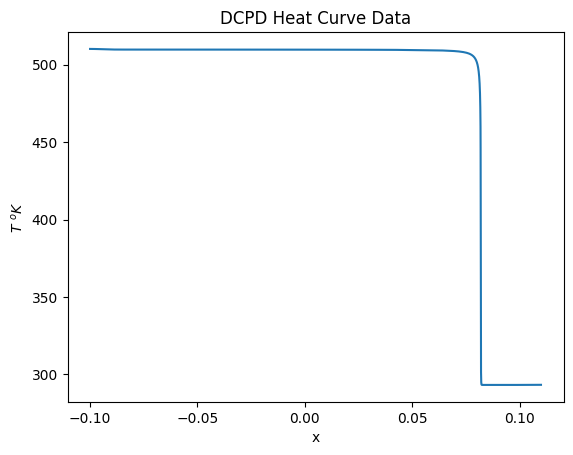

In [28]:
# plot initial curve
plt.plot(x,T1)
plt.xlabel("x")
plt.ylabel(r'$T~^oK$')
plt.title("DCPD Heat Curve Data")

Text(0.5, 1.0, 'Normalized Heat Curve')

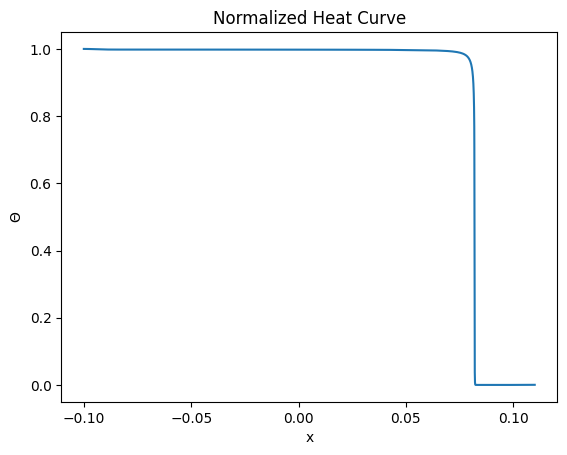

In [9]:
# plot normalized curve
plt.plot(x,theta)
plt.xlabel("x")
plt.ylabel(r"${\Theta}$")
plt.title("Normalized Heat Curve")

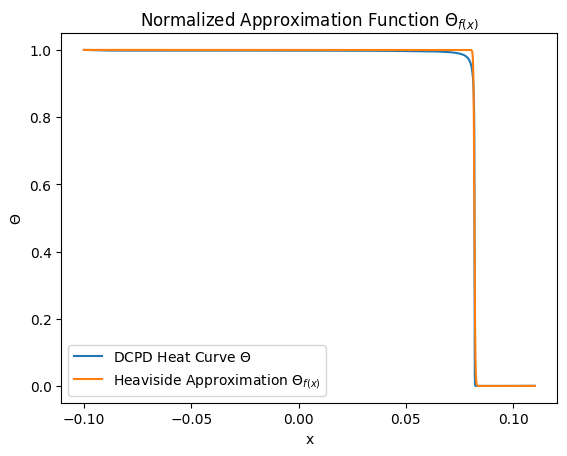

In [21]:
# retune this?
k=2500
thetaf = (1/2)*(1+np.tanh(k*(x_d-x)))

plt.plot(x,theta,label=r"DCPD Heat Curve ${\Theta}$")
plt.plot(x,thetaf,label="Heaviside Approximation ${\Theta}_{f(x)}$")
plt.xlabel("x")
plt.ylabel(r"${\Theta}$")
plt.title(r"Normalized Approximation Function ${\Theta}_{f(x)}$")
plt.legend()

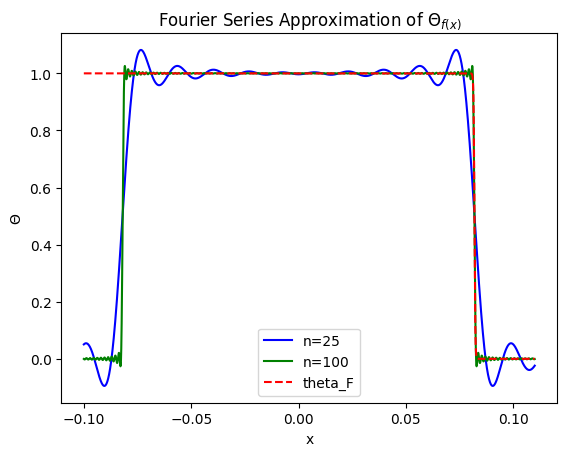

In [22]:
# define constants / limits
n=25
sum = 0
An = []

# functions as lambdas for scipy to play nice
fx = lambda x:((1/2)*(1+np.tanh(k*(x_d-x))))
fcos = lambda x:((1/2)*(1+np.tanh(k*(x_d-x))))*np.cos((i*np.pi*x)/L)

for i in range(n):
    if i == 0.0:
        an=(1/(L)*quad(fx,0.0,2*L)[0])
        An.append(an)
    else:
        an=(2/L)*quad(fcos,0.0,2*L)[0]
        An.append(an)
for i in range(n):
    if i == 0.0:
        sum+=An[i]
    else:
        sum+=An[i]*np.cos((i*x*np.pi)/L)

plt.plot(x,sum,'b',label="n=25")

# reset constants / limits
# retune this?
n = 250
sum=0
An = []

for i in range(n):
    if i == 0.0:
        an=(1/(L)*quad(fx,0.0,2*L)[0])
        An.append(an)
    else:
        an=(2/L)*quad(fcos,0.0,2*L)[0]
        An.append(an)
for i in range(n):
    if i == 0.0:
        sum+=An[i]
    else:
        sum+=An[i]*np.cos((i*x*np.pi)/L)

        
plt.plot(x,sum,'g',label="n=100")
plt.plot(x,thetaf,'r--',label="theta_F")

plt.xlabel("x")
plt.ylabel(r"${\Theta}$")
plt.title(r"Fourier Series Approximation of ${\Theta}_{f(x)}$")
plt.legend()

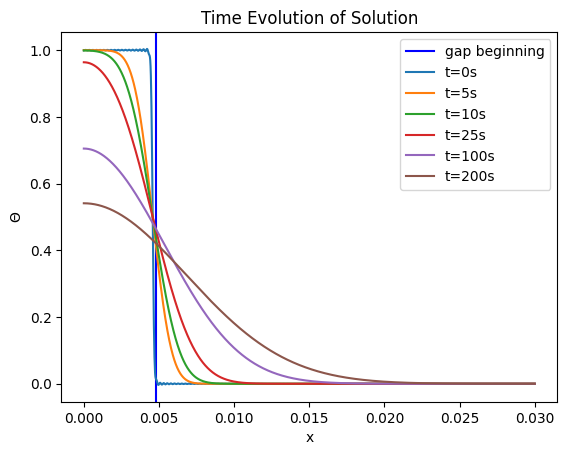

In [15]:
Tn=0
t=0

plt.axvline(x = x_d+0.00025, color = 'b', label = 'gap beginning')

for t in range(0,11,5):
    Tn = 0
    for i in range(n):
        Tn += An[i]*np.cos((i*x*np.pi)/L)*np.exp(-(((i*np.pi)/L)**2)*a*t)
    plt.plot(x,Tn,label=f"t={t}s")
    
t=25
Tn = 0
for i in range(n):
    Tn += An[i]*np.cos((i*x*np.pi)/L)*np.exp(-(((i*np.pi)/L)**2)*a*t)
plt.plot(x,Tn,label=f"t={t}s")
    
t=100
Tn = 0
for i in range(n):
    Tn += An[i]*np.cos((i*x*np.pi)/L)*np.exp(-(((i*np.pi)/L)**2)*a*t)
plt.plot(x,Tn,label=f"t={t}s")

t=200
Tn = 0
for i in range(n):
    Tn += An[i]*np.cos((i*x*np.pi)/L)*np.exp(-(((i*np.pi)/L)**2)*a*t)
plt.plot(x,Tn,label=f"t={t}s")


plt.xlabel("x")
plt.ylabel(r"${\Theta}$")
plt.title("Time Evolution of Solution")

plt.legend()

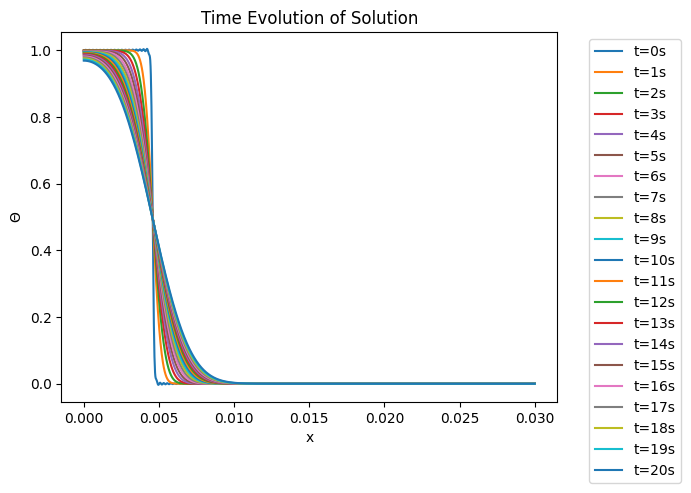

In [17]:
Tn=0
t=0

h = 1000
a=kr/(rhor*Cpr)
b=h/(rhor*Cpr)

lmbda = lambda i, L : (((i*np.pi)/L)**2)
lmbda_n = lambda i, L, b, a : ((((i*np.pi)/L)**2)+(b/a))

# plt.axvline(x = x_d+0.00025, color = 'b', label = 'gap beginning')

for t in range(0,21,):
    Tn = 0
    for i in range(n):
#        Tn += An[i]*np.cos((i*x*np.pi)/L)*np.exp(-lmbda(i,L)*a*t)
        Tn += An[i]*np.cos((i*x*np.pi)/L)*np.exp(-lmbda_n(i,L,b,a)*a*t)
    plt.plot(x,Tn,label=f"t={t}s")
    



plt.xlabel("x")
plt.ylabel(r"${\Theta}$")
plt.title("Time Evolution of Solution")

plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

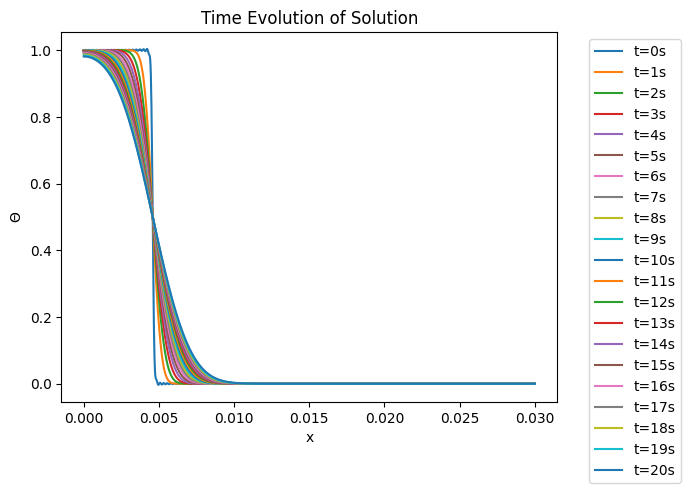

In [18]:
Tn=0
t=0

lmbda = lambda i, L : (((i*np.pi)/L)**2)
lmbda_n = lambda i, L, b, a : ((((i*np.pi)/L)**2)+(b/a))

# plt.axvline(x = x_d+0.00025, color = 'b', label = 'gap beginning')

for t in range(0,21,):
    Tn = 0
    for i in range(n):
        Tn += An[i]*np.cos((i*x*np.pi)/L)*np.exp(-lmbda(i,L)*a*t)
#        Tn += An[i]*np.cos((i*x*np.pi)/L)*np.exp(-lmbda_n(i,L,b,a)*a*t)
    plt.plot(x,Tn,label=f"t={t}s")
    



plt.xlabel("x")
plt.ylabel(r"${\Theta}$")

plt.title("Time Evolution of Solution")

plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

In [19]:
### THIS IS MY BREAK FOR BP/Ts

In [20]:
### END BREAK

82.64453603350003


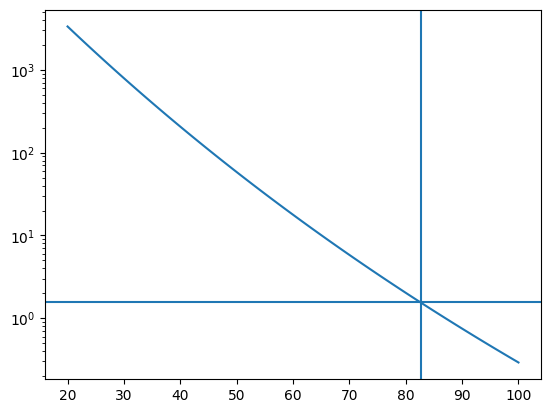

In [20]:
A = 8.55e15
E = 1.1075e5
R = 8.3144621
n_g = 1.720
m_g = 0.770
c_g = 14.480
a_cg = 0.410
t_range = np.linspace(20,100,80)
alpha_o = 0.01
da_dt = []

g_a = lambda alpha : ((1-alpha)**n_g)*(alpha**m)*(1/(1+np.exp(c_g*(alpha-a_cg))))
f_a = lambda alpha : 1/(A*np.exp(-E/(R*((Hr/Cpr)*(alpha - alpha_o)+t_o)))*g_a(alpha))
for t_o in range(20+273, 100+273):
    da_dt.append(quad(f_a, alpha_o, 0.5)[0])

T_s = (np.interp(1.55,da_dt[::-1],t_range))
T_s = 100-(T_s-20)
print(T_s)

plt.axhline(1.55)
plt.axvline(T_s)
plt.yscale("log")
plt.plot(t_range,da_dt)

In [4]:
gaps = [0.0005, 0.001, 0.002, 0.003, 0.005, 0.01]
t = np.linspace(0,100,100)
n = 100

temp = []
for gap in gaps:
    temp.append(fouriertemp(gap+x_gs, t, 0))
#    plt.plot(t,temp[0],label=f"gapsize={gap}m")
    plt.plot(t,temp[0],label=r"$h_l$=" + f"{h/(rhor*Cpr):.3f}" + r"*$\rho_r$*$Cp_r$")
    
    temp = []
plt.xlabel("time (s)")
plt.ylabel(r'$T~^oC$')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

NameError: name 'x_gs' is not defined

In [ ]:
from tqdm.notebook import tqdm
g_a = lambda alpha : ((1-alpha)**n_g)*(alpha**m)*(1/(1+np.exp(c_g*(alpha-a_cg))))
gaps = [0.0005, 0.001, 0.0015, 0.002, 0.0025, 0.003, 0.0035, 0.004, 0.0045, 0.005, 0.0055, 0.006, 0.0065, 0.007, 0.0075, 0.008, 0.0085, 0.009, 0.0095, 0.01]
hs = [0,0.001*rhor*Cpr,0.002*rhor*Cpr,0.003*rhor*Cpr,0.004*rhor*Cpr,0.005*rhor*Cpr]
#hs = [0]
timespace = np.linspace(0,2000,100000)
dt = timespace[2]-timespace[1]
tdiff = 0.15267863661495
t0s = [0,10,20,30]
alpha0 = 0.01
alphan = []
i_n = 0
t_sl = []

tn = 0
# i is always t
for h in hs:
    for gap in gaps:
        for i in timespace[:99999]:
            i_n += 1
            if i == 0:
                alphan.append(alpha0)
                pass
            alpha_val = alphan[i_n-1] + A*np.exp(-E/(R*(fouriertemp_k(x_gs+gap,i,h)-tdiff+tn))) * g_a(alphan[i_n-1]) * dt
            alphan.append(alpha_val)
        #plt.plot(timespace,alphan,label=f"gap size {gap}")
        t_sl.append(np.interp(0.5,alphan,timespace))
        print("progress: " + str(gap / 0.01 * 100) + "%")
        #plt.axvline(t_sl)
        alphan = []
        i_n = 0
    plt.plot(gaps,t_sl,label=r"$h_l$=" + f"{h/(rhor*Cpr):.3f}" + r"*$\rho_r$*$Cp_r$")
    t_sl = []
plt.xlabel("Gap Size (m)")
plt.ylabel(r'$t_{sl}$')
plt.ylim(1800)
plt.legend()

progress: 5.0%
progress: 10.0%
progress: 15.0%
progress: 20.0%
progress: 25.0%
progress: 30.0%
progress: 35.0%
progress: 40.0%
progress: 44.99999999999999%
progress: 50.0%
progress: 54.99999999999999%
progress: 60.0%
progress: 64.99999999999999%
progress: 70.0%
progress: 75.0%
progress: 80.0%
progress: 85.00000000000001%


In [3]:
hs = [0,0.001*rhor*Cpr,0.002*rhor*Cpr,0.003*rhor*Cpr,0.004*rhor*Cpr]
gaps = np.linspace(0,.002,100)
t = np.linspace(0,100,100)
n = 250

def fouriertemp(x,t,h):
    theta_xth = 0
    b = h/(rhor*Cpr)
    for i in range(n):
        theta_xth += An[i]*np.cos((i*x*np.pi)/L)*np.exp(-lmbda_n(i,L,b,a)*a*t)
    T_xth = theta_xth * (np.max(T1)-np.min(T1)) + np.min(T1) - 273
    return T_xth

def fouriertemp_k(x,t,h):
    theta_xth = 0
    b = h/(rhor*Cpr)
    for i in range(n):
        theta_xth += An[i]*np.cos((i*x*np.pi)/L)*np.exp(-lmbda_n(i,L,b,a)*a*t)
    T_xth = theta_xth * (np.max(T1)-np.min(T1)) + np.min(T1)
    return T_xth

t_gs1 = []
for h in hs:
    for gap in gaps:
        x_ge = x_gs + gap
        t_gs1.append(np.interp(T_s,fouriertemp(x_ge,t,h),t))
        #plt.plot(t,fouriertemp(x_ge,t,0))
    plt.plot(gaps*500, t_gs1,label=f"h={h}")
    t_gs1 = []
plt.xlabel("gap length")
plt.ylabel("seconds to 82C")
plt.legend()


NameError: name 'x_gs' is not defined

In [315]:
hs = [0,0.001*rhor*Cpr,0.002*rhor*Cpr,0.003*rhor*Cpr,0.004*rhor*Cpr]
gaps = np.linspace(0,.001,100)
t = np.linspace(0,60,100)
n = 250
t_gs = 100

g_ainv = lambda alpha : 1/((1-alpha)**n_g)*(alpha**m)*(1/(1+np.exp(c_g*(alpha-a_cg))))

def solve(x,t,h):
    def ftemp(t):
        return A*np.exp(-E/(R*fouriertemp_k(x,t,h)))
    def rhfunc(t_gs):
        rhs,__= quad(ftemp,0,t_gs)
        return rhs-lhs
    lhs,__ = quad(g_ainv,alpha_o,0.5)
    t_gs = optimize.newton(rhfunc,5,tol=1e-20,maxiter=10000)
    return t_gs
    

for h in hs:
    for gap in gaps:
        x_ge = x_gs + gap + 0.0001
        print("L: " + str(L))
        print("x_gs: " + str(x_gs))
        print("x_ge: " + str(x_ge))
        result = solve(x_ge,t,h)
        print("output of somefun integral: " + str(result))
    #plt.plot(gaps,t_gs,label=f"h={h}")
#plt.xlabel("gap length")
#plt.ylabel("seconds to 82C")
#plt.legend()

L: 0.01
x_gs: 0.005121686223999055
x_ge: 0.005221686223999055


RuntimeError: Tolerance of 0.0005999999999994898 reached. Failed to converge after 1 iterations, value is 5.0005999999999995.